In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn import metrics
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time

In [3]:
import torch
from torchvision import transforms, datasets

data_transform = transforms.Compose([
        
#         transforms.Lambda(lbp_transform),
#         transforms.Lambda(combine_lbp_hog),
#         transforms.ToPILImage(),
        # transforms.RandomSizedCrop(224),
        transforms.RandomHorizontalFlip(),
#         transforms.RandomVerticalFlip(),
        transforms.RandomRotation(degrees=150),
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])

train_fer = datasets.ImageFolder(root='/tf/data/Quan/fer2013/data/train', transform=data_transform)
val_fer = datasets.ImageFolder(root='/tf/data/Quan/fer2013/data/val', transform=data_transform)
test_fer = datasets.ImageFolder(root='/tf/data/Quan/fer2013/data/test', transform=data_transform)

batch_size = 64
train_loader = torch.utils.data.DataLoader(train_fer,
                                             batch_size=batch_size, shuffle=True,
                                             num_workers=8)
val_loader = torch.utils.data.DataLoader(val_fer,
                                             batch_size=batch_size, shuffle=True,
                                             num_workers=8)
test_loader = torch.utils.data.DataLoader(test_fer,
                                             batch_size=batch_size, shuffle=True,
                                             num_workers=8)

In [4]:
class SVblock(nn.Module):
    def __init__(self, in_neurons, nb_neurons, kernel_size=(3,3), batch_norm=True, activation='relu', **kwargs):
        '''
    in_neurons: C_in
    nb_neurons: n_filters of conv2d
    '''
        super(SVblock, self).__init__()

        self.index = kwargs['index'] if 'index' in kwargs else None
        self.conv1 = nn.Conv2d(in_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv2 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv3 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.bn1 = nn.BatchNorm2d(nb_neurons)
        self.bn2 = nn.BatchNorm2d(nb_neurons)
        self.bn3 = nn.BatchNorm2d(nb_neurons)
        self.relu = nn.LeakyReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=(2,2), stride=2)
        
        self.bn2_ = nn.BatchNorm2d(nb_neurons)
        self.bn3_ = nn.BatchNorm2d(nb_neurons)


    def forward(self, x):        
        
        x = torch.cat(x, dim=1) if type(x) is list else x

        # 1st
        x = self.conv1(x)
        x = self.bn1(x)
        x1 = self.relu(x)

        # 2nd
        x = self.conv2(x1)
        x = self.bn2(x)
        x2 = self.relu(x)
        
        _x2 = x2 + x1
        _x2 = self.bn2_(_x2)
        
        # 3rd
        x = self.conv3(_x2)
        x = self.bn3(x)
        x3 = self.relu(x)
        
        _x3 = x3 + x2
        _x3 = self.bn3_(_x3)

        # maxpooling
        x = self.maxpool(_x3)

        return x

In [43]:
class WeightFeature(nn.Module):
    def __init__(self, feature_depth, target_depth):
        super(WeightFeature, self).__init__()

        self.target_depth = target_depth
        self.fc1 = nn.Linear(feature_depth, target_depth)
        self.bn1 = nn.BatchNorm1d(target_depth)
        self.preconv = nn.Conv2d(target_depth, target_depth, kernel_size=1)
        
        
    def forward(self, x1, x2):
        x1 = nn.AvgPool2d(kernel_size=(x1.size(-2), x1.size(-1)))(x1)
        x1 = nn.Flatten()(x1)

        x1 = self.fc1(x1)
        x1 = self.bn1(x1)
#         x1 = nn.ReLU()(x1)
        x1 = x1.unsqueeze(-1).unsqueeze(-1)

        _x2 = self.preconv(x2)
        
        x = torch.mul(_x2,x1)

        x = x + x2

        return x

In [44]:
class SVGG(nn.Module):
    
    def __init__(self, **kwargs):
        super(SVGG, self).__init__()

        self.device = torch.device('cpu') if not 'device' in kwargs else kwargs['device']

        self.sv0 = SVblock(1, 128).to(self.device)
#         self.sv01 = SVblock(128, 128).to(self.device)
        self.sv1 = SVblock(128, 256).to(self.device)
#         self.sv12 = SVblock(256, 256).to(self.device)
        self.sv2 = SVblock(256, 512).to(self.device)
#         self.sv23 = SVblock(512, 512).to(self.device)
        self.sv3 = SVblock(512, 1024).to(self.device)

        self.wf1 = WeightFeature(128, 256).to(self.device)
        self.wf01_3 = WeightFeature(128,512).to(self.device)
        self.wf2 = WeightFeature(256, 512).to(self.device)
        self.wf3 = WeightFeature(512, 1024).to(self.device)

        self.fc1 = nn.Linear(1024, 512)
        self.bn1 = nn.BatchNorm1d(512)
        self.fc2 = nn.Linear(512, 7)
        self.bn2 = nn.BatchNorm1d(7)
        
    
    def forward(self, x):
        x0 = self.sv0(x)

        x1 = self.sv1(x0)
    
        x_wf1 = self.wf1(x0, x1)

        x2 = self.sv2(x_wf1)
    
        x_wf2 = self.wf2(x1, x2)

        x3 = self.sv3(x_wf2)

        x_wf3 = self.wf3(x2, x3)


        # x_wf1 = nn.AvgPool2d(kernel_size=(x_wf1.size(-2), x_wf1.size(-1)))(x_wf1)
        # x_wf2 = nn.AvgPool2d(kernel_size=(x_wf2.size(-2), x_wf2.size(-1)))(x_wf2)
        x_wf3 = nn.AvgPool2d(kernel_size=(x_wf3.size(-2), x_wf3.size(-1)))(x_wf3)
        # x3 = nn.AvgPool2d(kernel_size=(x3.size(-2), x3.size(-1)))(x3)

        # x = torch.cat([x_wf1, x_wf2, x_wf3, x3], dim=1)
        x = nn.Flatten()(x_wf3)

        x = self.fc1(x)
        x = self.bn1(x)
        x = self.fc2(x)
        x = self.bn2(x)

        return x

In [10]:
device = torch.device('cuda')
print(device)

model = SVGG(device=device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


cuda


Epoch:  1
	 - Step 1: loss: 2.210 acc: 0.094
	 - Step 2: loss: 2.104 acc: 0.125
	 - Step 3: loss: 2.273 acc: 0.125
	 - Step 4: loss: 2.191 acc: 0.094
	 - Step 5: loss: 1.887 acc: 0.188
	 - Step 6: loss: 1.991 acc: 0.109
	 - Step 7: loss: 1.924 acc: 0.172
	 - Step 8: loss: 2.199 acc: 0.094
	 - Step 9: loss: 1.928 acc: 0.203
	 - Step 10: loss: 1.942 acc: 0.125
	 - Step 11: loss: 2.000 acc: 0.172
	 - Step 12: loss: 1.939 acc: 0.125
	 - Step 13: loss: 1.960 acc: 0.125
	 - Step 14: loss: 1.917 acc: 0.156
	 - Step 15: loss: 1.904 acc: 0.250
	 - Step 16: loss: 1.944 acc: 0.109
	 - Step 17: loss: 2.110 acc: 0.203
	 - Step 18: loss: 1.978 acc: 0.109
	 - Step 19: loss: 1.959 acc: 0.125
	 - Step 20: loss: 1.953 acc: 0.172
	 - Step 21: loss: 2.009 acc: 0.094
	 - Step 22: loss: 1.925 acc: 0.109
	 - Step 23: loss: 2.037 acc: 0.125
	 - Step 24: loss: 1.971 acc: 0.125
	 - Step 25: loss: 1.946 acc: 0.141
	 - Step 26: loss: 1.936 acc: 0.125
	 - Step 27: loss: 2.221 acc: 0.141
	 - Step 28: loss: 1.928 ac

	 - Step 227: loss: 1.774 acc: 0.312
	 - Step 228: loss: 1.929 acc: 0.359
	 - Step 229: loss: 1.810 acc: 0.359
	 - Step 230: loss: 1.836 acc: 0.219
	 - Step 231: loss: 1.909 acc: 0.297
	 - Step 232: loss: 1.877 acc: 0.172
	 - Step 233: loss: 1.818 acc: 0.297
	 - Step 234: loss: 1.908 acc: 0.250
	 - Step 235: loss: 1.849 acc: 0.266
	 - Step 236: loss: 1.859 acc: 0.234
	 - Step 237: loss: 1.944 acc: 0.234
	 - Step 238: loss: 1.764 acc: 0.234
	 - Step 239: loss: 1.801 acc: 0.344
	 - Step 240: loss: 1.895 acc: 0.219
	 - Step 241: loss: 1.847 acc: 0.297
	 - Step 242: loss: 1.889 acc: 0.172
	 - Step 243: loss: 1.878 acc: 0.250
	 - Step 244: loss: 1.825 acc: 0.359
	 - Step 245: loss: 1.865 acc: 0.281
	 - Step 246: loss: 2.018 acc: 0.219
	 - Step 247: loss: 2.103 acc: 0.250
	 - Step 248: loss: 1.849 acc: 0.203
	 - Step 249: loss: 1.839 acc: 0.297
	 - Step 250: loss: 1.812 acc: 0.266
	 - Step 251: loss: 1.910 acc: 0.156
	 - Step 252: loss: 1.890 acc: 0.281
	 - Step 253: loss: 1.881 acc: 0.297
	

	 - Step 449: loss: 1.663 acc: 0.324
- Avg.loss: 1.870  | Avg.acc: 0.243
- Avg. val_loss: 1.761  | Avg. val_acc: 0.321
* Update optimal model
Epoch:  2


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVGG. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVblock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type WeightFeature. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


	 - Step 1: loss: 1.763 acc: 0.281
	 - Step 2: loss: 1.643 acc: 0.312
	 - Step 3: loss: 1.649 acc: 0.375
	 - Step 4: loss: 1.624 acc: 0.422
	 - Step 5: loss: 1.747 acc: 0.391
	 - Step 6: loss: 1.662 acc: 0.344
	 - Step 7: loss: 1.668 acc: 0.359
	 - Step 8: loss: 1.844 acc: 0.297
	 - Step 9: loss: 1.623 acc: 0.344
	 - Step 10: loss: 1.859 acc: 0.297
	 - Step 11: loss: 1.715 acc: 0.328
	 - Step 12: loss: 1.617 acc: 0.344
	 - Step 13: loss: 1.569 acc: 0.391
	 - Step 14: loss: 1.669 acc: 0.297
	 - Step 15: loss: 1.575 acc: 0.406
	 - Step 16: loss: 1.722 acc: 0.312
	 - Step 17: loss: 1.750 acc: 0.312
	 - Step 18: loss: 1.636 acc: 0.359
	 - Step 19: loss: 1.623 acc: 0.422
	 - Step 20: loss: 1.716 acc: 0.250
	 - Step 21: loss: 1.751 acc: 0.391
	 - Step 22: loss: 1.590 acc: 0.375
	 - Step 23: loss: 1.595 acc: 0.375
	 - Step 24: loss: 1.698 acc: 0.391
	 - Step 25: loss: 1.619 acc: 0.453
	 - Step 26: loss: 1.677 acc: 0.344
	 - Step 27: loss: 1.724 acc: 0.344
	 - Step 28: loss: 1.643 acc: 0.375
	

	 - Step 227: loss: 1.441 acc: 0.469
	 - Step 228: loss: 1.421 acc: 0.453
	 - Step 229: loss: 1.539 acc: 0.391
	 - Step 230: loss: 1.318 acc: 0.562
	 - Step 231: loss: 1.452 acc: 0.391
	 - Step 232: loss: 1.412 acc: 0.469
	 - Step 233: loss: 1.540 acc: 0.344
	 - Step 234: loss: 1.346 acc: 0.500
	 - Step 235: loss: 1.496 acc: 0.375
	 - Step 236: loss: 1.498 acc: 0.391
	 - Step 237: loss: 1.391 acc: 0.516
	 - Step 238: loss: 1.403 acc: 0.375
	 - Step 239: loss: 1.496 acc: 0.422
	 - Step 240: loss: 1.579 acc: 0.406
	 - Step 241: loss: 1.366 acc: 0.469
	 - Step 242: loss: 1.391 acc: 0.438
	 - Step 243: loss: 1.697 acc: 0.344
	 - Step 244: loss: 1.425 acc: 0.438
	 - Step 245: loss: 1.571 acc: 0.406
	 - Step 246: loss: 1.500 acc: 0.375
	 - Step 247: loss: 1.332 acc: 0.562
	 - Step 248: loss: 1.301 acc: 0.531
	 - Step 249: loss: 1.539 acc: 0.406
	 - Step 250: loss: 1.520 acc: 0.469
	 - Step 251: loss: 1.364 acc: 0.562
	 - Step 252: loss: 1.529 acc: 0.359
	 - Step 253: loss: 1.539 acc: 0.469
	

	 - Step 449: loss: 1.484 acc: 0.568
- Avg.loss: 1.509  | Avg.acc: 0.421
- Avg. val_loss: 1.669  | Avg. val_acc: 0.461
* Update optimal model
Epoch:  3
	 - Step 1: loss: 1.346 acc: 0.594
	 - Step 2: loss: 1.227 acc: 0.594
	 - Step 3: loss: 1.392 acc: 0.484
	 - Step 4: loss: 1.306 acc: 0.516
	 - Step 5: loss: 1.401 acc: 0.500
	 - Step 6: loss: 1.244 acc: 0.500
	 - Step 7: loss: 1.417 acc: 0.453
	 - Step 8: loss: 1.341 acc: 0.500
	 - Step 9: loss: 1.282 acc: 0.531
	 - Step 10: loss: 1.314 acc: 0.469
	 - Step 11: loss: 1.398 acc: 0.500
	 - Step 12: loss: 1.408 acc: 0.453
	 - Step 13: loss: 1.406 acc: 0.453
	 - Step 14: loss: 1.391 acc: 0.328
	 - Step 15: loss: 1.195 acc: 0.547
	 - Step 16: loss: 1.274 acc: 0.531
	 - Step 17: loss: 1.492 acc: 0.406
	 - Step 18: loss: 1.459 acc: 0.391
	 - Step 19: loss: 1.378 acc: 0.438
	 - Step 20: loss: 1.218 acc: 0.500
	 - Step 21: loss: 1.292 acc: 0.469
	 - Step 22: loss: 1.351 acc: 0.547
	 - Step 23: loss: 1.344 acc: 0.531
	 - Step 24: loss: 1.336 acc:

	 - Step 223: loss: 1.282 acc: 0.484
	 - Step 224: loss: 1.167 acc: 0.609
	 - Step 225: loss: 1.416 acc: 0.469
	 - Step 226: loss: 1.111 acc: 0.594
	 - Step 227: loss: 1.203 acc: 0.516
	 - Step 228: loss: 1.378 acc: 0.516
	 - Step 229: loss: 1.100 acc: 0.578
	 - Step 230: loss: 1.152 acc: 0.625
	 - Step 231: loss: 1.254 acc: 0.500
	 - Step 232: loss: 1.258 acc: 0.484
	 - Step 233: loss: 1.160 acc: 0.531
	 - Step 234: loss: 1.442 acc: 0.438
	 - Step 235: loss: 1.326 acc: 0.453
	 - Step 236: loss: 1.167 acc: 0.484
	 - Step 237: loss: 1.224 acc: 0.516
	 - Step 238: loss: 1.288 acc: 0.516
	 - Step 239: loss: 1.231 acc: 0.484
	 - Step 240: loss: 1.411 acc: 0.391
	 - Step 241: loss: 1.431 acc: 0.391
	 - Step 242: loss: 1.147 acc: 0.562
	 - Step 243: loss: 1.082 acc: 0.641
	 - Step 244: loss: 1.243 acc: 0.641
	 - Step 245: loss: 1.257 acc: 0.531
	 - Step 246: loss: 1.361 acc: 0.516
	 - Step 247: loss: 1.209 acc: 0.469
	 - Step 248: loss: 1.392 acc: 0.422
	 - Step 249: loss: 1.218 acc: 0.547
	

	 - Step 445: loss: 1.292 acc: 0.438
	 - Step 446: loss: 1.174 acc: 0.562
	 - Step 447: loss: 1.230 acc: 0.516
	 - Step 448: loss: 1.435 acc: 0.516
	 - Step 449: loss: 1.117 acc: 0.649
- Avg.loss: 1.290  | Avg.acc: 0.511
- Avg. val_loss: 1.307  | Avg. val_acc: 0.514
* Update optimal model
Epoch:  4
	 - Step 1: loss: 1.168 acc: 0.578
	 - Step 2: loss: 1.142 acc: 0.594
	 - Step 3: loss: 1.276 acc: 0.484
	 - Step 4: loss: 1.127 acc: 0.641
	 - Step 5: loss: 1.155 acc: 0.516
	 - Step 6: loss: 1.232 acc: 0.578
	 - Step 7: loss: 1.226 acc: 0.578
	 - Step 8: loss: 1.243 acc: 0.531
	 - Step 9: loss: 1.306 acc: 0.500
	 - Step 10: loss: 1.314 acc: 0.547
	 - Step 11: loss: 1.158 acc: 0.578
	 - Step 12: loss: 1.435 acc: 0.484
	 - Step 13: loss: 1.247 acc: 0.531
	 - Step 14: loss: 1.162 acc: 0.562
	 - Step 15: loss: 1.284 acc: 0.562
	 - Step 16: loss: 1.109 acc: 0.594
	 - Step 17: loss: 1.135 acc: 0.500
	 - Step 18: loss: 1.323 acc: 0.531
	 - Step 19: loss: 1.066 acc: 0.594
	 - Step 20: loss: 1.226 

	 - Step 219: loss: 1.302 acc: 0.500
	 - Step 220: loss: 1.225 acc: 0.516
	 - Step 221: loss: 1.279 acc: 0.562
	 - Step 222: loss: 1.407 acc: 0.484
	 - Step 223: loss: 1.052 acc: 0.625
	 - Step 224: loss: 1.191 acc: 0.562
	 - Step 225: loss: 1.163 acc: 0.531
	 - Step 226: loss: 1.283 acc: 0.562
	 - Step 227: loss: 1.044 acc: 0.609
	 - Step 228: loss: 1.096 acc: 0.578
	 - Step 229: loss: 1.168 acc: 0.562
	 - Step 230: loss: 1.335 acc: 0.453
	 - Step 231: loss: 1.005 acc: 0.641
	 - Step 232: loss: 1.187 acc: 0.500
	 - Step 233: loss: 1.257 acc: 0.562
	 - Step 234: loss: 1.096 acc: 0.562
	 - Step 235: loss: 1.009 acc: 0.625
	 - Step 236: loss: 1.119 acc: 0.672
	 - Step 237: loss: 1.187 acc: 0.516
	 - Step 238: loss: 1.366 acc: 0.453
	 - Step 239: loss: 1.224 acc: 0.578
	 - Step 240: loss: 1.104 acc: 0.641
	 - Step 241: loss: 1.354 acc: 0.422
	 - Step 242: loss: 1.130 acc: 0.578
	 - Step 243: loss: 1.111 acc: 0.578
	 - Step 244: loss: 0.928 acc: 0.719
	 - Step 245: loss: 1.225 acc: 0.500
	

	 - Step 441: loss: 1.215 acc: 0.578
	 - Step 442: loss: 1.172 acc: 0.609
	 - Step 443: loss: 1.192 acc: 0.578
	 - Step 444: loss: 1.487 acc: 0.438
	 - Step 445: loss: 1.121 acc: 0.594
	 - Step 446: loss: 1.208 acc: 0.469
	 - Step 447: loss: 1.410 acc: 0.422
	 - Step 448: loss: 1.066 acc: 0.578
	 - Step 449: loss: 1.098 acc: 0.676
- Avg.loss: 1.173  | Avg.acc: 0.563
- Avg. val_loss: 1.453  | Avg. val_acc: 0.542
* Update optimal model
Epoch:  5
	 - Step 1: loss: 1.024 acc: 0.609
	 - Step 2: loss: 1.188 acc: 0.500
	 - Step 3: loss: 1.055 acc: 0.578
	 - Step 4: loss: 1.062 acc: 0.578
	 - Step 5: loss: 1.205 acc: 0.578
	 - Step 6: loss: 1.122 acc: 0.578
	 - Step 7: loss: 0.840 acc: 0.766
	 - Step 8: loss: 1.123 acc: 0.562
	 - Step 9: loss: 1.114 acc: 0.562
	 - Step 10: loss: 1.273 acc: 0.531
	 - Step 11: loss: 1.304 acc: 0.500
	 - Step 12: loss: 1.076 acc: 0.609
	 - Step 13: loss: 0.893 acc: 0.734
	 - Step 14: loss: 1.237 acc: 0.547
	 - Step 15: loss: 1.090 acc: 0.656
	 - Step 16: loss: 0.

	 - Step 215: loss: 1.249 acc: 0.484
	 - Step 216: loss: 1.072 acc: 0.625
	 - Step 217: loss: 1.187 acc: 0.500
	 - Step 218: loss: 1.192 acc: 0.469
	 - Step 219: loss: 1.110 acc: 0.578
	 - Step 220: loss: 1.012 acc: 0.625
	 - Step 221: loss: 1.008 acc: 0.641
	 - Step 222: loss: 1.050 acc: 0.562
	 - Step 223: loss: 1.228 acc: 0.578
	 - Step 224: loss: 0.905 acc: 0.672
	 - Step 225: loss: 1.054 acc: 0.625
	 - Step 226: loss: 1.158 acc: 0.547
	 - Step 227: loss: 1.135 acc: 0.625
	 - Step 228: loss: 0.938 acc: 0.703
	 - Step 229: loss: 1.039 acc: 0.609
	 - Step 230: loss: 1.080 acc: 0.516
	 - Step 231: loss: 1.340 acc: 0.531
	 - Step 232: loss: 0.921 acc: 0.719
	 - Step 233: loss: 0.919 acc: 0.672
	 - Step 234: loss: 1.065 acc: 0.531
	 - Step 235: loss: 1.183 acc: 0.484
	 - Step 236: loss: 0.990 acc: 0.641
	 - Step 237: loss: 1.139 acc: 0.594
	 - Step 238: loss: 1.078 acc: 0.641
	 - Step 239: loss: 1.083 acc: 0.562
	 - Step 240: loss: 1.080 acc: 0.609
	 - Step 241: loss: 1.036 acc: 0.562
	

	 - Step 437: loss: 1.244 acc: 0.547
	 - Step 438: loss: 1.072 acc: 0.641
	 - Step 439: loss: 0.888 acc: 0.703
	 - Step 440: loss: 1.099 acc: 0.562
	 - Step 441: loss: 0.979 acc: 0.656
	 - Step 442: loss: 1.109 acc: 0.547
	 - Step 443: loss: 1.043 acc: 0.562
	 - Step 444: loss: 0.973 acc: 0.672
	 - Step 445: loss: 1.055 acc: 0.594
	 - Step 446: loss: 1.062 acc: 0.609
	 - Step 447: loss: 1.069 acc: 0.578
	 - Step 448: loss: 1.071 acc: 0.562
	 - Step 449: loss: 0.974 acc: 0.568
- Avg.loss: 1.078  | Avg.acc: 0.596
- Avg. val_loss: 1.119  | Avg. val_acc: 0.579
* Update optimal model
Epoch:  6
	 - Step 1: loss: 0.940 acc: 0.578
	 - Step 2: loss: 1.047 acc: 0.641
	 - Step 3: loss: 1.132 acc: 0.625
	 - Step 4: loss: 1.002 acc: 0.641
	 - Step 5: loss: 1.050 acc: 0.656
	 - Step 6: loss: 1.049 acc: 0.625
	 - Step 7: loss: 1.042 acc: 0.641
	 - Step 8: loss: 0.926 acc: 0.750
	 - Step 9: loss: 0.906 acc: 0.703
	 - Step 10: loss: 0.892 acc: 0.734
	 - Step 11: loss: 0.839 acc: 0.719
	 - Step 12: loss

	 - Step 211: loss: 0.932 acc: 0.641
	 - Step 212: loss: 1.086 acc: 0.594
	 - Step 213: loss: 0.925 acc: 0.703
	 - Step 214: loss: 0.823 acc: 0.750
	 - Step 215: loss: 1.087 acc: 0.562
	 - Step 216: loss: 1.096 acc: 0.547
	 - Step 217: loss: 1.056 acc: 0.672
	 - Step 218: loss: 0.993 acc: 0.625
	 - Step 219: loss: 0.906 acc: 0.641
	 - Step 220: loss: 1.085 acc: 0.609
	 - Step 221: loss: 1.132 acc: 0.547
	 - Step 222: loss: 1.012 acc: 0.594
	 - Step 223: loss: 0.880 acc: 0.688
	 - Step 224: loss: 1.232 acc: 0.516
	 - Step 225: loss: 1.098 acc: 0.609
	 - Step 226: loss: 1.147 acc: 0.547
	 - Step 227: loss: 1.084 acc: 0.625
	 - Step 228: loss: 1.117 acc: 0.547
	 - Step 229: loss: 0.951 acc: 0.688
	 - Step 230: loss: 0.939 acc: 0.625
	 - Step 231: loss: 1.022 acc: 0.609
	 - Step 232: loss: 0.887 acc: 0.703
	 - Step 233: loss: 0.837 acc: 0.672
	 - Step 234: loss: 1.017 acc: 0.562
	 - Step 235: loss: 0.997 acc: 0.625
	 - Step 236: loss: 1.079 acc: 0.594
	 - Step 237: loss: 1.120 acc: 0.578
	

	 - Step 433: loss: 1.044 acc: 0.578
	 - Step 434: loss: 1.044 acc: 0.641
	 - Step 435: loss: 1.032 acc: 0.609
	 - Step 436: loss: 0.919 acc: 0.672
	 - Step 437: loss: 0.739 acc: 0.719
	 - Step 438: loss: 0.974 acc: 0.625
	 - Step 439: loss: 0.830 acc: 0.656
	 - Step 440: loss: 1.013 acc: 0.609
	 - Step 441: loss: 0.888 acc: 0.672
	 - Step 442: loss: 0.916 acc: 0.688
	 - Step 443: loss: 0.888 acc: 0.672
	 - Step 444: loss: 0.993 acc: 0.672
	 - Step 445: loss: 0.738 acc: 0.750
	 - Step 446: loss: 0.956 acc: 0.656
	 - Step 447: loss: 0.818 acc: 0.734
	 - Step 448: loss: 1.005 acc: 0.609
	 - Step 449: loss: 1.033 acc: 0.649
- Avg.loss: 0.990  | Avg.acc: 0.633
- Avg. val_loss: 1.087  | Avg. val_acc: 0.596
* Update optimal model
Epoch:  7
	 - Step 1: loss: 0.810 acc: 0.703
	 - Step 2: loss: 0.936 acc: 0.672
	 - Step 3: loss: 1.002 acc: 0.688
	 - Step 4: loss: 0.984 acc: 0.578
	 - Step 5: loss: 1.091 acc: 0.578
	 - Step 6: loss: 0.819 acc: 0.688
	 - Step 7: loss: 0.924 acc: 0.625
	 - Step 8:

	 - Step 207: loss: 0.882 acc: 0.719
	 - Step 208: loss: 0.693 acc: 0.781
	 - Step 209: loss: 0.859 acc: 0.641
	 - Step 210: loss: 0.809 acc: 0.734
	 - Step 211: loss: 0.884 acc: 0.672
	 - Step 212: loss: 0.724 acc: 0.781
	 - Step 213: loss: 1.053 acc: 0.625
	 - Step 214: loss: 1.031 acc: 0.625
	 - Step 215: loss: 1.051 acc: 0.594
	 - Step 216: loss: 1.043 acc: 0.609
	 - Step 217: loss: 0.964 acc: 0.641
	 - Step 218: loss: 1.021 acc: 0.609
	 - Step 219: loss: 0.786 acc: 0.719
	 - Step 220: loss: 1.104 acc: 0.578
	 - Step 221: loss: 0.817 acc: 0.719
	 - Step 222: loss: 0.789 acc: 0.750
	 - Step 223: loss: 0.827 acc: 0.703
	 - Step 224: loss: 1.000 acc: 0.641
	 - Step 225: loss: 0.959 acc: 0.672
	 - Step 226: loss: 0.967 acc: 0.641
	 - Step 227: loss: 0.703 acc: 0.750
	 - Step 228: loss: 0.842 acc: 0.688
	 - Step 229: loss: 0.733 acc: 0.719
	 - Step 230: loss: 0.946 acc: 0.609
	 - Step 231: loss: 0.881 acc: 0.641
	 - Step 232: loss: 1.181 acc: 0.656
	 - Step 233: loss: 0.952 acc: 0.688
	

	 - Step 429: loss: 0.996 acc: 0.625
	 - Step 430: loss: 0.891 acc: 0.672
	 - Step 431: loss: 0.897 acc: 0.688
	 - Step 432: loss: 0.912 acc: 0.625
	 - Step 433: loss: 0.764 acc: 0.750
	 - Step 434: loss: 0.906 acc: 0.609
	 - Step 435: loss: 0.836 acc: 0.656
	 - Step 436: loss: 0.961 acc: 0.609
	 - Step 437: loss: 0.965 acc: 0.641
	 - Step 438: loss: 0.866 acc: 0.609
	 - Step 439: loss: 0.721 acc: 0.781
	 - Step 440: loss: 0.856 acc: 0.703
	 - Step 441: loss: 0.910 acc: 0.656
	 - Step 442: loss: 0.851 acc: 0.672
	 - Step 443: loss: 1.151 acc: 0.578
	 - Step 444: loss: 0.862 acc: 0.703
	 - Step 445: loss: 0.949 acc: 0.625
	 - Step 446: loss: 0.917 acc: 0.703
	 - Step 447: loss: 1.132 acc: 0.578
	 - Step 448: loss: 0.939 acc: 0.625
	 - Step 449: loss: 1.053 acc: 0.568
- Avg.loss: 0.918  | Avg.acc: 0.663
- Avg. val_loss: 1.057  | Avg. val_acc: 0.602
* Update optimal model
Epoch:  8
	 - Step 1: loss: 1.025 acc: 0.625
	 - Step 2: loss: 0.811 acc: 0.734
	 - Step 3: loss: 0.845 acc: 0.672
	 -

	 - Step 203: loss: 0.741 acc: 0.734
	 - Step 204: loss: 0.799 acc: 0.688
	 - Step 205: loss: 0.678 acc: 0.797
	 - Step 206: loss: 0.799 acc: 0.703
	 - Step 207: loss: 0.796 acc: 0.688
	 - Step 208: loss: 0.855 acc: 0.641
	 - Step 209: loss: 0.876 acc: 0.719
	 - Step 210: loss: 0.845 acc: 0.703
	 - Step 211: loss: 0.926 acc: 0.703
	 - Step 212: loss: 0.688 acc: 0.781
	 - Step 213: loss: 0.914 acc: 0.641
	 - Step 214: loss: 0.952 acc: 0.688
	 - Step 215: loss: 1.051 acc: 0.594
	 - Step 216: loss: 0.669 acc: 0.734
	 - Step 217: loss: 0.872 acc: 0.625
	 - Step 218: loss: 0.738 acc: 0.750
	 - Step 219: loss: 0.666 acc: 0.734
	 - Step 220: loss: 0.964 acc: 0.656
	 - Step 221: loss: 0.842 acc: 0.688
	 - Step 222: loss: 0.905 acc: 0.641
	 - Step 223: loss: 0.782 acc: 0.656
	 - Step 224: loss: 0.811 acc: 0.734
	 - Step 225: loss: 0.848 acc: 0.688
	 - Step 226: loss: 1.169 acc: 0.578
	 - Step 227: loss: 0.653 acc: 0.797
	 - Step 228: loss: 0.816 acc: 0.719
	 - Step 229: loss: 0.906 acc: 0.656
	

	 - Step 425: loss: 1.125 acc: 0.641
	 - Step 426: loss: 0.833 acc: 0.641
	 - Step 427: loss: 0.704 acc: 0.766
	 - Step 428: loss: 0.726 acc: 0.719
	 - Step 429: loss: 0.733 acc: 0.766
	 - Step 430: loss: 0.763 acc: 0.719
	 - Step 431: loss: 0.954 acc: 0.547
	 - Step 432: loss: 0.830 acc: 0.625
	 - Step 433: loss: 0.836 acc: 0.734
	 - Step 434: loss: 0.887 acc: 0.672
	 - Step 435: loss: 0.707 acc: 0.734
	 - Step 436: loss: 0.913 acc: 0.672
	 - Step 437: loss: 0.924 acc: 0.625
	 - Step 438: loss: 0.833 acc: 0.719
	 - Step 439: loss: 0.812 acc: 0.734
	 - Step 440: loss: 0.737 acc: 0.688
	 - Step 441: loss: 0.861 acc: 0.703
	 - Step 442: loss: 0.886 acc: 0.641
	 - Step 443: loss: 1.058 acc: 0.625
	 - Step 444: loss: 0.859 acc: 0.656
	 - Step 445: loss: 0.799 acc: 0.688
	 - Step 446: loss: 1.039 acc: 0.625
	 - Step 447: loss: 0.943 acc: 0.672
	 - Step 448: loss: 0.821 acc: 0.703
	 - Step 449: loss: 0.992 acc: 0.568
- Avg.loss: 0.839  | Avg.acc: 0.696
- Avg. val_loss: 1.053  | Avg. val_acc:

	 - Step 199: loss: 0.762 acc: 0.672
	 - Step 200: loss: 0.698 acc: 0.734
	 - Step 201: loss: 0.745 acc: 0.719
	 - Step 202: loss: 0.917 acc: 0.672
	 - Step 203: loss: 0.826 acc: 0.734
	 - Step 204: loss: 0.774 acc: 0.750
	 - Step 205: loss: 0.822 acc: 0.719
	 - Step 206: loss: 0.978 acc: 0.609
	 - Step 207: loss: 0.869 acc: 0.688
	 - Step 208: loss: 0.855 acc: 0.625
	 - Step 209: loss: 0.711 acc: 0.766
	 - Step 210: loss: 0.657 acc: 0.797
	 - Step 211: loss: 0.532 acc: 0.812
	 - Step 212: loss: 0.697 acc: 0.750
	 - Step 213: loss: 0.698 acc: 0.781
	 - Step 214: loss: 0.797 acc: 0.719
	 - Step 215: loss: 0.948 acc: 0.625
	 - Step 216: loss: 0.826 acc: 0.734
	 - Step 217: loss: 0.761 acc: 0.703
	 - Step 218: loss: 0.976 acc: 0.609
	 - Step 219: loss: 0.776 acc: 0.781
	 - Step 220: loss: 0.903 acc: 0.641
	 - Step 221: loss: 0.743 acc: 0.766
	 - Step 222: loss: 0.718 acc: 0.766
	 - Step 223: loss: 0.615 acc: 0.812
	 - Step 224: loss: 0.638 acc: 0.797
	 - Step 225: loss: 0.864 acc: 0.703
	

	 - Step 421: loss: 0.716 acc: 0.750
	 - Step 422: loss: 0.867 acc: 0.672
	 - Step 423: loss: 1.000 acc: 0.625
	 - Step 424: loss: 0.883 acc: 0.672
	 - Step 425: loss: 0.720 acc: 0.781
	 - Step 426: loss: 0.880 acc: 0.672
	 - Step 427: loss: 0.507 acc: 0.797
	 - Step 428: loss: 0.749 acc: 0.734
	 - Step 429: loss: 0.646 acc: 0.781
	 - Step 430: loss: 0.810 acc: 0.688
	 - Step 431: loss: 0.676 acc: 0.734
	 - Step 432: loss: 0.775 acc: 0.734
	 - Step 433: loss: 0.610 acc: 0.828
	 - Step 434: loss: 0.640 acc: 0.781
	 - Step 435: loss: 0.736 acc: 0.766
	 - Step 436: loss: 0.666 acc: 0.812
	 - Step 437: loss: 0.830 acc: 0.703
	 - Step 438: loss: 0.739 acc: 0.703
	 - Step 439: loss: 0.673 acc: 0.766
	 - Step 440: loss: 0.695 acc: 0.719
	 - Step 441: loss: 0.766 acc: 0.750
	 - Step 442: loss: 0.488 acc: 0.859
	 - Step 443: loss: 0.713 acc: 0.719
	 - Step 444: loss: 1.117 acc: 0.641
	 - Step 445: loss: 0.670 acc: 0.797
	 - Step 446: loss: 0.753 acc: 0.750
	 - Step 447: loss: 0.908 acc: 0.656
	

	 - Step 195: loss: 0.693 acc: 0.734
	 - Step 196: loss: 0.651 acc: 0.812
	 - Step 197: loss: 0.460 acc: 0.828
	 - Step 198: loss: 0.706 acc: 0.719
	 - Step 199: loss: 0.743 acc: 0.750
	 - Step 200: loss: 0.590 acc: 0.828
	 - Step 201: loss: 0.746 acc: 0.703
	 - Step 202: loss: 0.700 acc: 0.719
	 - Step 203: loss: 0.736 acc: 0.734
	 - Step 204: loss: 0.690 acc: 0.750
	 - Step 205: loss: 0.521 acc: 0.781
	 - Step 206: loss: 0.642 acc: 0.750
	 - Step 207: loss: 0.660 acc: 0.688
	 - Step 208: loss: 0.617 acc: 0.828
	 - Step 209: loss: 0.691 acc: 0.703
	 - Step 210: loss: 0.897 acc: 0.672
	 - Step 211: loss: 0.562 acc: 0.781
	 - Step 212: loss: 0.526 acc: 0.781
	 - Step 213: loss: 0.751 acc: 0.734
	 - Step 214: loss: 0.934 acc: 0.609
	 - Step 215: loss: 0.582 acc: 0.797
	 - Step 216: loss: 0.694 acc: 0.703
	 - Step 217: loss: 0.805 acc: 0.766
	 - Step 218: loss: 0.789 acc: 0.703
	 - Step 219: loss: 0.627 acc: 0.750
	 - Step 220: loss: 0.613 acc: 0.750
	 - Step 221: loss: 0.693 acc: 0.719
	

	 - Step 417: loss: 0.640 acc: 0.828
	 - Step 418: loss: 0.815 acc: 0.656
	 - Step 419: loss: 0.791 acc: 0.766
	 - Step 420: loss: 0.494 acc: 0.844
	 - Step 421: loss: 0.503 acc: 0.828
	 - Step 422: loss: 0.699 acc: 0.781
	 - Step 423: loss: 0.556 acc: 0.781
	 - Step 424: loss: 0.505 acc: 0.828
	 - Step 425: loss: 0.593 acc: 0.844
	 - Step 426: loss: 0.678 acc: 0.750
	 - Step 427: loss: 0.797 acc: 0.688
	 - Step 428: loss: 0.673 acc: 0.750
	 - Step 429: loss: 0.874 acc: 0.672
	 - Step 430: loss: 0.683 acc: 0.719
	 - Step 431: loss: 0.927 acc: 0.641
	 - Step 432: loss: 0.489 acc: 0.844
	 - Step 433: loss: 0.514 acc: 0.844
	 - Step 434: loss: 0.648 acc: 0.812
	 - Step 435: loss: 0.792 acc: 0.734
	 - Step 436: loss: 0.905 acc: 0.719
	 - Step 437: loss: 0.743 acc: 0.703
	 - Step 438: loss: 0.815 acc: 0.688
	 - Step 439: loss: 0.766 acc: 0.641
	 - Step 440: loss: 0.647 acc: 0.750
	 - Step 441: loss: 0.597 acc: 0.797
	 - Step 442: loss: 0.802 acc: 0.703
	 - Step 443: loss: 0.807 acc: 0.672
	

	 - Step 191: loss: 0.438 acc: 0.875
	 - Step 192: loss: 0.599 acc: 0.750
	 - Step 193: loss: 0.525 acc: 0.828
	 - Step 194: loss: 0.801 acc: 0.734
	 - Step 195: loss: 0.574 acc: 0.812
	 - Step 196: loss: 0.570 acc: 0.844
	 - Step 197: loss: 0.491 acc: 0.797
	 - Step 198: loss: 0.582 acc: 0.812
	 - Step 199: loss: 0.469 acc: 0.828
	 - Step 200: loss: 0.610 acc: 0.750
	 - Step 201: loss: 0.516 acc: 0.844
	 - Step 202: loss: 0.522 acc: 0.812
	 - Step 203: loss: 0.506 acc: 0.828
	 - Step 204: loss: 0.558 acc: 0.781
	 - Step 205: loss: 0.523 acc: 0.891
	 - Step 206: loss: 0.767 acc: 0.734
	 - Step 207: loss: 0.525 acc: 0.766
	 - Step 208: loss: 0.591 acc: 0.781
	 - Step 209: loss: 0.602 acc: 0.750
	 - Step 210: loss: 0.620 acc: 0.812
	 - Step 211: loss: 0.427 acc: 0.875
	 - Step 212: loss: 0.547 acc: 0.766
	 - Step 213: loss: 0.523 acc: 0.828
	 - Step 214: loss: 0.621 acc: 0.719
	 - Step 215: loss: 0.621 acc: 0.766
	 - Step 216: loss: 0.523 acc: 0.812
	 - Step 217: loss: 0.631 acc: 0.797
	

	 - Step 413: loss: 0.540 acc: 0.812
	 - Step 414: loss: 0.787 acc: 0.719
	 - Step 415: loss: 0.459 acc: 0.859
	 - Step 416: loss: 0.531 acc: 0.828
	 - Step 417: loss: 0.632 acc: 0.734
	 - Step 418: loss: 0.700 acc: 0.719
	 - Step 419: loss: 0.695 acc: 0.766
	 - Step 420: loss: 0.560 acc: 0.828
	 - Step 421: loss: 0.621 acc: 0.766
	 - Step 422: loss: 0.600 acc: 0.828
	 - Step 423: loss: 0.519 acc: 0.859
	 - Step 424: loss: 0.465 acc: 0.859
	 - Step 425: loss: 0.646 acc: 0.797
	 - Step 426: loss: 0.554 acc: 0.797
	 - Step 427: loss: 0.501 acc: 0.797
	 - Step 428: loss: 0.686 acc: 0.781
	 - Step 429: loss: 0.524 acc: 0.781
	 - Step 430: loss: 0.726 acc: 0.734
	 - Step 431: loss: 0.690 acc: 0.766
	 - Step 432: loss: 0.551 acc: 0.812
	 - Step 433: loss: 0.710 acc: 0.719
	 - Step 434: loss: 0.490 acc: 0.828
	 - Step 435: loss: 0.756 acc: 0.750
	 - Step 436: loss: 0.639 acc: 0.766
	 - Step 437: loss: 0.477 acc: 0.891
	 - Step 438: loss: 0.567 acc: 0.781
	 - Step 439: loss: 0.614 acc: 0.766
	

	 - Step 187: loss: 0.375 acc: 0.875
	 - Step 188: loss: 0.430 acc: 0.859
	 - Step 189: loss: 0.565 acc: 0.844
	 - Step 190: loss: 0.602 acc: 0.781
	 - Step 191: loss: 0.453 acc: 0.828
	 - Step 192: loss: 0.624 acc: 0.797
	 - Step 193: loss: 0.435 acc: 0.812
	 - Step 194: loss: 0.553 acc: 0.828
	 - Step 195: loss: 0.553 acc: 0.797
	 - Step 196: loss: 0.583 acc: 0.797
	 - Step 197: loss: 0.508 acc: 0.797
	 - Step 198: loss: 0.627 acc: 0.766
	 - Step 199: loss: 0.626 acc: 0.797
	 - Step 200: loss: 0.454 acc: 0.859
	 - Step 201: loss: 0.443 acc: 0.859
	 - Step 202: loss: 0.566 acc: 0.828
	 - Step 203: loss: 0.361 acc: 0.875
	 - Step 204: loss: 0.460 acc: 0.828
	 - Step 205: loss: 0.399 acc: 0.844
	 - Step 206: loss: 0.573 acc: 0.750
	 - Step 207: loss: 0.604 acc: 0.766
	 - Step 208: loss: 0.419 acc: 0.844
	 - Step 209: loss: 0.458 acc: 0.781
	 - Step 210: loss: 0.604 acc: 0.812
	 - Step 211: loss: 0.658 acc: 0.750
	 - Step 212: loss: 0.441 acc: 0.859
	 - Step 213: loss: 0.404 acc: 0.797
	

	 - Step 409: loss: 0.791 acc: 0.750
	 - Step 410: loss: 0.611 acc: 0.781
	 - Step 411: loss: 0.351 acc: 0.906
	 - Step 412: loss: 0.595 acc: 0.781
	 - Step 413: loss: 0.401 acc: 0.828
	 - Step 414: loss: 0.463 acc: 0.812
	 - Step 415: loss: 0.461 acc: 0.781
	 - Step 416: loss: 0.593 acc: 0.828
	 - Step 417: loss: 0.434 acc: 0.828
	 - Step 418: loss: 0.554 acc: 0.844
	 - Step 419: loss: 0.510 acc: 0.781
	 - Step 420: loss: 0.700 acc: 0.688
	 - Step 421: loss: 0.409 acc: 0.844
	 - Step 422: loss: 0.377 acc: 0.828
	 - Step 423: loss: 0.516 acc: 0.812
	 - Step 424: loss: 0.630 acc: 0.766
	 - Step 425: loss: 0.730 acc: 0.719
	 - Step 426: loss: 0.427 acc: 0.844
	 - Step 427: loss: 0.581 acc: 0.812
	 - Step 428: loss: 0.563 acc: 0.828
	 - Step 429: loss: 0.452 acc: 0.875
	 - Step 430: loss: 0.558 acc: 0.812
	 - Step 431: loss: 0.406 acc: 0.844
	 - Step 432: loss: 0.486 acc: 0.828
	 - Step 433: loss: 0.592 acc: 0.750
	 - Step 434: loss: 0.492 acc: 0.828
	 - Step 435: loss: 0.460 acc: 0.828
	

	 - Step 183: loss: 0.287 acc: 0.906
	 - Step 184: loss: 0.397 acc: 0.859
	 - Step 185: loss: 0.556 acc: 0.844
	 - Step 186: loss: 0.462 acc: 0.797
	 - Step 187: loss: 0.368 acc: 0.859
	 - Step 188: loss: 0.220 acc: 0.938
	 - Step 189: loss: 0.314 acc: 0.891
	 - Step 190: loss: 0.372 acc: 0.875
	 - Step 191: loss: 0.497 acc: 0.781
	 - Step 192: loss: 0.268 acc: 0.922
	 - Step 193: loss: 0.554 acc: 0.844
	 - Step 194: loss: 0.509 acc: 0.844
	 - Step 195: loss: 0.383 acc: 0.875
	 - Step 196: loss: 0.280 acc: 0.906
	 - Step 197: loss: 0.339 acc: 0.906
	 - Step 198: loss: 0.498 acc: 0.812
	 - Step 199: loss: 0.322 acc: 0.891
	 - Step 200: loss: 0.366 acc: 0.922
	 - Step 201: loss: 0.351 acc: 0.891
	 - Step 202: loss: 0.315 acc: 0.906
	 - Step 203: loss: 0.464 acc: 0.781
	 - Step 204: loss: 0.393 acc: 0.891
	 - Step 205: loss: 0.474 acc: 0.844
	 - Step 206: loss: 0.336 acc: 0.906
	 - Step 207: loss: 0.364 acc: 0.875
	 - Step 208: loss: 0.335 acc: 0.922
	 - Step 209: loss: 0.217 acc: 0.938
	

	 - Step 405: loss: 0.592 acc: 0.797
	 - Step 406: loss: 0.317 acc: 0.891
	 - Step 407: loss: 0.324 acc: 0.906
	 - Step 408: loss: 0.493 acc: 0.828
	 - Step 409: loss: 0.386 acc: 0.812
	 - Step 410: loss: 0.421 acc: 0.844
	 - Step 411: loss: 0.429 acc: 0.859
	 - Step 412: loss: 0.385 acc: 0.859
	 - Step 413: loss: 0.441 acc: 0.797
	 - Step 414: loss: 0.507 acc: 0.797
	 - Step 415: loss: 0.475 acc: 0.844
	 - Step 416: loss: 0.572 acc: 0.766
	 - Step 417: loss: 0.338 acc: 0.891
	 - Step 418: loss: 0.276 acc: 0.953
	 - Step 419: loss: 0.463 acc: 0.859
	 - Step 420: loss: 0.394 acc: 0.859
	 - Step 421: loss: 0.500 acc: 0.812
	 - Step 422: loss: 0.396 acc: 0.844
	 - Step 423: loss: 0.339 acc: 0.859
	 - Step 424: loss: 0.330 acc: 0.891
	 - Step 425: loss: 0.401 acc: 0.859
	 - Step 426: loss: 0.486 acc: 0.859
	 - Step 427: loss: 0.489 acc: 0.828
	 - Step 428: loss: 0.346 acc: 0.906
	 - Step 429: loss: 0.355 acc: 0.844
	 - Step 430: loss: 0.466 acc: 0.797
	 - Step 431: loss: 0.342 acc: 0.906
	

	 - Step 179: loss: 0.427 acc: 0.844
	 - Step 180: loss: 0.284 acc: 0.906
	 - Step 181: loss: 0.330 acc: 0.891
	 - Step 182: loss: 0.191 acc: 0.984
	 - Step 183: loss: 0.309 acc: 0.906
	 - Step 184: loss: 0.290 acc: 0.922
	 - Step 185: loss: 0.377 acc: 0.859
	 - Step 186: loss: 0.249 acc: 0.922
	 - Step 187: loss: 0.367 acc: 0.906
	 - Step 188: loss: 0.263 acc: 0.906
	 - Step 189: loss: 0.305 acc: 0.891
	 - Step 190: loss: 0.428 acc: 0.828
	 - Step 191: loss: 0.324 acc: 0.906
	 - Step 192: loss: 0.393 acc: 0.891
	 - Step 193: loss: 0.135 acc: 0.969
	 - Step 194: loss: 0.182 acc: 0.953
	 - Step 195: loss: 0.314 acc: 0.891
	 - Step 196: loss: 0.215 acc: 0.938
	 - Step 197: loss: 0.256 acc: 0.938
	 - Step 198: loss: 0.325 acc: 0.891
	 - Step 199: loss: 0.371 acc: 0.891
	 - Step 200: loss: 0.285 acc: 0.906
	 - Step 201: loss: 0.267 acc: 0.938
	 - Step 202: loss: 0.163 acc: 0.953
	 - Step 203: loss: 0.448 acc: 0.828
	 - Step 204: loss: 0.264 acc: 0.922
	 - Step 205: loss: 0.178 acc: 0.969
	

	 - Step 401: loss: 0.361 acc: 0.828
	 - Step 402: loss: 0.338 acc: 0.859
	 - Step 403: loss: 0.244 acc: 0.938
	 - Step 404: loss: 0.263 acc: 0.906
	 - Step 405: loss: 0.249 acc: 0.891
	 - Step 406: loss: 0.277 acc: 0.906
	 - Step 407: loss: 0.407 acc: 0.828
	 - Step 408: loss: 0.298 acc: 0.906
	 - Step 409: loss: 0.458 acc: 0.844
	 - Step 410: loss: 0.197 acc: 0.953
	 - Step 411: loss: 0.364 acc: 0.891
	 - Step 412: loss: 0.257 acc: 0.938
	 - Step 413: loss: 0.149 acc: 0.953
	 - Step 414: loss: 0.266 acc: 0.938
	 - Step 415: loss: 0.370 acc: 0.891
	 - Step 416: loss: 0.347 acc: 0.891
	 - Step 417: loss: 0.302 acc: 0.906
	 - Step 418: loss: 0.188 acc: 0.938
	 - Step 419: loss: 0.364 acc: 0.922
	 - Step 420: loss: 0.330 acc: 0.859
	 - Step 421: loss: 0.341 acc: 0.875
	 - Step 422: loss: 0.370 acc: 0.859
	 - Step 423: loss: 0.220 acc: 0.938
	 - Step 424: loss: 0.189 acc: 0.953
	 - Step 425: loss: 0.280 acc: 0.891
	 - Step 426: loss: 0.450 acc: 0.812
	 - Step 427: loss: 0.248 acc: 0.906
	

	 - Step 175: loss: 0.177 acc: 0.953
	 - Step 176: loss: 0.137 acc: 0.953
	 - Step 177: loss: 0.192 acc: 0.953
	 - Step 178: loss: 0.251 acc: 0.906
	 - Step 179: loss: 0.190 acc: 0.938
	 - Step 180: loss: 0.220 acc: 0.953
	 - Step 181: loss: 0.289 acc: 0.875
	 - Step 182: loss: 0.192 acc: 0.953
	 - Step 183: loss: 0.243 acc: 0.938
	 - Step 184: loss: 0.201 acc: 0.953
	 - Step 185: loss: 0.141 acc: 0.953
	 - Step 186: loss: 0.142 acc: 0.953
	 - Step 187: loss: 0.145 acc: 0.969
	 - Step 188: loss: 0.088 acc: 1.000
	 - Step 189: loss: 0.392 acc: 0.891
	 - Step 190: loss: 0.098 acc: 1.000
	 - Step 191: loss: 0.170 acc: 0.953
	 - Step 192: loss: 0.149 acc: 0.969
	 - Step 193: loss: 0.294 acc: 0.891
	 - Step 194: loss: 0.263 acc: 0.938
	 - Step 195: loss: 0.328 acc: 0.906
	 - Step 196: loss: 0.157 acc: 0.938
	 - Step 197: loss: 0.267 acc: 0.938
	 - Step 198: loss: 0.155 acc: 0.969
	 - Step 199: loss: 0.207 acc: 0.953
	 - Step 200: loss: 0.078 acc: 1.000
	 - Step 201: loss: 0.192 acc: 0.922
	

	 - Step 397: loss: 0.158 acc: 0.969
	 - Step 398: loss: 0.254 acc: 0.953
	 - Step 399: loss: 0.394 acc: 0.859
	 - Step 400: loss: 0.213 acc: 0.953
	 - Step 401: loss: 0.156 acc: 0.984
	 - Step 402: loss: 0.275 acc: 0.891
	 - Step 403: loss: 0.279 acc: 0.875
	 - Step 404: loss: 0.180 acc: 0.938
	 - Step 405: loss: 0.132 acc: 0.969
	 - Step 406: loss: 0.343 acc: 0.906
	 - Step 407: loss: 0.286 acc: 0.906
	 - Step 408: loss: 0.153 acc: 0.953
	 - Step 409: loss: 0.257 acc: 0.922
	 - Step 410: loss: 0.257 acc: 0.938
	 - Step 411: loss: 0.363 acc: 0.891
	 - Step 412: loss: 0.119 acc: 0.984
	 - Step 413: loss: 0.220 acc: 0.953
	 - Step 414: loss: 0.298 acc: 0.875
	 - Step 415: loss: 0.171 acc: 0.922
	 - Step 416: loss: 0.243 acc: 0.891
	 - Step 417: loss: 0.255 acc: 0.938
	 - Step 418: loss: 0.239 acc: 0.906
	 - Step 419: loss: 0.455 acc: 0.859
	 - Step 420: loss: 0.218 acc: 0.891
	 - Step 421: loss: 0.239 acc: 0.953
	 - Step 422: loss: 0.342 acc: 0.875
	 - Step 423: loss: 0.345 acc: 0.906
	

	 - Step 171: loss: 0.138 acc: 0.969
	 - Step 172: loss: 0.062 acc: 1.000
	 - Step 173: loss: 0.118 acc: 0.969
	 - Step 174: loss: 0.188 acc: 0.891
	 - Step 175: loss: 0.172 acc: 0.953
	 - Step 176: loss: 0.079 acc: 0.984
	 - Step 177: loss: 0.108 acc: 0.969
	 - Step 178: loss: 0.194 acc: 0.969
	 - Step 179: loss: 0.164 acc: 0.969
	 - Step 180: loss: 0.338 acc: 0.938
	 - Step 181: loss: 0.140 acc: 0.969
	 - Step 182: loss: 0.124 acc: 0.953
	 - Step 183: loss: 0.152 acc: 0.984
	 - Step 184: loss: 0.071 acc: 1.000
	 - Step 185: loss: 0.057 acc: 1.000
	 - Step 186: loss: 0.118 acc: 0.969
	 - Step 187: loss: 0.220 acc: 0.938
	 - Step 188: loss: 0.156 acc: 0.938
	 - Step 189: loss: 0.083 acc: 0.969
	 - Step 190: loss: 0.414 acc: 0.875
	 - Step 191: loss: 0.121 acc: 0.984
	 - Step 192: loss: 0.133 acc: 0.953
	 - Step 193: loss: 0.095 acc: 0.984
	 - Step 194: loss: 0.145 acc: 0.969
	 - Step 195: loss: 0.341 acc: 0.875
	 - Step 196: loss: 0.096 acc: 0.969
	 - Step 197: loss: 0.124 acc: 0.953
	

	 - Step 393: loss: 0.225 acc: 0.891
	 - Step 394: loss: 0.197 acc: 0.922
	 - Step 395: loss: 0.262 acc: 0.891
	 - Step 396: loss: 0.189 acc: 0.906
	 - Step 397: loss: 0.178 acc: 0.969
	 - Step 398: loss: 0.118 acc: 0.969
	 - Step 399: loss: 0.165 acc: 0.938
	 - Step 400: loss: 0.238 acc: 0.906
	 - Step 401: loss: 0.128 acc: 0.953
	 - Step 402: loss: 0.162 acc: 0.953
	 - Step 403: loss: 0.190 acc: 0.922
	 - Step 404: loss: 0.139 acc: 0.953
	 - Step 405: loss: 0.159 acc: 0.953
	 - Step 406: loss: 0.118 acc: 0.969
	 - Step 407: loss: 0.223 acc: 0.953
	 - Step 408: loss: 0.243 acc: 0.906
	 - Step 409: loss: 0.103 acc: 0.984
	 - Step 410: loss: 0.324 acc: 0.859
	 - Step 411: loss: 0.258 acc: 0.891
	 - Step 412: loss: 0.188 acc: 0.906
	 - Step 413: loss: 0.263 acc: 0.938
	 - Step 414: loss: 0.200 acc: 0.969
	 - Step 415: loss: 0.220 acc: 0.953
	 - Step 416: loss: 0.167 acc: 0.953
	 - Step 417: loss: 0.113 acc: 0.969
	 - Step 418: loss: 0.229 acc: 0.891
	 - Step 419: loss: 0.247 acc: 0.906
	

	 - Step 167: loss: 0.151 acc: 0.969
	 - Step 168: loss: 0.161 acc: 0.953
	 - Step 169: loss: 0.154 acc: 0.922
	 - Step 170: loss: 0.152 acc: 0.969
	 - Step 171: loss: 0.125 acc: 0.953
	 - Step 172: loss: 0.150 acc: 0.938
	 - Step 173: loss: 0.103 acc: 0.984
	 - Step 174: loss: 0.248 acc: 0.891
	 - Step 175: loss: 0.067 acc: 1.000
	 - Step 176: loss: 0.082 acc: 0.969
	 - Step 177: loss: 0.213 acc: 0.969
	 - Step 178: loss: 0.142 acc: 0.953
	 - Step 179: loss: 0.263 acc: 0.938
	 - Step 180: loss: 0.166 acc: 0.922
	 - Step 181: loss: 0.117 acc: 0.953
	 - Step 182: loss: 0.109 acc: 0.984
	 - Step 183: loss: 0.168 acc: 0.953
	 - Step 184: loss: 0.130 acc: 0.938
	 - Step 185: loss: 0.177 acc: 0.938
	 - Step 186: loss: 0.130 acc: 0.953
	 - Step 187: loss: 0.218 acc: 0.875
	 - Step 188: loss: 0.147 acc: 0.953
	 - Step 189: loss: 0.107 acc: 0.984
	 - Step 190: loss: 0.252 acc: 0.938
	 - Step 191: loss: 0.078 acc: 1.000
	 - Step 192: loss: 0.159 acc: 0.953
	 - Step 193: loss: 0.141 acc: 0.984
	

	 - Step 389: loss: 0.164 acc: 0.953
	 - Step 390: loss: 0.148 acc: 0.953
	 - Step 391: loss: 0.159 acc: 0.953
	 - Step 392: loss: 0.118 acc: 0.969
	 - Step 393: loss: 0.182 acc: 0.922
	 - Step 394: loss: 0.225 acc: 0.922
	 - Step 395: loss: 0.251 acc: 0.906
	 - Step 396: loss: 0.185 acc: 0.938
	 - Step 397: loss: 0.242 acc: 0.906
	 - Step 398: loss: 0.247 acc: 0.938
	 - Step 399: loss: 0.129 acc: 0.953
	 - Step 400: loss: 0.140 acc: 0.969
	 - Step 401: loss: 0.143 acc: 0.953
	 - Step 402: loss: 0.332 acc: 0.906
	 - Step 403: loss: 0.126 acc: 0.953
	 - Step 404: loss: 0.134 acc: 0.969
	 - Step 405: loss: 0.151 acc: 0.953
	 - Step 406: loss: 0.291 acc: 0.922
	 - Step 407: loss: 0.219 acc: 0.938
	 - Step 408: loss: 0.112 acc: 0.969
	 - Step 409: loss: 0.317 acc: 0.906
	 - Step 410: loss: 0.075 acc: 1.000
	 - Step 411: loss: 0.075 acc: 0.984
	 - Step 412: loss: 0.384 acc: 0.859
	 - Step 413: loss: 0.169 acc: 0.938
	 - Step 414: loss: 0.194 acc: 0.938
	 - Step 415: loss: 0.122 acc: 0.953
	

	 - Step 163: loss: 0.106 acc: 0.953
	 - Step 164: loss: 0.203 acc: 0.891
	 - Step 165: loss: 0.187 acc: 0.938
	 - Step 166: loss: 0.141 acc: 0.984
	 - Step 167: loss: 0.085 acc: 0.969
	 - Step 168: loss: 0.103 acc: 0.984
	 - Step 169: loss: 0.129 acc: 0.984
	 - Step 170: loss: 0.085 acc: 1.000
	 - Step 171: loss: 0.102 acc: 0.984
	 - Step 172: loss: 0.081 acc: 0.969
	 - Step 173: loss: 0.097 acc: 0.969
	 - Step 174: loss: 0.050 acc: 0.984
	 - Step 175: loss: 0.071 acc: 0.984
	 - Step 176: loss: 0.056 acc: 0.984
	 - Step 177: loss: 0.068 acc: 0.984
	 - Step 178: loss: 0.122 acc: 0.969
	 - Step 179: loss: 0.089 acc: 1.000
	 - Step 180: loss: 0.072 acc: 0.984
	 - Step 181: loss: 0.147 acc: 0.953
	 - Step 182: loss: 0.041 acc: 1.000
	 - Step 183: loss: 0.182 acc: 0.953
	 - Step 184: loss: 0.051 acc: 0.984
	 - Step 185: loss: 0.085 acc: 0.984
	 - Step 186: loss: 0.111 acc: 0.969
	 - Step 187: loss: 0.077 acc: 0.969
	 - Step 188: loss: 0.102 acc: 0.953
	 - Step 189: loss: 0.107 acc: 0.969
	

	 - Step 385: loss: 0.087 acc: 0.969
	 - Step 386: loss: 0.079 acc: 0.969
	 - Step 387: loss: 0.095 acc: 0.969
	 - Step 388: loss: 0.145 acc: 0.953
	 - Step 389: loss: 0.115 acc: 0.969
	 - Step 390: loss: 0.111 acc: 0.984
	 - Step 391: loss: 0.159 acc: 0.953
	 - Step 392: loss: 0.059 acc: 0.984
	 - Step 393: loss: 0.272 acc: 0.906
	 - Step 394: loss: 0.111 acc: 0.969
	 - Step 395: loss: 0.200 acc: 0.922
	 - Step 396: loss: 0.110 acc: 0.969
	 - Step 397: loss: 0.078 acc: 0.984
	 - Step 398: loss: 0.142 acc: 0.953
	 - Step 399: loss: 0.152 acc: 0.969
	 - Step 400: loss: 0.101 acc: 0.969
	 - Step 401: loss: 0.067 acc: 1.000
	 - Step 402: loss: 0.242 acc: 0.922
	 - Step 403: loss: 0.197 acc: 0.906
	 - Step 404: loss: 0.139 acc: 0.953
	 - Step 405: loss: 0.093 acc: 0.969
	 - Step 406: loss: 0.125 acc: 0.938
	 - Step 407: loss: 0.109 acc: 0.953
	 - Step 408: loss: 0.068 acc: 0.969
	 - Step 409: loss: 0.051 acc: 1.000
	 - Step 410: loss: 0.088 acc: 0.984
	 - Step 411: loss: 0.129 acc: 0.953
	

	 - Step 159: loss: 0.036 acc: 1.000
	 - Step 160: loss: 0.126 acc: 0.984
	 - Step 161: loss: 0.042 acc: 1.000
	 - Step 162: loss: 0.123 acc: 0.953
	 - Step 163: loss: 0.063 acc: 0.984
	 - Step 164: loss: 0.046 acc: 1.000
	 - Step 165: loss: 0.100 acc: 0.953
	 - Step 166: loss: 0.161 acc: 0.984
	 - Step 167: loss: 0.036 acc: 1.000
	 - Step 168: loss: 0.114 acc: 0.953
	 - Step 169: loss: 0.140 acc: 0.938
	 - Step 170: loss: 0.040 acc: 0.984
	 - Step 171: loss: 0.049 acc: 0.984
	 - Step 172: loss: 0.060 acc: 0.984
	 - Step 173: loss: 0.044 acc: 1.000
	 - Step 174: loss: 0.093 acc: 0.984
	 - Step 175: loss: 0.125 acc: 0.953
	 - Step 176: loss: 0.182 acc: 0.922
	 - Step 177: loss: 0.100 acc: 0.969
	 - Step 178: loss: 0.067 acc: 0.984
	 - Step 179: loss: 0.075 acc: 0.984
	 - Step 180: loss: 0.120 acc: 0.953
	 - Step 181: loss: 0.143 acc: 0.953
	 - Step 182: loss: 0.111 acc: 0.969
	 - Step 183: loss: 0.082 acc: 0.969
	 - Step 184: loss: 0.146 acc: 0.953
	 - Step 185: loss: 0.104 acc: 0.969
	

	 - Step 381: loss: 0.064 acc: 1.000
	 - Step 382: loss: 0.099 acc: 0.969
	 - Step 383: loss: 0.078 acc: 0.984
	 - Step 384: loss: 0.071 acc: 0.984
	 - Step 385: loss: 0.150 acc: 0.953
	 - Step 386: loss: 0.071 acc: 1.000
	 - Step 387: loss: 0.105 acc: 0.969
	 - Step 388: loss: 0.087 acc: 0.984
	 - Step 389: loss: 0.181 acc: 0.938
	 - Step 390: loss: 0.060 acc: 0.984
	 - Step 391: loss: 0.051 acc: 1.000
	 - Step 392: loss: 0.103 acc: 0.953
	 - Step 393: loss: 0.094 acc: 0.984
	 - Step 394: loss: 0.118 acc: 0.969
	 - Step 395: loss: 0.227 acc: 0.922
	 - Step 396: loss: 0.073 acc: 1.000
	 - Step 397: loss: 0.080 acc: 0.984
	 - Step 398: loss: 0.263 acc: 0.938
	 - Step 399: loss: 0.063 acc: 0.969
	 - Step 400: loss: 0.123 acc: 0.969
	 - Step 401: loss: 0.058 acc: 0.984
	 - Step 402: loss: 0.080 acc: 0.984
	 - Step 403: loss: 0.197 acc: 0.922
	 - Step 404: loss: 0.204 acc: 0.922
	 - Step 405: loss: 0.035 acc: 1.000
	 - Step 406: loss: 0.211 acc: 0.922
	 - Step 407: loss: 0.123 acc: 0.953
	

	 - Step 155: loss: 0.089 acc: 0.969
	 - Step 156: loss: 0.064 acc: 0.984
	 - Step 157: loss: 0.064 acc: 1.000
	 - Step 158: loss: 0.202 acc: 0.938
	 - Step 159: loss: 0.123 acc: 0.969
	 - Step 160: loss: 0.064 acc: 0.984
	 - Step 161: loss: 0.237 acc: 0.922
	 - Step 162: loss: 0.107 acc: 0.969
	 - Step 163: loss: 0.073 acc: 1.000
	 - Step 164: loss: 0.055 acc: 0.984
	 - Step 165: loss: 0.111 acc: 0.969
	 - Step 166: loss: 0.109 acc: 0.969
	 - Step 167: loss: 0.032 acc: 1.000
	 - Step 168: loss: 0.069 acc: 0.969
	 - Step 169: loss: 0.091 acc: 0.984
	 - Step 170: loss: 0.103 acc: 0.984
	 - Step 171: loss: 0.036 acc: 1.000
	 - Step 172: loss: 0.079 acc: 0.984
	 - Step 173: loss: 0.093 acc: 0.984
	 - Step 174: loss: 0.089 acc: 0.969
	 - Step 175: loss: 0.024 acc: 1.000
	 - Step 176: loss: 0.035 acc: 1.000
	 - Step 177: loss: 0.055 acc: 0.984
	 - Step 178: loss: 0.085 acc: 0.969
	 - Step 179: loss: 0.031 acc: 1.000
	 - Step 180: loss: 0.102 acc: 0.969
	 - Step 181: loss: 0.216 acc: 0.938
	

	 - Step 377: loss: 0.134 acc: 0.938
	 - Step 378: loss: 0.076 acc: 0.984
	 - Step 379: loss: 0.136 acc: 0.953
	 - Step 380: loss: 0.092 acc: 0.984
	 - Step 381: loss: 0.068 acc: 0.984
	 - Step 382: loss: 0.118 acc: 0.953
	 - Step 383: loss: 0.071 acc: 0.969
	 - Step 384: loss: 0.124 acc: 0.953
	 - Step 385: loss: 0.089 acc: 0.953
	 - Step 386: loss: 0.170 acc: 0.953
	 - Step 387: loss: 0.179 acc: 0.969
	 - Step 388: loss: 0.091 acc: 0.984
	 - Step 389: loss: 0.041 acc: 1.000
	 - Step 390: loss: 0.047 acc: 1.000
	 - Step 391: loss: 0.083 acc: 0.969
	 - Step 392: loss: 0.040 acc: 1.000
	 - Step 393: loss: 0.104 acc: 0.984
	 - Step 394: loss: 0.107 acc: 0.969
	 - Step 395: loss: 0.089 acc: 0.984
	 - Step 396: loss: 0.093 acc: 0.984
	 - Step 397: loss: 0.129 acc: 0.969
	 - Step 398: loss: 0.079 acc: 0.969
	 - Step 399: loss: 0.191 acc: 0.969
	 - Step 400: loss: 0.030 acc: 1.000
	 - Step 401: loss: 0.094 acc: 0.969
	 - Step 402: loss: 0.113 acc: 0.969
	 - Step 403: loss: 0.143 acc: 0.938
	

	 - Step 151: loss: 0.068 acc: 0.984
	 - Step 152: loss: 0.074 acc: 0.984
	 - Step 153: loss: 0.071 acc: 0.969
	 - Step 154: loss: 0.085 acc: 0.969
	 - Step 155: loss: 0.066 acc: 0.984
	 - Step 156: loss: 0.052 acc: 1.000
	 - Step 157: loss: 0.081 acc: 0.953
	 - Step 158: loss: 0.074 acc: 0.984
	 - Step 159: loss: 0.076 acc: 0.969
	 - Step 160: loss: 0.108 acc: 0.984
	 - Step 161: loss: 0.044 acc: 1.000
	 - Step 162: loss: 0.054 acc: 0.984
	 - Step 163: loss: 0.117 acc: 0.969
	 - Step 164: loss: 0.157 acc: 0.953
	 - Step 165: loss: 0.068 acc: 0.984
	 - Step 166: loss: 0.110 acc: 0.969
	 - Step 167: loss: 0.107 acc: 0.953
	 - Step 168: loss: 0.061 acc: 0.984
	 - Step 169: loss: 0.117 acc: 0.984
	 - Step 170: loss: 0.111 acc: 0.953
	 - Step 171: loss: 0.094 acc: 0.969
	 - Step 172: loss: 0.086 acc: 0.984
	 - Step 173: loss: 0.052 acc: 0.984
	 - Step 174: loss: 0.264 acc: 0.953
	 - Step 175: loss: 0.197 acc: 0.953
	 - Step 176: loss: 0.068 acc: 0.969
	 - Step 177: loss: 0.051 acc: 0.984
	

	 - Step 373: loss: 0.314 acc: 0.875
	 - Step 374: loss: 0.114 acc: 0.969
	 - Step 375: loss: 0.079 acc: 0.984
	 - Step 376: loss: 0.125 acc: 0.984
	 - Step 377: loss: 0.119 acc: 0.984
	 - Step 378: loss: 0.044 acc: 1.000
	 - Step 379: loss: 0.254 acc: 0.922
	 - Step 380: loss: 0.039 acc: 1.000
	 - Step 381: loss: 0.097 acc: 0.984
	 - Step 382: loss: 0.107 acc: 0.969
	 - Step 383: loss: 0.148 acc: 0.938
	 - Step 384: loss: 0.075 acc: 0.984
	 - Step 385: loss: 0.147 acc: 0.906
	 - Step 386: loss: 0.289 acc: 0.891
	 - Step 387: loss: 0.044 acc: 1.000
	 - Step 388: loss: 0.083 acc: 0.969
	 - Step 389: loss: 0.092 acc: 0.969
	 - Step 390: loss: 0.160 acc: 0.922
	 - Step 391: loss: 0.144 acc: 0.953
	 - Step 392: loss: 0.073 acc: 0.984
	 - Step 393: loss: 0.243 acc: 0.906
	 - Step 394: loss: 0.088 acc: 0.984
	 - Step 395: loss: 0.155 acc: 0.969
	 - Step 396: loss: 0.322 acc: 0.875
	 - Step 397: loss: 0.189 acc: 0.922
	 - Step 398: loss: 0.156 acc: 0.938
	 - Step 399: loss: 0.083 acc: 0.984
	

	 - Step 147: loss: 0.120 acc: 0.922
	 - Step 148: loss: 0.069 acc: 0.953
	 - Step 149: loss: 0.032 acc: 1.000
	 - Step 150: loss: 0.123 acc: 0.953
	 - Step 151: loss: 0.023 acc: 1.000
	 - Step 152: loss: 0.077 acc: 0.969
	 - Step 153: loss: 0.120 acc: 0.969
	 - Step 154: loss: 0.117 acc: 0.969
	 - Step 155: loss: 0.055 acc: 0.984
	 - Step 156: loss: 0.047 acc: 0.984
	 - Step 157: loss: 0.038 acc: 1.000
	 - Step 158: loss: 0.033 acc: 1.000
	 - Step 159: loss: 0.125 acc: 0.953
	 - Step 160: loss: 0.047 acc: 0.984
	 - Step 161: loss: 0.043 acc: 1.000
	 - Step 162: loss: 0.065 acc: 0.984
	 - Step 163: loss: 0.080 acc: 0.984
	 - Step 164: loss: 0.054 acc: 0.969
	 - Step 165: loss: 0.039 acc: 1.000
	 - Step 166: loss: 0.171 acc: 0.922
	 - Step 167: loss: 0.062 acc: 0.984
	 - Step 168: loss: 0.033 acc: 1.000
	 - Step 169: loss: 0.030 acc: 1.000
	 - Step 170: loss: 0.021 acc: 1.000
	 - Step 171: loss: 0.067 acc: 0.984
	 - Step 172: loss: 0.048 acc: 0.984
	 - Step 173: loss: 0.089 acc: 0.984
	

	 - Step 369: loss: 0.090 acc: 0.984
	 - Step 370: loss: 0.118 acc: 0.969
	 - Step 371: loss: 0.132 acc: 0.953
	 - Step 372: loss: 0.035 acc: 0.984
	 - Step 373: loss: 0.186 acc: 0.953
	 - Step 374: loss: 0.048 acc: 1.000
	 - Step 375: loss: 0.203 acc: 0.953
	 - Step 376: loss: 0.051 acc: 0.969
	 - Step 377: loss: 0.045 acc: 1.000
	 - Step 378: loss: 0.069 acc: 0.984
	 - Step 379: loss: 0.073 acc: 0.969
	 - Step 380: loss: 0.239 acc: 0.906
	 - Step 381: loss: 0.081 acc: 0.984
	 - Step 382: loss: 0.124 acc: 0.969
	 - Step 383: loss: 0.143 acc: 0.953
	 - Step 384: loss: 0.084 acc: 0.984
	 - Step 385: loss: 0.133 acc: 0.953
	 - Step 386: loss: 0.018 acc: 1.000
	 - Step 387: loss: 0.039 acc: 1.000
	 - Step 388: loss: 0.160 acc: 0.969
	 - Step 389: loss: 0.121 acc: 0.953
	 - Step 390: loss: 0.110 acc: 0.969
	 - Step 391: loss: 0.067 acc: 0.984
	 - Step 392: loss: 0.051 acc: 0.984
	 - Step 393: loss: 0.055 acc: 1.000
	 - Step 394: loss: 0.080 acc: 0.969
	 - Step 395: loss: 0.075 acc: 0.969
	

	 - Step 143: loss: 0.042 acc: 1.000
	 - Step 144: loss: 0.046 acc: 0.984
	 - Step 145: loss: 0.058 acc: 1.000
	 - Step 146: loss: 0.148 acc: 0.938
	 - Step 147: loss: 0.076 acc: 0.969
	 - Step 148: loss: 0.076 acc: 0.984
	 - Step 149: loss: 0.057 acc: 0.984
	 - Step 150: loss: 0.117 acc: 0.953
	 - Step 151: loss: 0.125 acc: 0.969
	 - Step 152: loss: 0.022 acc: 1.000
	 - Step 153: loss: 0.085 acc: 0.984
	 - Step 154: loss: 0.054 acc: 1.000
	 - Step 155: loss: 0.063 acc: 0.984
	 - Step 156: loss: 0.050 acc: 0.984
	 - Step 157: loss: 0.270 acc: 0.922
	 - Step 158: loss: 0.092 acc: 0.984
	 - Step 159: loss: 0.064 acc: 0.953
	 - Step 160: loss: 0.058 acc: 0.984
	 - Step 161: loss: 0.110 acc: 0.969
	 - Step 162: loss: 0.062 acc: 0.969
	 - Step 163: loss: 0.029 acc: 1.000
	 - Step 164: loss: 0.069 acc: 0.984
	 - Step 165: loss: 0.067 acc: 0.969
	 - Step 166: loss: 0.124 acc: 0.953
	 - Step 167: loss: 0.032 acc: 1.000
	 - Step 168: loss: 0.043 acc: 1.000
	 - Step 169: loss: 0.096 acc: 0.969
	

	 - Step 365: loss: 0.090 acc: 0.953
	 - Step 366: loss: 0.015 acc: 1.000
	 - Step 367: loss: 0.084 acc: 0.984
	 - Step 368: loss: 0.113 acc: 0.969
	 - Step 369: loss: 0.104 acc: 0.953
	 - Step 370: loss: 0.056 acc: 0.984
	 - Step 371: loss: 0.048 acc: 0.984
	 - Step 372: loss: 0.113 acc: 0.969
	 - Step 373: loss: 0.138 acc: 0.953
	 - Step 374: loss: 0.095 acc: 0.953
	 - Step 375: loss: 0.048 acc: 0.984
	 - Step 376: loss: 0.135 acc: 0.969
	 - Step 377: loss: 0.068 acc: 0.969
	 - Step 378: loss: 0.205 acc: 0.953
	 - Step 379: loss: 0.057 acc: 0.984
	 - Step 380: loss: 0.106 acc: 0.938
	 - Step 381: loss: 0.172 acc: 0.938
	 - Step 382: loss: 0.102 acc: 0.984
	 - Step 383: loss: 0.028 acc: 1.000
	 - Step 384: loss: 0.156 acc: 0.984
	 - Step 385: loss: 0.140 acc: 0.938
	 - Step 386: loss: 0.079 acc: 0.969
	 - Step 387: loss: 0.112 acc: 0.969
	 - Step 388: loss: 0.040 acc: 1.000
	 - Step 389: loss: 0.069 acc: 0.984
	 - Step 390: loss: 0.047 acc: 1.000
	 - Step 391: loss: 0.042 acc: 1.000
	

	 - Step 139: loss: 0.025 acc: 1.000
	 - Step 140: loss: 0.075 acc: 0.969
	 - Step 141: loss: 0.087 acc: 0.969
	 - Step 142: loss: 0.099 acc: 0.984
	 - Step 143: loss: 0.198 acc: 0.938
	 - Step 144: loss: 0.095 acc: 0.938
	 - Step 145: loss: 0.109 acc: 0.953
	 - Step 146: loss: 0.056 acc: 0.984
	 - Step 147: loss: 0.053 acc: 1.000
	 - Step 148: loss: 0.024 acc: 1.000
	 - Step 149: loss: 0.067 acc: 0.984
	 - Step 150: loss: 0.084 acc: 0.969
	 - Step 151: loss: 0.131 acc: 0.938
	 - Step 152: loss: 0.037 acc: 1.000
	 - Step 153: loss: 0.114 acc: 0.984
	 - Step 154: loss: 0.055 acc: 1.000
	 - Step 155: loss: 0.052 acc: 1.000
	 - Step 156: loss: 0.025 acc: 1.000
	 - Step 157: loss: 0.085 acc: 0.984
	 - Step 158: loss: 0.110 acc: 0.953
	 - Step 159: loss: 0.036 acc: 1.000
	 - Step 160: loss: 0.088 acc: 0.984
	 - Step 161: loss: 0.031 acc: 0.984
	 - Step 162: loss: 0.207 acc: 0.953
	 - Step 163: loss: 0.107 acc: 0.969
	 - Step 164: loss: 0.044 acc: 1.000
	 - Step 165: loss: 0.091 acc: 0.969
	

	 - Step 361: loss: 0.071 acc: 0.984
	 - Step 362: loss: 0.063 acc: 0.984
	 - Step 363: loss: 0.052 acc: 0.969
	 - Step 364: loss: 0.037 acc: 0.984
	 - Step 365: loss: 0.057 acc: 0.984
	 - Step 366: loss: 0.183 acc: 0.938
	 - Step 367: loss: 0.045 acc: 0.969
	 - Step 368: loss: 0.078 acc: 0.953
	 - Step 369: loss: 0.085 acc: 0.984
	 - Step 370: loss: 0.038 acc: 0.984
	 - Step 371: loss: 0.118 acc: 0.969
	 - Step 372: loss: 0.057 acc: 0.984
	 - Step 373: loss: 0.122 acc: 0.969
	 - Step 374: loss: 0.109 acc: 0.969
	 - Step 375: loss: 0.065 acc: 0.984
	 - Step 376: loss: 0.025 acc: 1.000
	 - Step 377: loss: 0.068 acc: 0.969
	 - Step 378: loss: 0.029 acc: 1.000
	 - Step 379: loss: 0.130 acc: 0.969
	 - Step 380: loss: 0.022 acc: 1.000
	 - Step 381: loss: 0.058 acc: 0.984
	 - Step 382: loss: 0.069 acc: 0.984
	 - Step 383: loss: 0.065 acc: 0.969
	 - Step 384: loss: 0.071 acc: 0.969
	 - Step 385: loss: 0.101 acc: 0.953
	 - Step 386: loss: 0.189 acc: 0.938
	 - Step 387: loss: 0.063 acc: 0.969
	

	 - Step 135: loss: 0.045 acc: 1.000
	 - Step 136: loss: 0.035 acc: 0.984
	 - Step 137: loss: 0.107 acc: 0.984
	 - Step 138: loss: 0.085 acc: 0.953
	 - Step 139: loss: 0.061 acc: 0.969
	 - Step 140: loss: 0.097 acc: 0.984
	 - Step 141: loss: 0.036 acc: 0.984
	 - Step 142: loss: 0.055 acc: 0.984
	 - Step 143: loss: 0.088 acc: 0.969
	 - Step 144: loss: 0.032 acc: 1.000
	 - Step 145: loss: 0.117 acc: 0.922
	 - Step 146: loss: 0.080 acc: 0.984
	 - Step 147: loss: 0.090 acc: 0.953
	 - Step 148: loss: 0.065 acc: 0.984
	 - Step 149: loss: 0.023 acc: 1.000
	 - Step 150: loss: 0.054 acc: 0.969
	 - Step 151: loss: 0.052 acc: 0.969
	 - Step 152: loss: 0.139 acc: 0.938
	 - Step 153: loss: 0.019 acc: 1.000
	 - Step 154: loss: 0.060 acc: 0.984
	 - Step 155: loss: 0.174 acc: 0.938
	 - Step 156: loss: 0.100 acc: 0.969
	 - Step 157: loss: 0.033 acc: 1.000
	 - Step 158: loss: 0.065 acc: 0.984
	 - Step 159: loss: 0.077 acc: 0.984
	 - Step 160: loss: 0.095 acc: 0.953
	 - Step 161: loss: 0.025 acc: 1.000
	

	 - Step 357: loss: 0.109 acc: 0.953
	 - Step 358: loss: 0.039 acc: 0.984
	 - Step 359: loss: 0.050 acc: 0.969
	 - Step 360: loss: 0.028 acc: 1.000
	 - Step 361: loss: 0.043 acc: 1.000
	 - Step 362: loss: 0.067 acc: 0.984
	 - Step 363: loss: 0.133 acc: 0.953
	 - Step 364: loss: 0.031 acc: 1.000
	 - Step 365: loss: 0.109 acc: 0.969
	 - Step 366: loss: 0.173 acc: 0.969
	 - Step 367: loss: 0.131 acc: 0.984
	 - Step 368: loss: 0.112 acc: 0.953
	 - Step 369: loss: 0.148 acc: 0.938
	 - Step 370: loss: 0.028 acc: 1.000
	 - Step 371: loss: 0.191 acc: 0.969
	 - Step 372: loss: 0.215 acc: 0.953
	 - Step 373: loss: 0.028 acc: 1.000
	 - Step 374: loss: 0.137 acc: 0.953
	 - Step 375: loss: 0.092 acc: 0.969
	 - Step 376: loss: 0.091 acc: 0.969
	 - Step 377: loss: 0.156 acc: 0.938
	 - Step 378: loss: 0.095 acc: 0.984
	 - Step 379: loss: 0.103 acc: 0.938
	 - Step 380: loss: 0.091 acc: 0.969
	 - Step 381: loss: 0.175 acc: 0.906
	 - Step 382: loss: 0.037 acc: 1.000
	 - Step 383: loss: 0.076 acc: 0.969
	

	 - Step 131: loss: 0.059 acc: 0.984
	 - Step 132: loss: 0.035 acc: 0.984
	 - Step 133: loss: 0.041 acc: 1.000
	 - Step 134: loss: 0.064 acc: 0.984
	 - Step 135: loss: 0.087 acc: 0.969
	 - Step 136: loss: 0.044 acc: 0.984
	 - Step 137: loss: 0.023 acc: 1.000
	 - Step 138: loss: 0.027 acc: 1.000
	 - Step 139: loss: 0.055 acc: 0.984
	 - Step 140: loss: 0.075 acc: 0.953
	 - Step 141: loss: 0.024 acc: 1.000
	 - Step 142: loss: 0.040 acc: 0.984
	 - Step 143: loss: 0.073 acc: 0.969
	 - Step 144: loss: 0.034 acc: 0.984
	 - Step 145: loss: 0.127 acc: 0.969
	 - Step 146: loss: 0.058 acc: 0.984
	 - Step 147: loss: 0.035 acc: 0.984
	 - Step 148: loss: 0.080 acc: 0.969
	 - Step 149: loss: 0.078 acc: 0.969
	 - Step 150: loss: 0.114 acc: 0.969
	 - Step 151: loss: 0.064 acc: 0.984
	 - Step 152: loss: 0.063 acc: 0.969
	 - Step 153: loss: 0.029 acc: 1.000
	 - Step 154: loss: 0.079 acc: 0.969
	 - Step 155: loss: 0.036 acc: 1.000
	 - Step 156: loss: 0.043 acc: 0.984
	 - Step 157: loss: 0.077 acc: 0.969
	

	 - Step 353: loss: 0.220 acc: 0.953
	 - Step 354: loss: 0.039 acc: 0.984
	 - Step 355: loss: 0.019 acc: 1.000
	 - Step 356: loss: 0.081 acc: 0.969
	 - Step 357: loss: 0.020 acc: 1.000
	 - Step 358: loss: 0.055 acc: 0.984
	 - Step 359: loss: 0.049 acc: 0.984
	 - Step 360: loss: 0.071 acc: 0.984
	 - Step 361: loss: 0.038 acc: 1.000
	 - Step 362: loss: 0.023 acc: 1.000
	 - Step 363: loss: 0.082 acc: 0.969
	 - Step 364: loss: 0.105 acc: 0.969
	 - Step 365: loss: 0.116 acc: 0.953
	 - Step 366: loss: 0.053 acc: 0.984
	 - Step 367: loss: 0.024 acc: 1.000
	 - Step 368: loss: 0.032 acc: 0.984
	 - Step 369: loss: 0.088 acc: 0.969
	 - Step 370: loss: 0.119 acc: 0.984
	 - Step 371: loss: 0.105 acc: 0.969
	 - Step 372: loss: 0.120 acc: 0.938
	 - Step 373: loss: 0.022 acc: 1.000
	 - Step 374: loss: 0.082 acc: 0.969
	 - Step 375: loss: 0.035 acc: 0.984
	 - Step 376: loss: 0.077 acc: 0.969
	 - Step 377: loss: 0.033 acc: 0.984
	 - Step 378: loss: 0.043 acc: 0.984
	 - Step 379: loss: 0.039 acc: 0.984
	

	 - Step 127: loss: 0.035 acc: 0.984
	 - Step 128: loss: 0.048 acc: 0.984
	 - Step 129: loss: 0.124 acc: 0.969
	 - Step 130: loss: 0.013 acc: 1.000
	 - Step 131: loss: 0.107 acc: 0.969
	 - Step 132: loss: 0.083 acc: 0.969
	 - Step 133: loss: 0.060 acc: 0.969
	 - Step 134: loss: 0.036 acc: 1.000
	 - Step 135: loss: 0.032 acc: 0.984
	 - Step 136: loss: 0.009 acc: 1.000
	 - Step 137: loss: 0.016 acc: 1.000
	 - Step 138: loss: 0.020 acc: 1.000
	 - Step 139: loss: 0.084 acc: 0.953
	 - Step 140: loss: 0.020 acc: 1.000
	 - Step 141: loss: 0.061 acc: 0.969
	 - Step 142: loss: 0.095 acc: 0.969
	 - Step 143: loss: 0.054 acc: 0.984
	 - Step 144: loss: 0.051 acc: 0.984
	 - Step 145: loss: 0.045 acc: 0.969
	 - Step 146: loss: 0.032 acc: 0.984
	 - Step 147: loss: 0.057 acc: 0.984
	 - Step 148: loss: 0.053 acc: 1.000
	 - Step 149: loss: 0.022 acc: 1.000
	 - Step 150: loss: 0.051 acc: 0.969
	 - Step 151: loss: 0.046 acc: 0.984
	 - Step 152: loss: 0.021 acc: 1.000
	 - Step 153: loss: 0.181 acc: 0.938
	

	 - Step 349: loss: 0.034 acc: 1.000
	 - Step 350: loss: 0.011 acc: 1.000
	 - Step 351: loss: 0.086 acc: 0.984
	 - Step 352: loss: 0.069 acc: 0.984
	 - Step 353: loss: 0.121 acc: 0.969
	 - Step 354: loss: 0.105 acc: 0.969
	 - Step 355: loss: 0.055 acc: 0.984
	 - Step 356: loss: 0.100 acc: 0.984
	 - Step 357: loss: 0.026 acc: 1.000
	 - Step 358: loss: 0.087 acc: 0.969
	 - Step 359: loss: 0.055 acc: 0.984
	 - Step 360: loss: 0.135 acc: 0.938
	 - Step 361: loss: 0.096 acc: 0.969
	 - Step 362: loss: 0.148 acc: 0.969
	 - Step 363: loss: 0.054 acc: 0.984
	 - Step 364: loss: 0.020 acc: 1.000
	 - Step 365: loss: 0.039 acc: 0.984
	 - Step 366: loss: 0.084 acc: 0.984
	 - Step 367: loss: 0.037 acc: 1.000
	 - Step 368: loss: 0.127 acc: 0.969
	 - Step 369: loss: 0.056 acc: 0.984
	 - Step 370: loss: 0.159 acc: 0.953
	 - Step 371: loss: 0.092 acc: 0.953
	 - Step 372: loss: 0.010 acc: 1.000
	 - Step 373: loss: 0.037 acc: 0.984
	 - Step 374: loss: 0.040 acc: 1.000
	 - Step 375: loss: 0.024 acc: 1.000
	

	 - Step 123: loss: 0.033 acc: 1.000
	 - Step 124: loss: 0.063 acc: 0.984
	 - Step 125: loss: 0.096 acc: 0.969
	 - Step 126: loss: 0.054 acc: 0.984
	 - Step 127: loss: 0.019 acc: 1.000
	 - Step 128: loss: 0.057 acc: 0.984
	 - Step 129: loss: 0.049 acc: 0.984
	 - Step 130: loss: 0.030 acc: 1.000
	 - Step 131: loss: 0.027 acc: 0.984
	 - Step 132: loss: 0.024 acc: 1.000
	 - Step 133: loss: 0.032 acc: 0.984
	 - Step 134: loss: 0.035 acc: 0.984
	 - Step 135: loss: 0.040 acc: 0.984
	 - Step 136: loss: 0.049 acc: 1.000
	 - Step 137: loss: 0.104 acc: 0.953
	 - Step 138: loss: 0.074 acc: 0.984
	 - Step 139: loss: 0.088 acc: 0.984
	 - Step 140: loss: 0.038 acc: 0.984
	 - Step 141: loss: 0.072 acc: 0.984
	 - Step 142: loss: 0.021 acc: 1.000
	 - Step 143: loss: 0.104 acc: 0.969
	 - Step 144: loss: 0.054 acc: 0.984
	 - Step 145: loss: 0.055 acc: 0.984
	 - Step 146: loss: 0.033 acc: 1.000
	 - Step 147: loss: 0.039 acc: 1.000
	 - Step 148: loss: 0.066 acc: 0.984
	 - Step 149: loss: 0.039 acc: 0.984
	

	 - Step 345: loss: 0.059 acc: 0.969
	 - Step 346: loss: 0.024 acc: 1.000
	 - Step 347: loss: 0.164 acc: 0.938
	 - Step 348: loss: 0.075 acc: 0.953
	 - Step 349: loss: 0.155 acc: 0.922
	 - Step 350: loss: 0.090 acc: 0.953
	 - Step 351: loss: 0.109 acc: 0.953
	 - Step 352: loss: 0.046 acc: 0.984
	 - Step 353: loss: 0.046 acc: 0.984
	 - Step 354: loss: 0.033 acc: 1.000
	 - Step 355: loss: 0.012 acc: 1.000
	 - Step 356: loss: 0.040 acc: 1.000
	 - Step 357: loss: 0.023 acc: 1.000
	 - Step 358: loss: 0.035 acc: 1.000
	 - Step 359: loss: 0.033 acc: 1.000
	 - Step 360: loss: 0.025 acc: 1.000
	 - Step 361: loss: 0.105 acc: 0.953
	 - Step 362: loss: 0.027 acc: 1.000
	 - Step 363: loss: 0.035 acc: 1.000
	 - Step 364: loss: 0.108 acc: 0.969
	 - Step 365: loss: 0.040 acc: 0.984
	 - Step 366: loss: 0.085 acc: 0.953
	 - Step 367: loss: 0.088 acc: 0.969
	 - Step 368: loss: 0.106 acc: 0.969
	 - Step 369: loss: 0.040 acc: 1.000
	 - Step 370: loss: 0.090 acc: 1.000
	 - Step 371: loss: 0.031 acc: 1.000
	

	 - Step 119: loss: 0.033 acc: 0.984
	 - Step 120: loss: 0.045 acc: 0.984
	 - Step 121: loss: 0.044 acc: 0.969
	 - Step 122: loss: 0.067 acc: 0.984
	 - Step 123: loss: 0.038 acc: 0.984
	 - Step 124: loss: 0.030 acc: 1.000
	 - Step 125: loss: 0.012 acc: 1.000
	 - Step 126: loss: 0.024 acc: 0.984
	 - Step 127: loss: 0.032 acc: 1.000
	 - Step 128: loss: 0.028 acc: 0.984
	 - Step 129: loss: 0.038 acc: 1.000
	 - Step 130: loss: 0.018 acc: 1.000
	 - Step 131: loss: 0.145 acc: 0.953
	 - Step 132: loss: 0.063 acc: 0.984
	 - Step 133: loss: 0.015 acc: 1.000
	 - Step 134: loss: 0.101 acc: 0.969
	 - Step 135: loss: 0.016 acc: 1.000
	 - Step 136: loss: 0.067 acc: 0.969
	 - Step 137: loss: 0.015 acc: 1.000
	 - Step 138: loss: 0.039 acc: 1.000
	 - Step 139: loss: 0.047 acc: 0.984
	 - Step 140: loss: 0.059 acc: 0.984
	 - Step 141: loss: 0.152 acc: 0.953
	 - Step 142: loss: 0.158 acc: 0.906
	 - Step 143: loss: 0.066 acc: 0.969
	 - Step 144: loss: 0.037 acc: 1.000
	 - Step 145: loss: 0.035 acc: 1.000
	

	 - Step 341: loss: 0.077 acc: 0.984
	 - Step 342: loss: 0.051 acc: 0.969
	 - Step 343: loss: 0.043 acc: 0.984
	 - Step 344: loss: 0.056 acc: 0.969
	 - Step 345: loss: 0.035 acc: 0.984
	 - Step 346: loss: 0.114 acc: 0.969
	 - Step 347: loss: 0.133 acc: 0.953
	 - Step 348: loss: 0.015 acc: 1.000
	 - Step 349: loss: 0.159 acc: 0.969
	 - Step 350: loss: 0.074 acc: 0.969
	 - Step 351: loss: 0.029 acc: 1.000
	 - Step 352: loss: 0.058 acc: 0.984
	 - Step 353: loss: 0.046 acc: 0.984
	 - Step 354: loss: 0.040 acc: 1.000
	 - Step 355: loss: 0.022 acc: 1.000
	 - Step 356: loss: 0.020 acc: 1.000
	 - Step 357: loss: 0.077 acc: 0.969
	 - Step 358: loss: 0.141 acc: 0.969
	 - Step 359: loss: 0.045 acc: 0.984
	 - Step 360: loss: 0.051 acc: 0.984
	 - Step 361: loss: 0.036 acc: 0.984
	 - Step 362: loss: 0.104 acc: 0.984
	 - Step 363: loss: 0.081 acc: 0.984
	 - Step 364: loss: 0.072 acc: 0.969
	 - Step 365: loss: 0.106 acc: 0.969
	 - Step 366: loss: 0.097 acc: 0.984
	 - Step 367: loss: 0.036 acc: 1.000
	

	 - Step 115: loss: 0.118 acc: 0.953
	 - Step 116: loss: 0.041 acc: 0.984
	 - Step 117: loss: 0.081 acc: 0.969
	 - Step 118: loss: 0.032 acc: 1.000
	 - Step 119: loss: 0.008 acc: 1.000
	 - Step 120: loss: 0.045 acc: 0.984
	 - Step 121: loss: 0.142 acc: 0.953
	 - Step 122: loss: 0.089 acc: 0.984
	 - Step 123: loss: 0.045 acc: 0.984
	 - Step 124: loss: 0.107 acc: 0.969
	 - Step 125: loss: 0.122 acc: 0.938
	 - Step 126: loss: 0.144 acc: 0.969
	 - Step 127: loss: 0.027 acc: 0.984
	 - Step 128: loss: 0.046 acc: 0.984
	 - Step 129: loss: 0.068 acc: 0.969
	 - Step 130: loss: 0.018 acc: 1.000
	 - Step 131: loss: 0.048 acc: 0.984
	 - Step 132: loss: 0.023 acc: 1.000
	 - Step 133: loss: 0.013 acc: 1.000
	 - Step 134: loss: 0.020 acc: 1.000
	 - Step 135: loss: 0.018 acc: 1.000
	 - Step 136: loss: 0.011 acc: 1.000
	 - Step 137: loss: 0.055 acc: 0.984
	 - Step 138: loss: 0.033 acc: 0.984
	 - Step 139: loss: 0.032 acc: 0.984
	 - Step 140: loss: 0.035 acc: 0.984
	 - Step 141: loss: 0.008 acc: 1.000
	

	 - Step 337: loss: 0.112 acc: 0.953
	 - Step 338: loss: 0.145 acc: 0.938
	 - Step 339: loss: 0.018 acc: 1.000
	 - Step 340: loss: 0.081 acc: 0.969
	 - Step 341: loss: 0.038 acc: 0.984
	 - Step 342: loss: 0.030 acc: 1.000
	 - Step 343: loss: 0.106 acc: 0.984
	 - Step 344: loss: 0.068 acc: 0.984
	 - Step 345: loss: 0.025 acc: 1.000
	 - Step 346: loss: 0.089 acc: 0.953
	 - Step 347: loss: 0.084 acc: 0.969
	 - Step 348: loss: 0.088 acc: 0.984
	 - Step 349: loss: 0.016 acc: 1.000
	 - Step 350: loss: 0.072 acc: 0.969
	 - Step 351: loss: 0.046 acc: 1.000
	 - Step 352: loss: 0.051 acc: 1.000
	 - Step 353: loss: 0.073 acc: 0.969
	 - Step 354: loss: 0.156 acc: 0.953
	 - Step 355: loss: 0.105 acc: 0.984
	 - Step 356: loss: 0.019 acc: 1.000
	 - Step 357: loss: 0.026 acc: 1.000
	 - Step 358: loss: 0.064 acc: 0.969
	 - Step 359: loss: 0.070 acc: 0.969
	 - Step 360: loss: 0.035 acc: 0.984
	 - Step 361: loss: 0.064 acc: 0.984
	 - Step 362: loss: 0.018 acc: 1.000
	 - Step 363: loss: 0.212 acc: 0.906
	

	 - Step 111: loss: 0.042 acc: 0.984
	 - Step 112: loss: 0.013 acc: 1.000
	 - Step 113: loss: 0.075 acc: 0.984
	 - Step 114: loss: 0.031 acc: 1.000
	 - Step 115: loss: 0.010 acc: 1.000
	 - Step 116: loss: 0.040 acc: 0.984
	 - Step 117: loss: 0.062 acc: 0.969
	 - Step 118: loss: 0.090 acc: 0.969
	 - Step 119: loss: 0.016 acc: 1.000
	 - Step 120: loss: 0.109 acc: 0.969
	 - Step 121: loss: 0.057 acc: 0.984
	 - Step 122: loss: 0.056 acc: 0.984
	 - Step 123: loss: 0.063 acc: 0.984
	 - Step 124: loss: 0.019 acc: 1.000
	 - Step 125: loss: 0.041 acc: 1.000
	 - Step 126: loss: 0.011 acc: 1.000
	 - Step 127: loss: 0.027 acc: 1.000
	 - Step 128: loss: 0.027 acc: 0.984
	 - Step 129: loss: 0.063 acc: 0.969
	 - Step 130: loss: 0.039 acc: 0.984
	 - Step 131: loss: 0.085 acc: 0.969
	 - Step 132: loss: 0.045 acc: 0.984
	 - Step 133: loss: 0.126 acc: 0.953
	 - Step 134: loss: 0.014 acc: 1.000
	 - Step 135: loss: 0.012 acc: 1.000
	 - Step 136: loss: 0.053 acc: 0.969
	 - Step 137: loss: 0.010 acc: 1.000
	

	 - Step 333: loss: 0.016 acc: 1.000
	 - Step 334: loss: 0.073 acc: 0.984
	 - Step 335: loss: 0.077 acc: 0.953
	 - Step 336: loss: 0.101 acc: 0.953
	 - Step 337: loss: 0.031 acc: 1.000
	 - Step 338: loss: 0.022 acc: 1.000
	 - Step 339: loss: 0.087 acc: 0.984
	 - Step 340: loss: 0.135 acc: 0.953
	 - Step 341: loss: 0.079 acc: 0.953
	 - Step 342: loss: 0.050 acc: 0.984
	 - Step 343: loss: 0.062 acc: 0.953
	 - Step 344: loss: 0.123 acc: 0.969
	 - Step 345: loss: 0.128 acc: 0.953
	 - Step 346: loss: 0.047 acc: 0.984
	 - Step 347: loss: 0.082 acc: 0.969
	 - Step 348: loss: 0.076 acc: 0.969
	 - Step 349: loss: 0.054 acc: 0.984
	 - Step 350: loss: 0.103 acc: 0.969
	 - Step 351: loss: 0.040 acc: 1.000
	 - Step 352: loss: 0.117 acc: 0.969
	 - Step 353: loss: 0.020 acc: 1.000
	 - Step 354: loss: 0.143 acc: 0.953
	 - Step 355: loss: 0.062 acc: 0.969
	 - Step 356: loss: 0.066 acc: 0.984
	 - Step 357: loss: 0.026 acc: 1.000
	 - Step 358: loss: 0.083 acc: 0.969
	 - Step 359: loss: 0.063 acc: 0.984
	

	 - Step 107: loss: 0.011 acc: 1.000
	 - Step 108: loss: 0.022 acc: 0.984
	 - Step 109: loss: 0.009 acc: 1.000
	 - Step 110: loss: 0.061 acc: 0.984
	 - Step 111: loss: 0.010 acc: 1.000
	 - Step 112: loss: 0.138 acc: 0.969
	 - Step 113: loss: 0.046 acc: 0.984
	 - Step 114: loss: 0.061 acc: 0.969
	 - Step 115: loss: 0.027 acc: 0.984
	 - Step 116: loss: 0.112 acc: 0.984
	 - Step 117: loss: 0.010 acc: 1.000
	 - Step 118: loss: 0.029 acc: 0.984
	 - Step 119: loss: 0.071 acc: 0.984
	 - Step 120: loss: 0.034 acc: 0.984
	 - Step 121: loss: 0.016 acc: 1.000
	 - Step 122: loss: 0.024 acc: 1.000
	 - Step 123: loss: 0.042 acc: 0.969
	 - Step 124: loss: 0.011 acc: 1.000
	 - Step 125: loss: 0.019 acc: 1.000
	 - Step 126: loss: 0.025 acc: 0.984
	 - Step 127: loss: 0.026 acc: 1.000
	 - Step 128: loss: 0.076 acc: 0.984
	 - Step 129: loss: 0.027 acc: 0.984
	 - Step 130: loss: 0.012 acc: 1.000
	 - Step 131: loss: 0.067 acc: 0.984
	 - Step 132: loss: 0.100 acc: 0.969
	 - Step 133: loss: 0.043 acc: 0.969
	

	 - Step 329: loss: 0.049 acc: 0.984
	 - Step 330: loss: 0.067 acc: 0.969
	 - Step 331: loss: 0.010 acc: 1.000
	 - Step 332: loss: 0.033 acc: 0.984
	 - Step 333: loss: 0.039 acc: 0.984
	 - Step 334: loss: 0.033 acc: 0.984
	 - Step 335: loss: 0.037 acc: 0.984
	 - Step 336: loss: 0.016 acc: 1.000
	 - Step 337: loss: 0.033 acc: 0.984
	 - Step 338: loss: 0.023 acc: 0.984
	 - Step 339: loss: 0.083 acc: 0.969
	 - Step 340: loss: 0.042 acc: 0.984
	 - Step 341: loss: 0.013 acc: 1.000
	 - Step 342: loss: 0.108 acc: 0.969
	 - Step 343: loss: 0.011 acc: 1.000
	 - Step 344: loss: 0.021 acc: 0.984
	 - Step 345: loss: 0.050 acc: 0.969
	 - Step 346: loss: 0.071 acc: 0.984
	 - Step 347: loss: 0.045 acc: 0.984
	 - Step 348: loss: 0.025 acc: 1.000
	 - Step 349: loss: 0.034 acc: 0.984
	 - Step 350: loss: 0.034 acc: 1.000
	 - Step 351: loss: 0.019 acc: 1.000
	 - Step 352: loss: 0.092 acc: 0.969
	 - Step 353: loss: 0.026 acc: 1.000
	 - Step 354: loss: 0.093 acc: 0.984
	 - Step 355: loss: 0.073 acc: 0.984
	

	 - Step 103: loss: 0.033 acc: 1.000
	 - Step 104: loss: 0.094 acc: 0.969
	 - Step 105: loss: 0.012 acc: 1.000
	 - Step 106: loss: 0.035 acc: 0.969
	 - Step 107: loss: 0.022 acc: 1.000
	 - Step 108: loss: 0.022 acc: 1.000
	 - Step 109: loss: 0.042 acc: 0.969
	 - Step 110: loss: 0.028 acc: 1.000
	 - Step 111: loss: 0.066 acc: 0.969
	 - Step 112: loss: 0.036 acc: 0.969
	 - Step 113: loss: 0.030 acc: 1.000
	 - Step 114: loss: 0.015 acc: 1.000
	 - Step 115: loss: 0.032 acc: 1.000
	 - Step 116: loss: 0.037 acc: 0.984
	 - Step 117: loss: 0.044 acc: 0.984
	 - Step 118: loss: 0.026 acc: 0.984
	 - Step 119: loss: 0.030 acc: 1.000
	 - Step 120: loss: 0.059 acc: 0.969
	 - Step 121: loss: 0.053 acc: 0.984
	 - Step 122: loss: 0.023 acc: 1.000
	 - Step 123: loss: 0.048 acc: 0.984
	 - Step 124: loss: 0.089 acc: 0.969
	 - Step 125: loss: 0.012 acc: 1.000
	 - Step 126: loss: 0.014 acc: 1.000
	 - Step 127: loss: 0.121 acc: 0.953
	 - Step 128: loss: 0.027 acc: 1.000
	 - Step 129: loss: 0.025 acc: 1.000
	

	 - Step 325: loss: 0.012 acc: 1.000
	 - Step 326: loss: 0.014 acc: 1.000
	 - Step 327: loss: 0.063 acc: 0.984
	 - Step 328: loss: 0.081 acc: 0.969
	 - Step 329: loss: 0.019 acc: 1.000
	 - Step 330: loss: 0.016 acc: 1.000
	 - Step 331: loss: 0.098 acc: 0.953
	 - Step 332: loss: 0.022 acc: 1.000
	 - Step 333: loss: 0.028 acc: 1.000
	 - Step 334: loss: 0.080 acc: 0.984
	 - Step 335: loss: 0.007 acc: 1.000
	 - Step 336: loss: 0.060 acc: 0.984
	 - Step 337: loss: 0.112 acc: 0.953
	 - Step 338: loss: 0.031 acc: 0.984
	 - Step 339: loss: 0.026 acc: 1.000
	 - Step 340: loss: 0.094 acc: 0.984
	 - Step 341: loss: 0.063 acc: 0.969
	 - Step 342: loss: 0.063 acc: 0.969
	 - Step 343: loss: 0.014 acc: 1.000
	 - Step 344: loss: 0.008 acc: 1.000
	 - Step 345: loss: 0.015 acc: 1.000
	 - Step 346: loss: 0.014 acc: 1.000
	 - Step 347: loss: 0.006 acc: 1.000
	 - Step 348: loss: 0.018 acc: 1.000
	 - Step 349: loss: 0.017 acc: 1.000
	 - Step 350: loss: 0.045 acc: 0.969
	 - Step 351: loss: 0.006 acc: 1.000
	

	 - Step 99: loss: 0.016 acc: 1.000
	 - Step 100: loss: 0.021 acc: 0.984
	 - Step 101: loss: 0.010 acc: 1.000
	 - Step 102: loss: 0.128 acc: 0.969
	 - Step 103: loss: 0.022 acc: 0.984
	 - Step 104: loss: 0.006 acc: 1.000
	 - Step 105: loss: 0.055 acc: 0.984
	 - Step 106: loss: 0.026 acc: 1.000
	 - Step 107: loss: 0.079 acc: 0.984
	 - Step 108: loss: 0.013 acc: 1.000
	 - Step 109: loss: 0.010 acc: 1.000
	 - Step 110: loss: 0.042 acc: 0.984
	 - Step 111: loss: 0.013 acc: 1.000
	 - Step 112: loss: 0.067 acc: 0.984
	 - Step 113: loss: 0.101 acc: 0.984
	 - Step 114: loss: 0.046 acc: 0.984
	 - Step 115: loss: 0.079 acc: 0.969
	 - Step 116: loss: 0.145 acc: 0.938
	 - Step 117: loss: 0.007 acc: 1.000
	 - Step 118: loss: 0.063 acc: 0.984
	 - Step 119: loss: 0.118 acc: 0.969
	 - Step 120: loss: 0.043 acc: 0.969
	 - Step 121: loss: 0.027 acc: 1.000
	 - Step 122: loss: 0.056 acc: 0.969
	 - Step 123: loss: 0.047 acc: 0.984
	 - Step 124: loss: 0.050 acc: 0.984
	 - Step 125: loss: 0.059 acc: 0.984
	 

	 - Step 321: loss: 0.088 acc: 0.953
	 - Step 322: loss: 0.009 acc: 1.000
	 - Step 323: loss: 0.183 acc: 0.922
	 - Step 324: loss: 0.139 acc: 0.953
	 - Step 325: loss: 0.151 acc: 0.938
	 - Step 326: loss: 0.017 acc: 1.000
	 - Step 327: loss: 0.046 acc: 0.969
	 - Step 328: loss: 0.049 acc: 0.984
	 - Step 329: loss: 0.054 acc: 0.969
	 - Step 330: loss: 0.049 acc: 0.969
	 - Step 331: loss: 0.040 acc: 1.000
	 - Step 332: loss: 0.017 acc: 1.000
	 - Step 333: loss: 0.034 acc: 0.984
	 - Step 334: loss: 0.012 acc: 1.000
	 - Step 335: loss: 0.008 acc: 1.000
	 - Step 336: loss: 0.033 acc: 1.000
	 - Step 337: loss: 0.031 acc: 1.000
	 - Step 338: loss: 0.005 acc: 1.000
	 - Step 339: loss: 0.036 acc: 0.984
	 - Step 340: loss: 0.019 acc: 1.000
	 - Step 341: loss: 0.065 acc: 0.969
	 - Step 342: loss: 0.041 acc: 1.000
	 - Step 343: loss: 0.013 acc: 1.000
	 - Step 344: loss: 0.209 acc: 0.938
	 - Step 345: loss: 0.111 acc: 0.953
	 - Step 346: loss: 0.082 acc: 0.984
	 - Step 347: loss: 0.034 acc: 0.984
	

	 - Step 95: loss: 0.023 acc: 0.984
	 - Step 96: loss: 0.013 acc: 1.000
	 - Step 97: loss: 0.017 acc: 1.000
	 - Step 98: loss: 0.022 acc: 1.000
	 - Step 99: loss: 0.048 acc: 0.984
	 - Step 100: loss: 0.066 acc: 0.969
	 - Step 101: loss: 0.083 acc: 0.969
	 - Step 102: loss: 0.025 acc: 1.000
	 - Step 103: loss: 0.028 acc: 1.000
	 - Step 104: loss: 0.026 acc: 0.984
	 - Step 105: loss: 0.064 acc: 0.969
	 - Step 106: loss: 0.038 acc: 0.984
	 - Step 107: loss: 0.008 acc: 1.000
	 - Step 108: loss: 0.059 acc: 0.969
	 - Step 109: loss: 0.173 acc: 0.938
	 - Step 110: loss: 0.042 acc: 0.984
	 - Step 111: loss: 0.006 acc: 1.000
	 - Step 112: loss: 0.017 acc: 1.000
	 - Step 113: loss: 0.012 acc: 1.000
	 - Step 114: loss: 0.076 acc: 0.984
	 - Step 115: loss: 0.047 acc: 0.984
	 - Step 116: loss: 0.040 acc: 0.984
	 - Step 117: loss: 0.073 acc: 0.984
	 - Step 118: loss: 0.011 acc: 1.000
	 - Step 119: loss: 0.031 acc: 0.984
	 - Step 120: loss: 0.041 acc: 0.984
	 - Step 121: loss: 0.046 acc: 0.984
	 - St

	 - Step 317: loss: 0.065 acc: 0.969
	 - Step 318: loss: 0.180 acc: 0.969
	 - Step 319: loss: 0.073 acc: 0.984
	 - Step 320: loss: 0.164 acc: 0.969
	 - Step 321: loss: 0.073 acc: 0.984
	 - Step 322: loss: 0.026 acc: 1.000
	 - Step 323: loss: 0.014 acc: 1.000
	 - Step 324: loss: 0.042 acc: 0.984
	 - Step 325: loss: 0.028 acc: 1.000
	 - Step 326: loss: 0.011 acc: 1.000
	 - Step 327: loss: 0.044 acc: 0.984
	 - Step 328: loss: 0.131 acc: 0.938
	 - Step 329: loss: 0.016 acc: 1.000
	 - Step 330: loss: 0.031 acc: 0.984
	 - Step 331: loss: 0.123 acc: 0.984
	 - Step 332: loss: 0.022 acc: 1.000
	 - Step 333: loss: 0.009 acc: 1.000
	 - Step 334: loss: 0.033 acc: 0.984
	 - Step 335: loss: 0.004 acc: 1.000
	 - Step 336: loss: 0.015 acc: 1.000
	 - Step 337: loss: 0.045 acc: 0.984
	 - Step 338: loss: 0.030 acc: 1.000
	 - Step 339: loss: 0.012 acc: 1.000
	 - Step 340: loss: 0.035 acc: 0.984
	 - Step 341: loss: 0.154 acc: 0.984
	 - Step 342: loss: 0.026 acc: 1.000
	 - Step 343: loss: 0.066 acc: 0.953
	

	 - Step 89: loss: 0.253 acc: 0.969
	 - Step 90: loss: 0.083 acc: 0.984
	 - Step 91: loss: 0.010 acc: 1.000
	 - Step 92: loss: 0.030 acc: 1.000
	 - Step 93: loss: 0.045 acc: 0.984
	 - Step 94: loss: 0.006 acc: 1.000
	 - Step 95: loss: 0.006 acc: 1.000
	 - Step 96: loss: 0.008 acc: 1.000
	 - Step 97: loss: 0.089 acc: 0.969
	 - Step 98: loss: 0.036 acc: 1.000
	 - Step 99: loss: 0.005 acc: 1.000
	 - Step 100: loss: 0.008 acc: 1.000
	 - Step 101: loss: 0.040 acc: 0.984
	 - Step 102: loss: 0.087 acc: 0.969
	 - Step 103: loss: 0.019 acc: 1.000
	 - Step 104: loss: 0.033 acc: 0.984
	 - Step 105: loss: 0.029 acc: 0.969
	 - Step 106: loss: 0.137 acc: 0.953
	 - Step 107: loss: 0.012 acc: 1.000
	 - Step 108: loss: 0.013 acc: 1.000
	 - Step 109: loss: 0.061 acc: 0.969
	 - Step 110: loss: 0.035 acc: 0.969
	 - Step 111: loss: 0.097 acc: 0.984
	 - Step 112: loss: 0.066 acc: 0.984
	 - Step 113: loss: 0.010 acc: 1.000
	 - Step 114: loss: 0.035 acc: 0.984
	 - Step 115: loss: 0.038 acc: 0.984
	 - Step 116

	 - Step 311: loss: 0.144 acc: 0.922
	 - Step 312: loss: 0.013 acc: 1.000
	 - Step 313: loss: 0.030 acc: 0.984
	 - Step 314: loss: 0.047 acc: 0.984
	 - Step 315: loss: 0.006 acc: 1.000
	 - Step 316: loss: 0.023 acc: 0.984
	 - Step 317: loss: 0.029 acc: 0.984
	 - Step 318: loss: 0.014 acc: 1.000
	 - Step 319: loss: 0.048 acc: 0.984
	 - Step 320: loss: 0.053 acc: 0.984
	 - Step 321: loss: 0.017 acc: 1.000
	 - Step 322: loss: 0.042 acc: 0.984
	 - Step 323: loss: 0.011 acc: 1.000
	 - Step 324: loss: 0.005 acc: 1.000
	 - Step 325: loss: 0.159 acc: 0.969
	 - Step 326: loss: 0.035 acc: 0.984
	 - Step 327: loss: 0.113 acc: 0.953
	 - Step 328: loss: 0.010 acc: 1.000
	 - Step 329: loss: 0.004 acc: 1.000
	 - Step 330: loss: 0.085 acc: 0.969
	 - Step 331: loss: 0.012 acc: 1.000
	 - Step 332: loss: 0.065 acc: 0.984
	 - Step 333: loss: 0.023 acc: 0.984
	 - Step 334: loss: 0.011 acc: 1.000
	 - Step 335: loss: 0.092 acc: 0.953
	 - Step 336: loss: 0.049 acc: 0.984
	 - Step 337: loss: 0.028 acc: 0.984
	

	 - Step 85: loss: 0.008 acc: 1.000
	 - Step 86: loss: 0.023 acc: 0.984
	 - Step 87: loss: 0.019 acc: 1.000
	 - Step 88: loss: 0.007 acc: 1.000
	 - Step 89: loss: 0.016 acc: 1.000
	 - Step 90: loss: 0.006 acc: 1.000
	 - Step 91: loss: 0.014 acc: 1.000
	 - Step 92: loss: 0.016 acc: 1.000
	 - Step 93: loss: 0.007 acc: 1.000
	 - Step 94: loss: 0.019 acc: 1.000
	 - Step 95: loss: 0.026 acc: 0.984
	 - Step 96: loss: 0.035 acc: 0.984
	 - Step 97: loss: 0.017 acc: 1.000
	 - Step 98: loss: 0.011 acc: 1.000
	 - Step 99: loss: 0.025 acc: 1.000
	 - Step 100: loss: 0.012 acc: 1.000
	 - Step 101: loss: 0.011 acc: 1.000
	 - Step 102: loss: 0.034 acc: 0.984
	 - Step 103: loss: 0.017 acc: 1.000
	 - Step 104: loss: 0.014 acc: 1.000
	 - Step 105: loss: 0.077 acc: 0.953
	 - Step 106: loss: 0.010 acc: 1.000
	 - Step 107: loss: 0.021 acc: 0.984
	 - Step 108: loss: 0.011 acc: 1.000
	 - Step 109: loss: 0.070 acc: 0.969
	 - Step 110: loss: 0.002 acc: 1.000
	 - Step 111: loss: 0.078 acc: 0.969
	 - Step 112: lo

	 - Step 307: loss: 0.040 acc: 0.984
	 - Step 308: loss: 0.107 acc: 0.984
	 - Step 309: loss: 0.012 acc: 1.000
	 - Step 310: loss: 0.009 acc: 1.000
	 - Step 311: loss: 0.013 acc: 1.000
	 - Step 312: loss: 0.047 acc: 0.984
	 - Step 313: loss: 0.030 acc: 1.000
	 - Step 314: loss: 0.083 acc: 0.953
	 - Step 315: loss: 0.026 acc: 1.000
	 - Step 316: loss: 0.032 acc: 0.984
	 - Step 317: loss: 0.021 acc: 1.000
	 - Step 318: loss: 0.024 acc: 1.000
	 - Step 319: loss: 0.018 acc: 1.000
	 - Step 320: loss: 0.062 acc: 0.969
	 - Step 321: loss: 0.013 acc: 1.000
	 - Step 322: loss: 0.017 acc: 1.000
	 - Step 323: loss: 0.035 acc: 0.984
	 - Step 324: loss: 0.019 acc: 1.000
	 - Step 325: loss: 0.064 acc: 0.969
	 - Step 326: loss: 0.083 acc: 0.969
	 - Step 327: loss: 0.016 acc: 1.000
	 - Step 328: loss: 0.072 acc: 0.969
	 - Step 329: loss: 0.013 acc: 1.000
	 - Step 330: loss: 0.047 acc: 0.984
	 - Step 331: loss: 0.040 acc: 0.984
	 - Step 332: loss: 0.066 acc: 0.969
	 - Step 333: loss: 0.003 acc: 1.000
	

	 - Step 81: loss: 0.066 acc: 0.969
	 - Step 82: loss: 0.039 acc: 0.984
	 - Step 83: loss: 0.020 acc: 1.000
	 - Step 84: loss: 0.020 acc: 1.000
	 - Step 85: loss: 0.055 acc: 1.000
	 - Step 86: loss: 0.017 acc: 1.000
	 - Step 87: loss: 0.041 acc: 0.984
	 - Step 88: loss: 0.051 acc: 0.984
	 - Step 89: loss: 0.023 acc: 0.984
	 - Step 90: loss: 0.060 acc: 0.984
	 - Step 91: loss: 0.004 acc: 1.000
	 - Step 92: loss: 0.008 acc: 1.000
	 - Step 93: loss: 0.049 acc: 1.000
	 - Step 94: loss: 0.080 acc: 0.969
	 - Step 95: loss: 0.008 acc: 1.000
	 - Step 96: loss: 0.008 acc: 1.000
	 - Step 97: loss: 0.029 acc: 0.984
	 - Step 98: loss: 0.024 acc: 0.984
	 - Step 99: loss: 0.010 acc: 1.000
	 - Step 100: loss: 0.011 acc: 1.000
	 - Step 101: loss: 0.005 acc: 1.000
	 - Step 102: loss: 0.020 acc: 1.000
	 - Step 103: loss: 0.054 acc: 0.984
	 - Step 104: loss: 0.007 acc: 1.000
	 - Step 105: loss: 0.014 acc: 1.000
	 - Step 106: loss: 0.017 acc: 1.000
	 - Step 107: loss: 0.055 acc: 0.984
	 - Step 108: loss: 

	 - Step 303: loss: 0.008 acc: 1.000
	 - Step 304: loss: 0.031 acc: 0.984
	 - Step 305: loss: 0.014 acc: 1.000
	 - Step 306: loss: 0.015 acc: 1.000
	 - Step 307: loss: 0.171 acc: 0.969
	 - Step 308: loss: 0.055 acc: 0.969
	 - Step 309: loss: 0.007 acc: 1.000
	 - Step 310: loss: 0.009 acc: 1.000
	 - Step 311: loss: 0.058 acc: 0.969
	 - Step 312: loss: 0.099 acc: 0.984
	 - Step 313: loss: 0.047 acc: 0.984
	 - Step 314: loss: 0.032 acc: 0.984
	 - Step 315: loss: 0.013 acc: 1.000
	 - Step 316: loss: 0.042 acc: 0.984
	 - Step 317: loss: 0.020 acc: 1.000
	 - Step 318: loss: 0.060 acc: 0.984
	 - Step 319: loss: 0.012 acc: 1.000
	 - Step 320: loss: 0.058 acc: 0.969
	 - Step 321: loss: 0.156 acc: 0.938
	 - Step 322: loss: 0.045 acc: 0.984
	 - Step 323: loss: 0.027 acc: 0.984
	 - Step 324: loss: 0.016 acc: 1.000
	 - Step 325: loss: 0.220 acc: 0.938
	 - Step 326: loss: 0.055 acc: 0.969
	 - Step 327: loss: 0.023 acc: 0.984
	 - Step 328: loss: 0.072 acc: 0.969
	 - Step 329: loss: 0.059 acc: 0.969
	

	 - Step 77: loss: 0.006 acc: 1.000
	 - Step 78: loss: 0.092 acc: 0.953
	 - Step 79: loss: 0.014 acc: 1.000
	 - Step 80: loss: 0.008 acc: 1.000
	 - Step 81: loss: 0.010 acc: 1.000
	 - Step 82: loss: 0.104 acc: 0.953
	 - Step 83: loss: 0.027 acc: 0.984
	 - Step 84: loss: 0.009 acc: 1.000
	 - Step 85: loss: 0.005 acc: 1.000
	 - Step 86: loss: 0.014 acc: 1.000
	 - Step 87: loss: 0.008 acc: 1.000
	 - Step 88: loss: 0.011 acc: 1.000
	 - Step 89: loss: 0.069 acc: 0.969
	 - Step 90: loss: 0.068 acc: 0.969
	 - Step 91: loss: 0.019 acc: 1.000
	 - Step 92: loss: 0.026 acc: 0.984
	 - Step 93: loss: 0.064 acc: 0.969
	 - Step 94: loss: 0.054 acc: 0.984
	 - Step 95: loss: 0.012 acc: 1.000
	 - Step 96: loss: 0.010 acc: 1.000
	 - Step 97: loss: 0.011 acc: 1.000
	 - Step 98: loss: 0.095 acc: 0.969
	 - Step 99: loss: 0.020 acc: 1.000
	 - Step 100: loss: 0.015 acc: 1.000
	 - Step 101: loss: 0.052 acc: 0.984
	 - Step 102: loss: 0.015 acc: 1.000
	 - Step 103: loss: 0.004 acc: 1.000
	 - Step 104: loss: 0.01

	 - Step 301: loss: 0.032 acc: 0.984
	 - Step 302: loss: 0.079 acc: 0.969
	 - Step 303: loss: 0.017 acc: 1.000
	 - Step 304: loss: 0.006 acc: 1.000
	 - Step 305: loss: 0.030 acc: 0.984
	 - Step 306: loss: 0.003 acc: 1.000
	 - Step 307: loss: 0.066 acc: 0.969
	 - Step 308: loss: 0.004 acc: 1.000
	 - Step 309: loss: 0.042 acc: 0.984
	 - Step 310: loss: 0.075 acc: 0.969
	 - Step 311: loss: 0.038 acc: 0.984
	 - Step 312: loss: 0.014 acc: 1.000
	 - Step 313: loss: 0.006 acc: 1.000
	 - Step 314: loss: 0.008 acc: 1.000
	 - Step 315: loss: 0.015 acc: 1.000
	 - Step 316: loss: 0.016 acc: 1.000
	 - Step 317: loss: 0.009 acc: 1.000
	 - Step 318: loss: 0.007 acc: 1.000
	 - Step 319: loss: 0.017 acc: 1.000
	 - Step 320: loss: 0.023 acc: 1.000
	 - Step 321: loss: 0.005 acc: 1.000
	 - Step 322: loss: 0.052 acc: 0.984
	 - Step 323: loss: 0.085 acc: 0.969
	 - Step 324: loss: 0.018 acc: 1.000
	 - Step 325: loss: 0.040 acc: 0.984
	 - Step 326: loss: 0.005 acc: 1.000
	 - Step 327: loss: 0.044 acc: 0.984
	

	 - Step 75: loss: 0.022 acc: 1.000
	 - Step 76: loss: 0.012 acc: 1.000
	 - Step 77: loss: 0.018 acc: 0.984
	 - Step 78: loss: 0.053 acc: 0.984
	 - Step 79: loss: 0.037 acc: 0.984
	 - Step 80: loss: 0.013 acc: 1.000
	 - Step 81: loss: 0.005 acc: 1.000
	 - Step 82: loss: 0.025 acc: 0.984
	 - Step 83: loss: 0.022 acc: 0.984
	 - Step 84: loss: 0.008 acc: 1.000
	 - Step 85: loss: 0.056 acc: 0.969
	 - Step 86: loss: 0.005 acc: 1.000
	 - Step 87: loss: 0.028 acc: 0.984
	 - Step 88: loss: 0.088 acc: 0.953
	 - Step 89: loss: 0.019 acc: 1.000
	 - Step 90: loss: 0.015 acc: 1.000
	 - Step 91: loss: 0.040 acc: 0.969
	 - Step 92: loss: 0.014 acc: 1.000
	 - Step 93: loss: 0.006 acc: 1.000
	 - Step 94: loss: 0.031 acc: 0.984
	 - Step 95: loss: 0.056 acc: 0.984
	 - Step 96: loss: 0.014 acc: 1.000
	 - Step 97: loss: 0.063 acc: 0.984
	 - Step 98: loss: 0.012 acc: 1.000
	 - Step 99: loss: 0.014 acc: 1.000
	 - Step 100: loss: 0.022 acc: 1.000
	 - Step 101: loss: 0.004 acc: 1.000
	 - Step 102: loss: 0.056 

	 - Step 299: loss: 0.033 acc: 0.984
	 - Step 300: loss: 0.014 acc: 1.000
	 - Step 301: loss: 0.028 acc: 1.000
	 - Step 302: loss: 0.089 acc: 0.969
	 - Step 303: loss: 0.021 acc: 1.000
	 - Step 304: loss: 0.025 acc: 1.000
	 - Step 305: loss: 0.019 acc: 1.000
	 - Step 306: loss: 0.024 acc: 0.984
	 - Step 307: loss: 0.040 acc: 0.984
	 - Step 308: loss: 0.011 acc: 1.000
	 - Step 309: loss: 0.143 acc: 0.969
	 - Step 310: loss: 0.096 acc: 0.984
	 - Step 311: loss: 0.008 acc: 1.000
	 - Step 312: loss: 0.018 acc: 0.984
	 - Step 313: loss: 0.047 acc: 0.984
	 - Step 314: loss: 0.022 acc: 1.000
	 - Step 315: loss: 0.028 acc: 1.000
	 - Step 316: loss: 0.112 acc: 0.953
	 - Step 317: loss: 0.022 acc: 1.000
	 - Step 318: loss: 0.046 acc: 0.984
	 - Step 319: loss: 0.097 acc: 0.969
	 - Step 320: loss: 0.048 acc: 0.969
	 - Step 321: loss: 0.078 acc: 0.984
	 - Step 322: loss: 0.146 acc: 0.953
	 - Step 323: loss: 0.094 acc: 0.969
	 - Step 324: loss: 0.043 acc: 0.984
	 - Step 325: loss: 0.012 acc: 1.000
	

	 - Step 73: loss: 0.008 acc: 1.000
	 - Step 74: loss: 0.079 acc: 0.984
	 - Step 75: loss: 0.005 acc: 1.000
	 - Step 76: loss: 0.031 acc: 0.984
	 - Step 77: loss: 0.016 acc: 1.000
	 - Step 78: loss: 0.013 acc: 1.000
	 - Step 79: loss: 0.014 acc: 1.000
	 - Step 80: loss: 0.013 acc: 1.000
	 - Step 81: loss: 0.016 acc: 1.000
	 - Step 82: loss: 0.019 acc: 1.000
	 - Step 83: loss: 0.007 acc: 1.000
	 - Step 84: loss: 0.018 acc: 1.000
	 - Step 85: loss: 0.015 acc: 1.000
	 - Step 86: loss: 0.013 acc: 1.000
	 - Step 87: loss: 0.004 acc: 1.000
	 - Step 88: loss: 0.025 acc: 0.984
	 - Step 89: loss: 0.020 acc: 1.000
	 - Step 90: loss: 0.041 acc: 0.984
	 - Step 91: loss: 0.014 acc: 1.000
	 - Step 92: loss: 0.008 acc: 1.000
	 - Step 93: loss: 0.012 acc: 1.000
	 - Step 94: loss: 0.012 acc: 1.000
	 - Step 95: loss: 0.014 acc: 1.000
	 - Step 96: loss: 0.076 acc: 0.969
	 - Step 97: loss: 0.002 acc: 1.000
	 - Step 98: loss: 0.034 acc: 1.000
	 - Step 99: loss: 0.030 acc: 0.984
	 - Step 100: loss: 0.152 ac

	 - Step 297: loss: 0.010 acc: 1.000
	 - Step 298: loss: 0.035 acc: 0.984
	 - Step 299: loss: 0.104 acc: 0.969
	 - Step 300: loss: 0.051 acc: 0.984
	 - Step 301: loss: 0.099 acc: 0.953
	 - Step 302: loss: 0.026 acc: 1.000
	 - Step 303: loss: 0.100 acc: 0.984
	 - Step 304: loss: 0.110 acc: 0.953
	 - Step 305: loss: 0.032 acc: 1.000
	 - Step 306: loss: 0.012 acc: 1.000
	 - Step 307: loss: 0.040 acc: 0.984
	 - Step 308: loss: 0.125 acc: 0.953
	 - Step 309: loss: 0.021 acc: 1.000
	 - Step 310: loss: 0.098 acc: 0.953
	 - Step 311: loss: 0.035 acc: 0.984
	 - Step 312: loss: 0.077 acc: 0.969
	 - Step 313: loss: 0.012 acc: 1.000
	 - Step 314: loss: 0.052 acc: 0.984
	 - Step 315: loss: 0.025 acc: 1.000
	 - Step 316: loss: 0.025 acc: 0.984
	 - Step 317: loss: 0.097 acc: 0.953
	 - Step 318: loss: 0.077 acc: 0.969
	 - Step 319: loss: 0.052 acc: 0.969
	 - Step 320: loss: 0.033 acc: 0.984
	 - Step 321: loss: 0.029 acc: 0.984
	 - Step 322: loss: 0.017 acc: 1.000
	 - Step 323: loss: 0.019 acc: 1.000
	

	 - Step 69: loss: 0.022 acc: 1.000
	 - Step 70: loss: 0.008 acc: 1.000
	 - Step 71: loss: 0.048 acc: 0.984
	 - Step 72: loss: 0.007 acc: 1.000
	 - Step 73: loss: 0.015 acc: 1.000
	 - Step 74: loss: 0.015 acc: 1.000
	 - Step 75: loss: 0.076 acc: 0.953
	 - Step 76: loss: 0.010 acc: 1.000
	 - Step 77: loss: 0.027 acc: 0.984
	 - Step 78: loss: 0.005 acc: 1.000
	 - Step 79: loss: 0.067 acc: 0.984
	 - Step 80: loss: 0.034 acc: 0.984
	 - Step 81: loss: 0.004 acc: 1.000
	 - Step 82: loss: 0.054 acc: 0.984
	 - Step 83: loss: 0.060 acc: 0.984
	 - Step 84: loss: 0.044 acc: 0.984
	 - Step 85: loss: 0.011 acc: 1.000
	 - Step 86: loss: 0.004 acc: 1.000
	 - Step 87: loss: 0.018 acc: 1.000
	 - Step 88: loss: 0.019 acc: 1.000
	 - Step 89: loss: 0.026 acc: 0.984
	 - Step 90: loss: 0.071 acc: 0.969
	 - Step 91: loss: 0.003 acc: 1.000
	 - Step 92: loss: 0.002 acc: 1.000
	 - Step 93: loss: 0.017 acc: 1.000
	 - Step 94: loss: 0.024 acc: 0.984
	 - Step 95: loss: 0.011 acc: 1.000
	 - Step 96: loss: 0.007 acc

	 - Step 293: loss: 0.013 acc: 1.000
	 - Step 294: loss: 0.019 acc: 1.000
	 - Step 295: loss: 0.068 acc: 0.969
	 - Step 296: loss: 0.024 acc: 1.000
	 - Step 297: loss: 0.076 acc: 0.969
	 - Step 298: loss: 0.008 acc: 1.000
	 - Step 299: loss: 0.031 acc: 0.984
	 - Step 300: loss: 0.006 acc: 1.000
	 - Step 301: loss: 0.116 acc: 0.953
	 - Step 302: loss: 0.031 acc: 0.984
	 - Step 303: loss: 0.018 acc: 1.000
	 - Step 304: loss: 0.163 acc: 0.938
	 - Step 305: loss: 0.354 acc: 0.953
	 - Step 306: loss: 0.006 acc: 1.000
	 - Step 307: loss: 0.049 acc: 0.984
	 - Step 308: loss: 0.039 acc: 0.984
	 - Step 309: loss: 0.126 acc: 0.938
	 - Step 310: loss: 0.013 acc: 1.000
	 - Step 311: loss: 0.032 acc: 0.984
	 - Step 312: loss: 0.019 acc: 1.000
	 - Step 313: loss: 0.074 acc: 0.953
	 - Step 314: loss: 0.081 acc: 0.984
	 - Step 315: loss: 0.068 acc: 0.969
	 - Step 316: loss: 0.068 acc: 0.984
	 - Step 317: loss: 0.010 acc: 1.000
	 - Step 318: loss: 0.037 acc: 0.984
	 - Step 319: loss: 0.156 acc: 0.969
	

	 - Step 65: loss: 0.005 acc: 1.000
	 - Step 66: loss: 0.008 acc: 1.000
	 - Step 67: loss: 0.020 acc: 1.000
	 - Step 68: loss: 0.019 acc: 0.984
	 - Step 69: loss: 0.028 acc: 0.984
	 - Step 70: loss: 0.040 acc: 0.984
	 - Step 71: loss: 0.043 acc: 1.000
	 - Step 72: loss: 0.049 acc: 0.969
	 - Step 73: loss: 0.016 acc: 1.000
	 - Step 74: loss: 0.060 acc: 0.984
	 - Step 75: loss: 0.019 acc: 1.000
	 - Step 76: loss: 0.020 acc: 1.000
	 - Step 77: loss: 0.067 acc: 0.984
	 - Step 78: loss: 0.003 acc: 1.000
	 - Step 79: loss: 0.015 acc: 1.000
	 - Step 80: loss: 0.021 acc: 1.000
	 - Step 81: loss: 0.008 acc: 1.000
	 - Step 82: loss: 0.004 acc: 1.000
	 - Step 83: loss: 0.012 acc: 1.000
	 - Step 84: loss: 0.016 acc: 1.000
	 - Step 85: loss: 0.003 acc: 1.000
	 - Step 86: loss: 0.034 acc: 0.984
	 - Step 87: loss: 0.007 acc: 1.000
	 - Step 88: loss: 0.024 acc: 0.984
	 - Step 89: loss: 0.016 acc: 1.000
	 - Step 90: loss: 0.017 acc: 1.000
	 - Step 91: loss: 0.007 acc: 1.000
	 - Step 92: loss: 0.023 acc

	 - Step 289: loss: 0.013 acc: 1.000
	 - Step 290: loss: 0.178 acc: 0.953
	 - Step 291: loss: 0.067 acc: 0.984
	 - Step 292: loss: 0.004 acc: 1.000
	 - Step 293: loss: 0.072 acc: 0.969
	 - Step 294: loss: 0.031 acc: 0.984
	 - Step 295: loss: 0.007 acc: 1.000
	 - Step 296: loss: 0.211 acc: 0.953
	 - Step 297: loss: 0.007 acc: 1.000
	 - Step 298: loss: 0.003 acc: 1.000
	 - Step 299: loss: 0.013 acc: 1.000
	 - Step 300: loss: 0.028 acc: 0.984
	 - Step 301: loss: 0.020 acc: 1.000
	 - Step 302: loss: 0.047 acc: 0.984
	 - Step 303: loss: 0.021 acc: 1.000
	 - Step 304: loss: 0.014 acc: 1.000
	 - Step 305: loss: 0.020 acc: 1.000
	 - Step 306: loss: 0.020 acc: 0.984
	 - Step 307: loss: 0.010 acc: 1.000
	 - Step 308: loss: 0.018 acc: 1.000
	 - Step 309: loss: 0.053 acc: 0.984
	 - Step 310: loss: 0.052 acc: 0.984
	 - Step 311: loss: 0.053 acc: 0.984
	 - Step 312: loss: 0.015 acc: 1.000
	 - Step 313: loss: 0.008 acc: 1.000
	 - Step 314: loss: 0.018 acc: 1.000
	 - Step 315: loss: 0.112 acc: 0.953
	

	 - Step 61: loss: 0.008 acc: 1.000
	 - Step 62: loss: 0.016 acc: 1.000
	 - Step 63: loss: 0.020 acc: 0.984
	 - Step 64: loss: 0.017 acc: 0.984
	 - Step 65: loss: 0.002 acc: 1.000
	 - Step 66: loss: 0.455 acc: 0.984
	 - Step 67: loss: 0.022 acc: 1.000
	 - Step 68: loss: 0.005 acc: 1.000
	 - Step 69: loss: 0.004 acc: 1.000
	 - Step 70: loss: 0.015 acc: 1.000
	 - Step 71: loss: 0.097 acc: 0.969
	 - Step 72: loss: 0.005 acc: 1.000
	 - Step 73: loss: 0.019 acc: 0.984
	 - Step 74: loss: 0.032 acc: 0.984
	 - Step 75: loss: 0.035 acc: 0.984
	 - Step 76: loss: 0.014 acc: 1.000
	 - Step 77: loss: 0.017 acc: 1.000
	 - Step 78: loss: 0.015 acc: 1.000
	 - Step 79: loss: 0.040 acc: 0.984
	 - Step 80: loss: 0.020 acc: 1.000
	 - Step 81: loss: 0.013 acc: 1.000
	 - Step 82: loss: 0.006 acc: 1.000
	 - Step 83: loss: 0.050 acc: 0.969
	 - Step 84: loss: 0.013 acc: 1.000
	 - Step 85: loss: 0.006 acc: 1.000
	 - Step 86: loss: 0.062 acc: 0.984
	 - Step 87: loss: 0.046 acc: 0.984
	 - Step 88: loss: 0.005 acc

	 - Step 285: loss: 0.010 acc: 1.000
	 - Step 286: loss: 0.021 acc: 1.000
	 - Step 287: loss: 0.038 acc: 0.984
	 - Step 288: loss: 0.004 acc: 1.000
	 - Step 289: loss: 0.042 acc: 0.984
	 - Step 290: loss: 0.024 acc: 1.000
	 - Step 291: loss: 0.020 acc: 1.000
	 - Step 292: loss: 0.021 acc: 0.984
	 - Step 293: loss: 0.014 acc: 1.000
	 - Step 294: loss: 0.010 acc: 1.000
	 - Step 295: loss: 0.013 acc: 1.000
	 - Step 296: loss: 0.010 acc: 1.000
	 - Step 297: loss: 0.003 acc: 1.000
	 - Step 298: loss: 0.047 acc: 0.984
	 - Step 299: loss: 0.007 acc: 1.000
	 - Step 300: loss: 0.007 acc: 1.000
	 - Step 301: loss: 0.007 acc: 1.000
	 - Step 302: loss: 0.005 acc: 1.000
	 - Step 303: loss: 0.058 acc: 0.969
	 - Step 304: loss: 0.047 acc: 0.984
	 - Step 305: loss: 0.008 acc: 1.000
	 - Step 306: loss: 0.027 acc: 0.984
	 - Step 307: loss: 0.020 acc: 0.984
	 - Step 308: loss: 0.011 acc: 1.000
	 - Step 309: loss: 0.059 acc: 0.969
	 - Step 310: loss: 0.016 acc: 1.000
	 - Step 311: loss: 0.075 acc: 0.953
	

	 - Step 57: loss: 0.058 acc: 0.984
	 - Step 58: loss: 0.002 acc: 1.000
	 - Step 59: loss: 0.006 acc: 1.000
	 - Step 60: loss: 0.014 acc: 1.000
	 - Step 61: loss: 0.013 acc: 1.000
	 - Step 62: loss: 0.019 acc: 1.000
	 - Step 63: loss: 0.100 acc: 0.969
	 - Step 64: loss: 0.016 acc: 1.000
	 - Step 65: loss: 0.037 acc: 0.969
	 - Step 66: loss: 0.006 acc: 1.000
	 - Step 67: loss: 0.008 acc: 1.000
	 - Step 68: loss: 0.008 acc: 1.000
	 - Step 69: loss: 0.005 acc: 1.000
	 - Step 70: loss: 0.002 acc: 1.000
	 - Step 71: loss: 0.040 acc: 1.000
	 - Step 72: loss: 0.038 acc: 0.984
	 - Step 73: loss: 0.024 acc: 0.984
	 - Step 74: loss: 0.020 acc: 1.000
	 - Step 75: loss: 0.047 acc: 0.984
	 - Step 76: loss: 0.038 acc: 0.984
	 - Step 77: loss: 0.020 acc: 0.984
	 - Step 78: loss: 0.068 acc: 0.984
	 - Step 79: loss: 0.014 acc: 1.000
	 - Step 80: loss: 0.003 acc: 1.000
	 - Step 81: loss: 0.005 acc: 1.000
	 - Step 82: loss: 0.025 acc: 0.984
	 - Step 83: loss: 0.003 acc: 1.000
	 - Step 84: loss: 0.106 acc

	 - Step 281: loss: 0.074 acc: 0.984
	 - Step 282: loss: 0.060 acc: 0.969
	 - Step 283: loss: 0.031 acc: 0.984
	 - Step 284: loss: 0.055 acc: 0.984
	 - Step 285: loss: 0.053 acc: 0.984
	 - Step 286: loss: 0.009 acc: 1.000
	 - Step 287: loss: 0.064 acc: 0.984
	 - Step 288: loss: 0.036 acc: 0.984
	 - Step 289: loss: 0.002 acc: 1.000
	 - Step 290: loss: 0.029 acc: 0.984
	 - Step 291: loss: 0.055 acc: 0.984
	 - Step 292: loss: 0.012 acc: 1.000
	 - Step 293: loss: 0.018 acc: 1.000
	 - Step 294: loss: 0.007 acc: 1.000
	 - Step 295: loss: 0.058 acc: 0.984
	 - Step 296: loss: 0.006 acc: 1.000
	 - Step 297: loss: 0.071 acc: 0.969
	 - Step 298: loss: 0.008 acc: 1.000
	 - Step 299: loss: 0.002 acc: 1.000
	 - Step 300: loss: 0.021 acc: 0.984
	 - Step 301: loss: 0.011 acc: 1.000
	 - Step 302: loss: 0.007 acc: 1.000
	 - Step 303: loss: 0.003 acc: 1.000
	 - Step 304: loss: 0.043 acc: 0.984
	 - Step 305: loss: 0.029 acc: 0.984
	 - Step 306: loss: 0.010 acc: 1.000
	 - Step 307: loss: 0.001 acc: 1.000
	

	 - Step 53: loss: 0.033 acc: 0.984
	 - Step 54: loss: 0.020 acc: 1.000
	 - Step 55: loss: 0.014 acc: 1.000
	 - Step 56: loss: 0.011 acc: 1.000
	 - Step 57: loss: 0.010 acc: 1.000
	 - Step 58: loss: 0.021 acc: 0.984
	 - Step 59: loss: 0.005 acc: 1.000
	 - Step 60: loss: 0.002 acc: 1.000
	 - Step 61: loss: 0.007 acc: 1.000
	 - Step 62: loss: 0.071 acc: 0.984
	 - Step 63: loss: 0.008 acc: 1.000
	 - Step 64: loss: 0.026 acc: 1.000
	 - Step 65: loss: 0.011 acc: 1.000
	 - Step 66: loss: 0.015 acc: 1.000
	 - Step 67: loss: 0.101 acc: 0.984
	 - Step 68: loss: 0.010 acc: 1.000
	 - Step 69: loss: 0.021 acc: 1.000
	 - Step 70: loss: 0.004 acc: 1.000
	 - Step 71: loss: 0.008 acc: 1.000
	 - Step 72: loss: 0.040 acc: 0.984
	 - Step 73: loss: 0.035 acc: 0.984
	 - Step 74: loss: 0.006 acc: 1.000
	 - Step 75: loss: 0.002 acc: 1.000
	 - Step 76: loss: 0.037 acc: 0.984
	 - Step 77: loss: 0.013 acc: 1.000
	 - Step 78: loss: 0.026 acc: 0.984
	 - Step 79: loss: 0.015 acc: 1.000
	 - Step 80: loss: 0.201 acc

	 - Step 277: loss: 0.019 acc: 0.984
	 - Step 278: loss: 0.062 acc: 0.969
	 - Step 279: loss: 0.070 acc: 0.969
	 - Step 280: loss: 0.017 acc: 0.984
	 - Step 281: loss: 0.067 acc: 0.984
	 - Step 282: loss: 0.038 acc: 0.969
	 - Step 283: loss: 0.010 acc: 1.000
	 - Step 284: loss: 0.056 acc: 0.984
	 - Step 285: loss: 0.004 acc: 1.000
	 - Step 286: loss: 0.047 acc: 0.984
	 - Step 287: loss: 0.096 acc: 0.969
	 - Step 288: loss: 0.022 acc: 1.000
	 - Step 289: loss: 0.021 acc: 1.000
	 - Step 290: loss: 0.053 acc: 0.984
	 - Step 291: loss: 0.069 acc: 0.984
	 - Step 292: loss: 0.029 acc: 1.000
	 - Step 293: loss: 0.076 acc: 0.969
	 - Step 294: loss: 0.028 acc: 0.984
	 - Step 295: loss: 0.005 acc: 1.000
	 - Step 296: loss: 0.017 acc: 1.000
	 - Step 297: loss: 0.073 acc: 0.953
	 - Step 298: loss: 0.021 acc: 1.000
	 - Step 299: loss: 0.015 acc: 1.000
	 - Step 300: loss: 0.031 acc: 0.984
	 - Step 301: loss: 0.065 acc: 0.984
	 - Step 302: loss: 0.008 acc: 1.000
	 - Step 303: loss: 0.065 acc: 0.969
	

	 - Step 49: loss: 0.032 acc: 0.984
	 - Step 50: loss: 0.013 acc: 1.000
	 - Step 51: loss: 0.014 acc: 1.000
	 - Step 52: loss: 0.061 acc: 0.969
	 - Step 53: loss: 0.064 acc: 0.984
	 - Step 54: loss: 0.076 acc: 0.953
	 - Step 55: loss: 0.008 acc: 1.000
	 - Step 56: loss: 0.133 acc: 0.969
	 - Step 57: loss: 0.010 acc: 1.000
	 - Step 58: loss: 0.016 acc: 1.000
	 - Step 59: loss: 0.057 acc: 0.969
	 - Step 60: loss: 0.036 acc: 0.984
	 - Step 61: loss: 0.062 acc: 0.969
	 - Step 62: loss: 0.058 acc: 0.969
	 - Step 63: loss: 0.027 acc: 0.984
	 - Step 64: loss: 0.016 acc: 1.000
	 - Step 65: loss: 0.003 acc: 1.000
	 - Step 66: loss: 0.037 acc: 0.984
	 - Step 67: loss: 0.109 acc: 0.953
	 - Step 68: loss: 0.083 acc: 0.969
	 - Step 69: loss: 0.007 acc: 1.000
	 - Step 70: loss: 0.049 acc: 0.984
	 - Step 71: loss: 0.009 acc: 1.000
	 - Step 72: loss: 0.054 acc: 0.969
	 - Step 73: loss: 0.043 acc: 0.969
	 - Step 74: loss: 0.010 acc: 1.000
	 - Step 75: loss: 0.011 acc: 1.000
	 - Step 76: loss: 0.031 acc

	 - Step 273: loss: 0.034 acc: 0.969
	 - Step 274: loss: 0.124 acc: 0.969
	 - Step 275: loss: 0.050 acc: 0.969
	 - Step 276: loss: 0.007 acc: 1.000
	 - Step 277: loss: 0.009 acc: 1.000
	 - Step 278: loss: 0.017 acc: 1.000
	 - Step 279: loss: 0.042 acc: 0.984
	 - Step 280: loss: 0.022 acc: 1.000
	 - Step 281: loss: 0.038 acc: 0.969
	 - Step 282: loss: 0.008 acc: 1.000
	 - Step 283: loss: 0.022 acc: 0.984
	 - Step 284: loss: 0.003 acc: 1.000
	 - Step 285: loss: 0.043 acc: 0.984
	 - Step 286: loss: 0.032 acc: 0.984
	 - Step 287: loss: 0.084 acc: 0.969
	 - Step 288: loss: 0.112 acc: 0.953
	 - Step 289: loss: 0.054 acc: 0.969
	 - Step 290: loss: 0.213 acc: 0.953
	 - Step 291: loss: 0.101 acc: 0.984
	 - Step 292: loss: 0.016 acc: 1.000
	 - Step 293: loss: 0.026 acc: 0.984
	 - Step 294: loss: 0.003 acc: 1.000
	 - Step 295: loss: 0.072 acc: 0.969
	 - Step 296: loss: 0.010 acc: 1.000
	 - Step 297: loss: 0.093 acc: 0.984
	 - Step 298: loss: 0.035 acc: 1.000
	 - Step 299: loss: 0.043 acc: 0.969
	

	 - Step 45: loss: 0.003 acc: 1.000
	 - Step 46: loss: 0.004 acc: 1.000
	 - Step 47: loss: 0.002 acc: 1.000
	 - Step 48: loss: 0.005 acc: 1.000
	 - Step 49: loss: 0.022 acc: 1.000
	 - Step 50: loss: 0.009 acc: 1.000
	 - Step 51: loss: 0.010 acc: 1.000
	 - Step 52: loss: 0.007 acc: 1.000
	 - Step 53: loss: 0.019 acc: 1.000
	 - Step 54: loss: 0.016 acc: 1.000
	 - Step 55: loss: 0.006 acc: 1.000
	 - Step 56: loss: 0.004 acc: 1.000
	 - Step 57: loss: 0.004 acc: 1.000
	 - Step 58: loss: 0.005 acc: 1.000
	 - Step 59: loss: 0.016 acc: 1.000
	 - Step 60: loss: 0.033 acc: 0.984
	 - Step 61: loss: 0.010 acc: 1.000
	 - Step 62: loss: 0.101 acc: 0.984
	 - Step 63: loss: 0.007 acc: 1.000
	 - Step 64: loss: 0.069 acc: 0.984
	 - Step 65: loss: 0.025 acc: 0.984
	 - Step 66: loss: 0.015 acc: 1.000
	 - Step 67: loss: 0.013 acc: 1.000
	 - Step 68: loss: 0.004 acc: 1.000
	 - Step 69: loss: 0.109 acc: 0.953
	 - Step 70: loss: 0.010 acc: 1.000
	 - Step 71: loss: 0.002 acc: 1.000
	 - Step 72: loss: 0.003 acc

	 - Step 269: loss: 0.011 acc: 1.000
	 - Step 270: loss: 0.042 acc: 0.984
	 - Step 271: loss: 0.007 acc: 1.000
	 - Step 272: loss: 0.012 acc: 1.000
	 - Step 273: loss: 0.008 acc: 1.000
	 - Step 274: loss: 0.042 acc: 0.969
	 - Step 275: loss: 0.005 acc: 1.000
	 - Step 276: loss: 0.005 acc: 1.000
	 - Step 277: loss: 0.006 acc: 1.000
	 - Step 278: loss: 0.030 acc: 0.984
	 - Step 279: loss: 0.018 acc: 1.000
	 - Step 280: loss: 0.004 acc: 1.000
	 - Step 281: loss: 0.008 acc: 1.000
	 - Step 282: loss: 0.012 acc: 1.000
	 - Step 283: loss: 0.076 acc: 0.969
	 - Step 284: loss: 0.001 acc: 1.000
	 - Step 285: loss: 0.083 acc: 0.984
	 - Step 286: loss: 0.004 acc: 1.000
	 - Step 287: loss: 0.013 acc: 1.000
	 - Step 288: loss: 0.006 acc: 1.000
	 - Step 289: loss: 0.008 acc: 1.000
	 - Step 290: loss: 0.002 acc: 1.000
	 - Step 291: loss: 0.084 acc: 0.969
	 - Step 292: loss: 0.049 acc: 0.984
	 - Step 293: loss: 0.022 acc: 0.984
	 - Step 294: loss: 0.004 acc: 1.000
	 - Step 295: loss: 0.005 acc: 1.000
	

	 - Step 41: loss: 0.004 acc: 1.000
	 - Step 42: loss: 0.003 acc: 1.000
	 - Step 43: loss: 0.017 acc: 0.984
	 - Step 44: loss: 0.019 acc: 1.000
	 - Step 45: loss: 0.026 acc: 1.000
	 - Step 46: loss: 0.016 acc: 1.000
	 - Step 47: loss: 0.009 acc: 1.000
	 - Step 48: loss: 0.014 acc: 1.000
	 - Step 49: loss: 0.002 acc: 1.000
	 - Step 50: loss: 0.002 acc: 1.000
	 - Step 51: loss: 0.021 acc: 0.984
	 - Step 52: loss: 0.002 acc: 1.000
	 - Step 53: loss: 0.001 acc: 1.000
	 - Step 54: loss: 0.002 acc: 1.000
	 - Step 55: loss: 0.029 acc: 0.984
	 - Step 56: loss: 0.011 acc: 1.000
	 - Step 57: loss: 0.024 acc: 0.984
	 - Step 58: loss: 0.001 acc: 1.000
	 - Step 59: loss: 0.011 acc: 1.000
	 - Step 60: loss: 0.005 acc: 1.000
	 - Step 61: loss: 0.030 acc: 0.984
	 - Step 62: loss: 0.016 acc: 1.000
	 - Step 63: loss: 0.024 acc: 0.984
	 - Step 64: loss: 0.009 acc: 1.000
	 - Step 65: loss: 0.004 acc: 1.000
	 - Step 66: loss: 0.014 acc: 1.000
	 - Step 67: loss: 0.002 acc: 1.000
	 - Step 68: loss: 0.004 acc

	 - Step 265: loss: 0.002 acc: 1.000
	 - Step 266: loss: 0.045 acc: 0.969
	 - Step 267: loss: 0.008 acc: 1.000
	 - Step 268: loss: 0.050 acc: 0.984
	 - Step 269: loss: 0.035 acc: 0.969
	 - Step 270: loss: 0.012 acc: 1.000
	 - Step 271: loss: 0.005 acc: 1.000
	 - Step 272: loss: 0.003 acc: 1.000
	 - Step 273: loss: 0.053 acc: 0.984
	 - Step 274: loss: 0.002 acc: 1.000
	 - Step 275: loss: 0.017 acc: 1.000
	 - Step 276: loss: 0.014 acc: 1.000
	 - Step 277: loss: 0.012 acc: 1.000
	 - Step 278: loss: 0.039 acc: 0.984
	 - Step 279: loss: 0.017 acc: 1.000
	 - Step 280: loss: 0.016 acc: 0.984
	 - Step 281: loss: 0.002 acc: 1.000
	 - Step 282: loss: 0.005 acc: 1.000
	 - Step 283: loss: 0.011 acc: 1.000
	 - Step 284: loss: 0.004 acc: 1.000
	 - Step 285: loss: 0.004 acc: 1.000
	 - Step 286: loss: 0.010 acc: 1.000
	 - Step 287: loss: 0.023 acc: 1.000
	 - Step 288: loss: 0.013 acc: 1.000
	 - Step 289: loss: 0.012 acc: 1.000
	 - Step 290: loss: 0.017 acc: 0.984
	 - Step 291: loss: 0.003 acc: 1.000
	

	 - Step 37: loss: 0.036 acc: 0.969
	 - Step 38: loss: 0.009 acc: 1.000
	 - Step 39: loss: 0.037 acc: 0.969
	 - Step 40: loss: 0.057 acc: 0.984
	 - Step 41: loss: 0.005 acc: 1.000
	 - Step 42: loss: 0.004 acc: 1.000
	 - Step 43: loss: 0.006 acc: 1.000
	 - Step 44: loss: 0.028 acc: 0.984
	 - Step 45: loss: 0.020 acc: 1.000
	 - Step 46: loss: 0.038 acc: 0.984
	 - Step 47: loss: 0.008 acc: 1.000
	 - Step 48: loss: 0.012 acc: 1.000
	 - Step 49: loss: 0.030 acc: 0.984
	 - Step 50: loss: 0.074 acc: 0.969
	 - Step 51: loss: 0.005 acc: 1.000
	 - Step 52: loss: 0.019 acc: 0.984
	 - Step 53: loss: 0.056 acc: 0.984
	 - Step 54: loss: 0.018 acc: 0.984
	 - Step 55: loss: 0.011 acc: 1.000
	 - Step 56: loss: 0.017 acc: 1.000
	 - Step 57: loss: 0.004 acc: 1.000
	 - Step 58: loss: 0.009 acc: 1.000
	 - Step 59: loss: 0.042 acc: 0.984
	 - Step 60: loss: 0.015 acc: 1.000
	 - Step 61: loss: 0.037 acc: 0.984
	 - Step 62: loss: 0.038 acc: 0.969
	 - Step 63: loss: 0.051 acc: 0.969
	 - Step 64: loss: 0.013 acc

	 - Step 261: loss: 0.024 acc: 0.984
	 - Step 262: loss: 0.004 acc: 1.000
	 - Step 263: loss: 0.002 acc: 1.000
	 - Step 264: loss: 0.077 acc: 0.969
	 - Step 265: loss: 0.204 acc: 0.969
	 - Step 266: loss: 0.013 acc: 1.000
	 - Step 267: loss: 0.016 acc: 1.000
	 - Step 268: loss: 0.035 acc: 0.984
	 - Step 269: loss: 0.009 acc: 1.000
	 - Step 270: loss: 0.028 acc: 0.984
	 - Step 271: loss: 0.005 acc: 1.000
	 - Step 272: loss: 0.003 acc: 1.000
	 - Step 273: loss: 0.012 acc: 1.000
	 - Step 274: loss: 0.017 acc: 1.000
	 - Step 275: loss: 0.090 acc: 0.969
	 - Step 276: loss: 0.038 acc: 0.984
	 - Step 277: loss: 0.199 acc: 0.969
	 - Step 278: loss: 0.129 acc: 0.969
	 - Step 279: loss: 0.035 acc: 0.984
	 - Step 280: loss: 0.086 acc: 0.984
	 - Step 281: loss: 0.024 acc: 0.984
	 - Step 282: loss: 0.018 acc: 0.984
	 - Step 283: loss: 0.112 acc: 0.969
	 - Step 284: loss: 0.028 acc: 0.984
	 - Step 285: loss: 0.033 acc: 0.984
	 - Step 286: loss: 0.067 acc: 0.953
	 - Step 287: loss: 0.012 acc: 1.000
	

	 - Step 33: loss: 0.041 acc: 0.984
	 - Step 34: loss: 0.026 acc: 1.000
	 - Step 35: loss: 0.011 acc: 1.000
	 - Step 36: loss: 0.004 acc: 1.000
	 - Step 37: loss: 0.030 acc: 1.000
	 - Step 38: loss: 0.016 acc: 0.984
	 - Step 39: loss: 0.010 acc: 1.000
	 - Step 40: loss: 0.010 acc: 1.000
	 - Step 41: loss: 0.003 acc: 1.000
	 - Step 42: loss: 0.049 acc: 0.984
	 - Step 43: loss: 0.029 acc: 1.000
	 - Step 44: loss: 0.052 acc: 0.984
	 - Step 45: loss: 0.058 acc: 0.969
	 - Step 46: loss: 0.013 acc: 1.000
	 - Step 47: loss: 0.007 acc: 1.000
	 - Step 48: loss: 0.031 acc: 0.984
	 - Step 49: loss: 0.081 acc: 0.984
	 - Step 50: loss: 0.160 acc: 0.969
	 - Step 51: loss: 0.003 acc: 1.000
	 - Step 52: loss: 0.026 acc: 0.984
	 - Step 53: loss: 0.004 acc: 1.000
	 - Step 54: loss: 0.025 acc: 0.984
	 - Step 55: loss: 0.031 acc: 0.984
	 - Step 56: loss: 0.010 acc: 1.000
	 - Step 57: loss: 0.009 acc: 1.000
	 - Step 58: loss: 0.087 acc: 0.969
	 - Step 59: loss: 0.004 acc: 1.000
	 - Step 60: loss: 0.038 acc

	 - Step 257: loss: 0.007 acc: 1.000
	 - Step 258: loss: 0.015 acc: 1.000
	 - Step 259: loss: 0.087 acc: 0.969
	 - Step 260: loss: 0.016 acc: 1.000
	 - Step 261: loss: 0.023 acc: 1.000
	 - Step 262: loss: 0.042 acc: 0.984
	 - Step 263: loss: 0.018 acc: 1.000
	 - Step 264: loss: 0.059 acc: 0.969
	 - Step 265: loss: 0.031 acc: 0.984
	 - Step 266: loss: 0.012 acc: 1.000
	 - Step 267: loss: 0.056 acc: 0.969
	 - Step 268: loss: 0.057 acc: 0.984
	 - Step 269: loss: 0.009 acc: 1.000
	 - Step 270: loss: 0.082 acc: 0.953
	 - Step 271: loss: 0.004 acc: 1.000
	 - Step 272: loss: 0.072 acc: 0.969
	 - Step 273: loss: 0.025 acc: 0.984
	 - Step 274: loss: 0.012 acc: 1.000
	 - Step 275: loss: 0.123 acc: 0.969
	 - Step 276: loss: 0.090 acc: 0.969
	 - Step 277: loss: 0.014 acc: 1.000
	 - Step 278: loss: 0.020 acc: 0.984
	 - Step 279: loss: 0.059 acc: 0.969
	 - Step 280: loss: 0.001 acc: 1.000
	 - Step 281: loss: 0.006 acc: 1.000
	 - Step 282: loss: 0.029 acc: 0.984
	 - Step 283: loss: 0.010 acc: 1.000
	

	 - Step 29: loss: 0.163 acc: 0.953
	 - Step 30: loss: 0.003 acc: 1.000
	 - Step 31: loss: 0.017 acc: 0.984
	 - Step 32: loss: 0.027 acc: 0.984
	 - Step 33: loss: 0.052 acc: 0.984
	 - Step 34: loss: 0.027 acc: 1.000
	 - Step 35: loss: 0.055 acc: 0.969
	 - Step 36: loss: 0.016 acc: 1.000
	 - Step 37: loss: 0.005 acc: 1.000
	 - Step 38: loss: 0.007 acc: 1.000
	 - Step 39: loss: 0.018 acc: 1.000
	 - Step 40: loss: 0.033 acc: 0.984
	 - Step 41: loss: 0.005 acc: 1.000
	 - Step 42: loss: 0.094 acc: 0.984
	 - Step 43: loss: 0.016 acc: 1.000
	 - Step 44: loss: 0.017 acc: 0.984
	 - Step 45: loss: 0.096 acc: 0.953
	 - Step 46: loss: 0.083 acc: 0.984
	 - Step 47: loss: 0.005 acc: 1.000
	 - Step 48: loss: 0.025 acc: 1.000
	 - Step 49: loss: 0.054 acc: 0.984
	 - Step 50: loss: 0.018 acc: 1.000
	 - Step 51: loss: 0.078 acc: 0.984
	 - Step 52: loss: 0.101 acc: 0.953
	 - Step 53: loss: 0.006 acc: 1.000
	 - Step 54: loss: 0.007 acc: 1.000
	 - Step 55: loss: 0.186 acc: 0.969
	 - Step 56: loss: 0.041 acc

	 - Step 253: loss: 0.116 acc: 0.969
	 - Step 254: loss: 0.008 acc: 1.000
	 - Step 255: loss: 0.002 acc: 1.000
	 - Step 256: loss: 0.007 acc: 1.000
	 - Step 257: loss: 0.011 acc: 1.000
	 - Step 258: loss: 0.002 acc: 1.000
	 - Step 259: loss: 0.033 acc: 0.984
	 - Step 260: loss: 0.003 acc: 1.000
	 - Step 261: loss: 0.032 acc: 0.984
	 - Step 262: loss: 0.005 acc: 1.000
	 - Step 263: loss: 0.003 acc: 1.000
	 - Step 264: loss: 0.004 acc: 1.000
	 - Step 265: loss: 0.005 acc: 1.000
	 - Step 266: loss: 0.009 acc: 1.000
	 - Step 267: loss: 0.020 acc: 0.984
	 - Step 268: loss: 0.025 acc: 1.000
	 - Step 269: loss: 0.030 acc: 0.984
	 - Step 270: loss: 0.013 acc: 1.000
	 - Step 271: loss: 0.008 acc: 1.000
	 - Step 272: loss: 0.002 acc: 1.000
	 - Step 273: loss: 0.002 acc: 1.000
	 - Step 274: loss: 0.051 acc: 0.984
	 - Step 275: loss: 0.056 acc: 0.984
	 - Step 276: loss: 0.034 acc: 0.984
	 - Step 277: loss: 0.016 acc: 1.000
	 - Step 278: loss: 0.054 acc: 0.984
	 - Step 279: loss: 0.027 acc: 0.984
	

	 - Step 25: loss: 0.011 acc: 1.000
	 - Step 26: loss: 0.003 acc: 1.000
	 - Step 27: loss: 0.004 acc: 1.000
	 - Step 28: loss: 0.011 acc: 1.000
	 - Step 29: loss: 0.011 acc: 1.000
	 - Step 30: loss: 0.019 acc: 0.984
	 - Step 31: loss: 0.013 acc: 1.000
	 - Step 32: loss: 0.045 acc: 0.969
	 - Step 33: loss: 0.052 acc: 0.969
	 - Step 34: loss: 0.005 acc: 1.000
	 - Step 35: loss: 0.154 acc: 0.953
	 - Step 36: loss: 0.011 acc: 1.000
	 - Step 37: loss: 0.009 acc: 1.000
	 - Step 38: loss: 0.002 acc: 1.000
	 - Step 39: loss: 0.009 acc: 1.000
	 - Step 40: loss: 0.007 acc: 1.000
	 - Step 41: loss: 0.038 acc: 0.984
	 - Step 42: loss: 0.007 acc: 1.000
	 - Step 43: loss: 0.050 acc: 0.984
	 - Step 44: loss: 0.026 acc: 0.984
	 - Step 45: loss: 0.009 acc: 1.000
	 - Step 46: loss: 0.029 acc: 0.984
	 - Step 47: loss: 0.056 acc: 0.969
	 - Step 48: loss: 0.047 acc: 0.984
	 - Step 49: loss: 0.017 acc: 1.000
	 - Step 50: loss: 0.056 acc: 0.984
	 - Step 51: loss: 0.019 acc: 0.984
	 - Step 52: loss: 0.005 acc

	 - Step 249: loss: 0.048 acc: 0.984
	 - Step 250: loss: 0.045 acc: 0.969
	 - Step 251: loss: 0.005 acc: 1.000
	 - Step 252: loss: 0.005 acc: 1.000
	 - Step 253: loss: 0.030 acc: 0.984
	 - Step 254: loss: 0.006 acc: 1.000
	 - Step 255: loss: 0.012 acc: 1.000
	 - Step 256: loss: 0.011 acc: 1.000
	 - Step 257: loss: 0.087 acc: 0.984
	 - Step 258: loss: 0.005 acc: 1.000
	 - Step 259: loss: 0.003 acc: 1.000
	 - Step 260: loss: 0.010 acc: 1.000
	 - Step 261: loss: 0.005 acc: 1.000
	 - Step 262: loss: 0.007 acc: 1.000
	 - Step 263: loss: 0.005 acc: 1.000
	 - Step 264: loss: 0.039 acc: 0.984
	 - Step 265: loss: 0.010 acc: 1.000
	 - Step 266: loss: 0.003 acc: 1.000
	 - Step 267: loss: 0.006 acc: 1.000
	 - Step 268: loss: 0.002 acc: 1.000
	 - Step 269: loss: 0.002 acc: 1.000
	 - Step 270: loss: 0.002 acc: 1.000
	 - Step 271: loss: 0.008 acc: 1.000
	 - Step 272: loss: 0.045 acc: 0.984
	 - Step 273: loss: 0.086 acc: 0.953
	 - Step 274: loss: 0.018 acc: 0.984
	 - Step 275: loss: 0.002 acc: 1.000
	

	 - Step 21: loss: 0.003 acc: 1.000
	 - Step 22: loss: 0.001 acc: 1.000
	 - Step 23: loss: 0.006 acc: 1.000
	 - Step 24: loss: 0.041 acc: 0.984
	 - Step 25: loss: 0.066 acc: 0.969
	 - Step 26: loss: 0.007 acc: 1.000
	 - Step 27: loss: 0.055 acc: 0.969
	 - Step 28: loss: 0.005 acc: 1.000
	 - Step 29: loss: 0.006 acc: 1.000
	 - Step 30: loss: 0.021 acc: 0.984
	 - Step 31: loss: 0.060 acc: 0.969
	 - Step 32: loss: 0.004 acc: 1.000
	 - Step 33: loss: 0.011 acc: 1.000
	 - Step 34: loss: 0.012 acc: 1.000
	 - Step 35: loss: 0.006 acc: 1.000
	 - Step 36: loss: 0.044 acc: 1.000
	 - Step 37: loss: 0.028 acc: 0.984
	 - Step 38: loss: 0.005 acc: 1.000
	 - Step 39: loss: 0.002 acc: 1.000
	 - Step 40: loss: 0.021 acc: 1.000
	 - Step 41: loss: 0.020 acc: 1.000
	 - Step 42: loss: 0.014 acc: 1.000
	 - Step 43: loss: 0.003 acc: 1.000
	 - Step 44: loss: 0.007 acc: 1.000
	 - Step 45: loss: 0.006 acc: 1.000
	 - Step 46: loss: 0.015 acc: 1.000
	 - Step 47: loss: 0.002 acc: 1.000
	 - Step 48: loss: 0.029 acc

	 - Step 245: loss: 0.029 acc: 0.984
	 - Step 246: loss: 0.048 acc: 0.969
	 - Step 247: loss: 0.022 acc: 1.000
	 - Step 248: loss: 0.002 acc: 1.000
	 - Step 249: loss: 0.003 acc: 1.000
	 - Step 250: loss: 0.060 acc: 0.969
	 - Step 251: loss: 0.010 acc: 1.000
	 - Step 252: loss: 0.009 acc: 1.000
	 - Step 253: loss: 0.011 acc: 1.000
	 - Step 254: loss: 0.029 acc: 0.984
	 - Step 255: loss: 0.009 acc: 1.000
	 - Step 256: loss: 0.120 acc: 0.984
	 - Step 257: loss: 0.022 acc: 1.000
	 - Step 258: loss: 0.002 acc: 1.000
	 - Step 259: loss: 0.019 acc: 1.000
	 - Step 260: loss: 0.007 acc: 1.000
	 - Step 261: loss: 0.002 acc: 1.000
	 - Step 262: loss: 0.001 acc: 1.000
	 - Step 263: loss: 0.030 acc: 0.984
	 - Step 264: loss: 0.064 acc: 0.984
	 - Step 265: loss: 0.004 acc: 1.000
	 - Step 266: loss: 0.038 acc: 0.984
	 - Step 267: loss: 0.009 acc: 1.000
	 - Step 268: loss: 0.030 acc: 1.000
	 - Step 269: loss: 0.030 acc: 0.984
	 - Step 270: loss: 0.006 acc: 1.000
	 - Step 271: loss: 0.002 acc: 1.000
	

	 - Step 17: loss: 0.038 acc: 0.984
	 - Step 18: loss: 0.032 acc: 0.984
	 - Step 19: loss: 0.005 acc: 1.000
	 - Step 20: loss: 0.067 acc: 0.984
	 - Step 21: loss: 0.097 acc: 0.938
	 - Step 22: loss: 0.063 acc: 0.969
	 - Step 23: loss: 0.004 acc: 1.000
	 - Step 24: loss: 0.004 acc: 1.000
	 - Step 25: loss: 0.006 acc: 1.000
	 - Step 26: loss: 0.023 acc: 0.984
	 - Step 27: loss: 0.008 acc: 1.000
	 - Step 28: loss: 0.012 acc: 1.000
	 - Step 29: loss: 0.029 acc: 0.984
	 - Step 30: loss: 0.003 acc: 1.000
	 - Step 31: loss: 0.010 acc: 1.000
	 - Step 32: loss: 0.031 acc: 0.984
	 - Step 33: loss: 0.013 acc: 1.000
	 - Step 34: loss: 0.011 acc: 1.000
	 - Step 35: loss: 0.007 acc: 1.000
	 - Step 36: loss: 0.016 acc: 1.000
	 - Step 37: loss: 0.033 acc: 0.969
	 - Step 38: loss: 0.089 acc: 0.969
	 - Step 39: loss: 0.025 acc: 0.984
	 - Step 40: loss: 0.031 acc: 1.000
	 - Step 41: loss: 0.109 acc: 0.969
	 - Step 42: loss: 0.025 acc: 0.984
	 - Step 43: loss: 0.025 acc: 0.984
	 - Step 44: loss: 0.003 acc

	 - Step 241: loss: 0.038 acc: 0.969
	 - Step 242: loss: 0.030 acc: 0.984
	 - Step 243: loss: 0.010 acc: 1.000
	 - Step 244: loss: 0.015 acc: 1.000
	 - Step 245: loss: 0.005 acc: 1.000
	 - Step 246: loss: 0.032 acc: 0.984
	 - Step 247: loss: 0.037 acc: 0.984
	 - Step 248: loss: 0.003 acc: 1.000
	 - Step 249: loss: 0.100 acc: 0.969
	 - Step 250: loss: 0.011 acc: 1.000
	 - Step 251: loss: 0.005 acc: 1.000
	 - Step 252: loss: 0.001 acc: 1.000
	 - Step 253: loss: 0.019 acc: 1.000
	 - Step 254: loss: 0.021 acc: 1.000
	 - Step 255: loss: 0.046 acc: 0.984
	 - Step 256: loss: 0.067 acc: 0.984
	 - Step 257: loss: 0.054 acc: 0.984
	 - Step 258: loss: 0.022 acc: 1.000
	 - Step 259: loss: 0.005 acc: 1.000
	 - Step 260: loss: 0.029 acc: 0.984
	 - Step 261: loss: 0.039 acc: 0.984
	 - Step 262: loss: 0.007 acc: 1.000
	 - Step 263: loss: 0.035 acc: 1.000
	 - Step 264: loss: 0.022 acc: 1.000
	 - Step 265: loss: 0.022 acc: 0.984
	 - Step 266: loss: 0.026 acc: 0.984
	 - Step 267: loss: 0.191 acc: 0.953
	

	 - Step 13: loss: 0.004 acc: 1.000
	 - Step 14: loss: 0.022 acc: 0.984
	 - Step 15: loss: 0.049 acc: 0.984
	 - Step 16: loss: 0.013 acc: 1.000
	 - Step 17: loss: 0.005 acc: 1.000
	 - Step 18: loss: 0.004 acc: 1.000
	 - Step 19: loss: 0.009 acc: 1.000
	 - Step 20: loss: 0.009 acc: 1.000
	 - Step 21: loss: 0.020 acc: 0.984
	 - Step 22: loss: 0.010 acc: 1.000
	 - Step 23: loss: 0.011 acc: 1.000
	 - Step 24: loss: 0.005 acc: 1.000
	 - Step 25: loss: 0.003 acc: 1.000
	 - Step 26: loss: 0.007 acc: 1.000
	 - Step 27: loss: 0.003 acc: 1.000
	 - Step 28: loss: 0.002 acc: 1.000
	 - Step 29: loss: 0.012 acc: 1.000
	 - Step 30: loss: 0.030 acc: 1.000
	 - Step 31: loss: 0.007 acc: 1.000
	 - Step 32: loss: 0.007 acc: 1.000
	 - Step 33: loss: 0.001 acc: 1.000
	 - Step 34: loss: 0.017 acc: 1.000
	 - Step 35: loss: 0.004 acc: 1.000
	 - Step 36: loss: 0.061 acc: 0.984
	 - Step 37: loss: 0.001 acc: 1.000
	 - Step 38: loss: 0.006 acc: 1.000
	 - Step 39: loss: 0.027 acc: 0.984
	 - Step 40: loss: 0.034 acc

	 - Step 237: loss: 0.018 acc: 0.984
	 - Step 238: loss: 0.008 acc: 1.000
	 - Step 239: loss: 0.046 acc: 0.984
	 - Step 240: loss: 0.033 acc: 0.984
	 - Step 241: loss: 0.037 acc: 0.984
	 - Step 242: loss: 0.051 acc: 0.984
	 - Step 243: loss: 0.052 acc: 0.984
	 - Step 244: loss: 0.009 acc: 1.000
	 - Step 245: loss: 0.002 acc: 1.000
	 - Step 246: loss: 0.106 acc: 0.984
	 - Step 247: loss: 0.032 acc: 0.984
	 - Step 248: loss: 0.164 acc: 0.953
	 - Step 249: loss: 0.055 acc: 0.969
	 - Step 250: loss: 0.012 acc: 1.000
	 - Step 251: loss: 0.006 acc: 1.000
	 - Step 252: loss: 0.003 acc: 1.000
	 - Step 253: loss: 0.013 acc: 1.000
	 - Step 254: loss: 0.025 acc: 0.984
	 - Step 255: loss: 0.005 acc: 1.000
	 - Step 256: loss: 0.008 acc: 1.000
	 - Step 257: loss: 0.020 acc: 0.984
	 - Step 258: loss: 0.025 acc: 1.000
	 - Step 259: loss: 0.025 acc: 0.984
	 - Step 260: loss: 0.004 acc: 1.000
	 - Step 261: loss: 0.008 acc: 1.000
	 - Step 262: loss: 0.008 acc: 1.000
	 - Step 263: loss: 0.075 acc: 0.969
	

	 - Step 9: loss: 0.016 acc: 1.000
	 - Step 10: loss: 0.020 acc: 0.984
	 - Step 11: loss: 0.008 acc: 1.000
	 - Step 12: loss: 0.009 acc: 1.000
	 - Step 13: loss: 0.032 acc: 0.984
	 - Step 14: loss: 0.084 acc: 0.938
	 - Step 15: loss: 0.014 acc: 1.000
	 - Step 16: loss: 0.066 acc: 0.969
	 - Step 17: loss: 0.012 acc: 1.000
	 - Step 18: loss: 0.019 acc: 0.984
	 - Step 19: loss: 0.037 acc: 0.984
	 - Step 20: loss: 0.056 acc: 0.953
	 - Step 21: loss: 0.046 acc: 0.984
	 - Step 22: loss: 0.028 acc: 1.000
	 - Step 23: loss: 0.019 acc: 1.000
	 - Step 24: loss: 0.050 acc: 0.984
	 - Step 25: loss: 0.023 acc: 0.984
	 - Step 26: loss: 0.035 acc: 0.984
	 - Step 27: loss: 0.030 acc: 0.984
	 - Step 28: loss: 0.024 acc: 0.984
	 - Step 29: loss: 0.044 acc: 0.984
	 - Step 30: loss: 0.008 acc: 1.000
	 - Step 31: loss: 0.067 acc: 0.969
	 - Step 32: loss: 0.011 acc: 1.000
	 - Step 33: loss: 0.006 acc: 1.000
	 - Step 34: loss: 0.012 acc: 1.000
	 - Step 35: loss: 0.023 acc: 0.984
	 - Step 36: loss: 0.007 acc:

	 - Step 233: loss: 0.005 acc: 1.000
	 - Step 234: loss: 0.005 acc: 1.000
	 - Step 235: loss: 0.032 acc: 0.984
	 - Step 236: loss: 0.012 acc: 1.000
	 - Step 237: loss: 0.010 acc: 1.000
	 - Step 238: loss: 0.011 acc: 1.000
	 - Step 239: loss: 0.063 acc: 0.953
	 - Step 240: loss: 0.017 acc: 0.984
	 - Step 241: loss: 0.115 acc: 0.969
	 - Step 242: loss: 0.013 acc: 1.000
	 - Step 243: loss: 0.007 acc: 1.000
	 - Step 244: loss: 0.005 acc: 1.000
	 - Step 245: loss: 0.017 acc: 0.984
	 - Step 246: loss: 0.024 acc: 1.000
	 - Step 247: loss: 0.051 acc: 0.969
	 - Step 248: loss: 0.036 acc: 0.984
	 - Step 249: loss: 0.015 acc: 1.000
	 - Step 250: loss: 0.006 acc: 1.000
	 - Step 251: loss: 0.019 acc: 1.000
	 - Step 252: loss: 0.024 acc: 0.984
	 - Step 253: loss: 0.007 acc: 1.000
	 - Step 254: loss: 0.015 acc: 1.000
	 - Step 255: loss: 0.017 acc: 0.984
	 - Step 256: loss: 0.017 acc: 1.000
	 - Step 257: loss: 0.062 acc: 0.984
	 - Step 258: loss: 0.013 acc: 1.000
	 - Step 259: loss: 0.049 acc: 0.969
	

	 - Step 5: loss: 0.012 acc: 1.000
	 - Step 6: loss: 0.016 acc: 1.000
	 - Step 7: loss: 0.016 acc: 0.984
	 - Step 8: loss: 0.016 acc: 0.984
	 - Step 9: loss: 0.046 acc: 0.969
	 - Step 10: loss: 0.004 acc: 1.000
	 - Step 11: loss: 0.003 acc: 1.000
	 - Step 12: loss: 0.015 acc: 1.000
	 - Step 13: loss: 0.018 acc: 1.000
	 - Step 14: loss: 0.008 acc: 1.000
	 - Step 15: loss: 0.011 acc: 1.000
	 - Step 16: loss: 0.026 acc: 0.984
	 - Step 17: loss: 0.002 acc: 1.000
	 - Step 18: loss: 0.056 acc: 0.984
	 - Step 19: loss: 0.022 acc: 1.000
	 - Step 20: loss: 0.004 acc: 1.000
	 - Step 21: loss: 0.005 acc: 1.000
	 - Step 22: loss: 0.018 acc: 1.000
	 - Step 23: loss: 0.006 acc: 1.000
	 - Step 24: loss: 0.029 acc: 0.984
	 - Step 25: loss: 0.001 acc: 1.000
	 - Step 26: loss: 0.038 acc: 0.969
	 - Step 27: loss: 0.005 acc: 1.000
	 - Step 28: loss: 0.006 acc: 1.000
	 - Step 29: loss: 0.020 acc: 0.984
	 - Step 30: loss: 0.010 acc: 1.000
	 - Step 31: loss: 0.006 acc: 1.000
	 - Step 32: loss: 0.002 acc: 1.0

	 - Step 231: loss: 0.356 acc: 0.969
	 - Step 232: loss: 0.015 acc: 0.984
	 - Step 233: loss: 0.016 acc: 1.000
	 - Step 234: loss: 0.014 acc: 1.000
	 - Step 235: loss: 0.003 acc: 1.000
	 - Step 236: loss: 0.010 acc: 1.000
	 - Step 237: loss: 0.005 acc: 1.000
	 - Step 238: loss: 0.075 acc: 0.969
	 - Step 239: loss: 0.013 acc: 1.000
	 - Step 240: loss: 0.023 acc: 0.984
	 - Step 241: loss: 0.081 acc: 0.984
	 - Step 242: loss: 0.026 acc: 1.000
	 - Step 243: loss: 0.061 acc: 0.969
	 - Step 244: loss: 0.005 acc: 1.000
	 - Step 245: loss: 0.020 acc: 1.000
	 - Step 246: loss: 0.007 acc: 1.000
	 - Step 247: loss: 0.026 acc: 0.984
	 - Step 248: loss: 0.050 acc: 0.969
	 - Step 249: loss: 0.013 acc: 1.000
	 - Step 250: loss: 0.008 acc: 1.000
	 - Step 251: loss: 0.044 acc: 0.984
	 - Step 252: loss: 0.005 acc: 1.000
	 - Step 253: loss: 0.013 acc: 1.000
	 - Step 254: loss: 0.003 acc: 1.000
	 - Step 255: loss: 0.032 acc: 0.984
	 - Step 256: loss: 0.014 acc: 0.984
	 - Step 257: loss: 0.010 acc: 1.000
	

	 - Step 1: loss: 0.002 acc: 1.000
	 - Step 2: loss: 0.058 acc: 0.984
	 - Step 3: loss: 0.009 acc: 1.000
	 - Step 4: loss: 0.002 acc: 1.000
	 - Step 5: loss: 0.026 acc: 0.984
	 - Step 6: loss: 0.004 acc: 1.000
	 - Step 7: loss: 0.009 acc: 1.000
	 - Step 8: loss: 0.024 acc: 0.984
	 - Step 9: loss: 0.010 acc: 1.000
	 - Step 10: loss: 0.060 acc: 0.969
	 - Step 11: loss: 0.003 acc: 1.000
	 - Step 12: loss: 0.011 acc: 1.000
	 - Step 13: loss: 0.002 acc: 1.000
	 - Step 14: loss: 0.023 acc: 0.984
	 - Step 15: loss: 0.003 acc: 1.000
	 - Step 16: loss: 0.008 acc: 1.000
	 - Step 17: loss: 0.062 acc: 0.953
	 - Step 18: loss: 0.002 acc: 1.000
	 - Step 19: loss: 0.004 acc: 1.000
	 - Step 20: loss: 0.037 acc: 0.984
	 - Step 21: loss: 0.016 acc: 1.000
	 - Step 22: loss: 0.009 acc: 1.000
	 - Step 23: loss: 0.024 acc: 0.984
	 - Step 24: loss: 0.001 acc: 1.000
	 - Step 25: loss: 0.004 acc: 1.000
	 - Step 26: loss: 0.004 acc: 1.000
	 - Step 27: loss: 0.003 acc: 1.000
	 - Step 28: loss: 0.008 acc: 1.000
	

	 - Step 227: loss: 0.014 acc: 1.000
	 - Step 228: loss: 0.008 acc: 1.000
	 - Step 229: loss: 0.003 acc: 1.000
	 - Step 230: loss: 0.239 acc: 0.953
	 - Step 231: loss: 0.013 acc: 1.000
	 - Step 232: loss: 0.003 acc: 1.000
	 - Step 233: loss: 0.005 acc: 1.000
	 - Step 234: loss: 0.008 acc: 1.000
	 - Step 235: loss: 0.004 acc: 1.000
	 - Step 236: loss: 0.030 acc: 1.000
	 - Step 237: loss: 0.003 acc: 1.000
	 - Step 238: loss: 0.058 acc: 0.969
	 - Step 239: loss: 0.052 acc: 0.984
	 - Step 240: loss: 0.002 acc: 1.000
	 - Step 241: loss: 0.065 acc: 0.969
	 - Step 242: loss: 0.001 acc: 1.000
	 - Step 243: loss: 0.028 acc: 0.984
	 - Step 244: loss: 0.002 acc: 1.000
	 - Step 245: loss: 0.034 acc: 1.000
	 - Step 246: loss: 0.004 acc: 1.000
	 - Step 247: loss: 0.004 acc: 1.000
	 - Step 248: loss: 0.024 acc: 0.984
	 - Step 249: loss: 0.003 acc: 1.000
	 - Step 250: loss: 0.138 acc: 0.953
	 - Step 251: loss: 0.001 acc: 1.000
	 - Step 252: loss: 0.028 acc: 0.984
	 - Step 253: loss: 0.036 acc: 0.984
	

	 - Step 449: loss: 0.007 acc: 1.000
- Avg.loss: 0.023  | Avg.acc: 0.992
- Avg. val_loss: 2.041  | Avg. val_acc: 0.639
Epoch:  60
	 - Step 1: loss: 0.006 acc: 1.000
	 - Step 2: loss: 0.007 acc: 1.000
	 - Step 3: loss: 0.006 acc: 1.000
	 - Step 4: loss: 0.013 acc: 1.000
	 - Step 5: loss: 0.021 acc: 1.000
	 - Step 6: loss: 0.035 acc: 0.969
	 - Step 7: loss: 0.011 acc: 1.000
	 - Step 8: loss: 0.080 acc: 0.969
	 - Step 9: loss: 0.021 acc: 1.000
	 - Step 10: loss: 0.016 acc: 1.000
	 - Step 11: loss: 0.004 acc: 1.000
	 - Step 12: loss: 0.007 acc: 1.000
	 - Step 13: loss: 0.018 acc: 0.984
	 - Step 14: loss: 0.008 acc: 1.000
	 - Step 15: loss: 0.006 acc: 1.000
	 - Step 16: loss: 0.003 acc: 1.000
	 - Step 17: loss: 0.010 acc: 1.000
	 - Step 18: loss: 0.053 acc: 0.984
	 - Step 19: loss: 0.040 acc: 0.984
	 - Step 20: loss: 0.066 acc: 0.984
	 - Step 21: loss: 0.022 acc: 0.984
	 - Step 22: loss: 0.018 acc: 1.000
	 - Step 23: loss: 0.012 acc: 1.000
	 - Step 24: loss: 0.011 acc: 1.000
	 - Step 25: lo

	 - Step 223: loss: 0.007 acc: 1.000
	 - Step 224: loss: 0.017 acc: 1.000
	 - Step 225: loss: 0.001 acc: 1.000
	 - Step 226: loss: 0.101 acc: 0.984
	 - Step 227: loss: 0.001 acc: 1.000
	 - Step 228: loss: 0.047 acc: 0.984
	 - Step 229: loss: 0.007 acc: 1.000
	 - Step 230: loss: 0.009 acc: 1.000
	 - Step 231: loss: 0.005 acc: 1.000
	 - Step 232: loss: 0.011 acc: 1.000
	 - Step 233: loss: 0.005 acc: 1.000
	 - Step 234: loss: 0.038 acc: 0.984
	 - Step 235: loss: 0.017 acc: 1.000
	 - Step 236: loss: 0.008 acc: 1.000
	 - Step 237: loss: 0.009 acc: 1.000
	 - Step 238: loss: 0.004 acc: 1.000
	 - Step 239: loss: 0.003 acc: 1.000
	 - Step 240: loss: 0.037 acc: 0.984
	 - Step 241: loss: 0.002 acc: 1.000
	 - Step 242: loss: 0.025 acc: 1.000
	 - Step 243: loss: 0.002 acc: 1.000
	 - Step 244: loss: 0.005 acc: 1.000
	 - Step 245: loss: 0.003 acc: 1.000
	 - Step 246: loss: 0.003 acc: 1.000
	 - Step 247: loss: 0.024 acc: 0.984
	 - Step 248: loss: 0.041 acc: 0.984
	 - Step 249: loss: 0.003 acc: 1.000
	

	 - Step 445: loss: 0.015 acc: 1.000
	 - Step 446: loss: 0.068 acc: 0.953
	 - Step 447: loss: 0.089 acc: 0.969
	 - Step 448: loss: 0.041 acc: 0.984
	 - Step 449: loss: 0.130 acc: 0.919
- Avg.loss: 0.021  | Avg.acc: 0.993
- Avg. val_loss: 1.940  | Avg. val_acc: 0.645
Finished Training


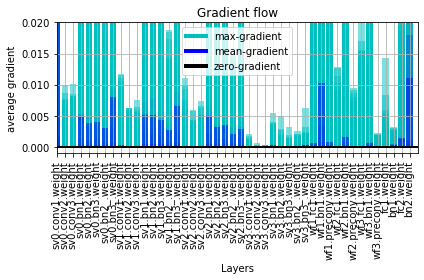

In [11]:
model = model.to(device)

model_folder = '/tf/data/Quan/fer2013/backtobasics/svgg'
model_name = 'svgg_resnet2'
model_path = os.path.join(model_folder, model_name + '.pt')

best_acc = 0.0
hist = []

for epoch in range(60):  # loop over the dataset multiple times
    
    print('Epoch: ', epoch + 1)
    running_loss = 0.0
    running_acc = 0.0

    # TRAIN
    model.train()
    for i, data in enumerate(train_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)
        loss.backward()
        
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        running_acc += acc
        print('\t - Step %d: loss: %.3f acc: %.3f' % (i+1, loss.item(), acc))

    print('- Avg.loss: %.3f  | Avg.acc: %.3f' % (running_loss / (i+1), running_acc / (i+1)))
    avgloss = running_loss / (i+1)
    avgacc = running_acc / (i+1)
    
    # print gradient flow figure
    plot_grad_flow(model.named_parameters(), epoch,
                   savepath=os.path.join(model_folder, model_name + '_gf' + '_' + str(epoch) + '.png'))

    # EVALUATE
    model.eval()
    running_valloss = 0.0
    running_valacc = 0.0
    for i,data in enumerate(val_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)

        running_valloss += loss.item()
        running_valacc += acc

    print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))

    avgvalloss = running_valloss / (i+1)
    avgvalcc = running_valacc / (i+1)

    hist.append([avgloss, avgvalloss, avgacc, avgvalcc])
    
    if best_acc < (running_valacc / (i+1)):
        best_acc = (running_valacc / (i+1))
        torch.save(model, model_path)
        print('* Update optimal model')

print('Finished Training')

([<matplotlib.lines.Line2D at 0x7f56b013fc18>,
 0.6675438598582619)

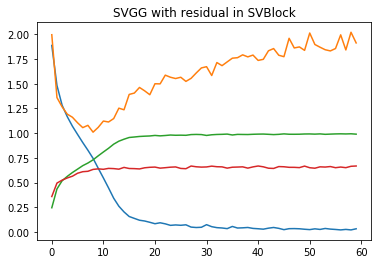

In [9]:
plt.title('SVGG with residual in SVBlock')
plt.plot(hist), best_acc

([<matplotlib.lines.Line2D at 0x7f1f61088ba8>,
 0.6581688596491229)

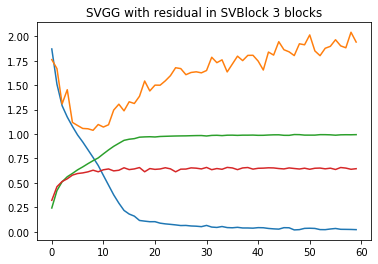

In [12]:
plt.title('SVGG with residual in SVBlock 3 blocks')
plt.plot(hist), best_acc

## Gradient flow

In [4]:
%matplotlib inline

from matplotlib.lines import Line2D      

def plot_grad_flow(named_parameters, epoch, savepath):
    '''Plots the gradients flowing through different layers in the net during training.
    Can be used for checking for possible gradient vanishing / exploding problems.
    
    Usage: Plug this function in Trainer class after loss.backwards() as 
    "plot_grad_flow(self.model.named_parameters())" to visualize the gradient flow'''
    ave_grads = []
    max_grads= []
    layers = []
    for n, p in named_parameters:
        if(p.requires_grad) and ("bias" not in n):

            try:
                ave_grads.append(p.grad.abs().mean())
                max_grads.append(p.grad.abs().max())
                layers.append(n)
            except:
                continue
#                 ave_grads.append(0.)
#                 max_grads.append(0.)
#                 layers.append(n)
                
    plt.figure(figsize=(10,10))
    plt.bar(np.arange(len(max_grads)), max_grads, alpha=0.5, lw=1, color="c")
    plt.bar(np.arange(len(max_grads)), ave_grads, alpha=0.5, lw=1, color="b")
    plt.hlines(0, 0, len(ave_grads)+1, lw=2, color="k" )
    plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
    plt.xlim(left=0, right=len(ave_grads))
    plt.ylim(bottom = -0.001, top=0.02) # zoom in on the lower gradient regions
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow | Epoch " + str(epoch))
    plt.tight_layout()
    plt.grid(True)
    plt.legend([Line2D([0], [0], color="c", lw=4),
                Line2D([0], [0], color="b", lw=4),
                Line2D([0], [0], color="k", lw=4)], ['max-gradient', 'mean-gradient', 'zero-gradient'])
    
    if not savepath is None:
        plt.savefig(savepath)
    
    

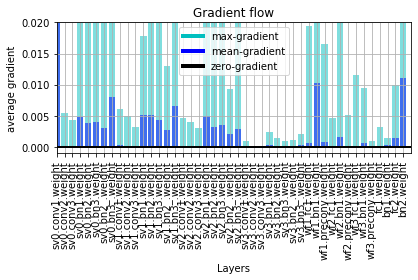

In [15]:
plot_grad_flow(model.named_parameters(), None)

In [3]:
import imageio
images = []
for i in range(60):
    images.append(imageio.imread('/tf/data/Quan/fer2013/backtobasics/svgg/svgg_resnet2_gf_' + str(i) + '.png'))
imageio.mimsave('/tf/data/Quan/fer2013/backtobasics/svgg/svgg_resnet2_gf.gif', images)

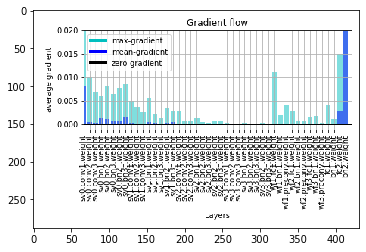

In [8]:
gif = imageio.imread('/tf/data/Quan/fer2013/backtobasics/svgg/svgg_resnet2_gf.gif')
plt.imshow(gif)

Gradient flow process seems to have small values in *conv1, conv2, conv3* of *sv block*.
This could be that ReLUs are *dead* during training. I will replace them by *Leaky ReLU*.
Additionally, to overcome overfitting, I will 
* increase lambda in *L2 norm* to $1e-3$
* remove *ReLU* in WeightFeature layer
* replace *ReLU* by *LeakyReLU*
* add *BatchNorm2d* on the top of WeightFeature
* remove $1$ *Linear* in the classifier (since the fc1 gradient seems to be very low)

### SVGG2

In [5]:
class WeightFeature(nn.Module):
    def __init__(self, feature_depth, target_depth):
        super(WeightFeature, self).__init__()

        self.target_depth = target_depth
        self.fc1 = nn.Linear(feature_depth, target_depth)
        self.bn1 = nn.BatchNorm1d(target_depth)
        self.preconv = nn.Conv2d(target_depth, target_depth, kernel_size=1)
        self.bn_out = nn.BatchNorm2d(target_depth)
        
    def forward(self, x1, x2):
        x1 = nn.AvgPool2d(kernel_size=(x1.size(-2), x1.size(-1)))(x1)
        x1 = nn.Flatten()(x1)

        x1 = self.fc1(x1)
        x1 = self.bn1(x1)
        x1 = x1.unsqueeze(-1).unsqueeze(-1)

        _x2 = self.preconv(x2)
        
        x = torch.mul(_x2,x1)

        x = x + x2
        
        x = self.bn_out(x)

        return x

In [6]:
class SVGG(nn.Module):
    
    def __init__(self, **kwargs):
        super(SVGG, self).__init__()

        self.device = torch.device('cpu') if not 'device' in kwargs else kwargs['device']

        self.sv0 = SVblock(1, 128).to(self.device)
#         self.sv01 = SVblock(128, 128).to(self.device)
        self.sv1 = SVblock(128, 256).to(self.device)
#         self.sv12 = SVblock(256, 256).to(self.device)
        self.sv2 = SVblock(256, 512).to(self.device)
#         self.sv23 = SVblock(512, 512).to(self.device)
        self.sv3 = SVblock(512, 1024).to(self.device)

        self.wf1 = WeightFeature(128, 256).to(self.device)
        self.wf01_3 = WeightFeature(128,512).to(self.device)
        self.wf2 = WeightFeature(256, 512).to(self.device)
        self.wf3 = WeightFeature(512, 1024).to(self.device)

#         self.fc1 = nn.Linear(1024, 512)
#         self.bn1 = nn.BatchNorm1d(512)
        self.fc2 = nn.Linear(1024, 7)
        self.bn2 = nn.BatchNorm1d(7)
        
    
    def forward(self, x):
        x0 = self.sv0(x)

        x1 = self.sv1(x0)
    
        x_wf1 = self.wf1(x0, x1)

        x2 = self.sv2(x_wf1)
    
        x_wf2 = self.wf2(x1, x2)

        x3 = self.sv3(x_wf2)

        x_wf3 = self.wf3(x2, x3)

        x_wf3 = nn.AvgPool2d(kernel_size=(x_wf3.size(-2), x_wf3.size(-1)))(x_wf3)

        x = nn.Flatten()(x_wf3)

        x = self.fc2(x)
        x = self.bn2(x)

        return x

In [13]:
device = torch.device('cuda')
print(device)

model = SVGG(device=device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3)


cuda


Epoch:  1
	 - Step 1: loss: 2.339 acc: 0.141
	 - Step 2: loss: 2.038 acc: 0.188
	 - Step 3: loss: 2.128 acc: 0.156
	 - Step 4: loss: 2.020 acc: 0.203
	 - Step 5: loss: 2.049 acc: 0.188
	 - Step 6: loss: 1.948 acc: 0.219
	 - Step 7: loss: 2.219 acc: 0.094
	 - Step 8: loss: 1.985 acc: 0.094
	 - Step 9: loss: 1.925 acc: 0.188
	 - Step 10: loss: 2.249 acc: 0.094
	 - Step 11: loss: 2.022 acc: 0.172
	 - Step 12: loss: 1.962 acc: 0.172
	 - Step 13: loss: 1.989 acc: 0.156
	 - Step 14: loss: 2.195 acc: 0.219
	 - Step 15: loss: 1.982 acc: 0.156
	 - Step 16: loss: 1.978 acc: 0.188
	 - Step 17: loss: 2.243 acc: 0.109
	 - Step 18: loss: 1.966 acc: 0.094
	 - Step 19: loss: 1.948 acc: 0.188
	 - Step 20: loss: 2.323 acc: 0.141
	 - Step 21: loss: 1.958 acc: 0.141
	 - Step 22: loss: 2.212 acc: 0.156
	 - Step 23: loss: 2.200 acc: 0.234
	 - Step 24: loss: 1.984 acc: 0.109
	 - Step 25: loss: 2.184 acc: 0.234
	 - Step 26: loss: 2.056 acc: 0.172
	 - Step 27: loss: 2.260 acc: 0.109
	 - Step 28: loss: 1.975 ac

	 - Step 227: loss: 2.144 acc: 0.141
	 - Step 228: loss: 1.931 acc: 0.219
	 - Step 229: loss: 1.949 acc: 0.203
	 - Step 230: loss: 1.944 acc: 0.203
	 - Step 231: loss: 1.936 acc: 0.250
	 - Step 232: loss: 1.887 acc: 0.281
	 - Step 233: loss: 1.870 acc: 0.234
	 - Step 234: loss: 1.931 acc: 0.219
	 - Step 235: loss: 1.867 acc: 0.234
	 - Step 236: loss: 1.870 acc: 0.328
	 - Step 237: loss: 1.886 acc: 0.234
	 - Step 238: loss: 1.873 acc: 0.250
	 - Step 239: loss: 1.869 acc: 0.266
	 - Step 240: loss: 1.884 acc: 0.281
	 - Step 241: loss: 1.846 acc: 0.391
	 - Step 242: loss: 1.861 acc: 0.266
	 - Step 243: loss: 2.017 acc: 0.125
	 - Step 244: loss: 1.893 acc: 0.188
	 - Step 245: loss: 1.869 acc: 0.281
	 - Step 246: loss: 2.129 acc: 0.188
	 - Step 247: loss: 1.922 acc: 0.312
	 - Step 248: loss: 1.898 acc: 0.219
	 - Step 249: loss: 1.871 acc: 0.312
	 - Step 250: loss: 1.859 acc: 0.250
	 - Step 251: loss: 1.863 acc: 0.219
	 - Step 252: loss: 1.830 acc: 0.281
	 - Step 253: loss: 1.795 acc: 0.359
	

	 - Step 449: loss: 1.825 acc: 0.189
- Avg.loss: 1.913  | Avg.acc: 0.232
- Avg. val_loss: 1.779  | Avg. val_acc: 0.311
* Update optimal model
Epoch:  2


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVGG. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVblock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type WeightFeature. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


	 - Step 1: loss: 1.672 acc: 0.391
	 - Step 2: loss: 1.758 acc: 0.328
	 - Step 3: loss: 1.729 acc: 0.297
	 - Step 4: loss: 1.717 acc: 0.359
	 - Step 5: loss: 1.714 acc: 0.359
	 - Step 6: loss: 1.704 acc: 0.391
	 - Step 7: loss: 1.685 acc: 0.359
	 - Step 8: loss: 1.674 acc: 0.391
	 - Step 9: loss: 1.751 acc: 0.375
	 - Step 10: loss: 1.808 acc: 0.281
	 - Step 11: loss: 1.796 acc: 0.234
	 - Step 12: loss: 1.530 acc: 0.438
	 - Step 13: loss: 1.878 acc: 0.281
	 - Step 14: loss: 1.771 acc: 0.281
	 - Step 15: loss: 1.772 acc: 0.328
	 - Step 16: loss: 1.899 acc: 0.375
	 - Step 17: loss: 1.637 acc: 0.406
	 - Step 18: loss: 1.729 acc: 0.281
	 - Step 19: loss: 1.805 acc: 0.250
	 - Step 20: loss: 1.795 acc: 0.359
	 - Step 21: loss: 1.877 acc: 0.406
	 - Step 22: loss: 1.678 acc: 0.312
	 - Step 23: loss: 1.733 acc: 0.391
	 - Step 24: loss: 1.679 acc: 0.312
	 - Step 25: loss: 1.801 acc: 0.328
	 - Step 26: loss: 1.783 acc: 0.375
	 - Step 27: loss: 1.847 acc: 0.328
	 - Step 28: loss: 1.612 acc: 0.359
	

	 - Step 227: loss: 1.492 acc: 0.453
	 - Step 228: loss: 1.532 acc: 0.406
	 - Step 229: loss: 1.590 acc: 0.422
	 - Step 230: loss: 1.532 acc: 0.391
	 - Step 231: loss: 1.516 acc: 0.406
	 - Step 232: loss: 1.537 acc: 0.375
	 - Step 233: loss: 1.429 acc: 0.422
	 - Step 234: loss: 1.479 acc: 0.516
	 - Step 235: loss: 1.534 acc: 0.391
	 - Step 236: loss: 1.593 acc: 0.391
	 - Step 237: loss: 1.377 acc: 0.453
	 - Step 238: loss: 1.554 acc: 0.453
	 - Step 239: loss: 1.466 acc: 0.484
	 - Step 240: loss: 1.737 acc: 0.375
	 - Step 241: loss: 1.447 acc: 0.406
	 - Step 242: loss: 1.458 acc: 0.391
	 - Step 243: loss: 1.441 acc: 0.516
	 - Step 244: loss: 1.570 acc: 0.406
	 - Step 245: loss: 1.475 acc: 0.469
	 - Step 246: loss: 1.446 acc: 0.516
	 - Step 247: loss: 1.706 acc: 0.266
	 - Step 248: loss: 1.518 acc: 0.422
	 - Step 249: loss: 1.464 acc: 0.469
	 - Step 250: loss: 1.342 acc: 0.500
	 - Step 251: loss: 1.378 acc: 0.531
	 - Step 252: loss: 1.335 acc: 0.578
	 - Step 253: loss: 1.445 acc: 0.438
	

	 - Step 449: loss: 1.313 acc: 0.514
- Avg.loss: 1.525  | Avg.acc: 0.420
- Avg. val_loss: 1.427  | Avg. val_acc: 0.461
* Update optimal model
Epoch:  3
	 - Step 1: loss: 1.296 acc: 0.531
	 - Step 2: loss: 1.131 acc: 0.594
	 - Step 3: loss: 1.309 acc: 0.484
	 - Step 4: loss: 1.296 acc: 0.531
	 - Step 5: loss: 1.567 acc: 0.422
	 - Step 6: loss: 1.291 acc: 0.484
	 - Step 7: loss: 1.459 acc: 0.438
	 - Step 8: loss: 1.435 acc: 0.406
	 - Step 9: loss: 1.328 acc: 0.531
	 - Step 10: loss: 1.388 acc: 0.516
	 - Step 11: loss: 1.393 acc: 0.469
	 - Step 12: loss: 1.351 acc: 0.484
	 - Step 13: loss: 1.132 acc: 0.641
	 - Step 14: loss: 1.585 acc: 0.391
	 - Step 15: loss: 1.348 acc: 0.547
	 - Step 16: loss: 1.313 acc: 0.578
	 - Step 17: loss: 1.301 acc: 0.578
	 - Step 18: loss: 1.377 acc: 0.484
	 - Step 19: loss: 1.501 acc: 0.438
	 - Step 20: loss: 1.420 acc: 0.438
	 - Step 21: loss: 1.392 acc: 0.469
	 - Step 22: loss: 1.523 acc: 0.359
	 - Step 23: loss: 1.572 acc: 0.312
	 - Step 24: loss: 1.388 acc:

	 - Step 223: loss: 1.455 acc: 0.453
	 - Step 224: loss: 1.280 acc: 0.484
	 - Step 225: loss: 1.285 acc: 0.500
	 - Step 226: loss: 1.277 acc: 0.469
	 - Step 227: loss: 1.241 acc: 0.609
	 - Step 228: loss: 1.287 acc: 0.531
	 - Step 229: loss: 1.233 acc: 0.609
	 - Step 230: loss: 1.212 acc: 0.562
	 - Step 231: loss: 1.345 acc: 0.469
	 - Step 232: loss: 1.364 acc: 0.453
	 - Step 233: loss: 1.495 acc: 0.469
	 - Step 234: loss: 1.245 acc: 0.484
	 - Step 235: loss: 1.268 acc: 0.578
	 - Step 236: loss: 1.230 acc: 0.609
	 - Step 237: loss: 1.317 acc: 0.484
	 - Step 238: loss: 1.287 acc: 0.469
	 - Step 239: loss: 1.182 acc: 0.562
	 - Step 240: loss: 1.196 acc: 0.578
	 - Step 241: loss: 1.504 acc: 0.359
	 - Step 242: loss: 1.521 acc: 0.422
	 - Step 243: loss: 1.300 acc: 0.516
	 - Step 244: loss: 1.454 acc: 0.547
	 - Step 245: loss: 1.232 acc: 0.531
	 - Step 246: loss: 1.228 acc: 0.500
	 - Step 247: loss: 1.340 acc: 0.562
	 - Step 248: loss: 1.408 acc: 0.453
	 - Step 249: loss: 1.203 acc: 0.516
	

	 - Step 445: loss: 1.014 acc: 0.703
	 - Step 446: loss: 1.179 acc: 0.594
	 - Step 447: loss: 1.267 acc: 0.516
	 - Step 448: loss: 1.136 acc: 0.594
	 - Step 449: loss: 1.313 acc: 0.568
- Avg.loss: 1.317  | Avg.acc: 0.508
- Avg. val_loss: 1.337  | Avg. val_acc: 0.491
* Update optimal model
Epoch:  4
	 - Step 1: loss: 1.271 acc: 0.484
	 - Step 2: loss: 1.341 acc: 0.469
	 - Step 3: loss: 1.114 acc: 0.594
	 - Step 4: loss: 1.313 acc: 0.516
	 - Step 5: loss: 1.120 acc: 0.562
	 - Step 6: loss: 1.213 acc: 0.594
	 - Step 7: loss: 1.159 acc: 0.562
	 - Step 8: loss: 1.176 acc: 0.562
	 - Step 9: loss: 1.106 acc: 0.609
	 - Step 10: loss: 1.086 acc: 0.625
	 - Step 11: loss: 1.199 acc: 0.562
	 - Step 12: loss: 1.353 acc: 0.516
	 - Step 13: loss: 1.308 acc: 0.547
	 - Step 14: loss: 1.269 acc: 0.578
	 - Step 15: loss: 1.329 acc: 0.547
	 - Step 16: loss: 1.123 acc: 0.625
	 - Step 17: loss: 1.073 acc: 0.656
	 - Step 18: loss: 1.273 acc: 0.531
	 - Step 19: loss: 1.238 acc: 0.500
	 - Step 20: loss: 1.253 

	 - Step 219: loss: 1.393 acc: 0.453
	 - Step 220: loss: 1.254 acc: 0.516
	 - Step 221: loss: 1.348 acc: 0.547
	 - Step 222: loss: 1.258 acc: 0.516
	 - Step 223: loss: 1.162 acc: 0.609
	 - Step 224: loss: 1.196 acc: 0.578
	 - Step 225: loss: 1.395 acc: 0.406
	 - Step 226: loss: 1.281 acc: 0.547
	 - Step 227: loss: 1.163 acc: 0.578
	 - Step 228: loss: 1.319 acc: 0.531
	 - Step 229: loss: 1.316 acc: 0.453
	 - Step 230: loss: 1.195 acc: 0.594
	 - Step 231: loss: 1.211 acc: 0.578
	 - Step 232: loss: 1.237 acc: 0.562
	 - Step 233: loss: 1.357 acc: 0.484
	 - Step 234: loss: 1.108 acc: 0.578
	 - Step 235: loss: 1.047 acc: 0.641
	 - Step 236: loss: 1.355 acc: 0.469
	 - Step 237: loss: 1.212 acc: 0.547
	 - Step 238: loss: 1.452 acc: 0.406
	 - Step 239: loss: 1.148 acc: 0.609
	 - Step 240: loss: 1.315 acc: 0.500
	 - Step 241: loss: 1.258 acc: 0.469
	 - Step 242: loss: 1.177 acc: 0.547
	 - Step 243: loss: 1.203 acc: 0.484
	 - Step 244: loss: 1.320 acc: 0.453
	 - Step 245: loss: 1.055 acc: 0.594
	

	 - Step 441: loss: 1.046 acc: 0.672
	 - Step 442: loss: 1.206 acc: 0.484
	 - Step 443: loss: 1.230 acc: 0.578
	 - Step 444: loss: 1.169 acc: 0.594
	 - Step 445: loss: 1.159 acc: 0.531
	 - Step 446: loss: 1.100 acc: 0.516
	 - Step 447: loss: 1.152 acc: 0.625
	 - Step 448: loss: 1.173 acc: 0.578
	 - Step 449: loss: 1.143 acc: 0.595
- Avg.loss: 1.230  | Avg.acc: 0.545
- Avg. val_loss: 1.271  | Avg. val_acc: 0.520
* Update optimal model
Epoch:  5
	 - Step 1: loss: 1.178 acc: 0.547
	 - Step 2: loss: 1.053 acc: 0.516
	 - Step 3: loss: 0.949 acc: 0.625
	 - Step 4: loss: 1.197 acc: 0.562
	 - Step 5: loss: 1.145 acc: 0.547
	 - Step 6: loss: 1.130 acc: 0.594
	 - Step 7: loss: 1.079 acc: 0.578
	 - Step 8: loss: 1.307 acc: 0.547
	 - Step 9: loss: 1.170 acc: 0.547
	 - Step 10: loss: 1.291 acc: 0.547
	 - Step 11: loss: 1.146 acc: 0.547
	 - Step 12: loss: 1.090 acc: 0.609
	 - Step 13: loss: 1.335 acc: 0.500
	 - Step 14: loss: 0.893 acc: 0.703
	 - Step 15: loss: 1.104 acc: 0.609
	 - Step 16: loss: 1.

	 - Step 215: loss: 1.152 acc: 0.547
	 - Step 216: loss: 1.288 acc: 0.547
	 - Step 217: loss: 1.227 acc: 0.516
	 - Step 218: loss: 1.232 acc: 0.531
	 - Step 219: loss: 1.336 acc: 0.500
	 - Step 220: loss: 1.088 acc: 0.531
	 - Step 221: loss: 1.021 acc: 0.641
	 - Step 222: loss: 1.121 acc: 0.609
	 - Step 223: loss: 1.103 acc: 0.625
	 - Step 224: loss: 1.147 acc: 0.547
	 - Step 225: loss: 1.144 acc: 0.531
	 - Step 226: loss: 1.199 acc: 0.594
	 - Step 227: loss: 1.256 acc: 0.516
	 - Step 228: loss: 1.294 acc: 0.516
	 - Step 229: loss: 1.108 acc: 0.609
	 - Step 230: loss: 1.150 acc: 0.594
	 - Step 231: loss: 1.282 acc: 0.547
	 - Step 232: loss: 1.104 acc: 0.609
	 - Step 233: loss: 1.215 acc: 0.625
	 - Step 234: loss: 1.135 acc: 0.547
	 - Step 235: loss: 1.243 acc: 0.547
	 - Step 236: loss: 1.081 acc: 0.562
	 - Step 237: loss: 0.985 acc: 0.656
	 - Step 238: loss: 1.039 acc: 0.672
	 - Step 239: loss: 1.189 acc: 0.625
	 - Step 240: loss: 1.230 acc: 0.578
	 - Step 241: loss: 1.269 acc: 0.422
	

	 - Step 437: loss: 1.076 acc: 0.625
	 - Step 438: loss: 1.280 acc: 0.500
	 - Step 439: loss: 1.413 acc: 0.547
	 - Step 440: loss: 1.077 acc: 0.641
	 - Step 441: loss: 1.307 acc: 0.500
	 - Step 442: loss: 1.091 acc: 0.578
	 - Step 443: loss: 1.056 acc: 0.547
	 - Step 444: loss: 1.249 acc: 0.469
	 - Step 445: loss: 1.062 acc: 0.688
	 - Step 446: loss: 1.074 acc: 0.625
	 - Step 447: loss: 1.396 acc: 0.469
	 - Step 448: loss: 1.141 acc: 0.578
	 - Step 449: loss: 1.141 acc: 0.486
- Avg.loss: 1.172  | Avg.acc: 0.562
- Avg. val_loss: 1.188  | Avg. val_acc: 0.551
* Update optimal model
Epoch:  6
	 - Step 1: loss: 1.045 acc: 0.562
	 - Step 2: loss: 0.959 acc: 0.609
	 - Step 3: loss: 1.113 acc: 0.547
	 - Step 4: loss: 1.061 acc: 0.578
	 - Step 5: loss: 1.025 acc: 0.656
	 - Step 6: loss: 1.274 acc: 0.500
	 - Step 7: loss: 1.011 acc: 0.625
	 - Step 8: loss: 0.938 acc: 0.656
	 - Step 9: loss: 1.017 acc: 0.609
	 - Step 10: loss: 1.184 acc: 0.531
	 - Step 11: loss: 1.025 acc: 0.625
	 - Step 12: loss

	 - Step 211: loss: 1.084 acc: 0.625
	 - Step 212: loss: 1.195 acc: 0.531
	 - Step 213: loss: 1.104 acc: 0.578
	 - Step 214: loss: 1.068 acc: 0.656
	 - Step 215: loss: 0.910 acc: 0.672
	 - Step 216: loss: 1.364 acc: 0.516
	 - Step 217: loss: 1.051 acc: 0.609
	 - Step 218: loss: 1.200 acc: 0.516
	 - Step 219: loss: 1.080 acc: 0.578
	 - Step 220: loss: 1.092 acc: 0.531
	 - Step 221: loss: 1.271 acc: 0.516
	 - Step 222: loss: 1.394 acc: 0.438
	 - Step 223: loss: 1.189 acc: 0.531
	 - Step 224: loss: 1.182 acc: 0.516
	 - Step 225: loss: 1.197 acc: 0.500
	 - Step 226: loss: 1.048 acc: 0.594
	 - Step 227: loss: 1.248 acc: 0.562
	 - Step 228: loss: 0.962 acc: 0.656
	 - Step 229: loss: 1.182 acc: 0.578
	 - Step 230: loss: 0.953 acc: 0.672
	 - Step 231: loss: 1.214 acc: 0.500
	 - Step 232: loss: 1.075 acc: 0.609
	 - Step 233: loss: 0.974 acc: 0.641
	 - Step 234: loss: 1.211 acc: 0.516
	 - Step 235: loss: 1.083 acc: 0.625
	 - Step 236: loss: 1.067 acc: 0.609
	 - Step 237: loss: 1.265 acc: 0.516
	

	 - Step 433: loss: 0.977 acc: 0.625
	 - Step 434: loss: 1.284 acc: 0.562
	 - Step 435: loss: 1.040 acc: 0.641
	 - Step 436: loss: 1.035 acc: 0.688
	 - Step 437: loss: 0.888 acc: 0.734
	 - Step 438: loss: 1.071 acc: 0.594
	 - Step 439: loss: 1.544 acc: 0.391
	 - Step 440: loss: 1.177 acc: 0.547
	 - Step 441: loss: 1.012 acc: 0.609
	 - Step 442: loss: 0.966 acc: 0.656
	 - Step 443: loss: 1.161 acc: 0.594
	 - Step 444: loss: 1.071 acc: 0.609
	 - Step 445: loss: 0.949 acc: 0.625
	 - Step 446: loss: 1.280 acc: 0.484
	 - Step 447: loss: 0.944 acc: 0.672
	 - Step 448: loss: 1.126 acc: 0.562
	 - Step 449: loss: 0.967 acc: 0.676
- Avg.loss: 1.116  | Avg.acc: 0.586
- Avg. val_loss: 1.286  | Avg. val_acc: 0.517
Epoch:  7
	 - Step 1: loss: 1.164 acc: 0.578
	 - Step 2: loss: 1.190 acc: 0.578
	 - Step 3: loss: 1.055 acc: 0.547
	 - Step 4: loss: 1.125 acc: 0.594
	 - Step 5: loss: 1.169 acc: 0.562
	 - Step 6: loss: 1.149 acc: 0.562
	 - Step 7: loss: 0.915 acc: 0.656
	 - Step 8: loss: 0.958 acc: 0.672

	 - Step 207: loss: 1.189 acc: 0.594
	 - Step 208: loss: 1.081 acc: 0.578
	 - Step 209: loss: 1.153 acc: 0.531
	 - Step 210: loss: 1.244 acc: 0.484
	 - Step 211: loss: 0.939 acc: 0.672
	 - Step 212: loss: 1.002 acc: 0.594
	 - Step 213: loss: 1.206 acc: 0.500
	 - Step 214: loss: 0.936 acc: 0.656
	 - Step 215: loss: 1.115 acc: 0.609
	 - Step 216: loss: 0.914 acc: 0.672
	 - Step 217: loss: 1.081 acc: 0.656
	 - Step 218: loss: 0.924 acc: 0.625
	 - Step 219: loss: 0.934 acc: 0.641
	 - Step 220: loss: 1.104 acc: 0.594
	 - Step 221: loss: 0.933 acc: 0.656
	 - Step 222: loss: 0.906 acc: 0.719
	 - Step 223: loss: 0.976 acc: 0.625
	 - Step 224: loss: 1.014 acc: 0.594
	 - Step 225: loss: 1.128 acc: 0.562
	 - Step 226: loss: 0.999 acc: 0.656
	 - Step 227: loss: 1.240 acc: 0.594
	 - Step 228: loss: 1.159 acc: 0.578
	 - Step 229: loss: 1.164 acc: 0.578
	 - Step 230: loss: 1.075 acc: 0.578
	 - Step 231: loss: 0.896 acc: 0.672
	 - Step 232: loss: 1.116 acc: 0.547
	 - Step 233: loss: 1.038 acc: 0.562
	

	 - Step 429: loss: 0.980 acc: 0.688
	 - Step 430: loss: 1.008 acc: 0.672
	 - Step 431: loss: 1.165 acc: 0.656
	 - Step 432: loss: 1.075 acc: 0.609
	 - Step 433: loss: 1.240 acc: 0.531
	 - Step 434: loss: 1.075 acc: 0.609
	 - Step 435: loss: 0.881 acc: 0.734
	 - Step 436: loss: 1.027 acc: 0.609
	 - Step 437: loss: 1.113 acc: 0.578
	 - Step 438: loss: 0.975 acc: 0.656
	 - Step 439: loss: 0.940 acc: 0.703
	 - Step 440: loss: 1.100 acc: 0.500
	 - Step 441: loss: 1.013 acc: 0.609
	 - Step 442: loss: 1.261 acc: 0.438
	 - Step 443: loss: 0.979 acc: 0.688
	 - Step 444: loss: 0.951 acc: 0.625
	 - Step 445: loss: 1.202 acc: 0.641
	 - Step 446: loss: 0.867 acc: 0.672
	 - Step 447: loss: 1.032 acc: 0.656
	 - Step 448: loss: 0.991 acc: 0.547
	 - Step 449: loss: 0.832 acc: 0.622
- Avg.loss: 1.062  | Avg.acc: 0.605
- Avg. val_loss: 1.151  | Avg. val_acc: 0.563
* Update optimal model
Epoch:  8
	 - Step 1: loss: 0.943 acc: 0.672
	 - Step 2: loss: 0.894 acc: 0.625
	 - Step 3: loss: 0.939 acc: 0.656
	 -

	 - Step 203: loss: 1.003 acc: 0.578
	 - Step 204: loss: 1.093 acc: 0.578
	 - Step 205: loss: 1.020 acc: 0.609
	 - Step 206: loss: 1.192 acc: 0.516
	 - Step 207: loss: 1.023 acc: 0.625
	 - Step 208: loss: 0.963 acc: 0.562
	 - Step 209: loss: 1.073 acc: 0.562
	 - Step 210: loss: 1.041 acc: 0.641
	 - Step 211: loss: 1.045 acc: 0.594
	 - Step 212: loss: 1.166 acc: 0.578
	 - Step 213: loss: 1.282 acc: 0.578
	 - Step 214: loss: 1.315 acc: 0.562
	 - Step 215: loss: 1.101 acc: 0.609
	 - Step 216: loss: 1.014 acc: 0.656
	 - Step 217: loss: 0.981 acc: 0.672
	 - Step 218: loss: 1.067 acc: 0.578
	 - Step 219: loss: 1.100 acc: 0.578
	 - Step 220: loss: 1.072 acc: 0.609
	 - Step 221: loss: 1.203 acc: 0.547
	 - Step 222: loss: 0.879 acc: 0.641
	 - Step 223: loss: 0.989 acc: 0.609
	 - Step 224: loss: 1.170 acc: 0.531
	 - Step 225: loss: 0.947 acc: 0.641
	 - Step 226: loss: 0.863 acc: 0.719
	 - Step 227: loss: 1.318 acc: 0.500
	 - Step 228: loss: 0.861 acc: 0.750
	 - Step 229: loss: 1.157 acc: 0.578
	

	 - Step 425: loss: 1.143 acc: 0.516
	 - Step 426: loss: 1.037 acc: 0.594
	 - Step 427: loss: 0.964 acc: 0.641
	 - Step 428: loss: 0.801 acc: 0.719
	 - Step 429: loss: 1.373 acc: 0.406
	 - Step 430: loss: 1.143 acc: 0.594
	 - Step 431: loss: 1.171 acc: 0.625
	 - Step 432: loss: 1.074 acc: 0.609
	 - Step 433: loss: 0.944 acc: 0.641
	 - Step 434: loss: 1.080 acc: 0.562
	 - Step 435: loss: 0.997 acc: 0.609
	 - Step 436: loss: 0.861 acc: 0.688
	 - Step 437: loss: 1.042 acc: 0.578
	 - Step 438: loss: 1.315 acc: 0.516
	 - Step 439: loss: 0.995 acc: 0.656
	 - Step 440: loss: 1.030 acc: 0.562
	 - Step 441: loss: 0.957 acc: 0.688
	 - Step 442: loss: 1.044 acc: 0.562
	 - Step 443: loss: 1.060 acc: 0.594
	 - Step 444: loss: 1.167 acc: 0.531
	 - Step 445: loss: 0.986 acc: 0.703
	 - Step 446: loss: 1.020 acc: 0.656
	 - Step 447: loss: 1.135 acc: 0.562
	 - Step 448: loss: 0.963 acc: 0.641
	 - Step 449: loss: 1.097 acc: 0.649
- Avg.loss: 1.016  | Avg.acc: 0.624
- Avg. val_loss: 1.108  | Avg. val_acc:

	 - Step 199: loss: 0.775 acc: 0.672
	 - Step 200: loss: 0.891 acc: 0.688
	 - Step 201: loss: 0.974 acc: 0.656
	 - Step 202: loss: 0.980 acc: 0.656
	 - Step 203: loss: 1.033 acc: 0.609
	 - Step 204: loss: 1.060 acc: 0.688
	 - Step 205: loss: 1.008 acc: 0.578
	 - Step 206: loss: 0.996 acc: 0.641
	 - Step 207: loss: 1.056 acc: 0.531
	 - Step 208: loss: 1.019 acc: 0.609
	 - Step 209: loss: 0.996 acc: 0.672
	 - Step 210: loss: 0.921 acc: 0.688
	 - Step 211: loss: 1.133 acc: 0.531
	 - Step 212: loss: 0.906 acc: 0.656
	 - Step 213: loss: 0.855 acc: 0.656
	 - Step 214: loss: 1.039 acc: 0.641
	 - Step 215: loss: 0.953 acc: 0.672
	 - Step 216: loss: 0.883 acc: 0.734
	 - Step 217: loss: 0.845 acc: 0.672
	 - Step 218: loss: 0.876 acc: 0.703
	 - Step 219: loss: 0.940 acc: 0.656
	 - Step 220: loss: 1.225 acc: 0.609
	 - Step 221: loss: 1.059 acc: 0.703
	 - Step 222: loss: 0.951 acc: 0.641
	 - Step 223: loss: 0.883 acc: 0.656
	 - Step 224: loss: 0.672 acc: 0.875
	 - Step 225: loss: 1.010 acc: 0.656
	

	 - Step 421: loss: 0.951 acc: 0.656
	 - Step 422: loss: 1.139 acc: 0.609
	 - Step 423: loss: 1.032 acc: 0.609
	 - Step 424: loss: 1.029 acc: 0.625
	 - Step 425: loss: 0.871 acc: 0.672
	 - Step 426: loss: 1.039 acc: 0.609
	 - Step 427: loss: 1.101 acc: 0.625
	 - Step 428: loss: 0.972 acc: 0.641
	 - Step 429: loss: 1.148 acc: 0.625
	 - Step 430: loss: 0.929 acc: 0.641
	 - Step 431: loss: 0.992 acc: 0.594
	 - Step 432: loss: 1.194 acc: 0.578
	 - Step 433: loss: 1.056 acc: 0.594
	 - Step 434: loss: 0.855 acc: 0.656
	 - Step 435: loss: 0.931 acc: 0.703
	 - Step 436: loss: 0.855 acc: 0.656
	 - Step 437: loss: 0.965 acc: 0.672
	 - Step 438: loss: 0.873 acc: 0.672
	 - Step 439: loss: 0.992 acc: 0.672
	 - Step 440: loss: 0.957 acc: 0.609
	 - Step 441: loss: 0.823 acc: 0.750
	 - Step 442: loss: 1.051 acc: 0.562
	 - Step 443: loss: 0.943 acc: 0.672
	 - Step 444: loss: 1.102 acc: 0.609
	 - Step 445: loss: 1.060 acc: 0.641
	 - Step 446: loss: 0.938 acc: 0.688
	 - Step 447: loss: 0.919 acc: 0.656
	

	 - Step 195: loss: 1.079 acc: 0.672
	 - Step 196: loss: 0.970 acc: 0.594
	 - Step 197: loss: 0.862 acc: 0.672
	 - Step 198: loss: 1.065 acc: 0.594
	 - Step 199: loss: 1.134 acc: 0.625
	 - Step 200: loss: 0.932 acc: 0.688
	 - Step 201: loss: 1.165 acc: 0.609
	 - Step 202: loss: 0.851 acc: 0.734
	 - Step 203: loss: 0.909 acc: 0.609
	 - Step 204: loss: 1.163 acc: 0.516
	 - Step 205: loss: 0.692 acc: 0.781
	 - Step 206: loss: 0.944 acc: 0.594
	 - Step 207: loss: 1.036 acc: 0.562
	 - Step 208: loss: 0.893 acc: 0.641
	 - Step 209: loss: 0.998 acc: 0.594
	 - Step 210: loss: 0.990 acc: 0.688
	 - Step 211: loss: 0.905 acc: 0.703
	 - Step 212: loss: 1.119 acc: 0.625
	 - Step 213: loss: 0.947 acc: 0.734
	 - Step 214: loss: 0.820 acc: 0.719
	 - Step 215: loss: 0.881 acc: 0.688
	 - Step 216: loss: 1.013 acc: 0.609
	 - Step 217: loss: 1.030 acc: 0.688
	 - Step 218: loss: 1.067 acc: 0.594
	 - Step 219: loss: 1.090 acc: 0.562
	 - Step 220: loss: 1.087 acc: 0.578
	 - Step 221: loss: 1.043 acc: 0.578
	

	 - Step 417: loss: 1.099 acc: 0.516
	 - Step 418: loss: 0.910 acc: 0.672
	 - Step 419: loss: 0.802 acc: 0.672
	 - Step 420: loss: 1.222 acc: 0.609
	 - Step 421: loss: 0.898 acc: 0.625
	 - Step 422: loss: 0.869 acc: 0.672
	 - Step 423: loss: 0.799 acc: 0.719
	 - Step 424: loss: 0.883 acc: 0.688
	 - Step 425: loss: 0.825 acc: 0.750
	 - Step 426: loss: 0.723 acc: 0.703
	 - Step 427: loss: 0.802 acc: 0.719
	 - Step 428: loss: 0.866 acc: 0.703
	 - Step 429: loss: 0.894 acc: 0.578
	 - Step 430: loss: 0.922 acc: 0.703
	 - Step 431: loss: 0.942 acc: 0.656
	 - Step 432: loss: 1.127 acc: 0.578
	 - Step 433: loss: 0.686 acc: 0.750
	 - Step 434: loss: 0.795 acc: 0.672
	 - Step 435: loss: 0.930 acc: 0.656
	 - Step 436: loss: 0.931 acc: 0.656
	 - Step 437: loss: 0.946 acc: 0.641
	 - Step 438: loss: 1.145 acc: 0.578
	 - Step 439: loss: 1.102 acc: 0.578
	 - Step 440: loss: 1.064 acc: 0.641
	 - Step 441: loss: 0.880 acc: 0.594
	 - Step 442: loss: 0.846 acc: 0.688
	 - Step 443: loss: 0.888 acc: 0.719
	

	 - Step 191: loss: 0.900 acc: 0.688
	 - Step 192: loss: 0.778 acc: 0.703
	 - Step 193: loss: 0.842 acc: 0.688
	 - Step 194: loss: 0.907 acc: 0.656
	 - Step 195: loss: 1.025 acc: 0.594
	 - Step 196: loss: 0.957 acc: 0.656
	 - Step 197: loss: 0.837 acc: 0.719
	 - Step 198: loss: 0.774 acc: 0.719
	 - Step 199: loss: 0.771 acc: 0.688
	 - Step 200: loss: 0.887 acc: 0.672
	 - Step 201: loss: 1.006 acc: 0.594
	 - Step 202: loss: 0.756 acc: 0.688
	 - Step 203: loss: 0.990 acc: 0.656
	 - Step 204: loss: 1.012 acc: 0.578
	 - Step 205: loss: 0.918 acc: 0.656
	 - Step 206: loss: 1.032 acc: 0.672
	 - Step 207: loss: 0.859 acc: 0.672
	 - Step 208: loss: 0.972 acc: 0.609
	 - Step 209: loss: 0.625 acc: 0.750
	 - Step 210: loss: 1.061 acc: 0.609
	 - Step 211: loss: 0.841 acc: 0.688
	 - Step 212: loss: 1.016 acc: 0.625
	 - Step 213: loss: 0.884 acc: 0.719
	 - Step 214: loss: 0.959 acc: 0.641
	 - Step 215: loss: 0.998 acc: 0.672
	 - Step 216: loss: 0.922 acc: 0.688
	 - Step 217: loss: 1.126 acc: 0.609
	

	 - Step 413: loss: 0.781 acc: 0.750
	 - Step 414: loss: 0.843 acc: 0.688
	 - Step 415: loss: 1.115 acc: 0.578
	 - Step 416: loss: 0.864 acc: 0.719
	 - Step 417: loss: 0.695 acc: 0.781
	 - Step 418: loss: 0.880 acc: 0.703
	 - Step 419: loss: 0.975 acc: 0.641
	 - Step 420: loss: 0.856 acc: 0.688
	 - Step 421: loss: 0.973 acc: 0.641
	 - Step 422: loss: 1.066 acc: 0.641
	 - Step 423: loss: 1.086 acc: 0.547
	 - Step 424: loss: 0.883 acc: 0.609
	 - Step 425: loss: 0.995 acc: 0.672
	 - Step 426: loss: 0.989 acc: 0.609
	 - Step 427: loss: 0.749 acc: 0.703
	 - Step 428: loss: 0.739 acc: 0.750
	 - Step 429: loss: 0.897 acc: 0.656
	 - Step 430: loss: 0.786 acc: 0.656
	 - Step 431: loss: 0.782 acc: 0.719
	 - Step 432: loss: 0.928 acc: 0.672
	 - Step 433: loss: 0.840 acc: 0.672
	 - Step 434: loss: 1.243 acc: 0.562
	 - Step 435: loss: 0.852 acc: 0.688
	 - Step 436: loss: 0.780 acc: 0.719
	 - Step 437: loss: 0.830 acc: 0.703
	 - Step 438: loss: 1.084 acc: 0.625
	 - Step 439: loss: 0.892 acc: 0.656
	

	 - Step 187: loss: 0.826 acc: 0.656
	 - Step 188: loss: 0.847 acc: 0.672
	 - Step 189: loss: 0.796 acc: 0.688
	 - Step 190: loss: 0.668 acc: 0.734
	 - Step 191: loss: 0.915 acc: 0.703
	 - Step 192: loss: 0.657 acc: 0.844
	 - Step 193: loss: 0.837 acc: 0.719
	 - Step 194: loss: 0.729 acc: 0.672
	 - Step 195: loss: 0.793 acc: 0.688
	 - Step 196: loss: 0.943 acc: 0.688
	 - Step 197: loss: 1.005 acc: 0.641
	 - Step 198: loss: 0.929 acc: 0.641
	 - Step 199: loss: 0.858 acc: 0.672
	 - Step 200: loss: 0.958 acc: 0.672
	 - Step 201: loss: 0.962 acc: 0.672
	 - Step 202: loss: 0.693 acc: 0.797
	 - Step 203: loss: 0.795 acc: 0.750
	 - Step 204: loss: 0.932 acc: 0.578
	 - Step 205: loss: 0.717 acc: 0.719
	 - Step 206: loss: 0.779 acc: 0.703
	 - Step 207: loss: 0.792 acc: 0.719
	 - Step 208: loss: 0.818 acc: 0.703
	 - Step 209: loss: 0.853 acc: 0.688
	 - Step 210: loss: 0.922 acc: 0.609
	 - Step 211: loss: 0.898 acc: 0.703
	 - Step 212: loss: 0.816 acc: 0.719
	 - Step 213: loss: 0.993 acc: 0.609
	

	 - Step 409: loss: 0.769 acc: 0.656
	 - Step 410: loss: 0.869 acc: 0.688
	 - Step 411: loss: 0.824 acc: 0.672
	 - Step 412: loss: 0.785 acc: 0.734
	 - Step 413: loss: 1.113 acc: 0.609
	 - Step 414: loss: 0.913 acc: 0.672
	 - Step 415: loss: 0.636 acc: 0.766
	 - Step 416: loss: 0.662 acc: 0.750
	 - Step 417: loss: 0.763 acc: 0.734
	 - Step 418: loss: 0.760 acc: 0.656
	 - Step 419: loss: 0.720 acc: 0.734
	 - Step 420: loss: 0.733 acc: 0.734
	 - Step 421: loss: 0.755 acc: 0.750
	 - Step 422: loss: 1.029 acc: 0.688
	 - Step 423: loss: 0.872 acc: 0.641
	 - Step 424: loss: 0.820 acc: 0.688
	 - Step 425: loss: 0.943 acc: 0.625
	 - Step 426: loss: 0.954 acc: 0.688
	 - Step 427: loss: 1.013 acc: 0.547
	 - Step 428: loss: 0.855 acc: 0.688
	 - Step 429: loss: 0.664 acc: 0.734
	 - Step 430: loss: 0.783 acc: 0.719
	 - Step 431: loss: 0.621 acc: 0.844
	 - Step 432: loss: 0.934 acc: 0.688
	 - Step 433: loss: 1.025 acc: 0.594
	 - Step 434: loss: 0.729 acc: 0.766
	 - Step 435: loss: 0.795 acc: 0.750
	

	 - Step 183: loss: 0.906 acc: 0.703
	 - Step 184: loss: 0.705 acc: 0.781
	 - Step 185: loss: 0.890 acc: 0.672
	 - Step 186: loss: 0.902 acc: 0.719
	 - Step 187: loss: 0.609 acc: 0.844
	 - Step 188: loss: 0.740 acc: 0.734
	 - Step 189: loss: 0.551 acc: 0.812
	 - Step 190: loss: 0.884 acc: 0.656
	 - Step 191: loss: 0.763 acc: 0.750
	 - Step 192: loss: 0.781 acc: 0.688
	 - Step 193: loss: 0.693 acc: 0.734
	 - Step 194: loss: 0.737 acc: 0.750
	 - Step 195: loss: 0.667 acc: 0.797
	 - Step 196: loss: 0.869 acc: 0.656
	 - Step 197: loss: 0.817 acc: 0.688
	 - Step 198: loss: 0.738 acc: 0.734
	 - Step 199: loss: 0.645 acc: 0.750
	 - Step 200: loss: 0.869 acc: 0.594
	 - Step 201: loss: 0.842 acc: 0.703
	 - Step 202: loss: 0.919 acc: 0.734
	 - Step 203: loss: 0.689 acc: 0.766
	 - Step 204: loss: 0.890 acc: 0.734
	 - Step 205: loss: 0.808 acc: 0.703
	 - Step 206: loss: 0.677 acc: 0.766
	 - Step 207: loss: 0.690 acc: 0.734
	 - Step 208: loss: 0.869 acc: 0.719
	 - Step 209: loss: 1.005 acc: 0.609
	

	 - Step 405: loss: 1.025 acc: 0.609
	 - Step 406: loss: 0.858 acc: 0.656
	 - Step 407: loss: 0.857 acc: 0.609
	 - Step 408: loss: 0.706 acc: 0.719
	 - Step 409: loss: 0.841 acc: 0.703
	 - Step 410: loss: 0.800 acc: 0.672
	 - Step 411: loss: 0.995 acc: 0.625
	 - Step 412: loss: 0.948 acc: 0.703
	 - Step 413: loss: 0.680 acc: 0.750
	 - Step 414: loss: 0.867 acc: 0.734
	 - Step 415: loss: 0.928 acc: 0.719
	 - Step 416: loss: 0.862 acc: 0.609
	 - Step 417: loss: 0.868 acc: 0.703
	 - Step 418: loss: 0.991 acc: 0.656
	 - Step 419: loss: 0.655 acc: 0.750
	 - Step 420: loss: 0.826 acc: 0.719
	 - Step 421: loss: 0.778 acc: 0.781
	 - Step 422: loss: 0.859 acc: 0.734
	 - Step 423: loss: 0.756 acc: 0.797
	 - Step 424: loss: 0.706 acc: 0.766
	 - Step 425: loss: 0.902 acc: 0.641
	 - Step 426: loss: 0.752 acc: 0.734
	 - Step 427: loss: 0.965 acc: 0.641
	 - Step 428: loss: 0.779 acc: 0.734
	 - Step 429: loss: 0.942 acc: 0.609
	 - Step 430: loss: 1.017 acc: 0.609
	 - Step 431: loss: 0.668 acc: 0.797
	

	 - Step 179: loss: 0.864 acc: 0.734
	 - Step 180: loss: 0.729 acc: 0.719
	 - Step 181: loss: 0.758 acc: 0.734
	 - Step 182: loss: 0.737 acc: 0.688
	 - Step 183: loss: 0.685 acc: 0.766
	 - Step 184: loss: 0.693 acc: 0.781
	 - Step 185: loss: 0.931 acc: 0.641
	 - Step 186: loss: 0.641 acc: 0.750
	 - Step 187: loss: 0.658 acc: 0.766
	 - Step 188: loss: 0.843 acc: 0.641
	 - Step 189: loss: 0.891 acc: 0.656
	 - Step 190: loss: 1.202 acc: 0.641
	 - Step 191: loss: 0.787 acc: 0.719
	 - Step 192: loss: 0.921 acc: 0.672
	 - Step 193: loss: 0.704 acc: 0.734
	 - Step 194: loss: 0.836 acc: 0.703
	 - Step 195: loss: 0.832 acc: 0.688
	 - Step 196: loss: 0.492 acc: 0.797
	 - Step 197: loss: 0.541 acc: 0.734
	 - Step 198: loss: 0.774 acc: 0.766
	 - Step 199: loss: 0.787 acc: 0.688
	 - Step 200: loss: 0.812 acc: 0.750
	 - Step 201: loss: 0.792 acc: 0.656
	 - Step 202: loss: 0.752 acc: 0.672
	 - Step 203: loss: 0.846 acc: 0.734
	 - Step 204: loss: 1.087 acc: 0.594
	 - Step 205: loss: 0.935 acc: 0.609
	

	 - Step 401: loss: 0.685 acc: 0.766
	 - Step 402: loss: 0.889 acc: 0.641
	 - Step 403: loss: 0.758 acc: 0.703
	 - Step 404: loss: 0.858 acc: 0.656
	 - Step 405: loss: 0.696 acc: 0.734
	 - Step 406: loss: 0.997 acc: 0.625
	 - Step 407: loss: 0.804 acc: 0.703
	 - Step 408: loss: 0.680 acc: 0.734
	 - Step 409: loss: 0.838 acc: 0.641
	 - Step 410: loss: 0.948 acc: 0.688
	 - Step 411: loss: 0.889 acc: 0.547
	 - Step 412: loss: 0.658 acc: 0.750
	 - Step 413: loss: 0.798 acc: 0.734
	 - Step 414: loss: 0.897 acc: 0.672
	 - Step 415: loss: 0.535 acc: 0.828
	 - Step 416: loss: 0.934 acc: 0.703
	 - Step 417: loss: 0.912 acc: 0.672
	 - Step 418: loss: 0.820 acc: 0.703
	 - Step 419: loss: 0.935 acc: 0.703
	 - Step 420: loss: 0.754 acc: 0.781
	 - Step 421: loss: 0.814 acc: 0.656
	 - Step 422: loss: 0.855 acc: 0.641
	 - Step 423: loss: 0.893 acc: 0.609
	 - Step 424: loss: 0.673 acc: 0.781
	 - Step 425: loss: 1.088 acc: 0.609
	 - Step 426: loss: 0.746 acc: 0.734
	 - Step 427: loss: 1.071 acc: 0.547
	

	 - Step 175: loss: 0.698 acc: 0.703
	 - Step 176: loss: 0.673 acc: 0.781
	 - Step 177: loss: 0.707 acc: 0.750
	 - Step 178: loss: 0.788 acc: 0.688
	 - Step 179: loss: 1.059 acc: 0.641
	 - Step 180: loss: 0.525 acc: 0.797
	 - Step 181: loss: 0.711 acc: 0.781
	 - Step 182: loss: 0.713 acc: 0.750
	 - Step 183: loss: 0.756 acc: 0.719
	 - Step 184: loss: 0.591 acc: 0.766
	 - Step 185: loss: 0.835 acc: 0.734
	 - Step 186: loss: 0.451 acc: 0.844
	 - Step 187: loss: 0.747 acc: 0.766
	 - Step 188: loss: 0.639 acc: 0.812
	 - Step 189: loss: 0.650 acc: 0.781
	 - Step 190: loss: 0.707 acc: 0.734
	 - Step 191: loss: 0.861 acc: 0.672
	 - Step 192: loss: 0.809 acc: 0.656
	 - Step 193: loss: 0.537 acc: 0.812
	 - Step 194: loss: 0.787 acc: 0.719
	 - Step 195: loss: 0.692 acc: 0.781
	 - Step 196: loss: 0.822 acc: 0.703
	 - Step 197: loss: 0.682 acc: 0.781
	 - Step 198: loss: 0.729 acc: 0.734
	 - Step 199: loss: 0.982 acc: 0.641
	 - Step 200: loss: 0.661 acc: 0.750
	 - Step 201: loss: 0.648 acc: 0.766
	

	 - Step 397: loss: 0.636 acc: 0.781
	 - Step 398: loss: 0.648 acc: 0.812
	 - Step 399: loss: 0.728 acc: 0.688
	 - Step 400: loss: 0.777 acc: 0.766
	 - Step 401: loss: 0.686 acc: 0.766
	 - Step 402: loss: 0.703 acc: 0.766
	 - Step 403: loss: 0.794 acc: 0.719
	 - Step 404: loss: 0.696 acc: 0.781
	 - Step 405: loss: 0.817 acc: 0.750
	 - Step 406: loss: 0.832 acc: 0.641
	 - Step 407: loss: 0.977 acc: 0.625
	 - Step 408: loss: 0.952 acc: 0.656
	 - Step 409: loss: 0.869 acc: 0.719
	 - Step 410: loss: 0.867 acc: 0.703
	 - Step 411: loss: 0.936 acc: 0.703
	 - Step 412: loss: 0.944 acc: 0.719
	 - Step 413: loss: 0.610 acc: 0.766
	 - Step 414: loss: 0.726 acc: 0.672
	 - Step 415: loss: 0.733 acc: 0.734
	 - Step 416: loss: 0.814 acc: 0.766
	 - Step 417: loss: 0.786 acc: 0.688
	 - Step 418: loss: 0.808 acc: 0.719
	 - Step 419: loss: 0.707 acc: 0.719
	 - Step 420: loss: 0.736 acc: 0.734
	 - Step 421: loss: 0.861 acc: 0.719
	 - Step 422: loss: 0.955 acc: 0.719
	 - Step 423: loss: 0.968 acc: 0.703
	

	 - Step 171: loss: 0.556 acc: 0.781
	 - Step 172: loss: 0.607 acc: 0.719
	 - Step 173: loss: 0.788 acc: 0.719
	 - Step 174: loss: 0.790 acc: 0.750
	 - Step 175: loss: 0.586 acc: 0.812
	 - Step 176: loss: 0.709 acc: 0.781
	 - Step 177: loss: 1.074 acc: 0.609
	 - Step 178: loss: 0.675 acc: 0.703
	 - Step 179: loss: 0.639 acc: 0.766
	 - Step 180: loss: 0.558 acc: 0.812
	 - Step 181: loss: 0.636 acc: 0.828
	 - Step 182: loss: 0.764 acc: 0.781
	 - Step 183: loss: 0.901 acc: 0.703
	 - Step 184: loss: 0.794 acc: 0.656
	 - Step 185: loss: 0.743 acc: 0.750
	 - Step 186: loss: 0.731 acc: 0.766
	 - Step 187: loss: 0.454 acc: 0.844
	 - Step 188: loss: 0.683 acc: 0.781
	 - Step 189: loss: 0.584 acc: 0.781
	 - Step 190: loss: 0.729 acc: 0.750
	 - Step 191: loss: 0.700 acc: 0.703
	 - Step 192: loss: 0.469 acc: 0.797
	 - Step 193: loss: 0.801 acc: 0.750
	 - Step 194: loss: 0.834 acc: 0.625
	 - Step 195: loss: 0.750 acc: 0.688
	 - Step 196: loss: 0.726 acc: 0.672
	 - Step 197: loss: 0.543 acc: 0.812
	

	 - Step 393: loss: 0.710 acc: 0.750
	 - Step 394: loss: 0.794 acc: 0.688
	 - Step 395: loss: 0.706 acc: 0.703
	 - Step 396: loss: 0.674 acc: 0.750
	 - Step 397: loss: 0.653 acc: 0.797
	 - Step 398: loss: 0.734 acc: 0.812
	 - Step 399: loss: 0.766 acc: 0.750
	 - Step 400: loss: 0.744 acc: 0.766
	 - Step 401: loss: 0.707 acc: 0.781
	 - Step 402: loss: 0.687 acc: 0.734
	 - Step 403: loss: 0.554 acc: 0.781
	 - Step 404: loss: 0.679 acc: 0.750
	 - Step 405: loss: 0.738 acc: 0.766
	 - Step 406: loss: 0.838 acc: 0.641
	 - Step 407: loss: 0.568 acc: 0.844
	 - Step 408: loss: 0.886 acc: 0.656
	 - Step 409: loss: 0.731 acc: 0.719
	 - Step 410: loss: 0.653 acc: 0.750
	 - Step 411: loss: 0.709 acc: 0.766
	 - Step 412: loss: 0.758 acc: 0.719
	 - Step 413: loss: 0.837 acc: 0.672
	 - Step 414: loss: 0.942 acc: 0.625
	 - Step 415: loss: 0.710 acc: 0.688
	 - Step 416: loss: 0.824 acc: 0.703
	 - Step 417: loss: 0.720 acc: 0.703
	 - Step 418: loss: 0.714 acc: 0.719
	 - Step 419: loss: 0.726 acc: 0.750
	

	 - Step 167: loss: 0.616 acc: 0.766
	 - Step 168: loss: 0.509 acc: 0.797
	 - Step 169: loss: 0.581 acc: 0.797
	 - Step 170: loss: 0.782 acc: 0.719
	 - Step 171: loss: 0.583 acc: 0.766
	 - Step 172: loss: 0.792 acc: 0.734
	 - Step 173: loss: 0.695 acc: 0.766
	 - Step 174: loss: 0.579 acc: 0.828
	 - Step 175: loss: 0.631 acc: 0.766
	 - Step 176: loss: 0.480 acc: 0.781
	 - Step 177: loss: 0.665 acc: 0.703
	 - Step 178: loss: 1.004 acc: 0.703
	 - Step 179: loss: 0.605 acc: 0.797
	 - Step 180: loss: 0.627 acc: 0.766
	 - Step 181: loss: 0.657 acc: 0.797
	 - Step 182: loss: 0.575 acc: 0.719
	 - Step 183: loss: 0.741 acc: 0.766
	 - Step 184: loss: 0.773 acc: 0.703
	 - Step 185: loss: 0.628 acc: 0.766
	 - Step 186: loss: 0.665 acc: 0.812
	 - Step 187: loss: 0.641 acc: 0.766
	 - Step 188: loss: 0.689 acc: 0.766
	 - Step 189: loss: 0.663 acc: 0.750
	 - Step 190: loss: 0.712 acc: 0.719
	 - Step 191: loss: 0.487 acc: 0.828
	 - Step 192: loss: 0.674 acc: 0.766
	 - Step 193: loss: 0.874 acc: 0.688
	

	 - Step 389: loss: 0.790 acc: 0.750
	 - Step 390: loss: 0.495 acc: 0.812
	 - Step 391: loss: 0.770 acc: 0.703
	 - Step 392: loss: 0.655 acc: 0.750
	 - Step 393: loss: 0.635 acc: 0.812
	 - Step 394: loss: 0.701 acc: 0.719
	 - Step 395: loss: 0.630 acc: 0.719
	 - Step 396: loss: 0.857 acc: 0.719
	 - Step 397: loss: 0.822 acc: 0.734
	 - Step 398: loss: 0.645 acc: 0.719
	 - Step 399: loss: 0.604 acc: 0.766
	 - Step 400: loss: 0.610 acc: 0.828
	 - Step 401: loss: 0.770 acc: 0.750
	 - Step 402: loss: 0.815 acc: 0.672
	 - Step 403: loss: 0.785 acc: 0.703
	 - Step 404: loss: 0.870 acc: 0.641
	 - Step 405: loss: 0.565 acc: 0.812
	 - Step 406: loss: 0.763 acc: 0.719
	 - Step 407: loss: 0.655 acc: 0.734
	 - Step 408: loss: 0.650 acc: 0.703
	 - Step 409: loss: 0.672 acc: 0.812
	 - Step 410: loss: 0.688 acc: 0.703
	 - Step 411: loss: 0.719 acc: 0.766
	 - Step 412: loss: 0.630 acc: 0.812
	 - Step 413: loss: 0.727 acc: 0.734
	 - Step 414: loss: 0.723 acc: 0.750
	 - Step 415: loss: 0.815 acc: 0.703
	

	 - Step 163: loss: 0.626 acc: 0.797
	 - Step 164: loss: 0.459 acc: 0.828
	 - Step 165: loss: 0.608 acc: 0.750
	 - Step 166: loss: 0.571 acc: 0.781
	 - Step 167: loss: 0.611 acc: 0.812
	 - Step 168: loss: 0.738 acc: 0.766
	 - Step 169: loss: 0.385 acc: 0.859
	 - Step 170: loss: 0.594 acc: 0.766
	 - Step 171: loss: 0.648 acc: 0.781
	 - Step 172: loss: 0.844 acc: 0.688
	 - Step 173: loss: 0.704 acc: 0.734
	 - Step 174: loss: 0.786 acc: 0.672
	 - Step 175: loss: 0.561 acc: 0.844
	 - Step 176: loss: 0.713 acc: 0.703
	 - Step 177: loss: 0.462 acc: 0.859
	 - Step 178: loss: 0.730 acc: 0.766
	 - Step 179: loss: 0.557 acc: 0.781
	 - Step 180: loss: 0.557 acc: 0.766
	 - Step 181: loss: 0.493 acc: 0.828
	 - Step 182: loss: 0.730 acc: 0.750
	 - Step 183: loss: 0.531 acc: 0.859
	 - Step 184: loss: 0.478 acc: 0.797
	 - Step 185: loss: 0.574 acc: 0.797
	 - Step 186: loss: 0.639 acc: 0.781
	 - Step 187: loss: 0.533 acc: 0.781
	 - Step 188: loss: 0.572 acc: 0.828
	 - Step 189: loss: 0.776 acc: 0.734
	

	 - Step 385: loss: 0.574 acc: 0.859
	 - Step 386: loss: 0.595 acc: 0.750
	 - Step 387: loss: 0.660 acc: 0.734
	 - Step 388: loss: 0.693 acc: 0.750
	 - Step 389: loss: 0.398 acc: 0.875
	 - Step 390: loss: 0.495 acc: 0.844
	 - Step 391: loss: 0.570 acc: 0.781
	 - Step 392: loss: 0.690 acc: 0.734
	 - Step 393: loss: 0.486 acc: 0.859
	 - Step 394: loss: 0.678 acc: 0.766
	 - Step 395: loss: 0.704 acc: 0.781
	 - Step 396: loss: 0.673 acc: 0.734
	 - Step 397: loss: 0.627 acc: 0.781
	 - Step 398: loss: 0.606 acc: 0.766
	 - Step 399: loss: 0.693 acc: 0.734
	 - Step 400: loss: 0.745 acc: 0.688
	 - Step 401: loss: 0.549 acc: 0.875
	 - Step 402: loss: 0.589 acc: 0.797
	 - Step 403: loss: 0.811 acc: 0.703
	 - Step 404: loss: 0.536 acc: 0.812
	 - Step 405: loss: 0.623 acc: 0.750
	 - Step 406: loss: 0.739 acc: 0.703
	 - Step 407: loss: 0.661 acc: 0.750
	 - Step 408: loss: 0.835 acc: 0.688
	 - Step 409: loss: 0.511 acc: 0.781
	 - Step 410: loss: 0.518 acc: 0.812
	 - Step 411: loss: 0.564 acc: 0.781
	

	 - Step 159: loss: 0.520 acc: 0.781
	 - Step 160: loss: 0.418 acc: 0.844
	 - Step 161: loss: 0.533 acc: 0.828
	 - Step 162: loss: 0.528 acc: 0.781
	 - Step 163: loss: 0.474 acc: 0.828
	 - Step 164: loss: 0.552 acc: 0.766
	 - Step 165: loss: 0.586 acc: 0.812
	 - Step 166: loss: 0.406 acc: 0.875
	 - Step 167: loss: 0.659 acc: 0.703
	 - Step 168: loss: 0.481 acc: 0.812
	 - Step 169: loss: 0.472 acc: 0.797
	 - Step 170: loss: 0.473 acc: 0.797
	 - Step 171: loss: 0.520 acc: 0.828
	 - Step 172: loss: 0.566 acc: 0.844
	 - Step 173: loss: 0.583 acc: 0.828
	 - Step 174: loss: 0.607 acc: 0.766
	 - Step 175: loss: 0.478 acc: 0.812
	 - Step 176: loss: 0.455 acc: 0.859
	 - Step 177: loss: 0.536 acc: 0.859
	 - Step 178: loss: 0.755 acc: 0.734
	 - Step 179: loss: 0.493 acc: 0.797
	 - Step 180: loss: 0.573 acc: 0.828
	 - Step 181: loss: 0.649 acc: 0.797
	 - Step 182: loss: 0.378 acc: 0.891
	 - Step 183: loss: 0.701 acc: 0.766
	 - Step 184: loss: 0.437 acc: 0.859
	 - Step 185: loss: 0.577 acc: 0.797
	

	 - Step 381: loss: 0.619 acc: 0.766
	 - Step 382: loss: 0.421 acc: 0.844
	 - Step 383: loss: 0.546 acc: 0.766
	 - Step 384: loss: 0.775 acc: 0.672
	 - Step 385: loss: 0.605 acc: 0.766
	 - Step 386: loss: 0.453 acc: 0.875
	 - Step 387: loss: 0.679 acc: 0.766
	 - Step 388: loss: 0.414 acc: 0.859
	 - Step 389: loss: 0.599 acc: 0.766
	 - Step 390: loss: 0.669 acc: 0.812
	 - Step 391: loss: 0.552 acc: 0.797
	 - Step 392: loss: 0.720 acc: 0.734
	 - Step 393: loss: 0.652 acc: 0.781
	 - Step 394: loss: 0.584 acc: 0.797
	 - Step 395: loss: 0.654 acc: 0.734
	 - Step 396: loss: 0.518 acc: 0.844
	 - Step 397: loss: 0.547 acc: 0.781
	 - Step 398: loss: 0.545 acc: 0.781
	 - Step 399: loss: 0.518 acc: 0.828
	 - Step 400: loss: 0.489 acc: 0.859
	 - Step 401: loss: 0.626 acc: 0.797
	 - Step 402: loss: 0.653 acc: 0.766
	 - Step 403: loss: 0.662 acc: 0.781
	 - Step 404: loss: 0.529 acc: 0.828
	 - Step 405: loss: 0.726 acc: 0.719
	 - Step 406: loss: 0.491 acc: 0.781
	 - Step 407: loss: 0.606 acc: 0.781
	

	 - Step 155: loss: 0.348 acc: 0.875
	 - Step 156: loss: 0.359 acc: 0.891
	 - Step 157: loss: 0.498 acc: 0.828
	 - Step 158: loss: 0.534 acc: 0.844
	 - Step 159: loss: 0.554 acc: 0.781
	 - Step 160: loss: 0.612 acc: 0.750
	 - Step 161: loss: 0.576 acc: 0.797
	 - Step 162: loss: 0.360 acc: 0.875
	 - Step 163: loss: 0.536 acc: 0.828
	 - Step 164: loss: 0.427 acc: 0.844
	 - Step 165: loss: 0.591 acc: 0.766
	 - Step 166: loss: 0.547 acc: 0.828
	 - Step 167: loss: 0.400 acc: 0.875
	 - Step 168: loss: 0.427 acc: 0.844
	 - Step 169: loss: 0.442 acc: 0.891
	 - Step 170: loss: 0.552 acc: 0.781
	 - Step 171: loss: 0.696 acc: 0.750
	 - Step 172: loss: 0.445 acc: 0.844
	 - Step 173: loss: 0.667 acc: 0.719
	 - Step 174: loss: 0.605 acc: 0.781
	 - Step 175: loss: 0.548 acc: 0.828
	 - Step 176: loss: 0.419 acc: 0.922
	 - Step 177: loss: 0.723 acc: 0.719
	 - Step 178: loss: 0.587 acc: 0.781
	 - Step 179: loss: 0.399 acc: 0.844
	 - Step 180: loss: 0.648 acc: 0.766
	 - Step 181: loss: 0.509 acc: 0.844
	

	 - Step 377: loss: 0.609 acc: 0.766
	 - Step 378: loss: 0.620 acc: 0.766
	 - Step 379: loss: 0.538 acc: 0.766
	 - Step 380: loss: 0.412 acc: 0.891
	 - Step 381: loss: 0.744 acc: 0.750
	 - Step 382: loss: 0.402 acc: 0.844
	 - Step 383: loss: 0.636 acc: 0.766
	 - Step 384: loss: 0.569 acc: 0.766
	 - Step 385: loss: 0.618 acc: 0.844
	 - Step 386: loss: 0.453 acc: 0.812
	 - Step 387: loss: 0.604 acc: 0.734
	 - Step 388: loss: 0.862 acc: 0.656
	 - Step 389: loss: 0.617 acc: 0.797
	 - Step 390: loss: 0.608 acc: 0.797
	 - Step 391: loss: 0.483 acc: 0.812
	 - Step 392: loss: 0.696 acc: 0.781
	 - Step 393: loss: 0.502 acc: 0.797
	 - Step 394: loss: 0.564 acc: 0.797
	 - Step 395: loss: 0.594 acc: 0.781
	 - Step 396: loss: 0.618 acc: 0.797
	 - Step 397: loss: 0.564 acc: 0.781
	 - Step 398: loss: 0.723 acc: 0.734
	 - Step 399: loss: 0.753 acc: 0.719
	 - Step 400: loss: 0.490 acc: 0.828
	 - Step 401: loss: 0.795 acc: 0.703
	 - Step 402: loss: 0.598 acc: 0.797
	 - Step 403: loss: 0.446 acc: 0.844
	

	 - Step 151: loss: 0.598 acc: 0.781
	 - Step 152: loss: 0.337 acc: 0.891
	 - Step 153: loss: 0.411 acc: 0.844
	 - Step 154: loss: 0.344 acc: 0.859
	 - Step 155: loss: 0.378 acc: 0.875
	 - Step 156: loss: 0.467 acc: 0.828
	 - Step 157: loss: 0.209 acc: 0.953
	 - Step 158: loss: 0.661 acc: 0.781
	 - Step 159: loss: 0.461 acc: 0.891
	 - Step 160: loss: 0.411 acc: 0.844
	 - Step 161: loss: 0.499 acc: 0.844
	 - Step 162: loss: 0.451 acc: 0.812
	 - Step 163: loss: 0.472 acc: 0.844
	 - Step 164: loss: 0.530 acc: 0.766
	 - Step 165: loss: 0.447 acc: 0.859
	 - Step 166: loss: 0.751 acc: 0.703
	 - Step 167: loss: 0.490 acc: 0.859
	 - Step 168: loss: 0.597 acc: 0.719
	 - Step 169: loss: 0.603 acc: 0.797
	 - Step 170: loss: 0.461 acc: 0.859
	 - Step 171: loss: 0.658 acc: 0.797
	 - Step 172: loss: 0.342 acc: 0.906
	 - Step 173: loss: 0.504 acc: 0.828
	 - Step 174: loss: 0.773 acc: 0.750
	 - Step 175: loss: 0.435 acc: 0.844
	 - Step 176: loss: 0.567 acc: 0.812
	 - Step 177: loss: 0.365 acc: 0.906
	

	 - Step 373: loss: 0.628 acc: 0.703
	 - Step 374: loss: 0.468 acc: 0.891
	 - Step 375: loss: 0.636 acc: 0.781
	 - Step 376: loss: 0.467 acc: 0.844
	 - Step 377: loss: 0.455 acc: 0.844
	 - Step 378: loss: 0.446 acc: 0.812
	 - Step 379: loss: 0.349 acc: 0.891
	 - Step 380: loss: 0.603 acc: 0.766
	 - Step 381: loss: 0.543 acc: 0.797
	 - Step 382: loss: 0.551 acc: 0.797
	 - Step 383: loss: 0.539 acc: 0.781
	 - Step 384: loss: 0.584 acc: 0.812
	 - Step 385: loss: 0.521 acc: 0.812
	 - Step 386: loss: 0.435 acc: 0.828
	 - Step 387: loss: 0.608 acc: 0.812
	 - Step 388: loss: 0.447 acc: 0.859
	 - Step 389: loss: 0.579 acc: 0.797
	 - Step 390: loss: 0.538 acc: 0.812
	 - Step 391: loss: 0.516 acc: 0.781
	 - Step 392: loss: 0.377 acc: 0.875
	 - Step 393: loss: 0.590 acc: 0.812
	 - Step 394: loss: 0.617 acc: 0.750
	 - Step 395: loss: 0.568 acc: 0.781
	 - Step 396: loss: 0.599 acc: 0.828
	 - Step 397: loss: 0.447 acc: 0.875
	 - Step 398: loss: 0.345 acc: 0.875
	 - Step 399: loss: 0.458 acc: 0.828
	

	 - Step 147: loss: 0.352 acc: 0.906
	 - Step 148: loss: 0.462 acc: 0.828
	 - Step 149: loss: 0.412 acc: 0.844
	 - Step 150: loss: 0.570 acc: 0.797
	 - Step 151: loss: 0.372 acc: 0.875
	 - Step 152: loss: 0.569 acc: 0.828
	 - Step 153: loss: 0.525 acc: 0.812
	 - Step 154: loss: 0.372 acc: 0.891
	 - Step 155: loss: 0.413 acc: 0.844
	 - Step 156: loss: 0.364 acc: 0.875
	 - Step 157: loss: 0.442 acc: 0.875
	 - Step 158: loss: 0.511 acc: 0.797
	 - Step 159: loss: 0.419 acc: 0.812
	 - Step 160: loss: 0.523 acc: 0.812
	 - Step 161: loss: 0.375 acc: 0.875
	 - Step 162: loss: 0.650 acc: 0.766
	 - Step 163: loss: 0.395 acc: 0.859
	 - Step 164: loss: 0.577 acc: 0.766
	 - Step 165: loss: 0.713 acc: 0.703
	 - Step 166: loss: 0.510 acc: 0.844
	 - Step 167: loss: 0.305 acc: 0.922
	 - Step 168: loss: 0.456 acc: 0.844
	 - Step 169: loss: 0.429 acc: 0.859
	 - Step 170: loss: 0.456 acc: 0.844
	 - Step 171: loss: 0.523 acc: 0.812
	 - Step 172: loss: 0.439 acc: 0.844
	 - Step 173: loss: 0.549 acc: 0.797
	

	 - Step 369: loss: 0.459 acc: 0.828
	 - Step 370: loss: 0.550 acc: 0.812
	 - Step 371: loss: 0.474 acc: 0.812
	 - Step 372: loss: 0.526 acc: 0.844
	 - Step 373: loss: 0.476 acc: 0.859
	 - Step 374: loss: 0.812 acc: 0.672
	 - Step 375: loss: 0.452 acc: 0.844
	 - Step 376: loss: 0.727 acc: 0.719
	 - Step 377: loss: 0.576 acc: 0.766
	 - Step 378: loss: 0.396 acc: 0.859
	 - Step 379: loss: 0.492 acc: 0.766
	 - Step 380: loss: 0.402 acc: 0.859
	 - Step 381: loss: 0.622 acc: 0.797
	 - Step 382: loss: 0.420 acc: 0.844
	 - Step 383: loss: 0.430 acc: 0.812
	 - Step 384: loss: 0.455 acc: 0.875
	 - Step 385: loss: 0.562 acc: 0.797
	 - Step 386: loss: 0.549 acc: 0.797
	 - Step 387: loss: 0.496 acc: 0.859
	 - Step 388: loss: 0.564 acc: 0.812
	 - Step 389: loss: 0.344 acc: 0.844
	 - Step 390: loss: 0.507 acc: 0.812
	 - Step 391: loss: 0.533 acc: 0.828
	 - Step 392: loss: 0.510 acc: 0.781
	 - Step 393: loss: 0.827 acc: 0.703
	 - Step 394: loss: 0.755 acc: 0.688
	 - Step 395: loss: 0.567 acc: 0.750
	

	 - Step 143: loss: 0.491 acc: 0.828
	 - Step 144: loss: 0.321 acc: 0.875
	 - Step 145: loss: 0.483 acc: 0.844
	 - Step 146: loss: 0.370 acc: 0.891
	 - Step 147: loss: 0.616 acc: 0.719
	 - Step 148: loss: 0.378 acc: 0.859
	 - Step 149: loss: 0.345 acc: 0.875
	 - Step 150: loss: 0.274 acc: 0.922
	 - Step 151: loss: 0.443 acc: 0.828
	 - Step 152: loss: 0.412 acc: 0.828
	 - Step 153: loss: 0.568 acc: 0.828
	 - Step 154: loss: 0.467 acc: 0.844
	 - Step 155: loss: 0.612 acc: 0.797
	 - Step 156: loss: 0.406 acc: 0.875
	 - Step 157: loss: 0.331 acc: 0.906
	 - Step 158: loss: 0.421 acc: 0.812
	 - Step 159: loss: 0.471 acc: 0.859
	 - Step 160: loss: 0.488 acc: 0.875
	 - Step 161: loss: 0.472 acc: 0.891
	 - Step 162: loss: 0.506 acc: 0.781
	 - Step 163: loss: 0.378 acc: 0.859
	 - Step 164: loss: 0.312 acc: 0.906
	 - Step 165: loss: 0.710 acc: 0.734
	 - Step 166: loss: 0.293 acc: 0.922
	 - Step 167: loss: 0.418 acc: 0.844
	 - Step 168: loss: 0.413 acc: 0.828
	 - Step 169: loss: 0.363 acc: 0.859
	

	 - Step 365: loss: 0.446 acc: 0.859
	 - Step 366: loss: 0.526 acc: 0.844
	 - Step 367: loss: 0.588 acc: 0.781
	 - Step 368: loss: 0.547 acc: 0.781
	 - Step 369: loss: 0.496 acc: 0.828
	 - Step 370: loss: 0.385 acc: 0.875
	 - Step 371: loss: 0.483 acc: 0.781
	 - Step 372: loss: 0.530 acc: 0.797
	 - Step 373: loss: 0.461 acc: 0.859
	 - Step 374: loss: 0.598 acc: 0.781
	 - Step 375: loss: 0.559 acc: 0.781
	 - Step 376: loss: 0.488 acc: 0.859
	 - Step 377: loss: 0.478 acc: 0.875
	 - Step 378: loss: 0.369 acc: 0.859
	 - Step 379: loss: 0.392 acc: 0.875
	 - Step 380: loss: 0.594 acc: 0.828
	 - Step 381: loss: 0.468 acc: 0.828
	 - Step 382: loss: 0.459 acc: 0.797
	 - Step 383: loss: 0.533 acc: 0.875
	 - Step 384: loss: 0.631 acc: 0.766
	 - Step 385: loss: 0.470 acc: 0.781
	 - Step 386: loss: 0.592 acc: 0.844
	 - Step 387: loss: 0.396 acc: 0.828
	 - Step 388: loss: 0.504 acc: 0.797
	 - Step 389: loss: 0.413 acc: 0.844
	 - Step 390: loss: 0.471 acc: 0.844
	 - Step 391: loss: 0.667 acc: 0.766
	

	 - Step 139: loss: 0.293 acc: 0.938
	 - Step 140: loss: 0.472 acc: 0.828
	 - Step 141: loss: 0.372 acc: 0.875
	 - Step 142: loss: 0.470 acc: 0.812
	 - Step 143: loss: 0.541 acc: 0.844
	 - Step 144: loss: 0.423 acc: 0.828
	 - Step 145: loss: 0.586 acc: 0.797
	 - Step 146: loss: 0.438 acc: 0.859
	 - Step 147: loss: 0.352 acc: 0.859
	 - Step 148: loss: 0.600 acc: 0.828
	 - Step 149: loss: 0.357 acc: 0.875
	 - Step 150: loss: 0.333 acc: 0.891
	 - Step 151: loss: 0.499 acc: 0.828
	 - Step 152: loss: 0.408 acc: 0.875
	 - Step 153: loss: 0.424 acc: 0.844
	 - Step 154: loss: 0.418 acc: 0.812
	 - Step 155: loss: 0.202 acc: 0.969
	 - Step 156: loss: 0.424 acc: 0.844
	 - Step 157: loss: 0.446 acc: 0.844
	 - Step 158: loss: 0.420 acc: 0.844
	 - Step 159: loss: 0.621 acc: 0.750
	 - Step 160: loss: 0.482 acc: 0.844
	 - Step 161: loss: 0.273 acc: 0.906
	 - Step 162: loss: 0.311 acc: 0.891
	 - Step 163: loss: 0.389 acc: 0.891
	 - Step 164: loss: 0.312 acc: 0.891
	 - Step 165: loss: 0.333 acc: 0.875
	

	 - Step 361: loss: 0.278 acc: 0.906
	 - Step 362: loss: 0.480 acc: 0.828
	 - Step 363: loss: 0.632 acc: 0.719
	 - Step 364: loss: 0.531 acc: 0.891
	 - Step 365: loss: 0.443 acc: 0.844
	 - Step 366: loss: 0.481 acc: 0.844
	 - Step 367: loss: 0.406 acc: 0.891
	 - Step 368: loss: 0.735 acc: 0.781
	 - Step 369: loss: 0.415 acc: 0.859
	 - Step 370: loss: 0.396 acc: 0.844
	 - Step 371: loss: 0.600 acc: 0.750
	 - Step 372: loss: 0.406 acc: 0.875
	 - Step 373: loss: 0.380 acc: 0.906
	 - Step 374: loss: 0.482 acc: 0.828
	 - Step 375: loss: 0.377 acc: 0.906
	 - Step 376: loss: 0.370 acc: 0.844
	 - Step 377: loss: 0.551 acc: 0.797
	 - Step 378: loss: 0.269 acc: 0.922
	 - Step 379: loss: 0.440 acc: 0.750
	 - Step 380: loss: 0.340 acc: 0.875
	 - Step 381: loss: 0.366 acc: 0.844
	 - Step 382: loss: 0.691 acc: 0.781
	 - Step 383: loss: 0.394 acc: 0.844
	 - Step 384: loss: 0.494 acc: 0.844
	 - Step 385: loss: 0.363 acc: 0.891
	 - Step 386: loss: 0.436 acc: 0.875
	 - Step 387: loss: 0.739 acc: 0.750
	

	 - Step 135: loss: 0.275 acc: 0.906
	 - Step 136: loss: 0.238 acc: 0.922
	 - Step 137: loss: 0.401 acc: 0.875
	 - Step 138: loss: 0.264 acc: 0.875
	 - Step 139: loss: 0.387 acc: 0.844
	 - Step 140: loss: 0.521 acc: 0.891
	 - Step 141: loss: 0.329 acc: 0.875
	 - Step 142: loss: 0.221 acc: 0.938
	 - Step 143: loss: 0.141 acc: 0.984
	 - Step 144: loss: 0.277 acc: 0.922
	 - Step 145: loss: 0.331 acc: 0.906
	 - Step 146: loss: 0.237 acc: 0.938
	 - Step 147: loss: 0.463 acc: 0.812
	 - Step 148: loss: 0.424 acc: 0.891
	 - Step 149: loss: 0.407 acc: 0.906
	 - Step 150: loss: 0.301 acc: 0.922
	 - Step 151: loss: 0.237 acc: 0.938
	 - Step 152: loss: 0.251 acc: 0.906
	 - Step 153: loss: 0.261 acc: 0.906
	 - Step 154: loss: 0.367 acc: 0.906
	 - Step 155: loss: 0.268 acc: 0.938
	 - Step 156: loss: 0.355 acc: 0.875
	 - Step 157: loss: 0.340 acc: 0.859
	 - Step 158: loss: 0.345 acc: 0.906
	 - Step 159: loss: 0.245 acc: 0.938
	 - Step 160: loss: 0.378 acc: 0.844
	 - Step 161: loss: 0.319 acc: 0.891
	

	 - Step 357: loss: 0.417 acc: 0.828
	 - Step 358: loss: 0.660 acc: 0.766
	 - Step 359: loss: 0.315 acc: 0.922
	 - Step 360: loss: 0.348 acc: 0.844
	 - Step 361: loss: 0.830 acc: 0.719
	 - Step 362: loss: 0.455 acc: 0.844
	 - Step 363: loss: 0.393 acc: 0.859
	 - Step 364: loss: 0.663 acc: 0.766
	 - Step 365: loss: 0.404 acc: 0.891
	 - Step 366: loss: 0.358 acc: 0.891
	 - Step 367: loss: 0.298 acc: 0.891
	 - Step 368: loss: 0.373 acc: 0.844
	 - Step 369: loss: 0.652 acc: 0.766
	 - Step 370: loss: 0.443 acc: 0.828
	 - Step 371: loss: 0.615 acc: 0.781
	 - Step 372: loss: 0.599 acc: 0.797
	 - Step 373: loss: 0.485 acc: 0.891
	 - Step 374: loss: 0.457 acc: 0.875
	 - Step 375: loss: 0.581 acc: 0.750
	 - Step 376: loss: 0.446 acc: 0.875
	 - Step 377: loss: 0.523 acc: 0.859
	 - Step 378: loss: 0.553 acc: 0.812
	 - Step 379: loss: 0.421 acc: 0.891
	 - Step 380: loss: 0.574 acc: 0.844
	 - Step 381: loss: 0.386 acc: 0.859
	 - Step 382: loss: 0.571 acc: 0.797
	 - Step 383: loss: 0.676 acc: 0.812
	

	 - Step 131: loss: 0.377 acc: 0.859
	 - Step 132: loss: 0.354 acc: 0.875
	 - Step 133: loss: 0.365 acc: 0.859
	 - Step 134: loss: 0.332 acc: 0.922
	 - Step 135: loss: 0.298 acc: 0.938
	 - Step 136: loss: 0.209 acc: 0.938
	 - Step 137: loss: 0.386 acc: 0.828
	 - Step 138: loss: 0.283 acc: 0.875
	 - Step 139: loss: 0.308 acc: 0.906
	 - Step 140: loss: 0.268 acc: 0.922
	 - Step 141: loss: 0.530 acc: 0.812
	 - Step 142: loss: 0.655 acc: 0.859
	 - Step 143: loss: 0.272 acc: 0.891
	 - Step 144: loss: 0.362 acc: 0.906
	 - Step 145: loss: 0.247 acc: 0.938
	 - Step 146: loss: 0.257 acc: 0.922
	 - Step 147: loss: 0.357 acc: 0.859
	 - Step 148: loss: 0.232 acc: 0.938
	 - Step 149: loss: 0.302 acc: 0.938
	 - Step 150: loss: 0.262 acc: 0.891
	 - Step 151: loss: 0.361 acc: 0.859
	 - Step 152: loss: 0.346 acc: 0.906
	 - Step 153: loss: 0.500 acc: 0.891
	 - Step 154: loss: 0.263 acc: 0.906
	 - Step 155: loss: 0.284 acc: 0.891
	 - Step 156: loss: 0.252 acc: 0.906
	 - Step 157: loss: 0.404 acc: 0.875
	

	 - Step 353: loss: 0.507 acc: 0.797
	 - Step 354: loss: 0.370 acc: 0.875
	 - Step 355: loss: 0.269 acc: 0.938
	 - Step 356: loss: 0.411 acc: 0.812
	 - Step 357: loss: 0.345 acc: 0.859
	 - Step 358: loss: 0.420 acc: 0.859
	 - Step 359: loss: 0.299 acc: 0.875
	 - Step 360: loss: 0.586 acc: 0.797
	 - Step 361: loss: 0.458 acc: 0.875
	 - Step 362: loss: 0.347 acc: 0.859
	 - Step 363: loss: 0.415 acc: 0.875
	 - Step 364: loss: 0.446 acc: 0.828
	 - Step 365: loss: 0.443 acc: 0.844
	 - Step 366: loss: 0.299 acc: 0.906
	 - Step 367: loss: 0.440 acc: 0.859
	 - Step 368: loss: 0.462 acc: 0.844
	 - Step 369: loss: 0.331 acc: 0.891
	 - Step 370: loss: 0.394 acc: 0.875
	 - Step 371: loss: 0.434 acc: 0.844
	 - Step 372: loss: 0.381 acc: 0.859
	 - Step 373: loss: 0.423 acc: 0.875
	 - Step 374: loss: 0.307 acc: 0.906
	 - Step 375: loss: 0.431 acc: 0.891
	 - Step 376: loss: 0.377 acc: 0.828
	 - Step 377: loss: 0.391 acc: 0.844
	 - Step 378: loss: 0.335 acc: 0.859
	 - Step 379: loss: 0.437 acc: 0.844
	

	 - Step 127: loss: 0.399 acc: 0.844
	 - Step 128: loss: 0.278 acc: 0.859
	 - Step 129: loss: 0.276 acc: 0.938
	 - Step 130: loss: 0.215 acc: 0.953
	 - Step 131: loss: 0.347 acc: 0.938
	 - Step 132: loss: 0.321 acc: 0.906
	 - Step 133: loss: 0.373 acc: 0.891
	 - Step 134: loss: 0.296 acc: 0.906
	 - Step 135: loss: 0.320 acc: 0.906
	 - Step 136: loss: 0.321 acc: 0.891
	 - Step 137: loss: 0.327 acc: 0.891
	 - Step 138: loss: 0.213 acc: 0.938
	 - Step 139: loss: 0.248 acc: 0.938
	 - Step 140: loss: 0.343 acc: 0.859
	 - Step 141: loss: 0.424 acc: 0.859
	 - Step 142: loss: 0.272 acc: 0.875
	 - Step 143: loss: 0.354 acc: 0.906
	 - Step 144: loss: 0.403 acc: 0.828
	 - Step 145: loss: 0.521 acc: 0.875
	 - Step 146: loss: 0.245 acc: 0.906
	 - Step 147: loss: 0.359 acc: 0.875
	 - Step 148: loss: 0.351 acc: 0.859
	 - Step 149: loss: 0.430 acc: 0.828
	 - Step 150: loss: 0.292 acc: 0.938
	 - Step 151: loss: 0.357 acc: 0.875
	 - Step 152: loss: 0.244 acc: 0.938
	 - Step 153: loss: 0.345 acc: 0.859
	

	 - Step 349: loss: 0.463 acc: 0.812
	 - Step 350: loss: 0.549 acc: 0.828
	 - Step 351: loss: 0.554 acc: 0.797
	 - Step 352: loss: 0.513 acc: 0.766
	 - Step 353: loss: 0.569 acc: 0.812
	 - Step 354: loss: 0.496 acc: 0.859
	 - Step 355: loss: 0.483 acc: 0.828
	 - Step 356: loss: 0.341 acc: 0.891
	 - Step 357: loss: 0.465 acc: 0.781
	 - Step 358: loss: 0.258 acc: 0.922
	 - Step 359: loss: 0.716 acc: 0.781
	 - Step 360: loss: 0.501 acc: 0.812
	 - Step 361: loss: 0.461 acc: 0.844
	 - Step 362: loss: 0.377 acc: 0.875
	 - Step 363: loss: 0.320 acc: 0.859
	 - Step 364: loss: 0.516 acc: 0.828
	 - Step 365: loss: 0.467 acc: 0.906
	 - Step 366: loss: 0.524 acc: 0.844
	 - Step 367: loss: 0.290 acc: 0.938
	 - Step 368: loss: 0.465 acc: 0.859
	 - Step 369: loss: 0.487 acc: 0.812
	 - Step 370: loss: 0.354 acc: 0.875
	 - Step 371: loss: 0.381 acc: 0.828
	 - Step 372: loss: 0.518 acc: 0.828
	 - Step 373: loss: 0.332 acc: 0.859
	 - Step 374: loss: 0.372 acc: 0.875
	 - Step 375: loss: 0.335 acc: 0.938
	

	 - Step 123: loss: 0.331 acc: 0.906
	 - Step 124: loss: 0.164 acc: 0.938
	 - Step 125: loss: 0.318 acc: 0.891
	 - Step 126: loss: 0.348 acc: 0.875
	 - Step 127: loss: 0.361 acc: 0.891
	 - Step 128: loss: 0.434 acc: 0.844
	 - Step 129: loss: 0.294 acc: 0.875
	 - Step 130: loss: 0.276 acc: 0.922
	 - Step 131: loss: 0.269 acc: 0.906
	 - Step 132: loss: 0.299 acc: 0.891
	 - Step 133: loss: 0.289 acc: 0.859
	 - Step 134: loss: 0.359 acc: 0.891
	 - Step 135: loss: 0.319 acc: 0.906
	 - Step 136: loss: 0.268 acc: 0.906
	 - Step 137: loss: 0.543 acc: 0.766
	 - Step 138: loss: 0.406 acc: 0.859
	 - Step 139: loss: 0.326 acc: 0.875
	 - Step 140: loss: 0.359 acc: 0.875
	 - Step 141: loss: 0.279 acc: 0.906
	 - Step 142: loss: 0.347 acc: 0.875
	 - Step 143: loss: 0.375 acc: 0.844
	 - Step 144: loss: 0.234 acc: 0.938
	 - Step 145: loss: 0.335 acc: 0.891
	 - Step 146: loss: 0.286 acc: 0.922
	 - Step 147: loss: 0.285 acc: 0.922
	 - Step 148: loss: 0.379 acc: 0.875
	 - Step 149: loss: 0.345 acc: 0.859
	

	 - Step 345: loss: 0.455 acc: 0.828
	 - Step 346: loss: 0.335 acc: 0.875
	 - Step 347: loss: 0.219 acc: 0.922
	 - Step 348: loss: 0.515 acc: 0.844
	 - Step 349: loss: 0.352 acc: 0.875
	 - Step 350: loss: 0.495 acc: 0.812
	 - Step 351: loss: 0.371 acc: 0.875
	 - Step 352: loss: 0.558 acc: 0.750
	 - Step 353: loss: 0.364 acc: 0.859
	 - Step 354: loss: 0.226 acc: 0.938
	 - Step 355: loss: 0.531 acc: 0.859
	 - Step 356: loss: 0.342 acc: 0.875
	 - Step 357: loss: 0.305 acc: 0.906
	 - Step 358: loss: 0.368 acc: 0.875
	 - Step 359: loss: 0.593 acc: 0.766
	 - Step 360: loss: 0.168 acc: 0.969
	 - Step 361: loss: 0.370 acc: 0.875
	 - Step 362: loss: 0.279 acc: 0.875
	 - Step 363: loss: 0.301 acc: 0.906
	 - Step 364: loss: 0.450 acc: 0.828
	 - Step 365: loss: 0.281 acc: 0.906
	 - Step 366: loss: 0.418 acc: 0.828
	 - Step 367: loss: 0.421 acc: 0.812
	 - Step 368: loss: 0.342 acc: 0.844
	 - Step 369: loss: 0.568 acc: 0.828
	 - Step 370: loss: 0.416 acc: 0.875
	 - Step 371: loss: 0.346 acc: 0.922
	

	 - Step 119: loss: 0.333 acc: 0.891
	 - Step 120: loss: 0.381 acc: 0.844
	 - Step 121: loss: 0.352 acc: 0.891
	 - Step 122: loss: 0.346 acc: 0.922
	 - Step 123: loss: 0.347 acc: 0.859
	 - Step 124: loss: 0.306 acc: 0.844
	 - Step 125: loss: 0.338 acc: 0.844
	 - Step 126: loss: 0.276 acc: 0.922
	 - Step 127: loss: 0.374 acc: 0.859
	 - Step 128: loss: 0.281 acc: 0.875
	 - Step 149: loss: 0.212 acc: 0.953
	 - Step 150: loss: 0.188 acc: 0.938
	 - Step 151: loss: 0.175 acc: 0.969
	 - Step 152: loss: 0.317 acc: 0.906
	 - Step 153: loss: 0.319 acc: 0.891
	 - Step 154: loss: 0.278 acc: 0.906
	 - Step 155: loss: 0.171 acc: 0.953
	 - Step 156: loss: 0.283 acc: 0.875
	 - Step 157: loss: 0.257 acc: 0.938
	 - Step 158: loss: 0.275 acc: 0.938
	 - Step 159: loss: 0.331 acc: 0.891
	 - Step 160: loss: 0.248 acc: 0.938
	 - Step 161: loss: 0.319 acc: 0.859
	 - Step 162: loss: 0.220 acc: 0.938
	 - Step 163: loss: 0.255 acc: 0.906
	 - Step 164: loss: 0.476 acc: 0.812
	 - Step 165: loss: 0.455 acc: 0.906
	

	 - Step 361: loss: 0.375 acc: 0.906
	 - Step 362: loss: 0.272 acc: 0.938
	 - Step 363: loss: 0.667 acc: 0.703
	 - Step 364: loss: 0.441 acc: 0.859
	 - Step 365: loss: 0.226 acc: 0.938
	 - Step 366: loss: 0.297 acc: 0.891
	 - Step 367: loss: 0.325 acc: 0.859
	 - Step 368: loss: 0.304 acc: 0.875
	 - Step 369: loss: 0.396 acc: 0.859
	 - Step 370: loss: 0.455 acc: 0.828
	 - Step 371: loss: 0.441 acc: 0.828
	 - Step 372: loss: 0.250 acc: 0.922
	 - Step 373: loss: 0.541 acc: 0.812
	 - Step 374: loss: 0.472 acc: 0.844
	 - Step 375: loss: 0.439 acc: 0.859
	 - Step 376: loss: 0.210 acc: 0.938
	 - Step 377: loss: 0.286 acc: 0.953
	 - Step 378: loss: 0.367 acc: 0.891
	 - Step 379: loss: 0.436 acc: 0.828
	 - Step 380: loss: 0.275 acc: 0.875
	 - Step 381: loss: 0.233 acc: 0.938
	 - Step 382: loss: 0.431 acc: 0.875
	 - Step 383: loss: 0.406 acc: 0.875
	 - Step 384: loss: 0.441 acc: 0.828
	 - Step 385: loss: 0.393 acc: 0.844
	 - Step 386: loss: 0.445 acc: 0.875
	 - Step 387: loss: 0.362 acc: 0.891
	

	 - Step 135: loss: 0.409 acc: 0.859
	 - Step 136: loss: 0.334 acc: 0.891
	 - Step 137: loss: 0.197 acc: 0.938
	 - Step 138: loss: 0.210 acc: 0.922
	 - Step 139: loss: 0.259 acc: 0.938
	 - Step 140: loss: 0.171 acc: 0.953
	 - Step 141: loss: 0.356 acc: 0.844
	 - Step 142: loss: 0.251 acc: 0.953
	 - Step 143: loss: 0.261 acc: 0.906
	 - Step 144: loss: 0.302 acc: 0.891
	 - Step 145: loss: 0.256 acc: 0.922
	 - Step 146: loss: 0.373 acc: 0.875
	 - Step 147: loss: 0.292 acc: 0.891
	 - Step 148: loss: 0.350 acc: 0.844
	 - Step 149: loss: 0.167 acc: 0.953
	 - Step 150: loss: 0.241 acc: 0.938
	 - Step 151: loss: 0.285 acc: 0.875
	 - Step 152: loss: 0.218 acc: 0.922
	 - Step 153: loss: 0.224 acc: 0.938
	 - Step 154: loss: 0.275 acc: 0.906
	 - Step 155: loss: 0.186 acc: 0.953
	 - Step 156: loss: 0.262 acc: 0.938
	 - Step 157: loss: 0.268 acc: 0.938
	 - Step 158: loss: 0.352 acc: 0.875
	 - Step 159: loss: 0.140 acc: 0.938
	 - Step 160: loss: 0.250 acc: 0.906
	 - Step 161: loss: 0.228 acc: 0.922
	

	 - Step 357: loss: 0.410 acc: 0.875
	 - Step 358: loss: 0.377 acc: 0.875
	 - Step 359: loss: 0.654 acc: 0.781
	 - Step 360: loss: 0.492 acc: 0.859
	 - Step 361: loss: 0.208 acc: 0.953
	 - Step 362: loss: 0.232 acc: 0.922
	 - Step 363: loss: 0.372 acc: 0.828
	 - Step 364: loss: 0.403 acc: 0.859
	 - Step 365: loss: 0.389 acc: 0.859
	 - Step 366: loss: 0.301 acc: 0.922
	 - Step 367: loss: 0.195 acc: 0.953
	 - Step 368: loss: 0.191 acc: 0.969
	 - Step 369: loss: 0.305 acc: 0.891
	 - Step 370: loss: 0.221 acc: 0.906
	 - Step 371: loss: 0.250 acc: 0.953
	 - Step 372: loss: 0.399 acc: 0.812
	 - Step 373: loss: 0.296 acc: 0.906
	 - Step 374: loss: 0.343 acc: 0.875
	 - Step 375: loss: 0.329 acc: 0.922
	 - Step 376: loss: 0.279 acc: 0.922
	 - Step 377: loss: 0.222 acc: 0.938
	 - Step 378: loss: 0.487 acc: 0.844
	 - Step 379: loss: 0.338 acc: 0.797
	 - Step 380: loss: 0.438 acc: 0.875
	 - Step 381: loss: 0.373 acc: 0.891
	 - Step 382: loss: 0.428 acc: 0.828
	 - Step 383: loss: 0.310 acc: 0.922
	

	 - Step 131: loss: 0.346 acc: 0.875
	 - Step 132: loss: 0.195 acc: 0.969
	 - Step 133: loss: 0.296 acc: 0.938
	 - Step 134: loss: 0.247 acc: 0.922
	 - Step 135: loss: 0.241 acc: 0.938
	 - Step 136: loss: 0.125 acc: 0.984
	 - Step 137: loss: 0.202 acc: 0.938
	 - Step 138: loss: 0.494 acc: 0.828
	 - Step 139: loss: 0.182 acc: 0.938
	 - Step 140: loss: 0.352 acc: 0.906
	 - Step 141: loss: 0.235 acc: 0.938
	 - Step 142: loss: 0.240 acc: 0.906
	 - Step 143: loss: 0.257 acc: 0.953
	 - Step 144: loss: 0.255 acc: 0.938
	 - Step 145: loss: 0.399 acc: 0.844
	 - Step 146: loss: 0.214 acc: 0.906
	 - Step 147: loss: 0.429 acc: 0.875
	 - Step 148: loss: 0.211 acc: 0.938
	 - Step 149: loss: 0.297 acc: 0.859
	 - Step 150: loss: 0.375 acc: 0.859
	 - Step 151: loss: 0.362 acc: 0.875
	 - Step 152: loss: 0.432 acc: 0.828
	 - Step 153: loss: 0.160 acc: 0.969
	 - Step 154: loss: 0.363 acc: 0.875
	 - Step 155: loss: 0.252 acc: 0.891
	 - Step 156: loss: 0.302 acc: 0.875
	 - Step 157: loss: 0.209 acc: 0.922
	

	 - Step 353: loss: 0.452 acc: 0.797
	 - Step 354: loss: 0.526 acc: 0.781
	 - Step 355: loss: 0.434 acc: 0.844
	 - Step 356: loss: 0.343 acc: 0.844
	 - Step 357: loss: 0.348 acc: 0.906
	 - Step 358: loss: 0.517 acc: 0.781
	 - Step 359: loss: 0.473 acc: 0.844
	 - Step 360: loss: 0.550 acc: 0.812
	 - Step 361: loss: 0.378 acc: 0.891
	 - Step 362: loss: 0.272 acc: 0.922
	 - Step 363: loss: 0.517 acc: 0.812
	 - Step 364: loss: 0.528 acc: 0.844
	 - Step 365: loss: 0.248 acc: 0.969
	 - Step 366: loss: 0.332 acc: 0.875
	 - Step 367: loss: 0.243 acc: 0.906
	 - Step 368: loss: 0.272 acc: 0.891
	 - Step 369: loss: 0.373 acc: 0.859
	 - Step 370: loss: 0.432 acc: 0.844
	 - Step 371: loss: 0.364 acc: 0.859
	 - Step 372: loss: 0.425 acc: 0.812
	 - Step 373: loss: 0.317 acc: 0.859
	 - Step 374: loss: 0.296 acc: 0.891
	 - Step 375: loss: 0.331 acc: 0.875
	 - Step 376: loss: 0.315 acc: 0.891
	 - Step 377: loss: 0.338 acc: 0.906
	 - Step 378: loss: 0.247 acc: 0.891
	 - Step 379: loss: 0.488 acc: 0.812
	

	 - Step 127: loss: 0.191 acc: 0.953
	 - Step 128: loss: 0.243 acc: 0.938
	 - Step 129: loss: 0.190 acc: 0.953
	 - Step 130: loss: 0.388 acc: 0.844
	 - Step 131: loss: 0.210 acc: 0.938
	 - Step 132: loss: 0.418 acc: 0.812
	 - Step 133: loss: 0.150 acc: 0.938
	 - Step 134: loss: 0.248 acc: 0.906
	 - Step 135: loss: 0.278 acc: 0.891
	 - Step 136: loss: 0.200 acc: 0.953
	 - Step 137: loss: 0.294 acc: 0.906
	 - Step 138: loss: 0.252 acc: 0.922
	 - Step 139: loss: 0.196 acc: 0.969
	 - Step 140: loss: 0.244 acc: 0.875
	 - Step 141: loss: 0.232 acc: 0.922
	 - Step 142: loss: 0.228 acc: 0.922
	 - Step 143: loss: 0.311 acc: 0.859
	 - Step 144: loss: 0.283 acc: 0.906
	 - Step 145: loss: 0.286 acc: 0.922
	 - Step 146: loss: 0.423 acc: 0.859
	 - Step 147: loss: 0.147 acc: 0.969
	 - Step 148: loss: 0.200 acc: 0.938
	 - Step 149: loss: 0.197 acc: 0.953
	 - Step 150: loss: 0.159 acc: 0.984
	 - Step 151: loss: 0.198 acc: 0.953
	 - Step 152: loss: 0.228 acc: 0.938
	 - Step 153: loss: 0.153 acc: 0.938
	

	 - Step 349: loss: 0.377 acc: 0.859
	 - Step 350: loss: 0.390 acc: 0.875
	 - Step 351: loss: 0.292 acc: 0.906
	 - Step 352: loss: 0.194 acc: 0.938
	 - Step 353: loss: 0.337 acc: 0.891
	 - Step 354: loss: 0.277 acc: 0.922
	 - Step 355: loss: 0.429 acc: 0.891
	 - Step 356: loss: 0.231 acc: 0.922
	 - Step 357: loss: 0.329 acc: 0.906
	 - Step 358: loss: 0.342 acc: 0.891
	 - Step 359: loss: 0.256 acc: 0.906
	 - Step 360: loss: 0.282 acc: 0.891
	 - Step 361: loss: 0.416 acc: 0.844
	 - Step 362: loss: 0.346 acc: 0.891
	 - Step 363: loss: 0.351 acc: 0.859
	 - Step 364: loss: 0.416 acc: 0.844
	 - Step 365: loss: 0.393 acc: 0.828
	 - Step 366: loss: 0.445 acc: 0.875
	 - Step 367: loss: 0.332 acc: 0.859
	 - Step 368: loss: 0.255 acc: 0.891
	 - Step 369: loss: 0.389 acc: 0.844
	 - Step 370: loss: 0.360 acc: 0.859
	 - Step 371: loss: 0.597 acc: 0.844
	 - Step 372: loss: 0.274 acc: 0.906
	 - Step 373: loss: 0.165 acc: 0.953
	 - Step 374: loss: 0.244 acc: 0.906
	 - Step 375: loss: 0.227 acc: 0.906
	

	 - Step 123: loss: 0.262 acc: 0.906
	 - Step 124: loss: 0.217 acc: 0.922
	 - Step 125: loss: 0.255 acc: 0.938
	 - Step 126: loss: 0.227 acc: 0.906
	 - Step 127: loss: 0.204 acc: 0.906
	 - Step 128: loss: 0.349 acc: 0.844
	 - Step 129: loss: 0.215 acc: 0.969
	 - Step 130: loss: 0.249 acc: 0.906
	 - Step 131: loss: 0.179 acc: 0.969
	 - Step 132: loss: 0.300 acc: 0.859
	 - Step 133: loss: 0.239 acc: 0.938
	 - Step 134: loss: 0.184 acc: 0.953
	 - Step 135: loss: 0.170 acc: 0.953
	 - Step 136: loss: 0.190 acc: 0.922
	 - Step 137: loss: 0.256 acc: 0.875
	 - Step 138: loss: 0.150 acc: 0.953
	 - Step 139: loss: 0.303 acc: 0.906
	 - Step 140: loss: 0.234 acc: 0.891
	 - Step 141: loss: 0.245 acc: 0.875
	 - Step 142: loss: 0.407 acc: 0.891
	 - Step 143: loss: 0.122 acc: 0.984
	 - Step 144: loss: 0.189 acc: 0.969
	 - Step 145: loss: 0.263 acc: 0.922
	 - Step 146: loss: 0.203 acc: 0.938
	 - Step 147: loss: 0.210 acc: 0.938
	 - Step 148: loss: 0.301 acc: 0.906
	 - Step 149: loss: 0.317 acc: 0.844
	

	 - Step 345: loss: 0.414 acc: 0.844
	 - Step 346: loss: 0.343 acc: 0.922
	 - Step 347: loss: 0.375 acc: 0.875
	 - Step 348: loss: 0.340 acc: 0.891
	 - Step 349: loss: 0.255 acc: 0.891
	 - Step 350: loss: 0.288 acc: 0.906
	 - Step 351: loss: 0.359 acc: 0.844
	 - Step 352: loss: 0.389 acc: 0.859
	 - Step 353: loss: 0.269 acc: 0.891
	 - Step 354: loss: 0.304 acc: 0.906
	 - Step 355: loss: 0.398 acc: 0.859
	 - Step 356: loss: 0.276 acc: 0.891
	 - Step 357: loss: 0.313 acc: 0.859
	 - Step 358: loss: 0.395 acc: 0.859
	 - Step 359: loss: 0.371 acc: 0.891
	 - Step 360: loss: 0.449 acc: 0.797
	 - Step 361: loss: 0.260 acc: 0.922
	 - Step 362: loss: 0.344 acc: 0.875
	 - Step 363: loss: 0.287 acc: 0.891
	 - Step 364: loss: 0.286 acc: 0.859
	 - Step 365: loss: 0.329 acc: 0.922
	 - Step 366: loss: 0.397 acc: 0.906
	 - Step 367: loss: 0.295 acc: 0.906
	 - Step 368: loss: 0.670 acc: 0.797
	 - Step 369: loss: 0.287 acc: 0.906
	 - Step 370: loss: 0.273 acc: 0.906
	 - Step 371: loss: 0.345 acc: 0.875
	

	 - Step 119: loss: 0.198 acc: 0.922
	 - Step 120: loss: 0.304 acc: 0.875
	 - Step 121: loss: 0.199 acc: 0.953
	 - Step 122: loss: 0.086 acc: 1.000
	 - Step 123: loss: 0.278 acc: 0.938
	 - Step 124: loss: 0.263 acc: 0.938
	 - Step 125: loss: 0.439 acc: 0.859
	 - Step 126: loss: 0.284 acc: 0.938
	 - Step 127: loss: 0.174 acc: 0.953
	 - Step 128: loss: 0.349 acc: 0.922
	 - Step 129: loss: 0.221 acc: 0.906
	 - Step 130: loss: 0.275 acc: 0.922
	 - Step 131: loss: 0.320 acc: 0.891
	 - Step 132: loss: 0.336 acc: 0.906
	 - Step 133: loss: 0.233 acc: 0.922
	 - Step 134: loss: 0.232 acc: 0.953
	 - Step 135: loss: 0.208 acc: 0.922
	 - Step 136: loss: 0.300 acc: 0.906
	 - Step 137: loss: 0.455 acc: 0.812
	 - Step 138: loss: 0.412 acc: 0.859
	 - Step 139: loss: 0.363 acc: 0.844
	 - Step 140: loss: 0.162 acc: 0.922
	 - Step 141: loss: 0.477 acc: 0.875
	 - Step 142: loss: 0.256 acc: 0.922
	 - Step 143: loss: 0.248 acc: 0.938
	 - Step 144: loss: 0.127 acc: 0.969
	 - Step 145: loss: 0.215 acc: 0.938
	

	 - Step 341: loss: 0.247 acc: 0.922
	 - Step 342: loss: 0.323 acc: 0.844
	 - Step 343: loss: 0.340 acc: 0.875
	 - Step 344: loss: 0.294 acc: 0.922
	 - Step 345: loss: 0.166 acc: 0.969
	 - Step 346: loss: 0.158 acc: 0.953
	 - Step 347: loss: 0.207 acc: 0.922
	 - Step 348: loss: 0.351 acc: 0.906
	 - Step 349: loss: 0.251 acc: 0.906
	 - Step 350: loss: 0.266 acc: 0.906
	 - Step 351: loss: 0.223 acc: 0.938
	 - Step 352: loss: 0.266 acc: 0.906
	 - Step 353: loss: 0.251 acc: 0.906
	 - Step 354: loss: 0.275 acc: 0.906
	 - Step 355: loss: 0.464 acc: 0.859
	 - Step 356: loss: 0.253 acc: 0.922
	 - Step 357: loss: 0.247 acc: 0.922
	 - Step 358: loss: 0.224 acc: 0.938
	 - Step 359: loss: 0.324 acc: 0.891
	 - Step 360: loss: 0.282 acc: 0.891
	 - Step 361: loss: 0.270 acc: 0.859
	 - Step 362: loss: 0.484 acc: 0.844
	 - Step 363: loss: 0.343 acc: 0.875
	 - Step 364: loss: 0.258 acc: 0.906
	 - Step 365: loss: 0.280 acc: 0.891
	 - Step 366: loss: 0.413 acc: 0.844
	 - Step 367: loss: 0.419 acc: 0.859
	

	 - Step 115: loss: 0.157 acc: 0.969
	 - Step 116: loss: 0.090 acc: 0.984
	 - Step 117: loss: 0.231 acc: 0.906
	 - Step 118: loss: 0.189 acc: 0.938
	 - Step 119: loss: 0.261 acc: 0.938
	 - Step 120: loss: 0.136 acc: 0.969
	 - Step 121: loss: 0.209 acc: 0.922
	 - Step 122: loss: 0.137 acc: 0.969
	 - Step 123: loss: 0.240 acc: 0.922
	 - Step 124: loss: 0.198 acc: 0.953
	 - Step 125: loss: 0.250 acc: 0.891
	 - Step 126: loss: 0.250 acc: 0.906
	 - Step 127: loss: 0.359 acc: 0.875
	 - Step 128: loss: 0.257 acc: 0.922
	 - Step 129: loss: 0.183 acc: 0.938
	 - Step 130: loss: 0.218 acc: 0.906
	 - Step 131: loss: 0.209 acc: 0.922
	 - Step 132: loss: 0.364 acc: 0.875
	 - Step 133: loss: 0.291 acc: 0.906
	 - Step 134: loss: 0.185 acc: 0.938
	 - Step 135: loss: 0.208 acc: 0.938
	 - Step 136: loss: 0.276 acc: 0.953
	 - Step 137: loss: 0.221 acc: 0.922
	 - Step 138: loss: 0.199 acc: 0.922
	 - Step 139: loss: 0.285 acc: 0.875
	 - Step 140: loss: 0.379 acc: 0.859
	 - Step 141: loss: 0.259 acc: 0.891
	

	 - Step 337: loss: 0.204 acc: 0.922
	 - Step 338: loss: 0.403 acc: 0.844
	 - Step 339: loss: 0.439 acc: 0.828
	 - Step 340: loss: 0.383 acc: 0.875
	 - Step 341: loss: 0.447 acc: 0.844
	 - Step 342: loss: 0.345 acc: 0.859
	 - Step 343: loss: 0.504 acc: 0.797
	 - Step 344: loss: 0.320 acc: 0.922
	 - Step 345: loss: 0.253 acc: 0.891
	 - Step 346: loss: 0.279 acc: 0.875
	 - Step 347: loss: 0.515 acc: 0.812
	 - Step 348: loss: 0.261 acc: 0.891
	 - Step 349: loss: 0.216 acc: 0.953
	 - Step 350: loss: 0.201 acc: 0.922
	 - Step 351: loss: 0.228 acc: 0.891
	 - Step 352: loss: 0.435 acc: 0.828
	 - Step 353: loss: 0.416 acc: 0.859
	 - Step 354: loss: 0.582 acc: 0.797
	 - Step 355: loss: 0.276 acc: 0.922
	 - Step 356: loss: 0.306 acc: 0.859
	 - Step 357: loss: 0.272 acc: 0.906
	 - Step 358: loss: 0.402 acc: 0.828
	 - Step 359: loss: 0.432 acc: 0.875
	 - Step 360: loss: 0.608 acc: 0.781
	 - Step 361: loss: 0.367 acc: 0.828
	 - Step 362: loss: 0.462 acc: 0.844
	 - Step 363: loss: 0.362 acc: 0.859
	

	 - Step 111: loss: 0.248 acc: 0.938
	 - Step 112: loss: 0.190 acc: 0.953
	 - Step 113: loss: 0.261 acc: 0.938
	 - Step 114: loss: 0.186 acc: 0.969
	 - Step 115: loss: 0.322 acc: 0.875
	 - Step 116: loss: 0.287 acc: 0.906
	 - Step 117: loss: 0.210 acc: 0.969
	 - Step 118: loss: 0.186 acc: 0.953
	 - Step 119: loss: 0.209 acc: 0.953
	 - Step 120: loss: 0.194 acc: 0.922
	 - Step 121: loss: 0.178 acc: 0.953
	 - Step 122: loss: 0.222 acc: 0.938
	 - Step 123: loss: 0.240 acc: 0.906
	 - Step 124: loss: 0.298 acc: 0.891
	 - Step 125: loss: 0.196 acc: 0.953
	 - Step 126: loss: 0.226 acc: 0.906
	 - Step 127: loss: 0.200 acc: 0.938
	 - Step 128: loss: 0.255 acc: 0.906
	 - Step 129: loss: 0.227 acc: 0.953
	 - Step 130: loss: 0.210 acc: 0.906
	 - Step 131: loss: 0.436 acc: 0.844
	 - Step 132: loss: 0.219 acc: 0.922
	 - Step 133: loss: 0.192 acc: 0.938
	 - Step 134: loss: 0.180 acc: 0.922
	 - Step 135: loss: 0.146 acc: 0.953
	 - Step 136: loss: 0.214 acc: 0.906
	 - Step 137: loss: 0.214 acc: 0.938
	

	 - Step 333: loss: 0.205 acc: 0.938
	 - Step 334: loss: 0.154 acc: 0.953
	 - Step 335: loss: 0.313 acc: 0.906
	 - Step 336: loss: 0.301 acc: 0.906
	 - Step 337: loss: 0.223 acc: 0.953
	 - Step 338: loss: 0.250 acc: 0.891
	 - Step 339: loss: 0.195 acc: 0.953
	 - Step 340: loss: 0.332 acc: 0.859
	 - Step 341: loss: 0.231 acc: 0.922
	 - Step 342: loss: 0.243 acc: 0.891
	 - Step 343: loss: 0.198 acc: 0.906
	 - Step 344: loss: 0.300 acc: 0.875
	 - Step 345: loss: 0.306 acc: 0.859
	 - Step 346: loss: 0.270 acc: 0.859
	 - Step 347: loss: 0.318 acc: 0.844
	 - Step 348: loss: 0.456 acc: 0.812
	 - Step 349: loss: 0.335 acc: 0.906
	 - Step 350: loss: 0.186 acc: 0.938
	 - Step 351: loss: 0.334 acc: 0.859
	 - Step 352: loss: 0.271 acc: 0.906
	 - Step 353: loss: 0.336 acc: 0.859
	 - Step 354: loss: 0.349 acc: 0.859
	 - Step 355: loss: 0.290 acc: 0.906
	 - Step 356: loss: 0.229 acc: 0.938
	 - Step 357: loss: 0.198 acc: 0.922
	 - Step 358: loss: 0.182 acc: 0.969
	 - Step 359: loss: 0.282 acc: 0.906
	

	 - Step 107: loss: 0.248 acc: 0.922
	 - Step 108: loss: 0.261 acc: 0.922
	 - Step 109: loss: 0.182 acc: 0.938
	 - Step 110: loss: 0.197 acc: 0.953
	 - Step 111: loss: 0.155 acc: 0.984
	 - Step 112: loss: 0.172 acc: 0.906
	 - Step 113: loss: 0.228 acc: 0.922
	 - Step 114: loss: 0.333 acc: 0.875
	 - Step 115: loss: 0.175 acc: 0.922
	 - Step 116: loss: 0.257 acc: 0.922
	 - Step 117: loss: 0.156 acc: 0.953
	 - Step 118: loss: 0.256 acc: 0.938
	 - Step 119: loss: 0.251 acc: 0.875
	 - Step 120: loss: 0.261 acc: 0.891
	 - Step 121: loss: 0.279 acc: 0.891
	 - Step 122: loss: 0.157 acc: 0.969
	 - Step 123: loss: 0.247 acc: 0.875
	 - Step 124: loss: 0.244 acc: 0.891
	 - Step 125: loss: 0.196 acc: 0.969
	 - Step 126: loss: 0.175 acc: 0.938
	 - Step 127: loss: 0.236 acc: 0.891
	 - Step 128: loss: 0.306 acc: 0.891
	 - Step 129: loss: 0.347 acc: 0.859
	 - Step 130: loss: 0.167 acc: 0.953
	 - Step 131: loss: 0.269 acc: 0.906
	 - Step 132: loss: 0.201 acc: 0.922
	 - Step 133: loss: 0.332 acc: 0.891
	

	 - Step 329: loss: 0.271 acc: 0.938
	 - Step 330: loss: 0.246 acc: 0.906
	 - Step 331: loss: 0.314 acc: 0.906
	 - Step 332: loss: 0.379 acc: 0.891
	 - Step 333: loss: 0.228 acc: 0.938
	 - Step 334: loss: 0.196 acc: 0.938
	 - Step 335: loss: 0.262 acc: 0.922
	 - Step 336: loss: 0.377 acc: 0.812
	 - Step 337: loss: 0.232 acc: 0.875
	 - Step 338: loss: 0.300 acc: 0.891
	 - Step 339: loss: 0.447 acc: 0.844
	 - Step 340: loss: 0.290 acc: 0.906
	 - Step 341: loss: 0.270 acc: 0.906
	 - Step 342: loss: 0.530 acc: 0.828
	 - Step 343: loss: 0.354 acc: 0.891
	 - Step 344: loss: 0.373 acc: 0.859
	 - Step 345: loss: 0.407 acc: 0.828
	 - Step 346: loss: 0.229 acc: 0.938
	 - Step 347: loss: 0.176 acc: 0.953
	 - Step 348: loss: 0.264 acc: 0.906
	 - Step 349: loss: 0.390 acc: 0.844
	 - Step 350: loss: 0.518 acc: 0.844
	 - Step 351: loss: 0.265 acc: 0.906
	 - Step 352: loss: 0.342 acc: 0.922
	 - Step 353: loss: 0.321 acc: 0.891
	 - Step 354: loss: 0.306 acc: 0.891
	 - Step 355: loss: 0.166 acc: 0.938
	

	 - Step 103: loss: 0.246 acc: 0.891
	 - Step 104: loss: 0.201 acc: 0.922
	 - Step 105: loss: 0.180 acc: 0.938
	 - Step 106: loss: 0.149 acc: 0.953
	 - Step 107: loss: 0.137 acc: 0.953
	 - Step 108: loss: 0.160 acc: 0.953
	 - Step 109: loss: 0.206 acc: 0.953
	 - Step 110: loss: 0.180 acc: 0.922
	 - Step 111: loss: 0.143 acc: 0.984
	 - Step 112: loss: 0.418 acc: 0.875
	 - Step 113: loss: 0.210 acc: 0.969
	 - Step 114: loss: 0.331 acc: 0.859
	 - Step 115: loss: 0.155 acc: 0.938
	 - Step 116: loss: 0.162 acc: 0.984
	 - Step 117: loss: 0.183 acc: 0.953
	 - Step 118: loss: 0.100 acc: 0.984
	 - Step 119: loss: 0.243 acc: 0.922
	 - Step 120: loss: 0.172 acc: 0.984
	 - Step 121: loss: 0.172 acc: 0.922
	 - Step 122: loss: 0.236 acc: 0.859
	 - Step 123: loss: 0.219 acc: 0.953
	 - Step 124: loss: 0.323 acc: 0.859
	 - Step 125: loss: 0.242 acc: 0.922
	 - Step 126: loss: 0.235 acc: 0.938
	 - Step 127: loss: 0.213 acc: 0.906
	 - Step 128: loss: 0.412 acc: 0.844
	 - Step 129: loss: 0.156 acc: 0.938
	

	 - Step 325: loss: 0.406 acc: 0.891
	 - Step 326: loss: 0.321 acc: 0.906
	 - Step 327: loss: 0.370 acc: 0.859
	 - Step 328: loss: 0.205 acc: 0.953
	 - Step 329: loss: 0.223 acc: 0.938
	 - Step 330: loss: 0.348 acc: 0.906
	 - Step 331: loss: 0.284 acc: 0.922
	 - Step 332: loss: 0.280 acc: 0.891
	 - Step 333: loss: 0.346 acc: 0.922
	 - Step 334: loss: 0.403 acc: 0.875
	 - Step 335: loss: 0.310 acc: 0.906
	 - Step 336: loss: 0.333 acc: 0.859
	 - Step 337: loss: 0.267 acc: 0.891
	 - Step 338: loss: 0.309 acc: 0.875
	 - Step 339: loss: 0.374 acc: 0.828
	 - Step 340: loss: 0.327 acc: 0.891
	 - Step 341: loss: 0.317 acc: 0.859
	 - Step 342: loss: 0.395 acc: 0.859
	 - Step 343: loss: 0.230 acc: 0.891
	 - Step 344: loss: 0.313 acc: 0.875
	 - Step 345: loss: 0.408 acc: 0.859
	 - Step 346: loss: 0.256 acc: 0.922
	 - Step 347: loss: 0.327 acc: 0.891
	 - Step 348: loss: 0.274 acc: 0.922
	 - Step 349: loss: 0.233 acc: 0.906
	 - Step 350: loss: 0.272 acc: 0.891
	 - Step 351: loss: 0.245 acc: 0.922
	

	 - Step 99: loss: 0.158 acc: 0.969
	 - Step 100: loss: 0.289 acc: 0.891
	 - Step 101: loss: 0.159 acc: 0.969
	 - Step 102: loss: 0.287 acc: 0.922
	 - Step 103: loss: 0.185 acc: 0.906
	 - Step 104: loss: 0.143 acc: 0.953
	 - Step 105: loss: 0.158 acc: 0.969
	 - Step 106: loss: 0.129 acc: 0.984
	 - Step 107: loss: 0.182 acc: 0.953
	 - Step 108: loss: 0.166 acc: 0.938
	 - Step 109: loss: 0.187 acc: 0.906
	 - Step 110: loss: 0.247 acc: 0.906
	 - Step 111: loss: 0.180 acc: 0.938
	 - Step 112: loss: 0.164 acc: 0.922
	 - Step 113: loss: 0.235 acc: 0.922
	 - Step 114: loss: 0.132 acc: 0.984
	 - Step 115: loss: 0.182 acc: 0.953
	 - Step 116: loss: 0.171 acc: 0.938
	 - Step 117: loss: 0.196 acc: 0.922
	 - Step 118: loss: 0.194 acc: 0.938
	 - Step 119: loss: 0.194 acc: 0.969
	 - Step 120: loss: 0.164 acc: 0.969
	 - Step 121: loss: 0.208 acc: 0.922
	 - Step 122: loss: 0.241 acc: 0.938
	 - Step 123: loss: 0.232 acc: 0.922
	 - Step 124: loss: 0.202 acc: 0.969
	 - Step 125: loss: 0.162 acc: 0.938
	 

	 - Step 321: loss: 0.342 acc: 0.891
	 - Step 322: loss: 0.280 acc: 0.906
	 - Step 323: loss: 0.324 acc: 0.906
	 - Step 324: loss: 0.290 acc: 0.906
	 - Step 325: loss: 0.418 acc: 0.859
	 - Step 326: loss: 0.355 acc: 0.891
	 - Step 327: loss: 0.261 acc: 0.922
	 - Step 328: loss: 0.242 acc: 0.891
	 - Step 329: loss: 0.352 acc: 0.859
	 - Step 330: loss: 0.144 acc: 0.953
	 - Step 331: loss: 0.141 acc: 0.953
	 - Step 332: loss: 0.341 acc: 0.891
	 - Step 333: loss: 0.269 acc: 0.938
	 - Step 334: loss: 0.184 acc: 0.953
	 - Step 335: loss: 0.232 acc: 0.938
	 - Step 336: loss: 0.238 acc: 0.922
	 - Step 337: loss: 0.502 acc: 0.844
	 - Step 338: loss: 0.271 acc: 0.875
	 - Step 339: loss: 0.410 acc: 0.875
	 - Step 340: loss: 0.597 acc: 0.781
	 - Step 341: loss: 0.334 acc: 0.859
	 - Step 342: loss: 0.366 acc: 0.828
	 - Step 343: loss: 0.418 acc: 0.844
	 - Step 344: loss: 0.426 acc: 0.875
	 - Step 345: loss: 0.217 acc: 0.891
	 - Step 346: loss: 0.261 acc: 0.938
	 - Step 347: loss: 0.307 acc: 0.938
	

	 - Step 95: loss: 0.137 acc: 0.953
	 - Step 96: loss: 0.238 acc: 0.938
	 - Step 97: loss: 0.148 acc: 0.953
	 - Step 98: loss: 0.196 acc: 0.938
	 - Step 99: loss: 0.219 acc: 0.906
	 - Step 100: loss: 0.246 acc: 0.922
	 - Step 101: loss: 0.104 acc: 0.984
	 - Step 102: loss: 0.171 acc: 0.953
	 - Step 103: loss: 0.227 acc: 0.953
	 - Step 104: loss: 0.337 acc: 0.906
	 - Step 105: loss: 0.132 acc: 0.984
	 - Step 106: loss: 0.190 acc: 0.906
	 - Step 107: loss: 0.288 acc: 0.922
	 - Step 108: loss: 0.143 acc: 0.938
	 - Step 109: loss: 0.286 acc: 0.875
	 - Step 110: loss: 0.101 acc: 1.000
	 - Step 111: loss: 0.274 acc: 0.906
	 - Step 112: loss: 0.184 acc: 0.938
	 - Step 113: loss: 0.171 acc: 0.938
	 - Step 114: loss: 0.158 acc: 0.953
	 - Step 115: loss: 0.161 acc: 0.969
	 - Step 116: loss: 0.392 acc: 0.875
	 - Step 117: loss: 0.157 acc: 0.969
	 - Step 118: loss: 0.158 acc: 0.938
	 - Step 119: loss: 0.243 acc: 0.922
	 - Step 120: loss: 0.113 acc: 0.984
	 - Step 121: loss: 0.264 acc: 0.938
	 - St

	 - Step 317: loss: 0.434 acc: 0.875
	 - Step 318: loss: 0.143 acc: 0.953
	 - Step 319: loss: 0.399 acc: 0.859
	 - Step 320: loss: 0.342 acc: 0.891
	 - Step 321: loss: 0.265 acc: 0.891
	 - Step 322: loss: 0.297 acc: 0.906
	 - Step 323: loss: 0.315 acc: 0.875
	 - Step 324: loss: 0.348 acc: 0.891
	 - Step 325: loss: 0.220 acc: 0.938
	 - Step 326: loss: 0.428 acc: 0.828
	 - Step 327: loss: 0.251 acc: 0.906
	 - Step 328: loss: 0.320 acc: 0.891
	 - Step 329: loss: 0.417 acc: 0.828
	 - Step 330: loss: 0.366 acc: 0.875
	 - Step 331: loss: 0.451 acc: 0.812
	 - Step 332: loss: 0.280 acc: 0.891
	 - Step 333: loss: 0.521 acc: 0.797
	 - Step 334: loss: 0.144 acc: 0.953
	 - Step 335: loss: 0.370 acc: 0.859
	 - Step 336: loss: 0.215 acc: 0.938
	 - Step 337: loss: 0.396 acc: 0.859
	 - Step 338: loss: 0.203 acc: 0.922
	 - Step 339: loss: 0.413 acc: 0.844
	 - Step 340: loss: 0.446 acc: 0.844
	 - Step 341: loss: 0.267 acc: 0.938
	 - Step 342: loss: 0.393 acc: 0.875
	 - Step 343: loss: 0.370 acc: 0.891
	

	 - Step 91: loss: 0.230 acc: 0.938
	 - Step 92: loss: 0.296 acc: 0.891
	 - Step 93: loss: 0.208 acc: 0.922
	 - Step 94: loss: 0.335 acc: 0.875
	 - Step 95: loss: 0.245 acc: 0.891
	 - Step 96: loss: 0.390 acc: 0.891
	 - Step 97: loss: 0.177 acc: 0.938
	 - Step 98: loss: 0.259 acc: 0.922
	 - Step 99: loss: 0.205 acc: 0.922
	 - Step 100: loss: 0.192 acc: 0.969
	 - Step 101: loss: 0.182 acc: 0.922
	 - Step 102: loss: 0.274 acc: 0.906
	 - Step 103: loss: 0.189 acc: 0.938
	 - Step 104: loss: 0.224 acc: 0.953
	 - Step 105: loss: 0.165 acc: 0.938
	 - Step 106: loss: 0.372 acc: 0.875
	 - Step 107: loss: 0.343 acc: 0.859
	 - Step 108: loss: 0.224 acc: 0.938
	 - Step 109: loss: 0.206 acc: 0.938
	 - Step 110: loss: 0.177 acc: 0.938
	 - Step 111: loss: 0.181 acc: 0.953
	 - Step 112: loss: 0.131 acc: 0.969
	 - Step 113: loss: 0.167 acc: 0.938
	 - Step 114: loss: 0.229 acc: 0.922
	 - Step 115: loss: 0.239 acc: 0.922
	 - Step 116: loss: 0.288 acc: 0.891
	 - Step 117: loss: 0.214 acc: 0.938
	 - Step 1

	 - Step 313: loss: 0.407 acc: 0.875
	 - Step 314: loss: 0.304 acc: 0.859
	 - Step 315: loss: 0.251 acc: 0.922
	 - Step 316: loss: 0.213 acc: 0.938
	 - Step 317: loss: 0.256 acc: 0.906
	 - Step 318: loss: 0.239 acc: 0.922
	 - Step 319: loss: 0.377 acc: 0.906
	 - Step 320: loss: 0.250 acc: 0.938
	 - Step 321: loss: 0.346 acc: 0.891
	 - Step 322: loss: 0.128 acc: 0.969
	 - Step 323: loss: 0.495 acc: 0.906
	 - Step 324: loss: 0.185 acc: 0.922
	 - Step 325: loss: 0.206 acc: 0.938
	 - Step 326: loss: 0.326 acc: 0.938
	 - Step 327: loss: 0.279 acc: 0.906
	 - Step 328: loss: 0.250 acc: 0.922
	 - Step 329: loss: 0.256 acc: 0.891
	 - Step 330: loss: 0.194 acc: 0.953
	 - Step 331: loss: 0.424 acc: 0.828
	 - Step 332: loss: 0.261 acc: 0.938
	 - Step 333: loss: 0.159 acc: 0.969
	 - Step 334: loss: 0.180 acc: 0.922
	 - Step 335: loss: 0.306 acc: 0.859
	 - Step 336: loss: 0.222 acc: 0.922
	 - Step 337: loss: 0.222 acc: 0.906
	 - Step 338: loss: 0.113 acc: 1.000
	 - Step 339: loss: 0.278 acc: 0.922
	

	 - Step 87: loss: 0.218 acc: 0.938
	 - Step 88: loss: 0.078 acc: 0.984
	 - Step 89: loss: 0.178 acc: 0.938
	 - Step 90: loss: 0.114 acc: 0.969
	 - Step 91: loss: 0.178 acc: 0.922
	 - Step 92: loss: 0.113 acc: 0.984
	 - Step 93: loss: 0.336 acc: 0.891
	 - Step 94: loss: 0.157 acc: 0.969
	 - Step 95: loss: 0.150 acc: 0.953
	 - Step 96: loss: 0.283 acc: 0.938
	 - Step 97: loss: 0.199 acc: 0.938
	 - Step 98: loss: 0.152 acc: 0.953
	 - Step 99: loss: 0.126 acc: 0.953
	 - Step 100: loss: 0.196 acc: 0.938
	 - Step 101: loss: 0.232 acc: 0.938
	 - Step 102: loss: 0.179 acc: 0.938
	 - Step 103: loss: 0.207 acc: 0.906
	 - Step 104: loss: 0.146 acc: 0.953
	 - Step 105: loss: 0.186 acc: 0.938
	 - Step 106: loss: 0.284 acc: 0.906
	 - Step 107: loss: 0.469 acc: 0.875
	 - Step 108: loss: 0.169 acc: 0.953
	 - Step 109: loss: 0.227 acc: 0.922
	 - Step 110: loss: 0.200 acc: 0.938
	 - Step 111: loss: 0.122 acc: 0.938
	 - Step 112: loss: 0.122 acc: 0.953
	 - Step 113: loss: 0.191 acc: 0.906
	 - Step 114: 

	 - Step 309: loss: 0.194 acc: 0.906
	 - Step 310: loss: 0.155 acc: 0.938
	 - Step 311: loss: 0.202 acc: 0.969
	 - Step 312: loss: 0.367 acc: 0.875
	 - Step 313: loss: 0.288 acc: 0.875
	 - Step 314: loss: 0.197 acc: 0.922
	 - Step 315: loss: 0.201 acc: 0.938
	 - Step 316: loss: 0.288 acc: 0.891
	 - Step 317: loss: 0.312 acc: 0.906
	 - Step 318: loss: 0.168 acc: 0.984
	 - Step 319: loss: 0.258 acc: 0.922
	 - Step 320: loss: 0.314 acc: 0.859
	 - Step 321: loss: 0.384 acc: 0.875
	 - Step 322: loss: 0.302 acc: 0.875
	 - Step 323: loss: 0.211 acc: 0.953
	 - Step 324: loss: 0.260 acc: 0.875
	 - Step 325: loss: 0.339 acc: 0.875
	 - Step 326: loss: 0.228 acc: 0.938
	 - Step 327: loss: 0.365 acc: 0.859
	 - Step 328: loss: 0.283 acc: 0.859
	 - Step 329: loss: 0.484 acc: 0.828
	 - Step 330: loss: 0.373 acc: 0.844
	 - Step 331: loss: 0.232 acc: 0.891
	 - Step 332: loss: 0.219 acc: 0.922
	 - Step 333: loss: 0.194 acc: 0.938
	 - Step 334: loss: 0.326 acc: 0.891
	 - Step 335: loss: 0.172 acc: 0.938
	

	 - Step 81: loss: 0.204 acc: 0.938
	 - Step 82: loss: 0.188 acc: 0.953
	 - Step 83: loss: 0.152 acc: 0.922
	 - Step 84: loss: 0.209 acc: 0.938
	 - Step 85: loss: 0.295 acc: 0.906
	 - Step 86: loss: 0.152 acc: 0.953
	 - Step 87: loss: 0.321 acc: 0.906
	 - Step 88: loss: 0.219 acc: 0.938
	 - Step 89: loss: 0.176 acc: 0.953
	 - Step 90: loss: 0.193 acc: 0.922
	 - Step 91: loss: 0.162 acc: 0.969
	 - Step 92: loss: 0.093 acc: 0.984
	 - Step 93: loss: 0.121 acc: 0.969
	 - Step 94: loss: 0.187 acc: 0.938
	 - Step 95: loss: 0.209 acc: 0.938
	 - Step 96: loss: 0.162 acc: 0.922
	 - Step 97: loss: 0.145 acc: 0.938
	 - Step 98: loss: 0.295 acc: 0.891
	 - Step 99: loss: 0.136 acc: 0.953
	 - Step 100: loss: 0.215 acc: 0.922
	 - Step 101: loss: 0.280 acc: 0.891
	 - Step 102: loss: 0.220 acc: 0.906
	 - Step 103: loss: 0.112 acc: 0.969
	 - Step 104: loss: 0.163 acc: 0.938
	 - Step 105: loss: 0.232 acc: 0.906
	 - Step 106: loss: 0.155 acc: 0.969
	 - Step 107: loss: 0.273 acc: 0.875
	 - Step 108: loss: 

	 - Step 303: loss: 0.317 acc: 0.891
	 - Step 304: loss: 0.236 acc: 0.906
	 - Step 305: loss: 0.256 acc: 0.906
	 - Step 306: loss: 0.323 acc: 0.875
	 - Step 307: loss: 0.169 acc: 0.938
	 - Step 308: loss: 0.210 acc: 0.906
	 - Step 309: loss: 0.310 acc: 0.859
	 - Step 310: loss: 0.257 acc: 0.938
	 - Step 311: loss: 0.326 acc: 0.906
	 - Step 312: loss: 0.239 acc: 0.906
	 - Step 313: loss: 0.296 acc: 0.906
	 - Step 314: loss: 0.219 acc: 0.922
	 - Step 315: loss: 0.298 acc: 0.922
	 - Step 316: loss: 0.198 acc: 0.922
	 - Step 317: loss: 0.323 acc: 0.891
	 - Step 318: loss: 0.142 acc: 0.953
	 - Step 319: loss: 0.311 acc: 0.922
	 - Step 320: loss: 0.328 acc: 0.875
	 - Step 321: loss: 0.253 acc: 0.875
	 - Step 322: loss: 0.186 acc: 0.938
	 - Step 323: loss: 0.213 acc: 0.906
	 - Step 324: loss: 0.238 acc: 0.938
	 - Step 325: loss: 0.325 acc: 0.875
	 - Step 326: loss: 0.258 acc: 0.938
	 - Step 327: loss: 0.216 acc: 0.922
	 - Step 328: loss: 0.327 acc: 0.859
	 - Step 329: loss: 0.307 acc: 0.906
	

	 - Step 77: loss: 0.281 acc: 0.875
	 - Step 78: loss: 0.376 acc: 0.906
	 - Step 79: loss: 0.187 acc: 0.938
	 - Step 80: loss: 0.239 acc: 0.922
	 - Step 81: loss: 0.210 acc: 0.938
	 - Step 82: loss: 0.239 acc: 0.938
	 - Step 83: loss: 0.244 acc: 0.938
	 - Step 84: loss: 0.258 acc: 0.938
	 - Step 85: loss: 0.303 acc: 0.922
	 - Step 86: loss: 0.214 acc: 0.922
	 - Step 87: loss: 0.200 acc: 0.953
	 - Step 88: loss: 0.198 acc: 0.922
	 - Step 89: loss: 0.107 acc: 1.000
	 - Step 90: loss: 0.288 acc: 0.875
	 - Step 91: loss: 0.170 acc: 0.953
	 - Step 92: loss: 0.108 acc: 0.953
	 - Step 93: loss: 0.167 acc: 0.953
	 - Step 94: loss: 0.304 acc: 0.922
	 - Step 95: loss: 0.096 acc: 0.969
	 - Step 96: loss: 0.193 acc: 0.938
	 - Step 97: loss: 0.154 acc: 0.984
	 - Step 98: loss: 0.205 acc: 0.922
	 - Step 99: loss: 0.143 acc: 0.953
	 - Step 100: loss: 0.191 acc: 0.938
	 - Step 101: loss: 0.187 acc: 0.953
	 - Step 102: loss: 0.153 acc: 0.969
	 - Step 103: loss: 0.109 acc: 0.969
	 - Step 104: loss: 0.18

	 - Step 301: loss: 0.167 acc: 0.953
	 - Step 302: loss: 0.217 acc: 0.922
	 - Step 303: loss: 0.211 acc: 0.922
	 - Step 304: loss: 0.255 acc: 0.953
	 - Step 305: loss: 0.206 acc: 0.891
	 - Step 306: loss: 0.231 acc: 0.938
	 - Step 307: loss: 0.177 acc: 0.953
	 - Step 308: loss: 0.246 acc: 0.922
	 - Step 309: loss: 0.219 acc: 0.938
	 - Step 310: loss: 0.239 acc: 0.938
	 - Step 311: loss: 0.259 acc: 0.922
	 - Step 312: loss: 0.226 acc: 0.922
	 - Step 313: loss: 0.210 acc: 0.922
	 - Step 314: loss: 0.160 acc: 0.969
	 - Step 315: loss: 0.230 acc: 0.891
	 - Step 316: loss: 0.304 acc: 0.906
	 - Step 317: loss: 0.178 acc: 0.953
	 - Step 318: loss: 0.221 acc: 0.938
	 - Step 319: loss: 0.137 acc: 0.969
	 - Step 320: loss: 0.182 acc: 0.969
	 - Step 321: loss: 0.288 acc: 0.891
	 - Step 322: loss: 0.126 acc: 0.953
	 - Step 323: loss: 0.145 acc: 0.969
	 - Step 324: loss: 0.229 acc: 0.922
	 - Step 325: loss: 0.131 acc: 0.969
	 - Step 326: loss: 0.260 acc: 0.891
	 - Step 327: loss: 0.224 acc: 0.922
	

	 - Step 75: loss: 0.159 acc: 0.953
	 - Step 76: loss: 0.413 acc: 0.844
	 - Step 77: loss: 0.244 acc: 0.922
	 - Step 78: loss: 0.170 acc: 0.922
	 - Step 79: loss: 0.236 acc: 0.938
	 - Step 80: loss: 0.295 acc: 0.906
	 - Step 81: loss: 0.210 acc: 0.938
	 - Step 82: loss: 0.095 acc: 0.969
	 - Step 83: loss: 0.335 acc: 0.906
	 - Step 84: loss: 0.380 acc: 0.922
	 - Step 85: loss: 0.100 acc: 0.984
	 - Step 86: loss: 0.234 acc: 0.922
	 - Step 87: loss: 0.268 acc: 0.922
	 - Step 88: loss: 0.343 acc: 0.922
	 - Step 89: loss: 0.193 acc: 0.953
	 - Step 90: loss: 0.112 acc: 0.984
	 - Step 91: loss: 0.265 acc: 0.906
	 - Step 92: loss: 0.082 acc: 0.984
	 - Step 93: loss: 0.313 acc: 0.891
	 - Step 94: loss: 0.185 acc: 0.969
	 - Step 95: loss: 0.150 acc: 0.969
	 - Step 96: loss: 0.219 acc: 0.922
	 - Step 97: loss: 0.136 acc: 0.969
	 - Step 98: loss: 0.193 acc: 0.969
	 - Step 99: loss: 0.218 acc: 0.938
	 - Step 100: loss: 0.123 acc: 0.953
	 - Step 101: loss: 0.197 acc: 0.953
	 - Step 102: loss: 0.239 

	 - Step 299: loss: 0.297 acc: 0.859
	 - Step 300: loss: 0.183 acc: 0.922
	 - Step 301: loss: 0.259 acc: 0.906
	 - Step 302: loss: 0.145 acc: 0.922
	 - Step 303: loss: 0.303 acc: 0.875
	 - Step 304: loss: 0.255 acc: 0.922
	 - Step 305: loss: 0.548 acc: 0.781
	 - Step 306: loss: 0.236 acc: 0.922
	 - Step 307: loss: 0.278 acc: 0.891
	 - Step 308: loss: 0.422 acc: 0.875
	 - Step 309: loss: 0.154 acc: 0.969
	 - Step 310: loss: 0.193 acc: 0.969
	 - Step 311: loss: 0.164 acc: 0.969
	 - Step 312: loss: 0.307 acc: 0.891
	 - Step 313: loss: 0.192 acc: 0.938
	 - Step 314: loss: 0.242 acc: 0.922
	 - Step 315: loss: 0.407 acc: 0.859
	 - Step 316: loss: 0.141 acc: 0.969
	 - Step 317: loss: 0.309 acc: 0.875
	 - Step 318: loss: 0.275 acc: 0.891
	 - Step 319: loss: 0.373 acc: 0.859
	 - Step 320: loss: 0.203 acc: 0.906
	 - Step 321: loss: 0.148 acc: 0.969
	 - Step 322: loss: 0.298 acc: 0.891
	 - Step 323: loss: 0.252 acc: 0.906
	 - Step 324: loss: 0.360 acc: 0.859
	 - Step 325: loss: 0.287 acc: 0.906
	

	 - Step 73: loss: 0.155 acc: 0.953
	 - Step 74: loss: 0.276 acc: 0.891
	 - Step 75: loss: 0.154 acc: 0.953
	 - Step 76: loss: 0.167 acc: 0.969
	 - Step 77: loss: 0.209 acc: 0.906
	 - Step 78: loss: 0.175 acc: 0.906
	 - Step 79: loss: 0.208 acc: 0.906
	 - Step 80: loss: 0.189 acc: 0.953
	 - Step 81: loss: 0.228 acc: 0.953
	 - Step 82: loss: 0.249 acc: 0.922
	 - Step 83: loss: 0.165 acc: 0.922
	 - Step 84: loss: 0.133 acc: 0.953
	 - Step 85: loss: 0.156 acc: 0.969
	 - Step 86: loss: 0.310 acc: 0.906
	 - Step 87: loss: 0.102 acc: 0.969
	 - Step 88: loss: 0.114 acc: 0.969
	 - Step 89: loss: 0.196 acc: 0.938
	 - Step 90: loss: 0.115 acc: 0.938
	 - Step 91: loss: 0.149 acc: 0.969
	 - Step 92: loss: 0.180 acc: 0.969
	 - Step 93: loss: 0.310 acc: 0.875
	 - Step 94: loss: 0.136 acc: 0.969
	 - Step 95: loss: 0.242 acc: 0.906
	 - Step 96: loss: 0.293 acc: 0.906
	 - Step 97: loss: 0.261 acc: 0.922
	 - Step 98: loss: 0.228 acc: 0.906
	 - Step 99: loss: 0.372 acc: 0.891
	 - Step 100: loss: 0.200 ac

	 - Step 297: loss: 0.287 acc: 0.891
	 - Step 298: loss: 0.197 acc: 0.906
	 - Step 299: loss: 0.280 acc: 0.906
	 - Step 300: loss: 0.106 acc: 0.984
	 - Step 301: loss: 0.255 acc: 0.891
	 - Step 302: loss: 0.393 acc: 0.875
	 - Step 303: loss: 0.218 acc: 0.906
	 - Step 304: loss: 0.227 acc: 0.922
	 - Step 305: loss: 0.290 acc: 0.875
	 - Step 306: loss: 0.129 acc: 0.984
	 - Step 307: loss: 0.378 acc: 0.922
	 - Step 308: loss: 0.266 acc: 0.922
	 - Step 309: loss: 0.173 acc: 0.906
	 - Step 310: loss: 0.228 acc: 0.938
	 - Step 311: loss: 0.243 acc: 0.922
	 - Step 312: loss: 0.304 acc: 0.906
	 - Step 313: loss: 0.412 acc: 0.859
	 - Step 314: loss: 0.261 acc: 0.906
	 - Step 315: loss: 0.219 acc: 0.922
	 - Step 316: loss: 0.272 acc: 0.875
	 - Step 317: loss: 0.234 acc: 0.938
	 - Step 318: loss: 0.244 acc: 0.922
	 - Step 319: loss: 0.155 acc: 0.938
	 - Step 320: loss: 0.207 acc: 0.938
	 - Step 321: loss: 0.197 acc: 0.938
	 - Step 322: loss: 0.168 acc: 0.938
	 - Step 323: loss: 0.212 acc: 0.938
	

	 - Step 69: loss: 0.116 acc: 0.969
	 - Step 70: loss: 0.229 acc: 0.953
	 - Step 71: loss: 0.296 acc: 0.891
	 - Step 72: loss: 0.183 acc: 0.953
	 - Step 73: loss: 0.135 acc: 0.984
	 - Step 74: loss: 0.173 acc: 0.938
	 - Step 75: loss: 0.122 acc: 0.984
	 - Step 76: loss: 0.149 acc: 0.953
	 - Step 77: loss: 0.204 acc: 0.953
	 - Step 78: loss: 0.094 acc: 0.984
	 - Step 79: loss: 0.280 acc: 0.875
	 - Step 80: loss: 0.227 acc: 0.906
	 - Step 81: loss: 0.264 acc: 0.891
	 - Step 82: loss: 0.243 acc: 0.938
	 - Step 83: loss: 0.200 acc: 0.938
	 - Step 84: loss: 0.263 acc: 0.906
	 - Step 85: loss: 0.062 acc: 0.984
	 - Step 86: loss: 0.127 acc: 0.953
	 - Step 87: loss: 0.147 acc: 0.953
	 - Step 88: loss: 0.226 acc: 0.953
	 - Step 89: loss: 0.099 acc: 0.969
	 - Step 90: loss: 0.182 acc: 0.938
	 - Step 91: loss: 0.113 acc: 0.969
	 - Step 92: loss: 0.170 acc: 0.922
	 - Step 93: loss: 0.213 acc: 0.922
	 - Step 94: loss: 0.173 acc: 0.922
	 - Step 95: loss: 0.108 acc: 0.969
	 - Step 96: loss: 0.164 acc

	 - Step 293: loss: 0.136 acc: 0.953
	 - Step 294: loss: 0.294 acc: 0.891
	 - Step 295: loss: 0.138 acc: 0.953
	 - Step 296: loss: 0.157 acc: 0.953
	 - Step 297: loss: 0.116 acc: 0.984
	 - Step 298: loss: 0.297 acc: 0.906
	 - Step 299: loss: 0.236 acc: 0.938
	 - Step 300: loss: 0.254 acc: 0.906
	 - Step 301: loss: 0.227 acc: 0.922
	 - Step 302: loss: 0.334 acc: 0.859
	 - Step 303: loss: 0.203 acc: 0.938
	 - Step 304: loss: 0.143 acc: 0.953
	 - Step 305: loss: 0.224 acc: 0.922
	 - Step 306: loss: 0.203 acc: 0.938
	 - Step 307: loss: 0.170 acc: 0.922
	 - Step 308: loss: 0.128 acc: 0.938
	 - Step 309: loss: 0.306 acc: 0.875
	 - Step 310: loss: 0.224 acc: 0.938
	 - Step 311: loss: 0.178 acc: 0.922
	 - Step 312: loss: 0.221 acc: 0.938
	 - Step 313: loss: 0.281 acc: 0.922
	 - Step 314: loss: 0.241 acc: 0.938
	 - Step 315: loss: 0.219 acc: 0.953
	 - Step 316: loss: 0.209 acc: 0.922
	 - Step 317: loss: 0.220 acc: 0.922
	 - Step 318: loss: 0.330 acc: 0.938
	 - Step 319: loss: 0.179 acc: 0.953
	

	 - Step 65: loss: 0.169 acc: 0.953
	 - Step 66: loss: 0.222 acc: 0.938
	 - Step 67: loss: 0.175 acc: 0.922
	 - Step 68: loss: 0.088 acc: 0.984
	 - Step 69: loss: 0.137 acc: 0.984
	 - Step 70: loss: 0.177 acc: 0.953
	 - Step 71: loss: 0.301 acc: 0.891
	 - Step 72: loss: 0.270 acc: 0.906
	 - Step 73: loss: 0.201 acc: 0.938
	 - Step 74: loss: 0.096 acc: 0.969
	 - Step 75: loss: 0.199 acc: 0.969
	 - Step 76: loss: 0.135 acc: 0.953
	 - Step 77: loss: 0.208 acc: 0.938
	 - Step 78: loss: 0.152 acc: 0.938
	 - Step 79: loss: 0.185 acc: 0.953
	 - Step 80: loss: 0.213 acc: 0.938
	 - Step 81: loss: 0.182 acc: 0.953
	 - Step 82: loss: 0.100 acc: 0.969
	 - Step 83: loss: 0.121 acc: 0.953
	 - Step 84: loss: 0.244 acc: 0.875
	 - Step 85: loss: 0.141 acc: 0.969
	 - Step 86: loss: 0.117 acc: 0.969
	 - Step 87: loss: 0.189 acc: 0.953
	 - Step 88: loss: 0.207 acc: 0.922
	 - Step 89: loss: 0.088 acc: 0.969
	 - Step 90: loss: 0.204 acc: 0.922
	 - Step 91: loss: 0.185 acc: 0.938
	 - Step 92: loss: 0.214 acc

	 - Step 289: loss: 0.307 acc: 0.859
	 - Step 290: loss: 0.305 acc: 0.859
	 - Step 291: loss: 0.236 acc: 0.922
	 - Step 292: loss: 0.176 acc: 0.938
	 - Step 293: loss: 0.285 acc: 0.891
	 - Step 294: loss: 0.266 acc: 0.891
	 - Step 295: loss: 0.186 acc: 0.906
	 - Step 296: loss: 0.274 acc: 0.906
	 - Step 297: loss: 0.294 acc: 0.891
	 - Step 298: loss: 0.329 acc: 0.891
	 - Step 299: loss: 0.317 acc: 0.859
	 - Step 300: loss: 0.343 acc: 0.875
	 - Step 301: loss: 0.236 acc: 0.922
	 - Step 302: loss: 0.241 acc: 0.953
	 - Step 303: loss: 0.220 acc: 0.953
	 - Step 304: loss: 0.247 acc: 0.938
	 - Step 305: loss: 0.297 acc: 0.891
	 - Step 306: loss: 0.113 acc: 1.000
	 - Step 307: loss: 0.244 acc: 0.906
	 - Step 308: loss: 0.223 acc: 0.922
	 - Step 309: loss: 0.459 acc: 0.891
	 - Step 310: loss: 0.361 acc: 0.875
	 - Step 311: loss: 0.290 acc: 0.875
	 - Step 312: loss: 0.238 acc: 0.922
	 - Step 313: loss: 0.214 acc: 0.953
	 - Step 314: loss: 0.239 acc: 0.906
	 - Step 315: loss: 0.130 acc: 0.953
	

	 - Step 61: loss: 0.170 acc: 0.938
	 - Step 62: loss: 0.130 acc: 0.969
	 - Step 63: loss: 0.199 acc: 0.938
	 - Step 64: loss: 0.151 acc: 0.938
	 - Step 65: loss: 0.133 acc: 0.953
	 - Step 66: loss: 0.130 acc: 0.953
	 - Step 67: loss: 0.148 acc: 0.953
	 - Step 68: loss: 0.145 acc: 0.938
	 - Step 69: loss: 0.206 acc: 0.922
	 - Step 70: loss: 0.118 acc: 0.984
	 - Step 71: loss: 0.258 acc: 0.938
	 - Step 72: loss: 0.145 acc: 0.953
	 - Step 73: loss: 0.311 acc: 0.875
	 - Step 74: loss: 0.227 acc: 0.922
	 - Step 75: loss: 0.257 acc: 0.906
	 - Step 76: loss: 0.218 acc: 0.922
	 - Step 77: loss: 0.263 acc: 0.922
	 - Step 78: loss: 0.143 acc: 0.953
	 - Step 79: loss: 0.144 acc: 0.953
	 - Step 80: loss: 0.267 acc: 0.891
	 - Step 81: loss: 0.267 acc: 0.906
	 - Step 82: loss: 0.321 acc: 0.953
	 - Step 83: loss: 0.116 acc: 0.969
	 - Step 84: loss: 0.149 acc: 0.984
	 - Step 85: loss: 0.165 acc: 0.938
	 - Step 86: loss: 0.120 acc: 0.969
	 - Step 87: loss: 0.200 acc: 0.922
	 - Step 88: loss: 0.222 acc

	 - Step 285: loss: 0.122 acc: 0.969
	 - Step 286: loss: 0.380 acc: 0.891
	 - Step 287: loss: 0.243 acc: 0.891
	 - Step 288: loss: 0.314 acc: 0.859
	 - Step 289: loss: 0.280 acc: 0.938
	 - Step 290: loss: 0.390 acc: 0.875
	 - Step 291: loss: 0.237 acc: 0.922
	 - Step 292: loss: 0.236 acc: 0.906
	 - Step 293: loss: 0.231 acc: 0.891
	 - Step 294: loss: 0.248 acc: 0.922
	 - Step 295: loss: 0.204 acc: 0.969
	 - Step 296: loss: 0.228 acc: 0.922
	 - Step 297: loss: 0.345 acc: 0.828
	 - Step 298: loss: 0.117 acc: 0.984
	 - Step 299: loss: 0.421 acc: 0.812
	 - Step 300: loss: 0.202 acc: 0.938
	 - Step 301: loss: 0.241 acc: 0.938
	 - Step 302: loss: 0.233 acc: 0.969
	 - Step 303: loss: 0.136 acc: 0.969
	 - Step 304: loss: 0.242 acc: 0.938
	 - Step 305: loss: 0.212 acc: 0.922
	 - Step 306: loss: 0.290 acc: 0.938
	 - Step 307: loss: 0.530 acc: 0.797
	 - Step 308: loss: 0.277 acc: 0.906
	 - Step 309: loss: 0.206 acc: 0.938
	 - Step 310: loss: 0.248 acc: 0.938
	 - Step 311: loss: 0.315 acc: 0.875
	

	 - Step 57: loss: 0.279 acc: 0.906
	 - Step 58: loss: 0.290 acc: 0.875
	 - Step 59: loss: 0.190 acc: 0.953
	 - Step 60: loss: 0.355 acc: 0.875
	 - Step 61: loss: 0.180 acc: 0.938
	 - Step 62: loss: 0.202 acc: 0.953
	 - Step 63: loss: 0.315 acc: 0.922
	 - Step 64: loss: 0.206 acc: 0.969
	 - Step 65: loss: 0.256 acc: 0.906
	 - Step 66: loss: 0.154 acc: 0.969
	 - Step 67: loss: 0.105 acc: 0.969
	 - Step 68: loss: 0.102 acc: 0.953
	 - Step 69: loss: 0.124 acc: 0.953
	 - Step 70: loss: 0.235 acc: 0.891
	 - Step 71: loss: 0.186 acc: 0.938
	 - Step 72: loss: 0.173 acc: 0.938
	 - Step 73: loss: 0.117 acc: 0.984
	 - Step 74: loss: 0.296 acc: 0.891
	 - Step 75: loss: 0.123 acc: 0.969
	 - Step 76: loss: 0.364 acc: 0.906
	 - Step 77: loss: 0.284 acc: 0.891
	 - Step 78: loss: 0.283 acc: 0.891
	 - Step 79: loss: 0.113 acc: 0.984
	 - Step 80: loss: 0.155 acc: 0.969
	 - Step 81: loss: 0.236 acc: 0.906
	 - Step 82: loss: 0.098 acc: 0.984
	 - Step 83: loss: 0.194 acc: 0.922
	 - Step 84: loss: 0.171 acc

	 - Step 281: loss: 0.228 acc: 0.906
	 - Step 282: loss: 0.099 acc: 0.969
	 - Step 283: loss: 0.244 acc: 0.938
	 - Step 284: loss: 0.332 acc: 0.922
	 - Step 285: loss: 0.234 acc: 0.906
	 - Step 286: loss: 0.243 acc: 0.891
	 - Step 287: loss: 0.401 acc: 0.875
	 - Step 288: loss: 0.239 acc: 0.906
	 - Step 289: loss: 0.311 acc: 0.875
	 - Step 290: loss: 0.193 acc: 0.938
	 - Step 291: loss: 0.286 acc: 0.891
	 - Step 292: loss: 0.166 acc: 0.922
	 - Step 293: loss: 0.331 acc: 0.906
	 - Step 294: loss: 0.254 acc: 0.922
	 - Step 295: loss: 0.134 acc: 0.953
	 - Step 296: loss: 0.203 acc: 0.891
	 - Step 297: loss: 0.321 acc: 0.938
	 - Step 298: loss: 0.150 acc: 0.953
	 - Step 299: loss: 0.194 acc: 0.922
	 - Step 300: loss: 0.290 acc: 0.906
	 - Step 301: loss: 0.131 acc: 0.984
	 - Step 302: loss: 0.236 acc: 0.875
	 - Step 303: loss: 0.186 acc: 0.938
	 - Step 304: loss: 0.167 acc: 0.922
	 - Step 305: loss: 0.233 acc: 0.906
	 - Step 306: loss: 0.251 acc: 0.891
	 - Step 307: loss: 0.134 acc: 0.969
	

	 - Step 53: loss: 0.153 acc: 0.953
	 - Step 54: loss: 0.250 acc: 0.938
	 - Step 55: loss: 0.090 acc: 1.000
	 - Step 56: loss: 0.268 acc: 0.922
	 - Step 57: loss: 0.135 acc: 0.953
	 - Step 58: loss: 0.124 acc: 0.984
	 - Step 59: loss: 0.116 acc: 0.969
	 - Step 60: loss: 0.221 acc: 0.938
	 - Step 61: loss: 0.246 acc: 0.922
	 - Step 62: loss: 0.224 acc: 0.922
	 - Step 63: loss: 0.151 acc: 0.953
	 - Step 64: loss: 0.200 acc: 0.938
	 - Step 65: loss: 0.126 acc: 0.953
	 - Step 66: loss: 0.292 acc: 0.922
	 - Step 67: loss: 0.120 acc: 0.969
	 - Step 68: loss: 0.214 acc: 0.906
	 - Step 69: loss: 0.133 acc: 0.953
	 - Step 70: loss: 0.120 acc: 0.969
	 - Step 71: loss: 0.091 acc: 0.984
	 - Step 72: loss: 0.211 acc: 0.938
	 - Step 73: loss: 0.115 acc: 1.000
	 - Step 74: loss: 0.199 acc: 0.953
	 - Step 75: loss: 0.101 acc: 0.984
	 - Step 76: loss: 0.215 acc: 0.953
	 - Step 77: loss: 0.188 acc: 0.969
	 - Step 78: loss: 0.146 acc: 0.969
	 - Step 79: loss: 0.210 acc: 0.953
	 - Step 80: loss: 0.146 acc

	 - Step 277: loss: 0.352 acc: 0.875
	 - Step 278: loss: 0.147 acc: 0.953
	 - Step 279: loss: 0.381 acc: 0.891
	 - Step 280: loss: 0.171 acc: 0.938
	 - Step 281: loss: 0.192 acc: 0.953
	 - Step 282: loss: 0.257 acc: 0.906
	 - Step 283: loss: 0.226 acc: 0.906
	 - Step 284: loss: 0.219 acc: 0.922
	 - Step 285: loss: 0.352 acc: 0.891
	 - Step 286: loss: 0.342 acc: 0.859
	 - Step 287: loss: 0.146 acc: 0.953
	 - Step 288: loss: 0.163 acc: 0.938
	 - Step 289: loss: 0.237 acc: 0.906
	 - Step 290: loss: 0.145 acc: 0.969
	 - Step 291: loss: 0.175 acc: 0.938
	 - Step 292: loss: 0.250 acc: 0.875
	 - Step 293: loss: 0.148 acc: 0.938
	 - Step 294: loss: 0.244 acc: 0.906
	 - Step 295: loss: 0.236 acc: 0.922
	 - Step 296: loss: 0.126 acc: 0.969
	 - Step 297: loss: 0.182 acc: 0.922
	 - Step 298: loss: 0.279 acc: 0.906
	 - Step 299: loss: 0.299 acc: 0.891
	 - Step 300: loss: 0.187 acc: 0.938
	 - Step 301: loss: 0.210 acc: 0.953
	 - Step 302: loss: 0.187 acc: 0.906
	 - Step 303: loss: 0.311 acc: 0.828
	

	 - Step 49: loss: 0.246 acc: 0.906
	 - Step 50: loss: 0.179 acc: 0.938
	 - Step 51: loss: 0.168 acc: 0.938
	 - Step 52: loss: 0.228 acc: 0.969
	 - Step 53: loss: 0.221 acc: 0.922
	 - Step 54: loss: 0.210 acc: 0.922
	 - Step 55: loss: 0.284 acc: 0.891
	 - Step 56: loss: 0.127 acc: 0.969
	 - Step 57: loss: 0.171 acc: 0.922
	 - Step 58: loss: 0.161 acc: 0.938
	 - Step 59: loss: 0.115 acc: 0.953
	 - Step 60: loss: 0.081 acc: 0.953
	 - Step 61: loss: 0.153 acc: 0.969
	 - Step 62: loss: 0.221 acc: 0.938
	 - Step 63: loss: 0.127 acc: 0.953
	 - Step 64: loss: 0.333 acc: 0.891
	 - Step 65: loss: 0.155 acc: 0.953
	 - Step 66: loss: 0.130 acc: 0.953
	 - Step 67: loss: 0.126 acc: 0.938
	 - Step 68: loss: 0.191 acc: 0.938
	 - Step 69: loss: 0.142 acc: 0.969
	 - Step 70: loss: 0.149 acc: 0.969
	 - Step 71: loss: 0.129 acc: 0.953
	 - Step 72: loss: 0.161 acc: 0.953
	 - Step 73: loss: 0.209 acc: 0.953
	 - Step 74: loss: 0.190 acc: 0.922
	 - Step 75: loss: 0.232 acc: 0.938
	 - Step 76: loss: 0.154 acc

	 - Step 273: loss: 0.239 acc: 0.906
	 - Step 274: loss: 0.327 acc: 0.859
	 - Step 275: loss: 0.167 acc: 0.938
	 - Step 276: loss: 0.134 acc: 0.953
	 - Step 277: loss: 0.213 acc: 0.938
	 - Step 278: loss: 0.215 acc: 0.938
	 - Step 279: loss: 0.231 acc: 0.906
	 - Step 280: loss: 0.132 acc: 0.984
	 - Step 281: loss: 0.114 acc: 0.984
	 - Step 282: loss: 0.375 acc: 0.875
	 - Step 283: loss: 0.215 acc: 0.953
	 - Step 284: loss: 0.277 acc: 0.906
	 - Step 285: loss: 0.254 acc: 0.906
	 - Step 286: loss: 0.294 acc: 0.922
	 - Step 287: loss: 0.155 acc: 0.953
	 - Step 288: loss: 0.313 acc: 0.891
	 - Step 289: loss: 0.123 acc: 1.000
	 - Step 290: loss: 0.332 acc: 0.953
	 - Step 291: loss: 0.395 acc: 0.859
	 - Step 292: loss: 0.170 acc: 0.953
	 - Step 293: loss: 0.144 acc: 0.953
	 - Step 294: loss: 0.281 acc: 0.891
	 - Step 295: loss: 0.249 acc: 0.906
	 - Step 296: loss: 0.320 acc: 0.891
	 - Step 297: loss: 0.265 acc: 0.906
	 - Step 298: loss: 0.256 acc: 0.906
	 - Step 299: loss: 0.241 acc: 0.938
	

	 - Step 45: loss: 0.197 acc: 0.922
	 - Step 46: loss: 0.076 acc: 1.000
	 - Step 47: loss: 0.113 acc: 0.953
	 - Step 48: loss: 0.215 acc: 0.938
	 - Step 49: loss: 0.316 acc: 0.844
	 - Step 50: loss: 0.151 acc: 0.984
	 - Step 51: loss: 0.128 acc: 0.984
	 - Step 52: loss: 0.249 acc: 0.953
	 - Step 53: loss: 0.097 acc: 0.969
	 - Step 54: loss: 0.142 acc: 0.969
	 - Step 55: loss: 0.325 acc: 0.891
	 - Step 56: loss: 0.100 acc: 0.953
	 - Step 57: loss: 0.171 acc: 0.953
	 - Step 58: loss: 0.096 acc: 0.984
	 - Step 59: loss: 0.173 acc: 0.922
	 - Step 60: loss: 0.142 acc: 0.969
	 - Step 61: loss: 0.105 acc: 0.984
	 - Step 62: loss: 0.153 acc: 0.938
	 - Step 63: loss: 0.140 acc: 0.969
	 - Step 64: loss: 0.156 acc: 0.938
	 - Step 65: loss: 0.120 acc: 0.969
	 - Step 66: loss: 0.166 acc: 0.984
	 - Step 67: loss: 0.270 acc: 0.906
	 - Step 68: loss: 0.075 acc: 1.000
	 - Step 69: loss: 0.138 acc: 0.953
	 - Step 70: loss: 0.189 acc: 0.922
	 - Step 71: loss: 0.255 acc: 0.906
	 - Step 72: loss: 0.081 acc

	 - Step 269: loss: 0.233 acc: 0.906
	 - Step 270: loss: 0.396 acc: 0.844
	 - Step 271: loss: 0.380 acc: 0.859
	 - Step 272: loss: 0.222 acc: 0.922
	 - Step 273: loss: 0.290 acc: 0.906
	 - Step 274: loss: 0.285 acc: 0.891
	 - Step 275: loss: 0.197 acc: 0.938
	 - Step 276: loss: 0.210 acc: 0.922
	 - Step 277: loss: 0.237 acc: 0.938
	 - Step 278: loss: 0.368 acc: 0.891
	 - Step 279: loss: 0.199 acc: 0.953
	 - Step 280: loss: 0.199 acc: 0.922
	 - Step 281: loss: 0.209 acc: 0.922
	 - Step 282: loss: 0.351 acc: 0.875
	 - Step 283: loss: 0.302 acc: 0.875
	 - Step 284: loss: 0.173 acc: 0.953
	 - Step 285: loss: 0.188 acc: 0.953
	 - Step 286: loss: 0.150 acc: 0.953
	 - Step 287: loss: 0.151 acc: 0.969
	 - Step 288: loss: 0.248 acc: 0.906
	 - Step 289: loss: 0.229 acc: 0.891
	 - Step 290: loss: 0.226 acc: 0.938
	 - Step 291: loss: 0.155 acc: 0.969
	 - Step 292: loss: 0.167 acc: 0.953
	 - Step 293: loss: 0.177 acc: 0.922
	 - Step 294: loss: 0.173 acc: 0.953
	 - Step 295: loss: 0.211 acc: 0.953
	

	 - Step 41: loss: 0.259 acc: 0.891
	 - Step 42: loss: 0.208 acc: 0.922
	 - Step 43: loss: 0.180 acc: 0.938
	 - Step 44: loss: 0.293 acc: 0.891
	 - Step 45: loss: 0.107 acc: 0.953
	 - Step 46: loss: 0.455 acc: 0.844
	 - Step 47: loss: 0.192 acc: 0.938
	 - Step 48: loss: 0.160 acc: 0.969
	 - Step 49: loss: 0.102 acc: 0.984
	 - Step 50: loss: 0.155 acc: 0.953
	 - Step 51: loss: 0.134 acc: 0.922
	 - Step 52: loss: 0.229 acc: 0.922
	 - Step 53: loss: 0.181 acc: 0.953
	 - Step 54: loss: 0.125 acc: 0.969
	 - Step 55: loss: 0.136 acc: 0.953
	 - Step 56: loss: 0.306 acc: 0.922
	 - Step 57: loss: 0.190 acc: 0.938
	 - Step 58: loss: 0.174 acc: 0.953
	 - Step 59: loss: 0.321 acc: 0.859
	 - Step 60: loss: 0.091 acc: 0.984
	 - Step 61: loss: 0.114 acc: 0.969
	 - Step 62: loss: 0.307 acc: 0.922
	 - Step 63: loss: 0.185 acc: 0.953
	 - Step 64: loss: 0.168 acc: 0.953
	 - Step 65: loss: 0.095 acc: 0.969
	 - Step 66: loss: 0.144 acc: 0.969
	 - Step 67: loss: 0.113 acc: 1.000
	 - Step 68: loss: 0.253 acc

	 - Step 265: loss: 0.300 acc: 0.891
	 - Step 266: loss: 0.162 acc: 0.953
	 - Step 267: loss: 0.126 acc: 0.969
	 - Step 268: loss: 0.276 acc: 0.906
	 - Step 269: loss: 0.087 acc: 0.969
	 - Step 270: loss: 0.264 acc: 0.922
	 - Step 271: loss: 0.158 acc: 0.953
	 - Step 272: loss: 0.261 acc: 0.938
	 - Step 273: loss: 0.196 acc: 0.922
	 - Step 274: loss: 0.295 acc: 0.938
	 - Step 275: loss: 0.099 acc: 0.969
	 - Step 276: loss: 0.221 acc: 0.906
	 - Step 277: loss: 0.186 acc: 0.953
	 - Step 278: loss: 0.146 acc: 0.969
	 - Step 279: loss: 0.417 acc: 0.875
	 - Step 280: loss: 0.293 acc: 0.906
	 - Step 281: loss: 0.257 acc: 0.922
	 - Step 282: loss: 0.184 acc: 0.938
	 - Step 283: loss: 0.255 acc: 0.938
	 - Step 284: loss: 0.263 acc: 0.922
	 - Step 285: loss: 0.283 acc: 0.891
	 - Step 286: loss: 0.209 acc: 0.938
	 - Step 287: loss: 0.159 acc: 0.969
	 - Step 288: loss: 0.260 acc: 0.906
	 - Step 289: loss: 0.238 acc: 0.922
	 - Step 290: loss: 0.315 acc: 0.891
	 - Step 291: loss: 0.272 acc: 0.906
	

	 - Step 37: loss: 0.343 acc: 0.875
	 - Step 38: loss: 0.193 acc: 0.938
	 - Step 39: loss: 0.146 acc: 0.938
	 - Step 40: loss: 0.150 acc: 0.953
	 - Step 41: loss: 0.186 acc: 0.906
	 - Step 42: loss: 0.064 acc: 1.000
	 - Step 43: loss: 0.184 acc: 0.922
	 - Step 44: loss: 0.159 acc: 0.938
	 - Step 45: loss: 0.266 acc: 0.938
	 - Step 46: loss: 0.244 acc: 0.922
	 - Step 47: loss: 0.141 acc: 0.953
	 - Step 48: loss: 0.376 acc: 0.828
	 - Step 49: loss: 0.210 acc: 0.906
	 - Step 50: loss: 0.093 acc: 0.969
	 - Step 51: loss: 0.170 acc: 0.938
	 - Step 52: loss: 0.219 acc: 0.922
	 - Step 53: loss: 0.195 acc: 0.953
	 - Step 54: loss: 0.136 acc: 0.953
	 - Step 55: loss: 0.153 acc: 0.953
	 - Step 56: loss: 0.400 acc: 0.906
	 - Step 57: loss: 0.253 acc: 0.891
	 - Step 58: loss: 0.124 acc: 0.953
	 - Step 59: loss: 0.235 acc: 0.938
	 - Step 60: loss: 0.079 acc: 1.000
	 - Step 61: loss: 0.069 acc: 0.984
	 - Step 62: loss: 0.198 acc: 0.969
	 - Step 63: loss: 0.145 acc: 0.938
	 - Step 64: loss: 0.064 acc

	 - Step 261: loss: 0.151 acc: 0.969
	 - Step 262: loss: 0.355 acc: 0.906
	 - Step 263: loss: 0.155 acc: 0.953
	 - Step 264: loss: 0.213 acc: 0.969
	 - Step 265: loss: 0.302 acc: 0.906
	 - Step 266: loss: 0.155 acc: 0.938
	 - Step 267: loss: 0.241 acc: 0.906
	 - Step 268: loss: 0.190 acc: 0.922
	 - Step 269: loss: 0.270 acc: 0.891
	 - Step 270: loss: 0.285 acc: 0.906
	 - Step 271: loss: 0.228 acc: 0.906
	 - Step 272: loss: 0.254 acc: 0.891
	 - Step 273: loss: 0.356 acc: 0.891
	 - Step 274: loss: 0.297 acc: 0.906
	 - Step 275: loss: 0.324 acc: 0.891
	 - Step 276: loss: 0.225 acc: 0.953
	 - Step 277: loss: 0.141 acc: 0.953
	 - Step 278: loss: 0.338 acc: 0.906
	 - Step 279: loss: 0.180 acc: 0.938
	 - Step 280: loss: 0.183 acc: 0.969
	 - Step 281: loss: 0.299 acc: 0.906
	 - Step 282: loss: 0.144 acc: 0.969
	 - Step 283: loss: 0.258 acc: 0.906
	 - Step 284: loss: 0.132 acc: 0.969
	 - Step 285: loss: 0.396 acc: 0.891
	 - Step 286: loss: 0.095 acc: 0.969
	 - Step 287: loss: 0.286 acc: 0.922
	

	 - Step 33: loss: 0.194 acc: 0.938
	 - Step 34: loss: 0.233 acc: 0.922
	 - Step 35: loss: 0.163 acc: 0.969
	 - Step 36: loss: 0.191 acc: 0.969
	 - Step 37: loss: 0.159 acc: 0.938
	 - Step 38: loss: 0.208 acc: 0.938
	 - Step 39: loss: 0.226 acc: 0.906
	 - Step 40: loss: 0.161 acc: 0.906
	 - Step 41: loss: 0.186 acc: 0.922
	 - Step 42: loss: 0.230 acc: 0.938
	 - Step 43: loss: 0.112 acc: 0.953
	 - Step 44: loss: 0.195 acc: 0.922
	 - Step 45: loss: 0.177 acc: 0.938
	 - Step 46: loss: 0.195 acc: 0.922
	 - Step 47: loss: 0.260 acc: 0.922
	 - Step 48: loss: 0.109 acc: 0.984
	 - Step 49: loss: 0.291 acc: 0.875
	 - Step 50: loss: 0.181 acc: 0.938
	 - Step 51: loss: 0.142 acc: 0.953
	 - Step 52: loss: 0.168 acc: 0.938
	 - Step 53: loss: 0.147 acc: 0.938
	 - Step 54: loss: 0.226 acc: 0.922
	 - Step 55: loss: 0.182 acc: 0.953
	 - Step 56: loss: 0.191 acc: 0.969
	 - Step 57: loss: 0.251 acc: 0.891
	 - Step 58: loss: 0.126 acc: 0.953
	 - Step 59: loss: 0.088 acc: 0.984
	 - Step 60: loss: 0.083 acc

	 - Step 257: loss: 0.137 acc: 0.953
	 - Step 258: loss: 0.224 acc: 0.922
	 - Step 259: loss: 0.340 acc: 0.875
	 - Step 260: loss: 0.063 acc: 0.984
	 - Step 261: loss: 0.272 acc: 0.875
	 - Step 262: loss: 0.235 acc: 0.906
	 - Step 263: loss: 0.226 acc: 0.938
	 - Step 264: loss: 0.348 acc: 0.922
	 - Step 265: loss: 0.146 acc: 0.953
	 - Step 266: loss: 0.159 acc: 0.953
	 - Step 267: loss: 0.261 acc: 0.938
	 - Step 268: loss: 0.266 acc: 0.859
	 - Step 269: loss: 0.153 acc: 0.953
	 - Step 270: loss: 0.242 acc: 0.922
	 - Step 271: loss: 0.127 acc: 0.969
	 - Step 272: loss: 0.184 acc: 0.969
	 - Step 273: loss: 0.212 acc: 0.953
	 - Step 274: loss: 0.233 acc: 0.891
	 - Step 275: loss: 0.230 acc: 0.891
	 - Step 276: loss: 0.272 acc: 0.891
	 - Step 277: loss: 0.122 acc: 0.969
	 - Step 278: loss: 0.114 acc: 0.953
	 - Step 279: loss: 0.123 acc: 0.969
	 - Step 280: loss: 0.374 acc: 0.875
	 - Step 281: loss: 0.284 acc: 0.906
	 - Step 282: loss: 0.218 acc: 0.922
	 - Step 283: loss: 0.361 acc: 0.891
	

	 - Step 29: loss: 0.129 acc: 0.969
	 - Step 30: loss: 0.085 acc: 1.000
	 - Step 31: loss: 0.124 acc: 0.984
	 - Step 32: loss: 0.081 acc: 0.984
	 - Step 33: loss: 0.332 acc: 0.859
	 - Step 34: loss: 0.096 acc: 0.984
	 - Step 35: loss: 0.159 acc: 0.953
	 - Step 36: loss: 0.215 acc: 0.953
	 - Step 37: loss: 0.166 acc: 0.906
	 - Step 38: loss: 0.259 acc: 0.906
	 - Step 39: loss: 0.150 acc: 0.969
	 - Step 40: loss: 0.271 acc: 0.922
	 - Step 41: loss: 0.326 acc: 0.891
	 - Step 42: loss: 0.095 acc: 0.984
	 - Step 43: loss: 0.137 acc: 0.922
	 - Step 44: loss: 0.235 acc: 0.922
	 - Step 45: loss: 0.047 acc: 1.000
	 - Step 46: loss: 0.212 acc: 0.906
	 - Step 47: loss: 0.133 acc: 0.938
	 - Step 48: loss: 0.209 acc: 0.953
	 - Step 49: loss: 0.335 acc: 0.875
	 - Step 50: loss: 0.113 acc: 0.969
	 - Step 51: loss: 0.172 acc: 0.969
	 - Step 52: loss: 0.119 acc: 0.984
	 - Step 53: loss: 0.114 acc: 0.984
	 - Step 54: loss: 0.163 acc: 0.953
	 - Step 55: loss: 0.127 acc: 0.984
	 - Step 56: loss: 0.224 acc

	 - Step 253: loss: 0.234 acc: 0.922
	 - Step 254: loss: 0.133 acc: 0.938
	 - Step 255: loss: 0.411 acc: 0.875
	 - Step 256: loss: 0.180 acc: 0.953
	 - Step 257: loss: 0.319 acc: 0.891
	 - Step 258: loss: 0.184 acc: 0.953
	 - Step 259: loss: 0.217 acc: 0.922
	 - Step 260: loss: 0.075 acc: 0.984
	 - Step 261: loss: 0.294 acc: 0.891
	 - Step 262: loss: 0.124 acc: 0.969
	 - Step 263: loss: 0.208 acc: 0.922
	 - Step 264: loss: 0.268 acc: 0.875
	 - Step 265: loss: 0.188 acc: 0.938
	 - Step 266: loss: 0.241 acc: 0.922
	 - Step 267: loss: 0.252 acc: 0.922
	 - Step 268: loss: 0.178 acc: 0.969
	 - Step 269: loss: 0.241 acc: 0.891
	 - Step 270: loss: 0.215 acc: 0.938
	 - Step 271: loss: 0.210 acc: 0.922
	 - Step 272: loss: 0.259 acc: 0.922
	 - Step 273: loss: 0.245 acc: 0.906
	 - Step 274: loss: 0.376 acc: 0.875
	 - Step 275: loss: 0.143 acc: 0.969
	 - Step 276: loss: 0.208 acc: 0.922
	 - Step 277: loss: 0.230 acc: 0.922
	 - Step 278: loss: 0.312 acc: 0.906
	 - Step 279: loss: 0.147 acc: 0.969
	

	 - Step 25: loss: 0.107 acc: 0.969
	 - Step 26: loss: 0.176 acc: 0.938
	 - Step 27: loss: 0.148 acc: 0.953
	 - Step 28: loss: 0.144 acc: 0.938
	 - Step 29: loss: 0.203 acc: 0.938
	 - Step 30: loss: 0.153 acc: 0.984
	 - Step 31: loss: 0.143 acc: 0.969
	 - Step 32: loss: 0.123 acc: 0.953
	 - Step 33: loss: 0.136 acc: 0.969
	 - Step 34: loss: 0.199 acc: 0.922
	 - Step 35: loss: 0.214 acc: 0.922
	 - Step 36: loss: 0.120 acc: 0.953
	 - Step 37: loss: 0.126 acc: 0.984
	 - Step 38: loss: 0.256 acc: 0.875
	 - Step 39: loss: 0.193 acc: 0.938
	 - Step 40: loss: 0.097 acc: 0.984
	 - Step 41: loss: 0.090 acc: 0.969
	 - Step 42: loss: 0.096 acc: 0.969
	 - Step 43: loss: 0.096 acc: 0.984
	 - Step 44: loss: 0.127 acc: 0.953
	 - Step 45: loss: 0.291 acc: 0.906
	 - Step 46: loss: 0.145 acc: 0.953
	 - Step 47: loss: 0.122 acc: 0.953
	 - Step 48: loss: 0.156 acc: 0.953
	 - Step 49: loss: 0.192 acc: 0.938
	 - Step 50: loss: 0.134 acc: 0.953
	 - Step 51: loss: 0.199 acc: 0.922
	 - Step 52: loss: 0.155 acc

	 - Step 249: loss: 0.273 acc: 0.906
	 - Step 250: loss: 0.155 acc: 0.953
	 - Step 251: loss: 0.242 acc: 0.938
	 - Step 252: loss: 0.310 acc: 0.859
	 - Step 253: loss: 0.167 acc: 0.938
	 - Step 254: loss: 0.141 acc: 0.969
	 - Step 255: loss: 0.319 acc: 0.859
	 - Step 256: loss: 0.158 acc: 0.938
	 - Step 257: loss: 0.103 acc: 0.969
	 - Step 258: loss: 0.263 acc: 0.891
	 - Step 259: loss: 0.256 acc: 0.875
	 - Step 260: loss: 0.180 acc: 0.938
	 - Step 261: loss: 0.208 acc: 0.922
	 - Step 262: loss: 0.210 acc: 0.938
	 - Step 263: loss: 0.211 acc: 0.906
	 - Step 264: loss: 0.284 acc: 0.875
	 - Step 265: loss: 0.143 acc: 0.953
	 - Step 266: loss: 0.132 acc: 0.969
	 - Step 267: loss: 0.238 acc: 0.906
	 - Step 268: loss: 0.235 acc: 0.938
	 - Step 269: loss: 0.196 acc: 0.922
	 - Step 270: loss: 0.166 acc: 0.922
	 - Step 271: loss: 0.274 acc: 0.906
	 - Step 272: loss: 0.250 acc: 0.875
	 - Step 273: loss: 0.257 acc: 0.906
	 - Step 274: loss: 0.223 acc: 0.891
	 - Step 275: loss: 0.186 acc: 0.906
	

	 - Step 21: loss: 0.197 acc: 0.953
	 - Step 22: loss: 0.241 acc: 0.891
	 - Step 23: loss: 0.201 acc: 0.938
	 - Step 24: loss: 0.341 acc: 0.891
	 - Step 25: loss: 0.179 acc: 0.906
	 - Step 26: loss: 0.061 acc: 0.984
	 - Step 27: loss: 0.222 acc: 0.922
	 - Step 28: loss: 0.190 acc: 0.938
	 - Step 29: loss: 0.206 acc: 0.938
	 - Step 30: loss: 0.247 acc: 0.906
	 - Step 31: loss: 0.331 acc: 0.922
	 - Step 32: loss: 0.088 acc: 1.000
	 - Step 33: loss: 0.295 acc: 0.938
	 - Step 34: loss: 0.119 acc: 0.984
	 - Step 35: loss: 0.144 acc: 0.969
	 - Step 36: loss: 0.233 acc: 0.953
	 - Step 37: loss: 0.237 acc: 0.969
	 - Step 38: loss: 0.172 acc: 0.969
	 - Step 39: loss: 0.191 acc: 0.922
	 - Step 40: loss: 0.219 acc: 0.938
	 - Step 41: loss: 0.239 acc: 0.938
	 - Step 42: loss: 0.135 acc: 0.969
	 - Step 43: loss: 0.173 acc: 0.969
	 - Step 44: loss: 0.158 acc: 0.938
	 - Step 45: loss: 0.104 acc: 0.969
	 - Step 46: loss: 0.194 acc: 0.938
	 - Step 47: loss: 0.169 acc: 0.922
	 - Step 48: loss: 0.167 acc

	 - Step 245: loss: 0.197 acc: 0.938
	 - Step 246: loss: 0.130 acc: 0.953
	 - Step 247: loss: 0.194 acc: 0.938
	 - Step 248: loss: 0.201 acc: 0.906
	 - Step 249: loss: 0.238 acc: 0.906
	 - Step 250: loss: 0.222 acc: 0.906
	 - Step 251: loss: 0.223 acc: 0.938
	 - Step 252: loss: 0.219 acc: 0.938
	 - Step 253: loss: 0.183 acc: 0.969
	 - Step 254: loss: 0.106 acc: 0.953
	 - Step 255: loss: 0.162 acc: 0.922
	 - Step 256: loss: 0.213 acc: 0.938
	 - Step 257: loss: 0.281 acc: 0.922
	 - Step 258: loss: 0.394 acc: 0.875
	 - Step 259: loss: 0.187 acc: 0.922
	 - Step 260: loss: 0.148 acc: 0.953
	 - Step 261: loss: 0.216 acc: 0.922
	 - Step 262: loss: 0.252 acc: 0.922
	 - Step 263: loss: 0.305 acc: 0.891
	 - Step 264: loss: 0.245 acc: 0.922
	 - Step 265: loss: 0.170 acc: 0.922
	 - Step 266: loss: 0.235 acc: 0.938
	 - Step 267: loss: 0.238 acc: 0.938
	 - Step 268: loss: 0.235 acc: 0.969
	 - Step 269: loss: 0.281 acc: 0.938
	 - Step 270: loss: 0.203 acc: 0.969
	 - Step 271: loss: 0.198 acc: 0.938
	

	 - Step 17: loss: 0.240 acc: 0.922
	 - Step 18: loss: 0.293 acc: 0.875
	 - Step 19: loss: 0.204 acc: 0.953
	 - Step 20: loss: 0.135 acc: 0.953
	 - Step 21: loss: 0.167 acc: 0.969
	 - Step 22: loss: 0.172 acc: 0.922
	 - Step 23: loss: 0.307 acc: 0.875
	 - Step 24: loss: 0.275 acc: 0.922
	 - Step 25: loss: 0.119 acc: 0.969
	 - Step 26: loss: 0.169 acc: 0.953
	 - Step 27: loss: 0.131 acc: 0.953
	 - Step 28: loss: 0.185 acc: 0.953
	 - Step 29: loss: 0.154 acc: 0.969
	 - Step 30: loss: 0.239 acc: 0.938
	 - Step 31: loss: 0.173 acc: 0.953
	 - Step 32: loss: 0.212 acc: 0.938
	 - Step 33: loss: 0.223 acc: 0.922
	 - Step 34: loss: 0.236 acc: 0.906
	 - Step 35: loss: 0.088 acc: 0.984
	 - Step 36: loss: 0.348 acc: 0.859
	 - Step 37: loss: 0.240 acc: 0.922
	 - Step 38: loss: 0.213 acc: 0.938
	 - Step 39: loss: 0.359 acc: 0.891
	 - Step 40: loss: 0.140 acc: 0.969
	 - Step 41: loss: 0.215 acc: 0.891
	 - Step 42: loss: 0.137 acc: 0.953
	 - Step 43: loss: 0.221 acc: 0.922
	 - Step 44: loss: 0.217 acc

	 - Step 241: loss: 0.189 acc: 0.938
	 - Step 242: loss: 0.238 acc: 0.875
	 - Step 243: loss: 0.147 acc: 0.953
	 - Step 244: loss: 0.184 acc: 0.922
	 - Step 245: loss: 0.130 acc: 0.984
	 - Step 246: loss: 0.194 acc: 0.938
	 - Step 247: loss: 0.154 acc: 0.953
	 - Step 248: loss: 0.138 acc: 0.953
	 - Step 249: loss: 0.188 acc: 0.938
	 - Step 250: loss: 0.241 acc: 0.906
	 - Step 251: loss: 0.203 acc: 0.922
	 - Step 252: loss: 0.300 acc: 0.859
	 - Step 253: loss: 0.110 acc: 0.984
	 - Step 254: loss: 0.125 acc: 0.969
	 - Step 255: loss: 0.189 acc: 0.922
	 - Step 256: loss: 0.196 acc: 0.969
	 - Step 257: loss: 0.139 acc: 0.984
	 - Step 258: loss: 0.241 acc: 0.922
	 - Step 259: loss: 0.149 acc: 0.938
	 - Step 260: loss: 0.167 acc: 0.953
	 - Step 261: loss: 0.239 acc: 0.906
	 - Step 262: loss: 0.126 acc: 0.969
	 - Step 263: loss: 0.158 acc: 0.938
	 - Step 264: loss: 0.217 acc: 0.938
	 - Step 265: loss: 0.358 acc: 0.844
	 - Step 266: loss: 0.160 acc: 0.938
	 - Step 267: loss: 0.296 acc: 0.938
	

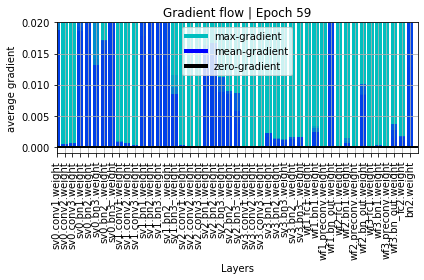

In [14]:
model = model.to(device)

model_folder = '/tf/data/Quan/fer2013/backtobasics/svgg2/'
model_name = 'svgg_resnet2'
model_path = os.path.join(model_folder, model_name + '.pt')

best_acc = 0.0
hist = []

for epoch in range(60):  # loop over the dataset multiple times
    
    print('Epoch: ', epoch + 1)
    running_loss = 0.0
    running_acc = 0.0

    # TRAIN
    model.train()
    for i, data in enumerate(train_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)
        loss.backward()
        
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        running_acc += acc
        print('\t - Step %d: loss: %.3f acc: %.3f' % (i+1, loss.item(), acc))

    print('- Avg.loss: %.3f  | Avg.acc: %.3f' % (running_loss / (i+1), running_acc / (i+1)))
    avgloss = running_loss / (i+1)
    avgacc = running_acc / (i+1)
    
    # print gradient flow figure
    plot_grad_flow(model.named_parameters(), epoch,
                   savepath=os.path.join(model_folder, model_name + '_gf' + '_' + str(epoch) + '.png'))

    # EVALUATE
    model.eval()
    running_valloss = 0.0
    running_valacc = 0.0
    for i,data in enumerate(val_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)

        running_valloss += loss.item()
        running_valacc += acc

    print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))

    avgvalloss = running_valloss / (i+1)
    avgvalcc = running_valacc / (i+1)

    hist.append([avgloss, avgvalloss, avgacc, avgvalcc])
    
    if best_acc < (running_valacc / (i+1)):
        best_acc = (running_valacc / (i+1))
        torch.save(model, model_path)
        print('* Update optimal model')

print('Finished Training')

([<matplotlib.lines.Line2D at 0x7fc027dc1048>,
 0.6209429826652795)

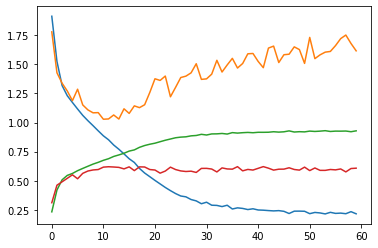

In [16]:
plt.plot(hist), best_acc

In [17]:
import imageio
images = []
for i in range(60):
    images.append(imageio.imread('/tf/data/Quan/fer2013/backtobasics/svgg2/svgg_resnet2_gf_' + str(i) + '.png'))
imageio.mimsave('/tf/data/Quan/fer2013/backtobasics/svgg2/svgg_resnet2_gf.gif', images)

The modification makes the model possibly explode the gradient. This may be due we have removed the activation in WeightFeature.
Generally, the very first network seems to act better than the two laters.

I decide to back to the original network and make some modfications **(SVGG3)**. In particular
* Modify residual connection in SV block, add 1x1 conv for each residual
* Add LeakyReLU in WeightFeature

### SVGG3

In [20]:
class SVblock(nn.Module):
    def __init__(self, in_neurons, nb_neurons, kernel_size=(3,3), batch_norm=True, activation='relu', **kwargs):
        '''
    in_neurons: C_in
    nb_neurons: n_filters of conv2d
    '''
        super(SVblock, self).__init__()

        self.index = kwargs['index'] if 'index' in kwargs else None
        self.conv1 = nn.Conv2d(in_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv2 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv3 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        
        self.bn1 = nn.BatchNorm2d(nb_neurons)
        self.bn2 = nn.BatchNorm2d(nb_neurons)
        self.bn3 = nn.BatchNorm2d(nb_neurons)
        
        self.preconv1 = nn.Conv2d(in_neurons, nb_neurons, kernel_size=1)
        self.preconv2 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=1)
        self.preconv3 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=1)
        self.bn1_ = nn.BatchNorm2d(nb_neurons)
        self.bn2_ = nn.BatchNorm2d(nb_neurons)
        self.bn3_ = nn.BatchNorm2d(nb_neurons)
        
        self.relu = nn.LeakyReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=(2,2), stride=2)
     


    def forward(self, x):        
        
        x0_res = self.preconv1(x)
        x0_res = self.bn1_(x0_res)
        
        # 1st
        x1 = self.conv1(x)
        x1 = self.bn1(x1)
        x1 = self.relu(x1)
        
        x1 = x1 + x0_res
        x1_res = self.preconv2(x1)
        x1_res = self.bn2_(x1_res)

        # 2nd
        x2 = self.conv2(x1)
        x2 = self.bn2(x2)
        x2 = self.relu(x2)
        
        x2 = x2 + x1_res
        x2_res = self.preconv3(x2)
        x2_res = self.bn3_(x2_res)
        
        # 3rd
        x3 = self.conv3(x2)
        x3 = self.bn3(x3)
        x3 = self.relu(x3)
        
        x3 = x3 + x2_res

        # maxpooling
        x_out = self.maxpool(x3)

        return x_out

In [21]:
class WeightFeature(nn.Module):
    def __init__(self, feature_depth, target_depth):
        super(WeightFeature, self).__init__()

        self.target_depth = target_depth
        self.fc1 = nn.Linear(feature_depth, target_depth)
        self.bn1 = nn.BatchNorm1d(target_depth)
        self.preconv = nn.Conv2d(target_depth, target_depth, kernel_size=1)
        self.relu = nn.LeakyReLU()
        self.bn_out = nn.BatchNorm2d(target_depth)
        
    def forward(self, x1, x2):
        x1 = nn.AvgPool2d(kernel_size=(x1.size(-2), x1.size(-1)))(x1)
        x1 = nn.Flatten()(x1)

        x1 = self.fc1(x1)
        x1 = self.bn1(x1)
        x1 = self.relu(x1)
        x1 = x1.unsqueeze(-1).unsqueeze(-1)

        _x2 = self.preconv(x2)
        
        x = torch.mul(_x2,x1)
        x = x + x2
        x = self.bn_out(x)

        return x

In [22]:
class SVGG(nn.Module):
    
    def __init__(self, **kwargs):
        super(SVGG, self).__init__()

        self.device = torch.device('cpu') if not 'device' in kwargs else kwargs['device']

        self.sv0 = SVblock(1, 64).to(self.device)
        self.sv1 = SVblock(64, 128).to(self.device)
        self.sv2 = SVblock(128, 256).to(self.device)
        self.sv3 = SVblock(256, 512).to(self.device)

        self.wf1 = WeightFeature(64, 128).to(self.device)
        self.wf2 = WeightFeature(128, 256).to(self.device)
        self.wf3 = WeightFeature(256, 512).to(self.device)

        self.fc2 = nn.Linear(512, 7)
        self.bn2 = nn.BatchNorm1d(7)
        
    
    def forward(self, x):
        x0 = self.sv0(x)

        x1 = self.sv1(x0)
        x_wf1 = self.wf1(x0, x1)

        x2 = self.sv2(x_wf1)
        x_wf2 = self.wf2(x1, x2)

        x3 = self.sv3(x_wf2)
        x_wf3 = self.wf3(x2, x3)

        x_wf3 = nn.AvgPool2d(kernel_size=(x_wf3.size(-2), x_wf3.size(-1)))(x_wf3)
    
        x = nn.Flatten()(x_wf3)

        x = self.fc2(x)
        x = self.bn2(x)

        return x

In [23]:
device = torch.device('cuda')
print(device)

model = SVGG(device=device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3)


cuda


Epoch:  1
	 - Step 1: loss: 2.326 acc: 0.188
	 - Step 2: loss: 2.435 acc: 0.156
	 - Step 3: loss: 2.289 acc: 0.234
	 - Step 4: loss: 2.323 acc: 0.156
	 - Step 5: loss: 1.990 acc: 0.297
	 - Step 6: loss: 2.006 acc: 0.125
	 - Step 7: loss: 2.161 acc: 0.203
	 - Step 8: loss: 2.320 acc: 0.172
	 - Step 9: loss: 2.084 acc: 0.281
	 - Step 10: loss: 1.987 acc: 0.156
	 - Step 11: loss: 2.039 acc: 0.188
	 - Step 12: loss: 2.000 acc: 0.203
	 - Step 13: loss: 1.999 acc: 0.172
	 - Step 14: loss: 1.901 acc: 0.312
	 - Step 15: loss: 2.055 acc: 0.156
	 - Step 16: loss: 1.956 acc: 0.141
	 - Step 17: loss: 2.001 acc: 0.219
	 - Step 18: loss: 2.179 acc: 0.188
	 - Step 19: loss: 1.899 acc: 0.188
	 - Step 20: loss: 1.871 acc: 0.250
	 - Step 21: loss: 2.140 acc: 0.156
	 - Step 22: loss: 1.905 acc: 0.188
	 - Step 23: loss: 2.027 acc: 0.125
	 - Step 24: loss: 1.949 acc: 0.250
	 - Step 25: loss: 2.071 acc: 0.125
	 - Step 26: loss: 1.871 acc: 0.344
	 - Step 27: loss: 1.899 acc: 0.188
	 - Step 28: loss: 1.928 ac

	 - Step 226: loss: 1.857 acc: 0.219
	 - Step 227: loss: 1.872 acc: 0.266
	 - Step 228: loss: 1.985 acc: 0.203
	 - Step 229: loss: 1.882 acc: 0.219
	 - Step 230: loss: 1.851 acc: 0.297
	 - Step 231: loss: 1.817 acc: 0.250
	 - Step 232: loss: 1.871 acc: 0.250
	 - Step 233: loss: 1.887 acc: 0.281
	 - Step 234: loss: 1.814 acc: 0.219
	 - Step 235: loss: 1.812 acc: 0.297
	 - Step 236: loss: 1.850 acc: 0.203
	 - Step 237: loss: 1.770 acc: 0.391
	 - Step 238: loss: 1.863 acc: 0.312
	 - Step 239: loss: 1.868 acc: 0.250
	 - Step 240: loss: 1.874 acc: 0.312
	 - Step 241: loss: 1.864 acc: 0.234
	 - Step 242: loss: 1.886 acc: 0.250
	 - Step 243: loss: 1.892 acc: 0.172
	 - Step 244: loss: 1.841 acc: 0.312
	 - Step 245: loss: 1.834 acc: 0.281
	 - Step 246: loss: 1.831 acc: 0.250
	 - Step 247: loss: 1.890 acc: 0.234
	 - Step 248: loss: 1.814 acc: 0.312
	 - Step 249: loss: 1.929 acc: 0.328
	 - Step 250: loss: 1.795 acc: 0.250
	 - Step 251: loss: 1.909 acc: 0.203
	 - Step 252: loss: 1.854 acc: 0.266
	

	 - Step 448: loss: 1.803 acc: 0.297
	 - Step 449: loss: 1.792 acc: 0.351
- Avg.loss: 1.893  | Avg.acc: 0.235


Exception ignored in: <bound method _MultiProcessingDataLoaderIter.__del__ of <torch.utils.data.dataloader._MultiProcessingDataLoaderIter object at 0x7f14da19ee80>>
Exception ignored in: <bound method _MultiProcessingDataLoaderIter.__del__ of <torch.utils.data.dataloader._MultiProcessingDataLoaderIter object at 0x7f14da19ee80>>
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 961, in __del__
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 961, in __del__
    self._shutdown_workers()
    self._shutdown_workers()
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 941, in _shutdown_workers
    w.join()
Exception ignored in: <bound method _MultiProcessingDataLoaderIter.__del__ of <torch.utils.data.dataloade

- Avg. val_loss: 1.849  | Avg. val_acc: 0.251


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVGG. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVblock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type WeightFeature. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


* Update optimal model
Epoch:  2
	 - Step 1: loss: 1.814 acc: 0.312
	 - Step 2: loss: 1.849 acc: 0.219
	 - Step 3: loss: 1.819 acc: 0.234
	 - Step 4: loss: 1.784 acc: 0.312
	 - Step 5: loss: 1.888 acc: 0.172
	 - Step 6: loss: 1.837 acc: 0.312
	 - Step 7: loss: 1.814 acc: 0.297
	 - Step 8: loss: 1.769 acc: 0.375
	 - Step 9: loss: 1.812 acc: 0.281
	 - Step 10: loss: 1.850 acc: 0.203
	 - Step 11: loss: 1.800 acc: 0.312
	 - Step 12: loss: 1.772 acc: 0.391
	 - Step 13: loss: 1.876 acc: 0.266
	 - Step 14: loss: 1.841 acc: 0.203
	 - Step 15: loss: 1.832 acc: 0.172
	 - Step 16: loss: 1.870 acc: 0.172
	 - Step 17: loss: 1.871 acc: 0.203
	 - Step 18: loss: 1.833 acc: 0.250
	 - Step 19: loss: 1.816 acc: 0.281
	 - Step 20: loss: 1.845 acc: 0.281
	 - Step 21: loss: 1.828 acc: 0.250
	 - Step 22: loss: 1.864 acc: 0.234
	 - Step 23: loss: 1.865 acc: 0.203
	 - Step 24: loss: 1.840 acc: 0.297
	 - Step 25: loss: 1.818 acc: 0.250
	 - Step 26: loss: 1.846 acc: 0.234
	 - Step 27: loss: 1.863 acc: 0.156
	 - 

	 - Step 226: loss: 1.783 acc: 0.297
	 - Step 227: loss: 1.803 acc: 0.219
	 - Step 228: loss: 1.842 acc: 0.188
	 - Step 229: loss: 1.804 acc: 0.219
	 - Step 230: loss: 1.789 acc: 0.234
	 - Step 231: loss: 1.856 acc: 0.203
	 - Step 232: loss: 1.834 acc: 0.234
	 - Step 233: loss: 1.767 acc: 0.203
	 - Step 234: loss: 1.796 acc: 0.328
	 - Step 235: loss: 1.790 acc: 0.297
	 - Step 236: loss: 1.758 acc: 0.297
	 - Step 237: loss: 1.839 acc: 0.188
	 - Step 238: loss: 1.775 acc: 0.344
	 - Step 239: loss: 1.858 acc: 0.203
	 - Step 240: loss: 1.738 acc: 0.266
	 - Step 241: loss: 1.832 acc: 0.250
	 - Step 242: loss: 1.835 acc: 0.219
	 - Step 243: loss: 1.789 acc: 0.188
	 - Step 244: loss: 1.846 acc: 0.203
	 - Step 245: loss: 1.820 acc: 0.297
	 - Step 246: loss: 1.770 acc: 0.266
	 - Step 247: loss: 1.918 acc: 0.188
	 - Step 248: loss: 1.797 acc: 0.234
	 - Step 249: loss: 1.888 acc: 0.219
	 - Step 250: loss: 1.811 acc: 0.250
	 - Step 251: loss: 1.855 acc: 0.234
	 - Step 252: loss: 1.855 acc: 0.281
	

	 - Step 448: loss: 1.760 acc: 0.281
	 - Step 449: loss: 1.756 acc: 0.243
- Avg.loss: 1.814  | Avg.acc: 0.256
- Avg. val_loss: 1.918  | Avg. val_acc: 0.258
* Update optimal model
Epoch:  3
	 - Step 1: loss: 1.786 acc: 0.250
	 - Step 2: loss: 1.846 acc: 0.156
	 - Step 3: loss: 1.882 acc: 0.266
	 - Step 4: loss: 1.825 acc: 0.266
	 - Step 5: loss: 1.784 acc: 0.219
	 - Step 6: loss: 1.717 acc: 0.359
	 - Step 7: loss: 1.808 acc: 0.219
	 - Step 8: loss: 1.840 acc: 0.234
	 - Step 9: loss: 1.780 acc: 0.266
	 - Step 10: loss: 1.757 acc: 0.297
	 - Step 11: loss: 1.716 acc: 0.328
	 - Step 12: loss: 1.744 acc: 0.328
	 - Step 13: loss: 1.704 acc: 0.281
	 - Step 14: loss: 1.806 acc: 0.234
	 - Step 15: loss: 1.887 acc: 0.203
	 - Step 16: loss: 1.863 acc: 0.234
	 - Step 17: loss: 1.833 acc: 0.219
	 - Step 18: loss: 1.814 acc: 0.312
	 - Step 19: loss: 1.782 acc: 0.344
	 - Step 20: loss: 1.793 acc: 0.250
	 - Step 21: loss: 1.791 acc: 0.297
	 - Step 22: loss: 1.841 acc: 0.219
	 - Step 23: loss: 1.877 acc

	 - Step 223: loss: 1.780 acc: 0.234
	 - Step 224: loss: 1.728 acc: 0.344
	 - Step 225: loss: 1.837 acc: 0.266
	 - Step 226: loss: 1.713 acc: 0.359
	 - Step 227: loss: 1.744 acc: 0.312
	 - Step 228: loss: 1.691 acc: 0.297
	 - Step 229: loss: 1.829 acc: 0.250
	 - Step 230: loss: 1.827 acc: 0.172
	 - Step 231: loss: 1.782 acc: 0.281
	 - Step 232: loss: 1.796 acc: 0.203
	 - Step 233: loss: 1.828 acc: 0.188
	 - Step 234: loss: 1.756 acc: 0.281
	 - Step 235: loss: 1.763 acc: 0.266
	 - Step 236: loss: 1.752 acc: 0.281
	 - Step 237: loss: 1.784 acc: 0.234
	 - Step 238: loss: 1.797 acc: 0.297
	 - Step 239: loss: 1.745 acc: 0.266
	 - Step 240: loss: 1.748 acc: 0.328
	 - Step 241: loss: 1.904 acc: 0.266
	 - Step 242: loss: 1.668 acc: 0.359
	 - Step 243: loss: 1.673 acc: 0.359
	 - Step 244: loss: 1.774 acc: 0.219
	 - Step 245: loss: 1.828 acc: 0.203
	 - Step 246: loss: 1.862 acc: 0.234
	 - Step 247: loss: 1.755 acc: 0.281
	 - Step 248: loss: 1.658 acc: 0.406
	 - Step 249: loss: 1.785 acc: 0.250
	

	 - Step 445: loss: 1.898 acc: 0.203
	 - Step 446: loss: 1.784 acc: 0.234
	 - Step 447: loss: 1.805 acc: 0.250
	 - Step 448: loss: 1.821 acc: 0.219
	 - Step 449: loss: 1.804 acc: 0.216
- Avg.loss: 1.783  | Avg.acc: 0.268
- Avg. val_loss: 1.813  | Avg. val_acc: 0.245
Epoch:  4
	 - Step 1: loss: 1.738 acc: 0.250
	 - Step 2: loss: 1.801 acc: 0.203
	 - Step 3: loss: 1.757 acc: 0.312
	 - Step 4: loss: 1.827 acc: 0.203
	 - Step 5: loss: 1.738 acc: 0.297
	 - Step 6: loss: 1.823 acc: 0.203
	 - Step 7: loss: 1.843 acc: 0.266
	 - Step 8: loss: 1.774 acc: 0.281
	 - Step 9: loss: 1.829 acc: 0.234
	 - Step 10: loss: 1.922 acc: 0.188
	 - Step 11: loss: 1.786 acc: 0.281
	 - Step 12: loss: 1.756 acc: 0.219
	 - Step 13: loss: 1.757 acc: 0.234
	 - Step 14: loss: 1.765 acc: 0.281
	 - Step 15: loss: 1.877 acc: 0.172
	 - Step 16: loss: 1.766 acc: 0.281
	 - Step 17: loss: 1.756 acc: 0.297
	 - Step 18: loss: 1.784 acc: 0.266
	 - Step 19: loss: 1.737 acc: 0.312
	 - Step 20: loss: 1.763 acc: 0.297
	 - Step 21:

	 - Step 220: loss: 1.734 acc: 0.344
	 - Step 221: loss: 1.930 acc: 0.188
	 - Step 222: loss: 1.661 acc: 0.359
	 - Step 223: loss: 1.839 acc: 0.234
	 - Step 224: loss: 1.776 acc: 0.266
	 - Step 225: loss: 1.820 acc: 0.219
	 - Step 226: loss: 1.715 acc: 0.281
	 - Step 227: loss: 1.723 acc: 0.219
	 - Step 228: loss: 1.733 acc: 0.297
	 - Step 229: loss: 1.761 acc: 0.281
	 - Step 230: loss: 1.629 acc: 0.344
	 - Step 231: loss: 1.762 acc: 0.250
	 - Step 232: loss: 1.805 acc: 0.234
	 - Step 233: loss: 1.768 acc: 0.266
	 - Step 234: loss: 1.708 acc: 0.234
	 - Step 235: loss: 1.664 acc: 0.312
	 - Step 236: loss: 1.731 acc: 0.234
	 - Step 237: loss: 1.818 acc: 0.188
	 - Step 238: loss: 1.751 acc: 0.250
	 - Step 239: loss: 1.818 acc: 0.297
	 - Step 240: loss: 1.767 acc: 0.234
	 - Step 241: loss: 1.790 acc: 0.312
	 - Step 242: loss: 1.761 acc: 0.266
	 - Step 243: loss: 1.896 acc: 0.172
	 - Step 244: loss: 1.819 acc: 0.156
	 - Step 245: loss: 1.747 acc: 0.250
	 - Step 246: loss: 1.868 acc: 0.156
	

	 - Step 442: loss: 1.833 acc: 0.203
	 - Step 443: loss: 1.708 acc: 0.281
	 - Step 444: loss: 1.681 acc: 0.297
	 - Step 445: loss: 1.692 acc: 0.312
	 - Step 446: loss: 1.767 acc: 0.344
	 - Step 447: loss: 1.721 acc: 0.281
	 - Step 448: loss: 1.647 acc: 0.266
	 - Step 449: loss: 1.751 acc: 0.216
- Avg.loss: 1.756  | Avg.acc: 0.277
- Avg. val_loss: 1.796  | Avg. val_acc: 0.221
Epoch:  5
	 - Step 1: loss: 1.893 acc: 0.188
	 - Step 2: loss: 1.690 acc: 0.281
	 - Step 3: loss: 1.566 acc: 0.406
	 - Step 4: loss: 1.682 acc: 0.391
	 - Step 5: loss: 1.710 acc: 0.359
	 - Step 6: loss: 1.793 acc: 0.219
	 - Step 7: loss: 1.664 acc: 0.297
	 - Step 8: loss: 1.728 acc: 0.250
	 - Step 9: loss: 1.722 acc: 0.281
	 - Step 10: loss: 1.631 acc: 0.234
	 - Step 11: loss: 1.732 acc: 0.297
	 - Step 12: loss: 1.865 acc: 0.328
	 - Step 13: loss: 1.712 acc: 0.297
	 - Step 14: loss: 1.818 acc: 0.250
	 - Step 15: loss: 1.946 acc: 0.250
	 - Step 16: loss: 1.669 acc: 0.391
	 - Step 17: loss: 1.722 acc: 0.266
	 - Step 

	 - Step 217: loss: 1.740 acc: 0.359
	 - Step 218: loss: 1.734 acc: 0.250
	 - Step 219: loss: 1.724 acc: 0.328
	 - Step 220: loss: 1.671 acc: 0.391
	 - Step 221: loss: 1.722 acc: 0.281
	 - Step 222: loss: 1.732 acc: 0.188
	 - Step 223: loss: 1.716 acc: 0.312
	 - Step 224: loss: 1.734 acc: 0.297
	 - Step 225: loss: 1.763 acc: 0.250
	 - Step 226: loss: 1.716 acc: 0.219
	 - Step 227: loss: 1.686 acc: 0.375
	 - Step 228: loss: 1.684 acc: 0.328
	 - Step 229: loss: 1.746 acc: 0.250
	 - Step 230: loss: 1.626 acc: 0.312
	 - Step 231: loss: 1.717 acc: 0.281
	 - Step 232: loss: 1.845 acc: 0.297
	 - Step 233: loss: 1.879 acc: 0.172
	 - Step 234: loss: 1.620 acc: 0.359
	 - Step 235: loss: 1.746 acc: 0.234
	 - Step 236: loss: 1.839 acc: 0.234
	 - Step 237: loss: 1.646 acc: 0.312
	 - Step 238: loss: 1.598 acc: 0.375
	 - Step 239: loss: 1.779 acc: 0.281
	 - Step 240: loss: 1.850 acc: 0.188
	 - Step 241: loss: 1.690 acc: 0.312
	 - Step 242: loss: 1.657 acc: 0.297
	 - Step 243: loss: 1.579 acc: 0.344
	

	 - Step 439: loss: 1.638 acc: 0.328
	 - Step 440: loss: 1.555 acc: 0.422
	 - Step 441: loss: 1.646 acc: 0.297
	 - Step 442: loss: 1.687 acc: 0.391
	 - Step 443: loss: 1.795 acc: 0.297
	 - Step 444: loss: 1.576 acc: 0.375
	 - Step 445: loss: 1.852 acc: 0.203
	 - Step 446: loss: 1.663 acc: 0.266
	 - Step 447: loss: 1.829 acc: 0.203
	 - Step 448: loss: 1.717 acc: 0.266
	 - Step 449: loss: 1.721 acc: 0.270
- Avg.loss: 1.725  | Avg.acc: 0.295
- Avg. val_loss: 1.839  | Avg. val_acc: 0.246
Epoch:  6
	 - Step 1: loss: 1.719 acc: 0.266
	 - Step 2: loss: 1.779 acc: 0.172
	 - Step 3: loss: 1.640 acc: 0.422
	 - Step 4: loss: 1.672 acc: 0.297
	 - Step 5: loss: 1.674 acc: 0.312
	 - Step 6: loss: 1.802 acc: 0.266
	 - Step 7: loss: 1.794 acc: 0.219
	 - Step 8: loss: 1.645 acc: 0.328
	 - Step 9: loss: 1.712 acc: 0.328
	 - Step 10: loss: 1.744 acc: 0.250
	 - Step 11: loss: 1.656 acc: 0.297
	 - Step 12: loss: 1.780 acc: 0.281
	 - Step 13: loss: 1.856 acc: 0.219
	 - Step 14: loss: 1.726 acc: 0.203
	 - St

	 - Step 212: loss: 1.644 acc: 0.312
	 - Step 213: loss: 1.541 acc: 0.422
	 - Step 214: loss: 1.651 acc: 0.281
	 - Step 215: loss: 1.639 acc: 0.312
	 - Step 216: loss: 1.610 acc: 0.375
	 - Step 217: loss: 1.675 acc: 0.281
	 - Step 218: loss: 1.794 acc: 0.266
	 - Step 219: loss: 1.613 acc: 0.375
	 - Step 220: loss: 1.501 acc: 0.344
	 - Step 221: loss: 1.515 acc: 0.406
	 - Step 222: loss: 1.655 acc: 0.266
	 - Step 223: loss: 1.781 acc: 0.266
	 - Step 224: loss: 1.619 acc: 0.312
	 - Step 225: loss: 1.892 acc: 0.188
	 - Step 226: loss: 1.579 acc: 0.328
	 - Step 227: loss: 1.748 acc: 0.312
	 - Step 228: loss: 1.682 acc: 0.391
	 - Step 229: loss: 1.714 acc: 0.312
	 - Step 230: loss: 1.679 acc: 0.297
	 - Step 231: loss: 1.714 acc: 0.406
	 - Step 232: loss: 1.862 acc: 0.281
	 - Step 233: loss: 1.974 acc: 0.203
	 - Step 234: loss: 1.682 acc: 0.281
	 - Step 235: loss: 1.694 acc: 0.359
	 - Step 236: loss: 1.560 acc: 0.344
	 - Step 237: loss: 1.612 acc: 0.328
	 - Step 238: loss: 1.694 acc: 0.266
	

	 - Step 434: loss: 1.722 acc: 0.281
	 - Step 435: loss: 1.663 acc: 0.312
	 - Step 436: loss: 1.589 acc: 0.359
	 - Step 437: loss: 1.723 acc: 0.250
	 - Step 438: loss: 1.647 acc: 0.328
	 - Step 439: loss: 1.822 acc: 0.234
	 - Step 440: loss: 1.544 acc: 0.359
	 - Step 441: loss: 1.879 acc: 0.250
	 - Step 442: loss: 1.561 acc: 0.391
	 - Step 443: loss: 1.852 acc: 0.250
	 - Step 444: loss: 1.709 acc: 0.312
	 - Step 445: loss: 1.757 acc: 0.219
	 - Step 446: loss: 1.692 acc: 0.250
	 - Step 447: loss: 1.859 acc: 0.281
	 - Step 448: loss: 1.592 acc: 0.328
	 - Step 449: loss: 1.726 acc: 0.216
- Avg.loss: 1.697  | Avg.acc: 0.305
- Avg. val_loss: 1.752  | Avg. val_acc: 0.290
* Update optimal model
Epoch:  7
	 - Step 1: loss: 1.693 acc: 0.297
	 - Step 2: loss: 1.668 acc: 0.328
	 - Step 3: loss: 1.704 acc: 0.297
	 - Step 4: loss: 1.617 acc: 0.312
	 - Step 5: loss: 1.668 acc: 0.297
	 - Step 6: loss: 1.559 acc: 0.406
	 - Step 7: loss: 1.674 acc: 0.422
	 - Step 8: loss: 1.735 acc: 0.328
	 - Step 9: l

	 - Step 208: loss: 1.592 acc: 0.391
	 - Step 209: loss: 1.578 acc: 0.391
	 - Step 210: loss: 1.706 acc: 0.312
	 - Step 211: loss: 1.750 acc: 0.266
	 - Step 212: loss: 1.662 acc: 0.344
	 - Step 213: loss: 1.827 acc: 0.234
	 - Step 214: loss: 1.619 acc: 0.344
	 - Step 215: loss: 1.835 acc: 0.266
	 - Step 216: loss: 1.588 acc: 0.422
	 - Step 217: loss: 1.650 acc: 0.297
	 - Step 218: loss: 1.648 acc: 0.312
	 - Step 219: loss: 1.624 acc: 0.312
	 - Step 220: loss: 1.699 acc: 0.328
	 - Step 221: loss: 1.622 acc: 0.422
	 - Step 222: loss: 1.808 acc: 0.266
	 - Step 223: loss: 1.534 acc: 0.375
	 - Step 224: loss: 1.711 acc: 0.250
	 - Step 225: loss: 1.636 acc: 0.250
	 - Step 226: loss: 1.605 acc: 0.328
	 - Step 227: loss: 1.803 acc: 0.266
	 - Step 228: loss: 1.667 acc: 0.328
	 - Step 229: loss: 1.640 acc: 0.359
	 - Step 230: loss: 1.676 acc: 0.359
	 - Step 231: loss: 1.789 acc: 0.281
	 - Step 232: loss: 1.533 acc: 0.391
	 - Step 233: loss: 1.454 acc: 0.391
	 - Step 234: loss: 1.570 acc: 0.375
	

	 - Step 430: loss: 1.631 acc: 0.328
	 - Step 431: loss: 1.567 acc: 0.359
	 - Step 432: loss: 1.591 acc: 0.344
	 - Step 433: loss: 1.603 acc: 0.422
	 - Step 434: loss: 1.609 acc: 0.375
	 - Step 435: loss: 1.691 acc: 0.391
	 - Step 436: loss: 1.545 acc: 0.359
	 - Step 437: loss: 1.677 acc: 0.312
	 - Step 438: loss: 1.483 acc: 0.406
	 - Step 439: loss: 1.588 acc: 0.406
	 - Step 440: loss: 1.678 acc: 0.312
	 - Step 441: loss: 1.605 acc: 0.312
	 - Step 442: loss: 1.647 acc: 0.438
	 - Step 443: loss: 1.757 acc: 0.281
	 - Step 444: loss: 1.654 acc: 0.375
	 - Step 445: loss: 1.703 acc: 0.266
	 - Step 446: loss: 1.604 acc: 0.297
	 - Step 447: loss: 1.518 acc: 0.406
	 - Step 448: loss: 1.503 acc: 0.391
	 - Step 449: loss: 1.549 acc: 0.432
- Avg.loss: 1.654  | Avg.acc: 0.337
- Avg. val_loss: 1.699  | Avg. val_acc: 0.314
* Update optimal model
Epoch:  8
	 - Step 1: loss: 1.678 acc: 0.281
	 - Step 2: loss: 1.621 acc: 0.375
	 - Step 3: loss: 1.711 acc: 0.375
	 - Step 4: loss: 1.728 acc: 0.266
	 - S

	 - Step 205: loss: 1.507 acc: 0.484
	 - Step 206: loss: 1.376 acc: 0.516
	 - Step 207: loss: 1.624 acc: 0.328
	 - Step 208: loss: 1.531 acc: 0.328
	 - Step 209: loss: 1.704 acc: 0.344
	 - Step 210: loss: 1.484 acc: 0.422
	 - Step 211: loss: 1.721 acc: 0.359
	 - Step 212: loss: 1.578 acc: 0.359
	 - Step 213: loss: 1.452 acc: 0.422
	 - Step 214: loss: 1.610 acc: 0.406
	 - Step 215: loss: 1.627 acc: 0.266
	 - Step 216: loss: 1.621 acc: 0.406
	 - Step 217: loss: 1.514 acc: 0.375
	 - Step 218: loss: 1.498 acc: 0.391
	 - Step 219: loss: 1.531 acc: 0.391
	 - Step 220: loss: 1.761 acc: 0.328
	 - Step 221: loss: 1.597 acc: 0.344
	 - Step 222: loss: 1.593 acc: 0.312
	 - Step 223: loss: 1.588 acc: 0.375
	 - Step 224: loss: 1.564 acc: 0.391
	 - Step 225: loss: 1.436 acc: 0.484
	 - Step 226: loss: 1.577 acc: 0.375
	 - Step 227: loss: 1.474 acc: 0.406
	 - Step 228: loss: 1.441 acc: 0.422
	 - Step 229: loss: 1.655 acc: 0.422
	 - Step 230: loss: 1.475 acc: 0.484
	 - Step 231: loss: 1.480 acc: 0.438
	

	 - Step 427: loss: 1.502 acc: 0.406
	 - Step 428: loss: 1.448 acc: 0.438
	 - Step 429: loss: 1.371 acc: 0.500
	 - Step 430: loss: 1.491 acc: 0.391
	 - Step 431: loss: 1.647 acc: 0.297
	 - Step 432: loss: 1.470 acc: 0.422
	 - Step 433: loss: 1.468 acc: 0.391
	 - Step 434: loss: 1.401 acc: 0.484
	 - Step 435: loss: 1.569 acc: 0.406
	 - Step 436: loss: 1.548 acc: 0.375
	 - Step 437: loss: 1.522 acc: 0.391
	 - Step 438: loss: 1.627 acc: 0.406
	 - Step 439: loss: 1.546 acc: 0.391
	 - Step 440: loss: 1.606 acc: 0.312
	 - Step 441: loss: 1.615 acc: 0.281
	 - Step 442: loss: 1.635 acc: 0.281
	 - Step 443: loss: 1.523 acc: 0.359
	 - Step 444: loss: 1.509 acc: 0.422
	 - Step 445: loss: 1.364 acc: 0.469
	 - Step 446: loss: 1.513 acc: 0.422
	 - Step 447: loss: 1.550 acc: 0.453
	 - Step 448: loss: 1.550 acc: 0.328
	 - Step 449: loss: 1.665 acc: 0.378
- Avg.loss: 1.573  | Avg.acc: 0.383
- Avg. val_loss: 1.553  | Avg. val_acc: 0.399
* Update optimal model
Epoch:  9
	 - Step 1: loss: 1.459 acc: 0.469

	 - Step 202: loss: 1.453 acc: 0.438
	 - Step 203: loss: 1.468 acc: 0.438
	 - Step 204: loss: 1.396 acc: 0.438
	 - Step 205: loss: 1.373 acc: 0.562
	 - Step 206: loss: 1.473 acc: 0.453
	 - Step 207: loss: 1.532 acc: 0.438
	 - Step 208: loss: 1.372 acc: 0.391
	 - Step 209: loss: 1.530 acc: 0.344
	 - Step 210: loss: 1.513 acc: 0.453
	 - Step 211: loss: 1.566 acc: 0.344
	 - Step 212: loss: 1.573 acc: 0.375
	 - Step 213: loss: 1.336 acc: 0.516
	 - Step 214: loss: 1.659 acc: 0.359
	 - Step 215: loss: 1.531 acc: 0.391
	 - Step 216: loss: 1.475 acc: 0.484
	 - Step 217: loss: 1.485 acc: 0.406
	 - Step 218: loss: 1.508 acc: 0.453
	 - Step 219: loss: 1.626 acc: 0.328
	 - Step 220: loss: 1.569 acc: 0.406
	 - Step 221: loss: 1.427 acc: 0.484
	 - Step 222: loss: 1.658 acc: 0.359
	 - Step 223: loss: 1.502 acc: 0.453
	 - Step 224: loss: 1.518 acc: 0.391
	 - Step 225: loss: 1.576 acc: 0.406
	 - Step 226: loss: 1.539 acc: 0.281
	 - Step 227: loss: 1.355 acc: 0.500
	 - Step 228: loss: 1.361 acc: 0.516
	

	 - Step 424: loss: 1.554 acc: 0.281
	 - Step 425: loss: 1.495 acc: 0.453
	 - Step 426: loss: 1.585 acc: 0.438
	 - Step 427: loss: 1.680 acc: 0.281
	 - Step 428: loss: 1.530 acc: 0.391
	 - Step 429: loss: 1.592 acc: 0.422
	 - Step 430: loss: 1.529 acc: 0.422
	 - Step 431: loss: 1.507 acc: 0.406
	 - Step 432: loss: 1.618 acc: 0.359
	 - Step 433: loss: 1.579 acc: 0.453
	 - Step 434: loss: 1.399 acc: 0.469
	 - Step 435: loss: 1.452 acc: 0.453
	 - Step 436: loss: 1.596 acc: 0.312
	 - Step 437: loss: 1.421 acc: 0.484
	 - Step 438: loss: 1.514 acc: 0.406
	 - Step 439: loss: 1.456 acc: 0.422
	 - Step 440: loss: 1.480 acc: 0.391
	 - Step 441: loss: 1.509 acc: 0.484
	 - Step 442: loss: 1.537 acc: 0.391
	 - Step 443: loss: 1.552 acc: 0.344
	 - Step 444: loss: 1.549 acc: 0.297
	 - Step 445: loss: 1.442 acc: 0.406
	 - Step 446: loss: 1.481 acc: 0.438
	 - Step 447: loss: 1.490 acc: 0.438
	 - Step 448: loss: 1.397 acc: 0.516
	 - Step 449: loss: 1.590 acc: 0.405
- Avg.loss: 1.512  | Avg.acc: 0.414
- 

	 - Step 199: loss: 1.346 acc: 0.469
	 - Step 200: loss: 1.418 acc: 0.469
	 - Step 201: loss: 1.527 acc: 0.453
	 - Step 202: loss: 1.523 acc: 0.406
	 - Step 203: loss: 1.370 acc: 0.500
	 - Step 204: loss: 1.320 acc: 0.562
	 - Step 205: loss: 1.425 acc: 0.453
	 - Step 206: loss: 1.448 acc: 0.469
	 - Step 207: loss: 1.673 acc: 0.297
	 - Step 208: loss: 1.344 acc: 0.469
	 - Step 209: loss: 1.412 acc: 0.469
	 - Step 210: loss: 1.370 acc: 0.453
	 - Step 211: loss: 1.480 acc: 0.375
	 - Step 212: loss: 1.533 acc: 0.422
	 - Step 213: loss: 1.454 acc: 0.453
	 - Step 214: loss: 1.358 acc: 0.422
	 - Step 215: loss: 1.452 acc: 0.391
	 - Step 216: loss: 1.443 acc: 0.422
	 - Step 217: loss: 1.567 acc: 0.312
	 - Step 218: loss: 1.515 acc: 0.391
	 - Step 219: loss: 1.520 acc: 0.406
	 - Step 220: loss: 1.441 acc: 0.547
	 - Step 221: loss: 1.353 acc: 0.422
	 - Step 222: loss: 1.527 acc: 0.406
	 - Step 223: loss: 1.518 acc: 0.453
	 - Step 224: loss: 1.483 acc: 0.484
	 - Step 225: loss: 1.511 acc: 0.453
	

	 - Step 421: loss: 1.451 acc: 0.422
	 - Step 422: loss: 1.432 acc: 0.438
	 - Step 423: loss: 1.400 acc: 0.500
	 - Step 424: loss: 1.368 acc: 0.469
	 - Step 425: loss: 1.379 acc: 0.500
	 - Step 426: loss: 1.550 acc: 0.391
	 - Step 427: loss: 1.347 acc: 0.469
	 - Step 428: loss: 1.630 acc: 0.344
	 - Step 429: loss: 1.449 acc: 0.422
	 - Step 430: loss: 1.471 acc: 0.328
	 - Step 431: loss: 1.638 acc: 0.359
	 - Step 432: loss: 1.718 acc: 0.344
	 - Step 433: loss: 1.447 acc: 0.422
	 - Step 434: loss: 1.360 acc: 0.453
	 - Step 435: loss: 1.542 acc: 0.406
	 - Step 436: loss: 1.544 acc: 0.375
	 - Step 437: loss: 1.408 acc: 0.469
	 - Step 438: loss: 1.618 acc: 0.328
	 - Step 439: loss: 1.532 acc: 0.438
	 - Step 440: loss: 1.393 acc: 0.484
	 - Step 441: loss: 1.371 acc: 0.547
	 - Step 442: loss: 1.548 acc: 0.375
	 - Step 443: loss: 1.463 acc: 0.344
	 - Step 444: loss: 1.420 acc: 0.453
	 - Step 445: loss: 1.396 acc: 0.453
	 - Step 446: loss: 1.349 acc: 0.484
	 - Step 447: loss: 1.393 acc: 0.391
	

	 - Step 194: loss: 1.417 acc: 0.422
	 - Step 195: loss: 1.559 acc: 0.391
	 - Step 196: loss: 1.643 acc: 0.422
	 - Step 197: loss: 1.419 acc: 0.422
	 - Step 198: loss: 1.543 acc: 0.438
	 - Step 199: loss: 1.374 acc: 0.453
	 - Step 200: loss: 1.577 acc: 0.375
	 - Step 201: loss: 1.347 acc: 0.484
	 - Step 202: loss: 1.398 acc: 0.453
	 - Step 203: loss: 1.637 acc: 0.344
	 - Step 204: loss: 1.236 acc: 0.531
	 - Step 205: loss: 1.546 acc: 0.344
	 - Step 206: loss: 1.613 acc: 0.328
	 - Step 207: loss: 1.476 acc: 0.500
	 - Step 208: loss: 1.335 acc: 0.469
	 - Step 209: loss: 1.360 acc: 0.516
	 - Step 210: loss: 1.476 acc: 0.406
	 - Step 211: loss: 1.366 acc: 0.531
	 - Step 212: loss: 1.484 acc: 0.344
	 - Step 213: loss: 1.335 acc: 0.453
	 - Step 214: loss: 1.528 acc: 0.359
	 - Step 215: loss: 1.385 acc: 0.453
	 - Step 216: loss: 1.662 acc: 0.344
	 - Step 217: loss: 1.279 acc: 0.484
	 - Step 218: loss: 1.449 acc: 0.406
	 - Step 219: loss: 1.371 acc: 0.453
	 - Step 220: loss: 1.523 acc: 0.359
	

	 - Step 416: loss: 1.347 acc: 0.500
	 - Step 417: loss: 1.510 acc: 0.484
	 - Step 418: loss: 1.566 acc: 0.438
	 - Step 419: loss: 1.367 acc: 0.453
	 - Step 420: loss: 1.420 acc: 0.391
	 - Step 421: loss: 1.476 acc: 0.406
	 - Step 422: loss: 1.437 acc: 0.422
	 - Step 423: loss: 1.400 acc: 0.453
	 - Step 424: loss: 1.434 acc: 0.344
	 - Step 425: loss: 1.550 acc: 0.391
	 - Step 426: loss: 1.427 acc: 0.500
	 - Step 427: loss: 1.386 acc: 0.500
	 - Step 428: loss: 1.388 acc: 0.547
	 - Step 429: loss: 1.518 acc: 0.359
	 - Step 430: loss: 1.387 acc: 0.484
	 - Step 431: loss: 1.501 acc: 0.422
	 - Step 432: loss: 1.254 acc: 0.531
	 - Step 433: loss: 1.375 acc: 0.516
	 - Step 434: loss: 1.317 acc: 0.438
	 - Step 435: loss: 1.360 acc: 0.484
	 - Step 436: loss: 1.548 acc: 0.391
	 - Step 437: loss: 1.387 acc: 0.453
	 - Step 438: loss: 1.421 acc: 0.531
	 - Step 439: loss: 1.450 acc: 0.453
	 - Step 440: loss: 1.471 acc: 0.422
	 - Step 441: loss: 1.303 acc: 0.531
	 - Step 442: loss: 1.362 acc: 0.484
	

	 - Step 190: loss: 1.439 acc: 0.516
	 - Step 191: loss: 1.321 acc: 0.516
	 - Step 192: loss: 1.290 acc: 0.484
	 - Step 193: loss: 1.247 acc: 0.438
	 - Step 194: loss: 1.534 acc: 0.500
	 - Step 195: loss: 1.310 acc: 0.516
	 - Step 196: loss: 1.234 acc: 0.469
	 - Step 197: loss: 1.327 acc: 0.500
	 - Step 198: loss: 1.589 acc: 0.406
	 - Step 199: loss: 1.442 acc: 0.516
	 - Step 200: loss: 1.432 acc: 0.453
	 - Step 201: loss: 1.477 acc: 0.484
	 - Step 202: loss: 1.588 acc: 0.406
	 - Step 203: loss: 1.398 acc: 0.469
	 - Step 204: loss: 1.168 acc: 0.672
	 - Step 205: loss: 1.466 acc: 0.406
	 - Step 206: loss: 1.189 acc: 0.609
	 - Step 207: loss: 1.401 acc: 0.469
	 - Step 208: loss: 1.409 acc: 0.547
	 - Step 209: loss: 1.329 acc: 0.484
	 - Step 210: loss: 1.511 acc: 0.422
	 - Step 211: loss: 1.602 acc: 0.328
	 - Step 212: loss: 1.353 acc: 0.484
	 - Step 213: loss: 1.679 acc: 0.375
	 - Step 214: loss: 1.383 acc: 0.484
	 - Step 215: loss: 1.453 acc: 0.422
	 - Step 216: loss: 1.306 acc: 0.453
	

	 - Step 412: loss: 1.255 acc: 0.547
	 - Step 413: loss: 1.414 acc: 0.469
	 - Step 414: loss: 1.514 acc: 0.500
	 - Step 415: loss: 1.261 acc: 0.484
	 - Step 416: loss: 1.433 acc: 0.422
	 - Step 417: loss: 1.424 acc: 0.391
	 - Step 418: loss: 1.413 acc: 0.469
	 - Step 419: loss: 1.423 acc: 0.406
	 - Step 420: loss: 1.451 acc: 0.438
	 - Step 421: loss: 1.531 acc: 0.406
	 - Step 422: loss: 1.440 acc: 0.422
	 - Step 423: loss: 1.457 acc: 0.422
	 - Step 424: loss: 1.363 acc: 0.484
	 - Step 425: loss: 1.335 acc: 0.469
	 - Step 426: loss: 1.273 acc: 0.578
	 - Step 427: loss: 1.365 acc: 0.438
	 - Step 428: loss: 1.488 acc: 0.391
	 - Step 429: loss: 1.355 acc: 0.453
	 - Step 430: loss: 1.443 acc: 0.453
	 - Step 431: loss: 1.307 acc: 0.484
	 - Step 432: loss: 1.327 acc: 0.484
	 - Step 433: loss: 1.342 acc: 0.438
	 - Step 434: loss: 1.184 acc: 0.609
	 - Step 435: loss: 1.609 acc: 0.375
	 - Step 436: loss: 1.412 acc: 0.406
	 - Step 437: loss: 1.584 acc: 0.422
	 - Step 438: loss: 1.475 acc: 0.453
	

	 - Step 187: loss: 1.357 acc: 0.469
	 - Step 188: loss: 1.439 acc: 0.359
	 - Step 189: loss: 1.510 acc: 0.375
	 - Step 190: loss: 1.568 acc: 0.391
	 - Step 191: loss: 1.441 acc: 0.469
	 - Step 192: loss: 1.425 acc: 0.484
	 - Step 193: loss: 1.434 acc: 0.500
	 - Step 194: loss: 1.567 acc: 0.359
	 - Step 195: loss: 1.299 acc: 0.531
	 - Step 196: loss: 1.367 acc: 0.484
	 - Step 197: loss: 1.435 acc: 0.453
	 - Step 198: loss: 1.259 acc: 0.562
	 - Step 199: loss: 1.510 acc: 0.438
	 - Step 200: loss: 1.367 acc: 0.516
	 - Step 201: loss: 1.368 acc: 0.438
	 - Step 202: loss: 1.412 acc: 0.406
	 - Step 203: loss: 1.416 acc: 0.438
	 - Step 204: loss: 1.302 acc: 0.516
	 - Step 205: loss: 1.224 acc: 0.484
	 - Step 206: loss: 1.513 acc: 0.406
	 - Step 207: loss: 1.416 acc: 0.453
	 - Step 208: loss: 1.211 acc: 0.547
	 - Step 209: loss: 1.569 acc: 0.359
	 - Step 210: loss: 1.481 acc: 0.438
	 - Step 211: loss: 1.660 acc: 0.359
	 - Step 212: loss: 1.325 acc: 0.484
	 - Step 213: loss: 1.541 acc: 0.391
	

	 - Step 409: loss: 1.438 acc: 0.453
	 - Step 410: loss: 1.555 acc: 0.406
	 - Step 411: loss: 1.344 acc: 0.422
	 - Step 412: loss: 1.326 acc: 0.438
	 - Step 413: loss: 1.483 acc: 0.438
	 - Step 414: loss: 1.355 acc: 0.500
	 - Step 415: loss: 1.410 acc: 0.422
	 - Step 416: loss: 1.512 acc: 0.391
	 - Step 417: loss: 1.473 acc: 0.406
	 - Step 418: loss: 1.240 acc: 0.484
	 - Step 419: loss: 1.275 acc: 0.516
	 - Step 420: loss: 1.284 acc: 0.516
	 - Step 421: loss: 1.406 acc: 0.422
	 - Step 422: loss: 1.355 acc: 0.453
	 - Step 423: loss: 1.340 acc: 0.469
	 - Step 424: loss: 1.376 acc: 0.453
	 - Step 425: loss: 1.288 acc: 0.516
	 - Step 426: loss: 1.426 acc: 0.469
	 - Step 427: loss: 1.224 acc: 0.500
	 - Step 428: loss: 1.281 acc: 0.516
	 - Step 429: loss: 1.204 acc: 0.562
	 - Step 430: loss: 1.498 acc: 0.406
	 - Step 431: loss: 1.356 acc: 0.438
	 - Step 432: loss: 1.134 acc: 0.562
	 - Step 433: loss: 1.410 acc: 0.438
	 - Step 434: loss: 1.381 acc: 0.469
	 - Step 435: loss: 1.423 acc: 0.453
	

	 - Step 184: loss: 1.345 acc: 0.375
	 - Step 185: loss: 1.227 acc: 0.484
	 - Step 186: loss: 1.204 acc: 0.562
	 - Step 187: loss: 1.267 acc: 0.516
	 - Step 188: loss: 1.307 acc: 0.516
	 - Step 189: loss: 1.558 acc: 0.406
	 - Step 190: loss: 1.353 acc: 0.422
	 - Step 191: loss: 1.444 acc: 0.391
	 - Step 192: loss: 1.426 acc: 0.406
	 - Step 193: loss: 1.293 acc: 0.453
	 - Step 194: loss: 1.494 acc: 0.406
	 - Step 195: loss: 1.361 acc: 0.406
	 - Step 196: loss: 1.270 acc: 0.484
	 - Step 197: loss: 1.384 acc: 0.484
	 - Step 198: loss: 1.369 acc: 0.469
	 - Step 199: loss: 1.526 acc: 0.391
	 - Step 200: loss: 1.328 acc: 0.469
	 - Step 201: loss: 1.306 acc: 0.484
	 - Step 202: loss: 1.509 acc: 0.500
	 - Step 203: loss: 1.314 acc: 0.469
	 - Step 204: loss: 1.364 acc: 0.484
	 - Step 205: loss: 1.439 acc: 0.375
	 - Step 206: loss: 1.431 acc: 0.406
	 - Step 207: loss: 1.458 acc: 0.422
	 - Step 208: loss: 1.519 acc: 0.438
	 - Step 209: loss: 1.374 acc: 0.422
	 - Step 210: loss: 1.359 acc: 0.422
	

	 - Step 406: loss: 1.455 acc: 0.406
	 - Step 407: loss: 1.271 acc: 0.531
	 - Step 408: loss: 1.241 acc: 0.547
	 - Step 409: loss: 1.286 acc: 0.469
	 - Step 410: loss: 1.551 acc: 0.469
	 - Step 411: loss: 1.408 acc: 0.469
	 - Step 412: loss: 1.375 acc: 0.516
	 - Step 413: loss: 1.537 acc: 0.375
	 - Step 414: loss: 1.284 acc: 0.500
	 - Step 415: loss: 1.535 acc: 0.406
	 - Step 416: loss: 1.326 acc: 0.438
	 - Step 417: loss: 1.280 acc: 0.500
	 - Step 418: loss: 1.500 acc: 0.375
	 - Step 419: loss: 1.239 acc: 0.547
	 - Step 420: loss: 1.393 acc: 0.469
	 - Step 421: loss: 1.445 acc: 0.438
	 - Step 422: loss: 1.260 acc: 0.516
	 - Step 423: loss: 1.286 acc: 0.562
	 - Step 424: loss: 1.449 acc: 0.391
	 - Step 425: loss: 1.160 acc: 0.609
	 - Step 426: loss: 1.293 acc: 0.516
	 - Step 427: loss: 1.613 acc: 0.266
	 - Step 428: loss: 1.300 acc: 0.562
	 - Step 429: loss: 1.232 acc: 0.547
	 - Step 430: loss: 1.470 acc: 0.453
	 - Step 431: loss: 1.408 acc: 0.422
	 - Step 432: loss: 1.319 acc: 0.500
	

	 - Step 181: loss: 1.307 acc: 0.500
	 - Step 182: loss: 1.274 acc: 0.547
	 - Step 183: loss: 1.322 acc: 0.516
	 - Step 184: loss: 1.333 acc: 0.469
	 - Step 185: loss: 1.444 acc: 0.438
	 - Step 186: loss: 1.330 acc: 0.453
	 - Step 187: loss: 1.308 acc: 0.516
	 - Step 188: loss: 1.360 acc: 0.469
	 - Step 189: loss: 1.427 acc: 0.438
	 - Step 190: loss: 1.368 acc: 0.531
	 - Step 191: loss: 1.621 acc: 0.328
	 - Step 192: loss: 1.305 acc: 0.516
	 - Step 193: loss: 1.569 acc: 0.375
	 - Step 194: loss: 1.310 acc: 0.453
	 - Step 195: loss: 1.487 acc: 0.422
	 - Step 196: loss: 1.450 acc: 0.453
	 - Step 197: loss: 1.421 acc: 0.453
	 - Step 198: loss: 1.224 acc: 0.500
	 - Step 199: loss: 1.173 acc: 0.609
	 - Step 200: loss: 1.417 acc: 0.484
	 - Step 201: loss: 1.279 acc: 0.562
	 - Step 202: loss: 1.459 acc: 0.469
	 - Step 203: loss: 1.367 acc: 0.469
	 - Step 204: loss: 1.287 acc: 0.531
	 - Step 205: loss: 1.430 acc: 0.406
	 - Step 206: loss: 1.384 acc: 0.453
	 - Step 207: loss: 1.380 acc: 0.469
	

	 - Step 403: loss: 1.457 acc: 0.406
	 - Step 404: loss: 1.578 acc: 0.484
	 - Step 405: loss: 1.218 acc: 0.516
	 - Step 406: loss: 1.469 acc: 0.453
	 - Step 407: loss: 1.446 acc: 0.453
	 - Step 408: loss: 1.226 acc: 0.578
	 - Step 409: loss: 1.335 acc: 0.484
	 - Step 410: loss: 1.328 acc: 0.438
	 - Step 411: loss: 1.427 acc: 0.484
	 - Step 412: loss: 1.385 acc: 0.453
	 - Step 413: loss: 1.394 acc: 0.438
	 - Step 414: loss: 1.357 acc: 0.531
	 - Step 415: loss: 1.399 acc: 0.484
	 - Step 416: loss: 1.322 acc: 0.547
	 - Step 417: loss: 1.351 acc: 0.469
	 - Step 418: loss: 1.456 acc: 0.406
	 - Step 419: loss: 1.624 acc: 0.312
	 - Step 420: loss: 1.281 acc: 0.484
	 - Step 421: loss: 1.415 acc: 0.516
	 - Step 422: loss: 1.332 acc: 0.484
	 - Step 423: loss: 1.279 acc: 0.516
	 - Step 424: loss: 1.590 acc: 0.375
	 - Step 425: loss: 1.380 acc: 0.422
	 - Step 426: loss: 1.550 acc: 0.438
	 - Step 427: loss: 1.349 acc: 0.469
	 - Step 428: loss: 1.332 acc: 0.453
	 - Step 429: loss: 1.368 acc: 0.484
	

	 - Step 178: loss: 1.205 acc: 0.594
	 - Step 179: loss: 1.478 acc: 0.438
	 - Step 180: loss: 1.299 acc: 0.516
	 - Step 181: loss: 1.308 acc: 0.469
	 - Step 182: loss: 1.371 acc: 0.453
	 - Step 183: loss: 1.250 acc: 0.484
	 - Step 184: loss: 1.278 acc: 0.484
	 - Step 185: loss: 1.377 acc: 0.484
	 - Step 186: loss: 1.316 acc: 0.484
	 - Step 187: loss: 1.303 acc: 0.453
	 - Step 188: loss: 1.426 acc: 0.438
	 - Step 189: loss: 1.363 acc: 0.469
	 - Step 190: loss: 1.562 acc: 0.391
	 - Step 191: loss: 1.422 acc: 0.406
	 - Step 192: loss: 1.295 acc: 0.516
	 - Step 193: loss: 1.286 acc: 0.469
	 - Step 194: loss: 1.204 acc: 0.562
	 - Step 195: loss: 1.478 acc: 0.469
	 - Step 196: loss: 1.396 acc: 0.516
	 - Step 197: loss: 1.315 acc: 0.484
	 - Step 198: loss: 1.303 acc: 0.500
	 - Step 199: loss: 1.396 acc: 0.500
	 - Step 200: loss: 1.549 acc: 0.422
	 - Step 201: loss: 1.134 acc: 0.641
	 - Step 202: loss: 1.342 acc: 0.422
	 - Step 203: loss: 1.347 acc: 0.516
	 - Step 204: loss: 1.190 acc: 0.578
	

	 - Step 400: loss: 1.212 acc: 0.562
	 - Step 401: loss: 1.412 acc: 0.453
	 - Step 402: loss: 1.199 acc: 0.609
	 - Step 403: loss: 1.493 acc: 0.469
	 - Step 404: loss: 1.503 acc: 0.391
	 - Step 405: loss: 1.354 acc: 0.438
	 - Step 406: loss: 1.192 acc: 0.547
	 - Step 407: loss: 1.169 acc: 0.547
	 - Step 408: loss: 1.369 acc: 0.531
	 - Step 409: loss: 1.344 acc: 0.500
	 - Step 410: loss: 1.426 acc: 0.438
	 - Step 411: loss: 1.296 acc: 0.453
	 - Step 412: loss: 1.420 acc: 0.453
	 - Step 413: loss: 1.280 acc: 0.562
	 - Step 414: loss: 1.388 acc: 0.500
	 - Step 415: loss: 1.643 acc: 0.359
	 - Step 416: loss: 1.190 acc: 0.516
	 - Step 417: loss: 1.480 acc: 0.406
	 - Step 418: loss: 1.235 acc: 0.516
	 - Step 419: loss: 1.210 acc: 0.500
	 - Step 420: loss: 1.555 acc: 0.359
	 - Step 421: loss: 1.379 acc: 0.453
	 - Step 422: loss: 1.474 acc: 0.438
	 - Step 423: loss: 1.220 acc: 0.516
	 - Step 424: loss: 1.360 acc: 0.594
	 - Step 425: loss: 1.130 acc: 0.594
	 - Step 426: loss: 1.229 acc: 0.453
	

	 - Step 175: loss: 1.281 acc: 0.500
	 - Step 176: loss: 1.504 acc: 0.344
	 - Step 177: loss: 1.486 acc: 0.391
	 - Step 178: loss: 1.203 acc: 0.531
	 - Step 179: loss: 1.475 acc: 0.422
	 - Step 180: loss: 1.261 acc: 0.500
	 - Step 181: loss: 1.207 acc: 0.547
	 - Step 182: loss: 1.295 acc: 0.531
	 - Step 183: loss: 1.427 acc: 0.484
	 - Step 184: loss: 1.316 acc: 0.453
	 - Step 185: loss: 1.350 acc: 0.531
	 - Step 186: loss: 1.346 acc: 0.516
	 - Step 187: loss: 1.466 acc: 0.375
	 - Step 188: loss: 1.291 acc: 0.516
	 - Step 189: loss: 1.456 acc: 0.359
	 - Step 190: loss: 1.585 acc: 0.438
	 - Step 191: loss: 1.282 acc: 0.516
	 - Step 192: loss: 1.418 acc: 0.422
	 - Step 193: loss: 1.291 acc: 0.438
	 - Step 194: loss: 1.317 acc: 0.453
	 - Step 195: loss: 1.327 acc: 0.547
	 - Step 196: loss: 1.249 acc: 0.562
	 - Step 197: loss: 1.250 acc: 0.422
	 - Step 198: loss: 1.499 acc: 0.406
	 - Step 199: loss: 1.374 acc: 0.516
	 - Step 200: loss: 1.363 acc: 0.438
	 - Step 201: loss: 1.388 acc: 0.516
	

	 - Step 397: loss: 1.323 acc: 0.484
	 - Step 398: loss: 1.380 acc: 0.406
	 - Step 399: loss: 1.311 acc: 0.438
	 - Step 400: loss: 1.418 acc: 0.500
	 - Step 401: loss: 1.176 acc: 0.531
	 - Step 402: loss: 1.212 acc: 0.531
	 - Step 403: loss: 1.343 acc: 0.516
	 - Step 404: loss: 1.553 acc: 0.406
	 - Step 405: loss: 1.391 acc: 0.391
	 - Step 406: loss: 1.333 acc: 0.453
	 - Step 407: loss: 1.421 acc: 0.500
	 - Step 408: loss: 1.271 acc: 0.531
	 - Step 409: loss: 1.354 acc: 0.500
	 - Step 410: loss: 1.357 acc: 0.500
	 - Step 411: loss: 1.502 acc: 0.422
	 - Step 412: loss: 1.201 acc: 0.516
	 - Step 413: loss: 1.393 acc: 0.375
	 - Step 414: loss: 1.151 acc: 0.594
	 - Step 415: loss: 1.401 acc: 0.406
	 - Step 416: loss: 1.338 acc: 0.469
	 - Step 417: loss: 1.345 acc: 0.500
	 - Step 418: loss: 1.515 acc: 0.453
	 - Step 419: loss: 1.171 acc: 0.516
	 - Step 420: loss: 1.483 acc: 0.438
	 - Step 421: loss: 1.279 acc: 0.547
	 - Step 422: loss: 1.232 acc: 0.516
	 - Step 423: loss: 1.251 acc: 0.453
	

	 - Step 172: loss: 1.318 acc: 0.469
	 - Step 173: loss: 1.243 acc: 0.625
	 - Step 174: loss: 1.390 acc: 0.406
	 - Step 175: loss: 1.397 acc: 0.406
	 - Step 176: loss: 1.398 acc: 0.438
	 - Step 177: loss: 1.260 acc: 0.516
	 - Step 178: loss: 1.222 acc: 0.547
	 - Step 179: loss: 1.320 acc: 0.469
	 - Step 180: loss: 1.177 acc: 0.625
	 - Step 181: loss: 1.377 acc: 0.453
	 - Step 182: loss: 1.365 acc: 0.453
	 - Step 183: loss: 1.424 acc: 0.406
	 - Step 184: loss: 1.309 acc: 0.469
	 - Step 185: loss: 1.280 acc: 0.531
	 - Step 186: loss: 1.342 acc: 0.422
	 - Step 187: loss: 1.155 acc: 0.547
	 - Step 188: loss: 1.309 acc: 0.547
	 - Step 189: loss: 1.405 acc: 0.406
	 - Step 190: loss: 1.160 acc: 0.547
	 - Step 191: loss: 1.402 acc: 0.500
	 - Step 192: loss: 1.230 acc: 0.453
	 - Step 193: loss: 1.407 acc: 0.516
	 - Step 194: loss: 1.253 acc: 0.516
	 - Step 195: loss: 1.395 acc: 0.469
	 - Step 196: loss: 1.291 acc: 0.469
	 - Step 197: loss: 1.318 acc: 0.500
	 - Step 198: loss: 1.358 acc: 0.469
	

	 - Step 394: loss: 1.410 acc: 0.375
	 - Step 395: loss: 1.444 acc: 0.469
	 - Step 396: loss: 1.556 acc: 0.453
	 - Step 397: loss: 1.457 acc: 0.375
	 - Step 398: loss: 1.338 acc: 0.453
	 - Step 399: loss: 1.376 acc: 0.438
	 - Step 400: loss: 1.407 acc: 0.484
	 - Step 401: loss: 1.258 acc: 0.516
	 - Step 402: loss: 1.455 acc: 0.453
	 - Step 403: loss: 1.527 acc: 0.484
	 - Step 404: loss: 1.273 acc: 0.500
	 - Step 405: loss: 1.257 acc: 0.484
	 - Step 406: loss: 1.489 acc: 0.484
	 - Step 407: loss: 1.422 acc: 0.438
	 - Step 408: loss: 1.310 acc: 0.484
	 - Step 409: loss: 1.262 acc: 0.500
	 - Step 410: loss: 1.153 acc: 0.469
	 - Step 411: loss: 1.310 acc: 0.500
	 - Step 412: loss: 1.359 acc: 0.578
	 - Step 413: loss: 1.327 acc: 0.562
	 - Step 414: loss: 1.530 acc: 0.438
	 - Step 415: loss: 1.463 acc: 0.406
	 - Step 416: loss: 1.319 acc: 0.516
	 - Step 417: loss: 1.303 acc: 0.500
	 - Step 418: loss: 1.639 acc: 0.297
	 - Step 419: loss: 1.159 acc: 0.609
	 - Step 420: loss: 1.462 acc: 0.438
	

	 - Step 169: loss: 1.329 acc: 0.500
	 - Step 170: loss: 1.271 acc: 0.484
	 - Step 171: loss: 1.327 acc: 0.469
	 - Step 172: loss: 1.258 acc: 0.484
	 - Step 173: loss: 1.522 acc: 0.391
	 - Step 174: loss: 1.362 acc: 0.484
	 - Step 175: loss: 1.223 acc: 0.531
	 - Step 176: loss: 1.260 acc: 0.469
	 - Step 177: loss: 1.458 acc: 0.438
	 - Step 178: loss: 1.442 acc: 0.406
	 - Step 179: loss: 1.332 acc: 0.500
	 - Step 180: loss: 1.356 acc: 0.469
	 - Step 181: loss: 1.185 acc: 0.500
	 - Step 182: loss: 1.363 acc: 0.391
	 - Step 183: loss: 1.351 acc: 0.438
	 - Step 184: loss: 1.157 acc: 0.578
	 - Step 185: loss: 1.248 acc: 0.484
	 - Step 186: loss: 1.410 acc: 0.531
	 - Step 187: loss: 1.405 acc: 0.516
	 - Step 188: loss: 1.544 acc: 0.328
	 - Step 189: loss: 1.542 acc: 0.391
	 - Step 190: loss: 1.265 acc: 0.562
	 - Step 191: loss: 1.491 acc: 0.359
	 - Step 192: loss: 1.558 acc: 0.375
	 - Step 193: loss: 1.275 acc: 0.500
	 - Step 194: loss: 1.490 acc: 0.406
	 - Step 195: loss: 1.213 acc: 0.531
	

	 - Step 391: loss: 1.225 acc: 0.578
	 - Step 392: loss: 1.183 acc: 0.594
	 - Step 393: loss: 1.518 acc: 0.438
	 - Step 394: loss: 1.525 acc: 0.391
	 - Step 395: loss: 1.369 acc: 0.469
	 - Step 396: loss: 1.206 acc: 0.500
	 - Step 397: loss: 1.402 acc: 0.422
	 - Step 398: loss: 1.333 acc: 0.469
	 - Step 399: loss: 1.264 acc: 0.453
	 - Step 400: loss: 1.524 acc: 0.422
	 - Step 401: loss: 1.196 acc: 0.594
	 - Step 402: loss: 1.321 acc: 0.484
	 - Step 403: loss: 1.231 acc: 0.531
	 - Step 404: loss: 1.303 acc: 0.484
	 - Step 405: loss: 1.156 acc: 0.547
	 - Step 406: loss: 1.372 acc: 0.578
	 - Step 407: loss: 1.413 acc: 0.469
	 - Step 408: loss: 1.286 acc: 0.469
	 - Step 409: loss: 1.313 acc: 0.500
	 - Step 410: loss: 1.318 acc: 0.469
	 - Step 411: loss: 1.337 acc: 0.484
	 - Step 412: loss: 1.416 acc: 0.453
	 - Step 413: loss: 1.286 acc: 0.406
	 - Step 414: loss: 1.136 acc: 0.562
	 - Step 415: loss: 1.290 acc: 0.547
	 - Step 416: loss: 1.228 acc: 0.531
	 - Step 417: loss: 1.200 acc: 0.531
	

	 - Step 166: loss: 1.482 acc: 0.438
	 - Step 167: loss: 1.204 acc: 0.453
	 - Step 168: loss: 1.127 acc: 0.578
	 - Step 169: loss: 1.324 acc: 0.516
	 - Step 170: loss: 1.256 acc: 0.484
	 - Step 171: loss: 1.502 acc: 0.453
	 - Step 172: loss: 1.394 acc: 0.453
	 - Step 173: loss: 1.570 acc: 0.359
	 - Step 174: loss: 1.389 acc: 0.391
	 - Step 175: loss: 1.263 acc: 0.438
	 - Step 176: loss: 1.604 acc: 0.375
	 - Step 177: loss: 1.215 acc: 0.641
	 - Step 178: loss: 1.249 acc: 0.500
	 - Step 179: loss: 1.194 acc: 0.609
	 - Step 180: loss: 1.315 acc: 0.484
	 - Step 181: loss: 1.274 acc: 0.547
	 - Step 182: loss: 1.262 acc: 0.453
	 - Step 183: loss: 1.487 acc: 0.469
	 - Step 184: loss: 1.530 acc: 0.328
	 - Step 185: loss: 1.268 acc: 0.500
	 - Step 186: loss: 1.284 acc: 0.500
	 - Step 187: loss: 1.344 acc: 0.516
	 - Step 188: loss: 1.215 acc: 0.594
	 - Step 189: loss: 1.351 acc: 0.422
	 - Step 190: loss: 1.467 acc: 0.391
	 - Step 191: loss: 1.353 acc: 0.438
	 - Step 192: loss: 1.287 acc: 0.469
	

	 - Step 388: loss: 1.492 acc: 0.406
	 - Step 389: loss: 1.214 acc: 0.484
	 - Step 390: loss: 1.372 acc: 0.547
	 - Step 391: loss: 1.177 acc: 0.469
	 - Step 392: loss: 1.404 acc: 0.391
	 - Step 393: loss: 1.265 acc: 0.438
	 - Step 394: loss: 1.227 acc: 0.500
	 - Step 395: loss: 1.213 acc: 0.562
	 - Step 396: loss: 1.308 acc: 0.469
	 - Step 397: loss: 1.267 acc: 0.469
	 - Step 398: loss: 1.351 acc: 0.469
	 - Step 399: loss: 1.335 acc: 0.422
	 - Step 400: loss: 1.444 acc: 0.469
	 - Step 401: loss: 1.613 acc: 0.312
	 - Step 402: loss: 1.331 acc: 0.516
	 - Step 403: loss: 1.214 acc: 0.500
	 - Step 404: loss: 1.198 acc: 0.531
	 - Step 405: loss: 1.102 acc: 0.562
	 - Step 406: loss: 1.409 acc: 0.469
	 - Step 407: loss: 1.333 acc: 0.453
	 - Step 408: loss: 1.469 acc: 0.484
	 - Step 409: loss: 1.392 acc: 0.438
	 - Step 410: loss: 1.377 acc: 0.453
	 - Step 411: loss: 1.327 acc: 0.469
	 - Step 412: loss: 1.225 acc: 0.578
	 - Step 413: loss: 1.453 acc: 0.469
	 - Step 414: loss: 1.653 acc: 0.344
	

	 - Step 163: loss: 1.326 acc: 0.500
	 - Step 164: loss: 1.181 acc: 0.516
	 - Step 165: loss: 1.387 acc: 0.406
	 - Step 166: loss: 1.288 acc: 0.547
	 - Step 167: loss: 1.252 acc: 0.578
	 - Step 168: loss: 1.254 acc: 0.516
	 - Step 169: loss: 1.494 acc: 0.375
	 - Step 170: loss: 1.189 acc: 0.484
	 - Step 171: loss: 1.246 acc: 0.453
	 - Step 172: loss: 1.285 acc: 0.438
	 - Step 173: loss: 1.367 acc: 0.438
	 - Step 174: loss: 1.259 acc: 0.469
	 - Step 175: loss: 1.131 acc: 0.594
	 - Step 176: loss: 1.374 acc: 0.500
	 - Step 177: loss: 1.296 acc: 0.469
	 - Step 178: loss: 1.472 acc: 0.500
	 - Step 179: loss: 1.214 acc: 0.484
	 - Step 180: loss: 1.293 acc: 0.453
	 - Step 181: loss: 1.412 acc: 0.453
	 - Step 182: loss: 1.322 acc: 0.469
	 - Step 183: loss: 1.363 acc: 0.516
	 - Step 184: loss: 1.322 acc: 0.516
	 - Step 185: loss: 1.564 acc: 0.375
	 - Step 186: loss: 1.150 acc: 0.516
	 - Step 187: loss: 1.455 acc: 0.391
	 - Step 188: loss: 1.435 acc: 0.422
	 - Step 189: loss: 1.194 acc: 0.469
	

	 - Step 385: loss: 1.287 acc: 0.469
	 - Step 386: loss: 1.168 acc: 0.547
	 - Step 387: loss: 1.289 acc: 0.516
	 - Step 388: loss: 1.197 acc: 0.609
	 - Step 389: loss: 1.377 acc: 0.484
	 - Step 390: loss: 1.315 acc: 0.469
	 - Step 391: loss: 1.232 acc: 0.516
	 - Step 392: loss: 1.215 acc: 0.469
	 - Step 393: loss: 1.498 acc: 0.422
	 - Step 394: loss: 1.392 acc: 0.469
	 - Step 395: loss: 1.428 acc: 0.484
	 - Step 396: loss: 1.237 acc: 0.531
	 - Step 397: loss: 1.171 acc: 0.500
	 - Step 398: loss: 1.090 acc: 0.547
	 - Step 399: loss: 1.433 acc: 0.375
	 - Step 400: loss: 1.423 acc: 0.453
	 - Step 401: loss: 1.211 acc: 0.531
	 - Step 402: loss: 1.078 acc: 0.578
	 - Step 403: loss: 1.204 acc: 0.516
	 - Step 404: loss: 1.297 acc: 0.516
	 - Step 405: loss: 1.274 acc: 0.531
	 - Step 406: loss: 1.303 acc: 0.484
	 - Step 407: loss: 1.278 acc: 0.578
	 - Step 408: loss: 1.243 acc: 0.531
	 - Step 409: loss: 1.252 acc: 0.578
	 - Step 410: loss: 1.525 acc: 0.359
	 - Step 411: loss: 1.576 acc: 0.391
	

	 - Step 160: loss: 1.308 acc: 0.469
	 - Step 161: loss: 1.304 acc: 0.469
	 - Step 162: loss: 1.321 acc: 0.516
	 - Step 163: loss: 1.226 acc: 0.516
	 - Step 164: loss: 1.247 acc: 0.609
	 - Step 165: loss: 1.136 acc: 0.594
	 - Step 166: loss: 1.242 acc: 0.531
	 - Step 167: loss: 1.310 acc: 0.516
	 - Step 168: loss: 1.153 acc: 0.547
	 - Step 169: loss: 1.226 acc: 0.500
	 - Step 170: loss: 1.484 acc: 0.422
	 - Step 171: loss: 1.282 acc: 0.438
	 - Step 172: loss: 1.308 acc: 0.547
	 - Step 173: loss: 1.320 acc: 0.453
	 - Step 174: loss: 1.290 acc: 0.469
	 - Step 175: loss: 1.345 acc: 0.516
	 - Step 176: loss: 1.466 acc: 0.453
	 - Step 177: loss: 1.389 acc: 0.375
	 - Step 178: loss: 1.133 acc: 0.562
	 - Step 179: loss: 1.349 acc: 0.453
	 - Step 180: loss: 1.263 acc: 0.531
	 - Step 181: loss: 1.585 acc: 0.469
	 - Step 182: loss: 1.436 acc: 0.422
	 - Step 183: loss: 1.377 acc: 0.516
	 - Step 184: loss: 1.300 acc: 0.484
	 - Step 185: loss: 1.773 acc: 0.359
	 - Step 186: loss: 1.216 acc: 0.516
	

	 - Step 382: loss: 1.108 acc: 0.594
	 - Step 383: loss: 1.442 acc: 0.453
	 - Step 384: loss: 1.167 acc: 0.547
	 - Step 385: loss: 1.102 acc: 0.641
	 - Step 386: loss: 1.468 acc: 0.438
	 - Step 387: loss: 1.189 acc: 0.516
	 - Step 388: loss: 1.478 acc: 0.438
	 - Step 389: loss: 1.200 acc: 0.469
	 - Step 390: loss: 1.286 acc: 0.562
	 - Step 391: loss: 1.253 acc: 0.578
	 - Step 392: loss: 1.671 acc: 0.391
	 - Step 393: loss: 1.145 acc: 0.562
	 - Step 394: loss: 1.495 acc: 0.469
	 - Step 395: loss: 1.075 acc: 0.594
	 - Step 396: loss: 1.431 acc: 0.422
	 - Step 397: loss: 1.305 acc: 0.547
	 - Step 398: loss: 1.230 acc: 0.562
	 - Step 399: loss: 1.255 acc: 0.484
	 - Step 400: loss: 1.348 acc: 0.500
	 - Step 401: loss: 1.406 acc: 0.500
	 - Step 402: loss: 1.454 acc: 0.406
	 - Step 403: loss: 1.314 acc: 0.484
	 - Step 404: loss: 1.379 acc: 0.453
	 - Step 405: loss: 1.508 acc: 0.391
	 - Step 406: loss: 1.297 acc: 0.453
	 - Step 407: loss: 1.219 acc: 0.531
	 - Step 408: loss: 1.207 acc: 0.562
	

	 - Step 157: loss: 1.384 acc: 0.422
	 - Step 158: loss: 1.254 acc: 0.500
	 - Step 159: loss: 1.344 acc: 0.406
	 - Step 160: loss: 1.530 acc: 0.422
	 - Step 161: loss: 1.286 acc: 0.500
	 - Step 162: loss: 1.145 acc: 0.562
	 - Step 163: loss: 1.233 acc: 0.578
	 - Step 164: loss: 1.457 acc: 0.453
	 - Step 165: loss: 1.229 acc: 0.531
	 - Step 166: loss: 1.403 acc: 0.438
	 - Step 167: loss: 1.471 acc: 0.484
	 - Step 168: loss: 1.530 acc: 0.422
	 - Step 169: loss: 1.406 acc: 0.484
	 - Step 170: loss: 1.230 acc: 0.516
	 - Step 171: loss: 1.144 acc: 0.578
	 - Step 172: loss: 1.170 acc: 0.547
	 - Step 173: loss: 1.357 acc: 0.469
	 - Step 174: loss: 1.197 acc: 0.578
	 - Step 175: loss: 1.295 acc: 0.531
	 - Step 176: loss: 1.254 acc: 0.500
	 - Step 177: loss: 1.141 acc: 0.578
	 - Step 178: loss: 1.301 acc: 0.516
	 - Step 179: loss: 1.265 acc: 0.516
	 - Step 180: loss: 1.289 acc: 0.578
	 - Step 181: loss: 1.316 acc: 0.453
	 - Step 182: loss: 1.277 acc: 0.531
	 - Step 183: loss: 1.280 acc: 0.500
	

	 - Step 379: loss: 1.261 acc: 0.562
	 - Step 380: loss: 1.105 acc: 0.656
	 - Step 381: loss: 1.463 acc: 0.453
	 - Step 382: loss: 1.336 acc: 0.484
	 - Step 383: loss: 1.335 acc: 0.516
	 - Step 384: loss: 1.358 acc: 0.438
	 - Step 385: loss: 1.265 acc: 0.469
	 - Step 386: loss: 1.260 acc: 0.500
	 - Step 387: loss: 1.229 acc: 0.562
	 - Step 388: loss: 1.146 acc: 0.531
	 - Step 389: loss: 1.123 acc: 0.625
	 - Step 390: loss: 1.444 acc: 0.453
	 - Step 391: loss: 1.361 acc: 0.516
	 - Step 392: loss: 1.429 acc: 0.484
	 - Step 393: loss: 1.239 acc: 0.578
	 - Step 394: loss: 1.189 acc: 0.594
	 - Step 395: loss: 1.149 acc: 0.562
	 - Step 396: loss: 1.337 acc: 0.531
	 - Step 397: loss: 1.637 acc: 0.344
	 - Step 398: loss: 1.251 acc: 0.578
	 - Step 399: loss: 1.182 acc: 0.531
	 - Step 400: loss: 1.467 acc: 0.422
	 - Step 401: loss: 1.262 acc: 0.609
	 - Step 402: loss: 1.324 acc: 0.578
	 - Step 403: loss: 1.511 acc: 0.406
	 - Step 404: loss: 1.200 acc: 0.562
	 - Step 405: loss: 1.397 acc: 0.406
	

	 - Step 154: loss: 1.428 acc: 0.469
	 - Step 155: loss: 1.191 acc: 0.562
	 - Step 156: loss: 1.263 acc: 0.609
	 - Step 157: loss: 1.207 acc: 0.594
	 - Step 158: loss: 1.321 acc: 0.422
	 - Step 159: loss: 1.369 acc: 0.484
	 - Step 160: loss: 1.311 acc: 0.469
	 - Step 161: loss: 1.432 acc: 0.422
	 - Step 162: loss: 1.169 acc: 0.531
	 - Step 163: loss: 1.240 acc: 0.453
	 - Step 164: loss: 1.150 acc: 0.562
	 - Step 165: loss: 1.384 acc: 0.406
	 - Step 166: loss: 1.260 acc: 0.594
	 - Step 167: loss: 1.536 acc: 0.406
	 - Step 168: loss: 1.369 acc: 0.484
	 - Step 169: loss: 1.292 acc: 0.531
	 - Step 170: loss: 1.452 acc: 0.438
	 - Step 171: loss: 1.396 acc: 0.500
	 - Step 172: loss: 1.052 acc: 0.562
	 - Step 173: loss: 1.184 acc: 0.609
	 - Step 174: loss: 1.266 acc: 0.500
	 - Step 175: loss: 1.312 acc: 0.453
	 - Step 176: loss: 1.258 acc: 0.500
	 - Step 177: loss: 1.295 acc: 0.547
	 - Step 178: loss: 1.392 acc: 0.469
	 - Step 179: loss: 1.197 acc: 0.500
	 - Step 180: loss: 1.328 acc: 0.469
	

	 - Step 376: loss: 1.297 acc: 0.484
	 - Step 377: loss: 1.358 acc: 0.469
	 - Step 378: loss: 1.246 acc: 0.547
	 - Step 379: loss: 1.300 acc: 0.547
	 - Step 380: loss: 1.433 acc: 0.453
	 - Step 381: loss: 1.432 acc: 0.453
	 - Step 382: loss: 1.406 acc: 0.406
	 - Step 383: loss: 1.182 acc: 0.562
	 - Step 384: loss: 1.226 acc: 0.484
	 - Step 385: loss: 1.366 acc: 0.484
	 - Step 386: loss: 1.380 acc: 0.484
	 - Step 387: loss: 1.256 acc: 0.531
	 - Step 388: loss: 1.296 acc: 0.500
	 - Step 389: loss: 1.229 acc: 0.609
	 - Step 390: loss: 1.470 acc: 0.375
	 - Step 391: loss: 1.417 acc: 0.422
	 - Step 392: loss: 1.216 acc: 0.547
	 - Step 393: loss: 1.318 acc: 0.469
	 - Step 394: loss: 1.265 acc: 0.469
	 - Step 395: loss: 1.295 acc: 0.500
	 - Step 396: loss: 1.139 acc: 0.641
	 - Step 397: loss: 1.186 acc: 0.547
	 - Step 398: loss: 1.354 acc: 0.469
	 - Step 399: loss: 1.370 acc: 0.469
	 - Step 400: loss: 1.257 acc: 0.547
	 - Step 401: loss: 1.353 acc: 0.562
	 - Step 402: loss: 1.352 acc: 0.469
	

	 - Step 151: loss: 1.424 acc: 0.422
	 - Step 152: loss: 1.466 acc: 0.438
	 - Step 153: loss: 1.154 acc: 0.516
	 - Step 154: loss: 1.283 acc: 0.484
	 - Step 155: loss: 1.324 acc: 0.469
	 - Step 156: loss: 1.215 acc: 0.562
	 - Step 157: loss: 1.138 acc: 0.578
	 - Step 158: loss: 1.543 acc: 0.422
	 - Step 159: loss: 1.266 acc: 0.547
	 - Step 160: loss: 1.296 acc: 0.516
	 - Step 161: loss: 1.317 acc: 0.484
	 - Step 162: loss: 1.307 acc: 0.562
	 - Step 163: loss: 1.385 acc: 0.453
	 - Step 164: loss: 1.298 acc: 0.453
	 - Step 165: loss: 1.308 acc: 0.516
	 - Step 166: loss: 1.527 acc: 0.328
	 - Step 167: loss: 1.198 acc: 0.578
	 - Step 168: loss: 1.227 acc: 0.531
	 - Step 169: loss: 1.374 acc: 0.562
	 - Step 170: loss: 1.148 acc: 0.625
	 - Step 171: loss: 1.252 acc: 0.578
	 - Step 172: loss: 1.344 acc: 0.469
	 - Step 173: loss: 1.226 acc: 0.500
	 - Step 174: loss: 1.141 acc: 0.562
	 - Step 175: loss: 1.481 acc: 0.375
	 - Step 176: loss: 1.263 acc: 0.500
	 - Step 177: loss: 1.380 acc: 0.469
	

	 - Step 373: loss: 1.531 acc: 0.453
	 - Step 374: loss: 1.332 acc: 0.516
	 - Step 375: loss: 1.314 acc: 0.531
	 - Step 376: loss: 1.000 acc: 0.656
	 - Step 377: loss: 1.219 acc: 0.500
	 - Step 378: loss: 1.107 acc: 0.578
	 - Step 379: loss: 1.131 acc: 0.547
	 - Step 380: loss: 1.137 acc: 0.609
	 - Step 381: loss: 1.197 acc: 0.547
	 - Step 382: loss: 1.591 acc: 0.469
	 - Step 383: loss: 1.321 acc: 0.500
	 - Step 384: loss: 1.213 acc: 0.484
	 - Step 385: loss: 1.244 acc: 0.516
	 - Step 386: loss: 1.372 acc: 0.562
	 - Step 387: loss: 1.346 acc: 0.531
	 - Step 388: loss: 1.455 acc: 0.484
	 - Step 389: loss: 1.134 acc: 0.594
	 - Step 390: loss: 1.323 acc: 0.438
	 - Step 391: loss: 1.616 acc: 0.406
	 - Step 392: loss: 1.331 acc: 0.406
	 - Step 393: loss: 1.228 acc: 0.516
	 - Step 394: loss: 1.398 acc: 0.438
	 - Step 395: loss: 1.314 acc: 0.406
	 - Step 396: loss: 1.151 acc: 0.594
	 - Step 397: loss: 1.220 acc: 0.484
	 - Step 398: loss: 1.273 acc: 0.516
	 - Step 399: loss: 1.333 acc: 0.516
	

	 - Step 147: loss: 1.234 acc: 0.516
	 - Step 148: loss: 1.196 acc: 0.469
	 - Step 149: loss: 1.217 acc: 0.625
	 - Step 150: loss: 1.201 acc: 0.578
	 - Step 151: loss: 1.282 acc: 0.516
	 - Step 152: loss: 1.161 acc: 0.500
	 - Step 153: loss: 1.228 acc: 0.469
	 - Step 154: loss: 1.275 acc: 0.578
	 - Step 155: loss: 1.154 acc: 0.547
	 - Step 156: loss: 1.404 acc: 0.516
	 - Step 157: loss: 1.199 acc: 0.516
	 - Step 158: loss: 1.181 acc: 0.578
	 - Step 159: loss: 1.332 acc: 0.406
	 - Step 160: loss: 1.416 acc: 0.438
	 - Step 161: loss: 1.080 acc: 0.641
	 - Step 162: loss: 1.140 acc: 0.594
	 - Step 163: loss: 1.361 acc: 0.422
	 - Step 164: loss: 1.242 acc: 0.484
	 - Step 165: loss: 1.370 acc: 0.469
	 - Step 166: loss: 1.363 acc: 0.422
	 - Step 167: loss: 1.530 acc: 0.438
	 - Step 168: loss: 1.468 acc: 0.453
	 - Step 169: loss: 1.251 acc: 0.531
	 - Step 170: loss: 1.238 acc: 0.531
	 - Step 171: loss: 1.333 acc: 0.484
	 - Step 172: loss: 1.463 acc: 0.469
	 - Step 173: loss: 1.360 acc: 0.531
	

	 - Step 369: loss: 1.452 acc: 0.469
	 - Step 370: loss: 1.311 acc: 0.547
	 - Step 371: loss: 1.386 acc: 0.469
	 - Step 372: loss: 1.245 acc: 0.500
	 - Step 373: loss: 1.256 acc: 0.500
	 - Step 374: loss: 1.190 acc: 0.500
	 - Step 375: loss: 1.354 acc: 0.531
	 - Step 376: loss: 1.386 acc: 0.375
	 - Step 377: loss: 1.325 acc: 0.469
	 - Step 378: loss: 1.361 acc: 0.500
	 - Step 379: loss: 1.307 acc: 0.469
	 - Step 380: loss: 1.301 acc: 0.484
	 - Step 381: loss: 1.408 acc: 0.438
	 - Step 382: loss: 1.199 acc: 0.562
	 - Step 383: loss: 1.133 acc: 0.578
	 - Step 384: loss: 1.433 acc: 0.453
	 - Step 385: loss: 1.357 acc: 0.562
	 - Step 386: loss: 1.334 acc: 0.453
	 - Step 387: loss: 1.295 acc: 0.484
	 - Step 388: loss: 1.321 acc: 0.453
	 - Step 389: loss: 1.199 acc: 0.516
	 - Step 390: loss: 1.097 acc: 0.531
	 - Step 391: loss: 1.263 acc: 0.547
	 - Step 392: loss: 1.231 acc: 0.547
	 - Step 393: loss: 1.242 acc: 0.516
	 - Step 394: loss: 1.262 acc: 0.547
	 - Step 395: loss: 1.372 acc: 0.453
	

	 - Step 142: loss: 1.148 acc: 0.625
	 - Step 143: loss: 1.236 acc: 0.500
	 - Step 144: loss: 1.499 acc: 0.500
	 - Step 145: loss: 1.480 acc: 0.406
	 - Step 146: loss: 1.230 acc: 0.531
	 - Step 147: loss: 1.355 acc: 0.516
	 - Step 148: loss: 1.142 acc: 0.531
	 - Step 149: loss: 1.325 acc: 0.547
	 - Step 150: loss: 1.318 acc: 0.578
	 - Step 151: loss: 1.059 acc: 0.609
	 - Step 152: loss: 1.313 acc: 0.500
	 - Step 153: loss: 1.155 acc: 0.578
	 - Step 154: loss: 1.238 acc: 0.516
	 - Step 155: loss: 1.201 acc: 0.484
	 - Step 156: loss: 1.312 acc: 0.438
	 - Step 157: loss: 1.268 acc: 0.562
	 - Step 158: loss: 1.425 acc: 0.438
	 - Step 159: loss: 1.132 acc: 0.625
	 - Step 160: loss: 1.200 acc: 0.547
	 - Step 161: loss: 1.257 acc: 0.516
	 - Step 162: loss: 1.297 acc: 0.484
	 - Step 163: loss: 1.546 acc: 0.391
	 - Step 164: loss: 1.108 acc: 0.547
	 - Step 165: loss: 1.348 acc: 0.453
	 - Step 166: loss: 1.414 acc: 0.500
	 - Step 167: loss: 1.367 acc: 0.484
	 - Step 168: loss: 1.390 acc: 0.438
	

	 - Step 364: loss: 1.387 acc: 0.438
	 - Step 365: loss: 1.641 acc: 0.359
	 - Step 366: loss: 1.279 acc: 0.484
	 - Step 367: loss: 1.219 acc: 0.453
	 - Step 368: loss: 1.338 acc: 0.500
	 - Step 369: loss: 1.137 acc: 0.531
	 - Step 370: loss: 1.397 acc: 0.453
	 - Step 371: loss: 1.193 acc: 0.547
	 - Step 372: loss: 1.255 acc: 0.484
	 - Step 373: loss: 1.314 acc: 0.500
	 - Step 374: loss: 1.211 acc: 0.500
	 - Step 375: loss: 1.358 acc: 0.500
	 - Step 376: loss: 1.151 acc: 0.562
	 - Step 377: loss: 1.435 acc: 0.453
	 - Step 378: loss: 1.412 acc: 0.453
	 - Step 379: loss: 1.237 acc: 0.516
	 - Step 380: loss: 1.236 acc: 0.516
	 - Step 381: loss: 1.209 acc: 0.500
	 - Step 382: loss: 1.159 acc: 0.547
	 - Step 383: loss: 1.188 acc: 0.516
	 - Step 384: loss: 1.241 acc: 0.500
	 - Step 385: loss: 1.297 acc: 0.547
	 - Step 386: loss: 1.336 acc: 0.469
	 - Step 387: loss: 1.238 acc: 0.484
	 - Step 388: loss: 1.295 acc: 0.453
	 - Step 389: loss: 1.196 acc: 0.578
	 - Step 390: loss: 1.261 acc: 0.500
	

	 - Step 139: loss: 1.015 acc: 0.594
	 - Step 140: loss: 1.281 acc: 0.562
	 - Step 141: loss: 1.324 acc: 0.516
	 - Step 142: loss: 1.370 acc: 0.500
	 - Step 143: loss: 1.381 acc: 0.469
	 - Step 144: loss: 1.296 acc: 0.484
	 - Step 145: loss: 1.485 acc: 0.422
	 - Step 146: loss: 1.321 acc: 0.469
	 - Step 147: loss: 1.060 acc: 0.594
	 - Step 148: loss: 1.232 acc: 0.484
	 - Step 149: loss: 1.407 acc: 0.500
	 - Step 150: loss: 1.284 acc: 0.547
	 - Step 151: loss: 1.130 acc: 0.578
	 - Step 152: loss: 1.297 acc: 0.500
	 - Step 153: loss: 1.214 acc: 0.531
	 - Step 154: loss: 1.272 acc: 0.516
	 - Step 155: loss: 1.221 acc: 0.578
	 - Step 156: loss: 1.156 acc: 0.531
	 - Step 157: loss: 1.121 acc: 0.562
	 - Step 158: loss: 1.215 acc: 0.531
	 - Step 159: loss: 1.171 acc: 0.578
	 - Step 160: loss: 1.479 acc: 0.500
	 - Step 161: loss: 1.180 acc: 0.531
	 - Step 162: loss: 1.134 acc: 0.625
	 - Step 163: loss: 1.083 acc: 0.531
	 - Step 164: loss: 1.189 acc: 0.562
	 - Step 165: loss: 1.371 acc: 0.469
	

	 - Step 361: loss: 1.173 acc: 0.500
	 - Step 362: loss: 1.171 acc: 0.531
	 - Step 363: loss: 1.106 acc: 0.609
	 - Step 364: loss: 1.052 acc: 0.578
	 - Step 365: loss: 1.358 acc: 0.453
	 - Step 366: loss: 1.298 acc: 0.531
	 - Step 367: loss: 1.304 acc: 0.469
	 - Step 368: loss: 1.287 acc: 0.516
	 - Step 369: loss: 1.335 acc: 0.453
	 - Step 370: loss: 1.179 acc: 0.656
	 - Step 371: loss: 1.484 acc: 0.422
	 - Step 372: loss: 1.384 acc: 0.469
	 - Step 373: loss: 1.283 acc: 0.562
	 - Step 374: loss: 1.148 acc: 0.609
	 - Step 375: loss: 1.288 acc: 0.500
	 - Step 376: loss: 1.075 acc: 0.609
	 - Step 377: loss: 1.494 acc: 0.438
	 - Step 378: loss: 1.167 acc: 0.562
	 - Step 379: loss: 1.510 acc: 0.375
	 - Step 380: loss: 1.250 acc: 0.531
	 - Step 381: loss: 1.271 acc: 0.516
	 - Step 382: loss: 1.399 acc: 0.438
	 - Step 383: loss: 1.170 acc: 0.547
	 - Step 384: loss: 1.394 acc: 0.438
	 - Step 385: loss: 1.572 acc: 0.391
	 - Step 386: loss: 1.217 acc: 0.516
	 - Step 387: loss: 1.294 acc: 0.500
	

	 - Step 136: loss: 1.338 acc: 0.484
	 - Step 137: loss: 1.424 acc: 0.469
	 - Step 138: loss: 1.198 acc: 0.594
	 - Step 139: loss: 1.440 acc: 0.453
	 - Step 140: loss: 1.322 acc: 0.484
	 - Step 141: loss: 1.407 acc: 0.438
	 - Step 142: loss: 1.186 acc: 0.578
	 - Step 143: loss: 1.437 acc: 0.422
	 - Step 144: loss: 1.415 acc: 0.500
	 - Step 145: loss: 1.342 acc: 0.453
	 - Step 146: loss: 1.239 acc: 0.453
	 - Step 147: loss: 1.257 acc: 0.500
	 - Step 148: loss: 1.372 acc: 0.422
	 - Step 149: loss: 1.242 acc: 0.562
	 - Step 150: loss: 1.198 acc: 0.516
	 - Step 151: loss: 1.226 acc: 0.484
	 - Step 152: loss: 1.084 acc: 0.672
	 - Step 153: loss: 1.343 acc: 0.531
	 - Step 154: loss: 1.126 acc: 0.562
	 - Step 155: loss: 1.150 acc: 0.562
	 - Step 156: loss: 1.370 acc: 0.484
	 - Step 157: loss: 1.432 acc: 0.531
	 - Step 158: loss: 1.318 acc: 0.484
	 - Step 159: loss: 1.462 acc: 0.484
	 - Step 160: loss: 1.394 acc: 0.531
	 - Step 161: loss: 1.250 acc: 0.516
	 - Step 162: loss: 1.105 acc: 0.641
	

	 - Step 358: loss: 1.068 acc: 0.594
	 - Step 359: loss: 1.165 acc: 0.531
	 - Step 360: loss: 1.392 acc: 0.422
	 - Step 361: loss: 1.336 acc: 0.438
	 - Step 362: loss: 1.377 acc: 0.500
	 - Step 363: loss: 1.408 acc: 0.422
	 - Step 364: loss: 1.306 acc: 0.453
	 - Step 365: loss: 1.320 acc: 0.500
	 - Step 366: loss: 1.384 acc: 0.500
	 - Step 367: loss: 1.224 acc: 0.594
	 - Step 368: loss: 1.304 acc: 0.516
	 - Step 369: loss: 1.287 acc: 0.469
	 - Step 370: loss: 1.431 acc: 0.453
	 - Step 371: loss: 1.141 acc: 0.609
	 - Step 372: loss: 1.337 acc: 0.500
	 - Step 373: loss: 1.255 acc: 0.531
	 - Step 374: loss: 1.184 acc: 0.531
	 - Step 375: loss: 1.170 acc: 0.609
	 - Step 376: loss: 1.167 acc: 0.625
	 - Step 377: loss: 1.363 acc: 0.531
	 - Step 378: loss: 1.319 acc: 0.547
	 - Step 379: loss: 1.116 acc: 0.578
	 - Step 380: loss: 1.362 acc: 0.531
	 - Step 381: loss: 1.249 acc: 0.547
	 - Step 382: loss: 1.103 acc: 0.625
	 - Step 383: loss: 1.224 acc: 0.500
	 - Step 384: loss: 1.149 acc: 0.516
	

	 - Step 133: loss: 1.364 acc: 0.469
	 - Step 134: loss: 1.256 acc: 0.453
	 - Step 135: loss: 1.215 acc: 0.531
	 - Step 136: loss: 1.212 acc: 0.578
	 - Step 137: loss: 1.457 acc: 0.484
	 - Step 138: loss: 1.156 acc: 0.578
	 - Step 139: loss: 1.376 acc: 0.422
	 - Step 140: loss: 1.211 acc: 0.516
	 - Step 141: loss: 1.213 acc: 0.500
	 - Step 142: loss: 1.242 acc: 0.500
	 - Step 143: loss: 1.520 acc: 0.469
	 - Step 144: loss: 1.234 acc: 0.484
	 - Step 145: loss: 1.449 acc: 0.453
	 - Step 146: loss: 1.315 acc: 0.406
	 - Step 147: loss: 1.336 acc: 0.484
	 - Step 148: loss: 1.310 acc: 0.516
	 - Step 149: loss: 1.218 acc: 0.453
	 - Step 150: loss: 1.195 acc: 0.578
	 - Step 151: loss: 1.466 acc: 0.422
	 - Step 152: loss: 1.423 acc: 0.438
	 - Step 153: loss: 1.397 acc: 0.500
	 - Step 154: loss: 1.351 acc: 0.516
	 - Step 155: loss: 1.322 acc: 0.406
	 - Step 156: loss: 1.105 acc: 0.562
	 - Step 157: loss: 1.390 acc: 0.438
	 - Step 158: loss: 1.351 acc: 0.469
	 - Step 159: loss: 1.315 acc: 0.453
	

	 - Step 355: loss: 1.279 acc: 0.500
	 - Step 356: loss: 1.317 acc: 0.484
	 - Step 357: loss: 1.249 acc: 0.547
	 - Step 358: loss: 1.149 acc: 0.625
	 - Step 359: loss: 1.412 acc: 0.422
	 - Step 360: loss: 1.255 acc: 0.547
	 - Step 361: loss: 1.372 acc: 0.438
	 - Step 362: loss: 1.248 acc: 0.500
	 - Step 363: loss: 1.219 acc: 0.531
	 - Step 364: loss: 1.316 acc: 0.484
	 - Step 365: loss: 1.117 acc: 0.609
	 - Step 366: loss: 1.203 acc: 0.547
	 - Step 367: loss: 1.210 acc: 0.516
	 - Step 368: loss: 1.261 acc: 0.531
	 - Step 369: loss: 1.219 acc: 0.609
	 - Step 370: loss: 1.337 acc: 0.469
	 - Step 371: loss: 1.302 acc: 0.484
	 - Step 372: loss: 1.439 acc: 0.438
	 - Step 373: loss: 1.533 acc: 0.469
	 - Step 374: loss: 1.224 acc: 0.484
	 - Step 375: loss: 1.273 acc: 0.500
	 - Step 376: loss: 1.275 acc: 0.500
	 - Step 377: loss: 1.348 acc: 0.406
	 - Step 378: loss: 1.369 acc: 0.500
	 - Step 379: loss: 1.306 acc: 0.484
	 - Step 380: loss: 1.281 acc: 0.469
	 - Step 381: loss: 1.233 acc: 0.469
	

	 - Step 130: loss: 1.409 acc: 0.391
	 - Step 131: loss: 1.230 acc: 0.578
	 - Step 132: loss: 1.205 acc: 0.609
	 - Step 133: loss: 1.186 acc: 0.594
	 - Step 134: loss: 1.232 acc: 0.500
	 - Step 135: loss: 1.224 acc: 0.562
	 - Step 136: loss: 1.164 acc: 0.469
	 - Step 137: loss: 1.101 acc: 0.578
	 - Step 138: loss: 1.358 acc: 0.469
	 - Step 139: loss: 1.167 acc: 0.578
	 - Step 140: loss: 1.525 acc: 0.422
	 - Step 141: loss: 1.550 acc: 0.453
	 - Step 142: loss: 1.240 acc: 0.500
	 - Step 143: loss: 1.116 acc: 0.578
	 - Step 144: loss: 1.256 acc: 0.516
	 - Step 145: loss: 1.353 acc: 0.438
	 - Step 146: loss: 1.382 acc: 0.469
	 - Step 147: loss: 1.152 acc: 0.453
	 - Step 148: loss: 1.464 acc: 0.484
	 - Step 149: loss: 1.042 acc: 0.594
	 - Step 150: loss: 1.367 acc: 0.438
	 - Step 151: loss: 1.336 acc: 0.469
	 - Step 152: loss: 1.255 acc: 0.484
	 - Step 153: loss: 1.386 acc: 0.531
	 - Step 154: loss: 1.257 acc: 0.578
	 - Step 155: loss: 1.323 acc: 0.453
	 - Step 156: loss: 1.218 acc: 0.516
	

	 - Step 352: loss: 1.143 acc: 0.562
	 - Step 353: loss: 1.222 acc: 0.500
	 - Step 354: loss: 1.192 acc: 0.547
	 - Step 355: loss: 1.280 acc: 0.484
	 - Step 356: loss: 1.256 acc: 0.453
	 - Step 357: loss: 1.178 acc: 0.594
	 - Step 358: loss: 1.165 acc: 0.594
	 - Step 359: loss: 1.327 acc: 0.469
	 - Step 360: loss: 1.160 acc: 0.500
	 - Step 361: loss: 1.258 acc: 0.469
	 - Step 362: loss: 1.187 acc: 0.594
	 - Step 363: loss: 1.289 acc: 0.484
	 - Step 364: loss: 1.150 acc: 0.531
	 - Step 365: loss: 1.146 acc: 0.562
	 - Step 366: loss: 1.464 acc: 0.531
	 - Step 367: loss: 1.236 acc: 0.531
	 - Step 368: loss: 1.320 acc: 0.484
	 - Step 369: loss: 1.128 acc: 0.547
	 - Step 370: loss: 1.428 acc: 0.484
	 - Step 371: loss: 1.289 acc: 0.484
	 - Step 372: loss: 1.139 acc: 0.516
	 - Step 373: loss: 1.325 acc: 0.453
	 - Step 374: loss: 1.365 acc: 0.469
	 - Step 375: loss: 1.168 acc: 0.516
	 - Step 376: loss: 1.445 acc: 0.391
	 - Step 377: loss: 1.193 acc: 0.562
	 - Step 378: loss: 1.298 acc: 0.500
	

	 - Step 127: loss: 1.183 acc: 0.578
	 - Step 128: loss: 1.106 acc: 0.609
	 - Step 129: loss: 1.104 acc: 0.625
	 - Step 130: loss: 1.205 acc: 0.578
	 - Step 131: loss: 1.308 acc: 0.469
	 - Step 132: loss: 1.377 acc: 0.453
	 - Step 133: loss: 1.488 acc: 0.469
	 - Step 134: loss: 1.287 acc: 0.562
	 - Step 135: loss: 1.236 acc: 0.500
	 - Step 136: loss: 1.423 acc: 0.438
	 - Step 137: loss: 1.310 acc: 0.500
	 - Step 138: loss: 1.349 acc: 0.484
	 - Step 139: loss: 1.432 acc: 0.422
	 - Step 140: loss: 1.180 acc: 0.547
	 - Step 141: loss: 1.210 acc: 0.531
	 - Step 142: loss: 1.416 acc: 0.469
	 - Step 143: loss: 1.395 acc: 0.484
	 - Step 144: loss: 1.378 acc: 0.438
	 - Step 145: loss: 1.003 acc: 0.641
	 - Step 146: loss: 1.179 acc: 0.547
	 - Step 147: loss: 1.062 acc: 0.609
	 - Step 148: loss: 1.262 acc: 0.547
	 - Step 149: loss: 1.349 acc: 0.516
	 - Step 150: loss: 1.201 acc: 0.578
	 - Step 151: loss: 1.308 acc: 0.438
	 - Step 152: loss: 1.235 acc: 0.516
	 - Step 153: loss: 1.262 acc: 0.531
	

	 - Step 349: loss: 1.226 acc: 0.469
	 - Step 350: loss: 1.315 acc: 0.453
	 - Step 351: loss: 0.993 acc: 0.641
	 - Step 352: loss: 1.496 acc: 0.406
	 - Step 353: loss: 1.099 acc: 0.578
	 - Step 354: loss: 1.321 acc: 0.516
	 - Step 355: loss: 1.153 acc: 0.594
	 - Step 356: loss: 1.245 acc: 0.531
	 - Step 357: loss: 1.252 acc: 0.562
	 - Step 358: loss: 1.264 acc: 0.484
	 - Step 359: loss: 1.288 acc: 0.547
	 - Step 360: loss: 1.406 acc: 0.375
	 - Step 361: loss: 1.356 acc: 0.484
	 - Step 362: loss: 1.216 acc: 0.453
	 - Step 363: loss: 1.360 acc: 0.422
	 - Step 364: loss: 1.172 acc: 0.547
	 - Step 365: loss: 1.405 acc: 0.469
	 - Step 366: loss: 1.303 acc: 0.484
	 - Step 367: loss: 1.379 acc: 0.484
	 - Step 368: loss: 1.123 acc: 0.594
	 - Step 369: loss: 1.423 acc: 0.469
	 - Step 370: loss: 1.168 acc: 0.516
	 - Step 371: loss: 1.194 acc: 0.547
	 - Step 372: loss: 1.264 acc: 0.469
	 - Step 373: loss: 1.190 acc: 0.547
	 - Step 374: loss: 1.432 acc: 0.500
	 - Step 375: loss: 1.149 acc: 0.641
	

	 - Step 124: loss: 1.361 acc: 0.438
	 - Step 125: loss: 1.362 acc: 0.453
	 - Step 126: loss: 1.182 acc: 0.531
	 - Step 127: loss: 1.337 acc: 0.531
	 - Step 128: loss: 1.213 acc: 0.562
	 - Step 129: loss: 1.265 acc: 0.500
	 - Step 130: loss: 1.215 acc: 0.578
	 - Step 131: loss: 1.453 acc: 0.469
	 - Step 132: loss: 1.255 acc: 0.578
	 - Step 133: loss: 1.242 acc: 0.516
	 - Step 134: loss: 1.249 acc: 0.531
	 - Step 135: loss: 1.413 acc: 0.531
	 - Step 136: loss: 1.299 acc: 0.562
	 - Step 137: loss: 1.272 acc: 0.516
	 - Step 138: loss: 1.316 acc: 0.500
	 - Step 139: loss: 1.244 acc: 0.516
	 - Step 140: loss: 1.236 acc: 0.516
	 - Step 141: loss: 1.204 acc: 0.562
	 - Step 142: loss: 1.319 acc: 0.469
	 - Step 143: loss: 1.177 acc: 0.500
	 - Step 144: loss: 1.406 acc: 0.375
	 - Step 145: loss: 1.294 acc: 0.422
	 - Step 146: loss: 1.072 acc: 0.531
	 - Step 147: loss: 1.487 acc: 0.406
	 - Step 148: loss: 1.398 acc: 0.469
	 - Step 149: loss: 1.136 acc: 0.609
	 - Step 150: loss: 1.365 acc: 0.406
	

	 - Step 346: loss: 1.546 acc: 0.391
	 - Step 347: loss: 1.426 acc: 0.469
	 - Step 348: loss: 1.093 acc: 0.609
	 - Step 349: loss: 1.447 acc: 0.453
	 - Step 350: loss: 1.104 acc: 0.609
	 - Step 351: loss: 1.182 acc: 0.609
	 - Step 352: loss: 1.056 acc: 0.688
	 - Step 353: loss: 1.256 acc: 0.531
	 - Step 354: loss: 1.276 acc: 0.531
	 - Step 355: loss: 1.317 acc: 0.516
	 - Step 356: loss: 1.206 acc: 0.547
	 - Step 357: loss: 1.192 acc: 0.531
	 - Step 358: loss: 1.186 acc: 0.547
	 - Step 359: loss: 1.140 acc: 0.562
	 - Step 360: loss: 1.117 acc: 0.562
	 - Step 361: loss: 1.233 acc: 0.531
	 - Step 362: loss: 1.253 acc: 0.531
	 - Step 363: loss: 1.272 acc: 0.531
	 - Step 364: loss: 1.169 acc: 0.500
	 - Step 365: loss: 1.104 acc: 0.641
	 - Step 366: loss: 1.105 acc: 0.516
	 - Step 367: loss: 1.263 acc: 0.562
	 - Step 368: loss: 1.191 acc: 0.547
	 - Step 369: loss: 1.272 acc: 0.562
	 - Step 370: loss: 1.128 acc: 0.547
	 - Step 371: loss: 1.241 acc: 0.516
	 - Step 372: loss: 1.204 acc: 0.531
	

	 - Step 121: loss: 1.378 acc: 0.469
	 - Step 122: loss: 1.291 acc: 0.531
	 - Step 123: loss: 1.188 acc: 0.672
	 - Step 124: loss: 1.240 acc: 0.516
	 - Step 125: loss: 1.158 acc: 0.594
	 - Step 126: loss: 1.204 acc: 0.547
	 - Step 127: loss: 1.179 acc: 0.562
	 - Step 128: loss: 1.391 acc: 0.453
	 - Step 129: loss: 1.330 acc: 0.500
	 - Step 130: loss: 1.329 acc: 0.516
	 - Step 131: loss: 1.288 acc: 0.516
	 - Step 132: loss: 1.353 acc: 0.422
	 - Step 133: loss: 1.445 acc: 0.438
	 - Step 134: loss: 1.147 acc: 0.516
	 - Step 135: loss: 1.605 acc: 0.391
	 - Step 136: loss: 1.252 acc: 0.609
	 - Step 137: loss: 1.246 acc: 0.484
	 - Step 138: loss: 1.265 acc: 0.547
	 - Step 139: loss: 1.136 acc: 0.516
	 - Step 140: loss: 1.058 acc: 0.609
	 - Step 141: loss: 1.168 acc: 0.531
	 - Step 142: loss: 1.192 acc: 0.609
	 - Step 143: loss: 1.420 acc: 0.484
	 - Step 144: loss: 1.284 acc: 0.516
	 - Step 145: loss: 1.198 acc: 0.500
	 - Step 146: loss: 1.033 acc: 0.594
	 - Step 147: loss: 1.336 acc: 0.484
	

	 - Step 343: loss: 1.042 acc: 0.672
	 - Step 344: loss: 1.264 acc: 0.484
	 - Step 345: loss: 1.365 acc: 0.484
	 - Step 346: loss: 1.135 acc: 0.547
	 - Step 347: loss: 1.392 acc: 0.438
	 - Step 348: loss: 1.234 acc: 0.531
	 - Step 349: loss: 1.327 acc: 0.562
	 - Step 350: loss: 1.159 acc: 0.609
	 - Step 351: loss: 1.352 acc: 0.547
	 - Step 352: loss: 1.250 acc: 0.438
	 - Step 353: loss: 1.257 acc: 0.562
	 - Step 354: loss: 1.241 acc: 0.594
	 - Step 355: loss: 1.051 acc: 0.625
	 - Step 356: loss: 1.347 acc: 0.516
	 - Step 357: loss: 1.145 acc: 0.469
	 - Step 358: loss: 1.237 acc: 0.516
	 - Step 359: loss: 1.230 acc: 0.562
	 - Step 360: loss: 1.061 acc: 0.656
	 - Step 361: loss: 1.265 acc: 0.516
	 - Step 362: loss: 1.184 acc: 0.531
	 - Step 363: loss: 1.356 acc: 0.484
	 - Step 364: loss: 1.207 acc: 0.562
	 - Step 365: loss: 1.157 acc: 0.562
	 - Step 366: loss: 1.301 acc: 0.438
	 - Step 367: loss: 1.185 acc: 0.578
	 - Step 368: loss: 1.211 acc: 0.562
	 - Step 369: loss: 1.207 acc: 0.547
	

	 - Step 118: loss: 1.260 acc: 0.516
	 - Step 119: loss: 1.309 acc: 0.500
	 - Step 120: loss: 1.242 acc: 0.547
	 - Step 121: loss: 1.283 acc: 0.500
	 - Step 122: loss: 1.226 acc: 0.594
	 - Step 123: loss: 1.359 acc: 0.469
	 - Step 124: loss: 1.187 acc: 0.562
	 - Step 125: loss: 1.235 acc: 0.547
	 - Step 126: loss: 1.076 acc: 0.578
	 - Step 127: loss: 1.201 acc: 0.531
	 - Step 128: loss: 1.289 acc: 0.500
	 - Step 129: loss: 1.129 acc: 0.641
	 - Step 130: loss: 1.465 acc: 0.438
	 - Step 131: loss: 1.118 acc: 0.578
	 - Step 132: loss: 1.271 acc: 0.562
	 - Step 133: loss: 1.247 acc: 0.547
	 - Step 134: loss: 1.260 acc: 0.547
	 - Step 135: loss: 1.206 acc: 0.547
	 - Step 136: loss: 1.114 acc: 0.594
	 - Step 137: loss: 1.288 acc: 0.453
	 - Step 138: loss: 1.235 acc: 0.547
	 - Step 139: loss: 1.163 acc: 0.562
	 - Step 140: loss: 1.196 acc: 0.469
	 - Step 141: loss: 1.165 acc: 0.531
	 - Step 142: loss: 1.184 acc: 0.578
	 - Step 143: loss: 1.053 acc: 0.594
	 - Step 144: loss: 1.373 acc: 0.469
	

	 - Step 342: loss: 1.226 acc: 0.594
	 - Step 343: loss: 1.390 acc: 0.516
	 - Step 344: loss: 1.219 acc: 0.625
	 - Step 345: loss: 1.068 acc: 0.578
	 - Step 346: loss: 1.532 acc: 0.422
	 - Step 347: loss: 1.416 acc: 0.469
	 - Step 348: loss: 1.140 acc: 0.594
	 - Step 349: loss: 1.196 acc: 0.562
	 - Step 350: loss: 1.176 acc: 0.484
	 - Step 351: loss: 1.233 acc: 0.500
	 - Step 352: loss: 1.280 acc: 0.531
	 - Step 353: loss: 1.061 acc: 0.578
	 - Step 354: loss: 1.505 acc: 0.406
	 - Step 355: loss: 1.183 acc: 0.594
	 - Step 356: loss: 1.295 acc: 0.359
	 - Step 357: loss: 1.465 acc: 0.453
	 - Step 358: loss: 1.289 acc: 0.562
	 - Step 359: loss: 1.178 acc: 0.484
	 - Step 360: loss: 1.282 acc: 0.531
	 - Step 361: loss: 1.085 acc: 0.531
	 - Step 362: loss: 1.283 acc: 0.469
	 - Step 363: loss: 1.349 acc: 0.469
	 - Step 364: loss: 1.199 acc: 0.516
	 - Step 365: loss: 1.383 acc: 0.484
	 - Step 366: loss: 1.193 acc: 0.516
	 - Step 367: loss: 1.426 acc: 0.516
	 - Step 368: loss: 1.084 acc: 0.594
	

	 - Step 115: loss: 1.395 acc: 0.469
	 - Step 116: loss: 1.435 acc: 0.469
	 - Step 117: loss: 1.331 acc: 0.516
	 - Step 118: loss: 1.436 acc: 0.469
	 - Step 119: loss: 1.151 acc: 0.500
	 - Step 120: loss: 1.204 acc: 0.578
	 - Step 121: loss: 1.289 acc: 0.594
	 - Step 122: loss: 1.260 acc: 0.453
	 - Step 123: loss: 1.164 acc: 0.516
	 - Step 124: loss: 1.363 acc: 0.453
	 - Step 125: loss: 1.130 acc: 0.594
	 - Step 126: loss: 1.293 acc: 0.438
	 - Step 127: loss: 1.166 acc: 0.453
	 - Step 128: loss: 1.292 acc: 0.500
	 - Step 129: loss: 1.466 acc: 0.391
	 - Step 130: loss: 1.156 acc: 0.625
	 - Step 131: loss: 1.230 acc: 0.594
	 - Step 132: loss: 1.434 acc: 0.484
	 - Step 133: loss: 1.353 acc: 0.500
	 - Step 134: loss: 1.173 acc: 0.609
	 - Step 135: loss: 1.151 acc: 0.562
	 - Step 136: loss: 1.188 acc: 0.500
	 - Step 137: loss: 1.234 acc: 0.547
	 - Step 138: loss: 1.247 acc: 0.484
	 - Step 139: loss: 1.208 acc: 0.516
	 - Step 140: loss: 1.293 acc: 0.516
	 - Step 141: loss: 1.260 acc: 0.500
	

	 - Step 337: loss: 1.303 acc: 0.484
	 - Step 338: loss: 1.112 acc: 0.547
	 - Step 339: loss: 1.263 acc: 0.594
	 - Step 340: loss: 1.130 acc: 0.609
	 - Step 341: loss: 1.201 acc: 0.547
	 - Step 342: loss: 1.417 acc: 0.484
	 - Step 343: loss: 1.276 acc: 0.500
	 - Step 344: loss: 1.599 acc: 0.391
	 - Step 345: loss: 1.341 acc: 0.531
	 - Step 346: loss: 1.416 acc: 0.516
	 - Step 347: loss: 1.203 acc: 0.609
	 - Step 348: loss: 1.261 acc: 0.516
	 - Step 349: loss: 1.243 acc: 0.500
	 - Step 350: loss: 1.218 acc: 0.516
	 - Step 351: loss: 1.227 acc: 0.562
	 - Step 352: loss: 1.326 acc: 0.531
	 - Step 353: loss: 1.371 acc: 0.469
	 - Step 354: loss: 1.335 acc: 0.547
	 - Step 355: loss: 1.390 acc: 0.438
	 - Step 356: loss: 1.231 acc: 0.547
	 - Step 357: loss: 1.223 acc: 0.500
	 - Step 358: loss: 1.073 acc: 0.578
	 - Step 359: loss: 1.161 acc: 0.547
	 - Step 360: loss: 1.131 acc: 0.609
	 - Step 361: loss: 1.554 acc: 0.484
	 - Step 362: loss: 1.222 acc: 0.516
	 - Step 363: loss: 1.244 acc: 0.469
	

	 - Step 112: loss: 1.332 acc: 0.562
	 - Step 113: loss: 1.141 acc: 0.578
	 - Step 114: loss: 1.298 acc: 0.516
	 - Step 115: loss: 1.429 acc: 0.438
	 - Step 116: loss: 1.115 acc: 0.594
	 - Step 117: loss: 1.241 acc: 0.516
	 - Step 118: loss: 1.009 acc: 0.641
	 - Step 119: loss: 1.351 acc: 0.531
	 - Step 120: loss: 1.236 acc: 0.484
	 - Step 121: loss: 1.204 acc: 0.516
	 - Step 122: loss: 1.214 acc: 0.500
	 - Step 123: loss: 1.286 acc: 0.469
	 - Step 124: loss: 1.149 acc: 0.516
	 - Step 125: loss: 1.420 acc: 0.422
	 - Step 126: loss: 1.326 acc: 0.484
	 - Step 127: loss: 1.190 acc: 0.531
	 - Step 128: loss: 1.338 acc: 0.547
	 - Step 129: loss: 1.276 acc: 0.484
	 - Step 130: loss: 1.163 acc: 0.594
	 - Step 131: loss: 1.130 acc: 0.547
	 - Step 132: loss: 1.201 acc: 0.484
	 - Step 133: loss: 1.224 acc: 0.609
	 - Step 134: loss: 1.175 acc: 0.547
	 - Step 135: loss: 1.219 acc: 0.516
	 - Step 136: loss: 1.252 acc: 0.531
	 - Step 137: loss: 1.343 acc: 0.484
	 - Step 138: loss: 1.150 acc: 0.625
	

	 - Step 334: loss: 1.224 acc: 0.469
	 - Step 335: loss: 0.989 acc: 0.688
	 - Step 336: loss: 1.369 acc: 0.625
	 - Step 337: loss: 1.323 acc: 0.469
	 - Step 338: loss: 1.389 acc: 0.453
	 - Step 339: loss: 1.244 acc: 0.516
	 - Step 340: loss: 1.154 acc: 0.578
	 - Step 341: loss: 1.132 acc: 0.547
	 - Step 342: loss: 1.258 acc: 0.516
	 - Step 343: loss: 1.242 acc: 0.547
	 - Step 344: loss: 1.371 acc: 0.531
	 - Step 345: loss: 1.361 acc: 0.531
	 - Step 346: loss: 1.108 acc: 0.641
	 - Step 347: loss: 1.199 acc: 0.547
	 - Step 348: loss: 1.009 acc: 0.578
	 - Step 349: loss: 1.143 acc: 0.547
	 - Step 350: loss: 1.349 acc: 0.516
	 - Step 351: loss: 1.371 acc: 0.500
	 - Step 352: loss: 1.256 acc: 0.484
	 - Step 353: loss: 1.196 acc: 0.484
	 - Step 354: loss: 1.349 acc: 0.422
	 - Step 355: loss: 1.283 acc: 0.484
	 - Step 356: loss: 1.418 acc: 0.453
	 - Step 357: loss: 1.261 acc: 0.609
	 - Step 358: loss: 1.309 acc: 0.469
	 - Step 359: loss: 1.203 acc: 0.578
	 - Step 360: loss: 1.087 acc: 0.594
	

	 - Step 109: loss: 1.371 acc: 0.453
	 - Step 110: loss: 1.160 acc: 0.562
	 - Step 111: loss: 1.269 acc: 0.484
	 - Step 112: loss: 1.243 acc: 0.531
	 - Step 113: loss: 1.268 acc: 0.469
	 - Step 114: loss: 1.430 acc: 0.531
	 - Step 115: loss: 1.272 acc: 0.422
	 - Step 116: loss: 1.135 acc: 0.562
	 - Step 117: loss: 1.203 acc: 0.500
	 - Step 118: loss: 1.165 acc: 0.562
	 - Step 119: loss: 1.268 acc: 0.500
	 - Step 120: loss: 1.147 acc: 0.562
	 - Step 121: loss: 1.115 acc: 0.594
	 - Step 122: loss: 1.265 acc: 0.547
	 - Step 123: loss: 1.098 acc: 0.688
	 - Step 124: loss: 1.257 acc: 0.453
	 - Step 125: loss: 1.194 acc: 0.484
	 - Step 126: loss: 1.166 acc: 0.594
	 - Step 127: loss: 1.172 acc: 0.562
	 - Step 128: loss: 1.392 acc: 0.453
	 - Step 129: loss: 1.400 acc: 0.469
	 - Step 130: loss: 1.270 acc: 0.500
	 - Step 131: loss: 1.251 acc: 0.547
	 - Step 132: loss: 1.228 acc: 0.484
	 - Step 133: loss: 1.378 acc: 0.391
	 - Step 134: loss: 1.015 acc: 0.641
	 - Step 135: loss: 1.369 acc: 0.438
	

	 - Step 331: loss: 1.537 acc: 0.438
	 - Step 332: loss: 1.231 acc: 0.562
	 - Step 333: loss: 1.129 acc: 0.562
	 - Step 334: loss: 1.287 acc: 0.469
	 - Step 335: loss: 1.003 acc: 0.719
	 - Step 336: loss: 1.198 acc: 0.453
	 - Step 337: loss: 1.033 acc: 0.625
	 - Step 338: loss: 1.220 acc: 0.500
	 - Step 339: loss: 1.303 acc: 0.516
	 - Step 340: loss: 1.033 acc: 0.578
	 - Step 341: loss: 1.115 acc: 0.578
	 - Step 342: loss: 1.300 acc: 0.516
	 - Step 343: loss: 1.380 acc: 0.453
	 - Step 344: loss: 1.221 acc: 0.562
	 - Step 345: loss: 1.317 acc: 0.453
	 - Step 346: loss: 1.161 acc: 0.500
	 - Step 347: loss: 1.181 acc: 0.469
	 - Step 348: loss: 1.184 acc: 0.641
	 - Step 349: loss: 1.251 acc: 0.469
	 - Step 350: loss: 1.228 acc: 0.547
	 - Step 351: loss: 1.250 acc: 0.562
	 - Step 352: loss: 1.737 acc: 0.391
	 - Step 353: loss: 1.304 acc: 0.469
	 - Step 354: loss: 1.205 acc: 0.516
	 - Step 355: loss: 1.218 acc: 0.469
	 - Step 356: loss: 1.142 acc: 0.547
	 - Step 357: loss: 1.428 acc: 0.422
	

	 - Step 106: loss: 1.418 acc: 0.422
	 - Step 107: loss: 1.189 acc: 0.578
	 - Step 108: loss: 1.348 acc: 0.453
	 - Step 109: loss: 1.283 acc: 0.547
	 - Step 110: loss: 1.282 acc: 0.547
	 - Step 111: loss: 1.471 acc: 0.406
	 - Step 112: loss: 1.295 acc: 0.438
	 - Step 113: loss: 1.587 acc: 0.391
	 - Step 114: loss: 1.175 acc: 0.562
	 - Step 115: loss: 1.262 acc: 0.516
	 - Step 116: loss: 1.266 acc: 0.578
	 - Step 117: loss: 1.254 acc: 0.531
	 - Step 118: loss: 1.208 acc: 0.500
	 - Step 119: loss: 1.221 acc: 0.594
	 - Step 120: loss: 1.208 acc: 0.609
	 - Step 121: loss: 1.293 acc: 0.484
	 - Step 122: loss: 1.330 acc: 0.516
	 - Step 123: loss: 1.180 acc: 0.500
	 - Step 124: loss: 1.163 acc: 0.547
	 - Step 125: loss: 1.342 acc: 0.516
	 - Step 126: loss: 1.360 acc: 0.500
	 - Step 127: loss: 1.389 acc: 0.484
	 - Step 128: loss: 1.014 acc: 0.641
	 - Step 129: loss: 1.206 acc: 0.594
	 - Step 130: loss: 1.167 acc: 0.578
	 - Step 131: loss: 1.185 acc: 0.531
	 - Step 132: loss: 1.401 acc: 0.438
	

	 - Step 328: loss: 1.369 acc: 0.500
	 - Step 329: loss: 1.107 acc: 0.594
	 - Step 330: loss: 1.407 acc: 0.375
	 - Step 331: loss: 1.207 acc: 0.516
	 - Step 332: loss: 1.157 acc: 0.531
	 - Step 333: loss: 1.262 acc: 0.547
	 - Step 334: loss: 1.305 acc: 0.500
	 - Step 335: loss: 1.176 acc: 0.594
	 - Step 336: loss: 1.186 acc: 0.562
	 - Step 337: loss: 1.192 acc: 0.609
	 - Step 338: loss: 1.179 acc: 0.625
	 - Step 339: loss: 1.263 acc: 0.547
	 - Step 340: loss: 1.477 acc: 0.500
	 - Step 341: loss: 1.231 acc: 0.516
	 - Step 342: loss: 1.317 acc: 0.484
	 - Step 343: loss: 1.156 acc: 0.578
	 - Step 344: loss: 1.480 acc: 0.375
	 - Step 345: loss: 1.237 acc: 0.500
	 - Step 346: loss: 1.120 acc: 0.500
	 - Step 347: loss: 1.275 acc: 0.453
	 - Step 348: loss: 1.313 acc: 0.531
	 - Step 349: loss: 1.164 acc: 0.562
	 - Step 350: loss: 1.015 acc: 0.609
	 - Step 351: loss: 1.120 acc: 0.578
	 - Step 352: loss: 1.317 acc: 0.453
	 - Step 353: loss: 1.119 acc: 0.516
	 - Step 354: loss: 1.202 acc: 0.531
	

	 - Step 103: loss: 1.330 acc: 0.516
	 - Step 104: loss: 1.172 acc: 0.578
	 - Step 105: loss: 1.119 acc: 0.609
	 - Step 106: loss: 1.184 acc: 0.531
	 - Step 107: loss: 1.149 acc: 0.578
	 - Step 108: loss: 1.197 acc: 0.547
	 - Step 109: loss: 1.328 acc: 0.484
	 - Step 110: loss: 1.210 acc: 0.562
	 - Step 111: loss: 1.325 acc: 0.531
	 - Step 112: loss: 1.106 acc: 0.641
	 - Step 113: loss: 1.096 acc: 0.516
	 - Step 114: loss: 1.168 acc: 0.562
	 - Step 115: loss: 1.034 acc: 0.656
	 - Step 116: loss: 1.205 acc: 0.516
	 - Step 117: loss: 1.135 acc: 0.609
	 - Step 118: loss: 1.243 acc: 0.578
	 - Step 119: loss: 1.095 acc: 0.562
	 - Step 120: loss: 1.151 acc: 0.562
	 - Step 121: loss: 1.390 acc: 0.500
	 - Step 122: loss: 1.247 acc: 0.531
	 - Step 123: loss: 1.145 acc: 0.531
	 - Step 124: loss: 1.114 acc: 0.594
	 - Step 125: loss: 1.384 acc: 0.375
	 - Step 126: loss: 1.163 acc: 0.609
	 - Step 127: loss: 1.380 acc: 0.438
	 - Step 128: loss: 1.175 acc: 0.516
	 - Step 129: loss: 1.283 acc: 0.500
	

	 - Step 325: loss: 0.992 acc: 0.641
	 - Step 326: loss: 1.024 acc: 0.641
	 - Step 327: loss: 1.214 acc: 0.484
	 - Step 328: loss: 1.263 acc: 0.516
	 - Step 329: loss: 1.145 acc: 0.562
	 - Step 330: loss: 1.060 acc: 0.625
	 - Step 331: loss: 1.222 acc: 0.500
	 - Step 332: loss: 1.261 acc: 0.531
	 - Step 333: loss: 1.166 acc: 0.578
	 - Step 334: loss: 1.334 acc: 0.438
	 - Step 335: loss: 1.286 acc: 0.562
	 - Step 336: loss: 1.396 acc: 0.422
	 - Step 337: loss: 1.021 acc: 0.656
	 - Step 338: loss: 1.047 acc: 0.625
	 - Step 339: loss: 1.012 acc: 0.625
	 - Step 340: loss: 1.294 acc: 0.594
	 - Step 341: loss: 1.273 acc: 0.469
	 - Step 342: loss: 0.984 acc: 0.672
	 - Step 343: loss: 1.070 acc: 0.562
	 - Step 344: loss: 1.257 acc: 0.484
	 - Step 345: loss: 1.234 acc: 0.484
	 - Step 346: loss: 1.286 acc: 0.484
	 - Step 347: loss: 1.069 acc: 0.578
	 - Step 348: loss: 1.224 acc: 0.516
	 - Step 349: loss: 1.469 acc: 0.422
	 - Step 350: loss: 1.207 acc: 0.500
	 - Step 351: loss: 1.383 acc: 0.438
	

	 - Step 100: loss: 1.303 acc: 0.516
	 - Step 101: loss: 1.265 acc: 0.531
	 - Step 102: loss: 1.123 acc: 0.547
	 - Step 103: loss: 1.229 acc: 0.531
	 - Step 104: loss: 1.117 acc: 0.469
	 - Step 105: loss: 1.224 acc: 0.578
	 - Step 106: loss: 1.300 acc: 0.500
	 - Step 107: loss: 1.161 acc: 0.594
	 - Step 108: loss: 1.237 acc: 0.516
	 - Step 109: loss: 1.277 acc: 0.500
	 - Step 110: loss: 1.188 acc: 0.547
	 - Step 111: loss: 1.341 acc: 0.469
	 - Step 112: loss: 1.131 acc: 0.531
	 - Step 113: loss: 1.266 acc: 0.562
	 - Step 114: loss: 1.326 acc: 0.484
	 - Step 115: loss: 1.289 acc: 0.562
	 - Step 116: loss: 1.127 acc: 0.578
	 - Step 117: loss: 1.280 acc: 0.562
	 - Step 118: loss: 1.097 acc: 0.641
	 - Step 119: loss: 1.528 acc: 0.438
	 - Step 120: loss: 1.214 acc: 0.609
	 - Step 121: loss: 1.062 acc: 0.656
	 - Step 122: loss: 1.142 acc: 0.500
	 - Step 123: loss: 1.223 acc: 0.516
	 - Step 124: loss: 1.273 acc: 0.516
	 - Step 125: loss: 1.205 acc: 0.531
	 - Step 126: loss: 1.189 acc: 0.500
	

	 - Step 322: loss: 1.229 acc: 0.531
	 - Step 323: loss: 1.169 acc: 0.531
	 - Step 324: loss: 1.137 acc: 0.578
	 - Step 325: loss: 1.133 acc: 0.578
	 - Step 326: loss: 1.319 acc: 0.500
	 - Step 327: loss: 1.391 acc: 0.484
	 - Step 328: loss: 1.150 acc: 0.500
	 - Step 329: loss: 1.205 acc: 0.500
	 - Step 330: loss: 1.408 acc: 0.500
	 - Step 331: loss: 1.323 acc: 0.500
	 - Step 332: loss: 1.143 acc: 0.578
	 - Step 333: loss: 1.038 acc: 0.641
	 - Step 334: loss: 1.369 acc: 0.453
	 - Step 335: loss: 1.184 acc: 0.531
	 - Step 336: loss: 1.200 acc: 0.594
	 - Step 337: loss: 1.204 acc: 0.516
	 - Step 338: loss: 1.303 acc: 0.500
	 - Step 339: loss: 1.144 acc: 0.578
	 - Step 340: loss: 1.150 acc: 0.547
	 - Step 341: loss: 1.077 acc: 0.547
	 - Step 342: loss: 1.191 acc: 0.531
	 - Step 343: loss: 1.143 acc: 0.594
	 - Step 344: loss: 1.142 acc: 0.578
	 - Step 345: loss: 1.127 acc: 0.547
	 - Step 346: loss: 1.398 acc: 0.453
	 - Step 347: loss: 1.185 acc: 0.484
	 - Step 348: loss: 1.357 acc: 0.484
	

	 - Step 97: loss: 0.975 acc: 0.625
	 - Step 98: loss: 1.463 acc: 0.453
	 - Step 99: loss: 1.446 acc: 0.438
	 - Step 100: loss: 1.138 acc: 0.578
	 - Step 101: loss: 1.394 acc: 0.469
	 - Step 102: loss: 1.492 acc: 0.406
	 - Step 103: loss: 1.292 acc: 0.484
	 - Step 104: loss: 1.073 acc: 0.578
	 - Step 105: loss: 1.496 acc: 0.453
	 - Step 106: loss: 1.130 acc: 0.578
	 - Step 107: loss: 1.352 acc: 0.484
	 - Step 108: loss: 1.454 acc: 0.375
	 - Step 109: loss: 1.261 acc: 0.500
	 - Step 110: loss: 1.129 acc: 0.516
	 - Step 111: loss: 1.342 acc: 0.531
	 - Step 112: loss: 1.260 acc: 0.594
	 - Step 113: loss: 1.243 acc: 0.500
	 - Step 114: loss: 1.265 acc: 0.578
	 - Step 115: loss: 1.272 acc: 0.531
	 - Step 116: loss: 1.248 acc: 0.531
	 - Step 117: loss: 1.386 acc: 0.484
	 - Step 118: loss: 1.253 acc: 0.547
	 - Step 119: loss: 1.188 acc: 0.562
	 - Step 120: loss: 1.319 acc: 0.469
	 - Step 121: loss: 1.109 acc: 0.578
	 - Step 122: loss: 1.117 acc: 0.578
	 - Step 123: loss: 1.118 acc: 0.484
	 - 

	 - Step 319: loss: 1.234 acc: 0.375
	 - Step 320: loss: 1.235 acc: 0.578
	 - Step 321: loss: 1.110 acc: 0.594
	 - Step 322: loss: 1.050 acc: 0.578
	 - Step 323: loss: 1.197 acc: 0.531
	 - Step 324: loss: 1.130 acc: 0.594
	 - Step 325: loss: 1.259 acc: 0.547
	 - Step 326: loss: 1.415 acc: 0.391
	 - Step 327: loss: 1.218 acc: 0.531
	 - Step 328: loss: 1.321 acc: 0.547
	 - Step 329: loss: 1.282 acc: 0.531
	 - Step 330: loss: 1.342 acc: 0.469
	 - Step 331: loss: 1.315 acc: 0.531
	 - Step 332: loss: 1.186 acc: 0.609
	 - Step 333: loss: 1.352 acc: 0.547
	 - Step 334: loss: 1.054 acc: 0.625
	 - Step 335: loss: 1.312 acc: 0.453
	 - Step 336: loss: 1.232 acc: 0.578
	 - Step 337: loss: 1.159 acc: 0.562
	 - Step 338: loss: 1.260 acc: 0.484
	 - Step 339: loss: 1.253 acc: 0.453
	 - Step 340: loss: 1.314 acc: 0.484
	 - Step 341: loss: 1.077 acc: 0.672
	 - Step 342: loss: 1.126 acc: 0.531
	 - Step 343: loss: 1.384 acc: 0.484
	 - Step 344: loss: 1.300 acc: 0.453
	 - Step 345: loss: 1.310 acc: 0.500
	

	 - Step 94: loss: 1.268 acc: 0.484
	 - Step 95: loss: 1.429 acc: 0.469
	 - Step 96: loss: 1.295 acc: 0.469
	 - Step 97: loss: 1.147 acc: 0.562
	 - Step 98: loss: 1.163 acc: 0.516
	 - Step 99: loss: 1.221 acc: 0.562
	 - Step 100: loss: 1.293 acc: 0.562
	 - Step 101: loss: 1.432 acc: 0.438
	 - Step 102: loss: 1.134 acc: 0.656
	 - Step 103: loss: 1.093 acc: 0.672
	 - Step 104: loss: 1.190 acc: 0.500
	 - Step 105: loss: 1.008 acc: 0.609
	 - Step 106: loss: 1.255 acc: 0.547
	 - Step 107: loss: 1.557 acc: 0.406
	 - Step 108: loss: 1.144 acc: 0.516
	 - Step 109: loss: 1.406 acc: 0.469
	 - Step 110: loss: 1.226 acc: 0.531
	 - Step 111: loss: 1.245 acc: 0.469
	 - Step 112: loss: 1.148 acc: 0.547
	 - Step 113: loss: 1.110 acc: 0.531
	 - Step 114: loss: 1.331 acc: 0.438
	 - Step 115: loss: 1.176 acc: 0.547
	 - Step 116: loss: 1.249 acc: 0.484
	 - Step 117: loss: 1.217 acc: 0.500
	 - Step 118: loss: 0.993 acc: 0.609
	 - Step 119: loss: 1.315 acc: 0.500
	 - Step 120: loss: 1.231 acc: 0.562
	 - Ste

	 - Step 316: loss: 1.155 acc: 0.531
	 - Step 317: loss: 1.628 acc: 0.375
	 - Step 318: loss: 1.317 acc: 0.500
	 - Step 319: loss: 1.418 acc: 0.422
	 - Step 320: loss: 1.147 acc: 0.578
	 - Step 321: loss: 1.414 acc: 0.547
	 - Step 322: loss: 1.332 acc: 0.531
	 - Step 323: loss: 1.085 acc: 0.641
	 - Step 324: loss: 1.165 acc: 0.609
	 - Step 325: loss: 0.992 acc: 0.641
	 - Step 326: loss: 1.034 acc: 0.531
	 - Step 327: loss: 1.212 acc: 0.562
	 - Step 328: loss: 1.291 acc: 0.453
	 - Step 329: loss: 1.412 acc: 0.359
	 - Step 330: loss: 1.128 acc: 0.531
	 - Step 331: loss: 1.280 acc: 0.562
	 - Step 332: loss: 1.152 acc: 0.531
	 - Step 333: loss: 1.295 acc: 0.500
	 - Step 334: loss: 1.115 acc: 0.672
	 - Step 335: loss: 1.387 acc: 0.375
	 - Step 336: loss: 1.306 acc: 0.547
	 - Step 337: loss: 1.168 acc: 0.469
	 - Step 338: loss: 0.997 acc: 0.641
	 - Step 339: loss: 1.219 acc: 0.484
	 - Step 340: loss: 1.163 acc: 0.547
	 - Step 341: loss: 1.257 acc: 0.500
	 - Step 342: loss: 1.316 acc: 0.500
	

	 - Step 91: loss: 1.316 acc: 0.453
	 - Step 92: loss: 1.313 acc: 0.516
	 - Step 93: loss: 1.221 acc: 0.531
	 - Step 94: loss: 1.201 acc: 0.578
	 - Step 95: loss: 1.206 acc: 0.531
	 - Step 96: loss: 1.207 acc: 0.562
	 - Step 97: loss: 1.218 acc: 0.469
	 - Step 98: loss: 1.137 acc: 0.562
	 - Step 99: loss: 1.078 acc: 0.594
	 - Step 100: loss: 1.294 acc: 0.453
	 - Step 101: loss: 1.166 acc: 0.609
	 - Step 102: loss: 1.278 acc: 0.562
	 - Step 103: loss: 1.043 acc: 0.547
	 - Step 104: loss: 1.135 acc: 0.531
	 - Step 105: loss: 1.126 acc: 0.500
	 - Step 106: loss: 1.165 acc: 0.547
	 - Step 107: loss: 1.275 acc: 0.484
	 - Step 108: loss: 1.402 acc: 0.500
	 - Step 109: loss: 1.098 acc: 0.609
	 - Step 110: loss: 1.261 acc: 0.438
	 - Step 111: loss: 1.449 acc: 0.453
	 - Step 112: loss: 1.320 acc: 0.438
	 - Step 113: loss: 1.198 acc: 0.484
	 - Step 114: loss: 1.149 acc: 0.562
	 - Step 115: loss: 1.223 acc: 0.578
	 - Step 116: loss: 1.320 acc: 0.469
	 - Step 117: loss: 1.164 acc: 0.500
	 - Step 1

	 - Step 313: loss: 1.090 acc: 0.594
	 - Step 314: loss: 1.148 acc: 0.531
	 - Step 315: loss: 1.096 acc: 0.578
	 - Step 316: loss: 1.142 acc: 0.594
	 - Step 317: loss: 1.235 acc: 0.484
	 - Step 318: loss: 1.160 acc: 0.562
	 - Step 319: loss: 1.282 acc: 0.453
	 - Step 320: loss: 1.161 acc: 0.516
	 - Step 321: loss: 1.222 acc: 0.578
	 - Step 322: loss: 1.255 acc: 0.500
	 - Step 323: loss: 1.246 acc: 0.500
	 - Step 324: loss: 1.498 acc: 0.422
	 - Step 325: loss: 1.127 acc: 0.547
	 - Step 326: loss: 1.213 acc: 0.500
	 - Step 327: loss: 1.200 acc: 0.578
	 - Step 328: loss: 1.148 acc: 0.562
	 - Step 329: loss: 1.162 acc: 0.531
	 - Step 330: loss: 1.186 acc: 0.562
	 - Step 331: loss: 1.413 acc: 0.438
	 - Step 332: loss: 1.279 acc: 0.531
	 - Step 333: loss: 1.387 acc: 0.484
	 - Step 334: loss: 1.378 acc: 0.438
	 - Step 335: loss: 1.382 acc: 0.500
	 - Step 336: loss: 1.311 acc: 0.438
	 - Step 337: loss: 1.160 acc: 0.547
	 - Step 338: loss: 1.223 acc: 0.500
	 - Step 339: loss: 0.916 acc: 0.734
	

	 - Step 88: loss: 1.113 acc: 0.578
	 - Step 89: loss: 1.211 acc: 0.484
	 - Step 90: loss: 1.273 acc: 0.531
	 - Step 91: loss: 1.151 acc: 0.562
	 - Step 92: loss: 1.346 acc: 0.438
	 - Step 93: loss: 1.342 acc: 0.500
	 - Step 94: loss: 1.472 acc: 0.453
	 - Step 95: loss: 1.193 acc: 0.453
	 - Step 96: loss: 1.183 acc: 0.562
	 - Step 97: loss: 0.945 acc: 0.625
	 - Step 98: loss: 1.328 acc: 0.453
	 - Step 99: loss: 1.092 acc: 0.531
	 - Step 100: loss: 1.277 acc: 0.516
	 - Step 101: loss: 1.437 acc: 0.516
	 - Step 102: loss: 1.279 acc: 0.484
	 - Step 103: loss: 1.376 acc: 0.453
	 - Step 104: loss: 1.198 acc: 0.594
	 - Step 105: loss: 1.246 acc: 0.531
	 - Step 106: loss: 1.115 acc: 0.625
	 - Step 107: loss: 1.379 acc: 0.406
	 - Step 108: loss: 1.085 acc: 0.609
	 - Step 109: loss: 1.220 acc: 0.531
	 - Step 110: loss: 1.107 acc: 0.547
	 - Step 111: loss: 1.195 acc: 0.531
	 - Step 112: loss: 1.238 acc: 0.469
	 - Step 113: loss: 0.949 acc: 0.594
	 - Step 114: loss: 1.184 acc: 0.578
	 - Step 115:

	 - Step 310: loss: 1.323 acc: 0.484
	 - Step 311: loss: 1.070 acc: 0.562
	 - Step 312: loss: 1.187 acc: 0.531
	 - Step 313: loss: 1.170 acc: 0.562
	 - Step 314: loss: 1.306 acc: 0.406
	 - Step 315: loss: 1.182 acc: 0.453
	 - Step 316: loss: 1.412 acc: 0.484
	 - Step 317: loss: 1.064 acc: 0.578
	 - Step 318: loss: 1.211 acc: 0.500
	 - Step 319: loss: 1.307 acc: 0.516
	 - Step 320: loss: 1.184 acc: 0.562
	 - Step 321: loss: 1.364 acc: 0.422
	 - Step 322: loss: 1.173 acc: 0.609
	 - Step 323: loss: 1.178 acc: 0.562
	 - Step 324: loss: 1.215 acc: 0.500
	 - Step 325: loss: 1.410 acc: 0.500
	 - Step 326: loss: 1.221 acc: 0.547
	 - Step 327: loss: 1.249 acc: 0.469
	 - Step 328: loss: 1.289 acc: 0.484
	 - Step 329: loss: 1.236 acc: 0.547
	 - Step 330: loss: 1.434 acc: 0.516
	 - Step 331: loss: 1.137 acc: 0.469
	 - Step 332: loss: 1.327 acc: 0.500
	 - Step 333: loss: 1.291 acc: 0.500
	 - Step 334: loss: 1.248 acc: 0.562
	 - Step 335: loss: 1.401 acc: 0.453
	 - Step 336: loss: 1.063 acc: 0.594
	

	 - Step 85: loss: 1.085 acc: 0.641
	 - Step 86: loss: 1.213 acc: 0.562
	 - Step 87: loss: 1.391 acc: 0.484
	 - Step 88: loss: 1.061 acc: 0.625
	 - Step 89: loss: 1.213 acc: 0.531
	 - Step 90: loss: 1.145 acc: 0.547
	 - Step 91: loss: 1.246 acc: 0.469
	 - Step 92: loss: 1.300 acc: 0.516
	 - Step 93: loss: 1.271 acc: 0.500
	 - Step 94: loss: 1.119 acc: 0.547
	 - Step 95: loss: 1.247 acc: 0.484
	 - Step 96: loss: 1.171 acc: 0.547
	 - Step 97: loss: 1.322 acc: 0.500
	 - Step 98: loss: 1.201 acc: 0.547
	 - Step 99: loss: 1.457 acc: 0.484
	 - Step 100: loss: 1.267 acc: 0.531
	 - Step 101: loss: 1.260 acc: 0.531
	 - Step 102: loss: 1.254 acc: 0.594
	 - Step 103: loss: 1.143 acc: 0.547
	 - Step 104: loss: 1.083 acc: 0.609
	 - Step 105: loss: 1.435 acc: 0.406
	 - Step 106: loss: 1.141 acc: 0.531
	 - Step 107: loss: 1.044 acc: 0.656
	 - Step 108: loss: 1.249 acc: 0.516
	 - Step 109: loss: 1.264 acc: 0.500
	 - Step 110: loss: 1.127 acc: 0.578
	 - Step 111: loss: 1.288 acc: 0.484
	 - Step 112: lo

	 - Step 307: loss: 1.352 acc: 0.484
	 - Step 308: loss: 1.175 acc: 0.531
	 - Step 309: loss: 1.306 acc: 0.531
	 - Step 310: loss: 1.248 acc: 0.516
	 - Step 311: loss: 1.330 acc: 0.484
	 - Step 312: loss: 1.315 acc: 0.484
	 - Step 313: loss: 1.102 acc: 0.578
	 - Step 314: loss: 1.212 acc: 0.594
	 - Step 315: loss: 1.372 acc: 0.500
	 - Step 316: loss: 1.607 acc: 0.375
	 - Step 317: loss: 1.149 acc: 0.578
	 - Step 318: loss: 1.254 acc: 0.531
	 - Step 319: loss: 1.144 acc: 0.562
	 - Step 320: loss: 1.025 acc: 0.562
	 - Step 321: loss: 1.327 acc: 0.516
	 - Step 322: loss: 1.134 acc: 0.625
	 - Step 323: loss: 1.259 acc: 0.531
	 - Step 324: loss: 1.114 acc: 0.625
	 - Step 325: loss: 1.304 acc: 0.531
	 - Step 326: loss: 1.085 acc: 0.641
	 - Step 327: loss: 1.158 acc: 0.547
	 - Step 328: loss: 1.382 acc: 0.500
	 - Step 329: loss: 1.268 acc: 0.547
	 - Step 330: loss: 1.198 acc: 0.500
	 - Step 331: loss: 1.230 acc: 0.578
	 - Step 332: loss: 1.222 acc: 0.625
	 - Step 333: loss: 1.273 acc: 0.562
	

	 - Step 82: loss: 1.156 acc: 0.625
	 - Step 83: loss: 1.261 acc: 0.625
	 - Step 84: loss: 1.207 acc: 0.531
	 - Step 85: loss: 1.199 acc: 0.609
	 - Step 86: loss: 1.069 acc: 0.562
	 - Step 87: loss: 1.134 acc: 0.516
	 - Step 88: loss: 1.160 acc: 0.609
	 - Step 89: loss: 1.155 acc: 0.578
	 - Step 90: loss: 1.166 acc: 0.516
	 - Step 91: loss: 1.228 acc: 0.469
	 - Step 92: loss: 1.114 acc: 0.578
	 - Step 93: loss: 1.009 acc: 0.703
	 - Step 94: loss: 1.352 acc: 0.531
	 - Step 95: loss: 1.161 acc: 0.547
	 - Step 96: loss: 1.217 acc: 0.531
	 - Step 97: loss: 1.323 acc: 0.484
	 - Step 98: loss: 1.089 acc: 0.625
	 - Step 99: loss: 1.279 acc: 0.438
	 - Step 100: loss: 0.932 acc: 0.656
	 - Step 101: loss: 1.313 acc: 0.516
	 - Step 102: loss: 1.151 acc: 0.516
	 - Step 103: loss: 1.259 acc: 0.594
	 - Step 104: loss: 1.402 acc: 0.484
	 - Step 105: loss: 0.992 acc: 0.641
	 - Step 106: loss: 1.174 acc: 0.562
	 - Step 107: loss: 1.127 acc: 0.578
	 - Step 108: loss: 1.425 acc: 0.500
	 - Step 109: loss:

	 - Step 304: loss: 1.309 acc: 0.547
	 - Step 305: loss: 1.129 acc: 0.562
	 - Step 306: loss: 1.226 acc: 0.547
	 - Step 307: loss: 1.168 acc: 0.578
	 - Step 308: loss: 1.394 acc: 0.422
	 - Step 309: loss: 1.218 acc: 0.578
	 - Step 310: loss: 1.363 acc: 0.469
	 - Step 311: loss: 1.420 acc: 0.391
	 - Step 312: loss: 1.288 acc: 0.531
	 - Step 313: loss: 1.211 acc: 0.578
	 - Step 314: loss: 1.195 acc: 0.547
	 - Step 315: loss: 1.031 acc: 0.625
	 - Step 316: loss: 1.126 acc: 0.547
	 - Step 317: loss: 1.270 acc: 0.516
	 - Step 318: loss: 1.242 acc: 0.594
	 - Step 319: loss: 1.130 acc: 0.562
	 - Step 320: loss: 1.228 acc: 0.500
	 - Step 321: loss: 1.216 acc: 0.547
	 - Step 322: loss: 1.141 acc: 0.609
	 - Step 323: loss: 1.182 acc: 0.594
	 - Step 324: loss: 1.326 acc: 0.516
	 - Step 325: loss: 1.243 acc: 0.562
	 - Step 326: loss: 1.471 acc: 0.562
	 - Step 327: loss: 1.183 acc: 0.562
	 - Step 328: loss: 1.391 acc: 0.500
	 - Step 329: loss: 1.386 acc: 0.422
	 - Step 330: loss: 1.235 acc: 0.562
	

	 - Step 79: loss: 1.115 acc: 0.625
	 - Step 80: loss: 1.273 acc: 0.578
	 - Step 81: loss: 1.043 acc: 0.688
	 - Step 82: loss: 1.174 acc: 0.578
	 - Step 83: loss: 1.180 acc: 0.578
	 - Step 84: loss: 1.220 acc: 0.500
	 - Step 85: loss: 1.224 acc: 0.625
	 - Step 86: loss: 1.131 acc: 0.547
	 - Step 87: loss: 1.268 acc: 0.547
	 - Step 88: loss: 1.342 acc: 0.484
	 - Step 89: loss: 1.404 acc: 0.406
	 - Step 90: loss: 1.138 acc: 0.609
	 - Step 91: loss: 1.185 acc: 0.562
	 - Step 92: loss: 1.253 acc: 0.547
	 - Step 93: loss: 1.110 acc: 0.547
	 - Step 94: loss: 1.266 acc: 0.562
	 - Step 95: loss: 1.108 acc: 0.562
	 - Step 96: loss: 1.203 acc: 0.547
	 - Step 97: loss: 1.354 acc: 0.500
	 - Step 98: loss: 1.215 acc: 0.469
	 - Step 99: loss: 1.317 acc: 0.500
	 - Step 100: loss: 1.341 acc: 0.391
	 - Step 101: loss: 1.244 acc: 0.562
	 - Step 102: loss: 1.264 acc: 0.531
	 - Step 103: loss: 0.971 acc: 0.625
	 - Step 104: loss: 1.220 acc: 0.594
	 - Step 105: loss: 1.050 acc: 0.641
	 - Step 106: loss: 1.

	 - Step 301: loss: 1.230 acc: 0.562
	 - Step 302: loss: 1.363 acc: 0.500
	 - Step 303: loss: 1.270 acc: 0.516
	 - Step 304: loss: 0.945 acc: 0.641
	 - Step 305: loss: 1.135 acc: 0.562
	 - Step 306: loss: 1.378 acc: 0.547
	 - Step 307: loss: 1.369 acc: 0.453
	 - Step 308: loss: 1.276 acc: 0.453
	 - Step 309: loss: 1.251 acc: 0.516
	 - Step 310: loss: 1.330 acc: 0.500
	 - Step 311: loss: 1.284 acc: 0.516
	 - Step 312: loss: 1.258 acc: 0.547
	 - Step 313: loss: 1.160 acc: 0.453
	 - Step 314: loss: 1.045 acc: 0.641
	 - Step 315: loss: 1.100 acc: 0.578
	 - Step 316: loss: 1.097 acc: 0.609
	 - Step 317: loss: 1.141 acc: 0.547
	 - Step 318: loss: 1.313 acc: 0.562
	 - Step 319: loss: 1.186 acc: 0.516
	 - Step 320: loss: 1.374 acc: 0.438
	 - Step 321: loss: 1.115 acc: 0.531
	 - Step 322: loss: 1.177 acc: 0.547
	 - Step 323: loss: 1.273 acc: 0.516
	 - Step 324: loss: 1.201 acc: 0.547
	 - Step 325: loss: 1.234 acc: 0.469
	 - Step 326: loss: 1.418 acc: 0.469
	 - Step 327: loss: 1.187 acc: 0.531
	

	 - Step 76: loss: 1.217 acc: 0.516
	 - Step 77: loss: 1.123 acc: 0.609
	 - Step 78: loss: 1.245 acc: 0.547
	 - Step 79: loss: 1.117 acc: 0.609
	 - Step 80: loss: 1.217 acc: 0.594
	 - Step 81: loss: 1.184 acc: 0.469
	 - Step 82: loss: 1.268 acc: 0.484
	 - Step 83: loss: 1.040 acc: 0.609
	 - Step 84: loss: 1.265 acc: 0.562
	 - Step 85: loss: 1.197 acc: 0.609
	 - Step 86: loss: 1.190 acc: 0.531
	 - Step 87: loss: 1.167 acc: 0.609
	 - Step 88: loss: 1.086 acc: 0.641
	 - Step 89: loss: 1.244 acc: 0.531
	 - Step 90: loss: 1.133 acc: 0.562
	 - Step 91: loss: 1.402 acc: 0.516
	 - Step 92: loss: 1.231 acc: 0.438
	 - Step 93: loss: 1.270 acc: 0.516
	 - Step 94: loss: 1.129 acc: 0.516
	 - Step 95: loss: 1.358 acc: 0.469
	 - Step 96: loss: 1.337 acc: 0.531
	 - Step 97: loss: 1.334 acc: 0.438
	 - Step 98: loss: 1.194 acc: 0.578
	 - Step 99: loss: 1.417 acc: 0.469
	 - Step 100: loss: 1.267 acc: 0.484
	 - Step 101: loss: 1.340 acc: 0.453
	 - Step 102: loss: 1.184 acc: 0.500
	 - Step 103: loss: 1.348

	 - Step 301: loss: 1.472 acc: 0.469
	 - Step 302: loss: 1.221 acc: 0.516
	 - Step 303: loss: 1.125 acc: 0.562
	 - Step 304: loss: 1.369 acc: 0.438
	 - Step 305: loss: 1.291 acc: 0.516
	 - Step 306: loss: 1.165 acc: 0.516
	 - Step 307: loss: 1.206 acc: 0.578
	 - Step 308: loss: 1.297 acc: 0.469
	 - Step 309: loss: 1.035 acc: 0.609
	 - Step 310: loss: 1.378 acc: 0.453
	 - Step 311: loss: 1.198 acc: 0.547
	 - Step 312: loss: 1.388 acc: 0.406
	 - Step 313: loss: 1.206 acc: 0.531
	 - Step 314: loss: 1.290 acc: 0.500
	 - Step 315: loss: 1.074 acc: 0.562
	 - Step 316: loss: 1.368 acc: 0.391
	 - Step 317: loss: 1.155 acc: 0.531
	 - Step 318: loss: 1.072 acc: 0.562
	 - Step 319: loss: 1.179 acc: 0.594
	 - Step 320: loss: 1.321 acc: 0.484
	 - Step 321: loss: 1.549 acc: 0.391
	 - Step 322: loss: 1.236 acc: 0.484
	 - Step 323: loss: 1.189 acc: 0.500
	 - Step 324: loss: 1.153 acc: 0.547
	 - Step 325: loss: 1.234 acc: 0.594
	 - Step 326: loss: 1.250 acc: 0.531
	 - Step 327: loss: 1.244 acc: 0.516
	

	 - Step 76: loss: 1.226 acc: 0.531
	 - Step 77: loss: 1.148 acc: 0.594
	 - Step 78: loss: 1.082 acc: 0.578
	 - Step 79: loss: 1.260 acc: 0.531
	 - Step 80: loss: 1.221 acc: 0.578
	 - Step 81: loss: 1.313 acc: 0.469
	 - Step 82: loss: 1.192 acc: 0.562
	 - Step 83: loss: 1.201 acc: 0.438
	 - Step 84: loss: 1.194 acc: 0.516
	 - Step 85: loss: 1.131 acc: 0.562
	 - Step 86: loss: 1.195 acc: 0.516
	 - Step 87: loss: 1.323 acc: 0.484
	 - Step 88: loss: 1.230 acc: 0.562
	 - Step 89: loss: 1.121 acc: 0.547
	 - Step 90: loss: 1.323 acc: 0.531
	 - Step 91: loss: 1.325 acc: 0.547
	 - Step 92: loss: 1.531 acc: 0.453
	 - Step 93: loss: 1.191 acc: 0.578
	 - Step 94: loss: 1.393 acc: 0.453
	 - Step 95: loss: 1.339 acc: 0.516
	 - Step 96: loss: 1.334 acc: 0.438
	 - Step 97: loss: 1.353 acc: 0.500
	 - Step 98: loss: 1.236 acc: 0.531
	 - Step 99: loss: 1.295 acc: 0.453
	 - Step 100: loss: 1.179 acc: 0.578
	 - Step 101: loss: 1.382 acc: 0.500
	 - Step 102: loss: 1.109 acc: 0.578
	 - Step 103: loss: 1.122

	 - Step 301: loss: 1.094 acc: 0.625
	 - Step 302: loss: 1.245 acc: 0.578
	 - Step 303: loss: 1.106 acc: 0.484
	 - Step 304: loss: 1.377 acc: 0.531
	 - Step 305: loss: 1.095 acc: 0.609
	 - Step 306: loss: 1.186 acc: 0.578
	 - Step 307: loss: 1.299 acc: 0.484
	 - Step 308: loss: 1.131 acc: 0.547
	 - Step 309: loss: 1.527 acc: 0.438
	 - Step 310: loss: 1.193 acc: 0.547
	 - Step 311: loss: 1.257 acc: 0.469
	 - Step 312: loss: 1.160 acc: 0.594
	 - Step 313: loss: 1.155 acc: 0.547
	 - Step 314: loss: 1.197 acc: 0.594
	 - Step 315: loss: 1.105 acc: 0.609
	 - Step 316: loss: 1.181 acc: 0.562
	 - Step 317: loss: 1.164 acc: 0.625
	 - Step 318: loss: 1.018 acc: 0.641
	 - Step 319: loss: 1.117 acc: 0.625
	 - Step 320: loss: 1.238 acc: 0.484
	 - Step 321: loss: 1.074 acc: 0.578
	 - Step 322: loss: 1.332 acc: 0.500
	 - Step 323: loss: 1.334 acc: 0.406
	 - Step 324: loss: 1.132 acc: 0.547
	 - Step 325: loss: 1.018 acc: 0.688
	 - Step 326: loss: 1.138 acc: 0.547
	 - Step 327: loss: 1.163 acc: 0.578
	

	 - Step 73: loss: 1.249 acc: 0.484
	 - Step 74: loss: 1.394 acc: 0.469
	 - Step 75: loss: 1.261 acc: 0.547
	 - Step 76: loss: 1.388 acc: 0.469
	 - Step 77: loss: 1.224 acc: 0.469
	 - Step 78: loss: 1.091 acc: 0.547
	 - Step 79: loss: 1.339 acc: 0.484
	 - Step 80: loss: 1.146 acc: 0.562
	 - Step 81: loss: 1.063 acc: 0.656
	 - Step 82: loss: 1.226 acc: 0.562
	 - Step 83: loss: 1.258 acc: 0.625
	 - Step 84: loss: 1.397 acc: 0.484
	 - Step 85: loss: 1.259 acc: 0.484
	 - Step 86: loss: 1.281 acc: 0.469
	 - Step 87: loss: 1.083 acc: 0.641
	 - Step 88: loss: 1.184 acc: 0.562
	 - Step 89: loss: 1.273 acc: 0.562
	 - Step 90: loss: 1.280 acc: 0.578
	 - Step 91: loss: 1.226 acc: 0.594
	 - Step 92: loss: 1.296 acc: 0.453
	 - Step 93: loss: 1.312 acc: 0.562
	 - Step 94: loss: 1.371 acc: 0.438
	 - Step 95: loss: 1.198 acc: 0.484
	 - Step 96: loss: 1.187 acc: 0.562
	 - Step 97: loss: 1.487 acc: 0.422
	 - Step 98: loss: 1.335 acc: 0.375
	 - Step 99: loss: 1.192 acc: 0.547
	 - Step 100: loss: 1.337 ac

	 - Step 298: loss: 1.211 acc: 0.516
	 - Step 299: loss: 1.168 acc: 0.609
	 - Step 300: loss: 1.091 acc: 0.578
	 - Step 301: loss: 1.160 acc: 0.562
	 - Step 302: loss: 1.104 acc: 0.594
	 - Step 303: loss: 1.108 acc: 0.531
	 - Step 304: loss: 1.138 acc: 0.516
	 - Step 305: loss: 1.423 acc: 0.516
	 - Step 306: loss: 1.419 acc: 0.484
	 - Step 307: loss: 1.331 acc: 0.562
	 - Step 308: loss: 1.301 acc: 0.516
	 - Step 309: loss: 1.216 acc: 0.469
	 - Step 310: loss: 1.222 acc: 0.531
	 - Step 311: loss: 1.228 acc: 0.562
	 - Step 312: loss: 1.517 acc: 0.406
	 - Step 313: loss: 1.127 acc: 0.625
	 - Step 314: loss: 1.237 acc: 0.531
	 - Step 315: loss: 1.248 acc: 0.547
	 - Step 316: loss: 1.268 acc: 0.516
	 - Step 317: loss: 1.302 acc: 0.438
	 - Step 318: loss: 1.172 acc: 0.578
	 - Step 319: loss: 1.270 acc: 0.484
	 - Step 320: loss: 1.235 acc: 0.547
	 - Step 321: loss: 1.132 acc: 0.625
	 - Step 322: loss: 1.422 acc: 0.500
	 - Step 323: loss: 1.083 acc: 0.547
	 - Step 324: loss: 1.217 acc: 0.500
	

	 - Step 73: loss: 1.527 acc: 0.375
	 - Step 74: loss: 1.234 acc: 0.531
	 - Step 75: loss: 1.141 acc: 0.578
	 - Step 76: loss: 1.018 acc: 0.656
	 - Step 77: loss: 0.983 acc: 0.719
	 - Step 78: loss: 1.196 acc: 0.562
	 - Step 79: loss: 1.277 acc: 0.438
	 - Step 80: loss: 1.243 acc: 0.516
	 - Step 81: loss: 1.246 acc: 0.547
	 - Step 82: loss: 1.116 acc: 0.547
	 - Step 83: loss: 1.226 acc: 0.516
	 - Step 84: loss: 1.270 acc: 0.562
	 - Step 85: loss: 1.176 acc: 0.531
	 - Step 86: loss: 1.043 acc: 0.625
	 - Step 87: loss: 1.241 acc: 0.469
	 - Step 88: loss: 1.530 acc: 0.469
	 - Step 89: loss: 1.302 acc: 0.453
	 - Step 90: loss: 1.356 acc: 0.484
	 - Step 91: loss: 1.187 acc: 0.531
	 - Step 92: loss: 1.312 acc: 0.578
	 - Step 93: loss: 1.191 acc: 0.594
	 - Step 94: loss: 1.165 acc: 0.562
	 - Step 95: loss: 1.350 acc: 0.484
	 - Step 96: loss: 1.174 acc: 0.562
	 - Step 97: loss: 1.268 acc: 0.531
	 - Step 98: loss: 1.211 acc: 0.594
	 - Step 99: loss: 1.115 acc: 0.531
	 - Step 100: loss: 1.404 ac

	 - Step 298: loss: 1.127 acc: 0.531
	 - Step 299: loss: 1.112 acc: 0.594
	 - Step 300: loss: 1.300 acc: 0.547
	 - Step 301: loss: 1.065 acc: 0.656
	 - Step 302: loss: 1.198 acc: 0.500
	 - Step 303: loss: 1.145 acc: 0.625
	 - Step 304: loss: 1.160 acc: 0.625
	 - Step 305: loss: 1.156 acc: 0.484
	 - Step 306: loss: 1.171 acc: 0.594
	 - Step 307: loss: 1.135 acc: 0.484
	 - Step 308: loss: 1.412 acc: 0.469
	 - Step 309: loss: 1.092 acc: 0.609
	 - Step 310: loss: 1.227 acc: 0.484
	 - Step 311: loss: 1.485 acc: 0.500
	 - Step 312: loss: 1.228 acc: 0.531
	 - Step 313: loss: 1.193 acc: 0.531
	 - Step 314: loss: 1.145 acc: 0.516
	 - Step 315: loss: 1.202 acc: 0.500
	 - Step 316: loss: 1.094 acc: 0.625
	 - Step 317: loss: 1.307 acc: 0.516
	 - Step 318: loss: 1.228 acc: 0.516
	 - Step 319: loss: 1.193 acc: 0.562
	 - Step 320: loss: 1.089 acc: 0.562
	 - Step 321: loss: 1.381 acc: 0.422
	 - Step 322: loss: 1.181 acc: 0.562
	 - Step 323: loss: 1.295 acc: 0.453
	 - Step 324: loss: 1.132 acc: 0.594
	

	 - Step 73: loss: 1.310 acc: 0.438
	 - Step 74: loss: 1.433 acc: 0.391
	 - Step 75: loss: 1.044 acc: 0.578
	 - Step 76: loss: 1.277 acc: 0.609
	 - Step 77: loss: 1.070 acc: 0.547
	 - Step 78: loss: 1.297 acc: 0.469
	 - Step 79: loss: 1.227 acc: 0.516
	 - Step 80: loss: 1.150 acc: 0.500
	 - Step 81: loss: 1.190 acc: 0.594
	 - Step 82: loss: 1.178 acc: 0.562
	 - Step 83: loss: 1.277 acc: 0.516
	 - Step 84: loss: 1.311 acc: 0.562
	 - Step 85: loss: 1.052 acc: 0.578
	 - Step 86: loss: 1.420 acc: 0.453
	 - Step 87: loss: 1.179 acc: 0.516
	 - Step 88: loss: 1.078 acc: 0.656
	 - Step 89: loss: 1.060 acc: 0.594
	 - Step 90: loss: 1.117 acc: 0.641
	 - Step 91: loss: 1.351 acc: 0.500
	 - Step 92: loss: 1.479 acc: 0.438
	 - Step 93: loss: 1.272 acc: 0.531
	 - Step 94: loss: 1.223 acc: 0.516
	 - Step 95: loss: 1.225 acc: 0.469
	 - Step 96: loss: 1.313 acc: 0.469
	 - Step 97: loss: 1.509 acc: 0.422
	 - Step 98: loss: 1.195 acc: 0.562
	 - Step 99: loss: 1.264 acc: 0.578
	 - Step 100: loss: 1.201 ac

	 - Step 298: loss: 1.035 acc: 0.594
	 - Step 299: loss: 1.083 acc: 0.594
	 - Step 300: loss: 1.336 acc: 0.500
	 - Step 301: loss: 1.140 acc: 0.594
	 - Step 302: loss: 1.132 acc: 0.625
	 - Step 303: loss: 1.340 acc: 0.469
	 - Step 304: loss: 1.061 acc: 0.531
	 - Step 305: loss: 1.310 acc: 0.453
	 - Step 306: loss: 1.400 acc: 0.438
	 - Step 307: loss: 1.320 acc: 0.484
	 - Step 308: loss: 1.100 acc: 0.594
	 - Step 309: loss: 1.056 acc: 0.594
	 - Step 310: loss: 1.409 acc: 0.484
	 - Step 311: loss: 1.193 acc: 0.594
	 - Step 312: loss: 1.072 acc: 0.641
	 - Step 313: loss: 1.229 acc: 0.531
	 - Step 314: loss: 1.268 acc: 0.516
	 - Step 315: loss: 0.971 acc: 0.719
	 - Step 316: loss: 1.196 acc: 0.484
	 - Step 317: loss: 1.343 acc: 0.484
	 - Step 318: loss: 1.105 acc: 0.562
	 - Step 319: loss: 1.510 acc: 0.391
	 - Step 320: loss: 1.239 acc: 0.438
	 - Step 321: loss: 1.062 acc: 0.562
	 - Step 322: loss: 1.430 acc: 0.469
	 - Step 323: loss: 1.519 acc: 0.469
	 - Step 324: loss: 1.210 acc: 0.625
	

	 - Step 70: loss: 1.334 acc: 0.484
	 - Step 71: loss: 0.991 acc: 0.609
	 - Step 72: loss: 1.302 acc: 0.516
	 - Step 73: loss: 1.533 acc: 0.484
	 - Step 74: loss: 1.394 acc: 0.359
	 - Step 75: loss: 1.152 acc: 0.531
	 - Step 76: loss: 1.213 acc: 0.578
	 - Step 77: loss: 1.137 acc: 0.516
	 - Step 78: loss: 1.281 acc: 0.516
	 - Step 79: loss: 1.253 acc: 0.531
	 - Step 80: loss: 1.381 acc: 0.500
	 - Step 81: loss: 1.370 acc: 0.453
	 - Step 82: loss: 1.230 acc: 0.500
	 - Step 83: loss: 1.325 acc: 0.516
	 - Step 84: loss: 1.138 acc: 0.516
	 - Step 85: loss: 1.334 acc: 0.438
	 - Step 86: loss: 1.236 acc: 0.578
	 - Step 87: loss: 1.106 acc: 0.594
	 - Step 88: loss: 1.464 acc: 0.422
	 - Step 89: loss: 1.308 acc: 0.531
	 - Step 90: loss: 1.218 acc: 0.547
	 - Step 91: loss: 1.126 acc: 0.641
	 - Step 92: loss: 1.270 acc: 0.547
	 - Step 93: loss: 1.193 acc: 0.562
	 - Step 94: loss: 1.141 acc: 0.531
	 - Step 95: loss: 1.245 acc: 0.469
	 - Step 96: loss: 1.229 acc: 0.500
	 - Step 97: loss: 1.094 acc

	 - Step 295: loss: 1.093 acc: 0.625
	 - Step 296: loss: 1.115 acc: 0.641
	 - Step 297: loss: 1.239 acc: 0.484
	 - Step 298: loss: 1.266 acc: 0.516
	 - Step 299: loss: 1.234 acc: 0.500
	 - Step 300: loss: 1.283 acc: 0.484
	 - Step 301: loss: 1.094 acc: 0.609
	 - Step 302: loss: 1.364 acc: 0.438
	 - Step 303: loss: 1.263 acc: 0.531
	 - Step 304: loss: 1.269 acc: 0.516
	 - Step 305: loss: 1.154 acc: 0.547
	 - Step 306: loss: 1.185 acc: 0.594
	 - Step 307: loss: 1.366 acc: 0.469
	 - Step 308: loss: 1.228 acc: 0.531
	 - Step 309: loss: 1.402 acc: 0.500
	 - Step 310: loss: 1.296 acc: 0.453
	 - Step 311: loss: 1.339 acc: 0.438
	 - Step 312: loss: 1.286 acc: 0.500
	 - Step 313: loss: 1.380 acc: 0.469
	 - Step 314: loss: 1.019 acc: 0.609
	 - Step 315: loss: 1.246 acc: 0.531
	 - Step 316: loss: 1.130 acc: 0.594
	 - Step 317: loss: 1.304 acc: 0.453
	 - Step 318: loss: 1.183 acc: 0.547
	 - Step 319: loss: 1.237 acc: 0.484
	 - Step 320: loss: 1.236 acc: 0.547
	 - Step 321: loss: 1.095 acc: 0.609
	

	 - Step 67: loss: 1.288 acc: 0.562
	 - Step 68: loss: 1.055 acc: 0.547
	 - Step 69: loss: 1.063 acc: 0.609
	 - Step 70: loss: 1.395 acc: 0.484
	 - Step 71: loss: 1.198 acc: 0.516
	 - Step 72: loss: 1.386 acc: 0.406
	 - Step 73: loss: 1.190 acc: 0.594
	 - Step 74: loss: 1.104 acc: 0.594
	 - Step 75: loss: 1.212 acc: 0.500
	 - Step 76: loss: 1.013 acc: 0.625
	 - Step 77: loss: 1.210 acc: 0.453
	 - Step 78: loss: 1.305 acc: 0.484
	 - Step 79: loss: 1.092 acc: 0.562
	 - Step 80: loss: 1.222 acc: 0.531
	 - Step 81: loss: 1.148 acc: 0.609
	 - Step 82: loss: 1.065 acc: 0.656
	 - Step 83: loss: 1.057 acc: 0.562
	 - Step 84: loss: 1.114 acc: 0.625
	 - Step 85: loss: 1.149 acc: 0.562
	 - Step 86: loss: 1.238 acc: 0.578
	 - Step 87: loss: 1.316 acc: 0.547
	 - Step 88: loss: 1.149 acc: 0.531
	 - Step 89: loss: 1.333 acc: 0.547
	 - Step 90: loss: 1.158 acc: 0.609
	 - Step 91: loss: 1.506 acc: 0.438
	 - Step 92: loss: 1.134 acc: 0.594
	 - Step 93: loss: 0.992 acc: 0.625
	 - Step 94: loss: 1.098 acc

	 - Step 292: loss: 1.160 acc: 0.594
	 - Step 293: loss: 1.249 acc: 0.500
	 - Step 294: loss: 1.219 acc: 0.469
	 - Step 295: loss: 1.144 acc: 0.578
	 - Step 296: loss: 1.218 acc: 0.531
	 - Step 297: loss: 1.385 acc: 0.453
	 - Step 298: loss: 1.160 acc: 0.469
	 - Step 299: loss: 1.278 acc: 0.438
	 - Step 300: loss: 1.245 acc: 0.484
	 - Step 301: loss: 1.156 acc: 0.469
	 - Step 302: loss: 1.349 acc: 0.453
	 - Step 303: loss: 1.393 acc: 0.453
	 - Step 304: loss: 1.292 acc: 0.516
	 - Step 305: loss: 1.190 acc: 0.547
	 - Step 306: loss: 1.159 acc: 0.578
	 - Step 307: loss: 1.154 acc: 0.531
	 - Step 308: loss: 1.311 acc: 0.547
	 - Step 309: loss: 1.202 acc: 0.516
	 - Step 310: loss: 1.265 acc: 0.547
	 - Step 311: loss: 1.310 acc: 0.516
	 - Step 312: loss: 1.329 acc: 0.500
	 - Step 313: loss: 1.280 acc: 0.516
	 - Step 314: loss: 1.401 acc: 0.469
	 - Step 315: loss: 1.114 acc: 0.562
	 - Step 316: loss: 1.106 acc: 0.594
	 - Step 317: loss: 1.033 acc: 0.562
	 - Step 318: loss: 1.244 acc: 0.594
	

	 - Step 64: loss: 1.169 acc: 0.578
	 - Step 65: loss: 1.172 acc: 0.578
	 - Step 66: loss: 1.168 acc: 0.594
	 - Step 67: loss: 1.339 acc: 0.500
	 - Step 68: loss: 1.406 acc: 0.406
	 - Step 69: loss: 1.096 acc: 0.594
	 - Step 70: loss: 1.120 acc: 0.688
	 - Step 71: loss: 1.145 acc: 0.578
	 - Step 72: loss: 1.285 acc: 0.531
	 - Step 73: loss: 1.307 acc: 0.516
	 - Step 74: loss: 1.278 acc: 0.578
	 - Step 75: loss: 1.095 acc: 0.578
	 - Step 76: loss: 1.149 acc: 0.531
	 - Step 77: loss: 1.085 acc: 0.578
	 - Step 78: loss: 1.069 acc: 0.609
	 - Step 79: loss: 1.236 acc: 0.484
	 - Step 80: loss: 1.156 acc: 0.547
	 - Step 81: loss: 1.327 acc: 0.516
	 - Step 82: loss: 1.265 acc: 0.484
	 - Step 83: loss: 1.214 acc: 0.516
	 - Step 84: loss: 1.291 acc: 0.531
	 - Step 85: loss: 1.079 acc: 0.688
	 - Step 86: loss: 1.290 acc: 0.500
	 - Step 87: loss: 1.098 acc: 0.531
	 - Step 88: loss: 1.216 acc: 0.516
	 - Step 89: loss: 1.081 acc: 0.547
	 - Step 90: loss: 1.143 acc: 0.562
	 - Step 91: loss: 1.133 acc

	 - Step 289: loss: 1.117 acc: 0.531
	 - Step 290: loss: 1.366 acc: 0.453
	 - Step 291: loss: 0.953 acc: 0.688
	 - Step 292: loss: 1.290 acc: 0.531
	 - Step 293: loss: 1.157 acc: 0.625
	 - Step 294: loss: 1.299 acc: 0.500
	 - Step 295: loss: 1.305 acc: 0.469
	 - Step 296: loss: 1.300 acc: 0.516
	 - Step 297: loss: 1.234 acc: 0.547
	 - Step 298: loss: 1.306 acc: 0.453
	 - Step 299: loss: 1.463 acc: 0.422
	 - Step 300: loss: 0.990 acc: 0.656
	 - Step 301: loss: 1.130 acc: 0.562
	 - Step 302: loss: 1.209 acc: 0.484
	 - Step 303: loss: 1.214 acc: 0.516
	 - Step 304: loss: 1.186 acc: 0.547
	 - Step 305: loss: 1.152 acc: 0.625
	 - Step 306: loss: 1.029 acc: 0.609
	 - Step 307: loss: 1.355 acc: 0.516
	 - Step 308: loss: 1.126 acc: 0.531
	 - Step 309: loss: 1.235 acc: 0.500
	 - Step 310: loss: 1.273 acc: 0.516
	 - Step 311: loss: 1.114 acc: 0.594
	 - Step 312: loss: 1.366 acc: 0.422
	 - Step 313: loss: 1.221 acc: 0.531
	 - Step 314: loss: 1.359 acc: 0.500
	 - Step 315: loss: 1.263 acc: 0.500
	

	 - Step 61: loss: 1.109 acc: 0.562
	 - Step 62: loss: 1.293 acc: 0.500
	 - Step 63: loss: 1.198 acc: 0.609
	 - Step 64: loss: 1.304 acc: 0.484
	 - Step 65: loss: 1.220 acc: 0.531
	 - Step 66: loss: 1.048 acc: 0.594
	 - Step 67: loss: 1.307 acc: 0.531
	 - Step 68: loss: 1.467 acc: 0.500
	 - Step 69: loss: 1.148 acc: 0.594
	 - Step 70: loss: 1.046 acc: 0.609
	 - Step 71: loss: 1.263 acc: 0.500
	 - Step 72: loss: 1.286 acc: 0.547
	 - Step 73: loss: 1.263 acc: 0.500
	 - Step 74: loss: 1.177 acc: 0.516
	 - Step 75: loss: 1.351 acc: 0.438
	 - Step 76: loss: 1.228 acc: 0.578
	 - Step 77: loss: 1.137 acc: 0.562
	 - Step 78: loss: 1.016 acc: 0.562
	 - Step 79: loss: 1.351 acc: 0.469
	 - Step 80: loss: 1.400 acc: 0.453
	 - Step 81: loss: 1.298 acc: 0.562
	 - Step 82: loss: 1.146 acc: 0.562
	 - Step 83: loss: 1.007 acc: 0.562
	 - Step 84: loss: 1.112 acc: 0.578
	 - Step 85: loss: 1.208 acc: 0.453
	 - Step 86: loss: 1.104 acc: 0.531
	 - Step 87: loss: 1.011 acc: 0.672
	 - Step 88: loss: 1.255 acc

	 - Step 286: loss: 1.055 acc: 0.625
	 - Step 287: loss: 1.263 acc: 0.484
	 - Step 288: loss: 1.199 acc: 0.578
	 - Step 289: loss: 1.361 acc: 0.531
	 - Step 290: loss: 1.137 acc: 0.609
	 - Step 291: loss: 1.298 acc: 0.516
	 - Step 292: loss: 1.405 acc: 0.531
	 - Step 293: loss: 1.094 acc: 0.578
	 - Step 294: loss: 1.260 acc: 0.547
	 - Step 295: loss: 1.111 acc: 0.625
	 - Step 296: loss: 1.176 acc: 0.469
	 - Step 297: loss: 1.075 acc: 0.594
	 - Step 298: loss: 1.254 acc: 0.516
	 - Step 299: loss: 1.212 acc: 0.578
	 - Step 300: loss: 1.493 acc: 0.375
	 - Step 301: loss: 1.290 acc: 0.500
	 - Step 302: loss: 1.169 acc: 0.578
	 - Step 303: loss: 1.129 acc: 0.578
	 - Step 304: loss: 1.108 acc: 0.641
	 - Step 305: loss: 1.420 acc: 0.484
	 - Step 306: loss: 1.107 acc: 0.625
	 - Step 307: loss: 1.161 acc: 0.562
	 - Step 308: loss: 1.264 acc: 0.547
	 - Step 309: loss: 1.207 acc: 0.547
	 - Step 310: loss: 1.429 acc: 0.406
	 - Step 311: loss: 1.040 acc: 0.609
	 - Step 312: loss: 1.235 acc: 0.500
	

	 - Step 58: loss: 1.119 acc: 0.609
	 - Step 59: loss: 1.482 acc: 0.406
	 - Step 60: loss: 1.294 acc: 0.484
	 - Step 61: loss: 1.477 acc: 0.531
	 - Step 62: loss: 1.135 acc: 0.594
	 - Step 63: loss: 1.285 acc: 0.516
	 - Step 64: loss: 1.121 acc: 0.562
	 - Step 65: loss: 1.403 acc: 0.484
	 - Step 66: loss: 1.198 acc: 0.562
	 - Step 67: loss: 1.424 acc: 0.516
	 - Step 68: loss: 1.037 acc: 0.625
	 - Step 69: loss: 1.310 acc: 0.484
	 - Step 70: loss: 1.119 acc: 0.594
	 - Step 71: loss: 1.098 acc: 0.547
	 - Step 72: loss: 1.215 acc: 0.547
	 - Step 73: loss: 1.501 acc: 0.516
	 - Step 74: loss: 1.112 acc: 0.625
	 - Step 75: loss: 1.443 acc: 0.469
	 - Step 76: loss: 1.256 acc: 0.484
	 - Step 77: loss: 1.141 acc: 0.516
	 - Step 78: loss: 1.113 acc: 0.641
	 - Step 79: loss: 1.441 acc: 0.422
	 - Step 80: loss: 1.246 acc: 0.500
	 - Step 81: loss: 1.502 acc: 0.438
	 - Step 82: loss: 1.099 acc: 0.531
	 - Step 83: loss: 1.063 acc: 0.594
	 - Step 84: loss: 1.375 acc: 0.484
	 - Step 85: loss: 1.252 acc

	 - Step 283: loss: 1.199 acc: 0.594
	 - Step 284: loss: 1.325 acc: 0.531
	 - Step 285: loss: 1.193 acc: 0.609
	 - Step 286: loss: 1.264 acc: 0.516
	 - Step 287: loss: 1.160 acc: 0.562
	 - Step 288: loss: 1.147 acc: 0.531
	 - Step 289: loss: 1.170 acc: 0.562
	 - Step 290: loss: 1.187 acc: 0.531
	 - Step 291: loss: 1.022 acc: 0.609
	 - Step 292: loss: 1.075 acc: 0.609
	 - Step 293: loss: 1.428 acc: 0.406
	 - Step 294: loss: 1.222 acc: 0.562
	 - Step 295: loss: 1.308 acc: 0.438
	 - Step 296: loss: 1.553 acc: 0.391
	 - Step 297: loss: 1.194 acc: 0.547
	 - Step 298: loss: 1.214 acc: 0.562
	 - Step 299: loss: 1.032 acc: 0.641
	 - Step 300: loss: 1.121 acc: 0.484
	 - Step 301: loss: 1.280 acc: 0.516
	 - Step 302: loss: 1.113 acc: 0.562
	 - Step 303: loss: 1.067 acc: 0.609
	 - Step 304: loss: 0.979 acc: 0.672
	 - Step 305: loss: 1.468 acc: 0.438
	 - Step 306: loss: 1.292 acc: 0.531
	 - Step 307: loss: 1.267 acc: 0.516
	 - Step 308: loss: 1.449 acc: 0.516
	 - Step 309: loss: 1.289 acc: 0.516
	

	 - Step 55: loss: 1.124 acc: 0.594
	 - Step 56: loss: 1.097 acc: 0.641
	 - Step 57: loss: 1.158 acc: 0.578
	 - Step 58: loss: 1.262 acc: 0.531
	 - Step 59: loss: 1.197 acc: 0.531
	 - Step 60: loss: 1.358 acc: 0.453
	 - Step 61: loss: 1.246 acc: 0.516
	 - Step 62: loss: 1.257 acc: 0.500
	 - Step 63: loss: 1.128 acc: 0.547
	 - Step 64: loss: 1.077 acc: 0.672
	 - Step 65: loss: 1.402 acc: 0.438
	 - Step 66: loss: 1.078 acc: 0.594
	 - Step 67: loss: 1.048 acc: 0.625
	 - Step 68: loss: 1.270 acc: 0.500
	 - Step 69: loss: 1.139 acc: 0.594
	 - Step 70: loss: 1.151 acc: 0.562
	 - Step 71: loss: 1.372 acc: 0.453
	 - Step 72: loss: 1.252 acc: 0.641
	 - Step 73: loss: 1.211 acc: 0.547
	 - Step 74: loss: 1.421 acc: 0.391
	 - Step 75: loss: 1.090 acc: 0.625
	 - Step 76: loss: 1.430 acc: 0.406
	 - Step 77: loss: 0.925 acc: 0.719
	 - Step 78: loss: 1.074 acc: 0.609
	 - Step 79: loss: 0.949 acc: 0.641
	 - Step 80: loss: 1.229 acc: 0.531
	 - Step 81: loss: 1.206 acc: 0.469
	 - Step 82: loss: 1.091 acc

	 - Step 280: loss: 1.296 acc: 0.469
	 - Step 281: loss: 1.261 acc: 0.516
	 - Step 282: loss: 1.303 acc: 0.406
	 - Step 283: loss: 1.236 acc: 0.500
	 - Step 284: loss: 1.082 acc: 0.594
	 - Step 285: loss: 1.201 acc: 0.531
	 - Step 286: loss: 1.312 acc: 0.516
	 - Step 287: loss: 1.461 acc: 0.406
	 - Step 288: loss: 1.146 acc: 0.516
	 - Step 289: loss: 1.144 acc: 0.562
	 - Step 290: loss: 1.160 acc: 0.578
	 - Step 291: loss: 1.287 acc: 0.453
	 - Step 292: loss: 1.251 acc: 0.516
	 - Step 293: loss: 1.291 acc: 0.500
	 - Step 294: loss: 1.184 acc: 0.562
	 - Step 295: loss: 1.065 acc: 0.625
	 - Step 296: loss: 1.463 acc: 0.406
	 - Step 297: loss: 1.190 acc: 0.656
	 - Step 298: loss: 0.874 acc: 0.672
	 - Step 299: loss: 1.062 acc: 0.562
	 - Step 300: loss: 1.310 acc: 0.516
	 - Step 301: loss: 1.125 acc: 0.625
	 - Step 302: loss: 1.466 acc: 0.406
	 - Step 303: loss: 1.182 acc: 0.500
	 - Step 304: loss: 1.129 acc: 0.547
	 - Step 305: loss: 1.273 acc: 0.531
	 - Step 306: loss: 1.303 acc: 0.516
	

	 - Step 52: loss: 1.143 acc: 0.594
	 - Step 53: loss: 1.066 acc: 0.672
	 - Step 54: loss: 0.990 acc: 0.625
	 - Step 55: loss: 1.257 acc: 0.578
	 - Step 56: loss: 1.182 acc: 0.578
	 - Step 57: loss: 1.064 acc: 0.547
	 - Step 58: loss: 1.310 acc: 0.438
	 - Step 59: loss: 1.294 acc: 0.484
	 - Step 60: loss: 1.394 acc: 0.453
	 - Step 61: loss: 1.259 acc: 0.500
	 - Step 62: loss: 1.230 acc: 0.531
	 - Step 63: loss: 1.363 acc: 0.500
	 - Step 64: loss: 1.272 acc: 0.500
	 - Step 65: loss: 1.138 acc: 0.531
	 - Step 66: loss: 1.145 acc: 0.531
	 - Step 67: loss: 1.233 acc: 0.562
	 - Step 68: loss: 1.424 acc: 0.438
	 - Step 69: loss: 1.251 acc: 0.516
	 - Step 70: loss: 1.037 acc: 0.594
	 - Step 71: loss: 1.234 acc: 0.516
	 - Step 72: loss: 1.236 acc: 0.547
	 - Step 73: loss: 1.290 acc: 0.500
	 - Step 74: loss: 1.235 acc: 0.547
	 - Step 75: loss: 1.332 acc: 0.516
	 - Step 76: loss: 1.278 acc: 0.469
	 - Step 77: loss: 1.142 acc: 0.609
	 - Step 78: loss: 1.050 acc: 0.547
	 - Step 79: loss: 1.213 acc

	 - Step 277: loss: 1.098 acc: 0.625
	 - Step 278: loss: 1.155 acc: 0.562
	 - Step 279: loss: 1.254 acc: 0.562
	 - Step 280: loss: 1.170 acc: 0.516
	 - Step 281: loss: 1.171 acc: 0.547
	 - Step 282: loss: 1.252 acc: 0.562
	 - Step 283: loss: 1.096 acc: 0.594
	 - Step 284: loss: 1.158 acc: 0.469
	 - Step 285: loss: 1.239 acc: 0.516
	 - Step 286: loss: 1.367 acc: 0.500
	 - Step 287: loss: 1.087 acc: 0.562
	 - Step 288: loss: 1.303 acc: 0.469
	 - Step 289: loss: 1.023 acc: 0.641
	 - Step 290: loss: 1.250 acc: 0.500
	 - Step 291: loss: 1.263 acc: 0.500
	 - Step 292: loss: 1.078 acc: 0.562
	 - Step 293: loss: 1.210 acc: 0.547
	 - Step 294: loss: 1.145 acc: 0.578
	 - Step 295: loss: 0.919 acc: 0.656
	 - Step 296: loss: 1.187 acc: 0.547
	 - Step 297: loss: 1.185 acc: 0.516
	 - Step 298: loss: 1.381 acc: 0.422
	 - Step 299: loss: 1.153 acc: 0.594
	 - Step 300: loss: 1.014 acc: 0.641
	 - Step 301: loss: 1.289 acc: 0.516
	 - Step 302: loss: 1.548 acc: 0.375
	 - Step 303: loss: 1.165 acc: 0.453
	

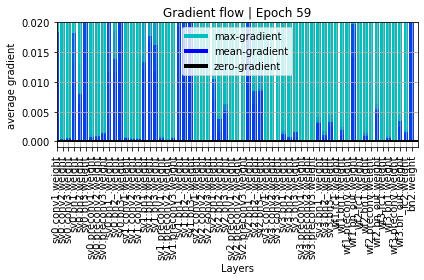

In [24]:
model = model.to(device)

model_folder = '/tf/data/Quan/fer2013/backtobasics/svgg3/'
model_name = 'svgg_resnet'
model_path = os.path.join(model_folder, model_name + '.pt')

best_acc = 0.0
curloss = 0.0
hist = []

for epoch in range(60):  # loop over the dataset multiple times
    
    print('Epoch: ', epoch + 1)
    running_loss = 0.0
    running_acc = 0.0

    # TRAIN
    model.train()
    for i, data in enumerate(train_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)
        loss.backward()
        
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        running_acc += acc
        print('\t - Step %d: loss: %.3f acc: %.3f' % (i+1, loss.item(), acc))

    print('- Avg.loss: %.3f  | Avg.acc: %.3f' % (running_loss / (i+1), running_acc / (i+1)))
    avgloss = running_loss / (i+1)
    avgacc = running_acc / (i+1)
    
    # print gradient flow figure
    plot_grad_flow(model.named_parameters(), epoch,
                   savepath=os.path.join(model_folder, model_name + '_gf' + '_' + str(epoch) + '.png'))

    # EVALUATE
    model.eval()
    running_valloss = 0.0
    running_valacc = 0.0
    for i,data in enumerate(val_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)

        running_valloss += loss.item()
        running_valacc += acc

    print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))

    avgvalloss = running_valloss / (i+1)
    avgvalcc = running_valacc / (i+1)

    hist.append([avgloss, avgvalloss, avgacc, avgvalcc])
    
    if best_acc < (running_valacc / (i+1)):
        best_acc = (running_valacc / (i+1))
        curloss = (running_valloss / (i+1))
        torch.save(model, model_path)
        print('* Update optimal model')

print('Finished Training')

Epoch:  61
	 - Step 1: loss: 1.207 acc: 0.625
	 - Step 2: loss: 1.227 acc: 0.578
	 - Step 3: loss: 1.192 acc: 0.562
	 - Step 4: loss: 1.414 acc: 0.453
	 - Step 5: loss: 1.174 acc: 0.562
	 - Step 6: loss: 1.114 acc: 0.594
	 - Step 7: loss: 1.184 acc: 0.562
	 - Step 8: loss: 1.213 acc: 0.516
	 - Step 9: loss: 1.276 acc: 0.500
	 - Step 10: loss: 1.229 acc: 0.562
	 - Step 11: loss: 1.327 acc: 0.500
	 - Step 12: loss: 1.137 acc: 0.625
	 - Step 13: loss: 1.240 acc: 0.453
	 - Step 14: loss: 1.084 acc: 0.562
	 - Step 15: loss: 1.156 acc: 0.516
	 - Step 16: loss: 1.221 acc: 0.500
	 - Step 17: loss: 1.314 acc: 0.438
	 - Step 18: loss: 1.239 acc: 0.562
	 - Step 19: loss: 1.125 acc: 0.531
	 - Step 20: loss: 1.287 acc: 0.484
	 - Step 21: loss: 1.246 acc: 0.516
	 - Step 22: loss: 1.138 acc: 0.578
	 - Step 23: loss: 1.369 acc: 0.516
	 - Step 24: loss: 1.188 acc: 0.641
	 - Step 25: loss: 1.255 acc: 0.469
	 - Step 26: loss: 1.237 acc: 0.484
	 - Step 27: loss: 1.053 acc: 0.609
	 - Step 28: loss: 1.034 a

	 - Step 228: loss: 1.228 acc: 0.625
	 - Step 229: loss: 1.147 acc: 0.547
	 - Step 230: loss: 1.082 acc: 0.594
	 - Step 231: loss: 1.274 acc: 0.562
	 - Step 232: loss: 1.160 acc: 0.531
	 - Step 233: loss: 0.999 acc: 0.578
	 - Step 234: loss: 1.267 acc: 0.531
	 - Step 235: loss: 1.308 acc: 0.500
	 - Step 236: loss: 1.244 acc: 0.531
	 - Step 237: loss: 1.326 acc: 0.562
	 - Step 238: loss: 1.307 acc: 0.531
	 - Step 239: loss: 1.275 acc: 0.578
	 - Step 240: loss: 1.151 acc: 0.578
	 - Step 241: loss: 1.339 acc: 0.516
	 - Step 242: loss: 1.214 acc: 0.453
	 - Step 243: loss: 1.048 acc: 0.641
	 - Step 244: loss: 1.363 acc: 0.562
	 - Step 245: loss: 1.274 acc: 0.500
	 - Step 246: loss: 1.263 acc: 0.500
	 - Step 247: loss: 1.072 acc: 0.547
	 - Step 248: loss: 1.244 acc: 0.594
	 - Step 249: loss: 1.121 acc: 0.547
	 - Step 250: loss: 1.174 acc: 0.547
	 - Step 251: loss: 1.351 acc: 0.469
	 - Step 252: loss: 1.151 acc: 0.531
	 - Step 253: loss: 1.185 acc: 0.547
	 - Step 254: loss: 1.222 acc: 0.516
	

- Avg. val_loss: 1.224  | Avg. val_acc: 0.532
* Update optimal model
Epoch:  62
	 - Step 1: loss: 1.116 acc: 0.578
	 - Step 2: loss: 1.050 acc: 0.594
	 - Step 3: loss: 0.893 acc: 0.641
	 - Step 4: loss: 0.927 acc: 0.688
	 - Step 5: loss: 1.046 acc: 0.625
	 - Step 6: loss: 1.188 acc: 0.562
	 - Step 7: loss: 1.142 acc: 0.531
	 - Step 8: loss: 1.369 acc: 0.469
	 - Step 9: loss: 1.105 acc: 0.656
	 - Step 10: loss: 1.122 acc: 0.609
	 - Step 11: loss: 1.354 acc: 0.422
	 - Step 12: loss: 1.228 acc: 0.453
	 - Step 13: loss: 1.204 acc: 0.500
	 - Step 14: loss: 1.329 acc: 0.531
	 - Step 15: loss: 1.192 acc: 0.516
	 - Step 16: loss: 1.334 acc: 0.469
	 - Step 17: loss: 1.200 acc: 0.453
	 - Step 18: loss: 1.227 acc: 0.578
	 - Step 19: loss: 1.135 acc: 0.500
	 - Step 20: loss: 1.353 acc: 0.547
	 - Step 21: loss: 1.220 acc: 0.594
	 - Step 22: loss: 1.279 acc: 0.500
	 - Step 23: loss: 1.272 acc: 0.500
	 - Step 24: loss: 1.119 acc: 0.562
	 - Step 25: loss: 1.392 acc: 0.469
	 - Step 26: loss: 1.162 acc:

	 - Step 226: loss: 1.308 acc: 0.562
	 - Step 227: loss: 1.326 acc: 0.547
	 - Step 228: loss: 1.190 acc: 0.562
	 - Step 229: loss: 1.136 acc: 0.578
	 - Step 230: loss: 1.312 acc: 0.547
	 - Step 231: loss: 1.222 acc: 0.500
	 - Step 232: loss: 1.146 acc: 0.547
	 - Step 233: loss: 1.219 acc: 0.531
	 - Step 234: loss: 1.041 acc: 0.609
	 - Step 235: loss: 1.237 acc: 0.547
	 - Step 236: loss: 1.420 acc: 0.453
	 - Step 237: loss: 1.258 acc: 0.484
	 - Step 238: loss: 1.268 acc: 0.469
	 - Step 239: loss: 1.224 acc: 0.562
	 - Step 240: loss: 1.148 acc: 0.516
	 - Step 241: loss: 1.032 acc: 0.594
	 - Step 242: loss: 1.126 acc: 0.594
	 - Step 243: loss: 1.319 acc: 0.453
	 - Step 244: loss: 1.227 acc: 0.516
	 - Step 245: loss: 1.257 acc: 0.469
	 - Step 246: loss: 1.104 acc: 0.578
	 - Step 247: loss: 1.231 acc: 0.484
	 - Step 248: loss: 1.112 acc: 0.547
	 - Step 249: loss: 1.034 acc: 0.578
	 - Step 250: loss: 1.273 acc: 0.562
	 - Step 251: loss: 1.181 acc: 0.547
	 - Step 252: loss: 1.155 acc: 0.531
	

	 - Step 448: loss: 1.305 acc: 0.547
	 - Step 449: loss: 1.143 acc: 0.568
- Avg.loss: 1.209  | Avg.acc: 0.538
- Avg. val_loss: 1.236  | Avg. val_acc: 0.528
Epoch:  63
	 - Step 1: loss: 1.164 acc: 0.641
	 - Step 2: loss: 1.120 acc: 0.531
	 - Step 3: loss: 1.234 acc: 0.484
	 - Step 4: loss: 1.226 acc: 0.500
	 - Step 5: loss: 1.269 acc: 0.484
	 - Step 6: loss: 0.951 acc: 0.641
	 - Step 7: loss: 1.062 acc: 0.547
	 - Step 8: loss: 1.197 acc: 0.562
	 - Step 9: loss: 1.196 acc: 0.516
	 - Step 10: loss: 1.053 acc: 0.562
	 - Step 11: loss: 1.365 acc: 0.516
	 - Step 12: loss: 1.131 acc: 0.609
	 - Step 13: loss: 1.067 acc: 0.641
	 - Step 14: loss: 1.293 acc: 0.547
	 - Step 15: loss: 1.372 acc: 0.453
	 - Step 16: loss: 1.102 acc: 0.516
	 - Step 17: loss: 1.284 acc: 0.516
	 - Step 18: loss: 1.356 acc: 0.516
	 - Step 19: loss: 1.096 acc: 0.547
	 - Step 20: loss: 1.624 acc: 0.344
	 - Step 21: loss: 1.112 acc: 0.562
	 - Step 22: loss: 1.168 acc: 0.609
	 - Step 23: loss: 1.268 acc: 0.500
	 - Step 24: l

	 - Step 223: loss: 1.209 acc: 0.484
	 - Step 224: loss: 1.349 acc: 0.469
	 - Step 225: loss: 1.132 acc: 0.547
	 - Step 226: loss: 1.093 acc: 0.578
	 - Step 227: loss: 1.128 acc: 0.562
	 - Step 228: loss: 1.009 acc: 0.625
	 - Step 229: loss: 1.060 acc: 0.609
	 - Step 230: loss: 1.222 acc: 0.516
	 - Step 231: loss: 1.148 acc: 0.578
	 - Step 232: loss: 1.408 acc: 0.438
	 - Step 233: loss: 1.111 acc: 0.641
	 - Step 234: loss: 1.109 acc: 0.531
	 - Step 235: loss: 1.184 acc: 0.562
	 - Step 236: loss: 1.157 acc: 0.516
	 - Step 237: loss: 1.098 acc: 0.625
	 - Step 238: loss: 1.146 acc: 0.547
	 - Step 239: loss: 1.271 acc: 0.516
	 - Step 240: loss: 1.309 acc: 0.438
	 - Step 241: loss: 1.426 acc: 0.484
	 - Step 242: loss: 1.033 acc: 0.641
	 - Step 243: loss: 1.051 acc: 0.625
	 - Step 244: loss: 1.107 acc: 0.562
	 - Step 245: loss: 1.090 acc: 0.562
	 - Step 246: loss: 1.211 acc: 0.516
	 - Step 247: loss: 1.091 acc: 0.578
	 - Step 248: loss: 1.048 acc: 0.578
	 - Step 249: loss: 1.163 acc: 0.578
	

	 - Step 445: loss: 1.322 acc: 0.406
	 - Step 446: loss: 1.096 acc: 0.531
	 - Step 447: loss: 1.147 acc: 0.547
	 - Step 448: loss: 1.136 acc: 0.609
	 - Step 449: loss: 1.100 acc: 0.486
- Avg.loss: 1.206  | Avg.acc: 0.540
- Avg. val_loss: 1.233  | Avg. val_acc: 0.523
Epoch:  64
	 - Step 1: loss: 1.147 acc: 0.516
	 - Step 2: loss: 1.002 acc: 0.641
	 - Step 3: loss: 1.179 acc: 0.500
	 - Step 4: loss: 1.098 acc: 0.641
	 - Step 5: loss: 1.148 acc: 0.594
	 - Step 6: loss: 1.143 acc: 0.578
	 - Step 7: loss: 1.569 acc: 0.406
	 - Step 8: loss: 1.282 acc: 0.594
	 - Step 9: loss: 1.286 acc: 0.516
	 - Step 10: loss: 1.097 acc: 0.516
	 - Step 11: loss: 1.332 acc: 0.484
	 - Step 12: loss: 1.252 acc: 0.562
	 - Step 13: loss: 1.271 acc: 0.453
	 - Step 14: loss: 1.196 acc: 0.500
	 - Step 15: loss: 1.251 acc: 0.531
	 - Step 16: loss: 1.078 acc: 0.578
	 - Step 17: loss: 1.139 acc: 0.578
	 - Step 18: loss: 1.014 acc: 0.594
	 - Step 19: loss: 1.325 acc: 0.453
	 - Step 20: loss: 1.040 acc: 0.656
	 - Step 21

	 - Step 220: loss: 1.570 acc: 0.438
	 - Step 221: loss: 1.140 acc: 0.609
	 - Step 222: loss: 1.243 acc: 0.516
	 - Step 223: loss: 1.524 acc: 0.375
	 - Step 224: loss: 1.297 acc: 0.500
	 - Step 225: loss: 1.139 acc: 0.594
	 - Step 226: loss: 1.010 acc: 0.625
	 - Step 227: loss: 1.071 acc: 0.641
	 - Step 228: loss: 1.263 acc: 0.562
	 - Step 229: loss: 1.118 acc: 0.531
	 - Step 230: loss: 1.212 acc: 0.531
	 - Step 231: loss: 1.085 acc: 0.609
	 - Step 232: loss: 1.264 acc: 0.484
	 - Step 233: loss: 1.355 acc: 0.438
	 - Step 234: loss: 1.007 acc: 0.688
	 - Step 235: loss: 1.118 acc: 0.562
	 - Step 236: loss: 1.336 acc: 0.469
	 - Step 237: loss: 1.238 acc: 0.531
	 - Step 238: loss: 1.090 acc: 0.547
	 - Step 239: loss: 1.124 acc: 0.547
	 - Step 240: loss: 1.192 acc: 0.578
	 - Step 241: loss: 1.201 acc: 0.516
	 - Step 242: loss: 1.183 acc: 0.578
	 - Step 243: loss: 1.049 acc: 0.609
	 - Step 244: loss: 1.277 acc: 0.469
	 - Step 245: loss: 1.203 acc: 0.547
	 - Step 246: loss: 1.116 acc: 0.547
	

	 - Step 442: loss: 1.301 acc: 0.516
	 - Step 443: loss: 1.142 acc: 0.531
	 - Step 444: loss: 1.252 acc: 0.500
	 - Step 445: loss: 1.143 acc: 0.578
	 - Step 446: loss: 1.250 acc: 0.516
	 - Step 447: loss: 1.254 acc: 0.484
	 - Step 448: loss: 1.159 acc: 0.609
	 - Step 449: loss: 1.099 acc: 0.541
- Avg.loss: 1.203  | Avg.acc: 0.544
- Avg. val_loss: 1.310  | Avg. val_acc: 0.500
Epoch:  65
	 - Step 1: loss: 1.567 acc: 0.422
	 - Step 2: loss: 1.435 acc: 0.422
	 - Step 3: loss: 1.438 acc: 0.422
	 - Step 4: loss: 1.167 acc: 0.516
	 - Step 5: loss: 1.125 acc: 0.609
	 - Step 6: loss: 1.114 acc: 0.609
	 - Step 7: loss: 1.223 acc: 0.531
	 - Step 8: loss: 1.154 acc: 0.594
	 - Step 9: loss: 1.240 acc: 0.500
	 - Step 10: loss: 1.217 acc: 0.578
	 - Step 11: loss: 0.970 acc: 0.609
	 - Step 12: loss: 1.058 acc: 0.625
	 - Step 13: loss: 1.043 acc: 0.672
	 - Step 14: loss: 1.028 acc: 0.656
	 - Step 15: loss: 1.195 acc: 0.562
	 - Step 16: loss: 1.430 acc: 0.438
	 - Step 17: loss: 1.143 acc: 0.578
	 - Step

	 - Step 217: loss: 1.132 acc: 0.578
	 - Step 218: loss: 1.046 acc: 0.656
	 - Step 219: loss: 1.196 acc: 0.484
	 - Step 220: loss: 1.062 acc: 0.656
	 - Step 221: loss: 1.127 acc: 0.531
	 - Step 222: loss: 1.173 acc: 0.484
	 - Step 223: loss: 1.087 acc: 0.688
	 - Step 224: loss: 1.348 acc: 0.500
	 - Step 225: loss: 1.364 acc: 0.422
	 - Step 226: loss: 1.140 acc: 0.547
	 - Step 227: loss: 1.377 acc: 0.547
	 - Step 228: loss: 1.103 acc: 0.594
	 - Step 229: loss: 1.053 acc: 0.625
	 - Step 230: loss: 1.087 acc: 0.578
	 - Step 231: loss: 1.145 acc: 0.531
	 - Step 232: loss: 1.286 acc: 0.453
	 - Step 233: loss: 1.069 acc: 0.594
	 - Step 234: loss: 1.223 acc: 0.516
	 - Step 235: loss: 1.234 acc: 0.516
	 - Step 236: loss: 1.329 acc: 0.484
	 - Step 237: loss: 0.941 acc: 0.656
	 - Step 238: loss: 1.108 acc: 0.625
	 - Step 239: loss: 1.070 acc: 0.625
	 - Step 240: loss: 1.145 acc: 0.594
	 - Step 241: loss: 1.305 acc: 0.531
	 - Step 242: loss: 1.091 acc: 0.625
	 - Step 243: loss: 1.118 acc: 0.516
	

	 - Step 439: loss: 1.174 acc: 0.594
	 - Step 440: loss: 1.066 acc: 0.578
	 - Step 441: loss: 1.389 acc: 0.547
	 - Step 442: loss: 1.024 acc: 0.641
	 - Step 443: loss: 1.137 acc: 0.578
	 - Step 444: loss: 1.058 acc: 0.547
	 - Step 445: loss: 1.056 acc: 0.562
	 - Step 446: loss: 1.289 acc: 0.484
	 - Step 447: loss: 1.236 acc: 0.500
	 - Step 448: loss: 1.188 acc: 0.531
	 - Step 449: loss: 1.125 acc: 0.514
- Avg.loss: 1.204  | Avg.acc: 0.542
- Avg. val_loss: 1.222  | Avg. val_acc: 0.545
* Update optimal model
Epoch:  66
	 - Step 1: loss: 1.127 acc: 0.609
	 - Step 2: loss: 1.076 acc: 0.594
	 - Step 3: loss: 1.086 acc: 0.531
	 - Step 4: loss: 1.401 acc: 0.484
	 - Step 5: loss: 1.241 acc: 0.578
	 - Step 6: loss: 1.121 acc: 0.547
	 - Step 7: loss: 1.346 acc: 0.469
	 - Step 8: loss: 1.183 acc: 0.594
	 - Step 9: loss: 1.231 acc: 0.562
	 - Step 10: loss: 1.261 acc: 0.500
	 - Step 11: loss: 1.158 acc: 0.594
	 - Step 12: loss: 1.206 acc: 0.516
	 - Step 13: loss: 1.187 acc: 0.562
	 - Step 14: loss:

	 - Step 214: loss: 1.254 acc: 0.531
	 - Step 215: loss: 1.358 acc: 0.500
	 - Step 216: loss: 1.129 acc: 0.578
	 - Step 217: loss: 1.347 acc: 0.516
	 - Step 218: loss: 0.907 acc: 0.703
	 - Step 219: loss: 1.475 acc: 0.375
	 - Step 220: loss: 1.240 acc: 0.562
	 - Step 221: loss: 1.424 acc: 0.516
	 - Step 222: loss: 1.058 acc: 0.578
	 - Step 223: loss: 1.314 acc: 0.484
	 - Step 224: loss: 1.353 acc: 0.469
	 - Step 225: loss: 1.208 acc: 0.500
	 - Step 226: loss: 1.261 acc: 0.531
	 - Step 227: loss: 1.051 acc: 0.562
	 - Step 228: loss: 1.097 acc: 0.547
	 - Step 229: loss: 1.127 acc: 0.609
	 - Step 230: loss: 1.148 acc: 0.578
	 - Step 231: loss: 1.136 acc: 0.594
	 - Step 232: loss: 1.064 acc: 0.609
	 - Step 233: loss: 1.267 acc: 0.422
	 - Step 234: loss: 1.290 acc: 0.547
	 - Step 235: loss: 1.118 acc: 0.562
	 - Step 236: loss: 1.227 acc: 0.516
	 - Step 237: loss: 1.109 acc: 0.578
	 - Step 238: loss: 1.224 acc: 0.531
	 - Step 239: loss: 1.327 acc: 0.422
	 - Step 240: loss: 1.133 acc: 0.609
	

	 - Step 436: loss: 1.277 acc: 0.484
	 - Step 437: loss: 1.342 acc: 0.438
	 - Step 438: loss: 1.465 acc: 0.469
	 - Step 439: loss: 1.002 acc: 0.609
	 - Step 440: loss: 1.311 acc: 0.500
	 - Step 441: loss: 1.338 acc: 0.453
	 - Step 442: loss: 1.150 acc: 0.578
	 - Step 443: loss: 1.237 acc: 0.609
	 - Step 444: loss: 1.106 acc: 0.625
	 - Step 445: loss: 1.259 acc: 0.500
	 - Step 446: loss: 1.184 acc: 0.562
	 - Step 447: loss: 1.203 acc: 0.578
	 - Step 448: loss: 1.257 acc: 0.469
	 - Step 449: loss: 1.073 acc: 0.541
- Avg.loss: 1.209  | Avg.acc: 0.540
- Avg. val_loss: 1.256  | Avg. val_acc: 0.512
Epoch:  67
	 - Step 1: loss: 1.097 acc: 0.562
	 - Step 2: loss: 1.255 acc: 0.500
	 - Step 3: loss: 1.328 acc: 0.484
	 - Step 4: loss: 1.278 acc: 0.516
	 - Step 5: loss: 1.234 acc: 0.516
	 - Step 6: loss: 1.211 acc: 0.531
	 - Step 7: loss: 1.262 acc: 0.516
	 - Step 8: loss: 1.183 acc: 0.500
	 - Step 9: loss: 1.335 acc: 0.438
	 - Step 10: loss: 1.431 acc: 0.406
	 - Step 11: loss: 1.104 acc: 0.594
	 

	 - Step 211: loss: 1.255 acc: 0.500
	 - Step 212: loss: 1.214 acc: 0.547
	 - Step 213: loss: 1.167 acc: 0.531
	 - Step 214: loss: 1.105 acc: 0.531
	 - Step 215: loss: 1.055 acc: 0.594
	 - Step 216: loss: 1.118 acc: 0.578
	 - Step 217: loss: 1.238 acc: 0.531
	 - Step 218: loss: 0.987 acc: 0.625
	 - Step 219: loss: 1.286 acc: 0.406
	 - Step 220: loss: 1.229 acc: 0.547
	 - Step 221: loss: 1.377 acc: 0.438
	 - Step 222: loss: 1.080 acc: 0.562
	 - Step 223: loss: 1.391 acc: 0.469
	 - Step 224: loss: 1.307 acc: 0.562
	 - Step 225: loss: 1.223 acc: 0.547
	 - Step 226: loss: 1.304 acc: 0.547
	 - Step 227: loss: 1.151 acc: 0.562
	 - Step 228: loss: 1.024 acc: 0.609
	 - Step 229: loss: 1.031 acc: 0.609
	 - Step 230: loss: 1.292 acc: 0.547
	 - Step 231: loss: 1.388 acc: 0.453
	 - Step 232: loss: 1.121 acc: 0.547
	 - Step 233: loss: 1.068 acc: 0.609
	 - Step 234: loss: 1.128 acc: 0.531
	 - Step 235: loss: 1.245 acc: 0.531
	 - Step 236: loss: 1.330 acc: 0.500
	 - Step 237: loss: 1.179 acc: 0.562
	

	 - Step 433: loss: 1.077 acc: 0.562
	 - Step 434: loss: 1.058 acc: 0.609
	 - Step 435: loss: 1.237 acc: 0.594
	 - Step 436: loss: 1.103 acc: 0.562
	 - Step 437: loss: 1.132 acc: 0.578
	 - Step 438: loss: 0.934 acc: 0.734
	 - Step 439: loss: 1.201 acc: 0.562
	 - Step 440: loss: 1.217 acc: 0.562
	 - Step 441: loss: 1.101 acc: 0.578
	 - Step 442: loss: 1.237 acc: 0.516
	 - Step 443: loss: 1.114 acc: 0.594
	 - Step 444: loss: 1.349 acc: 0.453
	 - Step 445: loss: 1.324 acc: 0.469
	 - Step 446: loss: 1.159 acc: 0.578
	 - Step 447: loss: 1.187 acc: 0.609
	 - Step 448: loss: 1.231 acc: 0.531
	 - Step 449: loss: 1.153 acc: 0.486
- Avg.loss: 1.196  | Avg.acc: 0.542
- Avg. val_loss: 1.262  | Avg. val_acc: 0.515
Epoch:  68
	 - Step 1: loss: 1.185 acc: 0.562
	 - Step 2: loss: 1.015 acc: 0.641
	 - Step 3: loss: 1.259 acc: 0.500
	 - Step 4: loss: 1.255 acc: 0.531
	 - Step 5: loss: 1.172 acc: 0.594
	 - Step 6: loss: 1.015 acc: 0.594
	 - Step 7: loss: 1.292 acc: 0.500
	 - Step 8: loss: 1.099 acc: 0.57

	 - Step 208: loss: 1.238 acc: 0.516
	 - Step 209: loss: 1.174 acc: 0.547
	 - Step 210: loss: 1.244 acc: 0.500
	 - Step 211: loss: 1.109 acc: 0.594
	 - Step 212: loss: 1.113 acc: 0.656
	 - Step 213: loss: 1.280 acc: 0.531
	 - Step 214: loss: 1.240 acc: 0.516
	 - Step 215: loss: 1.386 acc: 0.469
	 - Step 216: loss: 1.310 acc: 0.516
	 - Step 217: loss: 1.213 acc: 0.500
	 - Step 218: loss: 1.408 acc: 0.547
	 - Step 219: loss: 1.457 acc: 0.406
	 - Step 220: loss: 1.190 acc: 0.531
	 - Step 221: loss: 1.241 acc: 0.531
	 - Step 222: loss: 1.063 acc: 0.562
	 - Step 223: loss: 1.442 acc: 0.484
	 - Step 224: loss: 1.175 acc: 0.562
	 - Step 225: loss: 1.053 acc: 0.641
	 - Step 226: loss: 1.166 acc: 0.562
	 - Step 227: loss: 1.560 acc: 0.422
	 - Step 228: loss: 1.242 acc: 0.578
	 - Step 229: loss: 1.069 acc: 0.531
	 - Step 230: loss: 1.085 acc: 0.594
	 - Step 231: loss: 0.980 acc: 0.656
	 - Step 232: loss: 1.111 acc: 0.562
	 - Step 233: loss: 1.338 acc: 0.484
	 - Step 234: loss: 1.308 acc: 0.531
	

	 - Step 430: loss: 1.195 acc: 0.578
	 - Step 431: loss: 1.093 acc: 0.594
	 - Step 432: loss: 1.160 acc: 0.594
	 - Step 433: loss: 0.926 acc: 0.672
	 - Step 434: loss: 1.124 acc: 0.516
	 - Step 435: loss: 1.253 acc: 0.516
	 - Step 436: loss: 1.363 acc: 0.484
	 - Step 437: loss: 1.329 acc: 0.406
	 - Step 438: loss: 1.236 acc: 0.500
	 - Step 439: loss: 1.415 acc: 0.500
	 - Step 440: loss: 1.349 acc: 0.484
	 - Step 441: loss: 1.336 acc: 0.438
	 - Step 442: loss: 1.269 acc: 0.609
	 - Step 443: loss: 1.212 acc: 0.531
	 - Step 444: loss: 1.043 acc: 0.625
	 - Step 445: loss: 1.380 acc: 0.516
	 - Step 446: loss: 1.176 acc: 0.578
	 - Step 447: loss: 1.152 acc: 0.531
	 - Step 448: loss: 1.367 acc: 0.547
	 - Step 449: loss: 1.206 acc: 0.568
- Avg.loss: 1.196  | Avg.acc: 0.544
- Avg. val_loss: 1.250  | Avg. val_acc: 0.515
Epoch:  69
	 - Step 1: loss: 1.138 acc: 0.594
	 - Step 2: loss: 1.230 acc: 0.484
	 - Step 3: loss: 1.252 acc: 0.516
	 - Step 4: loss: 1.310 acc: 0.500
	 - Step 5: loss: 1.294 acc

	 - Step 205: loss: 1.104 acc: 0.594
	 - Step 206: loss: 1.174 acc: 0.500
	 - Step 207: loss: 1.125 acc: 0.516
	 - Step 208: loss: 1.265 acc: 0.484
	 - Step 209: loss: 1.002 acc: 0.672
	 - Step 210: loss: 1.156 acc: 0.531
	 - Step 211: loss: 1.241 acc: 0.578
	 - Step 212: loss: 1.296 acc: 0.484
	 - Step 213: loss: 1.106 acc: 0.656
	 - Step 214: loss: 1.132 acc: 0.609
	 - Step 215: loss: 1.285 acc: 0.484
	 - Step 216: loss: 0.965 acc: 0.625
	 - Step 217: loss: 1.119 acc: 0.562
	 - Step 218: loss: 0.992 acc: 0.703
	 - Step 219: loss: 1.097 acc: 0.562
	 - Step 220: loss: 1.090 acc: 0.547
	 - Step 221: loss: 1.300 acc: 0.547
	 - Step 222: loss: 1.210 acc: 0.547
	 - Step 223: loss: 0.957 acc: 0.688
	 - Step 224: loss: 1.262 acc: 0.531
	 - Step 225: loss: 1.254 acc: 0.484
	 - Step 226: loss: 1.283 acc: 0.484
	 - Step 227: loss: 1.128 acc: 0.609
	 - Step 228: loss: 1.072 acc: 0.625
	 - Step 229: loss: 1.085 acc: 0.562
	 - Step 230: loss: 1.354 acc: 0.484
	 - Step 231: loss: 1.110 acc: 0.609
	

	 - Step 427: loss: 1.135 acc: 0.516
	 - Step 428: loss: 1.204 acc: 0.469
	 - Step 429: loss: 1.396 acc: 0.453
	 - Step 430: loss: 1.142 acc: 0.609
	 - Step 431: loss: 1.191 acc: 0.625
	 - Step 432: loss: 1.054 acc: 0.625
	 - Step 433: loss: 1.202 acc: 0.531
	 - Step 434: loss: 1.160 acc: 0.516
	 - Step 435: loss: 1.079 acc: 0.562
	 - Step 436: loss: 1.327 acc: 0.453
	 - Step 437: loss: 1.346 acc: 0.484
	 - Step 438: loss: 1.115 acc: 0.641
	 - Step 439: loss: 1.064 acc: 0.609
	 - Step 440: loss: 1.114 acc: 0.547
	 - Step 441: loss: 1.184 acc: 0.516
	 - Step 442: loss: 1.448 acc: 0.406
	 - Step 443: loss: 1.283 acc: 0.453
	 - Step 444: loss: 1.194 acc: 0.500
	 - Step 445: loss: 1.243 acc: 0.531
	 - Step 446: loss: 1.109 acc: 0.672
	 - Step 447: loss: 1.259 acc: 0.516
	 - Step 448: loss: 1.270 acc: 0.531
	 - Step 449: loss: 0.983 acc: 0.595
- Avg.loss: 1.199  | Avg.acc: 0.542
- Avg. val_loss: 1.266  | Avg. val_acc: 0.504
Epoch:  70
	 - Step 1: loss: 1.357 acc: 0.438
	 - Step 2: loss: 1.0

	 - Step 202: loss: 1.443 acc: 0.484
	 - Step 203: loss: 1.314 acc: 0.578
	 - Step 204: loss: 1.214 acc: 0.484
	 - Step 205: loss: 1.235 acc: 0.500
	 - Step 206: loss: 1.510 acc: 0.359
	 - Step 207: loss: 1.016 acc: 0.578
	 - Step 208: loss: 1.220 acc: 0.500
	 - Step 209: loss: 1.249 acc: 0.594
	 - Step 210: loss: 1.030 acc: 0.641
	 - Step 211: loss: 1.163 acc: 0.531
	 - Step 212: loss: 1.362 acc: 0.500
	 - Step 213: loss: 1.198 acc: 0.578
	 - Step 214: loss: 1.177 acc: 0.531
	 - Step 215: loss: 1.403 acc: 0.516
	 - Step 216: loss: 1.154 acc: 0.609
	 - Step 217: loss: 1.267 acc: 0.531
	 - Step 218: loss: 1.022 acc: 0.656
	 - Step 219: loss: 1.205 acc: 0.516
	 - Step 220: loss: 1.228 acc: 0.500
	 - Step 221: loss: 1.181 acc: 0.516
	 - Step 222: loss: 1.293 acc: 0.484
	 - Step 223: loss: 1.281 acc: 0.500
	 - Step 224: loss: 1.160 acc: 0.594
	 - Step 225: loss: 1.174 acc: 0.578
	 - Step 226: loss: 1.176 acc: 0.594
	 - Step 227: loss: 1.223 acc: 0.500
	 - Step 228: loss: 1.020 acc: 0.609
	

	 - Step 424: loss: 1.165 acc: 0.578
	 - Step 425: loss: 1.254 acc: 0.531
	 - Step 426: loss: 1.081 acc: 0.578
	 - Step 427: loss: 1.137 acc: 0.516
	 - Step 428: loss: 1.296 acc: 0.469
	 - Step 429: loss: 1.099 acc: 0.641
	 - Step 430: loss: 1.187 acc: 0.562
	 - Step 431: loss: 1.148 acc: 0.500
	 - Step 432: loss: 1.133 acc: 0.531
	 - Step 433: loss: 1.374 acc: 0.469
	 - Step 434: loss: 1.242 acc: 0.531
	 - Step 435: loss: 1.129 acc: 0.625
	 - Step 436: loss: 1.289 acc: 0.516
	 - Step 437: loss: 1.112 acc: 0.594
	 - Step 438: loss: 1.177 acc: 0.500
	 - Step 439: loss: 1.107 acc: 0.641
	 - Step 440: loss: 1.071 acc: 0.641
	 - Step 441: loss: 1.165 acc: 0.578
	 - Step 442: loss: 1.109 acc: 0.594
	 - Step 443: loss: 1.233 acc: 0.500
	 - Step 444: loss: 1.299 acc: 0.438
	 - Step 445: loss: 1.309 acc: 0.500
	 - Step 446: loss: 1.282 acc: 0.547
	 - Step 447: loss: 1.228 acc: 0.594
	 - Step 448: loss: 1.477 acc: 0.469
	 - Step 449: loss: 1.019 acc: 0.649
- Avg.loss: 1.199  | Avg.acc: 0.542
- 

	 - Step 199: loss: 1.283 acc: 0.500
	 - Step 200: loss: 1.533 acc: 0.359
	 - Step 201: loss: 1.366 acc: 0.484
	 - Step 202: loss: 1.438 acc: 0.406
	 - Step 203: loss: 1.142 acc: 0.594
	 - Step 204: loss: 1.126 acc: 0.562
	 - Step 205: loss: 1.087 acc: 0.578
	 - Step 206: loss: 1.537 acc: 0.453
	 - Step 207: loss: 1.033 acc: 0.609
	 - Step 208: loss: 1.299 acc: 0.438
	 - Step 209: loss: 1.193 acc: 0.562
	 - Step 210: loss: 1.150 acc: 0.609
	 - Step 211: loss: 0.995 acc: 0.625
	 - Step 212: loss: 1.002 acc: 0.609
	 - Step 213: loss: 1.197 acc: 0.484
	 - Step 214: loss: 1.196 acc: 0.594
	 - Step 215: loss: 1.306 acc: 0.484
	 - Step 216: loss: 1.024 acc: 0.672
	 - Step 217: loss: 1.275 acc: 0.531
	 - Step 218: loss: 1.244 acc: 0.500
	 - Step 219: loss: 1.266 acc: 0.516
	 - Step 220: loss: 1.336 acc: 0.484
	 - Step 221: loss: 1.204 acc: 0.500
	 - Step 222: loss: 1.064 acc: 0.656
	 - Step 223: loss: 1.136 acc: 0.594
	 - Step 224: loss: 1.220 acc: 0.578
	 - Step 225: loss: 1.287 acc: 0.547
	

	 - Step 421: loss: 1.267 acc: 0.578
	 - Step 422: loss: 1.078 acc: 0.562
	 - Step 423: loss: 1.113 acc: 0.625
	 - Step 424: loss: 1.137 acc: 0.578
	 - Step 425: loss: 1.282 acc: 0.469
	 - Step 426: loss: 1.223 acc: 0.516
	 - Step 427: loss: 1.026 acc: 0.641
	 - Step 428: loss: 1.201 acc: 0.547
	 - Step 429: loss: 1.352 acc: 0.500
	 - Step 430: loss: 1.276 acc: 0.516
	 - Step 431: loss: 1.052 acc: 0.609
	 - Step 432: loss: 1.003 acc: 0.625
	 - Step 433: loss: 1.137 acc: 0.594
	 - Step 434: loss: 1.243 acc: 0.516
	 - Step 435: loss: 1.159 acc: 0.562
	 - Step 436: loss: 1.153 acc: 0.578
	 - Step 437: loss: 1.086 acc: 0.594
	 - Step 438: loss: 1.129 acc: 0.562
	 - Step 439: loss: 1.373 acc: 0.500
	 - Step 440: loss: 1.095 acc: 0.641
	 - Step 441: loss: 1.344 acc: 0.453
	 - Step 442: loss: 1.026 acc: 0.547
	 - Step 443: loss: 1.122 acc: 0.578
	 - Step 444: loss: 1.038 acc: 0.656
	 - Step 445: loss: 1.219 acc: 0.609
	 - Step 446: loss: 1.142 acc: 0.609
	 - Step 447: loss: 1.226 acc: 0.484
	

	 - Step 196: loss: 1.311 acc: 0.516
	 - Step 197: loss: 1.123 acc: 0.594
	 - Step 198: loss: 1.066 acc: 0.578
	 - Step 199: loss: 1.260 acc: 0.516
	 - Step 200: loss: 1.380 acc: 0.391
	 - Step 201: loss: 1.240 acc: 0.531
	 - Step 202: loss: 1.346 acc: 0.484
	 - Step 203: loss: 1.297 acc: 0.547
	 - Step 204: loss: 1.192 acc: 0.453
	 - Step 205: loss: 1.072 acc: 0.578
	 - Step 206: loss: 1.223 acc: 0.562
	 - Step 207: loss: 1.199 acc: 0.578
	 - Step 208: loss: 1.202 acc: 0.578
	 - Step 209: loss: 0.973 acc: 0.641
	 - Step 210: loss: 0.985 acc: 0.625
	 - Step 211: loss: 1.372 acc: 0.484
	 - Step 212: loss: 1.204 acc: 0.516
	 - Step 213: loss: 1.146 acc: 0.609
	 - Step 214: loss: 1.082 acc: 0.625
	 - Step 215: loss: 1.153 acc: 0.625
	 - Step 216: loss: 1.385 acc: 0.438
	 - Step 217: loss: 1.169 acc: 0.547
	 - Step 218: loss: 1.299 acc: 0.516
	 - Step 219: loss: 1.376 acc: 0.438
	 - Step 220: loss: 1.313 acc: 0.500
	 - Step 221: loss: 1.246 acc: 0.609
	 - Step 222: loss: 1.201 acc: 0.562
	

	 - Step 418: loss: 1.245 acc: 0.531
	 - Step 419: loss: 1.284 acc: 0.516
	 - Step 420: loss: 1.048 acc: 0.578
	 - Step 421: loss: 1.143 acc: 0.531
	 - Step 422: loss: 1.241 acc: 0.531
	 - Step 423: loss: 1.424 acc: 0.438
	 - Step 424: loss: 1.044 acc: 0.641
	 - Step 425: loss: 1.248 acc: 0.531
	 - Step 426: loss: 1.384 acc: 0.484
	 - Step 427: loss: 1.218 acc: 0.562
	 - Step 428: loss: 1.084 acc: 0.578
	 - Step 429: loss: 1.188 acc: 0.594
	 - Step 430: loss: 1.180 acc: 0.578
	 - Step 431: loss: 1.210 acc: 0.562
	 - Step 432: loss: 1.384 acc: 0.500
	 - Step 433: loss: 1.172 acc: 0.625
	 - Step 434: loss: 1.466 acc: 0.469
	 - Step 435: loss: 1.141 acc: 0.547
	 - Step 436: loss: 1.211 acc: 0.547
	 - Step 437: loss: 0.906 acc: 0.609
	 - Step 438: loss: 1.066 acc: 0.594
	 - Step 439: loss: 1.275 acc: 0.547
	 - Step 440: loss: 1.286 acc: 0.547
	 - Step 441: loss: 1.423 acc: 0.500
	 - Step 442: loss: 1.507 acc: 0.484
	 - Step 443: loss: 1.250 acc: 0.469
	 - Step 444: loss: 1.395 acc: 0.438
	

	 - Step 193: loss: 1.278 acc: 0.484
	 - Step 194: loss: 1.326 acc: 0.484
	 - Step 195: loss: 0.990 acc: 0.703
	 - Step 196: loss: 1.165 acc: 0.594
	 - Step 197: loss: 1.164 acc: 0.578
	 - Step 198: loss: 1.120 acc: 0.562
	 - Step 199: loss: 1.422 acc: 0.391
	 - Step 200: loss: 1.232 acc: 0.562
	 - Step 201: loss: 1.476 acc: 0.453
	 - Step 202: loss: 1.379 acc: 0.516
	 - Step 203: loss: 1.244 acc: 0.453
	 - Step 204: loss: 1.111 acc: 0.562
	 - Step 205: loss: 1.452 acc: 0.453
	 - Step 206: loss: 1.158 acc: 0.547
	 - Step 207: loss: 1.413 acc: 0.516
	 - Step 208: loss: 1.213 acc: 0.562
	 - Step 209: loss: 1.178 acc: 0.562
	 - Step 210: loss: 1.165 acc: 0.609
	 - Step 211: loss: 1.111 acc: 0.594
	 - Step 212: loss: 1.134 acc: 0.578
	 - Step 213: loss: 1.278 acc: 0.438
	 - Step 214: loss: 1.138 acc: 0.500
	 - Step 215: loss: 1.360 acc: 0.484
	 - Step 216: loss: 1.211 acc: 0.547
	 - Step 217: loss: 1.022 acc: 0.688
	 - Step 218: loss: 1.264 acc: 0.531
	 - Step 219: loss: 1.362 acc: 0.547
	

	 - Step 415: loss: 1.358 acc: 0.422
	 - Step 416: loss: 1.188 acc: 0.562
	 - Step 417: loss: 1.484 acc: 0.469
	 - Step 418: loss: 1.196 acc: 0.484
	 - Step 419: loss: 1.169 acc: 0.531
	 - Step 420: loss: 1.378 acc: 0.500
	 - Step 421: loss: 1.009 acc: 0.609
	 - Step 422: loss: 0.924 acc: 0.672
	 - Step 423: loss: 1.192 acc: 0.578
	 - Step 424: loss: 1.162 acc: 0.531
	 - Step 425: loss: 1.141 acc: 0.641
	 - Step 426: loss: 1.165 acc: 0.516
	 - Step 427: loss: 1.073 acc: 0.516
	 - Step 428: loss: 1.157 acc: 0.578
	 - Step 429: loss: 1.212 acc: 0.500
	 - Step 430: loss: 0.983 acc: 0.594
	 - Step 431: loss: 1.198 acc: 0.594
	 - Step 432: loss: 1.050 acc: 0.656
	 - Step 433: loss: 1.181 acc: 0.578
	 - Step 434: loss: 1.174 acc: 0.547
	 - Step 435: loss: 1.056 acc: 0.656
	 - Step 436: loss: 1.228 acc: 0.516
	 - Step 437: loss: 1.096 acc: 0.609
	 - Step 438: loss: 1.294 acc: 0.531
	 - Step 439: loss: 1.212 acc: 0.531
	 - Step 440: loss: 1.339 acc: 0.484
	 - Step 441: loss: 1.045 acc: 0.578
	

	 - Step 190: loss: 1.240 acc: 0.531
	 - Step 191: loss: 1.137 acc: 0.531
	 - Step 192: loss: 1.031 acc: 0.578
	 - Step 193: loss: 1.455 acc: 0.547
	 - Step 194: loss: 1.016 acc: 0.609
	 - Step 195: loss: 1.181 acc: 0.547
	 - Step 196: loss: 1.236 acc: 0.609
	 - Step 197: loss: 1.085 acc: 0.594
	 - Step 198: loss: 1.258 acc: 0.531
	 - Step 199: loss: 1.352 acc: 0.422
	 - Step 200: loss: 1.290 acc: 0.547
	 - Step 201: loss: 1.209 acc: 0.547
	 - Step 202: loss: 1.102 acc: 0.578
	 - Step 203: loss: 1.290 acc: 0.500
	 - Step 204: loss: 1.038 acc: 0.656
	 - Step 205: loss: 1.182 acc: 0.531
	 - Step 206: loss: 1.332 acc: 0.531
	 - Step 207: loss: 1.130 acc: 0.625
	 - Step 208: loss: 1.154 acc: 0.516
	 - Step 209: loss: 1.214 acc: 0.578
	 - Step 210: loss: 1.250 acc: 0.500
	 - Step 211: loss: 1.098 acc: 0.562
	 - Step 212: loss: 1.097 acc: 0.594
	 - Step 213: loss: 1.430 acc: 0.438
	 - Step 214: loss: 1.251 acc: 0.516
	 - Step 215: loss: 1.289 acc: 0.500
	 - Step 216: loss: 1.270 acc: 0.484
	

	 - Step 412: loss: 1.095 acc: 0.609
	 - Step 413: loss: 1.493 acc: 0.406
	 - Step 414: loss: 1.522 acc: 0.422
	 - Step 415: loss: 1.213 acc: 0.562
	 - Step 416: loss: 1.151 acc: 0.562
	 - Step 417: loss: 1.292 acc: 0.516
	 - Step 418: loss: 1.174 acc: 0.531
	 - Step 419: loss: 1.058 acc: 0.656
	 - Step 420: loss: 1.077 acc: 0.609
	 - Step 421: loss: 1.230 acc: 0.469
	 - Step 422: loss: 1.176 acc: 0.547
	 - Step 423: loss: 1.388 acc: 0.406
	 - Step 424: loss: 1.252 acc: 0.562
	 - Step 425: loss: 1.176 acc: 0.516
	 - Step 426: loss: 0.965 acc: 0.594
	 - Step 427: loss: 1.132 acc: 0.500
	 - Step 428: loss: 1.105 acc: 0.547
	 - Step 429: loss: 1.215 acc: 0.547
	 - Step 430: loss: 1.147 acc: 0.562
	 - Step 431: loss: 1.202 acc: 0.500
	 - Step 432: loss: 1.342 acc: 0.422
	 - Step 433: loss: 1.192 acc: 0.547
	 - Step 434: loss: 1.222 acc: 0.547
	 - Step 435: loss: 1.265 acc: 0.500
	 - Step 436: loss: 1.064 acc: 0.594
	 - Step 437: loss: 1.194 acc: 0.547
	 - Step 438: loss: 1.113 acc: 0.578
	

	 - Step 187: loss: 1.165 acc: 0.562
	 - Step 188: loss: 1.196 acc: 0.516
	 - Step 189: loss: 1.447 acc: 0.438
	 - Step 190: loss: 1.107 acc: 0.625
	 - Step 191: loss: 1.205 acc: 0.469
	 - Step 192: loss: 1.260 acc: 0.547
	 - Step 193: loss: 1.207 acc: 0.547
	 - Step 194: loss: 1.025 acc: 0.625
	 - Step 195: loss: 0.953 acc: 0.672
	 - Step 196: loss: 1.140 acc: 0.500
	 - Step 197: loss: 1.275 acc: 0.438
	 - Step 198: loss: 1.182 acc: 0.547
	 - Step 199: loss: 1.156 acc: 0.672
	 - Step 200: loss: 1.172 acc: 0.609
	 - Step 201: loss: 1.261 acc: 0.500
	 - Step 202: loss: 0.956 acc: 0.625
	 - Step 203: loss: 1.157 acc: 0.562
	 - Step 204: loss: 1.229 acc: 0.562
	 - Step 205: loss: 1.195 acc: 0.516
	 - Step 206: loss: 1.347 acc: 0.469
	 - Step 207: loss: 1.161 acc: 0.594
	 - Step 208: loss: 1.232 acc: 0.547
	 - Step 209: loss: 1.245 acc: 0.500
	 - Step 210: loss: 1.250 acc: 0.516
	 - Step 211: loss: 1.277 acc: 0.578
	 - Step 212: loss: 1.211 acc: 0.562
	 - Step 213: loss: 1.202 acc: 0.516
	

	 - Step 409: loss: 1.256 acc: 0.484
	 - Step 410: loss: 1.138 acc: 0.609
	 - Step 411: loss: 1.312 acc: 0.438
	 - Step 412: loss: 1.227 acc: 0.500
	 - Step 413: loss: 1.127 acc: 0.578
	 - Step 414: loss: 1.183 acc: 0.656
	 - Step 415: loss: 1.124 acc: 0.562
	 - Step 416: loss: 1.247 acc: 0.594
	 - Step 417: loss: 1.062 acc: 0.688
	 - Step 418: loss: 1.042 acc: 0.641
	 - Step 419: loss: 1.350 acc: 0.484
	 - Step 420: loss: 1.233 acc: 0.562
	 - Step 421: loss: 1.376 acc: 0.516
	 - Step 422: loss: 1.262 acc: 0.453
	 - Step 423: loss: 1.386 acc: 0.438
	 - Step 424: loss: 1.040 acc: 0.594
	 - Step 425: loss: 1.054 acc: 0.609
	 - Step 426: loss: 1.094 acc: 0.547
	 - Step 427: loss: 1.240 acc: 0.453
	 - Step 428: loss: 0.999 acc: 0.594
	 - Step 429: loss: 1.337 acc: 0.531
	 - Step 430: loss: 1.131 acc: 0.594
	 - Step 431: loss: 1.073 acc: 0.609
	 - Step 432: loss: 1.233 acc: 0.562
	 - Step 433: loss: 1.235 acc: 0.484
	 - Step 434: loss: 1.228 acc: 0.516
	 - Step 435: loss: 1.257 acc: 0.500
	

	 - Step 184: loss: 1.229 acc: 0.500
	 - Step 185: loss: 1.102 acc: 0.547
	 - Step 186: loss: 1.170 acc: 0.531
	 - Step 187: loss: 1.110 acc: 0.594
	 - Step 188: loss: 1.480 acc: 0.422
	 - Step 189: loss: 1.098 acc: 0.641
	 - Step 190: loss: 1.324 acc: 0.516
	 - Step 191: loss: 1.345 acc: 0.469
	 - Step 192: loss: 1.224 acc: 0.609
	 - Step 193: loss: 1.234 acc: 0.484
	 - Step 194: loss: 1.278 acc: 0.562
	 - Step 195: loss: 1.221 acc: 0.500
	 - Step 196: loss: 1.024 acc: 0.656
	 - Step 197: loss: 1.261 acc: 0.547
	 - Step 198: loss: 1.111 acc: 0.594
	 - Step 199: loss: 1.263 acc: 0.547
	 - Step 200: loss: 1.225 acc: 0.562
	 - Step 201: loss: 1.287 acc: 0.484
	 - Step 202: loss: 1.331 acc: 0.484
	 - Step 203: loss: 1.349 acc: 0.500
	 - Step 204: loss: 1.145 acc: 0.547
	 - Step 205: loss: 1.100 acc: 0.516
	 - Step 206: loss: 0.977 acc: 0.641
	 - Step 207: loss: 1.236 acc: 0.562
	 - Step 208: loss: 1.318 acc: 0.516
	 - Step 209: loss: 1.061 acc: 0.594
	 - Step 210: loss: 1.244 acc: 0.453
	

	 - Step 406: loss: 0.962 acc: 0.641
	 - Step 407: loss: 1.333 acc: 0.500
	 - Step 408: loss: 1.169 acc: 0.531
	 - Step 409: loss: 1.254 acc: 0.562
	 - Step 410: loss: 1.118 acc: 0.594
	 - Step 411: loss: 1.271 acc: 0.453
	 - Step 412: loss: 1.226 acc: 0.484
	 - Step 413: loss: 1.174 acc: 0.484
	 - Step 414: loss: 1.077 acc: 0.578
	 - Step 415: loss: 1.233 acc: 0.516
	 - Step 416: loss: 1.120 acc: 0.688
	 - Step 417: loss: 1.077 acc: 0.594
	 - Step 418: loss: 1.212 acc: 0.500
	 - Step 419: loss: 1.173 acc: 0.578
	 - Step 420: loss: 1.091 acc: 0.609
	 - Step 421: loss: 1.298 acc: 0.562
	 - Step 422: loss: 1.264 acc: 0.516
	 - Step 423: loss: 1.160 acc: 0.500
	 - Step 424: loss: 1.314 acc: 0.500
	 - Step 425: loss: 1.044 acc: 0.609
	 - Step 426: loss: 1.277 acc: 0.547
	 - Step 427: loss: 1.346 acc: 0.516
	 - Step 428: loss: 1.434 acc: 0.422
	 - Step 429: loss: 1.064 acc: 0.625
	 - Step 430: loss: 1.506 acc: 0.469
	 - Step 431: loss: 1.131 acc: 0.531
	 - Step 432: loss: 1.158 acc: 0.469
	

	 - Step 181: loss: 1.199 acc: 0.516
	 - Step 182: loss: 1.129 acc: 0.594
	 - Step 183: loss: 1.203 acc: 0.516
	 - Step 184: loss: 1.375 acc: 0.453
	 - Step 185: loss: 1.107 acc: 0.578
	 - Step 186: loss: 1.154 acc: 0.484
	 - Step 187: loss: 1.348 acc: 0.484
	 - Step 188: loss: 0.999 acc: 0.594
	 - Step 189: loss: 1.343 acc: 0.422
	 - Step 190: loss: 1.248 acc: 0.547
	 - Step 191: loss: 1.350 acc: 0.531
	 - Step 192: loss: 1.268 acc: 0.484
	 - Step 193: loss: 1.233 acc: 0.469
	 - Step 194: loss: 1.397 acc: 0.438
	 - Step 195: loss: 1.183 acc: 0.531
	 - Step 196: loss: 1.193 acc: 0.469
	 - Step 197: loss: 1.411 acc: 0.500
	 - Step 198: loss: 1.251 acc: 0.500
	 - Step 199: loss: 1.168 acc: 0.516
	 - Step 200: loss: 1.108 acc: 0.531
	 - Step 201: loss: 1.232 acc: 0.500
	 - Step 202: loss: 1.206 acc: 0.484
	 - Step 203: loss: 1.128 acc: 0.547
	 - Step 204: loss: 1.386 acc: 0.453
	 - Step 205: loss: 1.226 acc: 0.500
	 - Step 206: loss: 1.405 acc: 0.484
	 - Step 207: loss: 1.086 acc: 0.578
	

	 - Step 403: loss: 1.260 acc: 0.531
	 - Step 404: loss: 1.152 acc: 0.562
	 - Step 405: loss: 1.108 acc: 0.594
	 - Step 406: loss: 1.216 acc: 0.500
	 - Step 407: loss: 1.069 acc: 0.578
	 - Step 408: loss: 1.061 acc: 0.594
	 - Step 409: loss: 1.130 acc: 0.578
	 - Step 410: loss: 1.233 acc: 0.516
	 - Step 411: loss: 1.221 acc: 0.484
	 - Step 412: loss: 1.078 acc: 0.594
	 - Step 413: loss: 1.101 acc: 0.500
	 - Step 414: loss: 1.172 acc: 0.578
	 - Step 415: loss: 1.046 acc: 0.656
	 - Step 416: loss: 1.134 acc: 0.609
	 - Step 417: loss: 1.153 acc: 0.578
	 - Step 418: loss: 1.045 acc: 0.703
	 - Step 419: loss: 1.316 acc: 0.516
	 - Step 420: loss: 1.226 acc: 0.531
	 - Step 421: loss: 1.031 acc: 0.594
	 - Step 422: loss: 1.279 acc: 0.453
	 - Step 423: loss: 1.099 acc: 0.562
	 - Step 424: loss: 1.010 acc: 0.578
	 - Step 425: loss: 1.093 acc: 0.594
	 - Step 426: loss: 1.060 acc: 0.656
	 - Step 427: loss: 1.050 acc: 0.641
	 - Step 428: loss: 1.284 acc: 0.469
	 - Step 429: loss: 1.216 acc: 0.547
	

	 - Step 178: loss: 1.194 acc: 0.531
	 - Step 179: loss: 1.175 acc: 0.531
	 - Step 180: loss: 1.224 acc: 0.562
	 - Step 181: loss: 1.524 acc: 0.406
	 - Step 182: loss: 1.253 acc: 0.531
	 - Step 183: loss: 1.175 acc: 0.547
	 - Step 184: loss: 1.289 acc: 0.453
	 - Step 185: loss: 1.113 acc: 0.594
	 - Step 186: loss: 1.344 acc: 0.500
	 - Step 187: loss: 1.100 acc: 0.641
	 - Step 188: loss: 0.959 acc: 0.641
	 - Step 189: loss: 1.084 acc: 0.594
	 - Step 190: loss: 1.328 acc: 0.469
	 - Step 191: loss: 1.329 acc: 0.484
	 - Step 192: loss: 1.287 acc: 0.516
	 - Step 193: loss: 1.382 acc: 0.484
	 - Step 194: loss: 1.120 acc: 0.547
	 - Step 195: loss: 1.108 acc: 0.578
	 - Step 196: loss: 1.477 acc: 0.406
	 - Step 197: loss: 1.291 acc: 0.438
	 - Step 198: loss: 1.093 acc: 0.594
	 - Step 199: loss: 1.132 acc: 0.594
	 - Step 200: loss: 1.226 acc: 0.547
	 - Step 201: loss: 1.124 acc: 0.562
	 - Step 202: loss: 1.253 acc: 0.438
	 - Step 203: loss: 1.054 acc: 0.656
	 - Step 204: loss: 1.408 acc: 0.453
	

	 - Step 400: loss: 1.085 acc: 0.625
	 - Step 401: loss: 1.162 acc: 0.547
	 - Step 402: loss: 1.055 acc: 0.656
	 - Step 403: loss: 1.238 acc: 0.484
	 - Step 404: loss: 1.189 acc: 0.484
	 - Step 405: loss: 1.147 acc: 0.594
	 - Step 406: loss: 1.084 acc: 0.625
	 - Step 407: loss: 1.375 acc: 0.469
	 - Step 408: loss: 1.247 acc: 0.547
	 - Step 409: loss: 1.485 acc: 0.469
	 - Step 410: loss: 1.194 acc: 0.562
	 - Step 411: loss: 1.182 acc: 0.547
	 - Step 412: loss: 1.141 acc: 0.547
	 - Step 413: loss: 1.193 acc: 0.656
	 - Step 414: loss: 1.050 acc: 0.594
	 - Step 415: loss: 1.252 acc: 0.516
	 - Step 416: loss: 1.291 acc: 0.484
	 - Step 417: loss: 1.000 acc: 0.594
	 - Step 418: loss: 1.129 acc: 0.578
	 - Step 419: loss: 1.232 acc: 0.562
	 - Step 420: loss: 1.215 acc: 0.594
	 - Step 421: loss: 1.070 acc: 0.656
	 - Step 422: loss: 1.184 acc: 0.562
	 - Step 423: loss: 1.147 acc: 0.547
	 - Step 424: loss: 1.208 acc: 0.578
	 - Step 425: loss: 1.143 acc: 0.516
	 - Step 426: loss: 0.970 acc: 0.656
	

	 - Step 175: loss: 1.039 acc: 0.531
	 - Step 176: loss: 1.243 acc: 0.531
	 - Step 177: loss: 1.144 acc: 0.641
	 - Step 178: loss: 1.186 acc: 0.516
	 - Step 179: loss: 1.081 acc: 0.625
	 - Step 180: loss: 1.281 acc: 0.562
	 - Step 181: loss: 1.385 acc: 0.422
	 - Step 182: loss: 1.051 acc: 0.547
	 - Step 183: loss: 1.034 acc: 0.578
	 - Step 184: loss: 0.974 acc: 0.609
	 - Step 185: loss: 1.288 acc: 0.484
	 - Step 186: loss: 1.301 acc: 0.516
	 - Step 187: loss: 1.091 acc: 0.562
	 - Step 188: loss: 1.231 acc: 0.453
	 - Step 189: loss: 1.370 acc: 0.453
	 - Step 190: loss: 1.177 acc: 0.531
	 - Step 191: loss: 1.037 acc: 0.609
	 - Step 192: loss: 1.361 acc: 0.484
	 - Step 193: loss: 1.135 acc: 0.609
	 - Step 194: loss: 1.119 acc: 0.562
	 - Step 195: loss: 0.920 acc: 0.656
	 - Step 196: loss: 1.269 acc: 0.438
	 - Step 197: loss: 1.309 acc: 0.484
	 - Step 198: loss: 1.142 acc: 0.562
	 - Step 199: loss: 1.461 acc: 0.391
	 - Step 200: loss: 1.201 acc: 0.500
	 - Step 201: loss: 1.039 acc: 0.594
	

	 - Step 397: loss: 1.080 acc: 0.609
	 - Step 398: loss: 1.164 acc: 0.562
	 - Step 399: loss: 1.348 acc: 0.469
	 - Step 400: loss: 1.189 acc: 0.562
	 - Step 401: loss: 1.073 acc: 0.609
	 - Step 402: loss: 1.199 acc: 0.562
	 - Step 403: loss: 1.214 acc: 0.453
	 - Step 404: loss: 1.143 acc: 0.594
	 - Step 405: loss: 1.223 acc: 0.547
	 - Step 406: loss: 1.317 acc: 0.469
	 - Step 407: loss: 1.277 acc: 0.500
	 - Step 408: loss: 1.221 acc: 0.578
	 - Step 409: loss: 1.303 acc: 0.453
	 - Step 410: loss: 1.111 acc: 0.578
	 - Step 411: loss: 1.025 acc: 0.578
	 - Step 412: loss: 1.159 acc: 0.578
	 - Step 413: loss: 1.366 acc: 0.516
	 - Step 414: loss: 1.150 acc: 0.547
	 - Step 415: loss: 1.243 acc: 0.500
	 - Step 416: loss: 1.181 acc: 0.500
	 - Step 417: loss: 1.425 acc: 0.531
	 - Step 418: loss: 1.422 acc: 0.422
	 - Step 419: loss: 1.091 acc: 0.625
	 - Step 420: loss: 1.012 acc: 0.609
	 - Step 421: loss: 1.277 acc: 0.484
	 - Step 422: loss: 1.203 acc: 0.500
	 - Step 423: loss: 1.428 acc: 0.453
	

	 - Step 172: loss: 1.074 acc: 0.531
	 - Step 173: loss: 1.606 acc: 0.375
	 - Step 174: loss: 1.284 acc: 0.531
	 - Step 175: loss: 1.255 acc: 0.547
	 - Step 176: loss: 1.296 acc: 0.484
	 - Step 177: loss: 1.154 acc: 0.625
	 - Step 178: loss: 1.257 acc: 0.547
	 - Step 179: loss: 1.095 acc: 0.609
	 - Step 180: loss: 1.261 acc: 0.500
	 - Step 181: loss: 1.173 acc: 0.656
	 - Step 182: loss: 1.024 acc: 0.625
	 - Step 183: loss: 1.300 acc: 0.516
	 - Step 184: loss: 1.124 acc: 0.516
	 - Step 185: loss: 1.265 acc: 0.500
	 - Step 186: loss: 1.174 acc: 0.547
	 - Step 187: loss: 1.279 acc: 0.469
	 - Step 188: loss: 1.278 acc: 0.531
	 - Step 189: loss: 1.323 acc: 0.531
	 - Step 190: loss: 1.304 acc: 0.484
	 - Step 191: loss: 1.194 acc: 0.594
	 - Step 192: loss: 1.241 acc: 0.531
	 - Step 193: loss: 1.193 acc: 0.578
	 - Step 194: loss: 1.031 acc: 0.578
	 - Step 195: loss: 1.248 acc: 0.484
	 - Step 196: loss: 1.279 acc: 0.516
	 - Step 197: loss: 1.175 acc: 0.500
	 - Step 198: loss: 1.160 acc: 0.609
	

	 - Step 394: loss: 1.163 acc: 0.562
	 - Step 395: loss: 1.280 acc: 0.469
	 - Step 396: loss: 1.230 acc: 0.594
	 - Step 397: loss: 1.357 acc: 0.469
	 - Step 398: loss: 1.313 acc: 0.547
	 - Step 399: loss: 1.121 acc: 0.578
	 - Step 400: loss: 1.313 acc: 0.516
	 - Step 401: loss: 1.104 acc: 0.562
	 - Step 402: loss: 1.210 acc: 0.547
	 - Step 403: loss: 1.020 acc: 0.625
	 - Step 404: loss: 1.212 acc: 0.562
	 - Step 405: loss: 1.206 acc: 0.609
	 - Step 406: loss: 1.445 acc: 0.469
	 - Step 407: loss: 1.190 acc: 0.609
	 - Step 408: loss: 1.071 acc: 0.594
	 - Step 409: loss: 1.156 acc: 0.656
	 - Step 410: loss: 1.213 acc: 0.562
	 - Step 411: loss: 1.148 acc: 0.562
	 - Step 412: loss: 1.233 acc: 0.531
	 - Step 413: loss: 1.116 acc: 0.562
	 - Step 414: loss: 1.198 acc: 0.531
	 - Step 415: loss: 1.248 acc: 0.562
	 - Step 416: loss: 1.251 acc: 0.500
	 - Step 417: loss: 1.054 acc: 0.656
	 - Step 418: loss: 1.176 acc: 0.578
	 - Step 419: loss: 1.138 acc: 0.578
	 - Step 420: loss: 1.259 acc: 0.531
	

	 - Step 169: loss: 1.083 acc: 0.609
	 - Step 170: loss: 1.060 acc: 0.578
	 - Step 171: loss: 1.311 acc: 0.562
	 - Step 172: loss: 0.970 acc: 0.656
	 - Step 173: loss: 1.071 acc: 0.641
	 - Step 174: loss: 1.201 acc: 0.484
	 - Step 175: loss: 1.266 acc: 0.469
	 - Step 176: loss: 1.068 acc: 0.531
	 - Step 177: loss: 1.138 acc: 0.453
	 - Step 178: loss: 1.137 acc: 0.578
	 - Step 179: loss: 1.114 acc: 0.531
	 - Step 180: loss: 1.060 acc: 0.609
	 - Step 181: loss: 1.349 acc: 0.453
	 - Step 182: loss: 1.195 acc: 0.594
	 - Step 183: loss: 1.291 acc: 0.547
	 - Step 184: loss: 1.395 acc: 0.438
	 - Step 185: loss: 1.151 acc: 0.516
	 - Step 186: loss: 0.915 acc: 0.766
	 - Step 187: loss: 1.195 acc: 0.500
	 - Step 188: loss: 1.174 acc: 0.578
	 - Step 189: loss: 1.221 acc: 0.516
	 - Step 190: loss: 1.102 acc: 0.562
	 - Step 191: loss: 1.017 acc: 0.594
	 - Step 192: loss: 1.059 acc: 0.609
	 - Step 193: loss: 1.054 acc: 0.594
	 - Step 194: loss: 1.156 acc: 0.516
	 - Step 195: loss: 1.085 acc: 0.578
	

	 - Step 391: loss: 1.168 acc: 0.641
	 - Step 392: loss: 1.179 acc: 0.547
	 - Step 393: loss: 1.099 acc: 0.578
	 - Step 394: loss: 0.931 acc: 0.672
	 - Step 395: loss: 1.120 acc: 0.562
	 - Step 396: loss: 1.189 acc: 0.516
	 - Step 397: loss: 1.360 acc: 0.469
	 - Step 398: loss: 1.211 acc: 0.562
	 - Step 399: loss: 1.064 acc: 0.688
	 - Step 400: loss: 1.209 acc: 0.531
	 - Step 401: loss: 0.792 acc: 0.797
	 - Step 402: loss: 1.261 acc: 0.562
	 - Step 403: loss: 1.354 acc: 0.547
	 - Step 404: loss: 1.262 acc: 0.609
	 - Step 405: loss: 1.203 acc: 0.562
	 - Step 406: loss: 1.106 acc: 0.547
	 - Step 407: loss: 1.131 acc: 0.531
	 - Step 408: loss: 1.218 acc: 0.562
	 - Step 409: loss: 1.103 acc: 0.562
	 - Step 410: loss: 1.304 acc: 0.469
	 - Step 411: loss: 1.346 acc: 0.484
	 - Step 412: loss: 1.252 acc: 0.453
	 - Step 413: loss: 1.576 acc: 0.406
	 - Step 414: loss: 1.177 acc: 0.516
	 - Step 415: loss: 1.218 acc: 0.484
	 - Step 416: loss: 1.288 acc: 0.422
	 - Step 417: loss: 1.069 acc: 0.562
	

	 - Step 166: loss: 1.128 acc: 0.562
	 - Step 167: loss: 1.209 acc: 0.531
	 - Step 168: loss: 1.217 acc: 0.547
	 - Step 169: loss: 1.175 acc: 0.562
	 - Step 170: loss: 1.016 acc: 0.625
	 - Step 171: loss: 1.132 acc: 0.531
	 - Step 172: loss: 1.187 acc: 0.578
	 - Step 173: loss: 1.185 acc: 0.562
	 - Step 174: loss: 1.224 acc: 0.625
	 - Step 175: loss: 1.171 acc: 0.562
	 - Step 176: loss: 1.331 acc: 0.469
	 - Step 177: loss: 1.020 acc: 0.641
	 - Step 178: loss: 1.242 acc: 0.516
	 - Step 179: loss: 1.196 acc: 0.500
	 - Step 180: loss: 1.184 acc: 0.516
	 - Step 181: loss: 1.142 acc: 0.641
	 - Step 182: loss: 1.410 acc: 0.453
	 - Step 183: loss: 1.138 acc: 0.516
	 - Step 184: loss: 1.125 acc: 0.594
	 - Step 185: loss: 1.026 acc: 0.531
	 - Step 186: loss: 1.089 acc: 0.609
	 - Step 187: loss: 1.083 acc: 0.578
	 - Step 188: loss: 1.282 acc: 0.547
	 - Step 189: loss: 1.055 acc: 0.641
	 - Step 190: loss: 1.058 acc: 0.562
	 - Step 191: loss: 1.443 acc: 0.359
	 - Step 192: loss: 1.329 acc: 0.453
	

	 - Step 388: loss: 1.121 acc: 0.609
	 - Step 389: loss: 0.915 acc: 0.719
	 - Step 390: loss: 0.947 acc: 0.672
	 - Step 391: loss: 1.499 acc: 0.406
	 - Step 392: loss: 1.104 acc: 0.531
	 - Step 393: loss: 1.140 acc: 0.594
	 - Step 394: loss: 1.276 acc: 0.609
	 - Step 395: loss: 1.168 acc: 0.516
	 - Step 396: loss: 1.094 acc: 0.531
	 - Step 397: loss: 1.085 acc: 0.547
	 - Step 398: loss: 1.083 acc: 0.641
	 - Step 399: loss: 1.300 acc: 0.531
	 - Step 400: loss: 1.387 acc: 0.469
	 - Step 401: loss: 1.014 acc: 0.578
	 - Step 402: loss: 1.248 acc: 0.438
	 - Step 403: loss: 1.232 acc: 0.516
	 - Step 404: loss: 1.205 acc: 0.500
	 - Step 405: loss: 1.231 acc: 0.516
	 - Step 406: loss: 1.262 acc: 0.500
	 - Step 407: loss: 1.286 acc: 0.453
	 - Step 408: loss: 1.382 acc: 0.547
	 - Step 409: loss: 1.332 acc: 0.438
	 - Step 410: loss: 1.219 acc: 0.578
	 - Step 411: loss: 1.085 acc: 0.594
	 - Step 412: loss: 0.939 acc: 0.641
	 - Step 413: loss: 1.082 acc: 0.594
	 - Step 414: loss: 1.067 acc: 0.625
	

	 - Step 163: loss: 1.168 acc: 0.547
	 - Step 164: loss: 1.101 acc: 0.609
	 - Step 165: loss: 1.278 acc: 0.562
	 - Step 166: loss: 1.145 acc: 0.594
	 - Step 167: loss: 1.047 acc: 0.641
	 - Step 168: loss: 1.421 acc: 0.484
	 - Step 169: loss: 1.122 acc: 0.547
	 - Step 170: loss: 1.213 acc: 0.547
	 - Step 171: loss: 1.328 acc: 0.531
	 - Step 172: loss: 1.410 acc: 0.500
	 - Step 173: loss: 1.134 acc: 0.484
	 - Step 174: loss: 1.171 acc: 0.438
	 - Step 175: loss: 1.140 acc: 0.562
	 - Step 176: loss: 1.133 acc: 0.516
	 - Step 177: loss: 1.094 acc: 0.562
	 - Step 178: loss: 1.165 acc: 0.609
	 - Step 179: loss: 1.186 acc: 0.562
	 - Step 180: loss: 1.194 acc: 0.500
	 - Step 181: loss: 1.166 acc: 0.547
	 - Step 182: loss: 1.009 acc: 0.578
	 - Step 183: loss: 1.028 acc: 0.609
	 - Step 184: loss: 1.126 acc: 0.547
	 - Step 185: loss: 1.223 acc: 0.547
	 - Step 186: loss: 1.293 acc: 0.438
	 - Step 187: loss: 1.074 acc: 0.562
	 - Step 188: loss: 1.092 acc: 0.594
	 - Step 189: loss: 1.115 acc: 0.562
	

	 - Step 385: loss: 1.393 acc: 0.500
	 - Step 386: loss: 1.277 acc: 0.484
	 - Step 387: loss: 1.103 acc: 0.594
	 - Step 388: loss: 1.095 acc: 0.562
	 - Step 389: loss: 1.027 acc: 0.609
	 - Step 390: loss: 1.064 acc: 0.641
	 - Step 391: loss: 1.243 acc: 0.453
	 - Step 392: loss: 1.191 acc: 0.547
	 - Step 393: loss: 1.275 acc: 0.578
	 - Step 394: loss: 1.382 acc: 0.438
	 - Step 395: loss: 1.301 acc: 0.516
	 - Step 396: loss: 1.002 acc: 0.641
	 - Step 397: loss: 1.359 acc: 0.422
	 - Step 398: loss: 1.212 acc: 0.484
	 - Step 399: loss: 1.137 acc: 0.609
	 - Step 400: loss: 1.099 acc: 0.625
	 - Step 401: loss: 1.369 acc: 0.438
	 - Step 402: loss: 1.077 acc: 0.562
	 - Step 403: loss: 1.201 acc: 0.516
	 - Step 404: loss: 1.025 acc: 0.594
	 - Step 405: loss: 1.084 acc: 0.562
	 - Step 406: loss: 1.292 acc: 0.516
	 - Step 407: loss: 1.111 acc: 0.531
	 - Step 408: loss: 1.222 acc: 0.562
	 - Step 409: loss: 1.340 acc: 0.469
	 - Step 410: loss: 1.137 acc: 0.594
	 - Step 411: loss: 1.471 acc: 0.438
	

	 - Step 160: loss: 1.479 acc: 0.438
	 - Step 161: loss: 1.215 acc: 0.531
	 - Step 162: loss: 1.142 acc: 0.562
	 - Step 163: loss: 1.194 acc: 0.609
	 - Step 164: loss: 1.378 acc: 0.469
	 - Step 165: loss: 1.203 acc: 0.531
	 - Step 166: loss: 1.204 acc: 0.516
	 - Step 167: loss: 1.184 acc: 0.562
	 - Step 168: loss: 1.096 acc: 0.578
	 - Step 169: loss: 1.099 acc: 0.625
	 - Step 170: loss: 1.207 acc: 0.578
	 - Step 171: loss: 1.260 acc: 0.547
	 - Step 172: loss: 1.173 acc: 0.562
	 - Step 173: loss: 1.177 acc: 0.578
	 - Step 174: loss: 1.242 acc: 0.562
	 - Step 175: loss: 1.095 acc: 0.609
	 - Step 176: loss: 1.107 acc: 0.531
	 - Step 177: loss: 1.284 acc: 0.531
	 - Step 178: loss: 1.198 acc: 0.531
	 - Step 179: loss: 1.189 acc: 0.531
	 - Step 180: loss: 1.204 acc: 0.562
	 - Step 181: loss: 1.246 acc: 0.484
	 - Step 182: loss: 1.079 acc: 0.547
	 - Step 183: loss: 1.193 acc: 0.578
	 - Step 184: loss: 1.350 acc: 0.500
	 - Step 185: loss: 1.025 acc: 0.609
	 - Step 186: loss: 1.009 acc: 0.609
	

	 - Step 382: loss: 1.144 acc: 0.531
	 - Step 383: loss: 1.076 acc: 0.594
	 - Step 384: loss: 1.269 acc: 0.531
	 - Step 385: loss: 1.117 acc: 0.500
	 - Step 386: loss: 0.971 acc: 0.688
	 - Step 387: loss: 1.129 acc: 0.609
	 - Step 388: loss: 0.928 acc: 0.656
	 - Step 389: loss: 1.197 acc: 0.484
	 - Step 390: loss: 1.227 acc: 0.578
	 - Step 391: loss: 1.130 acc: 0.594
	 - Step 392: loss: 1.095 acc: 0.531
	 - Step 393: loss: 1.178 acc: 0.578
	 - Step 394: loss: 1.032 acc: 0.656
	 - Step 395: loss: 1.190 acc: 0.531
	 - Step 396: loss: 1.076 acc: 0.594
	 - Step 397: loss: 1.099 acc: 0.531
	 - Step 398: loss: 1.245 acc: 0.531
	 - Step 399: loss: 1.078 acc: 0.609
	 - Step 400: loss: 1.141 acc: 0.547
	 - Step 401: loss: 1.086 acc: 0.594
	 - Step 402: loss: 1.302 acc: 0.531
	 - Step 403: loss: 1.365 acc: 0.469
	 - Step 404: loss: 1.078 acc: 0.641
	 - Step 405: loss: 1.248 acc: 0.547
	 - Step 406: loss: 1.016 acc: 0.656
	 - Step 407: loss: 1.043 acc: 0.625
	 - Step 408: loss: 1.038 acc: 0.562
	

	 - Step 157: loss: 1.152 acc: 0.578
	 - Step 158: loss: 1.078 acc: 0.562
	 - Step 159: loss: 1.178 acc: 0.594
	 - Step 160: loss: 1.070 acc: 0.516
	 - Step 161: loss: 1.202 acc: 0.453
	 - Step 162: loss: 1.318 acc: 0.453
	 - Step 163: loss: 1.109 acc: 0.578
	 - Step 164: loss: 1.024 acc: 0.594
	 - Step 165: loss: 1.280 acc: 0.500
	 - Step 166: loss: 1.208 acc: 0.531
	 - Step 167: loss: 1.127 acc: 0.516
	 - Step 168: loss: 1.435 acc: 0.406
	 - Step 169: loss: 1.347 acc: 0.453
	 - Step 170: loss: 1.176 acc: 0.562
	 - Step 171: loss: 1.179 acc: 0.500
	 - Step 172: loss: 1.301 acc: 0.531
	 - Step 173: loss: 1.005 acc: 0.609
	 - Step 174: loss: 1.195 acc: 0.453
	 - Step 175: loss: 0.907 acc: 0.672
	 - Step 176: loss: 0.990 acc: 0.672
	 - Step 177: loss: 1.408 acc: 0.453
	 - Step 178: loss: 1.159 acc: 0.594
	 - Step 179: loss: 1.188 acc: 0.531
	 - Step 180: loss: 1.070 acc: 0.594
	 - Step 181: loss: 1.219 acc: 0.547
	 - Step 182: loss: 0.951 acc: 0.688
	 - Step 183: loss: 1.095 acc: 0.578
	

	 - Step 379: loss: 1.165 acc: 0.516
	 - Step 380: loss: 1.327 acc: 0.516
	 - Step 381: loss: 1.126 acc: 0.562
	 - Step 382: loss: 1.211 acc: 0.562
	 - Step 383: loss: 1.005 acc: 0.641
	 - Step 384: loss: 1.193 acc: 0.516
	 - Step 385: loss: 1.223 acc: 0.422
	 - Step 386: loss: 1.230 acc: 0.609
	 - Step 387: loss: 1.347 acc: 0.516
	 - Step 388: loss: 1.150 acc: 0.562
	 - Step 389: loss: 1.260 acc: 0.531
	 - Step 390: loss: 1.201 acc: 0.562
	 - Step 391: loss: 1.169 acc: 0.469
	 - Step 392: loss: 1.062 acc: 0.562
	 - Step 393: loss: 1.202 acc: 0.547
	 - Step 394: loss: 0.981 acc: 0.719
	 - Step 395: loss: 1.165 acc: 0.562
	 - Step 396: loss: 1.074 acc: 0.609
	 - Step 397: loss: 1.134 acc: 0.594
	 - Step 398: loss: 1.319 acc: 0.469
	 - Step 399: loss: 1.091 acc: 0.578
	 - Step 400: loss: 1.294 acc: 0.516
	 - Step 401: loss: 1.177 acc: 0.484
	 - Step 402: loss: 1.260 acc: 0.562
	 - Step 403: loss: 1.272 acc: 0.562
	 - Step 404: loss: 1.193 acc: 0.500
	 - Step 405: loss: 1.418 acc: 0.516
	

	 - Step 154: loss: 1.123 acc: 0.594
	 - Step 155: loss: 1.193 acc: 0.531
	 - Step 156: loss: 1.083 acc: 0.562
	 - Step 157: loss: 1.503 acc: 0.422
	 - Step 158: loss: 1.169 acc: 0.609
	 - Step 159: loss: 1.358 acc: 0.516
	 - Step 160: loss: 1.016 acc: 0.672
	 - Step 161: loss: 1.340 acc: 0.578
	 - Step 162: loss: 1.227 acc: 0.516
	 - Step 163: loss: 1.199 acc: 0.516
	 - Step 164: loss: 1.155 acc: 0.562
	 - Step 165: loss: 1.222 acc: 0.531
	 - Step 166: loss: 1.263 acc: 0.484
	 - Step 167: loss: 1.242 acc: 0.516
	 - Step 168: loss: 1.178 acc: 0.516
	 - Step 169: loss: 1.276 acc: 0.531
	 - Step 170: loss: 1.145 acc: 0.531
	 - Step 171: loss: 1.065 acc: 0.562
	 - Step 172: loss: 1.316 acc: 0.453
	 - Step 173: loss: 1.376 acc: 0.453
	 - Step 174: loss: 1.513 acc: 0.422
	 - Step 175: loss: 1.203 acc: 0.609
	 - Step 176: loss: 1.270 acc: 0.562
	 - Step 177: loss: 1.143 acc: 0.531
	 - Step 178: loss: 1.163 acc: 0.625
	 - Step 179: loss: 1.104 acc: 0.594
	 - Step 180: loss: 1.034 acc: 0.578
	

	 - Step 376: loss: 1.228 acc: 0.531
	 - Step 377: loss: 1.425 acc: 0.469
	 - Step 378: loss: 1.309 acc: 0.516
	 - Step 379: loss: 1.339 acc: 0.484
	 - Step 380: loss: 1.245 acc: 0.484
	 - Step 381: loss: 1.195 acc: 0.547
	 - Step 382: loss: 1.256 acc: 0.469
	 - Step 383: loss: 1.228 acc: 0.531
	 - Step 384: loss: 1.385 acc: 0.484
	 - Step 385: loss: 1.152 acc: 0.609
	 - Step 386: loss: 1.082 acc: 0.672
	 - Step 387: loss: 1.194 acc: 0.516
	 - Step 388: loss: 1.198 acc: 0.547
	 - Step 389: loss: 1.160 acc: 0.609
	 - Step 390: loss: 1.203 acc: 0.547
	 - Step 391: loss: 1.182 acc: 0.516
	 - Step 392: loss: 1.153 acc: 0.594
	 - Step 393: loss: 1.110 acc: 0.625
	 - Step 394: loss: 1.278 acc: 0.375
	 - Step 395: loss: 1.383 acc: 0.500
	 - Step 396: loss: 1.117 acc: 0.578
	 - Step 397: loss: 1.653 acc: 0.391
	 - Step 398: loss: 1.219 acc: 0.500
	 - Step 399: loss: 1.410 acc: 0.484
	 - Step 400: loss: 0.990 acc: 0.656
	 - Step 401: loss: 1.139 acc: 0.609
	 - Step 402: loss: 1.164 acc: 0.578
	

	 - Step 151: loss: 1.204 acc: 0.469
	 - Step 152: loss: 1.199 acc: 0.578
	 - Step 153: loss: 1.285 acc: 0.562
	 - Step 154: loss: 1.420 acc: 0.422
	 - Step 155: loss: 1.283 acc: 0.516
	 - Step 156: loss: 1.405 acc: 0.375
	 - Step 157: loss: 1.496 acc: 0.500
	 - Step 158: loss: 1.178 acc: 0.562
	 - Step 159: loss: 1.116 acc: 0.578
	 - Step 160: loss: 1.146 acc: 0.531
	 - Step 161: loss: 1.193 acc: 0.531
	 - Step 162: loss: 1.174 acc: 0.531
	 - Step 163: loss: 1.278 acc: 0.500
	 - Step 164: loss: 1.308 acc: 0.625
	 - Step 165: loss: 1.067 acc: 0.609
	 - Step 166: loss: 1.081 acc: 0.562
	 - Step 167: loss: 1.266 acc: 0.516
	 - Step 168: loss: 1.277 acc: 0.453
	 - Step 169: loss: 1.254 acc: 0.516
	 - Step 170: loss: 1.292 acc: 0.500
	 - Step 171: loss: 1.156 acc: 0.531
	 - Step 172: loss: 1.244 acc: 0.438
	 - Step 173: loss: 1.164 acc: 0.594
	 - Step 174: loss: 1.035 acc: 0.594
	 - Step 175: loss: 1.095 acc: 0.578
	 - Step 176: loss: 1.390 acc: 0.562
	 - Step 177: loss: 1.214 acc: 0.500
	

	 - Step 373: loss: 1.215 acc: 0.531
	 - Step 374: loss: 1.379 acc: 0.516
	 - Step 375: loss: 1.104 acc: 0.578
	 - Step 376: loss: 1.128 acc: 0.641
	 - Step 377: loss: 1.187 acc: 0.609
	 - Step 378: loss: 1.158 acc: 0.609
	 - Step 379: loss: 1.067 acc: 0.531
	 - Step 380: loss: 1.081 acc: 0.625
	 - Step 381: loss: 1.080 acc: 0.562
	 - Step 382: loss: 1.030 acc: 0.594
	 - Step 383: loss: 1.153 acc: 0.516
	 - Step 384: loss: 1.117 acc: 0.562
	 - Step 385: loss: 1.078 acc: 0.594
	 - Step 386: loss: 1.266 acc: 0.594
	 - Step 387: loss: 1.111 acc: 0.594
	 - Step 388: loss: 1.222 acc: 0.469
	 - Step 389: loss: 1.182 acc: 0.469
	 - Step 390: loss: 1.231 acc: 0.547
	 - Step 391: loss: 1.099 acc: 0.547
	 - Step 392: loss: 1.007 acc: 0.672
	 - Step 393: loss: 1.240 acc: 0.391
	 - Step 394: loss: 1.201 acc: 0.516
	 - Step 395: loss: 1.194 acc: 0.516
	 - Step 396: loss: 1.125 acc: 0.547
	 - Step 397: loss: 1.208 acc: 0.547
	 - Step 398: loss: 1.182 acc: 0.547
	 - Step 399: loss: 1.323 acc: 0.453
	

	 - Step 148: loss: 1.050 acc: 0.594
	 - Step 149: loss: 1.059 acc: 0.578
	 - Step 150: loss: 1.086 acc: 0.625
	 - Step 151: loss: 1.235 acc: 0.531
	 - Step 152: loss: 0.998 acc: 0.672
	 - Step 153: loss: 1.279 acc: 0.453
	 - Step 154: loss: 1.018 acc: 0.531
	 - Step 155: loss: 1.169 acc: 0.469
	 - Step 156: loss: 1.253 acc: 0.438
	 - Step 157: loss: 1.245 acc: 0.547
	 - Step 158: loss: 1.150 acc: 0.547
	 - Step 159: loss: 1.282 acc: 0.500
	 - Step 160: loss: 1.123 acc: 0.562
	 - Step 161: loss: 1.190 acc: 0.594
	 - Step 162: loss: 1.437 acc: 0.484
	 - Step 163: loss: 1.241 acc: 0.562
	 - Step 164: loss: 1.082 acc: 0.578
	 - Step 165: loss: 0.998 acc: 0.703
	 - Step 166: loss: 1.299 acc: 0.531
	 - Step 167: loss: 1.277 acc: 0.500
	 - Step 168: loss: 1.128 acc: 0.562
	 - Step 169: loss: 1.226 acc: 0.562
	 - Step 170: loss: 1.224 acc: 0.516
	 - Step 171: loss: 1.199 acc: 0.516
	 - Step 172: loss: 1.375 acc: 0.484
	 - Step 173: loss: 1.058 acc: 0.656
	 - Step 174: loss: 1.314 acc: 0.438
	

	 - Step 370: loss: 1.219 acc: 0.531
	 - Step 371: loss: 1.323 acc: 0.453
	 - Step 372: loss: 1.259 acc: 0.547
	 - Step 373: loss: 1.012 acc: 0.625
	 - Step 374: loss: 1.227 acc: 0.484
	 - Step 375: loss: 1.142 acc: 0.562
	 - Step 376: loss: 1.062 acc: 0.656
	 - Step 377: loss: 1.102 acc: 0.578
	 - Step 378: loss: 1.464 acc: 0.406
	 - Step 379: loss: 1.301 acc: 0.453
	 - Step 380: loss: 1.236 acc: 0.562
	 - Step 381: loss: 1.256 acc: 0.516
	 - Step 382: loss: 1.262 acc: 0.469
	 - Step 383: loss: 1.098 acc: 0.562
	 - Step 384: loss: 1.298 acc: 0.500
	 - Step 385: loss: 1.229 acc: 0.531
	 - Step 386: loss: 1.207 acc: 0.547
	 - Step 387: loss: 1.204 acc: 0.594
	 - Step 388: loss: 1.314 acc: 0.500
	 - Step 389: loss: 1.140 acc: 0.578
	 - Step 390: loss: 1.104 acc: 0.609
	 - Step 391: loss: 1.056 acc: 0.562
	 - Step 392: loss: 1.174 acc: 0.609
	 - Step 393: loss: 1.212 acc: 0.531
	 - Step 394: loss: 0.937 acc: 0.672
	 - Step 395: loss: 1.332 acc: 0.531
	 - Step 396: loss: 0.999 acc: 0.531
	

	 - Step 145: loss: 1.133 acc: 0.609
	 - Step 146: loss: 1.042 acc: 0.641
	 - Step 147: loss: 1.074 acc: 0.625
	 - Step 148: loss: 1.226 acc: 0.547
	 - Step 149: loss: 1.280 acc: 0.484
	 - Step 150: loss: 1.332 acc: 0.469
	 - Step 151: loss: 1.234 acc: 0.641
	 - Step 152: loss: 1.115 acc: 0.594
	 - Step 153: loss: 1.116 acc: 0.547
	 - Step 154: loss: 1.005 acc: 0.688
	 - Step 155: loss: 1.638 acc: 0.391
	 - Step 156: loss: 1.096 acc: 0.578
	 - Step 157: loss: 1.110 acc: 0.578
	 - Step 158: loss: 1.251 acc: 0.438
	 - Step 159: loss: 1.127 acc: 0.625
	 - Step 160: loss: 1.014 acc: 0.562
	 - Step 161: loss: 1.228 acc: 0.516
	 - Step 162: loss: 1.217 acc: 0.562
	 - Step 163: loss: 1.168 acc: 0.531
	 - Step 164: loss: 1.127 acc: 0.609
	 - Step 165: loss: 1.320 acc: 0.453
	 - Step 166: loss: 1.106 acc: 0.547
	 - Step 167: loss: 0.925 acc: 0.672
	 - Step 168: loss: 1.113 acc: 0.594
	 - Step 169: loss: 1.073 acc: 0.594
	 - Step 170: loss: 1.147 acc: 0.547
	 - Step 171: loss: 1.139 acc: 0.562
	

	 - Step 367: loss: 1.194 acc: 0.531
	 - Step 368: loss: 1.106 acc: 0.594
	 - Step 369: loss: 1.352 acc: 0.484
	 - Step 370: loss: 0.954 acc: 0.609
	 - Step 371: loss: 1.169 acc: 0.594
	 - Step 372: loss: 1.255 acc: 0.500
	 - Step 373: loss: 1.161 acc: 0.531
	 - Step 374: loss: 1.178 acc: 0.609
	 - Step 375: loss: 0.987 acc: 0.625
	 - Step 376: loss: 1.275 acc: 0.531
	 - Step 377: loss: 1.032 acc: 0.625
	 - Step 378: loss: 1.185 acc: 0.453
	 - Step 379: loss: 1.211 acc: 0.484
	 - Step 380: loss: 1.157 acc: 0.547
	 - Step 381: loss: 1.118 acc: 0.547
	 - Step 382: loss: 1.095 acc: 0.656
	 - Step 383: loss: 1.189 acc: 0.516
	 - Step 384: loss: 1.110 acc: 0.578
	 - Step 385: loss: 1.249 acc: 0.516
	 - Step 386: loss: 1.121 acc: 0.531
	 - Step 387: loss: 1.046 acc: 0.641
	 - Step 388: loss: 0.927 acc: 0.672
	 - Step 389: loss: 0.952 acc: 0.719
	 - Step 390: loss: 1.182 acc: 0.500
	 - Step 391: loss: 1.077 acc: 0.562
	 - Step 392: loss: 1.089 acc: 0.609
	 - Step 393: loss: 1.089 acc: 0.531
	

	 - Step 142: loss: 1.384 acc: 0.500
	 - Step 143: loss: 1.194 acc: 0.516
	 - Step 144: loss: 1.150 acc: 0.531
	 - Step 145: loss: 1.369 acc: 0.438
	 - Step 146: loss: 1.209 acc: 0.484
	 - Step 147: loss: 1.335 acc: 0.531
	 - Step 148: loss: 1.451 acc: 0.469
	 - Step 149: loss: 1.087 acc: 0.578
	 - Step 150: loss: 1.187 acc: 0.547
	 - Step 151: loss: 1.152 acc: 0.500
	 - Step 152: loss: 1.262 acc: 0.594
	 - Step 153: loss: 1.426 acc: 0.438
	 - Step 154: loss: 1.175 acc: 0.547
	 - Step 155: loss: 1.192 acc: 0.562
	 - Step 156: loss: 0.972 acc: 0.672
	 - Step 157: loss: 1.212 acc: 0.500
	 - Step 158: loss: 1.156 acc: 0.516
	 - Step 159: loss: 1.086 acc: 0.609
	 - Step 160: loss: 1.187 acc: 0.594
	 - Step 161: loss: 1.007 acc: 0.641
	 - Step 162: loss: 1.367 acc: 0.422
	 - Step 163: loss: 1.191 acc: 0.547
	 - Step 164: loss: 1.186 acc: 0.484
	 - Step 165: loss: 1.009 acc: 0.656
	 - Step 166: loss: 1.434 acc: 0.453
	 - Step 167: loss: 1.222 acc: 0.516
	 - Step 168: loss: 1.081 acc: 0.547
	

	 - Step 364: loss: 0.955 acc: 0.656
	 - Step 365: loss: 1.143 acc: 0.594
	 - Step 366: loss: 0.958 acc: 0.594
	 - Step 367: loss: 1.133 acc: 0.562
	 - Step 368: loss: 1.224 acc: 0.500
	 - Step 369: loss: 1.121 acc: 0.562
	 - Step 370: loss: 1.128 acc: 0.547
	 - Step 371: loss: 1.164 acc: 0.516
	 - Step 372: loss: 1.043 acc: 0.594
	 - Step 373: loss: 1.030 acc: 0.562
	 - Step 374: loss: 1.174 acc: 0.578
	 - Step 375: loss: 1.255 acc: 0.531
	 - Step 376: loss: 1.123 acc: 0.562
	 - Step 377: loss: 1.233 acc: 0.531
	 - Step 378: loss: 1.336 acc: 0.453
	 - Step 379: loss: 1.248 acc: 0.516
	 - Step 380: loss: 1.298 acc: 0.562
	 - Step 381: loss: 1.249 acc: 0.484
	 - Step 382: loss: 1.187 acc: 0.484
	 - Step 383: loss: 1.094 acc: 0.594
	 - Step 384: loss: 1.093 acc: 0.578
	 - Step 385: loss: 1.120 acc: 0.625
	 - Step 386: loss: 1.040 acc: 0.609
	 - Step 387: loss: 1.353 acc: 0.469
	 - Step 388: loss: 1.359 acc: 0.484
	 - Step 389: loss: 1.220 acc: 0.500
	 - Step 390: loss: 1.129 acc: 0.609
	

	 - Step 139: loss: 1.118 acc: 0.641
	 - Step 140: loss: 1.443 acc: 0.500
	 - Step 141: loss: 1.133 acc: 0.484
	 - Step 142: loss: 1.304 acc: 0.453
	 - Step 143: loss: 1.078 acc: 0.641
	 - Step 144: loss: 1.183 acc: 0.547
	 - Step 145: loss: 1.148 acc: 0.516
	 - Step 146: loss: 1.217 acc: 0.516
	 - Step 147: loss: 0.874 acc: 0.703
	 - Step 148: loss: 1.152 acc: 0.531
	 - Step 149: loss: 1.316 acc: 0.484
	 - Step 150: loss: 1.053 acc: 0.562
	 - Step 151: loss: 0.987 acc: 0.625
	 - Step 152: loss: 1.347 acc: 0.406
	 - Step 153: loss: 1.081 acc: 0.531
	 - Step 154: loss: 1.200 acc: 0.562
	 - Step 155: loss: 1.492 acc: 0.469
	 - Step 156: loss: 1.103 acc: 0.609
	 - Step 157: loss: 1.184 acc: 0.594
	 - Step 158: loss: 1.038 acc: 0.625
	 - Step 159: loss: 1.025 acc: 0.531
	 - Step 160: loss: 1.182 acc: 0.516
	 - Step 161: loss: 1.050 acc: 0.594
	 - Step 162: loss: 1.136 acc: 0.547
	 - Step 163: loss: 1.103 acc: 0.625
	 - Step 164: loss: 0.992 acc: 0.656
	 - Step 165: loss: 1.039 acc: 0.609
	

	 - Step 361: loss: 1.202 acc: 0.500
	 - Step 362: loss: 1.171 acc: 0.609
	 - Step 363: loss: 1.279 acc: 0.547
	 - Step 364: loss: 1.146 acc: 0.578
	 - Step 365: loss: 1.277 acc: 0.531
	 - Step 366: loss: 1.371 acc: 0.469
	 - Step 367: loss: 1.224 acc: 0.531
	 - Step 368: loss: 1.069 acc: 0.578
	 - Step 369: loss: 0.966 acc: 0.625
	 - Step 370: loss: 1.087 acc: 0.625
	 - Step 371: loss: 1.299 acc: 0.469
	 - Step 372: loss: 1.094 acc: 0.625
	 - Step 373: loss: 1.236 acc: 0.484
	 - Step 374: loss: 1.137 acc: 0.500
	 - Step 375: loss: 1.503 acc: 0.453
	 - Step 376: loss: 1.235 acc: 0.516
	 - Step 377: loss: 1.122 acc: 0.500
	 - Step 378: loss: 1.252 acc: 0.469
	 - Step 379: loss: 1.009 acc: 0.578
	 - Step 380: loss: 1.225 acc: 0.484
	 - Step 381: loss: 1.231 acc: 0.469
	 - Step 382: loss: 1.379 acc: 0.406
	 - Step 383: loss: 1.125 acc: 0.625
	 - Step 384: loss: 1.170 acc: 0.594
	 - Step 385: loss: 1.027 acc: 0.547
	 - Step 386: loss: 1.125 acc: 0.516
	 - Step 387: loss: 1.145 acc: 0.547
	

	 - Step 136: loss: 1.080 acc: 0.656
	 - Step 137: loss: 1.145 acc: 0.609
	 - Step 138: loss: 1.010 acc: 0.641
	 - Step 139: loss: 1.200 acc: 0.500
	 - Step 140: loss: 1.156 acc: 0.531
	 - Step 141: loss: 1.261 acc: 0.516
	 - Step 142: loss: 1.176 acc: 0.625
	 - Step 143: loss: 1.202 acc: 0.531
	 - Step 144: loss: 1.102 acc: 0.609
	 - Step 145: loss: 1.149 acc: 0.562
	 - Step 146: loss: 1.470 acc: 0.469
	 - Step 147: loss: 1.247 acc: 0.547
	 - Step 148: loss: 1.262 acc: 0.531
	 - Step 149: loss: 1.416 acc: 0.516
	 - Step 150: loss: 1.102 acc: 0.625
	 - Step 151: loss: 1.193 acc: 0.562
	 - Step 152: loss: 1.156 acc: 0.562
	 - Step 153: loss: 1.168 acc: 0.547
	 - Step 154: loss: 1.234 acc: 0.562
	 - Step 155: loss: 1.183 acc: 0.500
	 - Step 156: loss: 1.165 acc: 0.578
	 - Step 157: loss: 1.226 acc: 0.516
	 - Step 158: loss: 1.146 acc: 0.609
	 - Step 159: loss: 1.351 acc: 0.578
	 - Step 160: loss: 1.064 acc: 0.609
	 - Step 161: loss: 1.138 acc: 0.531
	 - Step 162: loss: 1.008 acc: 0.656
	

	 - Step 358: loss: 1.257 acc: 0.547
	 - Step 359: loss: 1.190 acc: 0.453
	 - Step 360: loss: 1.341 acc: 0.484
	 - Step 361: loss: 1.031 acc: 0.609
	 - Step 362: loss: 1.230 acc: 0.609
	 - Step 363: loss: 1.235 acc: 0.516
	 - Step 364: loss: 1.038 acc: 0.641
	 - Step 365: loss: 1.297 acc: 0.500
	 - Step 366: loss: 1.125 acc: 0.562
	 - Step 367: loss: 1.242 acc: 0.531
	 - Step 368: loss: 1.351 acc: 0.469
	 - Step 369: loss: 1.161 acc: 0.562
	 - Step 370: loss: 1.173 acc: 0.547
	 - Step 371: loss: 1.083 acc: 0.578
	 - Step 372: loss: 1.172 acc: 0.562
	 - Step 373: loss: 1.207 acc: 0.531
	 - Step 374: loss: 0.997 acc: 0.609
	 - Step 375: loss: 1.070 acc: 0.562
	 - Step 376: loss: 1.143 acc: 0.578
	 - Step 377: loss: 1.075 acc: 0.578
	 - Step 378: loss: 1.268 acc: 0.500
	 - Step 379: loss: 1.125 acc: 0.547
	 - Step 380: loss: 1.052 acc: 0.625
	 - Step 381: loss: 1.094 acc: 0.547
	 - Step 382: loss: 1.183 acc: 0.531
	 - Step 383: loss: 1.039 acc: 0.562
	 - Step 384: loss: 1.126 acc: 0.578
	

	 - Step 133: loss: 1.068 acc: 0.500
	 - Step 134: loss: 1.123 acc: 0.625
	 - Step 135: loss: 1.067 acc: 0.625
	 - Step 136: loss: 1.158 acc: 0.547
	 - Step 137: loss: 1.108 acc: 0.516
	 - Step 138: loss: 0.923 acc: 0.703
	 - Step 139: loss: 1.113 acc: 0.531
	 - Step 140: loss: 1.061 acc: 0.578
	 - Step 141: loss: 1.130 acc: 0.547
	 - Step 142: loss: 1.310 acc: 0.453
	 - Step 143: loss: 0.992 acc: 0.578
	 - Step 144: loss: 1.140 acc: 0.562
	 - Step 145: loss: 1.232 acc: 0.547
	 - Step 146: loss: 1.295 acc: 0.484
	 - Step 147: loss: 1.139 acc: 0.531
	 - Step 148: loss: 1.153 acc: 0.594
	 - Step 149: loss: 1.180 acc: 0.547
	 - Step 150: loss: 1.216 acc: 0.500
	 - Step 151: loss: 1.315 acc: 0.516
	 - Step 152: loss: 1.216 acc: 0.578
	 - Step 153: loss: 1.182 acc: 0.531
	 - Step 154: loss: 0.924 acc: 0.656
	 - Step 155: loss: 1.164 acc: 0.500
	 - Step 156: loss: 1.058 acc: 0.625
	 - Step 157: loss: 1.248 acc: 0.516
	 - Step 158: loss: 1.134 acc: 0.547
	 - Step 159: loss: 1.324 acc: 0.469
	

	 - Step 355: loss: 1.321 acc: 0.453
	 - Step 356: loss: 1.146 acc: 0.656
	 - Step 357: loss: 1.029 acc: 0.656
	 - Step 358: loss: 1.041 acc: 0.594
	 - Step 359: loss: 1.329 acc: 0.469
	 - Step 360: loss: 1.136 acc: 0.562
	 - Step 361: loss: 1.005 acc: 0.562
	 - Step 362: loss: 1.209 acc: 0.484
	 - Step 363: loss: 1.101 acc: 0.594
	 - Step 364: loss: 1.205 acc: 0.516
	 - Step 365: loss: 1.200 acc: 0.562
	 - Step 366: loss: 1.274 acc: 0.484
	 - Step 367: loss: 1.086 acc: 0.547
	 - Step 368: loss: 1.313 acc: 0.516
	 - Step 369: loss: 1.121 acc: 0.516
	 - Step 370: loss: 1.176 acc: 0.469
	 - Step 371: loss: 1.023 acc: 0.672
	 - Step 372: loss: 1.478 acc: 0.484
	 - Step 373: loss: 1.133 acc: 0.562
	 - Step 374: loss: 1.099 acc: 0.594
	 - Step 375: loss: 1.277 acc: 0.469
	 - Step 376: loss: 1.216 acc: 0.547
	 - Step 377: loss: 1.037 acc: 0.609
	 - Step 378: loss: 1.253 acc: 0.500
	 - Step 379: loss: 1.070 acc: 0.641
	 - Step 380: loss: 1.235 acc: 0.500
	 - Step 381: loss: 1.305 acc: 0.469
	

	 - Step 130: loss: 1.343 acc: 0.516
	 - Step 131: loss: 1.092 acc: 0.609
	 - Step 132: loss: 1.273 acc: 0.500
	 - Step 133: loss: 1.295 acc: 0.516
	 - Step 134: loss: 1.328 acc: 0.500
	 - Step 135: loss: 1.206 acc: 0.547
	 - Step 136: loss: 1.043 acc: 0.516
	 - Step 137: loss: 0.963 acc: 0.703
	 - Step 138: loss: 1.015 acc: 0.594
	 - Step 139: loss: 1.303 acc: 0.453
	 - Step 140: loss: 1.165 acc: 0.547
	 - Step 141: loss: 1.093 acc: 0.609
	 - Step 142: loss: 1.034 acc: 0.562
	 - Step 143: loss: 1.052 acc: 0.609
	 - Step 144: loss: 1.197 acc: 0.578
	 - Step 145: loss: 1.095 acc: 0.609
	 - Step 146: loss: 1.244 acc: 0.516
	 - Step 147: loss: 1.063 acc: 0.578
	 - Step 148: loss: 1.092 acc: 0.625
	 - Step 149: loss: 1.189 acc: 0.469
	 - Step 150: loss: 1.246 acc: 0.516
	 - Step 151: loss: 1.202 acc: 0.484
	 - Step 152: loss: 1.036 acc: 0.609
	 - Step 153: loss: 1.181 acc: 0.531
	 - Step 154: loss: 1.240 acc: 0.469
	 - Step 155: loss: 1.107 acc: 0.562
	 - Step 156: loss: 1.139 acc: 0.500
	

	 - Step 352: loss: 1.216 acc: 0.594
	 - Step 353: loss: 1.243 acc: 0.500
	 - Step 354: loss: 1.021 acc: 0.625
	 - Step 355: loss: 1.163 acc: 0.547
	 - Step 356: loss: 1.285 acc: 0.484
	 - Step 357: loss: 0.987 acc: 0.594
	 - Step 358: loss: 1.175 acc: 0.547
	 - Step 359: loss: 1.061 acc: 0.656
	 - Step 360: loss: 1.277 acc: 0.594
	 - Step 361: loss: 1.144 acc: 0.516
	 - Step 362: loss: 1.253 acc: 0.469
	 - Step 363: loss: 1.113 acc: 0.578
	 - Step 364: loss: 1.383 acc: 0.516
	 - Step 365: loss: 1.161 acc: 0.656
	 - Step 366: loss: 1.207 acc: 0.609
	 - Step 367: loss: 1.058 acc: 0.562
	 - Step 368: loss: 1.372 acc: 0.422
	 - Step 369: loss: 1.110 acc: 0.625
	 - Step 370: loss: 1.469 acc: 0.391
	 - Step 371: loss: 1.048 acc: 0.562
	 - Step 372: loss: 1.128 acc: 0.516
	 - Step 373: loss: 1.025 acc: 0.625
	 - Step 374: loss: 1.222 acc: 0.531
	 - Step 375: loss: 1.266 acc: 0.562
	 - Step 376: loss: 1.228 acc: 0.578
	 - Step 377: loss: 1.271 acc: 0.484
	 - Step 378: loss: 1.317 acc: 0.500
	

	 - Step 127: loss: 1.057 acc: 0.531
	 - Step 128: loss: 1.283 acc: 0.531
	 - Step 129: loss: 1.389 acc: 0.422
	 - Step 130: loss: 1.032 acc: 0.609
	 - Step 131: loss: 1.381 acc: 0.469
	 - Step 132: loss: 1.271 acc: 0.547
	 - Step 133: loss: 1.149 acc: 0.562
	 - Step 134: loss: 1.060 acc: 0.594
	 - Step 135: loss: 1.249 acc: 0.469
	 - Step 136: loss: 1.111 acc: 0.625
	 - Step 137: loss: 1.131 acc: 0.578
	 - Step 138: loss: 1.024 acc: 0.625
	 - Step 139: loss: 1.216 acc: 0.516
	 - Step 140: loss: 1.152 acc: 0.562
	 - Step 141: loss: 1.147 acc: 0.547
	 - Step 142: loss: 1.018 acc: 0.625
	 - Step 143: loss: 1.417 acc: 0.469
	 - Step 144: loss: 1.340 acc: 0.500
	 - Step 145: loss: 1.402 acc: 0.484
	 - Step 146: loss: 1.128 acc: 0.562
	 - Step 147: loss: 1.115 acc: 0.656
	 - Step 148: loss: 1.109 acc: 0.609
	 - Step 149: loss: 1.098 acc: 0.562
	 - Step 150: loss: 1.231 acc: 0.500
	 - Step 151: loss: 1.158 acc: 0.594
	 - Step 152: loss: 1.216 acc: 0.500
	 - Step 153: loss: 1.170 acc: 0.516
	

	 - Step 349: loss: 1.229 acc: 0.453
	 - Step 350: loss: 1.137 acc: 0.609
	 - Step 351: loss: 1.342 acc: 0.531
	 - Step 352: loss: 1.221 acc: 0.500
	 - Step 353: loss: 1.098 acc: 0.547
	 - Step 354: loss: 1.216 acc: 0.562
	 - Step 355: loss: 1.055 acc: 0.625
	 - Step 356: loss: 1.117 acc: 0.594
	 - Step 357: loss: 1.308 acc: 0.500
	 - Step 358: loss: 1.307 acc: 0.453
	 - Step 359: loss: 1.180 acc: 0.500
	 - Step 360: loss: 1.088 acc: 0.609
	 - Step 361: loss: 1.148 acc: 0.578
	 - Step 362: loss: 1.097 acc: 0.625
	 - Step 363: loss: 1.295 acc: 0.500
	 - Step 364: loss: 1.142 acc: 0.547
	 - Step 365: loss: 0.959 acc: 0.703
	 - Step 366: loss: 1.267 acc: 0.516
	 - Step 367: loss: 1.319 acc: 0.500
	 - Step 368: loss: 1.153 acc: 0.562
	 - Step 369: loss: 1.159 acc: 0.547
	 - Step 370: loss: 1.185 acc: 0.547
	 - Step 371: loss: 1.488 acc: 0.516
	 - Step 372: loss: 1.097 acc: 0.578
	 - Step 373: loss: 1.294 acc: 0.516
	 - Step 374: loss: 1.284 acc: 0.531
	 - Step 375: loss: 1.070 acc: 0.578
	

	 - Step 124: loss: 1.168 acc: 0.578
	 - Step 125: loss: 1.215 acc: 0.578
	 - Step 126: loss: 1.207 acc: 0.516
	 - Step 127: loss: 1.006 acc: 0.547
	 - Step 128: loss: 1.264 acc: 0.484
	 - Step 129: loss: 0.999 acc: 0.609
	 - Step 130: loss: 1.090 acc: 0.500
	 - Step 131: loss: 1.188 acc: 0.531
	 - Step 132: loss: 1.175 acc: 0.609
	 - Step 133: loss: 1.154 acc: 0.531
	 - Step 134: loss: 1.292 acc: 0.531
	 - Step 135: loss: 1.037 acc: 0.594
	 - Step 136: loss: 1.146 acc: 0.469
	 - Step 137: loss: 1.257 acc: 0.531
	 - Step 138: loss: 1.014 acc: 0.656
	 - Step 139: loss: 1.142 acc: 0.578
	 - Step 140: loss: 1.124 acc: 0.562
	 - Step 141: loss: 1.220 acc: 0.547
	 - Step 142: loss: 1.254 acc: 0.484
	 - Step 143: loss: 1.336 acc: 0.531
	 - Step 144: loss: 1.189 acc: 0.516
	 - Step 145: loss: 1.177 acc: 0.500
	 - Step 146: loss: 1.390 acc: 0.469
	 - Step 147: loss: 1.394 acc: 0.516
	 - Step 148: loss: 1.251 acc: 0.500
	 - Step 149: loss: 1.291 acc: 0.516
	 - Step 150: loss: 1.069 acc: 0.562
	

	 - Step 346: loss: 1.342 acc: 0.516
	 - Step 347: loss: 1.107 acc: 0.594
	 - Step 348: loss: 1.364 acc: 0.500
	 - Step 349: loss: 1.218 acc: 0.562
	 - Step 350: loss: 1.299 acc: 0.516
	 - Step 351: loss: 1.318 acc: 0.547
	 - Step 352: loss: 0.979 acc: 0.656
	 - Step 353: loss: 1.245 acc: 0.469
	 - Step 354: loss: 0.992 acc: 0.578
	 - Step 355: loss: 1.307 acc: 0.531
	 - Step 356: loss: 1.439 acc: 0.500
	 - Step 357: loss: 1.074 acc: 0.594
	 - Step 358: loss: 1.199 acc: 0.500
	 - Step 359: loss: 1.168 acc: 0.578
	 - Step 360: loss: 1.077 acc: 0.594
	 - Step 361: loss: 1.005 acc: 0.609
	 - Step 362: loss: 1.048 acc: 0.641
	 - Step 363: loss: 1.093 acc: 0.562
	 - Step 364: loss: 1.028 acc: 0.625
	 - Step 365: loss: 1.186 acc: 0.594
	 - Step 366: loss: 1.274 acc: 0.516
	 - Step 367: loss: 1.322 acc: 0.469
	 - Step 368: loss: 1.035 acc: 0.641
	 - Step 369: loss: 1.256 acc: 0.531
	 - Step 370: loss: 1.484 acc: 0.453
	 - Step 371: loss: 1.087 acc: 0.609
	 - Step 372: loss: 1.212 acc: 0.594
	

	 - Step 120: loss: 1.231 acc: 0.438
	 - Step 121: loss: 1.262 acc: 0.500
	 - Step 122: loss: 1.190 acc: 0.531
	 - Step 123: loss: 1.023 acc: 0.609
	 - Step 124: loss: 1.078 acc: 0.594
	 - Step 125: loss: 1.214 acc: 0.547
	 - Step 126: loss: 1.093 acc: 0.594
	 - Step 127: loss: 1.234 acc: 0.500
	 - Step 128: loss: 1.207 acc: 0.547
	 - Step 129: loss: 1.111 acc: 0.594
	 - Step 130: loss: 1.217 acc: 0.516
	 - Step 131: loss: 0.974 acc: 0.641
	 - Step 132: loss: 1.140 acc: 0.578
	 - Step 133: loss: 1.085 acc: 0.609
	 - Step 134: loss: 1.105 acc: 0.578
	 - Step 135: loss: 1.185 acc: 0.625
	 - Step 136: loss: 1.447 acc: 0.516
	 - Step 137: loss: 1.302 acc: 0.500
	 - Step 138: loss: 1.306 acc: 0.469
	 - Step 139: loss: 1.559 acc: 0.422
	 - Step 140: loss: 1.214 acc: 0.500
	 - Step 141: loss: 1.210 acc: 0.547
	 - Step 142: loss: 1.089 acc: 0.609
	 - Step 143: loss: 1.167 acc: 0.562
	 - Step 144: loss: 1.113 acc: 0.531
	 - Step 145: loss: 1.185 acc: 0.594
	 - Step 146: loss: 1.179 acc: 0.547
	

	 - Step 342: loss: 0.971 acc: 0.641
	 - Step 343: loss: 1.311 acc: 0.531
	 - Step 344: loss: 1.103 acc: 0.578
	 - Step 345: loss: 1.092 acc: 0.578
	 - Step 346: loss: 1.422 acc: 0.438
	 - Step 347: loss: 0.992 acc: 0.578
	 - Step 348: loss: 1.223 acc: 0.484
	 - Step 349: loss: 1.097 acc: 0.547
	 - Step 350: loss: 1.220 acc: 0.516
	 - Step 351: loss: 1.119 acc: 0.547
	 - Step 352: loss: 1.323 acc: 0.438
	 - Step 353: loss: 1.357 acc: 0.438
	 - Step 354: loss: 1.207 acc: 0.578
	 - Step 355: loss: 1.259 acc: 0.516
	 - Step 356: loss: 1.383 acc: 0.484
	 - Step 357: loss: 1.222 acc: 0.531
	 - Step 358: loss: 1.426 acc: 0.422
	 - Step 359: loss: 1.353 acc: 0.516
	 - Step 360: loss: 1.166 acc: 0.578
	 - Step 361: loss: 1.121 acc: 0.547
	 - Step 362: loss: 1.190 acc: 0.500
	 - Step 363: loss: 1.051 acc: 0.578
	 - Step 364: loss: 1.341 acc: 0.453
	 - Step 365: loss: 1.241 acc: 0.516
	 - Step 366: loss: 1.127 acc: 0.531
	 - Step 367: loss: 1.175 acc: 0.578
	 - Step 368: loss: 1.200 acc: 0.547
	

	 - Step 115: loss: 1.000 acc: 0.547
	 - Step 116: loss: 1.179 acc: 0.547
	 - Step 117: loss: 1.043 acc: 0.547
	 - Step 118: loss: 1.158 acc: 0.516
	 - Step 119: loss: 1.189 acc: 0.578
	 - Step 120: loss: 1.147 acc: 0.625
	 - Step 121: loss: 1.068 acc: 0.641
	 - Step 122: loss: 1.042 acc: 0.594
	 - Step 123: loss: 1.019 acc: 0.656
	 - Step 124: loss: 1.249 acc: 0.500
	 - Step 125: loss: 1.110 acc: 0.641
	 - Step 126: loss: 1.369 acc: 0.469
	 - Step 127: loss: 1.092 acc: 0.531
	 - Step 128: loss: 0.971 acc: 0.641
	 - Step 129: loss: 1.233 acc: 0.609
	 - Step 130: loss: 1.260 acc: 0.484
	 - Step 131: loss: 1.195 acc: 0.656
	 - Step 132: loss: 1.178 acc: 0.547
	 - Step 133: loss: 1.219 acc: 0.516
	 - Step 134: loss: 1.267 acc: 0.516
	 - Step 135: loss: 0.951 acc: 0.625
	 - Step 136: loss: 1.245 acc: 0.578
	 - Step 137: loss: 0.913 acc: 0.641
	 - Step 138: loss: 1.224 acc: 0.578
	 - Step 139: loss: 1.193 acc: 0.578
	 - Step 140: loss: 1.400 acc: 0.422
	 - Step 141: loss: 1.096 acc: 0.547
	

	 - Step 337: loss: 1.092 acc: 0.609
	 - Step 338: loss: 1.172 acc: 0.531
	 - Step 339: loss: 1.203 acc: 0.516
	 - Step 340: loss: 1.235 acc: 0.453
	 - Step 341: loss: 1.265 acc: 0.484
	 - Step 342: loss: 1.346 acc: 0.516
	 - Step 343: loss: 1.232 acc: 0.531
	 - Step 344: loss: 1.324 acc: 0.516
	 - Step 345: loss: 1.172 acc: 0.578
	 - Step 346: loss: 1.270 acc: 0.547
	 - Step 347: loss: 1.197 acc: 0.531
	 - Step 348: loss: 1.104 acc: 0.594
	 - Step 349: loss: 1.063 acc: 0.594
	 - Step 350: loss: 1.064 acc: 0.547
	 - Step 351: loss: 1.183 acc: 0.547
	 - Step 352: loss: 1.145 acc: 0.672
	 - Step 353: loss: 1.235 acc: 0.547
	 - Step 354: loss: 1.109 acc: 0.562
	 - Step 355: loss: 1.217 acc: 0.578
	 - Step 356: loss: 1.380 acc: 0.469
	 - Step 357: loss: 1.065 acc: 0.594
	 - Step 358: loss: 1.461 acc: 0.469
	 - Step 359: loss: 1.021 acc: 0.625
	 - Step 360: loss: 1.255 acc: 0.484
	 - Step 361: loss: 1.140 acc: 0.562
	 - Step 362: loss: 1.021 acc: 0.594
	 - Step 363: loss: 1.259 acc: 0.500
	

	 - Step 112: loss: 1.183 acc: 0.469
	 - Step 113: loss: 1.160 acc: 0.562
	 - Step 114: loss: 1.242 acc: 0.562
	 - Step 115: loss: 1.368 acc: 0.500
	 - Step 116: loss: 1.233 acc: 0.500
	 - Step 117: loss: 1.161 acc: 0.609
	 - Step 118: loss: 1.370 acc: 0.453
	 - Step 119: loss: 1.177 acc: 0.562
	 - Step 120: loss: 1.211 acc: 0.594
	 - Step 121: loss: 1.148 acc: 0.547
	 - Step 122: loss: 1.323 acc: 0.516
	 - Step 123: loss: 1.179 acc: 0.547
	 - Step 124: loss: 1.125 acc: 0.562
	 - Step 125: loss: 1.235 acc: 0.516
	 - Step 126: loss: 1.187 acc: 0.594
	 - Step 127: loss: 1.309 acc: 0.562
	 - Step 128: loss: 1.314 acc: 0.516
	 - Step 129: loss: 1.253 acc: 0.531
	 - Step 130: loss: 1.257 acc: 0.484
	 - Step 131: loss: 1.136 acc: 0.578
	 - Step 132: loss: 1.277 acc: 0.500
	 - Step 133: loss: 1.074 acc: 0.625
	 - Step 134: loss: 1.160 acc: 0.547
	 - Step 135: loss: 1.075 acc: 0.578
	 - Step 136: loss: 1.237 acc: 0.531
	 - Step 137: loss: 1.284 acc: 0.469
	 - Step 138: loss: 1.230 acc: 0.484
	

	 - Step 334: loss: 1.346 acc: 0.531
	 - Step 335: loss: 1.449 acc: 0.391
	 - Step 336: loss: 1.087 acc: 0.641
	 - Step 337: loss: 1.147 acc: 0.562
	 - Step 338: loss: 1.207 acc: 0.547
	 - Step 339: loss: 1.142 acc: 0.578
	 - Step 340: loss: 1.272 acc: 0.531
	 - Step 341: loss: 1.167 acc: 0.547
	 - Step 342: loss: 0.963 acc: 0.625
	 - Step 343: loss: 1.141 acc: 0.547
	 - Step 344: loss: 1.205 acc: 0.531
	 - Step 345: loss: 1.057 acc: 0.578
	 - Step 346: loss: 1.206 acc: 0.562
	 - Step 347: loss: 1.286 acc: 0.406
	 - Step 348: loss: 1.211 acc: 0.484
	 - Step 349: loss: 1.362 acc: 0.453
	 - Step 350: loss: 1.118 acc: 0.547
	 - Step 351: loss: 1.102 acc: 0.578
	 - Step 352: loss: 0.988 acc: 0.672
	 - Step 353: loss: 1.193 acc: 0.578
	 - Step 354: loss: 1.122 acc: 0.531
	 - Step 355: loss: 0.990 acc: 0.562
	 - Step 356: loss: 1.267 acc: 0.609
	 - Step 357: loss: 1.221 acc: 0.547
	 - Step 358: loss: 1.074 acc: 0.578
	 - Step 359: loss: 1.154 acc: 0.562
	 - Step 360: loss: 1.276 acc: 0.453
	

	 - Step 109: loss: 1.181 acc: 0.469
	 - Step 110: loss: 1.008 acc: 0.609
	 - Step 111: loss: 1.133 acc: 0.641
	 - Step 112: loss: 1.304 acc: 0.500
	 - Step 113: loss: 1.279 acc: 0.531
	 - Step 114: loss: 1.197 acc: 0.578
	 - Step 115: loss: 1.320 acc: 0.516
	 - Step 116: loss: 1.121 acc: 0.594
	 - Step 117: loss: 1.074 acc: 0.641
	 - Step 118: loss: 1.242 acc: 0.516
	 - Step 119: loss: 1.407 acc: 0.484
	 - Step 120: loss: 1.337 acc: 0.516
	 - Step 121: loss: 1.204 acc: 0.547
	 - Step 122: loss: 1.304 acc: 0.531
	 - Step 123: loss: 1.254 acc: 0.578
	 - Step 124: loss: 1.236 acc: 0.562
	 - Step 125: loss: 1.368 acc: 0.516
	 - Step 126: loss: 1.222 acc: 0.500
	 - Step 127: loss: 1.027 acc: 0.609
	 - Step 128: loss: 1.225 acc: 0.531
	 - Step 129: loss: 1.002 acc: 0.594
	 - Step 130: loss: 1.216 acc: 0.547
	 - Step 131: loss: 1.251 acc: 0.516
	 - Step 132: loss: 1.076 acc: 0.609
	 - Step 133: loss: 1.101 acc: 0.625
	 - Step 134: loss: 1.177 acc: 0.547
	 - Step 135: loss: 0.973 acc: 0.656
	

	 - Step 331: loss: 1.002 acc: 0.672
	 - Step 332: loss: 1.006 acc: 0.625
	 - Step 333: loss: 1.209 acc: 0.578
	 - Step 334: loss: 1.021 acc: 0.578
	 - Step 335: loss: 1.211 acc: 0.547
	 - Step 336: loss: 1.239 acc: 0.531
	 - Step 337: loss: 1.341 acc: 0.531
	 - Step 338: loss: 1.177 acc: 0.484
	 - Step 339: loss: 1.214 acc: 0.547
	 - Step 340: loss: 1.352 acc: 0.453
	 - Step 341: loss: 1.319 acc: 0.484
	 - Step 342: loss: 1.001 acc: 0.625
	 - Step 343: loss: 1.305 acc: 0.484
	 - Step 344: loss: 1.074 acc: 0.609
	 - Step 345: loss: 1.142 acc: 0.641
	 - Step 346: loss: 1.282 acc: 0.391
	 - Step 347: loss: 1.527 acc: 0.406
	 - Step 348: loss: 1.026 acc: 0.625
	 - Step 349: loss: 1.116 acc: 0.594
	 - Step 350: loss: 1.384 acc: 0.531
	 - Step 351: loss: 1.324 acc: 0.469
	 - Step 352: loss: 1.183 acc: 0.484
	 - Step 353: loss: 1.048 acc: 0.609
	 - Step 354: loss: 1.130 acc: 0.547
	 - Step 355: loss: 1.053 acc: 0.578
	 - Step 356: loss: 1.046 acc: 0.547
	 - Step 357: loss: 1.184 acc: 0.547
	

	 - Step 106: loss: 1.175 acc: 0.594
	 - Step 107: loss: 1.251 acc: 0.469
	 - Step 108: loss: 1.359 acc: 0.453
	 - Step 109: loss: 1.279 acc: 0.516
	 - Step 110: loss: 1.239 acc: 0.500
	 - Step 111: loss: 1.308 acc: 0.422
	 - Step 112: loss: 1.085 acc: 0.625
	 - Step 113: loss: 1.065 acc: 0.531
	 - Step 114: loss: 1.148 acc: 0.562
	 - Step 115: loss: 1.249 acc: 0.578
	 - Step 116: loss: 1.273 acc: 0.484
	 - Step 117: loss: 1.292 acc: 0.562
	 - Step 118: loss: 1.041 acc: 0.609
	 - Step 119: loss: 1.135 acc: 0.578
	 - Step 120: loss: 1.105 acc: 0.578
	 - Step 121: loss: 1.315 acc: 0.500
	 - Step 122: loss: 1.113 acc: 0.531
	 - Step 123: loss: 1.150 acc: 0.547
	 - Step 124: loss: 1.109 acc: 0.594
	 - Step 125: loss: 0.975 acc: 0.734
	 - Step 126: loss: 1.207 acc: 0.578
	 - Step 127: loss: 1.204 acc: 0.594
	 - Step 128: loss: 1.332 acc: 0.531
	 - Step 129: loss: 1.077 acc: 0.594
	 - Step 130: loss: 1.201 acc: 0.594
	 - Step 131: loss: 1.458 acc: 0.438
	 - Step 132: loss: 0.961 acc: 0.688
	

	 - Step 328: loss: 1.119 acc: 0.594
	 - Step 329: loss: 1.167 acc: 0.547
	 - Step 330: loss: 1.110 acc: 0.578
	 - Step 331: loss: 1.179 acc: 0.500
	 - Step 332: loss: 1.279 acc: 0.453
	 - Step 333: loss: 1.266 acc: 0.500
	 - Step 334: loss: 1.122 acc: 0.578
	 - Step 335: loss: 1.054 acc: 0.578
	 - Step 336: loss: 1.218 acc: 0.547
	 - Step 337: loss: 1.350 acc: 0.500
	 - Step 338: loss: 1.028 acc: 0.562
	 - Step 339: loss: 1.363 acc: 0.406
	 - Step 340: loss: 1.120 acc: 0.578
	 - Step 341: loss: 1.240 acc: 0.500
	 - Step 342: loss: 1.114 acc: 0.625
	 - Step 343: loss: 0.881 acc: 0.703
	 - Step 344: loss: 1.160 acc: 0.469
	 - Step 345: loss: 1.129 acc: 0.531
	 - Step 346: loss: 1.202 acc: 0.547
	 - Step 347: loss: 1.292 acc: 0.500
	 - Step 348: loss: 1.140 acc: 0.594
	 - Step 349: loss: 1.220 acc: 0.531
	 - Step 350: loss: 1.513 acc: 0.516
	 - Step 351: loss: 1.109 acc: 0.578
	 - Step 352: loss: 1.201 acc: 0.562
	 - Step 353: loss: 1.109 acc: 0.500
	 - Step 354: loss: 1.138 acc: 0.500
	

	 - Step 103: loss: 1.029 acc: 0.625
	 - Step 104: loss: 1.050 acc: 0.609
	 - Step 105: loss: 1.125 acc: 0.547
	 - Step 106: loss: 1.059 acc: 0.656
	 - Step 107: loss: 1.298 acc: 0.609
	 - Step 108: loss: 1.109 acc: 0.609
	 - Step 109: loss: 0.992 acc: 0.672
	 - Step 110: loss: 1.154 acc: 0.594
	 - Step 111: loss: 1.099 acc: 0.641
	 - Step 112: loss: 1.104 acc: 0.547
	 - Step 113: loss: 1.230 acc: 0.531
	 - Step 114: loss: 1.060 acc: 0.547
	 - Step 115: loss: 1.255 acc: 0.562
	 - Step 116: loss: 1.221 acc: 0.562
	 - Step 117: loss: 1.286 acc: 0.453
	 - Step 118: loss: 1.079 acc: 0.656
	 - Step 119: loss: 1.331 acc: 0.484
	 - Step 120: loss: 1.216 acc: 0.531
	 - Step 121: loss: 1.009 acc: 0.656
	 - Step 122: loss: 1.222 acc: 0.438
	 - Step 123: loss: 1.019 acc: 0.688
	 - Step 124: loss: 1.181 acc: 0.594
	 - Step 125: loss: 1.218 acc: 0.594
	 - Step 126: loss: 1.131 acc: 0.562
	 - Step 127: loss: 1.251 acc: 0.516
	 - Step 128: loss: 1.112 acc: 0.562
	 - Step 129: loss: 1.615 acc: 0.453
	

	 - Step 325: loss: 1.055 acc: 0.641
	 - Step 326: loss: 1.228 acc: 0.500
	 - Step 327: loss: 1.099 acc: 0.656
	 - Step 328: loss: 1.263 acc: 0.500
	 - Step 329: loss: 1.097 acc: 0.625
	 - Step 330: loss: 1.337 acc: 0.422
	 - Step 331: loss: 1.066 acc: 0.672
	 - Step 332: loss: 1.092 acc: 0.594
	 - Step 333: loss: 1.010 acc: 0.625
	 - Step 334: loss: 1.142 acc: 0.578
	 - Step 335: loss: 1.285 acc: 0.547
	 - Step 336: loss: 1.319 acc: 0.516
	 - Step 337: loss: 1.208 acc: 0.453
	 - Step 338: loss: 1.167 acc: 0.562
	 - Step 339: loss: 1.234 acc: 0.500
	 - Step 340: loss: 1.293 acc: 0.453
	 - Step 341: loss: 1.029 acc: 0.562
	 - Step 342: loss: 1.089 acc: 0.578
	 - Step 343: loss: 1.214 acc: 0.547
	 - Step 344: loss: 1.154 acc: 0.609
	 - Step 345: loss: 1.131 acc: 0.562
	 - Step 346: loss: 1.303 acc: 0.469
	 - Step 347: loss: 1.238 acc: 0.516
	 - Step 348: loss: 1.091 acc: 0.578
	 - Step 349: loss: 1.287 acc: 0.562
	 - Step 350: loss: 1.354 acc: 0.484
	 - Step 351: loss: 1.201 acc: 0.547
	

	 - Step 100: loss: 1.086 acc: 0.500
	 - Step 101: loss: 0.951 acc: 0.625
	 - Step 102: loss: 1.206 acc: 0.516
	 - Step 103: loss: 1.082 acc: 0.609
	 - Step 104: loss: 0.982 acc: 0.641
	 - Step 105: loss: 1.272 acc: 0.516
	 - Step 106: loss: 0.990 acc: 0.688
	 - Step 107: loss: 1.069 acc: 0.609
	 - Step 108: loss: 1.301 acc: 0.469
	 - Step 109: loss: 1.098 acc: 0.531
	 - Step 110: loss: 1.073 acc: 0.625
	 - Step 111: loss: 1.157 acc: 0.594
	 - Step 112: loss: 1.279 acc: 0.484
	 - Step 113: loss: 1.197 acc: 0.516
	 - Step 114: loss: 1.121 acc: 0.594
	 - Step 115: loss: 1.384 acc: 0.453
	 - Step 116: loss: 1.266 acc: 0.562
	 - Step 117: loss: 1.215 acc: 0.469
	 - Step 118: loss: 1.174 acc: 0.469
	 - Step 119: loss: 1.251 acc: 0.500
	 - Step 120: loss: 1.241 acc: 0.516
	 - Step 121: loss: 1.082 acc: 0.594
	 - Step 122: loss: 1.125 acc: 0.625
	 - Step 123: loss: 1.387 acc: 0.422
	 - Step 124: loss: 1.111 acc: 0.641
	 - Step 125: loss: 1.268 acc: 0.578
	 - Step 126: loss: 1.026 acc: 0.594
	

	 - Step 322: loss: 1.282 acc: 0.562
	 - Step 323: loss: 1.067 acc: 0.625
	 - Step 324: loss: 1.292 acc: 0.594
	 - Step 325: loss: 1.131 acc: 0.625
	 - Step 326: loss: 1.133 acc: 0.578
	 - Step 327: loss: 1.283 acc: 0.516
	 - Step 328: loss: 1.237 acc: 0.516
	 - Step 329: loss: 1.200 acc: 0.578
	 - Step 330: loss: 1.153 acc: 0.562
	 - Step 331: loss: 1.081 acc: 0.625
	 - Step 332: loss: 1.317 acc: 0.484
	 - Step 333: loss: 1.165 acc: 0.531
	 - Step 334: loss: 1.167 acc: 0.641
	 - Step 335: loss: 1.085 acc: 0.609
	 - Step 336: loss: 1.034 acc: 0.594
	 - Step 337: loss: 1.075 acc: 0.594
	 - Step 338: loss: 1.223 acc: 0.562
	 - Step 339: loss: 1.342 acc: 0.484
	 - Step 340: loss: 1.144 acc: 0.484
	 - Step 341: loss: 1.273 acc: 0.531
	 - Step 342: loss: 1.117 acc: 0.547
	 - Step 343: loss: 1.188 acc: 0.531
	 - Step 344: loss: 1.109 acc: 0.547
	 - Step 345: loss: 1.077 acc: 0.578
	 - Step 346: loss: 1.131 acc: 0.625
	 - Step 347: loss: 1.472 acc: 0.500
	 - Step 348: loss: 1.308 acc: 0.516
	

	 - Step 97: loss: 1.173 acc: 0.578
	 - Step 98: loss: 1.037 acc: 0.594
	 - Step 99: loss: 0.979 acc: 0.609
	 - Step 100: loss: 1.158 acc: 0.547
	 - Step 101: loss: 1.247 acc: 0.562
	 - Step 102: loss: 1.043 acc: 0.656
	 - Step 103: loss: 1.014 acc: 0.609
	 - Step 104: loss: 1.221 acc: 0.438
	 - Step 105: loss: 1.104 acc: 0.594
	 - Step 106: loss: 1.330 acc: 0.500
	 - Step 107: loss: 1.118 acc: 0.609
	 - Step 108: loss: 1.198 acc: 0.531
	 - Step 109: loss: 1.345 acc: 0.562
	 - Step 110: loss: 1.076 acc: 0.609
	 - Step 111: loss: 1.297 acc: 0.438
	 - Step 112: loss: 1.203 acc: 0.562
	 - Step 113: loss: 1.068 acc: 0.594
	 - Step 114: loss: 1.063 acc: 0.672
	 - Step 115: loss: 0.976 acc: 0.625
	 - Step 116: loss: 1.193 acc: 0.578
	 - Step 117: loss: 1.118 acc: 0.562
	 - Step 118: loss: 1.323 acc: 0.500
	 - Step 119: loss: 1.227 acc: 0.594
	 - Step 120: loss: 1.255 acc: 0.547
	 - Step 121: loss: 1.103 acc: 0.594
	 - Step 122: loss: 1.032 acc: 0.641
	 - Step 123: loss: 1.057 acc: 0.562
	 - 

	 - Step 319: loss: 1.249 acc: 0.500
	 - Step 320: loss: 1.082 acc: 0.609
	 - Step 321: loss: 1.419 acc: 0.453
	 - Step 322: loss: 1.071 acc: 0.609
	 - Step 323: loss: 1.263 acc: 0.562
	 - Step 324: loss: 1.319 acc: 0.469
	 - Step 325: loss: 0.965 acc: 0.594
	 - Step 326: loss: 1.407 acc: 0.422
	 - Step 327: loss: 1.018 acc: 0.625
	 - Step 328: loss: 0.977 acc: 0.594
	 - Step 329: loss: 1.115 acc: 0.578
	 - Step 330: loss: 1.314 acc: 0.469
	 - Step 331: loss: 1.286 acc: 0.484
	 - Step 332: loss: 1.333 acc: 0.547
	 - Step 333: loss: 1.202 acc: 0.578
	 - Step 334: loss: 1.519 acc: 0.438
	 - Step 335: loss: 1.532 acc: 0.438
	 - Step 336: loss: 1.240 acc: 0.500
	 - Step 337: loss: 1.090 acc: 0.594
	 - Step 338: loss: 1.303 acc: 0.469
	 - Step 339: loss: 1.240 acc: 0.484
	 - Step 340: loss: 1.343 acc: 0.516
	 - Step 341: loss: 1.133 acc: 0.516
	 - Step 342: loss: 1.150 acc: 0.531
	 - Step 343: loss: 1.090 acc: 0.609
	 - Step 344: loss: 1.072 acc: 0.641
	 - Step 345: loss: 1.281 acc: 0.547
	

	 - Step 94: loss: 1.144 acc: 0.484
	 - Step 95: loss: 1.156 acc: 0.609
	 - Step 96: loss: 1.437 acc: 0.422
	 - Step 97: loss: 1.132 acc: 0.547
	 - Step 98: loss: 1.442 acc: 0.406
	 - Step 99: loss: 1.072 acc: 0.625
	 - Step 100: loss: 1.091 acc: 0.594
	 - Step 101: loss: 1.085 acc: 0.562
	 - Step 102: loss: 1.119 acc: 0.547
	 - Step 103: loss: 0.962 acc: 0.688
	 - Step 104: loss: 1.201 acc: 0.516
	 - Step 105: loss: 1.054 acc: 0.578
	 - Step 106: loss: 1.231 acc: 0.578
	 - Step 107: loss: 1.354 acc: 0.531
	 - Step 108: loss: 1.225 acc: 0.531
	 - Step 109: loss: 1.257 acc: 0.469
	 - Step 110: loss: 1.124 acc: 0.578
	 - Step 111: loss: 1.175 acc: 0.594
	 - Step 112: loss: 1.141 acc: 0.516
	 - Step 113: loss: 1.330 acc: 0.438
	 - Step 114: loss: 1.209 acc: 0.547
	 - Step 115: loss: 1.070 acc: 0.609
	 - Step 116: loss: 1.263 acc: 0.516
	 - Step 117: loss: 1.147 acc: 0.531
	 - Step 118: loss: 1.106 acc: 0.625
	 - Step 119: loss: 1.025 acc: 0.703
	 - Step 120: loss: 1.285 acc: 0.516
	 - Ste

	 - Step 316: loss: 1.119 acc: 0.500
	 - Step 317: loss: 1.299 acc: 0.500
	 - Step 318: loss: 1.174 acc: 0.516
	 - Step 319: loss: 1.316 acc: 0.516
	 - Step 320: loss: 1.394 acc: 0.516
	 - Step 321: loss: 1.338 acc: 0.500
	 - Step 322: loss: 1.285 acc: 0.516
	 - Step 323: loss: 1.144 acc: 0.562
	 - Step 324: loss: 1.087 acc: 0.578
	 - Step 325: loss: 1.035 acc: 0.609
	 - Step 326: loss: 1.085 acc: 0.609
	 - Step 327: loss: 1.069 acc: 0.578
	 - Step 328: loss: 1.253 acc: 0.547
	 - Step 329: loss: 1.112 acc: 0.562
	 - Step 330: loss: 1.012 acc: 0.562
	 - Step 331: loss: 1.130 acc: 0.578
	 - Step 332: loss: 1.241 acc: 0.547
	 - Step 333: loss: 1.229 acc: 0.500
	 - Step 334: loss: 0.999 acc: 0.672
	 - Step 335: loss: 1.243 acc: 0.484
	 - Step 336: loss: 1.167 acc: 0.594
	 - Step 337: loss: 1.297 acc: 0.562
	 - Step 338: loss: 1.152 acc: 0.531
	 - Step 339: loss: 1.326 acc: 0.562
	 - Step 340: loss: 1.217 acc: 0.500
	 - Step 341: loss: 1.136 acc: 0.562
	 - Step 342: loss: 1.228 acc: 0.469
	

	 - Step 91: loss: 1.264 acc: 0.500
	 - Step 92: loss: 1.160 acc: 0.578
	 - Step 93: loss: 1.265 acc: 0.453
	 - Step 94: loss: 1.201 acc: 0.531
	 - Step 95: loss: 1.094 acc: 0.500
	 - Step 96: loss: 1.202 acc: 0.562
	 - Step 97: loss: 1.128 acc: 0.578
	 - Step 98: loss: 1.084 acc: 0.578
	 - Step 99: loss: 0.963 acc: 0.719
	 - Step 100: loss: 1.302 acc: 0.500
	 - Step 101: loss: 1.066 acc: 0.641
	 - Step 102: loss: 1.023 acc: 0.625
	 - Step 103: loss: 1.051 acc: 0.656
	 - Step 104: loss: 1.219 acc: 0.594
	 - Step 105: loss: 0.999 acc: 0.594
	 - Step 106: loss: 1.117 acc: 0.609
	 - Step 107: loss: 1.419 acc: 0.438
	 - Step 108: loss: 1.196 acc: 0.516
	 - Step 109: loss: 1.362 acc: 0.469
	 - Step 110: loss: 1.400 acc: 0.438
	 - Step 111: loss: 1.207 acc: 0.469
	 - Step 112: loss: 1.051 acc: 0.625
	 - Step 113: loss: 1.144 acc: 0.562
	 - Step 114: loss: 1.066 acc: 0.672
	 - Step 115: loss: 1.119 acc: 0.578
	 - Step 116: loss: 1.173 acc: 0.562
	 - Step 117: loss: 1.245 acc: 0.500
	 - Step 1

	 - Step 313: loss: 1.249 acc: 0.516
	 - Step 314: loss: 1.130 acc: 0.609
	 - Step 315: loss: 1.079 acc: 0.562
	 - Step 316: loss: 1.134 acc: 0.516
	 - Step 317: loss: 1.264 acc: 0.484
	 - Step 318: loss: 1.386 acc: 0.500
	 - Step 319: loss: 1.343 acc: 0.469
	 - Step 320: loss: 1.183 acc: 0.516
	 - Step 321: loss: 1.222 acc: 0.547
	 - Step 322: loss: 1.129 acc: 0.547
	 - Step 323: loss: 1.031 acc: 0.609
	 - Step 324: loss: 1.331 acc: 0.547
	 - Step 325: loss: 1.105 acc: 0.547
	 - Step 326: loss: 1.065 acc: 0.562
	 - Step 327: loss: 0.982 acc: 0.703
	 - Step 328: loss: 1.317 acc: 0.516
	 - Step 329: loss: 1.124 acc: 0.578
	 - Step 330: loss: 1.409 acc: 0.453
	 - Step 331: loss: 0.993 acc: 0.625
	 - Step 332: loss: 1.026 acc: 0.719
	 - Step 333: loss: 1.209 acc: 0.531
	 - Step 334: loss: 1.051 acc: 0.609
	 - Step 335: loss: 1.127 acc: 0.625
	 - Step 336: loss: 1.145 acc: 0.500
	 - Step 337: loss: 1.172 acc: 0.500
	 - Step 338: loss: 0.981 acc: 0.641
	 - Step 339: loss: 1.013 acc: 0.594
	

	 - Step 88: loss: 1.273 acc: 0.562
	 - Step 89: loss: 1.209 acc: 0.484
	 - Step 90: loss: 1.252 acc: 0.516
	 - Step 91: loss: 1.169 acc: 0.562
	 - Step 92: loss: 1.220 acc: 0.562
	 - Step 93: loss: 1.159 acc: 0.594
	 - Step 94: loss: 1.153 acc: 0.547
	 - Step 95: loss: 1.067 acc: 0.625
	 - Step 96: loss: 1.147 acc: 0.562
	 - Step 97: loss: 1.114 acc: 0.562
	 - Step 98: loss: 0.962 acc: 0.594
	 - Step 99: loss: 1.090 acc: 0.594
	 - Step 100: loss: 1.156 acc: 0.578
	 - Step 101: loss: 1.177 acc: 0.516
	 - Step 102: loss: 1.163 acc: 0.578
	 - Step 103: loss: 1.362 acc: 0.516
	 - Step 104: loss: 1.108 acc: 0.609
	 - Step 105: loss: 1.185 acc: 0.578
	 - Step 106: loss: 1.098 acc: 0.516
	 - Step 107: loss: 1.227 acc: 0.547
	 - Step 108: loss: 1.295 acc: 0.500
	 - Step 109: loss: 1.100 acc: 0.562
	 - Step 110: loss: 1.200 acc: 0.531
	 - Step 111: loss: 1.283 acc: 0.562
	 - Step 112: loss: 1.087 acc: 0.609
	 - Step 113: loss: 1.326 acc: 0.438
	 - Step 114: loss: 1.257 acc: 0.484
	 - Step 115:

	 - Step 310: loss: 1.171 acc: 0.531
	 - Step 311: loss: 0.931 acc: 0.672
	 - Step 312: loss: 1.250 acc: 0.578
	 - Step 313: loss: 1.154 acc: 0.500
	 - Step 314: loss: 1.125 acc: 0.547
	 - Step 315: loss: 1.182 acc: 0.484
	 - Step 316: loss: 1.191 acc: 0.609
	 - Step 317: loss: 1.213 acc: 0.516
	 - Step 318: loss: 1.191 acc: 0.594
	 - Step 319: loss: 1.247 acc: 0.547
	 - Step 320: loss: 1.019 acc: 0.547
	 - Step 321: loss: 0.921 acc: 0.656
	 - Step 322: loss: 1.228 acc: 0.516
	 - Step 323: loss: 1.133 acc: 0.578
	 - Step 324: loss: 1.246 acc: 0.547
	 - Step 325: loss: 1.441 acc: 0.453
	 - Step 326: loss: 1.082 acc: 0.594
	 - Step 327: loss: 1.142 acc: 0.594
	 - Step 328: loss: 1.021 acc: 0.594
	 - Step 329: loss: 1.236 acc: 0.516
	 - Step 330: loss: 1.276 acc: 0.516
	 - Step 331: loss: 1.199 acc: 0.484
	 - Step 332: loss: 1.205 acc: 0.562
	 - Step 333: loss: 1.234 acc: 0.531
	 - Step 334: loss: 1.111 acc: 0.594
	 - Step 335: loss: 1.219 acc: 0.531
	 - Step 336: loss: 0.995 acc: 0.609
	

	 - Step 85: loss: 1.366 acc: 0.469
	 - Step 86: loss: 1.222 acc: 0.438
	 - Step 87: loss: 1.349 acc: 0.500
	 - Step 88: loss: 1.265 acc: 0.516
	 - Step 89: loss: 1.185 acc: 0.531
	 - Step 90: loss: 1.032 acc: 0.641
	 - Step 91: loss: 1.366 acc: 0.469
	 - Step 92: loss: 1.461 acc: 0.438
	 - Step 93: loss: 1.240 acc: 0.531
	 - Step 94: loss: 1.465 acc: 0.406
	 - Step 95: loss: 1.110 acc: 0.578
	 - Step 96: loss: 1.180 acc: 0.547
	 - Step 97: loss: 1.152 acc: 0.578
	 - Step 98: loss: 1.040 acc: 0.594
	 - Step 99: loss: 1.055 acc: 0.641
	 - Step 100: loss: 1.117 acc: 0.516
	 - Step 101: loss: 1.043 acc: 0.578
	 - Step 102: loss: 1.220 acc: 0.547
	 - Step 103: loss: 1.196 acc: 0.516
	 - Step 104: loss: 1.117 acc: 0.625
	 - Step 105: loss: 1.232 acc: 0.531
	 - Step 106: loss: 1.047 acc: 0.656
	 - Step 107: loss: 1.057 acc: 0.531
	 - Step 108: loss: 1.181 acc: 0.547
	 - Step 109: loss: 1.067 acc: 0.547
	 - Step 110: loss: 1.090 acc: 0.531
	 - Step 111: loss: 1.087 acc: 0.609
	 - Step 112: lo

	 - Step 307: loss: 1.313 acc: 0.516
	 - Step 308: loss: 1.199 acc: 0.484
	 - Step 309: loss: 1.179 acc: 0.516
	 - Step 310: loss: 1.234 acc: 0.469
	 - Step 311: loss: 1.325 acc: 0.516
	 - Step 312: loss: 1.056 acc: 0.625
	 - Step 313: loss: 1.124 acc: 0.562
	 - Step 314: loss: 1.395 acc: 0.422
	 - Step 315: loss: 1.248 acc: 0.484
	 - Step 316: loss: 1.392 acc: 0.484
	 - Step 317: loss: 1.209 acc: 0.594
	 - Step 318: loss: 1.253 acc: 0.516
	 - Step 319: loss: 1.037 acc: 0.625
	 - Step 320: loss: 1.078 acc: 0.625
	 - Step 321: loss: 1.183 acc: 0.562
	 - Step 322: loss: 1.480 acc: 0.453
	 - Step 323: loss: 1.241 acc: 0.547
	 - Step 324: loss: 1.124 acc: 0.516
	 - Step 325: loss: 1.327 acc: 0.500
	 - Step 326: loss: 1.266 acc: 0.438
	 - Step 327: loss: 1.147 acc: 0.594
	 - Step 328: loss: 1.187 acc: 0.578
	 - Step 329: loss: 1.192 acc: 0.531
	 - Step 330: loss: 1.287 acc: 0.422
	 - Step 331: loss: 1.176 acc: 0.500
	 - Step 332: loss: 1.236 acc: 0.484
	 - Step 333: loss: 1.494 acc: 0.422
	

	 - Step 82: loss: 1.281 acc: 0.500
	 - Step 83: loss: 1.052 acc: 0.641
	 - Step 84: loss: 1.313 acc: 0.469
	 - Step 85: loss: 1.127 acc: 0.656
	 - Step 86: loss: 1.213 acc: 0.453
	 - Step 87: loss: 1.191 acc: 0.609
	 - Step 88: loss: 1.150 acc: 0.625
	 - Step 89: loss: 1.149 acc: 0.547
	 - Step 90: loss: 1.283 acc: 0.516
	 - Step 91: loss: 1.289 acc: 0.531
	 - Step 92: loss: 1.176 acc: 0.500
	 - Step 93: loss: 0.991 acc: 0.625
	 - Step 94: loss: 1.062 acc: 0.594
	 - Step 95: loss: 1.248 acc: 0.516
	 - Step 96: loss: 1.167 acc: 0.531
	 - Step 97: loss: 1.313 acc: 0.500
	 - Step 98: loss: 1.135 acc: 0.594
	 - Step 99: loss: 1.232 acc: 0.500
	 - Step 100: loss: 1.130 acc: 0.594
	 - Step 101: loss: 1.220 acc: 0.578
	 - Step 102: loss: 1.156 acc: 0.547
	 - Step 103: loss: 1.388 acc: 0.484
	 - Step 104: loss: 1.158 acc: 0.547
	 - Step 105: loss: 1.044 acc: 0.547
	 - Step 106: loss: 1.003 acc: 0.719
	 - Step 107: loss: 1.030 acc: 0.578
	 - Step 108: loss: 1.188 acc: 0.594
	 - Step 109: loss:

	 - Step 304: loss: 1.229 acc: 0.531
	 - Step 305: loss: 1.262 acc: 0.547
	 - Step 306: loss: 1.038 acc: 0.625
	 - Step 307: loss: 1.105 acc: 0.562
	 - Step 308: loss: 1.220 acc: 0.547
	 - Step 309: loss: 1.393 acc: 0.469
	 - Step 310: loss: 1.348 acc: 0.453
	 - Step 311: loss: 1.034 acc: 0.609
	 - Step 312: loss: 1.026 acc: 0.609
	 - Step 313: loss: 1.164 acc: 0.547
	 - Step 314: loss: 1.273 acc: 0.531
	 - Step 315: loss: 1.331 acc: 0.547
	 - Step 316: loss: 1.058 acc: 0.531
	 - Step 317: loss: 1.100 acc: 0.562
	 - Step 318: loss: 1.134 acc: 0.609
	 - Step 319: loss: 1.148 acc: 0.609
	 - Step 320: loss: 1.324 acc: 0.484
	 - Step 321: loss: 1.221 acc: 0.438
	 - Step 322: loss: 1.193 acc: 0.547
	 - Step 323: loss: 1.219 acc: 0.578
	 - Step 324: loss: 1.203 acc: 0.547
	 - Step 325: loss: 1.116 acc: 0.516
	 - Step 326: loss: 1.070 acc: 0.516
	 - Step 327: loss: 1.039 acc: 0.594
	 - Step 328: loss: 1.202 acc: 0.500
	 - Step 329: loss: 1.190 acc: 0.531
	 - Step 330: loss: 1.158 acc: 0.562
	

	 - Step 79: loss: 1.129 acc: 0.578
	 - Step 80: loss: 1.274 acc: 0.484
	 - Step 81: loss: 1.050 acc: 0.688
	 - Step 82: loss: 1.068 acc: 0.641
	 - Step 83: loss: 1.326 acc: 0.453
	 - Step 84: loss: 1.357 acc: 0.516
	 - Step 85: loss: 1.194 acc: 0.562
	 - Step 86: loss: 1.334 acc: 0.469
	 - Step 87: loss: 1.200 acc: 0.547
	 - Step 88: loss: 1.098 acc: 0.500
	 - Step 89: loss: 1.114 acc: 0.578
	 - Step 90: loss: 1.277 acc: 0.469
	 - Step 91: loss: 1.463 acc: 0.438
	 - Step 92: loss: 1.266 acc: 0.516
	 - Step 93: loss: 1.285 acc: 0.516
	 - Step 94: loss: 1.332 acc: 0.531
	 - Step 95: loss: 1.035 acc: 0.578
	 - Step 96: loss: 1.132 acc: 0.609
	 - Step 97: loss: 1.090 acc: 0.547
	 - Step 98: loss: 1.129 acc: 0.531
	 - Step 99: loss: 1.056 acc: 0.609
	 - Step 100: loss: 1.195 acc: 0.547
	 - Step 101: loss: 0.986 acc: 0.641
	 - Step 102: loss: 1.178 acc: 0.516
	 - Step 103: loss: 1.235 acc: 0.453
	 - Step 104: loss: 1.226 acc: 0.531
	 - Step 105: loss: 1.111 acc: 0.531
	 - Step 106: loss: 1.

	 - Step 301: loss: 1.110 acc: 0.562
	 - Step 302: loss: 1.395 acc: 0.531
	 - Step 303: loss: 1.206 acc: 0.516
	 - Step 304: loss: 1.160 acc: 0.578
	 - Step 305: loss: 1.204 acc: 0.500
	 - Step 306: loss: 1.036 acc: 0.531
	 - Step 307: loss: 1.055 acc: 0.609
	 - Step 308: loss: 1.195 acc: 0.547
	 - Step 309: loss: 1.116 acc: 0.609
	 - Step 310: loss: 1.114 acc: 0.562
	 - Step 311: loss: 1.071 acc: 0.641
	 - Step 312: loss: 1.236 acc: 0.516
	 - Step 313: loss: 1.155 acc: 0.609
	 - Step 314: loss: 1.125 acc: 0.562
	 - Step 315: loss: 1.289 acc: 0.500
	 - Step 316: loss: 1.355 acc: 0.500
	 - Step 317: loss: 0.945 acc: 0.688
	 - Step 318: loss: 1.256 acc: 0.469
	 - Step 319: loss: 1.248 acc: 0.516
	 - Step 320: loss: 1.172 acc: 0.609
	 - Step 321: loss: 1.130 acc: 0.547
	 - Step 322: loss: 1.316 acc: 0.500
	 - Step 323: loss: 1.231 acc: 0.547
	 - Step 324: loss: 1.285 acc: 0.516
	 - Step 325: loss: 1.055 acc: 0.656
	 - Step 326: loss: 1.142 acc: 0.531
	 - Step 327: loss: 1.220 acc: 0.578
	

	 - Step 76: loss: 1.331 acc: 0.531
	 - Step 77: loss: 0.982 acc: 0.625
	 - Step 78: loss: 1.111 acc: 0.625
	 - Step 79: loss: 1.194 acc: 0.531
	 - Step 80: loss: 1.169 acc: 0.531
	 - Step 81: loss: 1.174 acc: 0.547
	 - Step 82: loss: 1.228 acc: 0.594
	 - Step 83: loss: 1.241 acc: 0.578
	 - Step 84: loss: 1.169 acc: 0.500
	 - Step 85: loss: 0.974 acc: 0.641
	 - Step 86: loss: 1.171 acc: 0.547
	 - Step 87: loss: 1.259 acc: 0.469
	 - Step 88: loss: 1.214 acc: 0.547
	 - Step 89: loss: 1.096 acc: 0.609
	 - Step 90: loss: 1.083 acc: 0.594
	 - Step 91: loss: 1.150 acc: 0.609
	 - Step 92: loss: 1.281 acc: 0.547
	 - Step 93: loss: 1.282 acc: 0.625
	 - Step 94: loss: 1.237 acc: 0.516
	 - Step 95: loss: 1.317 acc: 0.578
	 - Step 96: loss: 1.160 acc: 0.516
	 - Step 97: loss: 0.984 acc: 0.625
	 - Step 98: loss: 1.299 acc: 0.469
	 - Step 99: loss: 1.401 acc: 0.500
	 - Step 100: loss: 1.233 acc: 0.578
	 - Step 101: loss: 1.199 acc: 0.547
	 - Step 102: loss: 1.112 acc: 0.609
	 - Step 103: loss: 1.257

	 - Step 301: loss: 1.297 acc: 0.516
	 - Step 302: loss: 1.114 acc: 0.578
	 - Step 303: loss: 1.120 acc: 0.609
	 - Step 304: loss: 1.146 acc: 0.578
	 - Step 305: loss: 1.306 acc: 0.484
	 - Step 306: loss: 1.055 acc: 0.609
	 - Step 307: loss: 1.299 acc: 0.422
	 - Step 308: loss: 1.201 acc: 0.594
	 - Step 309: loss: 1.159 acc: 0.594
	 - Step 310: loss: 1.297 acc: 0.531
	 - Step 311: loss: 1.165 acc: 0.500
	 - Step 312: loss: 1.099 acc: 0.578
	 - Step 313: loss: 1.293 acc: 0.484
	 - Step 314: loss: 1.224 acc: 0.453
	 - Step 315: loss: 1.084 acc: 0.641
	 - Step 316: loss: 1.277 acc: 0.469
	 - Step 317: loss: 1.152 acc: 0.594
	 - Step 318: loss: 1.248 acc: 0.422
	 - Step 319: loss: 1.228 acc: 0.562
	 - Step 320: loss: 1.179 acc: 0.578
	 - Step 321: loss: 1.163 acc: 0.578
	 - Step 322: loss: 1.228 acc: 0.547
	 - Step 323: loss: 1.344 acc: 0.547
	 - Step 324: loss: 1.224 acc: 0.562
	 - Step 325: loss: 1.259 acc: 0.500
	 - Step 326: loss: 1.241 acc: 0.547
	 - Step 327: loss: 1.061 acc: 0.625
	

	 - Step 73: loss: 1.104 acc: 0.531
	 - Step 74: loss: 1.223 acc: 0.547
	 - Step 75: loss: 1.221 acc: 0.438
	 - Step 76: loss: 1.283 acc: 0.453
	 - Step 77: loss: 1.506 acc: 0.484
	 - Step 78: loss: 1.287 acc: 0.531
	 - Step 79: loss: 1.186 acc: 0.500
	 - Step 80: loss: 1.406 acc: 0.500
	 - Step 81: loss: 1.241 acc: 0.547
	 - Step 82: loss: 1.017 acc: 0.562
	 - Step 83: loss: 1.207 acc: 0.547
	 - Step 84: loss: 1.111 acc: 0.547
	 - Step 85: loss: 1.253 acc: 0.531
	 - Step 86: loss: 1.185 acc: 0.547
	 - Step 87: loss: 1.234 acc: 0.547
	 - Step 88: loss: 1.206 acc: 0.531
	 - Step 89: loss: 1.388 acc: 0.453
	 - Step 90: loss: 1.137 acc: 0.562
	 - Step 91: loss: 0.879 acc: 0.703
	 - Step 92: loss: 1.295 acc: 0.500
	 - Step 93: loss: 1.007 acc: 0.609
	 - Step 94: loss: 1.096 acc: 0.578
	 - Step 95: loss: 1.345 acc: 0.500
	 - Step 96: loss: 1.090 acc: 0.562
	 - Step 97: loss: 1.173 acc: 0.594
	 - Step 98: loss: 1.175 acc: 0.562
	 - Step 99: loss: 1.201 acc: 0.547
	 - Step 100: loss: 1.085 ac

	 - Step 298: loss: 1.324 acc: 0.500
	 - Step 299: loss: 1.165 acc: 0.578
	 - Step 300: loss: 1.193 acc: 0.547
	 - Step 301: loss: 1.239 acc: 0.547
	 - Step 302: loss: 1.276 acc: 0.469
	 - Step 303: loss: 1.111 acc: 0.594
	 - Step 304: loss: 1.160 acc: 0.562
	 - Step 305: loss: 1.071 acc: 0.594
	 - Step 306: loss: 1.083 acc: 0.609
	 - Step 307: loss: 1.240 acc: 0.500
	 - Step 308: loss: 1.166 acc: 0.578
	 - Step 309: loss: 1.262 acc: 0.438
	 - Step 310: loss: 1.142 acc: 0.625
	 - Step 311: loss: 1.269 acc: 0.547
	 - Step 312: loss: 1.274 acc: 0.547
	 - Step 313: loss: 1.271 acc: 0.531
	 - Step 314: loss: 1.066 acc: 0.625
	 - Step 315: loss: 1.168 acc: 0.531
	 - Step 316: loss: 1.240 acc: 0.578
	 - Step 317: loss: 1.230 acc: 0.531
	 - Step 318: loss: 1.116 acc: 0.547
	 - Step 319: loss: 0.993 acc: 0.656
	 - Step 320: loss: 1.183 acc: 0.625
	 - Step 321: loss: 1.071 acc: 0.625
	 - Step 322: loss: 1.175 acc: 0.531
	 - Step 323: loss: 1.188 acc: 0.547
	 - Step 324: loss: 1.266 acc: 0.562
	

	 - Step 70: loss: 1.146 acc: 0.516
	 - Step 71: loss: 1.262 acc: 0.531
	 - Step 72: loss: 1.129 acc: 0.547
	 - Step 73: loss: 1.062 acc: 0.594
	 - Step 74: loss: 1.065 acc: 0.609
	 - Step 75: loss: 1.090 acc: 0.625
	 - Step 76: loss: 1.097 acc: 0.562
	 - Step 77: loss: 1.065 acc: 0.594
	 - Step 78: loss: 1.209 acc: 0.516
	 - Step 79: loss: 1.134 acc: 0.578
	 - Step 80: loss: 1.174 acc: 0.531
	 - Step 81: loss: 1.356 acc: 0.484
	 - Step 82: loss: 0.977 acc: 0.703
	 - Step 83: loss: 1.237 acc: 0.531
	 - Step 84: loss: 1.253 acc: 0.562
	 - Step 85: loss: 1.147 acc: 0.594
	 - Step 86: loss: 1.096 acc: 0.547
	 - Step 87: loss: 1.283 acc: 0.516
	 - Step 88: loss: 1.108 acc: 0.625
	 - Step 89: loss: 1.008 acc: 0.641
	 - Step 90: loss: 1.089 acc: 0.547
	 - Step 91: loss: 1.283 acc: 0.500
	 - Step 92: loss: 1.143 acc: 0.500
	 - Step 93: loss: 1.158 acc: 0.562
	 - Step 94: loss: 1.136 acc: 0.516
	 - Step 95: loss: 1.015 acc: 0.594
	 - Step 96: loss: 1.150 acc: 0.609
	 - Step 97: loss: 1.135 acc

	 - Step 295: loss: 1.145 acc: 0.609
	 - Step 296: loss: 1.367 acc: 0.453
	 - Step 297: loss: 0.976 acc: 0.609
	 - Step 298: loss: 0.964 acc: 0.656
	 - Step 299: loss: 1.135 acc: 0.562
	 - Step 300: loss: 1.166 acc: 0.531
	 - Step 301: loss: 1.155 acc: 0.516
	 - Step 302: loss: 1.041 acc: 0.594
	 - Step 303: loss: 1.218 acc: 0.547
	 - Step 304: loss: 1.135 acc: 0.594
	 - Step 305: loss: 1.183 acc: 0.562
	 - Step 306: loss: 1.194 acc: 0.484
	 - Step 307: loss: 1.191 acc: 0.609
	 - Step 308: loss: 1.367 acc: 0.453
	 - Step 309: loss: 1.161 acc: 0.547
	 - Step 310: loss: 1.167 acc: 0.609
	 - Step 311: loss: 1.120 acc: 0.547
	 - Step 312: loss: 1.183 acc: 0.594
	 - Step 313: loss: 1.191 acc: 0.484
	 - Step 314: loss: 1.260 acc: 0.578
	 - Step 315: loss: 1.282 acc: 0.484
	 - Step 316: loss: 1.171 acc: 0.562
	 - Step 317: loss: 1.203 acc: 0.578
	 - Step 318: loss: 1.140 acc: 0.578
	 - Step 319: loss: 1.208 acc: 0.578
	 - Step 320: loss: 1.241 acc: 0.594
	 - Step 321: loss: 1.215 acc: 0.578
	

	 - Step 67: loss: 1.109 acc: 0.578
	 - Step 68: loss: 1.162 acc: 0.578
	 - Step 69: loss: 1.276 acc: 0.594
	 - Step 70: loss: 1.207 acc: 0.484
	 - Step 71: loss: 1.424 acc: 0.453
	 - Step 72: loss: 1.004 acc: 0.656
	 - Step 73: loss: 1.124 acc: 0.562
	 - Step 74: loss: 1.098 acc: 0.656
	 - Step 75: loss: 1.250 acc: 0.641
	 - Step 76: loss: 1.180 acc: 0.562
	 - Step 77: loss: 1.075 acc: 0.625
	 - Step 78: loss: 1.417 acc: 0.484
	 - Step 79: loss: 1.103 acc: 0.609
	 - Step 80: loss: 1.332 acc: 0.484
	 - Step 81: loss: 1.127 acc: 0.531
	 - Step 82: loss: 1.145 acc: 0.625
	 - Step 83: loss: 1.221 acc: 0.516
	 - Step 84: loss: 1.206 acc: 0.547
	 - Step 85: loss: 0.970 acc: 0.594
	 - Step 86: loss: 1.106 acc: 0.594
	 - Step 87: loss: 1.228 acc: 0.547
	 - Step 88: loss: 1.208 acc: 0.531
	 - Step 89: loss: 1.015 acc: 0.641
	 - Step 90: loss: 1.290 acc: 0.562
	 - Step 91: loss: 1.034 acc: 0.672
	 - Step 92: loss: 1.137 acc: 0.484
	 - Step 93: loss: 1.475 acc: 0.469
	 - Step 94: loss: 1.062 acc

	 - Step 292: loss: 1.094 acc: 0.656
	 - Step 293: loss: 1.067 acc: 0.594
	 - Step 294: loss: 1.227 acc: 0.453
	 - Step 295: loss: 1.111 acc: 0.562
	 - Step 296: loss: 1.124 acc: 0.578
	 - Step 297: loss: 1.086 acc: 0.609
	 - Step 298: loss: 1.041 acc: 0.641
	 - Step 299: loss: 1.252 acc: 0.484
	 - Step 300: loss: 1.229 acc: 0.531
	 - Step 301: loss: 1.038 acc: 0.656
	 - Step 302: loss: 1.067 acc: 0.609
	 - Step 303: loss: 1.178 acc: 0.594
	 - Step 304: loss: 1.195 acc: 0.562
	 - Step 305: loss: 1.333 acc: 0.469
	 - Step 306: loss: 1.014 acc: 0.578
	 - Step 307: loss: 1.364 acc: 0.469
	 - Step 308: loss: 1.071 acc: 0.625
	 - Step 309: loss: 1.167 acc: 0.562
	 - Step 310: loss: 1.348 acc: 0.422
	 - Step 311: loss: 1.342 acc: 0.531
	 - Step 312: loss: 1.016 acc: 0.609
	 - Step 313: loss: 1.190 acc: 0.484
	 - Step 314: loss: 1.077 acc: 0.625
	 - Step 315: loss: 1.265 acc: 0.531
	 - Step 316: loss: 1.285 acc: 0.562
	 - Step 317: loss: 1.258 acc: 0.531
	 - Step 318: loss: 1.213 acc: 0.469
	

	 - Step 64: loss: 1.180 acc: 0.578
	 - Step 65: loss: 1.116 acc: 0.578
	 - Step 66: loss: 1.206 acc: 0.531
	 - Step 67: loss: 1.074 acc: 0.578
	 - Step 68: loss: 1.133 acc: 0.625
	 - Step 69: loss: 1.529 acc: 0.438
	 - Step 70: loss: 0.920 acc: 0.719
	 - Step 71: loss: 1.144 acc: 0.594
	 - Step 72: loss: 1.058 acc: 0.594
	 - Step 73: loss: 1.251 acc: 0.531
	 - Step 74: loss: 1.156 acc: 0.484
	 - Step 75: loss: 1.216 acc: 0.516
	 - Step 76: loss: 1.103 acc: 0.547
	 - Step 77: loss: 0.976 acc: 0.625
	 - Step 78: loss: 1.029 acc: 0.672
	 - Step 79: loss: 1.150 acc: 0.484
	 - Step 80: loss: 1.215 acc: 0.609
	 - Step 81: loss: 1.140 acc: 0.531
	 - Step 82: loss: 1.100 acc: 0.609
	 - Step 83: loss: 1.294 acc: 0.531
	 - Step 84: loss: 1.088 acc: 0.531
	 - Step 85: loss: 1.172 acc: 0.547
	 - Step 86: loss: 1.237 acc: 0.578
	 - Step 87: loss: 1.066 acc: 0.484
	 - Step 88: loss: 1.347 acc: 0.500
	 - Step 89: loss: 1.202 acc: 0.547
	 - Step 90: loss: 1.304 acc: 0.516
	 - Step 91: loss: 1.352 acc

	 - Step 288: loss: 1.236 acc: 0.578
	 - Step 289: loss: 1.180 acc: 0.656
	 - Step 290: loss: 1.182 acc: 0.547
	 - Step 291: loss: 1.235 acc: 0.469
	 - Step 292: loss: 1.206 acc: 0.562
	 - Step 293: loss: 1.188 acc: 0.562
	 - Step 294: loss: 0.963 acc: 0.625
	 - Step 295: loss: 1.075 acc: 0.578
	 - Step 296: loss: 1.140 acc: 0.578
	 - Step 297: loss: 0.904 acc: 0.625
	 - Step 298: loss: 1.332 acc: 0.484
	 - Step 299: loss: 1.025 acc: 0.641
	 - Step 300: loss: 0.923 acc: 0.688
	 - Step 301: loss: 1.175 acc: 0.547
	 - Step 302: loss: 1.264 acc: 0.562
	 - Step 303: loss: 1.287 acc: 0.531
	 - Step 304: loss: 1.214 acc: 0.500
	 - Step 305: loss: 1.256 acc: 0.531
	 - Step 306: loss: 1.261 acc: 0.516
	 - Step 307: loss: 1.043 acc: 0.625
	 - Step 308: loss: 1.041 acc: 0.656
	 - Step 309: loss: 1.129 acc: 0.531
	 - Step 310: loss: 1.221 acc: 0.562
	 - Step 311: loss: 1.065 acc: 0.578
	 - Step 312: loss: 1.191 acc: 0.609
	 - Step 313: loss: 1.168 acc: 0.578
	 - Step 314: loss: 1.222 acc: 0.562
	

	 - Step 61: loss: 0.857 acc: 0.750
	 - Step 62: loss: 1.096 acc: 0.594
	 - Step 63: loss: 1.250 acc: 0.531
	 - Step 64: loss: 1.168 acc: 0.516
	 - Step 65: loss: 1.056 acc: 0.578
	 - Step 66: loss: 1.369 acc: 0.516
	 - Step 67: loss: 1.217 acc: 0.547
	 - Step 68: loss: 1.211 acc: 0.547
	 - Step 69: loss: 0.965 acc: 0.672
	 - Step 70: loss: 1.257 acc: 0.562
	 - Step 71: loss: 1.139 acc: 0.609
	 - Step 72: loss: 1.166 acc: 0.609
	 - Step 73: loss: 1.326 acc: 0.484
	 - Step 74: loss: 1.146 acc: 0.562
	 - Step 75: loss: 1.126 acc: 0.625
	 - Step 76: loss: 1.240 acc: 0.469
	 - Step 77: loss: 1.202 acc: 0.469
	 - Step 78: loss: 1.116 acc: 0.656
	 - Step 79: loss: 1.240 acc: 0.484
	 - Step 80: loss: 1.222 acc: 0.531
	 - Step 81: loss: 1.220 acc: 0.484
	 - Step 82: loss: 1.169 acc: 0.578
	 - Step 83: loss: 1.264 acc: 0.562
	 - Step 84: loss: 1.142 acc: 0.484
	 - Step 85: loss: 0.972 acc: 0.656
	 - Step 86: loss: 1.115 acc: 0.547
	 - Step 87: loss: 1.248 acc: 0.531
	 - Step 88: loss: 1.247 acc

	 - Step 286: loss: 1.178 acc: 0.594
	 - Step 287: loss: 1.176 acc: 0.500
	 - Step 288: loss: 1.187 acc: 0.594
	 - Step 289: loss: 0.893 acc: 0.719
	 - Step 290: loss: 1.198 acc: 0.547
	 - Step 291: loss: 1.222 acc: 0.562
	 - Step 292: loss: 1.193 acc: 0.562
	 - Step 293: loss: 1.108 acc: 0.641
	 - Step 294: loss: 1.233 acc: 0.594
	 - Step 295: loss: 1.343 acc: 0.453
	 - Step 296: loss: 1.190 acc: 0.516
	 - Step 297: loss: 1.228 acc: 0.516
	 - Step 298: loss: 1.167 acc: 0.609
	 - Step 299: loss: 1.247 acc: 0.547
	 - Step 300: loss: 1.062 acc: 0.578
	 - Step 301: loss: 1.211 acc: 0.547
	 - Step 302: loss: 1.117 acc: 0.562
	 - Step 303: loss: 1.082 acc: 0.531
	 - Step 304: loss: 1.229 acc: 0.578
	 - Step 305: loss: 1.370 acc: 0.453
	 - Step 306: loss: 1.275 acc: 0.516
	 - Step 307: loss: 1.158 acc: 0.547
	 - Step 308: loss: 1.201 acc: 0.531
	 - Step 309: loss: 1.219 acc: 0.562
	 - Step 310: loss: 1.125 acc: 0.609
	 - Step 311: loss: 1.218 acc: 0.500
	 - Step 312: loss: 1.039 acc: 0.641
	

	 - Step 58: loss: 1.156 acc: 0.609
	 - Step 59: loss: 1.156 acc: 0.531
	 - Step 60: loss: 1.211 acc: 0.578
	 - Step 61: loss: 0.997 acc: 0.609
	 - Step 62: loss: 1.388 acc: 0.422
	 - Step 63: loss: 1.214 acc: 0.609
	 - Step 64: loss: 1.303 acc: 0.453
	 - Step 65: loss: 1.091 acc: 0.531
	 - Step 66: loss: 0.944 acc: 0.641
	 - Step 67: loss: 1.165 acc: 0.609
	 - Step 68: loss: 1.344 acc: 0.531
	 - Step 69: loss: 1.045 acc: 0.625
	 - Step 70: loss: 1.003 acc: 0.609
	 - Step 71: loss: 1.132 acc: 0.609
	 - Step 72: loss: 1.117 acc: 0.609
	 - Step 73: loss: 1.121 acc: 0.562
	 - Step 74: loss: 0.952 acc: 0.641
	 - Step 75: loss: 1.109 acc: 0.609
	 - Step 76: loss: 1.231 acc: 0.578
	 - Step 77: loss: 1.114 acc: 0.578
	 - Step 78: loss: 1.186 acc: 0.562
	 - Step 79: loss: 1.263 acc: 0.500
	 - Step 80: loss: 1.054 acc: 0.578
	 - Step 81: loss: 1.175 acc: 0.547
	 - Step 82: loss: 1.111 acc: 0.609
	 - Step 83: loss: 1.138 acc: 0.578
	 - Step 84: loss: 1.191 acc: 0.469
	 - Step 85: loss: 1.075 acc

	 - Step 283: loss: 1.044 acc: 0.625
	 - Step 284: loss: 0.838 acc: 0.703
	 - Step 285: loss: 1.174 acc: 0.547
	 - Step 286: loss: 1.318 acc: 0.516
	 - Step 287: loss: 1.320 acc: 0.453
	 - Step 288: loss: 1.191 acc: 0.516
	 - Step 289: loss: 1.046 acc: 0.594
	 - Step 290: loss: 1.161 acc: 0.562
	 - Step 291: loss: 1.088 acc: 0.547
	 - Step 292: loss: 1.437 acc: 0.453
	 - Step 293: loss: 1.272 acc: 0.469
	 - Step 294: loss: 1.222 acc: 0.594
	 - Step 295: loss: 1.322 acc: 0.422
	 - Step 296: loss: 1.105 acc: 0.578
	 - Step 297: loss: 1.211 acc: 0.531
	 - Step 298: loss: 0.966 acc: 0.609
	 - Step 299: loss: 1.182 acc: 0.547
	 - Step 300: loss: 1.417 acc: 0.469
	 - Step 301: loss: 1.246 acc: 0.484
	 - Step 302: loss: 1.135 acc: 0.625
	 - Step 303: loss: 1.056 acc: 0.656
	 - Step 304: loss: 1.026 acc: 0.625
	 - Step 305: loss: 1.054 acc: 0.594
	 - Step 306: loss: 1.222 acc: 0.484
	 - Step 307: loss: 1.368 acc: 0.469
	 - Step 308: loss: 1.153 acc: 0.578
	 - Step 309: loss: 1.440 acc: 0.484
	

	 - Step 55: loss: 1.311 acc: 0.484
	 - Step 56: loss: 1.348 acc: 0.438
	 - Step 57: loss: 1.189 acc: 0.578
	 - Step 58: loss: 1.174 acc: 0.641
	 - Step 59: loss: 1.253 acc: 0.438
	 - Step 60: loss: 1.219 acc: 0.516
	 - Step 61: loss: 1.344 acc: 0.469
	 - Step 62: loss: 1.289 acc: 0.438
	 - Step 63: loss: 1.104 acc: 0.609
	 - Step 64: loss: 1.125 acc: 0.531
	 - Step 65: loss: 1.110 acc: 0.562
	 - Step 66: loss: 1.232 acc: 0.438
	 - Step 67: loss: 1.199 acc: 0.547
	 - Step 68: loss: 1.093 acc: 0.516
	 - Step 69: loss: 1.300 acc: 0.547
	 - Step 70: loss: 1.106 acc: 0.562
	 - Step 71: loss: 1.155 acc: 0.562
	 - Step 72: loss: 1.069 acc: 0.594
	 - Step 73: loss: 1.101 acc: 0.562
	 - Step 74: loss: 1.163 acc: 0.578
	 - Step 75: loss: 1.235 acc: 0.516
	 - Step 76: loss: 1.338 acc: 0.469
	 - Step 77: loss: 0.953 acc: 0.688
	 - Step 78: loss: 1.453 acc: 0.469
	 - Step 79: loss: 1.071 acc: 0.578
	 - Step 80: loss: 1.262 acc: 0.516
	 - Step 81: loss: 1.216 acc: 0.547
	 - Step 82: loss: 1.151 acc

	 - Step 280: loss: 1.456 acc: 0.500
	 - Step 281: loss: 1.342 acc: 0.484
	 - Step 282: loss: 1.084 acc: 0.500
	 - Step 283: loss: 1.002 acc: 0.609
	 - Step 284: loss: 1.293 acc: 0.500
	 - Step 285: loss: 1.077 acc: 0.609
	 - Step 286: loss: 1.240 acc: 0.547
	 - Step 287: loss: 1.414 acc: 0.484
	 - Step 288: loss: 1.232 acc: 0.516
	 - Step 289: loss: 1.032 acc: 0.641
	 - Step 290: loss: 1.062 acc: 0.547
	 - Step 291: loss: 0.892 acc: 0.719
	 - Step 292: loss: 1.065 acc: 0.594
	 - Step 293: loss: 1.168 acc: 0.672
	 - Step 294: loss: 1.293 acc: 0.516
	 - Step 295: loss: 1.224 acc: 0.484
	 - Step 296: loss: 0.974 acc: 0.594
	 - Step 297: loss: 1.348 acc: 0.516
	 - Step 298: loss: 1.051 acc: 0.547
	 - Step 299: loss: 1.374 acc: 0.406
	 - Step 300: loss: 1.322 acc: 0.453
	 - Step 301: loss: 1.260 acc: 0.516
	 - Step 302: loss: 1.208 acc: 0.453
	 - Step 303: loss: 1.063 acc: 0.672
	 - Step 304: loss: 1.050 acc: 0.547
	 - Step 305: loss: 1.063 acc: 0.594
	 - Step 306: loss: 1.421 acc: 0.406
	

	 - Step 52: loss: 0.899 acc: 0.703
	 - Step 53: loss: 1.140 acc: 0.594
	 - Step 54: loss: 0.986 acc: 0.656
	 - Step 55: loss: 0.940 acc: 0.641
	 - Step 56: loss: 1.092 acc: 0.516
	 - Step 57: loss: 1.218 acc: 0.500
	 - Step 58: loss: 1.178 acc: 0.531
	 - Step 59: loss: 1.089 acc: 0.562
	 - Step 60: loss: 1.110 acc: 0.562
	 - Step 61: loss: 1.141 acc: 0.594
	 - Step 62: loss: 1.308 acc: 0.500
	 - Step 63: loss: 1.208 acc: 0.578
	 - Step 64: loss: 1.086 acc: 0.500
	 - Step 65: loss: 1.046 acc: 0.578
	 - Step 66: loss: 1.112 acc: 0.594
	 - Step 67: loss: 1.122 acc: 0.641
	 - Step 68: loss: 1.235 acc: 0.547
	 - Step 69: loss: 1.164 acc: 0.547
	 - Step 70: loss: 1.349 acc: 0.469
	 - Step 71: loss: 1.260 acc: 0.578
	 - Step 72: loss: 1.254 acc: 0.484
	 - Step 73: loss: 1.124 acc: 0.578
	 - Step 74: loss: 1.175 acc: 0.500
	 - Step 75: loss: 1.071 acc: 0.578
	 - Step 76: loss: 1.103 acc: 0.609
	 - Step 77: loss: 1.038 acc: 0.594
	 - Step 78: loss: 1.261 acc: 0.562
	 - Step 79: loss: 0.928 acc

	 - Step 277: loss: 1.106 acc: 0.609
	 - Step 278: loss: 1.098 acc: 0.562
	 - Step 279: loss: 1.274 acc: 0.531
	 - Step 280: loss: 1.202 acc: 0.500
	 - Step 281: loss: 1.304 acc: 0.516
	 - Step 282: loss: 1.253 acc: 0.547
	 - Step 283: loss: 1.215 acc: 0.562
	 - Step 284: loss: 0.999 acc: 0.578
	 - Step 285: loss: 1.177 acc: 0.562
	 - Step 286: loss: 1.057 acc: 0.578
	 - Step 287: loss: 1.332 acc: 0.453
	 - Step 288: loss: 0.954 acc: 0.625
	 - Step 289: loss: 1.063 acc: 0.562
	 - Step 290: loss: 1.267 acc: 0.484
	 - Step 291: loss: 1.241 acc: 0.562
	 - Step 292: loss: 1.074 acc: 0.547
	 - Step 293: loss: 1.154 acc: 0.562
	 - Step 294: loss: 1.162 acc: 0.547
	 - Step 295: loss: 1.227 acc: 0.547
	 - Step 296: loss: 1.152 acc: 0.484
	 - Step 297: loss: 1.253 acc: 0.531
	 - Step 298: loss: 1.107 acc: 0.594
	 - Step 299: loss: 1.182 acc: 0.562
	 - Step 300: loss: 1.358 acc: 0.469
	 - Step 301: loss: 1.291 acc: 0.500
	 - Step 302: loss: 1.011 acc: 0.703
	 - Step 303: loss: 1.142 acc: 0.562
	

	 - Step 49: loss: 1.270 acc: 0.547
	 - Step 50: loss: 1.122 acc: 0.562
	 - Step 51: loss: 1.418 acc: 0.391
	 - Step 52: loss: 1.214 acc: 0.516
	 - Step 53: loss: 1.050 acc: 0.578
	 - Step 54: loss: 1.033 acc: 0.609
	 - Step 55: loss: 1.228 acc: 0.469
	 - Step 56: loss: 1.245 acc: 0.500
	 - Step 57: loss: 1.007 acc: 0.625
	 - Step 58: loss: 1.118 acc: 0.578
	 - Step 59: loss: 1.156 acc: 0.516
	 - Step 60: loss: 1.243 acc: 0.531
	 - Step 61: loss: 1.271 acc: 0.453
	 - Step 62: loss: 1.184 acc: 0.516
	 - Step 63: loss: 1.049 acc: 0.672
	 - Step 64: loss: 1.156 acc: 0.562
	 - Step 65: loss: 1.019 acc: 0.656
	 - Step 66: loss: 1.254 acc: 0.453
	 - Step 67: loss: 1.178 acc: 0.562
	 - Step 68: loss: 1.310 acc: 0.531
	 - Step 69: loss: 0.995 acc: 0.719
	 - Step 70: loss: 1.167 acc: 0.500
	 - Step 71: loss: 1.236 acc: 0.562
	 - Step 72: loss: 1.222 acc: 0.516
	 - Step 73: loss: 1.278 acc: 0.562
	 - Step 74: loss: 1.362 acc: 0.484
	 - Step 75: loss: 1.281 acc: 0.484
	 - Step 76: loss: 1.101 acc

	 - Step 274: loss: 0.915 acc: 0.656
	 - Step 275: loss: 1.028 acc: 0.609
	 - Step 276: loss: 1.075 acc: 0.594
	 - Step 277: loss: 1.229 acc: 0.594
	 - Step 278: loss: 1.210 acc: 0.500
	 - Step 279: loss: 1.034 acc: 0.578
	 - Step 280: loss: 1.073 acc: 0.516
	 - Step 281: loss: 1.300 acc: 0.531
	 - Step 282: loss: 1.208 acc: 0.547
	 - Step 283: loss: 1.127 acc: 0.547
	 - Step 284: loss: 1.209 acc: 0.547
	 - Step 285: loss: 1.108 acc: 0.578
	 - Step 286: loss: 1.349 acc: 0.484
	 - Step 287: loss: 1.513 acc: 0.453
	 - Step 288: loss: 1.322 acc: 0.469
	 - Step 289: loss: 1.111 acc: 0.578
	 - Step 290: loss: 1.482 acc: 0.453
	 - Step 291: loss: 1.266 acc: 0.531
	 - Step 292: loss: 1.070 acc: 0.594
	 - Step 293: loss: 1.104 acc: 0.625
	 - Step 294: loss: 1.110 acc: 0.547
	 - Step 295: loss: 1.107 acc: 0.531
	 - Step 296: loss: 1.057 acc: 0.609
	 - Step 297: loss: 1.329 acc: 0.531
	 - Step 298: loss: 1.205 acc: 0.594
	 - Step 299: loss: 1.098 acc: 0.578
	 - Step 300: loss: 1.119 acc: 0.594
	

	 - Step 46: loss: 1.192 acc: 0.578
	 - Step 47: loss: 1.080 acc: 0.688
	 - Step 48: loss: 1.208 acc: 0.578
	 - Step 49: loss: 1.132 acc: 0.531
	 - Step 50: loss: 1.210 acc: 0.531
	 - Step 51: loss: 1.053 acc: 0.547
	 - Step 52: loss: 1.322 acc: 0.531
	 - Step 53: loss: 1.153 acc: 0.547
	 - Step 54: loss: 1.066 acc: 0.641
	 - Step 55: loss: 1.184 acc: 0.516
	 - Step 56: loss: 1.054 acc: 0.625
	 - Step 57: loss: 1.182 acc: 0.500
	 - Step 58: loss: 1.251 acc: 0.438
	 - Step 59: loss: 1.287 acc: 0.516
	 - Step 60: loss: 1.126 acc: 0.516
	 - Step 61: loss: 1.114 acc: 0.562
	 - Step 62: loss: 1.282 acc: 0.438
	 - Step 63: loss: 1.112 acc: 0.672
	 - Step 64: loss: 1.007 acc: 0.688
	 - Step 65: loss: 0.976 acc: 0.547
	 - Step 66: loss: 1.091 acc: 0.594
	 - Step 67: loss: 1.193 acc: 0.594
	 - Step 68: loss: 1.231 acc: 0.516
	 - Step 69: loss: 1.047 acc: 0.609
	 - Step 70: loss: 1.134 acc: 0.531
	 - Step 71: loss: 1.248 acc: 0.531
	 - Step 72: loss: 1.269 acc: 0.547
	 - Step 73: loss: 1.196 acc

	 - Step 271: loss: 1.186 acc: 0.578
	 - Step 272: loss: 1.004 acc: 0.703
	 - Step 273: loss: 1.209 acc: 0.562
	 - Step 274: loss: 0.956 acc: 0.609
	 - Step 275: loss: 1.243 acc: 0.531
	 - Step 276: loss: 1.180 acc: 0.500
	 - Step 277: loss: 1.122 acc: 0.578
	 - Step 278: loss: 1.311 acc: 0.578
	 - Step 279: loss: 1.280 acc: 0.516
	 - Step 280: loss: 0.994 acc: 0.688
	 - Step 281: loss: 1.365 acc: 0.500
	 - Step 282: loss: 0.980 acc: 0.625
	 - Step 283: loss: 1.109 acc: 0.641
	 - Step 284: loss: 1.243 acc: 0.562
	 - Step 285: loss: 1.266 acc: 0.562
	 - Step 286: loss: 1.072 acc: 0.531
	 - Step 287: loss: 1.151 acc: 0.484
	 - Step 288: loss: 1.398 acc: 0.484
	 - Step 289: loss: 1.219 acc: 0.516
	 - Step 290: loss: 1.102 acc: 0.547
	 - Step 291: loss: 1.270 acc: 0.453
	 - Step 292: loss: 1.190 acc: 0.531
	 - Step 293: loss: 1.307 acc: 0.516
	 - Step 294: loss: 1.151 acc: 0.641
	 - Step 295: loss: 1.067 acc: 0.625
	 - Step 296: loss: 1.162 acc: 0.609
	 - Step 297: loss: 1.155 acc: 0.609
	

	 - Step 43: loss: 1.149 acc: 0.500
	 - Step 44: loss: 0.897 acc: 0.656
	 - Step 45: loss: 1.281 acc: 0.422
	 - Step 46: loss: 1.273 acc: 0.469
	 - Step 47: loss: 1.207 acc: 0.547
	 - Step 48: loss: 1.106 acc: 0.609
	 - Step 49: loss: 1.147 acc: 0.547
	 - Step 50: loss: 1.226 acc: 0.594
	 - Step 51: loss: 1.171 acc: 0.594
	 - Step 52: loss: 1.184 acc: 0.500
	 - Step 53: loss: 1.174 acc: 0.656
	 - Step 54: loss: 0.984 acc: 0.656
	 - Step 55: loss: 1.247 acc: 0.469
	 - Step 56: loss: 1.121 acc: 0.641
	 - Step 57: loss: 1.022 acc: 0.594
	 - Step 58: loss: 1.305 acc: 0.531
	 - Step 59: loss: 0.989 acc: 0.656
	 - Step 60: loss: 1.305 acc: 0.406
	 - Step 61: loss: 1.278 acc: 0.469
	 - Step 62: loss: 1.199 acc: 0.531
	 - Step 63: loss: 1.197 acc: 0.500
	 - Step 64: loss: 1.083 acc: 0.594
	 - Step 65: loss: 1.264 acc: 0.469
	 - Step 66: loss: 1.203 acc: 0.531
	 - Step 67: loss: 1.349 acc: 0.469
	 - Step 68: loss: 1.244 acc: 0.516
	 - Step 69: loss: 1.269 acc: 0.547
	 - Step 70: loss: 1.109 acc

	 - Step 268: loss: 1.216 acc: 0.547
	 - Step 269: loss: 1.030 acc: 0.641
	 - Step 270: loss: 1.123 acc: 0.562
	 - Step 271: loss: 1.294 acc: 0.406
	 - Step 272: loss: 1.156 acc: 0.547
	 - Step 273: loss: 1.204 acc: 0.516
	 - Step 274: loss: 1.143 acc: 0.547
	 - Step 275: loss: 1.207 acc: 0.609
	 - Step 276: loss: 1.182 acc: 0.578
	 - Step 277: loss: 1.078 acc: 0.641
	 - Step 278: loss: 1.300 acc: 0.531
	 - Step 279: loss: 1.125 acc: 0.578
	 - Step 280: loss: 1.082 acc: 0.516
	 - Step 281: loss: 1.206 acc: 0.531
	 - Step 282: loss: 1.057 acc: 0.578
	 - Step 283: loss: 1.255 acc: 0.547
	 - Step 284: loss: 1.325 acc: 0.438
	 - Step 285: loss: 1.223 acc: 0.516
	 - Step 286: loss: 1.170 acc: 0.531
	 - Step 287: loss: 1.143 acc: 0.562
	 - Step 288: loss: 1.335 acc: 0.406
	 - Step 289: loss: 1.111 acc: 0.594
	 - Step 290: loss: 1.172 acc: 0.531
	 - Step 291: loss: 1.288 acc: 0.484
	 - Step 292: loss: 1.205 acc: 0.531
	 - Step 293: loss: 1.143 acc: 0.453
	 - Step 294: loss: 1.228 acc: 0.531
	

	 - Step 40: loss: 1.240 acc: 0.500
	 - Step 41: loss: 1.261 acc: 0.531
	 - Step 42: loss: 1.441 acc: 0.484
	 - Step 43: loss: 1.082 acc: 0.594
	 - Step 44: loss: 1.181 acc: 0.594
	 - Step 45: loss: 1.026 acc: 0.641
	 - Step 46: loss: 1.306 acc: 0.453
	 - Step 47: loss: 1.125 acc: 0.531
	 - Step 48: loss: 1.021 acc: 0.594
	 - Step 49: loss: 1.314 acc: 0.484
	 - Step 50: loss: 1.277 acc: 0.453
	 - Step 51: loss: 1.140 acc: 0.516
	 - Step 52: loss: 1.051 acc: 0.594
	 - Step 53: loss: 1.193 acc: 0.531
	 - Step 54: loss: 1.399 acc: 0.500
	 - Step 55: loss: 1.226 acc: 0.547
	 - Step 56: loss: 1.119 acc: 0.500
	 - Step 57: loss: 1.163 acc: 0.609
	 - Step 58: loss: 1.343 acc: 0.422
	 - Step 59: loss: 1.297 acc: 0.500
	 - Step 60: loss: 1.094 acc: 0.578
	 - Step 61: loss: 1.406 acc: 0.500
	 - Step 62: loss: 1.128 acc: 0.516
	 - Step 63: loss: 1.263 acc: 0.516
	 - Step 64: loss: 1.125 acc: 0.562
	 - Step 65: loss: 1.366 acc: 0.469
	 - Step 66: loss: 1.261 acc: 0.562
	 - Step 67: loss: 1.199 acc

	 - Step 265: loss: 1.219 acc: 0.500
	 - Step 266: loss: 1.389 acc: 0.500
	 - Step 267: loss: 1.110 acc: 0.625
	 - Step 268: loss: 1.246 acc: 0.484
	 - Step 269: loss: 1.318 acc: 0.547
	 - Step 270: loss: 1.088 acc: 0.531
	 - Step 271: loss: 1.279 acc: 0.484
	 - Step 272: loss: 1.036 acc: 0.562
	 - Step 273: loss: 1.237 acc: 0.547
	 - Step 274: loss: 1.267 acc: 0.594
	 - Step 275: loss: 1.267 acc: 0.469
	 - Step 276: loss: 1.130 acc: 0.609
	 - Step 277: loss: 1.001 acc: 0.609
	 - Step 278: loss: 1.258 acc: 0.516
	 - Step 279: loss: 1.307 acc: 0.375
	 - Step 280: loss: 1.436 acc: 0.453
	 - Step 281: loss: 1.162 acc: 0.547
	 - Step 282: loss: 1.008 acc: 0.625
	 - Step 283: loss: 0.948 acc: 0.688
	 - Step 284: loss: 1.080 acc: 0.562
	 - Step 285: loss: 1.245 acc: 0.500
	 - Step 286: loss: 1.330 acc: 0.469
	 - Step 287: loss: 1.155 acc: 0.562
	 - Step 288: loss: 0.951 acc: 0.609
	 - Step 289: loss: 1.323 acc: 0.453
	 - Step 290: loss: 1.149 acc: 0.516
	 - Step 291: loss: 1.103 acc: 0.609
	

	 - Step 37: loss: 1.211 acc: 0.453
	 - Step 38: loss: 1.045 acc: 0.594
	 - Step 39: loss: 1.126 acc: 0.594
	 - Step 40: loss: 1.267 acc: 0.516
	 - Step 41: loss: 1.143 acc: 0.562
	 - Step 42: loss: 1.241 acc: 0.578
	 - Step 43: loss: 1.154 acc: 0.562
	 - Step 44: loss: 1.179 acc: 0.516
	 - Step 45: loss: 1.087 acc: 0.609
	 - Step 46: loss: 1.059 acc: 0.609
	 - Step 47: loss: 1.005 acc: 0.672
	 - Step 48: loss: 1.068 acc: 0.594
	 - Step 49: loss: 1.025 acc: 0.562
	 - Step 50: loss: 1.115 acc: 0.516
	 - Step 51: loss: 1.169 acc: 0.578
	 - Step 52: loss: 1.410 acc: 0.375
	 - Step 53: loss: 1.134 acc: 0.562
	 - Step 54: loss: 1.308 acc: 0.516
	 - Step 55: loss: 1.133 acc: 0.562
	 - Step 56: loss: 1.134 acc: 0.578
	 - Step 57: loss: 1.083 acc: 0.656
	 - Step 58: loss: 1.166 acc: 0.609
	 - Step 59: loss: 1.168 acc: 0.500
	 - Step 60: loss: 1.145 acc: 0.594
	 - Step 61: loss: 1.079 acc: 0.578
	 - Step 62: loss: 1.156 acc: 0.484
	 - Step 63: loss: 1.208 acc: 0.516
	 - Step 64: loss: 1.051 acc

	 - Step 262: loss: 1.202 acc: 0.484
	 - Step 263: loss: 0.971 acc: 0.578
	 - Step 264: loss: 1.151 acc: 0.562
	 - Step 265: loss: 1.294 acc: 0.453
	 - Step 266: loss: 1.191 acc: 0.594
	 - Step 267: loss: 1.090 acc: 0.578
	 - Step 268: loss: 1.112 acc: 0.656
	 - Step 269: loss: 1.043 acc: 0.594
	 - Step 270: loss: 1.112 acc: 0.656
	 - Step 271: loss: 1.079 acc: 0.609
	 - Step 272: loss: 1.201 acc: 0.500
	 - Step 273: loss: 1.049 acc: 0.500
	 - Step 274: loss: 1.053 acc: 0.562
	 - Step 275: loss: 1.153 acc: 0.562
	 - Step 276: loss: 1.013 acc: 0.625
	 - Step 277: loss: 1.275 acc: 0.484
	 - Step 278: loss: 1.326 acc: 0.453
	 - Step 279: loss: 1.217 acc: 0.547
	 - Step 280: loss: 1.084 acc: 0.594
	 - Step 281: loss: 1.050 acc: 0.594
	 - Step 282: loss: 1.362 acc: 0.484
	 - Step 283: loss: 1.235 acc: 0.578
	 - Step 284: loss: 1.112 acc: 0.625
	 - Step 285: loss: 1.045 acc: 0.609
	 - Step 286: loss: 1.059 acc: 0.625
	 - Step 287: loss: 1.044 acc: 0.562
	 - Step 288: loss: 1.162 acc: 0.547
	

	 - Step 34: loss: 1.193 acc: 0.484
	 - Step 35: loss: 1.228 acc: 0.531
	 - Step 36: loss: 1.195 acc: 0.562
	 - Step 37: loss: 1.170 acc: 0.594
	 - Step 38: loss: 1.103 acc: 0.594
	 - Step 39: loss: 0.962 acc: 0.688
	 - Step 40: loss: 1.026 acc: 0.594
	 - Step 41: loss: 1.285 acc: 0.500
	 - Step 42: loss: 1.348 acc: 0.500
	 - Step 43: loss: 1.134 acc: 0.547
	 - Step 44: loss: 1.430 acc: 0.500
	 - Step 45: loss: 1.190 acc: 0.516
	 - Step 46: loss: 1.196 acc: 0.578
	 - Step 47: loss: 1.122 acc: 0.656
	 - Step 48: loss: 0.940 acc: 0.656
	 - Step 49: loss: 1.115 acc: 0.531
	 - Step 50: loss: 1.102 acc: 0.578
	 - Step 51: loss: 1.031 acc: 0.656
	 - Step 52: loss: 1.090 acc: 0.547
	 - Step 53: loss: 1.154 acc: 0.500
	 - Step 54: loss: 1.293 acc: 0.453
	 - Step 55: loss: 1.213 acc: 0.578
	 - Step 56: loss: 1.360 acc: 0.438
	 - Step 57: loss: 1.060 acc: 0.578
	 - Step 58: loss: 1.344 acc: 0.453
	 - Step 59: loss: 1.050 acc: 0.547
	 - Step 60: loss: 1.261 acc: 0.484
	 - Step 61: loss: 1.335 acc

	 - Step 259: loss: 1.154 acc: 0.562
	 - Step 260: loss: 1.132 acc: 0.562
	 - Step 261: loss: 1.151 acc: 0.578
	 - Step 262: loss: 1.125 acc: 0.641
	 - Step 263: loss: 1.160 acc: 0.516
	 - Step 264: loss: 1.169 acc: 0.594
	 - Step 265: loss: 1.097 acc: 0.578
	 - Step 266: loss: 0.916 acc: 0.672
	 - Step 267: loss: 1.212 acc: 0.578
	 - Step 268: loss: 1.162 acc: 0.594
	 - Step 269: loss: 1.087 acc: 0.609
	 - Step 270: loss: 1.144 acc: 0.594
	 - Step 271: loss: 1.167 acc: 0.547
	 - Step 272: loss: 1.221 acc: 0.516
	 - Step 273: loss: 1.155 acc: 0.547
	 - Step 274: loss: 1.157 acc: 0.547
	 - Step 275: loss: 1.282 acc: 0.516
	 - Step 276: loss: 1.174 acc: 0.516
	 - Step 277: loss: 1.050 acc: 0.609
	 - Step 278: loss: 1.167 acc: 0.609
	 - Step 279: loss: 1.026 acc: 0.609
	 - Step 280: loss: 1.122 acc: 0.531
	 - Step 281: loss: 1.141 acc: 0.594
	 - Step 282: loss: 1.040 acc: 0.672
	 - Step 283: loss: 1.089 acc: 0.594
	 - Step 284: loss: 1.204 acc: 0.500
	 - Step 285: loss: 1.181 acc: 0.562
	

	 - Step 31: loss: 1.066 acc: 0.641
	 - Step 32: loss: 1.158 acc: 0.531
	 - Step 33: loss: 0.979 acc: 0.625
	 - Step 34: loss: 1.333 acc: 0.500
	 - Step 35: loss: 1.038 acc: 0.594
	 - Step 36: loss: 0.907 acc: 0.703
	 - Step 37: loss: 1.411 acc: 0.469
	 - Step 38: loss: 1.334 acc: 0.500
	 - Step 39: loss: 1.213 acc: 0.562
	 - Step 40: loss: 1.276 acc: 0.594
	 - Step 41: loss: 1.071 acc: 0.547
	 - Step 42: loss: 1.233 acc: 0.516
	 - Step 43: loss: 1.349 acc: 0.484
	 - Step 44: loss: 1.117 acc: 0.578
	 - Step 45: loss: 1.133 acc: 0.531
	 - Step 46: loss: 1.364 acc: 0.469
	 - Step 47: loss: 0.989 acc: 0.641
	 - Step 48: loss: 1.024 acc: 0.609
	 - Step 49: loss: 1.143 acc: 0.500
	 - Step 50: loss: 1.225 acc: 0.500
	 - Step 51: loss: 1.015 acc: 0.656
	 - Step 52: loss: 1.209 acc: 0.484
	 - Step 53: loss: 1.130 acc: 0.594
	 - Step 54: loss: 1.147 acc: 0.578
	 - Step 55: loss: 1.112 acc: 0.531
	 - Step 56: loss: 1.081 acc: 0.594
	 - Step 57: loss: 1.328 acc: 0.484
	 - Step 58: loss: 1.196 acc

	 - Step 256: loss: 1.311 acc: 0.578
	 - Step 257: loss: 1.113 acc: 0.547
	 - Step 258: loss: 1.271 acc: 0.547
	 - Step 259: loss: 1.049 acc: 0.656
	 - Step 260: loss: 1.210 acc: 0.562
	 - Step 261: loss: 1.168 acc: 0.547
	 - Step 262: loss: 1.162 acc: 0.625
	 - Step 263: loss: 1.232 acc: 0.500
	 - Step 264: loss: 1.219 acc: 0.453
	 - Step 265: loss: 1.007 acc: 0.656
	 - Step 266: loss: 1.226 acc: 0.531
	 - Step 267: loss: 1.097 acc: 0.594
	 - Step 268: loss: 1.063 acc: 0.641
	 - Step 269: loss: 1.091 acc: 0.562
	 - Step 270: loss: 1.114 acc: 0.578
	 - Step 271: loss: 1.100 acc: 0.625
	 - Step 272: loss: 1.350 acc: 0.516
	 - Step 273: loss: 1.307 acc: 0.484
	 - Step 274: loss: 1.170 acc: 0.516
	 - Step 275: loss: 1.374 acc: 0.406
	 - Step 276: loss: 1.135 acc: 0.578
	 - Step 277: loss: 1.140 acc: 0.578
	 - Step 278: loss: 1.360 acc: 0.562
	 - Step 279: loss: 1.165 acc: 0.516
	 - Step 280: loss: 1.128 acc: 0.594
	 - Step 281: loss: 1.176 acc: 0.531
	 - Step 282: loss: 1.145 acc: 0.562
	

	 - Step 28: loss: 1.370 acc: 0.500
	 - Step 29: loss: 1.072 acc: 0.641
	 - Step 30: loss: 1.290 acc: 0.547
	 - Step 31: loss: 1.162 acc: 0.562
	 - Step 32: loss: 0.993 acc: 0.562
	 - Step 33: loss: 1.005 acc: 0.656
	 - Step 34: loss: 1.074 acc: 0.656
	 - Step 35: loss: 1.127 acc: 0.562
	 - Step 36: loss: 1.247 acc: 0.453
	 - Step 37: loss: 1.040 acc: 0.578
	 - Step 38: loss: 1.134 acc: 0.594
	 - Step 39: loss: 1.254 acc: 0.469
	 - Step 40: loss: 1.118 acc: 0.578
	 - Step 41: loss: 1.169 acc: 0.531
	 - Step 42: loss: 0.967 acc: 0.750
	 - Step 43: loss: 1.001 acc: 0.641
	 - Step 44: loss: 1.113 acc: 0.594
	 - Step 45: loss: 1.207 acc: 0.531
	 - Step 46: loss: 1.100 acc: 0.578
	 - Step 47: loss: 1.038 acc: 0.641
	 - Step 48: loss: 1.230 acc: 0.562
	 - Step 49: loss: 1.225 acc: 0.438
	 - Step 50: loss: 1.408 acc: 0.438
	 - Step 51: loss: 1.295 acc: 0.391
	 - Step 52: loss: 1.391 acc: 0.484
	 - Step 53: loss: 1.004 acc: 0.703
	 - Step 54: loss: 1.334 acc: 0.484
	 - Step 55: loss: 1.209 acc

	 - Step 253: loss: 1.135 acc: 0.562
	 - Step 254: loss: 1.189 acc: 0.500
	 - Step 255: loss: 1.151 acc: 0.562
	 - Step 256: loss: 1.114 acc: 0.578
	 - Step 257: loss: 1.438 acc: 0.453
	 - Step 258: loss: 1.085 acc: 0.625
	 - Step 259: loss: 1.171 acc: 0.531
	 - Step 260: loss: 1.254 acc: 0.469
	 - Step 261: loss: 1.176 acc: 0.562
	 - Step 262: loss: 1.088 acc: 0.594
	 - Step 263: loss: 1.060 acc: 0.594
	 - Step 264: loss: 1.416 acc: 0.438
	 - Step 265: loss: 1.117 acc: 0.562
	 - Step 266: loss: 1.191 acc: 0.484
	 - Step 267: loss: 0.976 acc: 0.656
	 - Step 268: loss: 1.150 acc: 0.594
	 - Step 269: loss: 1.160 acc: 0.562
	 - Step 270: loss: 1.011 acc: 0.609
	 - Step 271: loss: 1.241 acc: 0.469
	 - Step 272: loss: 1.124 acc: 0.594
	 - Step 273: loss: 1.146 acc: 0.594
	 - Step 274: loss: 1.098 acc: 0.609
	 - Step 275: loss: 1.089 acc: 0.547
	 - Step 276: loss: 1.182 acc: 0.609
	 - Step 277: loss: 1.300 acc: 0.516
	 - Step 278: loss: 1.116 acc: 0.500
	 - Step 279: loss: 1.273 acc: 0.516
	

	 - Step 25: loss: 1.201 acc: 0.562
	 - Step 26: loss: 1.099 acc: 0.594
	 - Step 27: loss: 1.109 acc: 0.562
	 - Step 28: loss: 1.163 acc: 0.578
	 - Step 29: loss: 1.034 acc: 0.578
	 - Step 30: loss: 1.174 acc: 0.594
	 - Step 31: loss: 0.969 acc: 0.672
	 - Step 32: loss: 1.190 acc: 0.562
	 - Step 33: loss: 1.277 acc: 0.484
	 - Step 34: loss: 1.082 acc: 0.547
	 - Step 35: loss: 1.134 acc: 0.578
	 - Step 36: loss: 1.090 acc: 0.609
	 - Step 37: loss: 1.249 acc: 0.516
	 - Step 38: loss: 1.350 acc: 0.531
	 - Step 39: loss: 1.325 acc: 0.500
	 - Step 40: loss: 1.135 acc: 0.609
	 - Step 41: loss: 1.162 acc: 0.594
	 - Step 42: loss: 1.167 acc: 0.547
	 - Step 43: loss: 1.038 acc: 0.656
	 - Step 44: loss: 1.247 acc: 0.453
	 - Step 45: loss: 1.211 acc: 0.562
	 - Step 46: loss: 1.152 acc: 0.562
	 - Step 47: loss: 1.207 acc: 0.531
	 - Step 48: loss: 1.115 acc: 0.578
	 - Step 49: loss: 1.159 acc: 0.469
	 - Step 50: loss: 0.919 acc: 0.703
	 - Step 51: loss: 1.256 acc: 0.516
	 - Step 52: loss: 1.110 acc

	 - Step 250: loss: 1.081 acc: 0.625
	 - Step 251: loss: 1.017 acc: 0.641
	 - Step 252: loss: 1.044 acc: 0.578
	 - Step 253: loss: 1.192 acc: 0.516
	 - Step 254: loss: 1.271 acc: 0.547
	 - Step 255: loss: 1.045 acc: 0.625
	 - Step 256: loss: 1.080 acc: 0.609
	 - Step 257: loss: 1.525 acc: 0.453
	 - Step 258: loss: 1.097 acc: 0.578
	 - Step 259: loss: 0.984 acc: 0.656
	 - Step 260: loss: 1.167 acc: 0.594
	 - Step 261: loss: 0.911 acc: 0.719
	 - Step 262: loss: 1.119 acc: 0.609
	 - Step 263: loss: 1.230 acc: 0.516
	 - Step 264: loss: 1.057 acc: 0.609
	 - Step 265: loss: 1.172 acc: 0.531
	 - Step 266: loss: 1.225 acc: 0.594
	 - Step 267: loss: 1.271 acc: 0.578
	 - Step 268: loss: 1.165 acc: 0.594
	 - Step 269: loss: 1.123 acc: 0.594
	 - Step 270: loss: 1.131 acc: 0.547
	 - Step 271: loss: 1.199 acc: 0.516
	 - Step 272: loss: 1.161 acc: 0.578
	 - Step 273: loss: 0.959 acc: 0.703
	 - Step 274: loss: 1.133 acc: 0.625
	 - Step 275: loss: 1.101 acc: 0.625
	 - Step 276: loss: 1.215 acc: 0.484
	

	 - Step 22: loss: 1.027 acc: 0.656
	 - Step 23: loss: 1.303 acc: 0.531
	 - Step 24: loss: 1.020 acc: 0.609
	 - Step 25: loss: 0.941 acc: 0.656
	 - Step 26: loss: 1.270 acc: 0.531
	 - Step 27: loss: 1.393 acc: 0.438
	 - Step 28: loss: 1.326 acc: 0.531
	 - Step 29: loss: 1.311 acc: 0.484
	 - Step 30: loss: 1.167 acc: 0.609
	 - Step 31: loss: 1.278 acc: 0.500
	 - Step 32: loss: 1.113 acc: 0.562
	 - Step 33: loss: 1.080 acc: 0.594
	 - Step 34: loss: 1.131 acc: 0.578
	 - Step 35: loss: 1.051 acc: 0.672
	 - Step 36: loss: 1.179 acc: 0.547
	 - Step 37: loss: 1.121 acc: 0.594
	 - Step 38: loss: 1.211 acc: 0.500
	 - Step 39: loss: 1.014 acc: 0.594
	 - Step 40: loss: 1.278 acc: 0.469
	 - Step 41: loss: 1.248 acc: 0.516
	 - Step 42: loss: 1.130 acc: 0.516
	 - Step 43: loss: 1.189 acc: 0.562
	 - Step 44: loss: 1.157 acc: 0.562
	 - Step 45: loss: 1.067 acc: 0.594
	 - Step 46: loss: 1.119 acc: 0.578
	 - Step 47: loss: 1.145 acc: 0.609
	 - Step 48: loss: 1.114 acc: 0.562
	 - Step 49: loss: 1.289 acc

	 - Step 247: loss: 1.010 acc: 0.719
	 - Step 248: loss: 1.157 acc: 0.562
	 - Step 249: loss: 1.094 acc: 0.531
	 - Step 250: loss: 1.204 acc: 0.547
	 - Step 251: loss: 1.177 acc: 0.484
	 - Step 252: loss: 1.060 acc: 0.500
	 - Step 253: loss: 1.189 acc: 0.500
	 - Step 254: loss: 1.176 acc: 0.547
	 - Step 255: loss: 1.434 acc: 0.516
	 - Step 256: loss: 1.049 acc: 0.594
	 - Step 257: loss: 1.160 acc: 0.562
	 - Step 258: loss: 1.159 acc: 0.578
	 - Step 259: loss: 1.150 acc: 0.641
	 - Step 260: loss: 0.984 acc: 0.641
	 - Step 261: loss: 1.231 acc: 0.516
	 - Step 262: loss: 1.142 acc: 0.531
	 - Step 263: loss: 1.356 acc: 0.469
	 - Step 264: loss: 1.189 acc: 0.500
	 - Step 265: loss: 1.046 acc: 0.625
	 - Step 266: loss: 1.171 acc: 0.625
	 - Step 267: loss: 1.202 acc: 0.531
	 - Step 268: loss: 1.099 acc: 0.594
	 - Step 269: loss: 1.178 acc: 0.484
	 - Step 270: loss: 1.051 acc: 0.562
	 - Step 271: loss: 0.957 acc: 0.703
	 - Step 272: loss: 1.123 acc: 0.641
	 - Step 273: loss: 1.195 acc: 0.484
	

	 - Step 19: loss: 1.092 acc: 0.578
	 - Step 20: loss: 1.456 acc: 0.453
	 - Step 21: loss: 1.070 acc: 0.641
	 - Step 22: loss: 0.970 acc: 0.609
	 - Step 23: loss: 0.961 acc: 0.625
	 - Step 24: loss: 1.142 acc: 0.656
	 - Step 25: loss: 1.060 acc: 0.547
	 - Step 26: loss: 1.165 acc: 0.547
	 - Step 27: loss: 0.906 acc: 0.656
	 - Step 28: loss: 1.219 acc: 0.500
	 - Step 29: loss: 1.115 acc: 0.484
	 - Step 30: loss: 0.966 acc: 0.625
	 - Step 31: loss: 1.218 acc: 0.531
	 - Step 32: loss: 1.110 acc: 0.641
	 - Step 33: loss: 1.309 acc: 0.500
	 - Step 34: loss: 1.244 acc: 0.578
	 - Step 35: loss: 1.136 acc: 0.578
	 - Step 36: loss: 1.381 acc: 0.453
	 - Step 37: loss: 1.046 acc: 0.656
	 - Step 38: loss: 1.036 acc: 0.656
	 - Step 39: loss: 1.300 acc: 0.531
	 - Step 40: loss: 1.224 acc: 0.500
	 - Step 41: loss: 1.269 acc: 0.578
	 - Step 42: loss: 1.297 acc: 0.531
	 - Step 43: loss: 0.973 acc: 0.656
	 - Step 44: loss: 1.287 acc: 0.547
	 - Step 45: loss: 1.146 acc: 0.578
	 - Step 46: loss: 1.065 acc

	 - Step 244: loss: 1.253 acc: 0.547
	 - Step 245: loss: 1.169 acc: 0.453
	 - Step 246: loss: 1.009 acc: 0.594
	 - Step 247: loss: 1.031 acc: 0.594
	 - Step 248: loss: 1.140 acc: 0.562
	 - Step 249: loss: 1.257 acc: 0.547
	 - Step 250: loss: 1.086 acc: 0.609
	 - Step 251: loss: 1.043 acc: 0.562
	 - Step 252: loss: 1.283 acc: 0.484
	 - Step 253: loss: 1.278 acc: 0.531
	 - Step 254: loss: 1.215 acc: 0.547
	 - Step 255: loss: 1.208 acc: 0.578
	 - Step 256: loss: 1.243 acc: 0.562
	 - Step 257: loss: 1.009 acc: 0.594
	 - Step 258: loss: 1.308 acc: 0.422
	 - Step 259: loss: 1.285 acc: 0.516
	 - Step 260: loss: 1.312 acc: 0.547
	 - Step 261: loss: 1.098 acc: 0.609
	 - Step 262: loss: 0.901 acc: 0.672
	 - Step 263: loss: 1.239 acc: 0.547
	 - Step 264: loss: 1.016 acc: 0.594
	 - Step 265: loss: 1.290 acc: 0.594
	 - Step 266: loss: 1.351 acc: 0.500
	 - Step 267: loss: 1.203 acc: 0.578
	 - Step 268: loss: 1.258 acc: 0.547
	 - Step 269: loss: 1.251 acc: 0.531
	 - Step 270: loss: 1.120 acc: 0.594
	

	 - Step 16: loss: 1.080 acc: 0.594
	 - Step 17: loss: 1.031 acc: 0.641
	 - Step 18: loss: 1.207 acc: 0.500
	 - Step 19: loss: 1.005 acc: 0.641
	 - Step 20: loss: 1.255 acc: 0.469
	 - Step 21: loss: 1.359 acc: 0.516
	 - Step 22: loss: 1.088 acc: 0.562
	 - Step 23: loss: 1.215 acc: 0.578
	 - Step 24: loss: 1.150 acc: 0.562
	 - Step 25: loss: 1.366 acc: 0.438
	 - Step 26: loss: 1.153 acc: 0.516
	 - Step 27: loss: 1.401 acc: 0.406
	 - Step 28: loss: 1.173 acc: 0.594
	 - Step 29: loss: 1.135 acc: 0.609
	 - Step 30: loss: 1.079 acc: 0.578
	 - Step 31: loss: 1.462 acc: 0.500
	 - Step 32: loss: 1.528 acc: 0.516
	 - Step 33: loss: 1.288 acc: 0.531
	 - Step 34: loss: 1.073 acc: 0.641
	 - Step 35: loss: 0.977 acc: 0.641
	 - Step 36: loss: 1.253 acc: 0.500
	 - Step 37: loss: 1.162 acc: 0.562
	 - Step 38: loss: 1.048 acc: 0.609
	 - Step 39: loss: 1.150 acc: 0.562
	 - Step 40: loss: 1.240 acc: 0.609
	 - Step 41: loss: 1.315 acc: 0.547
	 - Step 42: loss: 1.211 acc: 0.594
	 - Step 43: loss: 1.145 acc

	 - Step 241: loss: 1.064 acc: 0.531
	 - Step 242: loss: 1.298 acc: 0.531
	 - Step 243: loss: 1.018 acc: 0.656
	 - Step 244: loss: 1.151 acc: 0.578
	 - Step 245: loss: 0.999 acc: 0.609
	 - Step 246: loss: 1.188 acc: 0.578
	 - Step 247: loss: 1.318 acc: 0.484
	 - Step 248: loss: 1.204 acc: 0.562
	 - Step 249: loss: 1.106 acc: 0.562
	 - Step 250: loss: 1.129 acc: 0.594
	 - Step 251: loss: 0.987 acc: 0.688
	 - Step 252: loss: 1.242 acc: 0.500
	 - Step 253: loss: 1.180 acc: 0.562
	 - Step 254: loss: 1.019 acc: 0.609
	 - Step 255: loss: 1.326 acc: 0.484
	 - Step 256: loss: 1.358 acc: 0.500
	 - Step 257: loss: 1.064 acc: 0.594
	 - Step 258: loss: 1.299 acc: 0.500
	 - Step 259: loss: 0.953 acc: 0.641
	 - Step 260: loss: 1.156 acc: 0.625
	 - Step 261: loss: 1.071 acc: 0.547
	 - Step 262: loss: 1.137 acc: 0.500
	 - Step 263: loss: 1.244 acc: 0.562
	 - Step 264: loss: 1.226 acc: 0.547
	 - Step 265: loss: 1.066 acc: 0.562
	 - Step 266: loss: 1.210 acc: 0.453
	 - Step 267: loss: 1.222 acc: 0.531
	

	 - Step 13: loss: 1.220 acc: 0.531
	 - Step 14: loss: 1.023 acc: 0.656
	 - Step 15: loss: 1.038 acc: 0.609
	 - Step 16: loss: 1.294 acc: 0.531
	 - Step 17: loss: 1.077 acc: 0.609
	 - Step 18: loss: 1.460 acc: 0.359
	 - Step 19: loss: 1.370 acc: 0.469
	 - Step 20: loss: 1.107 acc: 0.547
	 - Step 21: loss: 1.054 acc: 0.578
	 - Step 22: loss: 1.227 acc: 0.625
	 - Step 23: loss: 1.404 acc: 0.547
	 - Step 24: loss: 1.372 acc: 0.453
	 - Step 25: loss: 0.999 acc: 0.609
	 - Step 26: loss: 1.270 acc: 0.516
	 - Step 27: loss: 1.364 acc: 0.469
	 - Step 28: loss: 1.073 acc: 0.656
	 - Step 29: loss: 1.371 acc: 0.500
	 - Step 30: loss: 0.898 acc: 0.656
	 - Step 31: loss: 1.174 acc: 0.562
	 - Step 32: loss: 1.010 acc: 0.688
	 - Step 33: loss: 1.146 acc: 0.562
	 - Step 34: loss: 0.930 acc: 0.672
	 - Step 35: loss: 0.958 acc: 0.656
	 - Step 36: loss: 1.100 acc: 0.641
	 - Step 37: loss: 1.089 acc: 0.609
	 - Step 38: loss: 1.238 acc: 0.469
	 - Step 39: loss: 0.998 acc: 0.656
	 - Step 40: loss: 1.071 acc

	 - Step 238: loss: 0.959 acc: 0.625
	 - Step 239: loss: 1.067 acc: 0.578
	 - Step 240: loss: 1.273 acc: 0.500
	 - Step 241: loss: 1.076 acc: 0.500
	 - Step 242: loss: 1.291 acc: 0.578
	 - Step 243: loss: 1.350 acc: 0.516
	 - Step 244: loss: 1.296 acc: 0.516
	 - Step 245: loss: 1.218 acc: 0.547
	 - Step 246: loss: 1.308 acc: 0.578
	 - Step 247: loss: 1.224 acc: 0.562
	 - Step 248: loss: 1.186 acc: 0.516
	 - Step 249: loss: 1.263 acc: 0.484
	 - Step 250: loss: 1.184 acc: 0.578
	 - Step 251: loss: 1.197 acc: 0.578
	 - Step 252: loss: 1.419 acc: 0.391
	 - Step 253: loss: 1.141 acc: 0.547
	 - Step 254: loss: 1.021 acc: 0.625
	 - Step 255: loss: 1.256 acc: 0.500
	 - Step 256: loss: 1.176 acc: 0.516
	 - Step 257: loss: 1.034 acc: 0.672
	 - Step 258: loss: 1.112 acc: 0.547
	 - Step 259: loss: 1.014 acc: 0.609
	 - Step 260: loss: 1.188 acc: 0.547
	 - Step 261: loss: 1.187 acc: 0.484
	 - Step 262: loss: 1.098 acc: 0.609
	 - Step 263: loss: 1.128 acc: 0.641
	 - Step 264: loss: 1.136 acc: 0.516
	

	 - Step 10: loss: 1.148 acc: 0.609
	 - Step 11: loss: 1.157 acc: 0.562
	 - Step 12: loss: 1.140 acc: 0.641
	 - Step 13: loss: 1.078 acc: 0.594
	 - Step 14: loss: 1.095 acc: 0.672
	 - Step 15: loss: 1.201 acc: 0.516
	 - Step 16: loss: 1.176 acc: 0.484
	 - Step 17: loss: 1.105 acc: 0.516
	 - Step 18: loss: 1.242 acc: 0.625
	 - Step 19: loss: 1.073 acc: 0.578
	 - Step 20: loss: 1.116 acc: 0.594
	 - Step 21: loss: 1.266 acc: 0.547
	 - Step 22: loss: 1.167 acc: 0.531
	 - Step 23: loss: 0.971 acc: 0.672
	 - Step 24: loss: 0.884 acc: 0.656
	 - Step 25: loss: 1.294 acc: 0.516
	 - Step 26: loss: 1.192 acc: 0.578
	 - Step 27: loss: 1.510 acc: 0.547
	 - Step 28: loss: 1.314 acc: 0.531
	 - Step 29: loss: 1.209 acc: 0.516
	 - Step 30: loss: 1.287 acc: 0.531
	 - Step 31: loss: 1.059 acc: 0.641
	 - Step 32: loss: 1.351 acc: 0.469
	 - Step 33: loss: 1.269 acc: 0.578
	 - Step 34: loss: 1.066 acc: 0.641
	 - Step 35: loss: 1.209 acc: 0.531
	 - Step 36: loss: 1.086 acc: 0.625
	 - Step 37: loss: 1.162 acc

	 - Step 235: loss: 1.213 acc: 0.531
	 - Step 236: loss: 1.101 acc: 0.562
	 - Step 237: loss: 1.383 acc: 0.562
	 - Step 238: loss: 1.165 acc: 0.516
	 - Step 239: loss: 1.071 acc: 0.656
	 - Step 240: loss: 1.211 acc: 0.562
	 - Step 241: loss: 1.127 acc: 0.609
	 - Step 242: loss: 1.157 acc: 0.625
	 - Step 243: loss: 1.235 acc: 0.516
	 - Step 244: loss: 1.092 acc: 0.547
	 - Step 245: loss: 0.851 acc: 0.734
	 - Step 246: loss: 1.141 acc: 0.562
	 - Step 247: loss: 1.238 acc: 0.469
	 - Step 248: loss: 1.371 acc: 0.516
	 - Step 249: loss: 1.178 acc: 0.484
	 - Step 250: loss: 1.073 acc: 0.562
	 - Step 251: loss: 1.451 acc: 0.422
	 - Step 252: loss: 1.154 acc: 0.469
	 - Step 253: loss: 1.377 acc: 0.484
	 - Step 254: loss: 1.132 acc: 0.516
	 - Step 255: loss: 1.184 acc: 0.484
	 - Step 256: loss: 0.870 acc: 0.688
	 - Step 257: loss: 1.008 acc: 0.641
	 - Step 258: loss: 1.286 acc: 0.531
	 - Step 259: loss: 1.187 acc: 0.594
	 - Step 260: loss: 1.279 acc: 0.547
	 - Step 261: loss: 1.109 acc: 0.500
	

	 - Step 7: loss: 1.169 acc: 0.562
	 - Step 8: loss: 1.217 acc: 0.531
	 - Step 9: loss: 1.035 acc: 0.625
	 - Step 10: loss: 1.172 acc: 0.594
	 - Step 11: loss: 1.051 acc: 0.562
	 - Step 12: loss: 1.043 acc: 0.578
	 - Step 13: loss: 1.039 acc: 0.672
	 - Step 14: loss: 1.353 acc: 0.516
	 - Step 15: loss: 1.110 acc: 0.578
	 - Step 16: loss: 1.151 acc: 0.562
	 - Step 17: loss: 1.074 acc: 0.672
	 - Step 18: loss: 0.982 acc: 0.641
	 - Step 19: loss: 1.249 acc: 0.516
	 - Step 20: loss: 1.145 acc: 0.516
	 - Step 21: loss: 1.391 acc: 0.500
	 - Step 22: loss: 1.069 acc: 0.547
	 - Step 23: loss: 1.391 acc: 0.453
	 - Step 24: loss: 1.183 acc: 0.578
	 - Step 25: loss: 0.780 acc: 0.750
	 - Step 26: loss: 1.276 acc: 0.531
	 - Step 27: loss: 1.238 acc: 0.453
	 - Step 28: loss: 1.147 acc: 0.516
	 - Step 29: loss: 1.017 acc: 0.625
	 - Step 30: loss: 1.206 acc: 0.578
	 - Step 31: loss: 1.281 acc: 0.547
	 - Step 32: loss: 0.941 acc: 0.594
	 - Step 33: loss: 1.159 acc: 0.578
	 - Step 34: loss: 1.169 acc: 0

	 - Step 232: loss: 1.114 acc: 0.594
	 - Step 233: loss: 1.096 acc: 0.609
	 - Step 234: loss: 1.318 acc: 0.547
	 - Step 235: loss: 1.206 acc: 0.594
	 - Step 236: loss: 1.022 acc: 0.688
	 - Step 237: loss: 0.858 acc: 0.719
	 - Step 238: loss: 1.148 acc: 0.578
	 - Step 239: loss: 1.289 acc: 0.453
	 - Step 240: loss: 1.208 acc: 0.641
	 - Step 241: loss: 1.250 acc: 0.562
	 - Step 242: loss: 1.171 acc: 0.562
	 - Step 243: loss: 1.121 acc: 0.547
	 - Step 244: loss: 1.028 acc: 0.625
	 - Step 245: loss: 1.052 acc: 0.562
	 - Step 246: loss: 1.073 acc: 0.609
	 - Step 247: loss: 1.032 acc: 0.594
	 - Step 248: loss: 1.277 acc: 0.484
	 - Step 249: loss: 1.279 acc: 0.516
	 - Step 250: loss: 1.282 acc: 0.516
	 - Step 251: loss: 0.882 acc: 0.703
	 - Step 252: loss: 1.071 acc: 0.594
	 - Step 253: loss: 1.108 acc: 0.547
	 - Step 254: loss: 1.162 acc: 0.516
	 - Step 255: loss: 1.382 acc: 0.484
	 - Step 256: loss: 1.184 acc: 0.531
	 - Step 257: loss: 1.220 acc: 0.547
	 - Step 258: loss: 1.192 acc: 0.594
	

	 - Step 4: loss: 1.080 acc: 0.594
	 - Step 5: loss: 1.056 acc: 0.609
	 - Step 6: loss: 1.146 acc: 0.656
	 - Step 7: loss: 1.091 acc: 0.578
	 - Step 8: loss: 1.220 acc: 0.516
	 - Step 9: loss: 1.193 acc: 0.531
	 - Step 10: loss: 1.113 acc: 0.625
	 - Step 11: loss: 1.085 acc: 0.609
	 - Step 12: loss: 1.264 acc: 0.594
	 - Step 13: loss: 1.171 acc: 0.547
	 - Step 14: loss: 1.186 acc: 0.562
	 - Step 15: loss: 1.040 acc: 0.531
	 - Step 16: loss: 1.509 acc: 0.375
	 - Step 17: loss: 1.186 acc: 0.484
	 - Step 18: loss: 1.134 acc: 0.516
	 - Step 19: loss: 1.011 acc: 0.594
	 - Step 20: loss: 1.232 acc: 0.484
	 - Step 21: loss: 1.267 acc: 0.484
	 - Step 22: loss: 1.129 acc: 0.594
	 - Step 23: loss: 1.020 acc: 0.578
	 - Step 24: loss: 1.238 acc: 0.484
	 - Step 25: loss: 1.164 acc: 0.531
	 - Step 26: loss: 1.208 acc: 0.562
	 - Step 27: loss: 1.122 acc: 0.531
	 - Step 28: loss: 1.244 acc: 0.547
	 - Step 29: loss: 1.195 acc: 0.547
	 - Step 30: loss: 1.328 acc: 0.438
	 - Step 31: loss: 1.296 acc: 0.45

	 - Step 229: loss: 1.149 acc: 0.547
	 - Step 230: loss: 1.040 acc: 0.562
	 - Step 231: loss: 1.282 acc: 0.469
	 - Step 232: loss: 1.461 acc: 0.531
	 - Step 233: loss: 1.079 acc: 0.625
	 - Step 234: loss: 1.184 acc: 0.609
	 - Step 235: loss: 1.018 acc: 0.594
	 - Step 236: loss: 1.226 acc: 0.594
	 - Step 237: loss: 1.041 acc: 0.578
	 - Step 238: loss: 1.377 acc: 0.469
	 - Step 239: loss: 1.127 acc: 0.547
	 - Step 240: loss: 1.057 acc: 0.578
	 - Step 241: loss: 1.406 acc: 0.516
	 - Step 242: loss: 1.270 acc: 0.516
	 - Step 243: loss: 1.062 acc: 0.562
	 - Step 244: loss: 1.107 acc: 0.625
	 - Step 245: loss: 1.230 acc: 0.562
	 - Step 246: loss: 1.287 acc: 0.578
	 - Step 247: loss: 1.019 acc: 0.625
	 - Step 248: loss: 0.949 acc: 0.672
	 - Step 249: loss: 1.122 acc: 0.594
	 - Step 250: loss: 1.193 acc: 0.500
	 - Step 251: loss: 1.355 acc: 0.547
	 - Step 252: loss: 1.318 acc: 0.516
	 - Step 253: loss: 1.433 acc: 0.438
	 - Step 254: loss: 1.297 acc: 0.516
	 - Step 255: loss: 1.191 acc: 0.484
	

- Avg. val_loss: 1.217  | Avg. val_acc: 0.541
Epoch:  136
	 - Step 1: loss: 1.097 acc: 0.562
	 - Step 2: loss: 1.019 acc: 0.609
	 - Step 3: loss: 1.337 acc: 0.469
	 - Step 4: loss: 1.044 acc: 0.578
	 - Step 5: loss: 1.211 acc: 0.484
	 - Step 6: loss: 1.431 acc: 0.438
	 - Step 7: loss: 1.218 acc: 0.531
	 - Step 8: loss: 1.053 acc: 0.609
	 - Step 9: loss: 1.272 acc: 0.469
	 - Step 10: loss: 1.019 acc: 0.672
	 - Step 11: loss: 0.959 acc: 0.656
	 - Step 12: loss: 1.173 acc: 0.594
	 - Step 13: loss: 1.166 acc: 0.516
	 - Step 14: loss: 1.102 acc: 0.547
	 - Step 15: loss: 1.149 acc: 0.562
	 - Step 16: loss: 1.105 acc: 0.672
	 - Step 17: loss: 0.995 acc: 0.609
	 - Step 18: loss: 1.157 acc: 0.531
	 - Step 19: loss: 0.959 acc: 0.609
	 - Step 20: loss: 1.045 acc: 0.625
	 - Step 21: loss: 1.038 acc: 0.625
	 - Step 22: loss: 1.157 acc: 0.625
	 - Step 23: loss: 1.076 acc: 0.562
	 - Step 24: loss: 1.118 acc: 0.609
	 - Step 25: loss: 1.202 acc: 0.578
	 - Step 26: loss: 1.263 acc: 0.453
	 - Step 27: lo

	 - Step 226: loss: 1.043 acc: 0.641
	 - Step 227: loss: 1.035 acc: 0.594
	 - Step 228: loss: 1.131 acc: 0.531
	 - Step 229: loss: 1.381 acc: 0.484
	 - Step 230: loss: 1.204 acc: 0.578
	 - Step 231: loss: 1.060 acc: 0.578
	 - Step 232: loss: 1.136 acc: 0.531
	 - Step 233: loss: 1.123 acc: 0.531
	 - Step 234: loss: 0.992 acc: 0.672
	 - Step 235: loss: 1.025 acc: 0.625
	 - Step 236: loss: 1.067 acc: 0.594
	 - Step 237: loss: 1.221 acc: 0.516
	 - Step 238: loss: 1.121 acc: 0.547
	 - Step 239: loss: 1.174 acc: 0.516
	 - Step 240: loss: 1.118 acc: 0.578
	 - Step 241: loss: 1.097 acc: 0.609
	 - Step 242: loss: 1.038 acc: 0.625
	 - Step 243: loss: 1.169 acc: 0.594
	 - Step 244: loss: 1.226 acc: 0.547
	 - Step 245: loss: 1.535 acc: 0.375
	 - Step 246: loss: 1.172 acc: 0.578
	 - Step 247: loss: 1.289 acc: 0.469
	 - Step 248: loss: 1.092 acc: 0.594
	 - Step 249: loss: 1.088 acc: 0.562
	 - Step 250: loss: 1.395 acc: 0.422
	 - Step 251: loss: 1.265 acc: 0.562
	 - Step 252: loss: 1.184 acc: 0.594
	

	 - Step 448: loss: 1.451 acc: 0.375
	 - Step 449: loss: 1.172 acc: 0.486
- Avg.loss: 1.169  | Avg.acc: 0.554
- Avg. val_loss: 1.214  | Avg. val_acc: 0.522
Epoch:  137
	 - Step 1: loss: 1.102 acc: 0.609
	 - Step 2: loss: 1.288 acc: 0.562
	 - Step 3: loss: 1.116 acc: 0.578
	 - Step 4: loss: 0.961 acc: 0.672
	 - Step 5: loss: 1.116 acc: 0.594
	 - Step 6: loss: 0.978 acc: 0.656
	 - Step 7: loss: 1.178 acc: 0.500
	 - Step 8: loss: 1.249 acc: 0.547
	 - Step 9: loss: 1.239 acc: 0.547
	 - Step 10: loss: 1.038 acc: 0.625
	 - Step 11: loss: 1.118 acc: 0.562
	 - Step 12: loss: 1.241 acc: 0.562
	 - Step 13: loss: 1.174 acc: 0.562
	 - Step 14: loss: 1.207 acc: 0.641
	 - Step 15: loss: 1.366 acc: 0.547
	 - Step 16: loss: 0.962 acc: 0.656
	 - Step 17: loss: 1.031 acc: 0.656
	 - Step 18: loss: 1.123 acc: 0.516
	 - Step 19: loss: 0.931 acc: 0.625
	 - Step 20: loss: 1.363 acc: 0.406
	 - Step 21: loss: 1.105 acc: 0.578
	 - Step 22: loss: 1.123 acc: 0.609
	 - Step 23: loss: 1.245 acc: 0.500
	 - Step 24: 

	 - Step 223: loss: 1.078 acc: 0.547
	 - Step 224: loss: 1.235 acc: 0.531
	 - Step 225: loss: 1.014 acc: 0.594
	 - Step 226: loss: 1.137 acc: 0.547
	 - Step 227: loss: 1.128 acc: 0.547
	 - Step 228: loss: 1.295 acc: 0.531
	 - Step 229: loss: 1.217 acc: 0.516
	 - Step 230: loss: 1.023 acc: 0.688
	 - Step 231: loss: 1.078 acc: 0.609
	 - Step 232: loss: 1.068 acc: 0.625
	 - Step 233: loss: 1.105 acc: 0.547
	 - Step 234: loss: 1.042 acc: 0.609
	 - Step 235: loss: 1.289 acc: 0.578
	 - Step 236: loss: 1.409 acc: 0.422
	 - Step 237: loss: 1.198 acc: 0.562
	 - Step 238: loss: 0.995 acc: 0.688
	 - Step 239: loss: 1.073 acc: 0.609
	 - Step 240: loss: 1.210 acc: 0.531
	 - Step 241: loss: 1.296 acc: 0.516
	 - Step 242: loss: 1.117 acc: 0.547
	 - Step 243: loss: 1.241 acc: 0.547
	 - Step 244: loss: 1.382 acc: 0.562
	 - Step 245: loss: 1.048 acc: 0.578
	 - Step 246: loss: 1.261 acc: 0.453
	 - Step 247: loss: 0.980 acc: 0.609
	 - Step 248: loss: 1.198 acc: 0.516
	 - Step 249: loss: 1.173 acc: 0.516
	

	 - Step 445: loss: 1.150 acc: 0.531
	 - Step 446: loss: 1.383 acc: 0.469
	 - Step 447: loss: 1.031 acc: 0.578
	 - Step 448: loss: 1.143 acc: 0.578
	 - Step 449: loss: 1.106 acc: 0.541
- Avg.loss: 1.163  | Avg.acc: 0.557
- Avg. val_loss: 1.228  | Avg. val_acc: 0.527
Epoch:  138
	 - Step 1: loss: 1.023 acc: 0.641
	 - Step 2: loss: 1.298 acc: 0.484
	 - Step 3: loss: 1.203 acc: 0.562
	 - Step 4: loss: 1.053 acc: 0.609
	 - Step 5: loss: 1.176 acc: 0.500
	 - Step 6: loss: 1.000 acc: 0.562
	 - Step 7: loss: 1.122 acc: 0.547
	 - Step 8: loss: 1.167 acc: 0.516
	 - Step 9: loss: 1.067 acc: 0.594
	 - Step 10: loss: 1.170 acc: 0.578
	 - Step 11: loss: 1.316 acc: 0.516
	 - Step 12: loss: 1.055 acc: 0.609
	 - Step 13: loss: 0.975 acc: 0.641
	 - Step 14: loss: 1.072 acc: 0.562
	 - Step 15: loss: 1.469 acc: 0.438
	 - Step 16: loss: 1.122 acc: 0.562
	 - Step 17: loss: 1.051 acc: 0.562
	 - Step 18: loss: 1.303 acc: 0.484
	 - Step 19: loss: 1.370 acc: 0.516
	 - Step 20: loss: 1.141 acc: 0.641
	 - Step 2

	 - Step 220: loss: 1.233 acc: 0.531
	 - Step 221: loss: 1.194 acc: 0.562
	 - Step 222: loss: 0.960 acc: 0.578
	 - Step 223: loss: 1.227 acc: 0.547
	 - Step 224: loss: 1.022 acc: 0.594
	 - Step 225: loss: 1.104 acc: 0.609
	 - Step 226: loss: 1.066 acc: 0.547
	 - Step 227: loss: 1.060 acc: 0.609
	 - Step 228: loss: 1.075 acc: 0.578
	 - Step 229: loss: 1.253 acc: 0.562
	 - Step 230: loss: 1.137 acc: 0.562
	 - Step 231: loss: 1.236 acc: 0.484
	 - Step 232: loss: 1.083 acc: 0.594
	 - Step 233: loss: 1.060 acc: 0.656
	 - Step 234: loss: 1.261 acc: 0.516
	 - Step 235: loss: 1.235 acc: 0.516
	 - Step 236: loss: 1.323 acc: 0.484
	 - Step 237: loss: 1.057 acc: 0.578
	 - Step 238: loss: 1.273 acc: 0.516
	 - Step 239: loss: 1.118 acc: 0.547
	 - Step 240: loss: 1.322 acc: 0.453
	 - Step 241: loss: 1.467 acc: 0.469
	 - Step 242: loss: 1.208 acc: 0.562
	 - Step 243: loss: 1.324 acc: 0.562
	 - Step 244: loss: 1.147 acc: 0.484
	 - Step 245: loss: 1.198 acc: 0.500
	 - Step 246: loss: 1.144 acc: 0.562
	

	 - Step 442: loss: 1.255 acc: 0.469
	 - Step 443: loss: 1.062 acc: 0.594
	 - Step 444: loss: 1.298 acc: 0.469
	 - Step 445: loss: 1.143 acc: 0.531
	 - Step 446: loss: 1.230 acc: 0.516
	 - Step 447: loss: 1.098 acc: 0.562
	 - Step 448: loss: 1.239 acc: 0.578
	 - Step 449: loss: 1.047 acc: 0.676
- Avg.loss: 1.165  | Avg.acc: 0.557
- Avg. val_loss: 1.195  | Avg. val_acc: 0.534
Epoch:  139
	 - Step 1: loss: 0.978 acc: 0.672
	 - Step 2: loss: 1.222 acc: 0.594
	 - Step 3: loss: 1.124 acc: 0.500
	 - Step 4: loss: 1.344 acc: 0.516
	 - Step 5: loss: 1.364 acc: 0.438
	 - Step 6: loss: 1.178 acc: 0.547
	 - Step 7: loss: 1.257 acc: 0.500
	 - Step 8: loss: 1.193 acc: 0.516
	 - Step 9: loss: 1.325 acc: 0.453
	 - Step 10: loss: 1.253 acc: 0.500
	 - Step 11: loss: 1.284 acc: 0.453
	 - Step 12: loss: 1.179 acc: 0.547
	 - Step 13: loss: 1.126 acc: 0.625
	 - Step 14: loss: 1.146 acc: 0.547
	 - Step 15: loss: 1.019 acc: 0.656
	 - Step 16: loss: 1.145 acc: 0.562
	 - Step 17: loss: 1.108 acc: 0.562
	 - Ste

	 - Step 217: loss: 1.150 acc: 0.547
	 - Step 218: loss: 1.180 acc: 0.484
	 - Step 219: loss: 1.338 acc: 0.438
	 - Step 220: loss: 1.099 acc: 0.609
	 - Step 221: loss: 1.399 acc: 0.453
	 - Step 222: loss: 1.278 acc: 0.453
	 - Step 223: loss: 0.958 acc: 0.625
	 - Step 224: loss: 1.394 acc: 0.516
	 - Step 225: loss: 1.106 acc: 0.625
	 - Step 226: loss: 1.317 acc: 0.531
	 - Step 227: loss: 1.210 acc: 0.531
	 - Step 228: loss: 1.305 acc: 0.500
	 - Step 229: loss: 1.057 acc: 0.641
	 - Step 230: loss: 1.209 acc: 0.609
	 - Step 231: loss: 1.208 acc: 0.594
	 - Step 232: loss: 1.196 acc: 0.609
	 - Step 233: loss: 1.171 acc: 0.547
	 - Step 234: loss: 1.333 acc: 0.422
	 - Step 235: loss: 1.342 acc: 0.469
	 - Step 236: loss: 1.305 acc: 0.516
	 - Step 237: loss: 1.276 acc: 0.484
	 - Step 238: loss: 1.268 acc: 0.500
	 - Step 239: loss: 1.143 acc: 0.531
	 - Step 240: loss: 1.138 acc: 0.562
	 - Step 241: loss: 1.121 acc: 0.578
	 - Step 242: loss: 0.987 acc: 0.641
	 - Step 243: loss: 1.149 acc: 0.562
	

	 - Step 439: loss: 1.023 acc: 0.625
	 - Step 440: loss: 1.131 acc: 0.547
	 - Step 441: loss: 1.136 acc: 0.562
	 - Step 442: loss: 1.146 acc: 0.516
	 - Step 443: loss: 1.275 acc: 0.531
	 - Step 444: loss: 1.415 acc: 0.484
	 - Step 445: loss: 1.224 acc: 0.516
	 - Step 446: loss: 1.311 acc: 0.484
	 - Step 447: loss: 1.031 acc: 0.609
	 - Step 448: loss: 1.086 acc: 0.578
	 - Step 449: loss: 1.346 acc: 0.514
- Avg.loss: 1.165  | Avg.acc: 0.556
- Avg. val_loss: 1.195  | Avg. val_acc: 0.549
Epoch:  140
	 - Step 1: loss: 1.038 acc: 0.578
	 - Step 2: loss: 1.252 acc: 0.453
	 - Step 3: loss: 1.011 acc: 0.656
	 - Step 4: loss: 1.130 acc: 0.594
	 - Step 5: loss: 1.104 acc: 0.594
	 - Step 6: loss: 1.160 acc: 0.500
	 - Step 7: loss: 1.265 acc: 0.516
	 - Step 8: loss: 0.984 acc: 0.594
	 - Step 9: loss: 1.003 acc: 0.688
	 - Step 10: loss: 1.003 acc: 0.641
	 - Step 11: loss: 1.138 acc: 0.531
	 - Step 12: loss: 1.091 acc: 0.578
	 - Step 13: loss: 1.138 acc: 0.562
	 - Step 14: loss: 1.116 acc: 0.562
	 - 

	 - Step 214: loss: 1.427 acc: 0.469
	 - Step 215: loss: 1.091 acc: 0.547
	 - Step 216: loss: 1.050 acc: 0.625
	 - Step 217: loss: 0.914 acc: 0.656
	 - Step 218: loss: 1.146 acc: 0.562
	 - Step 219: loss: 1.156 acc: 0.531
	 - Step 220: loss: 1.038 acc: 0.578
	 - Step 221: loss: 1.323 acc: 0.500
	 - Step 222: loss: 0.880 acc: 0.672
	 - Step 223: loss: 1.078 acc: 0.562
	 - Step 224: loss: 1.110 acc: 0.594
	 - Step 225: loss: 1.096 acc: 0.562
	 - Step 226: loss: 1.161 acc: 0.547
	 - Step 227: loss: 1.341 acc: 0.531
	 - Step 228: loss: 1.221 acc: 0.609
	 - Step 229: loss: 1.157 acc: 0.531
	 - Step 230: loss: 1.151 acc: 0.531
	 - Step 231: loss: 1.271 acc: 0.531
	 - Step 232: loss: 1.077 acc: 0.594
	 - Step 233: loss: 1.157 acc: 0.531
	 - Step 234: loss: 1.245 acc: 0.516
	 - Step 235: loss: 1.152 acc: 0.625
	 - Step 236: loss: 1.192 acc: 0.547
	 - Step 237: loss: 1.083 acc: 0.531
	 - Step 238: loss: 1.007 acc: 0.609
	 - Step 239: loss: 1.227 acc: 0.578
	 - Step 240: loss: 1.212 acc: 0.500
	

	 - Step 436: loss: 1.115 acc: 0.547
	 - Step 437: loss: 1.137 acc: 0.531
	 - Step 438: loss: 1.149 acc: 0.641
	 - Step 439: loss: 1.087 acc: 0.641
	 - Step 440: loss: 1.219 acc: 0.469
	 - Step 441: loss: 1.136 acc: 0.531
	 - Step 442: loss: 1.199 acc: 0.422
	 - Step 443: loss: 1.125 acc: 0.547
	 - Step 444: loss: 1.232 acc: 0.516
	 - Step 445: loss: 1.246 acc: 0.500
	 - Step 446: loss: 1.314 acc: 0.531
	 - Step 447: loss: 1.227 acc: 0.562
	 - Step 448: loss: 1.214 acc: 0.516
	 - Step 449: loss: 1.162 acc: 0.514
- Avg.loss: 1.166  | Avg.acc: 0.557
- Avg. val_loss: 1.214  | Avg. val_acc: 0.531
Epoch:  141
	 - Step 1: loss: 1.155 acc: 0.453
	 - Step 2: loss: 1.113 acc: 0.656
	 - Step 3: loss: 1.244 acc: 0.484
	 - Step 4: loss: 1.096 acc: 0.578
	 - Step 5: loss: 1.327 acc: 0.516
	 - Step 6: loss: 1.223 acc: 0.500
	 - Step 7: loss: 1.081 acc: 0.578
	 - Step 8: loss: 1.195 acc: 0.562
	 - Step 9: loss: 1.381 acc: 0.484
	 - Step 10: loss: 1.315 acc: 0.516
	 - Step 11: loss: 1.020 acc: 0.656
	

	 - Step 211: loss: 1.188 acc: 0.578
	 - Step 212: loss: 0.944 acc: 0.688
	 - Step 213: loss: 0.939 acc: 0.609
	 - Step 214: loss: 1.082 acc: 0.609
	 - Step 215: loss: 1.175 acc: 0.562
	 - Step 216: loss: 1.314 acc: 0.516
	 - Step 217: loss: 1.097 acc: 0.594
	 - Step 218: loss: 1.323 acc: 0.484
	 - Step 219: loss: 1.121 acc: 0.609
	 - Step 220: loss: 1.105 acc: 0.547
	 - Step 221: loss: 1.162 acc: 0.641
	 - Step 222: loss: 1.060 acc: 0.625
	 - Step 223: loss: 0.977 acc: 0.656
	 - Step 224: loss: 1.032 acc: 0.672
	 - Step 225: loss: 1.136 acc: 0.531
	 - Step 226: loss: 1.288 acc: 0.484
	 - Step 227: loss: 1.176 acc: 0.547
	 - Step 228: loss: 1.292 acc: 0.484
	 - Step 229: loss: 1.270 acc: 0.500
	 - Step 230: loss: 1.145 acc: 0.641
	 - Step 231: loss: 1.234 acc: 0.531
	 - Step 232: loss: 1.278 acc: 0.484
	 - Step 233: loss: 1.035 acc: 0.609
	 - Step 234: loss: 1.250 acc: 0.578
	 - Step 235: loss: 0.959 acc: 0.609
	 - Step 236: loss: 1.163 acc: 0.609
	 - Step 237: loss: 1.124 acc: 0.547
	

	 - Step 433: loss: 1.211 acc: 0.547
	 - Step 434: loss: 1.104 acc: 0.609
	 - Step 435: loss: 1.260 acc: 0.594
	 - Step 436: loss: 1.338 acc: 0.500
	 - Step 437: loss: 1.016 acc: 0.641
	 - Step 438: loss: 1.095 acc: 0.547
	 - Step 439: loss: 1.176 acc: 0.531
	 - Step 440: loss: 1.080 acc: 0.609
	 - Step 441: loss: 1.061 acc: 0.609
	 - Step 442: loss: 1.244 acc: 0.438
	 - Step 443: loss: 1.424 acc: 0.469
	 - Step 444: loss: 0.963 acc: 0.625
	 - Step 445: loss: 1.273 acc: 0.500
	 - Step 446: loss: 1.065 acc: 0.609
	 - Step 447: loss: 1.225 acc: 0.516
	 - Step 448: loss: 1.191 acc: 0.469
	 - Step 449: loss: 1.330 acc: 0.541
- Avg.loss: 1.167  | Avg.acc: 0.557
- Avg. val_loss: 1.264  | Avg. val_acc: 0.512
Epoch:  142
	 - Step 1: loss: 1.023 acc: 0.625
	 - Step 2: loss: 1.153 acc: 0.625
	 - Step 3: loss: 1.296 acc: 0.562
	 - Step 4: loss: 1.205 acc: 0.594
	 - Step 5: loss: 1.111 acc: 0.625
	 - Step 6: loss: 1.038 acc: 0.609
	 - Step 7: loss: 1.116 acc: 0.547
	 - Step 8: loss: 1.219 acc: 0.5

	 - Step 208: loss: 1.049 acc: 0.578
	 - Step 209: loss: 1.066 acc: 0.672
	 - Step 210: loss: 1.066 acc: 0.625
	 - Step 211: loss: 1.201 acc: 0.641
	 - Step 212: loss: 1.328 acc: 0.484
	 - Step 213: loss: 1.013 acc: 0.609
	 - Step 214: loss: 1.417 acc: 0.422
	 - Step 215: loss: 1.266 acc: 0.562
	 - Step 216: loss: 1.344 acc: 0.469
	 - Step 217: loss: 1.166 acc: 0.516
	 - Step 218: loss: 1.365 acc: 0.500
	 - Step 219: loss: 1.295 acc: 0.484
	 - Step 220: loss: 1.428 acc: 0.438
	 - Step 221: loss: 1.137 acc: 0.500
	 - Step 222: loss: 1.194 acc: 0.516
	 - Step 223: loss: 1.139 acc: 0.578
	 - Step 224: loss: 1.273 acc: 0.406
	 - Step 225: loss: 1.264 acc: 0.531
	 - Step 226: loss: 1.393 acc: 0.484
	 - Step 227: loss: 1.184 acc: 0.562
	 - Step 228: loss: 0.998 acc: 0.594
	 - Step 229: loss: 1.137 acc: 0.609
	 - Step 230: loss: 1.152 acc: 0.578
	 - Step 231: loss: 1.181 acc: 0.547
	 - Step 232: loss: 1.229 acc: 0.562
	 - Step 233: loss: 1.199 acc: 0.609
	 - Step 234: loss: 0.926 acc: 0.641
	

	 - Step 430: loss: 1.312 acc: 0.500
	 - Step 431: loss: 1.043 acc: 0.656
	 - Step 432: loss: 1.166 acc: 0.531
	 - Step 433: loss: 1.243 acc: 0.516
	 - Step 434: loss: 1.047 acc: 0.641
	 - Step 435: loss: 1.087 acc: 0.562
	 - Step 436: loss: 1.225 acc: 0.500
	 - Step 437: loss: 1.058 acc: 0.578
	 - Step 438: loss: 1.260 acc: 0.516
	 - Step 439: loss: 1.211 acc: 0.500
	 - Step 440: loss: 1.038 acc: 0.500
	 - Step 441: loss: 1.315 acc: 0.406
	 - Step 442: loss: 1.107 acc: 0.500
	 - Step 443: loss: 1.128 acc: 0.500
	 - Step 444: loss: 1.147 acc: 0.547
	 - Step 445: loss: 1.216 acc: 0.594
	 - Step 446: loss: 1.259 acc: 0.562
	 - Step 447: loss: 0.927 acc: 0.734
	 - Step 448: loss: 1.265 acc: 0.516
	 - Step 449: loss: 1.038 acc: 0.622
- Avg.loss: 1.165  | Avg.acc: 0.557
- Avg. val_loss: 1.191  | Avg. val_acc: 0.552
Epoch:  143
	 - Step 1: loss: 1.270 acc: 0.469
	 - Step 2: loss: 1.147 acc: 0.594
	 - Step 3: loss: 1.240 acc: 0.516
	 - Step 4: loss: 0.861 acc: 0.703
	 - Step 5: loss: 1.105 ac

	 - Step 205: loss: 1.446 acc: 0.469
	 - Step 206: loss: 1.031 acc: 0.656
	 - Step 207: loss: 1.184 acc: 0.562
	 - Step 208: loss: 1.231 acc: 0.484
	 - Step 209: loss: 1.210 acc: 0.500
	 - Step 210: loss: 0.968 acc: 0.641
	 - Step 211: loss: 1.127 acc: 0.562
	 - Step 212: loss: 1.474 acc: 0.469
	 - Step 213: loss: 1.157 acc: 0.547
	 - Step 214: loss: 1.237 acc: 0.516
	 - Step 215: loss: 1.018 acc: 0.625
	 - Step 216: loss: 1.176 acc: 0.547
	 - Step 217: loss: 1.314 acc: 0.438
	 - Step 218: loss: 1.242 acc: 0.500
	 - Step 219: loss: 1.115 acc: 0.609
	 - Step 220: loss: 1.072 acc: 0.594
	 - Step 221: loss: 1.141 acc: 0.547
	 - Step 222: loss: 1.141 acc: 0.594
	 - Step 223: loss: 0.945 acc: 0.625
	 - Step 224: loss: 1.284 acc: 0.469
	 - Step 225: loss: 1.273 acc: 0.516
	 - Step 226: loss: 1.037 acc: 0.562
	 - Step 227: loss: 1.239 acc: 0.594
	 - Step 228: loss: 1.144 acc: 0.641
	 - Step 229: loss: 1.124 acc: 0.656
	 - Step 230: loss: 1.345 acc: 0.469
	 - Step 231: loss: 1.106 acc: 0.594
	

	 - Step 427: loss: 1.069 acc: 0.641
	 - Step 428: loss: 1.315 acc: 0.484
	 - Step 429: loss: 0.999 acc: 0.641
	 - Step 430: loss: 1.175 acc: 0.547
	 - Step 431: loss: 1.083 acc: 0.578
	 - Step 432: loss: 1.170 acc: 0.578
	 - Step 433: loss: 1.067 acc: 0.594
	 - Step 434: loss: 1.391 acc: 0.500
	 - Step 435: loss: 1.220 acc: 0.500
	 - Step 436: loss: 1.379 acc: 0.438
	 - Step 437: loss: 0.959 acc: 0.641
	 - Step 438: loss: 1.089 acc: 0.609
	 - Step 439: loss: 1.152 acc: 0.547
	 - Step 440: loss: 1.191 acc: 0.531
	 - Step 441: loss: 1.357 acc: 0.406
	 - Step 442: loss: 1.246 acc: 0.562
	 - Step 443: loss: 1.094 acc: 0.594
	 - Step 444: loss: 0.999 acc: 0.625
	 - Step 445: loss: 1.240 acc: 0.547
	 - Step 446: loss: 1.248 acc: 0.469
	 - Step 447: loss: 1.117 acc: 0.625
	 - Step 448: loss: 1.104 acc: 0.531
	 - Step 449: loss: 1.254 acc: 0.514
- Avg.loss: 1.161  | Avg.acc: 0.560
- Avg. val_loss: 1.270  | Avg. val_acc: 0.536
Epoch:  144
	 - Step 1: loss: 1.200 acc: 0.516
	 - Step 2: loss: 1.

	 - Step 202: loss: 1.071 acc: 0.641
	 - Step 203: loss: 1.262 acc: 0.516
	 - Step 204: loss: 1.160 acc: 0.547
	 - Step 205: loss: 1.359 acc: 0.578
	 - Step 206: loss: 1.071 acc: 0.594
	 - Step 207: loss: 1.252 acc: 0.531
	 - Step 208: loss: 1.199 acc: 0.562
	 - Step 209: loss: 1.156 acc: 0.562
	 - Step 210: loss: 1.160 acc: 0.578
	 - Step 211: loss: 1.093 acc: 0.562
	 - Step 212: loss: 1.378 acc: 0.484
	 - Step 213: loss: 1.104 acc: 0.609
	 - Step 214: loss: 1.162 acc: 0.562
	 - Step 215: loss: 1.150 acc: 0.531
	 - Step 216: loss: 1.125 acc: 0.594
	 - Step 217: loss: 1.192 acc: 0.547
	 - Step 218: loss: 1.224 acc: 0.500
	 - Step 219: loss: 1.270 acc: 0.547
	 - Step 220: loss: 1.121 acc: 0.625
	 - Step 221: loss: 1.267 acc: 0.484
	 - Step 222: loss: 1.224 acc: 0.391
	 - Step 223: loss: 1.076 acc: 0.562
	 - Step 224: loss: 0.934 acc: 0.625
	 - Step 225: loss: 1.144 acc: 0.547
	 - Step 226: loss: 1.399 acc: 0.406
	 - Step 227: loss: 1.005 acc: 0.562
	 - Step 228: loss: 0.998 acc: 0.625
	

	 - Step 424: loss: 1.009 acc: 0.672
	 - Step 425: loss: 1.083 acc: 0.609
	 - Step 426: loss: 1.546 acc: 0.422
	 - Step 427: loss: 1.210 acc: 0.500
	 - Step 428: loss: 1.203 acc: 0.484
	 - Step 429: loss: 1.184 acc: 0.672
	 - Step 430: loss: 1.033 acc: 0.594
	 - Step 431: loss: 1.412 acc: 0.469
	 - Step 432: loss: 1.326 acc: 0.531
	 - Step 433: loss: 0.995 acc: 0.625
	 - Step 434: loss: 1.035 acc: 0.609
	 - Step 435: loss: 0.982 acc: 0.656
	 - Step 436: loss: 1.221 acc: 0.453
	 - Step 437: loss: 1.109 acc: 0.531
	 - Step 438: loss: 1.174 acc: 0.578
	 - Step 439: loss: 1.155 acc: 0.547
	 - Step 440: loss: 1.254 acc: 0.609
	 - Step 441: loss: 1.107 acc: 0.516
	 - Step 442: loss: 0.840 acc: 0.734
	 - Step 443: loss: 1.208 acc: 0.469
	 - Step 444: loss: 1.081 acc: 0.625
	 - Step 445: loss: 1.062 acc: 0.594
	 - Step 446: loss: 1.399 acc: 0.469
	 - Step 447: loss: 1.090 acc: 0.609
	 - Step 448: loss: 1.179 acc: 0.578
	 - Step 449: loss: 1.516 acc: 0.378
- Avg.loss: 1.167  | Avg.acc: 0.556
- 

	 - Step 199: loss: 1.317 acc: 0.516
	 - Step 200: loss: 1.324 acc: 0.578
	 - Step 201: loss: 0.985 acc: 0.609
	 - Step 202: loss: 1.140 acc: 0.562
	 - Step 203: loss: 1.224 acc: 0.562
	 - Step 204: loss: 1.084 acc: 0.562
	 - Step 205: loss: 1.163 acc: 0.625
	 - Step 206: loss: 1.251 acc: 0.484
	 - Step 207: loss: 1.315 acc: 0.547
	 - Step 208: loss: 1.314 acc: 0.531
	 - Step 209: loss: 1.254 acc: 0.562
	 - Step 210: loss: 1.001 acc: 0.672
	 - Step 211: loss: 1.255 acc: 0.516
	 - Step 212: loss: 0.991 acc: 0.594
	 - Step 213: loss: 0.963 acc: 0.719
	 - Step 214: loss: 1.018 acc: 0.625
	 - Step 215: loss: 1.086 acc: 0.609
	 - Step 216: loss: 1.053 acc: 0.562
	 - Step 217: loss: 1.428 acc: 0.422
	 - Step 218: loss: 1.098 acc: 0.641
	 - Step 219: loss: 1.125 acc: 0.641
	 - Step 220: loss: 1.104 acc: 0.594
	 - Step 221: loss: 1.242 acc: 0.531
	 - Step 222: loss: 1.036 acc: 0.625
	 - Step 223: loss: 1.109 acc: 0.625
	 - Step 224: loss: 1.070 acc: 0.641
	 - Step 225: loss: 1.162 acc: 0.578
	

	 - Step 421: loss: 1.211 acc: 0.500
	 - Step 422: loss: 1.247 acc: 0.531
	 - Step 423: loss: 1.273 acc: 0.531
	 - Step 424: loss: 1.048 acc: 0.656
	 - Step 425: loss: 1.272 acc: 0.484
	 - Step 426: loss: 1.083 acc: 0.641
	 - Step 427: loss: 1.222 acc: 0.516
	 - Step 428: loss: 1.312 acc: 0.531
	 - Step 429: loss: 1.130 acc: 0.578
	 - Step 430: loss: 1.000 acc: 0.625
	 - Step 431: loss: 1.179 acc: 0.578
	 - Step 432: loss: 1.225 acc: 0.547
	 - Step 433: loss: 1.236 acc: 0.531
	 - Step 434: loss: 1.318 acc: 0.469
	 - Step 435: loss: 1.034 acc: 0.656
	 - Step 436: loss: 1.112 acc: 0.578
	 - Step 437: loss: 1.258 acc: 0.469
	 - Step 438: loss: 1.135 acc: 0.578
	 - Step 439: loss: 1.217 acc: 0.562
	 - Step 440: loss: 0.946 acc: 0.672
	 - Step 441: loss: 1.144 acc: 0.562
	 - Step 442: loss: 0.966 acc: 0.672
	 - Step 443: loss: 1.281 acc: 0.422
	 - Step 444: loss: 1.144 acc: 0.562
	 - Step 445: loss: 1.071 acc: 0.516
	 - Step 446: loss: 1.150 acc: 0.562
	 - Step 447: loss: 1.045 acc: 0.625
	

	 - Step 196: loss: 1.127 acc: 0.562
	 - Step 197: loss: 1.121 acc: 0.562
	 - Step 198: loss: 1.093 acc: 0.594
	 - Step 199: loss: 1.083 acc: 0.547
	 - Step 200: loss: 1.099 acc: 0.547
	 - Step 201: loss: 0.901 acc: 0.609
	 - Step 202: loss: 1.226 acc: 0.469
	 - Step 203: loss: 1.048 acc: 0.641
	 - Step 204: loss: 1.090 acc: 0.594
	 - Step 205: loss: 1.356 acc: 0.438
	 - Step 206: loss: 1.128 acc: 0.594
	 - Step 207: loss: 1.047 acc: 0.594
	 - Step 208: loss: 1.141 acc: 0.562
	 - Step 209: loss: 1.323 acc: 0.484
	 - Step 210: loss: 1.209 acc: 0.562
	 - Step 211: loss: 1.152 acc: 0.594
	 - Step 212: loss: 1.283 acc: 0.484
	 - Step 213: loss: 1.252 acc: 0.516
	 - Step 214: loss: 0.972 acc: 0.609
	 - Step 215: loss: 1.050 acc: 0.656
	 - Step 216: loss: 1.064 acc: 0.516
	 - Step 217: loss: 1.071 acc: 0.594
	 - Step 218: loss: 1.372 acc: 0.484
	 - Step 219: loss: 0.904 acc: 0.656
	 - Step 220: loss: 0.996 acc: 0.594
	 - Step 221: loss: 1.128 acc: 0.625
	 - Step 222: loss: 1.029 acc: 0.625
	

	 - Step 418: loss: 1.353 acc: 0.469
	 - Step 419: loss: 1.412 acc: 0.484
	 - Step 420: loss: 0.935 acc: 0.703
	 - Step 421: loss: 1.336 acc: 0.469
	 - Step 422: loss: 0.959 acc: 0.641
	 - Step 423: loss: 1.278 acc: 0.531
	 - Step 424: loss: 1.169 acc: 0.547
	 - Step 425: loss: 1.284 acc: 0.484
	 - Step 426: loss: 1.253 acc: 0.547
	 - Step 427: loss: 1.063 acc: 0.609
	 - Step 428: loss: 1.053 acc: 0.656
	 - Step 429: loss: 1.252 acc: 0.516
	 - Step 430: loss: 1.196 acc: 0.516
	 - Step 431: loss: 1.372 acc: 0.500
	 - Step 432: loss: 1.119 acc: 0.500
	 - Step 433: loss: 1.140 acc: 0.641
	 - Step 434: loss: 1.286 acc: 0.500
	 - Step 435: loss: 1.032 acc: 0.656
	 - Step 436: loss: 1.345 acc: 0.531
	 - Step 437: loss: 1.199 acc: 0.547
	 - Step 438: loss: 1.224 acc: 0.500
	 - Step 439: loss: 1.331 acc: 0.469
	 - Step 440: loss: 1.367 acc: 0.484
	 - Step 441: loss: 0.920 acc: 0.688
	 - Step 442: loss: 1.061 acc: 0.609
	 - Step 443: loss: 0.932 acc: 0.656
	 - Step 444: loss: 1.116 acc: 0.625
	

	 - Step 193: loss: 1.305 acc: 0.516
	 - Step 194: loss: 1.106 acc: 0.547
	 - Step 195: loss: 1.091 acc: 0.547
	 - Step 196: loss: 1.427 acc: 0.422
	 - Step 197: loss: 1.090 acc: 0.625
	 - Step 198: loss: 1.160 acc: 0.531
	 - Step 199: loss: 1.420 acc: 0.453
	 - Step 200: loss: 1.291 acc: 0.516
	 - Step 201: loss: 1.158 acc: 0.625
	 - Step 202: loss: 1.113 acc: 0.547
	 - Step 203: loss: 1.249 acc: 0.516
	 - Step 204: loss: 1.324 acc: 0.453
	 - Step 205: loss: 1.003 acc: 0.672
	 - Step 206: loss: 1.050 acc: 0.594
	 - Step 207: loss: 1.406 acc: 0.438
	 - Step 208: loss: 0.971 acc: 0.641
	 - Step 209: loss: 1.075 acc: 0.609
	 - Step 210: loss: 1.129 acc: 0.562
	 - Step 211: loss: 1.080 acc: 0.625
	 - Step 212: loss: 1.274 acc: 0.516
	 - Step 213: loss: 1.204 acc: 0.594
	 - Step 214: loss: 1.099 acc: 0.594
	 - Step 215: loss: 1.214 acc: 0.516
	 - Step 216: loss: 1.182 acc: 0.469
	 - Step 217: loss: 1.223 acc: 0.484
	 - Step 218: loss: 1.114 acc: 0.578
	 - Step 219: loss: 1.257 acc: 0.547
	

	 - Step 415: loss: 1.272 acc: 0.547
	 - Step 416: loss: 1.270 acc: 0.547
	 - Step 417: loss: 0.931 acc: 0.703
	 - Step 418: loss: 1.354 acc: 0.469
	 - Step 419: loss: 1.110 acc: 0.594
	 - Step 420: loss: 1.094 acc: 0.547
	 - Step 421: loss: 1.200 acc: 0.547
	 - Step 422: loss: 1.217 acc: 0.531
	 - Step 423: loss: 1.020 acc: 0.578
	 - Step 424: loss: 1.230 acc: 0.594
	 - Step 425: loss: 1.288 acc: 0.484
	 - Step 426: loss: 1.189 acc: 0.516
	 - Step 427: loss: 1.005 acc: 0.609
	 - Step 428: loss: 1.304 acc: 0.453
	 - Step 429: loss: 1.032 acc: 0.672
	 - Step 430: loss: 0.989 acc: 0.562
	 - Step 431: loss: 1.133 acc: 0.516
	 - Step 432: loss: 0.977 acc: 0.609
	 - Step 433: loss: 1.147 acc: 0.469
	 - Step 434: loss: 1.289 acc: 0.609
	 - Step 435: loss: 1.286 acc: 0.500
	 - Step 436: loss: 1.017 acc: 0.594
	 - Step 437: loss: 1.159 acc: 0.500
	 - Step 438: loss: 1.288 acc: 0.562
	 - Step 439: loss: 1.236 acc: 0.578
	 - Step 440: loss: 1.276 acc: 0.531
	 - Step 441: loss: 1.316 acc: 0.500
	

	 - Step 190: loss: 1.107 acc: 0.609
	 - Step 191: loss: 1.329 acc: 0.453
	 - Step 192: loss: 1.156 acc: 0.531
	 - Step 193: loss: 1.132 acc: 0.547
	 - Step 194: loss: 0.984 acc: 0.594
	 - Step 195: loss: 1.238 acc: 0.516
	 - Step 196: loss: 1.185 acc: 0.469
	 - Step 197: loss: 1.446 acc: 0.453
	 - Step 198: loss: 1.231 acc: 0.516
	 - Step 199: loss: 1.229 acc: 0.516
	 - Step 200: loss: 1.226 acc: 0.578
	 - Step 201: loss: 1.119 acc: 0.594
	 - Step 202: loss: 1.085 acc: 0.594
	 - Step 203: loss: 1.238 acc: 0.547
	 - Step 204: loss: 1.207 acc: 0.562
	 - Step 205: loss: 1.163 acc: 0.656
	 - Step 206: loss: 1.067 acc: 0.641
	 - Step 207: loss: 1.205 acc: 0.500
	 - Step 208: loss: 1.082 acc: 0.594
	 - Step 209: loss: 1.292 acc: 0.484
	 - Step 210: loss: 1.213 acc: 0.578
	 - Step 211: loss: 1.245 acc: 0.547
	 - Step 212: loss: 1.153 acc: 0.516
	 - Step 213: loss: 1.159 acc: 0.562
	 - Step 214: loss: 1.135 acc: 0.500
	 - Step 215: loss: 1.138 acc: 0.609
	 - Step 216: loss: 1.100 acc: 0.547
	

	 - Step 412: loss: 1.305 acc: 0.469
	 - Step 413: loss: 1.065 acc: 0.594
	 - Step 414: loss: 1.124 acc: 0.609
	 - Step 415: loss: 1.252 acc: 0.531
	 - Step 416: loss: 1.114 acc: 0.625
	 - Step 417: loss: 1.068 acc: 0.547
	 - Step 418: loss: 1.281 acc: 0.438
	 - Step 419: loss: 1.132 acc: 0.578
	 - Step 420: loss: 1.066 acc: 0.594
	 - Step 421: loss: 1.221 acc: 0.516
	 - Step 422: loss: 1.112 acc: 0.500
	 - Step 423: loss: 1.196 acc: 0.484
	 - Step 424: loss: 1.470 acc: 0.484
	 - Step 425: loss: 1.222 acc: 0.547
	 - Step 426: loss: 1.079 acc: 0.578
	 - Step 427: loss: 0.947 acc: 0.641
	 - Step 428: loss: 1.064 acc: 0.547
	 - Step 429: loss: 1.249 acc: 0.547
	 - Step 430: loss: 1.208 acc: 0.531
	 - Step 431: loss: 1.125 acc: 0.578
	 - Step 432: loss: 1.220 acc: 0.516
	 - Step 433: loss: 1.249 acc: 0.578
	 - Step 434: loss: 1.084 acc: 0.625
	 - Step 435: loss: 0.926 acc: 0.641
	 - Step 436: loss: 1.361 acc: 0.438
	 - Step 437: loss: 1.121 acc: 0.547
	 - Step 438: loss: 0.961 acc: 0.625
	

	 - Step 187: loss: 1.059 acc: 0.578
	 - Step 188: loss: 1.442 acc: 0.406
	 - Step 189: loss: 1.443 acc: 0.422
	 - Step 190: loss: 1.129 acc: 0.547
	 - Step 191: loss: 1.247 acc: 0.484
	 - Step 192: loss: 1.069 acc: 0.609
	 - Step 193: loss: 1.146 acc: 0.531
	 - Step 194: loss: 1.349 acc: 0.516
	 - Step 195: loss: 1.177 acc: 0.531
	 - Step 196: loss: 1.248 acc: 0.547
	 - Step 197: loss: 1.105 acc: 0.594
	 - Step 198: loss: 1.171 acc: 0.547
	 - Step 199: loss: 1.210 acc: 0.422
	 - Step 200: loss: 1.077 acc: 0.641
	 - Step 201: loss: 1.237 acc: 0.594
	 - Step 202: loss: 1.010 acc: 0.562
	 - Step 203: loss: 1.127 acc: 0.547
	 - Step 204: loss: 1.236 acc: 0.469
	 - Step 205: loss: 1.140 acc: 0.500
	 - Step 206: loss: 1.013 acc: 0.594
	 - Step 207: loss: 1.114 acc: 0.578
	 - Step 208: loss: 1.096 acc: 0.516
	 - Step 209: loss: 1.203 acc: 0.562
	 - Step 210: loss: 1.109 acc: 0.562
	 - Step 211: loss: 1.238 acc: 0.562
	 - Step 212: loss: 1.071 acc: 0.578
	 - Step 213: loss: 1.186 acc: 0.516
	

	 - Step 409: loss: 1.296 acc: 0.500
	 - Step 410: loss: 1.264 acc: 0.578
	 - Step 411: loss: 1.195 acc: 0.516
	 - Step 412: loss: 1.162 acc: 0.547
	 - Step 413: loss: 1.380 acc: 0.484
	 - Step 414: loss: 1.100 acc: 0.562
	 - Step 415: loss: 1.254 acc: 0.516
	 - Step 416: loss: 1.102 acc: 0.562
	 - Step 417: loss: 1.298 acc: 0.562
	 - Step 418: loss: 1.170 acc: 0.516
	 - Step 419: loss: 1.019 acc: 0.578
	 - Step 420: loss: 1.011 acc: 0.562
	 - Step 421: loss: 1.138 acc: 0.547
	 - Step 422: loss: 1.161 acc: 0.531
	 - Step 423: loss: 1.090 acc: 0.547
	 - Step 424: loss: 1.114 acc: 0.547
	 - Step 425: loss: 1.115 acc: 0.609
	 - Step 426: loss: 1.059 acc: 0.578
	 - Step 427: loss: 1.093 acc: 0.578
	 - Step 428: loss: 1.139 acc: 0.609
	 - Step 429: loss: 1.245 acc: 0.516
	 - Step 430: loss: 0.942 acc: 0.641
	 - Step 431: loss: 1.437 acc: 0.453
	 - Step 432: loss: 1.239 acc: 0.422
	 - Step 433: loss: 1.196 acc: 0.531
	 - Step 434: loss: 1.030 acc: 0.625
	 - Step 435: loss: 1.084 acc: 0.594
	

	 - Step 184: loss: 1.268 acc: 0.484
	 - Step 185: loss: 1.068 acc: 0.578
	 - Step 186: loss: 1.128 acc: 0.641
	 - Step 187: loss: 1.451 acc: 0.375
	 - Step 188: loss: 1.167 acc: 0.578
	 - Step 189: loss: 1.196 acc: 0.562
	 - Step 190: loss: 1.332 acc: 0.578
	 - Step 191: loss: 1.210 acc: 0.469
	 - Step 192: loss: 1.449 acc: 0.547
	 - Step 193: loss: 1.273 acc: 0.453
	 - Step 194: loss: 1.198 acc: 0.438
	 - Step 195: loss: 1.311 acc: 0.547
	 - Step 196: loss: 1.419 acc: 0.438
	 - Step 197: loss: 0.943 acc: 0.688
	 - Step 198: loss: 1.293 acc: 0.516
	 - Step 199: loss: 1.182 acc: 0.469
	 - Step 200: loss: 1.211 acc: 0.562
	 - Step 201: loss: 1.119 acc: 0.609
	 - Step 202: loss: 1.035 acc: 0.562
	 - Step 203: loss: 1.096 acc: 0.562
	 - Step 204: loss: 1.044 acc: 0.625
	 - Step 205: loss: 1.136 acc: 0.656
	 - Step 206: loss: 1.056 acc: 0.641
	 - Step 207: loss: 1.172 acc: 0.578
	 - Step 208: loss: 0.943 acc: 0.703
	 - Step 209: loss: 1.222 acc: 0.562
	 - Step 210: loss: 1.057 acc: 0.609
	

	 - Step 406: loss: 1.133 acc: 0.531
	 - Step 407: loss: 1.485 acc: 0.391
	 - Step 408: loss: 1.225 acc: 0.484
	 - Step 409: loss: 1.227 acc: 0.516
	 - Step 410: loss: 0.979 acc: 0.656
	 - Step 411: loss: 1.285 acc: 0.500
	 - Step 412: loss: 1.374 acc: 0.500
	 - Step 413: loss: 1.182 acc: 0.578
	 - Step 414: loss: 1.146 acc: 0.609
	 - Step 415: loss: 1.257 acc: 0.500
	 - Step 416: loss: 1.105 acc: 0.594
	 - Step 417: loss: 1.076 acc: 0.578
	 - Step 418: loss: 0.997 acc: 0.641
	 - Step 419: loss: 1.203 acc: 0.453
	 - Step 420: loss: 0.968 acc: 0.656
	 - Step 421: loss: 1.173 acc: 0.547
	 - Step 422: loss: 1.294 acc: 0.500
	 - Step 423: loss: 1.135 acc: 0.547
	 - Step 424: loss: 1.063 acc: 0.609
	 - Step 425: loss: 1.126 acc: 0.562
	 - Step 426: loss: 1.115 acc: 0.547
	 - Step 427: loss: 1.104 acc: 0.531
	 - Step 428: loss: 1.123 acc: 0.547
	 - Step 429: loss: 1.071 acc: 0.641
	 - Step 430: loss: 1.094 acc: 0.547
	 - Step 431: loss: 1.014 acc: 0.625
	 - Step 432: loss: 1.261 acc: 0.531
	

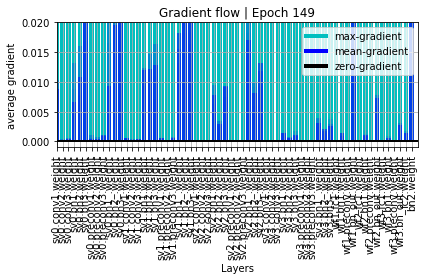

In [27]:
model = model.to(device)

model_folder = '/tf/data/Quan/fer2013/backtobasics/svgg3/'
model_name = 'svgg_resnet'
model_path = os.path.join(model_folder, model_name + '.pt')

best_acc = 0.0
curloss = 0.0
hist2 = []

for epoch in range(60, 150):  # loop over the dataset multiple times
    
    print('Epoch: ', epoch + 1)
    running_loss = 0.0
    running_acc = 0.0

    # TRAIN
    model.train()
    for i, data in enumerate(train_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)
        loss.backward()
        
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        running_acc += acc
        print('\t - Step %d: loss: %.3f acc: %.3f' % (i+1, loss.item(), acc))

    print('- Avg.loss: %.3f  | Avg.acc: %.3f' % (running_loss / (i+1), running_acc / (i+1)))
    avgloss = running_loss / (i+1)
    avgacc = running_acc / (i+1)
    
    # print gradient flow figure
    plot_grad_flow(model.named_parameters(), epoch,
                   savepath=os.path.join(model_folder, model_name + '_gf' + '_' + str(epoch) + '.png'))

    # EVALUATE
    model.eval()
    running_valloss = 0.0
    running_valacc = 0.0
    for i,data in enumerate(val_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)

        running_valloss += loss.item()
        running_valacc += acc

    print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))

    avgvalloss = running_valloss / (i+1)
    avgvalcc = running_valacc / (i+1)

    hist2.append([avgloss, avgvalloss, avgacc, avgvalcc])
    
    if best_acc < (running_valacc / (i+1)):
        best_acc = (running_valacc / (i+1))
        curloss = (running_valloss / (i+1))
        torch.save(model, model_path)
        print('* Update optimal model')

print('Finished Training')

([<matplotlib.lines.Line2D at 0x7f14d8076208>,
 0.5595942986638922)

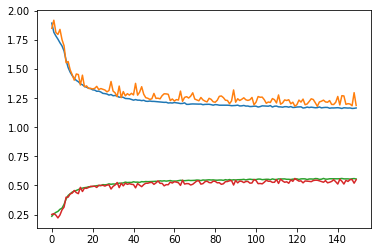

In [29]:
plt.plot(hist + hist2), best_acc

In [26]:
import imageio
images = []
for i in range(60):
    images.append(imageio.imread('/tf/data/Quan/fer2013/backtobasics/svgg3/svgg_resnet_gf_' + str(i) + '.png'))
imageio.mimsave('/tf/data/Quan/fer2013/backtobasics/svgg3/svgg_resnet_gf.gif', images)

Model seems to be a little bit "underfitting", this may be the benifit of data augmentation.
We keep the same augmentation mode, slightly increase learning rate and build the model deeper, add additional fc1 in classifier

## SVGG4

In [5]:
class SVblock(nn.Module):
    def __init__(self, in_neurons, nb_neurons, kernel_size=(3,3), batch_norm=True, activation='relu', **kwargs):
        '''
    in_neurons: C_in
    nb_neurons: n_filters of conv2d
    '''
        super(SVblock, self).__init__()

        self.index = kwargs['index'] if 'index' in kwargs else None
        self.conv1 = nn.Conv2d(in_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv2 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv3 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        
        self.bn1 = nn.BatchNorm2d(nb_neurons)
        self.bn2 = nn.BatchNorm2d(nb_neurons)
        self.bn3 = nn.BatchNorm2d(nb_neurons)
        
        self.preconv1 = nn.Conv2d(in_neurons, nb_neurons, kernel_size=1)
        self.preconv2 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=1)
        self.preconv3 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=1)
        self.bn1_ = nn.BatchNorm2d(nb_neurons)
        self.bn2_ = nn.BatchNorm2d(nb_neurons)
        self.bn3_ = nn.BatchNorm2d(nb_neurons)
        
        self.relu = nn.LeakyReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=(2,2), stride=2)
     


    def forward(self, x):        
        
        x0_res = self.preconv1(x)
        x0_res = self.bn1_(x0_res)
        
        # 1st
        x1 = self.conv1(x)
        x1 = self.bn1(x1)
        x1 = self.relu(x1)
        
        x1 = x1 + x0_res
        x1_res = self.preconv2(x1)
        x1_res = self.bn2_(x1_res)

        # 2nd
        x2 = self.conv2(x1)
        x2 = self.bn2(x2)
        x2 = self.relu(x2)
        
        x2 = x2 + x1_res
        x2_res = self.preconv3(x2)
        x2_res = self.bn3_(x2_res)
        
        # 3rd
        x3 = self.conv3(x2)
        x3 = self.bn3(x3)
        x3 = self.relu(x3)
        
        x3 = x3 + x2_res

        # maxpooling
        x_out = self.maxpool(x3)

        return x_out

In [6]:
class WeightFeature(nn.Module):
    def __init__(self, feature_depth, target_depth):
        super(WeightFeature, self).__init__()

        self.target_depth = target_depth
        self.fc1 = nn.Linear(feature_depth, target_depth)
        self.bn1 = nn.BatchNorm1d(target_depth)
        self.preconv = nn.Conv2d(target_depth, target_depth, kernel_size=1)
        self.relu = nn.LeakyReLU()
        self.bn_out = nn.BatchNorm2d(target_depth)
        
    def forward(self, x1, x2):
        x1 = nn.AvgPool2d(kernel_size=(x1.size(-2), x1.size(-1)))(x1)
        x1 = nn.Flatten()(x1)

        x1 = self.fc1(x1)
        x1 = self.bn1(x1)
        x1 = self.relu(x1)
        x1 = x1.unsqueeze(-1).unsqueeze(-1)

        _x2 = self.preconv(x2)
        
        x = torch.mul(_x2,x1)
        x = x + x2
        x = self.bn_out(x)

        return x

In [7]:
class SVGG(nn.Module):
    
    def __init__(self, **kwargs):
        super(SVGG, self).__init__()

        self.device = torch.device('cpu') if not 'device' in kwargs else kwargs['device']

        self.sv0 = SVblock(1, 64).to(self.device)
        self.sv1 = SVblock(64, 128).to(self.device)
        self.sv2 = SVblock(128, 256).to(self.device)
        self.sv3 = SVblock(256, 512).to(self.device)
        self.sv4 = SVblock(512, 1024).to(self.device)

        self.wf1 = WeightFeature(64, 128).to(self.device)
        self.wf2 = WeightFeature(128, 256).to(self.device)
        self.wf3 = WeightFeature(256, 512).to(self.device)
        self.wf4 = WeightFeature(512, 1024).to(self.device)

        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 7)
        self.bn2 = nn.BatchNorm1d(7)
        
    
    def forward(self, x):
        x0 = self.sv0(x)

        x1 = self.sv1(x0)
        x_wf1 = self.wf1(x0, x1)

        x2 = self.sv2(x_wf1)
        x_wf2 = self.wf2(x1, x2)

        x3 = self.sv3(x_wf2)
        x_wf3 = self.wf3(x2, x3)
        
        x4 = self.sv4(x_wf3)
        x_wf4 = self.wf4(x3, x4)

        x_wf4 = nn.AvgPool2d(kernel_size=(x_wf4.size(-2), x_wf4.size(-1)))(x_wf4)
    
        x = nn.Flatten()(x_wf4)

        x = self.fc1(x)
        x = nn.LeakyReLU()(x)
        x = self.fc2(x)
        x = self.bn2(x)

        return x

In [10]:
device = torch.device('cuda')
print(device)

model = SVGG(device=device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005, weight_decay=5e-4)


cuda


Epoch:  1
	 - Step 1: loss: 2.175 acc: 0.141
	 - Step 2: loss: 2.249 acc: 0.156
	 - Step 3: loss: 1.883 acc: 0.250
	 - Step 4: loss: 2.133 acc: 0.141
	 - Step 5: loss: 1.972 acc: 0.219
	 - Step 6: loss: 1.966 acc: 0.219
	 - Step 7: loss: 1.925 acc: 0.203
	 - Step 8: loss: 2.088 acc: 0.219
	 - Step 9: loss: 1.923 acc: 0.250
	 - Step 10: loss: 1.911 acc: 0.297
	 - Step 11: loss: 2.190 acc: 0.234
	 - Step 12: loss: 1.895 acc: 0.266
	 - Step 13: loss: 2.109 acc: 0.281
	 - Step 14: loss: 1.873 acc: 0.266
	 - Step 15: loss: 1.906 acc: 0.219
	 - Step 16: loss: 2.146 acc: 0.219
	 - Step 17: loss: 2.117 acc: 0.312
	 - Step 18: loss: 1.940 acc: 0.297
	 - Step 19: loss: 2.023 acc: 0.234
	 - Step 20: loss: 1.925 acc: 0.094
	 - Step 21: loss: 1.937 acc: 0.219
	 - Step 22: loss: 1.884 acc: 0.219
	 - Step 23: loss: 1.850 acc: 0.359
	 - Step 24: loss: 1.804 acc: 0.312
	 - Step 25: loss: 1.854 acc: 0.328
	 - Step 26: loss: 1.861 acc: 0.188
	 - Step 27: loss: 1.888 acc: 0.234
	 - Step 28: loss: 1.857 ac

	 - Step 227: loss: 1.871 acc: 0.219
	 - Step 228: loss: 1.905 acc: 0.312
	 - Step 229: loss: 1.835 acc: 0.234
	 - Step 230: loss: 1.962 acc: 0.234
	 - Step 231: loss: 1.898 acc: 0.281
	 - Step 232: loss: 1.892 acc: 0.188
	 - Step 233: loss: 1.923 acc: 0.172
	 - Step 234: loss: 1.888 acc: 0.266
	 - Step 235: loss: 1.783 acc: 0.281
	 - Step 236: loss: 1.994 acc: 0.234
	 - Step 237: loss: 1.864 acc: 0.250
	 - Step 238: loss: 1.911 acc: 0.109
	 - Step 239: loss: 1.739 acc: 0.281
	 - Step 240: loss: 1.807 acc: 0.219
	 - Step 241: loss: 1.827 acc: 0.266
	 - Step 242: loss: 1.814 acc: 0.266
	 - Step 243: loss: 1.880 acc: 0.250
	 - Step 244: loss: 1.771 acc: 0.312
	 - Step 245: loss: 1.829 acc: 0.281
	 - Step 246: loss: 1.791 acc: 0.312
	 - Step 247: loss: 1.893 acc: 0.281
	 - Step 248: loss: 1.782 acc: 0.328
	 - Step 249: loss: 1.874 acc: 0.297
	 - Step 250: loss: 2.039 acc: 0.141
	 - Step 251: loss: 1.810 acc: 0.203
	 - Step 252: loss: 1.804 acc: 0.219
	 - Step 253: loss: 1.833 acc: 0.297
	

	 - Step 449: loss: 1.821 acc: 0.216
- Avg.loss: 1.856  | Avg.acc: 0.248
- Avg. val_loss: 1.816  | Avg. val_acc: 0.245
* Update optimal model
Epoch:  2
	 - Step 1: loss: 1.770 acc: 0.266
	 - Step 2: loss: 1.788 acc: 0.219
	 - Step 3: loss: 1.733 acc: 0.406
	 - Step 4: loss: 1.820 acc: 0.203
	 - Step 5: loss: 1.808 acc: 0.250
	 - Step 6: loss: 1.809 acc: 0.250
	 - Step 7: loss: 1.738 acc: 0.297
	 - Step 8: loss: 1.802 acc: 0.266
	 - Step 9: loss: 1.825 acc: 0.281
	 - Step 10: loss: 1.843 acc: 0.219
	 - Step 11: loss: 1.746 acc: 0.312
	 - Step 12: loss: 1.830 acc: 0.203
	 - Step 13: loss: 1.790 acc: 0.188
	 - Step 14: loss: 1.752 acc: 0.328
	 - Step 15: loss: 1.750 acc: 0.281
	 - Step 16: loss: 1.790 acc: 0.266
	 - Step 17: loss: 1.787 acc: 0.328
	 - Step 18: loss: 1.789 acc: 0.266
	 - Step 19: loss: 1.832 acc: 0.234
	 - Step 20: loss: 1.911 acc: 0.141
	 - Step 21: loss: 1.906 acc: 0.172
	 - Step 22: loss: 1.744 acc: 0.312
	 - Step 23: loss: 1.796 acc: 0.250
	 - Step 24: loss: 1.816 acc:

	 - Step 223: loss: 1.751 acc: 0.328
	 - Step 224: loss: 1.764 acc: 0.250
	 - Step 225: loss: 1.789 acc: 0.281
	 - Step 226: loss: 1.829 acc: 0.250
	 - Step 227: loss: 1.760 acc: 0.312
	 - Step 228: loss: 1.723 acc: 0.219
	 - Step 229: loss: 1.747 acc: 0.312
	 - Step 230: loss: 1.764 acc: 0.266
	 - Step 231: loss: 1.914 acc: 0.141
	 - Step 232: loss: 1.721 acc: 0.328
	 - Step 233: loss: 1.737 acc: 0.328
	 - Step 234: loss: 1.833 acc: 0.266
	 - Step 235: loss: 1.780 acc: 0.156
	 - Step 236: loss: 1.831 acc: 0.203
	 - Step 237: loss: 1.837 acc: 0.188
	 - Step 238: loss: 1.823 acc: 0.219
	 - Step 239: loss: 1.798 acc: 0.203
	 - Step 240: loss: 1.764 acc: 0.234
	 - Step 241: loss: 1.763 acc: 0.219
	 - Step 242: loss: 1.831 acc: 0.219
	 - Step 243: loss: 1.750 acc: 0.281
	 - Step 244: loss: 1.781 acc: 0.312
	 - Step 245: loss: 1.726 acc: 0.312
	 - Step 246: loss: 1.785 acc: 0.250
	 - Step 247: loss: 1.740 acc: 0.344
	 - Step 248: loss: 1.774 acc: 0.344
	 - Step 249: loss: 1.807 acc: 0.281
	

	 - Step 445: loss: 1.796 acc: 0.266
	 - Step 446: loss: 1.837 acc: 0.250
	 - Step 447: loss: 1.753 acc: 0.281
	 - Step 448: loss: 1.698 acc: 0.312
	 - Step 449: loss: 1.851 acc: 0.189
- Avg.loss: 1.788  | Avg.acc: 0.254
- Avg. val_loss: 1.787  | Avg. val_acc: 0.259
* Update optimal model
Epoch:  3
	 - Step 1: loss: 1.842 acc: 0.156
	 - Step 2: loss: 1.781 acc: 0.281
	 - Step 3: loss: 1.692 acc: 0.312
	 - Step 4: loss: 1.796 acc: 0.219
	 - Step 5: loss: 1.821 acc: 0.203
	 - Step 6: loss: 1.768 acc: 0.250
	 - Step 7: loss: 1.796 acc: 0.266
	 - Step 8: loss: 1.737 acc: 0.188
	 - Step 9: loss: 1.791 acc: 0.141
	 - Step 10: loss: 1.775 acc: 0.281
	 - Step 11: loss: 1.758 acc: 0.219
	 - Step 12: loss: 1.827 acc: 0.234
	 - Step 13: loss: 1.858 acc: 0.141
	 - Step 14: loss: 1.874 acc: 0.219
	 - Step 15: loss: 1.793 acc: 0.281
	 - Step 16: loss: 1.729 acc: 0.344
	 - Step 17: loss: 1.819 acc: 0.266
	 - Step 18: loss: 1.837 acc: 0.203
	 - Step 19: loss: 1.782 acc: 0.250
	 - Step 20: loss: 1.767 

	 - Step 219: loss: 1.881 acc: 0.172
	 - Step 220: loss: 1.841 acc: 0.234
	 - Step 221: loss: 1.917 acc: 0.172
	 - Step 222: loss: 1.750 acc: 0.344
	 - Step 223: loss: 1.767 acc: 0.312
	 - Step 224: loss: 1.817 acc: 0.219
	 - Step 225: loss: 1.800 acc: 0.203
	 - Step 226: loss: 1.921 acc: 0.203
	 - Step 227: loss: 1.811 acc: 0.219
	 - Step 228: loss: 1.795 acc: 0.141
	 - Step 229: loss: 1.742 acc: 0.297
	 - Step 230: loss: 1.780 acc: 0.359
	 - Step 231: loss: 1.712 acc: 0.250
	 - Step 232: loss: 1.822 acc: 0.219
	 - Step 233: loss: 1.739 acc: 0.328
	 - Step 234: loss: 1.811 acc: 0.203
	 - Step 235: loss: 1.803 acc: 0.188
	 - Step 236: loss: 1.807 acc: 0.234
	 - Step 237: loss: 1.721 acc: 0.312
	 - Step 238: loss: 1.730 acc: 0.234
	 - Step 239: loss: 1.844 acc: 0.234
	 - Step 240: loss: 1.708 acc: 0.328
	 - Step 241: loss: 1.753 acc: 0.250
	 - Step 242: loss: 1.727 acc: 0.312
	 - Step 243: loss: 1.830 acc: 0.250
	 - Step 244: loss: 1.701 acc: 0.266
	 - Step 245: loss: 1.805 acc: 0.188
	

	 - Step 441: loss: 1.752 acc: 0.203
	 - Step 442: loss: 1.876 acc: 0.141
	 - Step 443: loss: 1.743 acc: 0.250
	 - Step 444: loss: 1.720 acc: 0.328
	 - Step 445: loss: 1.805 acc: 0.234
	 - Step 446: loss: 1.677 acc: 0.281
	 - Step 447: loss: 1.718 acc: 0.297
	 - Step 448: loss: 1.791 acc: 0.188
	 - Step 449: loss: 1.818 acc: 0.243
- Avg.loss: 1.776  | Avg.acc: 0.260
- Avg. val_loss: 1.793  | Avg. val_acc: 0.273
* Update optimal model
Epoch:  4
	 - Step 1: loss: 1.765 acc: 0.266
	 - Step 2: loss: 1.714 acc: 0.328
	 - Step 3: loss: 1.758 acc: 0.312
	 - Step 4: loss: 1.847 acc: 0.156
	 - Step 5: loss: 1.851 acc: 0.281
	 - Step 6: loss: 1.749 acc: 0.281
	 - Step 7: loss: 1.753 acc: 0.344
	 - Step 8: loss: 1.764 acc: 0.312
	 - Step 9: loss: 1.750 acc: 0.281
	 - Step 10: loss: 1.646 acc: 0.375
	 - Step 11: loss: 1.793 acc: 0.328
	 - Step 12: loss: 1.812 acc: 0.188
	 - Step 13: loss: 1.762 acc: 0.266
	 - Step 14: loss: 1.761 acc: 0.234
	 - Step 15: loss: 1.794 acc: 0.234
	 - Step 16: loss: 1.

	 - Step 215: loss: 1.763 acc: 0.266
	 - Step 216: loss: 1.649 acc: 0.359
	 - Step 217: loss: 1.699 acc: 0.344
	 - Step 218: loss: 1.733 acc: 0.250
	 - Step 219: loss: 1.762 acc: 0.266
	 - Step 220: loss: 1.779 acc: 0.266
	 - Step 221: loss: 1.694 acc: 0.234
	 - Step 222: loss: 1.784 acc: 0.234
	 - Step 223: loss: 1.819 acc: 0.156
	 - Step 224: loss: 1.850 acc: 0.188
	 - Step 225: loss: 1.836 acc: 0.250
	 - Step 226: loss: 1.829 acc: 0.203
	 - Step 227: loss: 1.827 acc: 0.219
	 - Step 228: loss: 1.731 acc: 0.281
	 - Step 229: loss: 1.798 acc: 0.281
	 - Step 230: loss: 1.758 acc: 0.281
	 - Step 231: loss: 1.738 acc: 0.250
	 - Step 232: loss: 1.754 acc: 0.250
	 - Step 233: loss: 1.860 acc: 0.266
	 - Step 234: loss: 1.719 acc: 0.281
	 - Step 235: loss: 1.672 acc: 0.344
	 - Step 236: loss: 1.773 acc: 0.250
	 - Step 237: loss: 1.806 acc: 0.250
	 - Step 238: loss: 1.702 acc: 0.281
	 - Step 239: loss: 1.720 acc: 0.359
	 - Step 240: loss: 1.766 acc: 0.250
	 - Step 241: loss: 1.825 acc: 0.266
	

	 - Step 437: loss: 1.797 acc: 0.281
	 - Step 438: loss: 1.815 acc: 0.266
	 - Step 439: loss: 1.803 acc: 0.312
	 - Step 440: loss: 1.791 acc: 0.281
	 - Step 441: loss: 1.670 acc: 0.250
	 - Step 442: loss: 1.677 acc: 0.359
	 - Step 443: loss: 1.724 acc: 0.297
	 - Step 444: loss: 1.687 acc: 0.328
	 - Step 445: loss: 1.698 acc: 0.281
	 - Step 446: loss: 1.751 acc: 0.250
	 - Step 447: loss: 1.768 acc: 0.250
	 - Step 448: loss: 1.749 acc: 0.297
	 - Step 449: loss: 1.957 acc: 0.270
- Avg.loss: 1.760  | Avg.acc: 0.273
- Avg. val_loss: 1.776  | Avg. val_acc: 0.259
Epoch:  5
	 - Step 1: loss: 1.753 acc: 0.172
	 - Step 2: loss: 1.766 acc: 0.203
	 - Step 3: loss: 1.746 acc: 0.250
	 - Step 4: loss: 1.658 acc: 0.312
	 - Step 5: loss: 1.783 acc: 0.219
	 - Step 6: loss: 1.814 acc: 0.203
	 - Step 7: loss: 1.713 acc: 0.344
	 - Step 8: loss: 1.685 acc: 0.359
	 - Step 9: loss: 1.764 acc: 0.234
	 - Step 10: loss: 1.744 acc: 0.250
	 - Step 11: loss: 1.835 acc: 0.188
	 - Step 12: loss: 1.628 acc: 0.312
	 - 

	 - Step 211: loss: 1.719 acc: 0.297
	 - Step 212: loss: 1.636 acc: 0.312
	 - Step 213: loss: 1.792 acc: 0.219
	 - Step 214: loss: 1.710 acc: 0.266
	 - Step 215: loss: 1.763 acc: 0.234
	 - Step 216: loss: 1.825 acc: 0.188
	 - Step 217: loss: 1.773 acc: 0.312
	 - Step 218: loss: 1.751 acc: 0.312
	 - Step 219: loss: 1.715 acc: 0.203
	 - Step 220: loss: 1.824 acc: 0.250
	 - Step 221: loss: 1.769 acc: 0.266
	 - Step 222: loss: 1.687 acc: 0.344
	 - Step 223: loss: 1.691 acc: 0.281
	 - Step 224: loss: 1.726 acc: 0.312
	 - Step 225: loss: 1.633 acc: 0.438
	 - Step 226: loss: 1.755 acc: 0.219
	 - Step 227: loss: 1.742 acc: 0.266
	 - Step 228: loss: 1.687 acc: 0.312
	 - Step 229: loss: 1.742 acc: 0.281
	 - Step 230: loss: 1.909 acc: 0.188
	 - Step 231: loss: 1.691 acc: 0.281
	 - Step 232: loss: 1.817 acc: 0.234
	 - Step 233: loss: 1.811 acc: 0.266
	 - Step 234: loss: 1.749 acc: 0.281
	 - Step 235: loss: 1.726 acc: 0.281
	 - Step 236: loss: 1.752 acc: 0.266
	 - Step 237: loss: 1.683 acc: 0.328
	

	 - Step 433: loss: 1.765 acc: 0.281
	 - Step 434: loss: 1.771 acc: 0.266
	 - Step 435: loss: 1.741 acc: 0.266
	 - Step 436: loss: 1.754 acc: 0.297
	 - Step 437: loss: 1.710 acc: 0.188
	 - Step 438: loss: 1.665 acc: 0.281
	 - Step 439: loss: 1.733 acc: 0.328
	 - Step 440: loss: 1.652 acc: 0.297
	 - Step 441: loss: 1.786 acc: 0.250
	 - Step 442: loss: 1.759 acc: 0.281
	 - Step 443: loss: 1.704 acc: 0.344
	 - Step 444: loss: 1.760 acc: 0.312
	 - Step 445: loss: 1.693 acc: 0.312
	 - Step 446: loss: 1.736 acc: 0.266
	 - Step 447: loss: 1.681 acc: 0.250
	 - Step 448: loss: 1.711 acc: 0.344
	 - Step 449: loss: 1.781 acc: 0.189
- Avg.loss: 1.746  | Avg.acc: 0.278
- Avg. val_loss: 1.848  | Avg. val_acc: 0.255
Epoch:  6
	 - Step 1: loss: 1.890 acc: 0.188
	 - Step 2: loss: 1.730 acc: 0.219
	 - Step 3: loss: 1.702 acc: 0.219
	 - Step 4: loss: 1.717 acc: 0.281
	 - Step 5: loss: 1.881 acc: 0.266
	 - Step 6: loss: 1.766 acc: 0.328
	 - Step 7: loss: 1.610 acc: 0.359
	 - Step 8: loss: 1.732 acc: 0.266

	 - Step 207: loss: 1.753 acc: 0.281
	 - Step 208: loss: 1.728 acc: 0.219
	 - Step 209: loss: 1.637 acc: 0.328
	 - Step 210: loss: 1.777 acc: 0.266
	 - Step 211: loss: 1.680 acc: 0.344
	 - Step 212: loss: 1.583 acc: 0.391
	 - Step 213: loss: 1.705 acc: 0.266
	 - Step 214: loss: 1.751 acc: 0.250
	 - Step 215: loss: 1.708 acc: 0.281
	 - Step 216: loss: 1.681 acc: 0.281
	 - Step 217: loss: 1.894 acc: 0.156
	 - Step 218: loss: 1.706 acc: 0.281
	 - Step 219: loss: 1.748 acc: 0.172
	 - Step 220: loss: 1.729 acc: 0.281
	 - Step 221: loss: 1.729 acc: 0.297
	 - Step 222: loss: 1.786 acc: 0.188
	 - Step 223: loss: 1.784 acc: 0.234
	 - Step 224: loss: 1.794 acc: 0.234
	 - Step 225: loss: 1.767 acc: 0.234
	 - Step 226: loss: 1.782 acc: 0.266
	 - Step 227: loss: 1.811 acc: 0.203
	 - Step 228: loss: 1.675 acc: 0.297
	 - Step 229: loss: 1.650 acc: 0.375
	 - Step 230: loss: 1.829 acc: 0.297
	 - Step 231: loss: 1.657 acc: 0.344
	 - Step 232: loss: 1.706 acc: 0.297
	 - Step 233: loss: 1.726 acc: 0.266
	

	 - Step 429: loss: 1.762 acc: 0.281
	 - Step 430: loss: 1.778 acc: 0.234
	 - Step 431: loss: 1.809 acc: 0.328
	 - Step 432: loss: 1.754 acc: 0.344
	 - Step 433: loss: 1.700 acc: 0.266
	 - Step 434: loss: 1.715 acc: 0.281
	 - Step 435: loss: 1.636 acc: 0.312
	 - Step 436: loss: 1.717 acc: 0.266
	 - Step 437: loss: 1.720 acc: 0.297
	 - Step 438: loss: 1.636 acc: 0.359
	 - Step 439: loss: 1.637 acc: 0.438
	 - Step 440: loss: 1.622 acc: 0.438
	 - Step 441: loss: 1.741 acc: 0.266
	 - Step 442: loss: 1.713 acc: 0.281
	 - Step 443: loss: 1.728 acc: 0.281
	 - Step 444: loss: 1.692 acc: 0.375
	 - Step 445: loss: 1.649 acc: 0.406
	 - Step 446: loss: 1.707 acc: 0.297
	 - Step 447: loss: 1.796 acc: 0.203
	 - Step 448: loss: 1.757 acc: 0.266
	 - Step 449: loss: 1.658 acc: 0.216
- Avg.loss: 1.742  | Avg.acc: 0.281
- Avg. val_loss: 1.805  | Avg. val_acc: 0.255
Epoch:  7
	 - Step 1: loss: 1.783 acc: 0.219
	 - Step 2: loss: 1.750 acc: 0.219
	 - Step 3: loss: 1.691 acc: 0.328
	 - Step 4: loss: 1.755 ac

	 - Step 203: loss: 1.672 acc: 0.297
	 - Step 204: loss: 1.644 acc: 0.312
	 - Step 205: loss: 1.806 acc: 0.250
	 - Step 206: loss: 1.763 acc: 0.344
	 - Step 207: loss: 1.873 acc: 0.312
	 - Step 208: loss: 1.774 acc: 0.312
	 - Step 209: loss: 1.737 acc: 0.344
	 - Step 210: loss: 1.734 acc: 0.281
	 - Step 211: loss: 1.620 acc: 0.344
	 - Step 212: loss: 1.780 acc: 0.281
	 - Step 213: loss: 1.668 acc: 0.281
	 - Step 214: loss: 1.674 acc: 0.359
	 - Step 215: loss: 1.708 acc: 0.219
	 - Step 216: loss: 1.832 acc: 0.281
	 - Step 217: loss: 1.593 acc: 0.344
	 - Step 218: loss: 1.759 acc: 0.328
	 - Step 219: loss: 1.652 acc: 0.312
	 - Step 220: loss: 1.716 acc: 0.250
	 - Step 221: loss: 1.744 acc: 0.359
	 - Step 222: loss: 1.852 acc: 0.203
	 - Step 223: loss: 1.711 acc: 0.344
	 - Step 224: loss: 1.640 acc: 0.281
	 - Step 225: loss: 1.810 acc: 0.297
	 - Step 226: loss: 1.750 acc: 0.266
	 - Step 227: loss: 1.680 acc: 0.234
	 - Step 228: loss: 1.737 acc: 0.281
	 - Step 229: loss: 1.756 acc: 0.344
	

	 - Step 425: loss: 1.695 acc: 0.328
	 - Step 426: loss: 1.649 acc: 0.438
	 - Step 427: loss: 1.671 acc: 0.344
	 - Step 428: loss: 1.727 acc: 0.312
	 - Step 429: loss: 1.700 acc: 0.281
	 - Step 430: loss: 1.670 acc: 0.281
	 - Step 431: loss: 1.774 acc: 0.203
	 - Step 432: loss: 1.655 acc: 0.359
	 - Step 433: loss: 1.761 acc: 0.250
	 - Step 434: loss: 1.699 acc: 0.250
	 - Step 435: loss: 1.782 acc: 0.203
	 - Step 436: loss: 1.787 acc: 0.312
	 - Step 437: loss: 1.574 acc: 0.406
	 - Step 438: loss: 1.708 acc: 0.328
	 - Step 439: loss: 1.620 acc: 0.406
	 - Step 440: loss: 1.682 acc: 0.250
	 - Step 441: loss: 1.858 acc: 0.219
	 - Step 442: loss: 1.775 acc: 0.344
	 - Step 443: loss: 1.618 acc: 0.328
	 - Step 444: loss: 1.721 acc: 0.312
	 - Step 445: loss: 1.626 acc: 0.312
	 - Step 446: loss: 1.674 acc: 0.344
	 - Step 447: loss: 1.717 acc: 0.266
	 - Step 448: loss: 1.704 acc: 0.328
	 - Step 449: loss: 1.831 acc: 0.189
- Avg.loss: 1.729  | Avg.acc: 0.287
- Avg. val_loss: 1.722  | Avg. val_acc:

	 - Step 199: loss: 1.797 acc: 0.312
	 - Step 200: loss: 1.614 acc: 0.297
	 - Step 201: loss: 1.669 acc: 0.234
	 - Step 202: loss: 1.807 acc: 0.312
	 - Step 203: loss: 1.605 acc: 0.344
	 - Step 204: loss: 1.798 acc: 0.172
	 - Step 205: loss: 1.826 acc: 0.297
	 - Step 206: loss: 1.622 acc: 0.344
	 - Step 207: loss: 1.659 acc: 0.406
	 - Step 208: loss: 1.804 acc: 0.234
	 - Step 209: loss: 1.747 acc: 0.312
	 - Step 210: loss: 1.678 acc: 0.281
	 - Step 211: loss: 1.711 acc: 0.391
	 - Step 212: loss: 1.677 acc: 0.312
	 - Step 213: loss: 1.769 acc: 0.203
	 - Step 214: loss: 1.820 acc: 0.250
	 - Step 215: loss: 1.760 acc: 0.234
	 - Step 216: loss: 1.716 acc: 0.328
	 - Step 217: loss: 1.745 acc: 0.281
	 - Step 218: loss: 1.831 acc: 0.141
	 - Step 219: loss: 1.761 acc: 0.359
	 - Step 220: loss: 1.760 acc: 0.422
	 - Step 221: loss: 1.753 acc: 0.281
	 - Step 222: loss: 1.642 acc: 0.375
	 - Step 223: loss: 1.707 acc: 0.312
	 - Step 224: loss: 1.817 acc: 0.250
	 - Step 225: loss: 1.739 acc: 0.250
	

	 - Step 421: loss: 1.849 acc: 0.281
	 - Step 422: loss: 1.590 acc: 0.375
	 - Step 423: loss: 1.718 acc: 0.266
	 - Step 424: loss: 1.618 acc: 0.312
	 - Step 425: loss: 1.728 acc: 0.297
	 - Step 426: loss: 1.591 acc: 0.359
	 - Step 427: loss: 1.721 acc: 0.297
	 - Step 428: loss: 1.692 acc: 0.328
	 - Step 429: loss: 1.676 acc: 0.312
	 - Step 430: loss: 1.751 acc: 0.188
	 - Step 431: loss: 1.722 acc: 0.203
	 - Step 432: loss: 1.630 acc: 0.328
	 - Step 433: loss: 1.737 acc: 0.297
	 - Step 434: loss: 1.594 acc: 0.359
	 - Step 435: loss: 1.804 acc: 0.219
	 - Step 436: loss: 1.621 acc: 0.328
	 - Step 437: loss: 1.593 acc: 0.375
	 - Step 438: loss: 1.738 acc: 0.297
	 - Step 439: loss: 1.635 acc: 0.312
	 - Step 440: loss: 1.776 acc: 0.266
	 - Step 441: loss: 1.686 acc: 0.328
	 - Step 442: loss: 1.624 acc: 0.312
	 - Step 443: loss: 1.715 acc: 0.359
	 - Step 444: loss: 1.649 acc: 0.328
	 - Step 445: loss: 1.754 acc: 0.359
	 - Step 446: loss: 1.590 acc: 0.344
	 - Step 447: loss: 1.749 acc: 0.266
	

	 - Step 195: loss: 1.604 acc: 0.359
	 - Step 196: loss: 1.657 acc: 0.219
	 - Step 197: loss: 1.696 acc: 0.234
	 - Step 198: loss: 1.693 acc: 0.281
	 - Step 199: loss: 1.746 acc: 0.234
	 - Step 200: loss: 1.735 acc: 0.219
	 - Step 201: loss: 1.776 acc: 0.297
	 - Step 202: loss: 1.743 acc: 0.312
	 - Step 203: loss: 1.698 acc: 0.391
	 - Step 204: loss: 1.984 acc: 0.203
	 - Step 205: loss: 1.766 acc: 0.156
	 - Step 206: loss: 1.696 acc: 0.438
	 - Step 207: loss: 1.675 acc: 0.297
	 - Step 208: loss: 1.666 acc: 0.266
	 - Step 209: loss: 1.575 acc: 0.328
	 - Step 210: loss: 1.733 acc: 0.281
	 - Step 211: loss: 1.667 acc: 0.359
	 - Step 212: loss: 1.623 acc: 0.297
	 - Step 213: loss: 1.632 acc: 0.312
	 - Step 214: loss: 1.705 acc: 0.266
	 - Step 215: loss: 1.639 acc: 0.250
	 - Step 216: loss: 1.659 acc: 0.375
	 - Step 217: loss: 1.623 acc: 0.312
	 - Step 218: loss: 1.687 acc: 0.297
	 - Step 219: loss: 1.722 acc: 0.375
	 - Step 220: loss: 1.720 acc: 0.312
	 - Step 221: loss: 1.643 acc: 0.391
	

	 - Step 417: loss: 1.605 acc: 0.469
	 - Step 418: loss: 1.692 acc: 0.312
	 - Step 419: loss: 1.717 acc: 0.406
	 - Step 420: loss: 1.665 acc: 0.375
	 - Step 421: loss: 1.705 acc: 0.234
	 - Step 422: loss: 1.640 acc: 0.297
	 - Step 423: loss: 1.732 acc: 0.297
	 - Step 424: loss: 1.663 acc: 0.281
	 - Step 425: loss: 1.657 acc: 0.297
	 - Step 426: loss: 1.682 acc: 0.250
	 - Step 427: loss: 1.614 acc: 0.391
	 - Step 428: loss: 1.808 acc: 0.281
	 - Step 429: loss: 1.812 acc: 0.203
	 - Step 430: loss: 1.599 acc: 0.297
	 - Step 431: loss: 1.740 acc: 0.219
	 - Step 432: loss: 1.684 acc: 0.297
	 - Step 433: loss: 1.688 acc: 0.328
	 - Step 434: loss: 1.837 acc: 0.250
	 - Step 435: loss: 1.599 acc: 0.391
	 - Step 436: loss: 1.774 acc: 0.312
	 - Step 437: loss: 1.600 acc: 0.344
	 - Step 438: loss: 1.751 acc: 0.344
	 - Step 439: loss: 1.714 acc: 0.250
	 - Step 440: loss: 1.678 acc: 0.219
	 - Step 441: loss: 1.743 acc: 0.359
	 - Step 442: loss: 1.643 acc: 0.312
	 - Step 443: loss: 1.783 acc: 0.234
	

	 - Step 191: loss: 1.770 acc: 0.297
	 - Step 192: loss: 1.625 acc: 0.234
	 - Step 193: loss: 1.780 acc: 0.234
	 - Step 194: loss: 1.652 acc: 0.281
	 - Step 195: loss: 1.614 acc: 0.406
	 - Step 196: loss: 1.595 acc: 0.391
	 - Step 197: loss: 1.751 acc: 0.297
	 - Step 198: loss: 1.733 acc: 0.266
	 - Step 199: loss: 1.596 acc: 0.344
	 - Step 200: loss: 1.684 acc: 0.328
	 - Step 201: loss: 1.745 acc: 0.312
	 - Step 202: loss: 1.641 acc: 0.359
	 - Step 203: loss: 1.691 acc: 0.266
	 - Step 204: loss: 1.768 acc: 0.234
	 - Step 205: loss: 1.797 acc: 0.328
	 - Step 206: loss: 1.726 acc: 0.281
	 - Step 207: loss: 1.686 acc: 0.312
	 - Step 208: loss: 1.604 acc: 0.344
	 - Step 209: loss: 1.647 acc: 0.297
	 - Step 210: loss: 1.749 acc: 0.203
	 - Step 211: loss: 1.619 acc: 0.297
	 - Step 212: loss: 1.538 acc: 0.391
	 - Step 213: loss: 1.782 acc: 0.266
	 - Step 214: loss: 1.591 acc: 0.359
	 - Step 215: loss: 1.919 acc: 0.188
	 - Step 216: loss: 1.725 acc: 0.328
	 - Step 217: loss: 1.667 acc: 0.312
	

	 - Step 413: loss: 1.765 acc: 0.266
	 - Step 414: loss: 1.676 acc: 0.281
	 - Step 415: loss: 1.644 acc: 0.250
	 - Step 416: loss: 1.710 acc: 0.219
	 - Step 417: loss: 1.679 acc: 0.234
	 - Step 418: loss: 1.696 acc: 0.297
	 - Step 419: loss: 1.635 acc: 0.250
	 - Step 420: loss: 1.696 acc: 0.266
	 - Step 421: loss: 1.698 acc: 0.469
	 - Step 422: loss: 1.588 acc: 0.391
	 - Step 423: loss: 1.763 acc: 0.234
	 - Step 424: loss: 1.739 acc: 0.266
	 - Step 425: loss: 1.656 acc: 0.297
	 - Step 426: loss: 1.575 acc: 0.359
	 - Step 427: loss: 1.690 acc: 0.281
	 - Step 428: loss: 1.623 acc: 0.297
	 - Step 429: loss: 1.721 acc: 0.391
	 - Step 430: loss: 1.812 acc: 0.297
	 - Step 431: loss: 1.718 acc: 0.297
	 - Step 432: loss: 1.614 acc: 0.312
	 - Step 433: loss: 1.612 acc: 0.344
	 - Step 434: loss: 1.736 acc: 0.297
	 - Step 435: loss: 1.754 acc: 0.172
	 - Step 436: loss: 1.729 acc: 0.281
	 - Step 437: loss: 1.668 acc: 0.328
	 - Step 438: loss: 1.593 acc: 0.375
	 - Step 439: loss: 1.637 acc: 0.406
	

	 - Step 187: loss: 1.722 acc: 0.297
	 - Step 188: loss: 1.688 acc: 0.391
	 - Step 189: loss: 1.673 acc: 0.328
	 - Step 190: loss: 1.638 acc: 0.281
	 - Step 191: loss: 1.749 acc: 0.391
	 - Step 192: loss: 1.770 acc: 0.359
	 - Step 193: loss: 1.786 acc: 0.203
	 - Step 194: loss: 1.691 acc: 0.266
	 - Step 195: loss: 1.649 acc: 0.281
	 - Step 196: loss: 1.662 acc: 0.266
	 - Step 197: loss: 1.740 acc: 0.359
	 - Step 198: loss: 1.523 acc: 0.391
	 - Step 199: loss: 1.676 acc: 0.375
	 - Step 200: loss: 1.825 acc: 0.234
	 - Step 201: loss: 1.701 acc: 0.328
	 - Step 202: loss: 1.608 acc: 0.359
	 - Step 203: loss: 1.702 acc: 0.266
	 - Step 204: loss: 1.653 acc: 0.312
	 - Step 205: loss: 1.731 acc: 0.312
	 - Step 206: loss: 1.717 acc: 0.344
	 - Step 207: loss: 1.786 acc: 0.297
	 - Step 208: loss: 1.830 acc: 0.188
	 - Step 209: loss: 1.792 acc: 0.312
	 - Step 210: loss: 1.801 acc: 0.328
	 - Step 211: loss: 1.732 acc: 0.359
	 - Step 212: loss: 1.680 acc: 0.266
	 - Step 213: loss: 1.744 acc: 0.234
	

	 - Step 409: loss: 1.543 acc: 0.344
	 - Step 410: loss: 1.585 acc: 0.375
	 - Step 411: loss: 1.714 acc: 0.312
	 - Step 412: loss: 1.874 acc: 0.203
	 - Step 413: loss: 1.807 acc: 0.234
	 - Step 414: loss: 1.708 acc: 0.297
	 - Step 415: loss: 1.641 acc: 0.234
	 - Step 416: loss: 1.633 acc: 0.281
	 - Step 417: loss: 1.617 acc: 0.281
	 - Step 418: loss: 1.607 acc: 0.344
	 - Step 419: loss: 1.654 acc: 0.344
	 - Step 420: loss: 1.646 acc: 0.344
	 - Step 421: loss: 1.582 acc: 0.359
	 - Step 422: loss: 1.621 acc: 0.344
	 - Step 423: loss: 1.663 acc: 0.234
	 - Step 424: loss: 1.754 acc: 0.219
	 - Step 425: loss: 1.744 acc: 0.281
	 - Step 426: loss: 1.631 acc: 0.359
	 - Step 427: loss: 1.680 acc: 0.203
	 - Step 428: loss: 1.641 acc: 0.312
	 - Step 429: loss: 1.660 acc: 0.328
	 - Step 430: loss: 1.684 acc: 0.297
	 - Step 431: loss: 1.715 acc: 0.266
	 - Step 432: loss: 1.582 acc: 0.328
	 - Step 433: loss: 1.624 acc: 0.391
	 - Step 434: loss: 1.724 acc: 0.250
	 - Step 435: loss: 1.935 acc: 0.188
	

	 - Step 183: loss: 1.770 acc: 0.234
	 - Step 184: loss: 1.653 acc: 0.406
	 - Step 185: loss: 1.768 acc: 0.203
	 - Step 186: loss: 1.641 acc: 0.375
	 - Step 187: loss: 1.711 acc: 0.312
	 - Step 188: loss: 1.768 acc: 0.312
	 - Step 189: loss: 1.739 acc: 0.312
	 - Step 190: loss: 1.774 acc: 0.250
	 - Step 191: loss: 1.664 acc: 0.438
	 - Step 192: loss: 1.573 acc: 0.406
	 - Step 193: loss: 1.700 acc: 0.266
	 - Step 194: loss: 1.695 acc: 0.375
	 - Step 195: loss: 1.630 acc: 0.297
	 - Step 196: loss: 1.749 acc: 0.297
	 - Step 197: loss: 1.738 acc: 0.297
	 - Step 198: loss: 1.814 acc: 0.297
	 - Step 199: loss: 1.707 acc: 0.266
	 - Step 200: loss: 1.702 acc: 0.328
	 - Step 201: loss: 1.591 acc: 0.453
	 - Step 202: loss: 1.730 acc: 0.219
	 - Step 203: loss: 1.702 acc: 0.312
	 - Step 204: loss: 1.631 acc: 0.359
	 - Step 205: loss: 1.652 acc: 0.312
	 - Step 206: loss: 1.777 acc: 0.297
	 - Step 207: loss: 1.613 acc: 0.312
	 - Step 208: loss: 1.758 acc: 0.266
	 - Step 209: loss: 1.702 acc: 0.234
	

	 - Step 405: loss: 1.776 acc: 0.219
	 - Step 406: loss: 1.601 acc: 0.328
	 - Step 407: loss: 1.675 acc: 0.375
	 - Step 408: loss: 1.762 acc: 0.234
	 - Step 409: loss: 1.673 acc: 0.312
	 - Step 410: loss: 1.675 acc: 0.359
	 - Step 411: loss: 1.778 acc: 0.203
	 - Step 412: loss: 1.614 acc: 0.328
	 - Step 413: loss: 1.782 acc: 0.328
	 - Step 414: loss: 1.557 acc: 0.391
	 - Step 415: loss: 1.754 acc: 0.219
	 - Step 416: loss: 1.660 acc: 0.359
	 - Step 417: loss: 1.692 acc: 0.312
	 - Step 418: loss: 1.591 acc: 0.359
	 - Step 419: loss: 1.850 acc: 0.297
	 - Step 420: loss: 1.743 acc: 0.406
	 - Step 421: loss: 1.694 acc: 0.297
	 - Step 422: loss: 1.765 acc: 0.234
	 - Step 423: loss: 1.703 acc: 0.219
	 - Step 424: loss: 1.793 acc: 0.266
	 - Step 425: loss: 1.706 acc: 0.328
	 - Step 426: loss: 1.682 acc: 0.188
	 - Step 427: loss: 1.712 acc: 0.359
	 - Step 428: loss: 1.626 acc: 0.344
	 - Step 429: loss: 1.756 acc: 0.281
	 - Step 430: loss: 1.616 acc: 0.312
	 - Step 431: loss: 1.702 acc: 0.266
	

	 - Step 179: loss: 1.725 acc: 0.266
	 - Step 180: loss: 1.546 acc: 0.406
	 - Step 181: loss: 1.641 acc: 0.312
	 - Step 182: loss: 1.618 acc: 0.359
	 - Step 183: loss: 1.674 acc: 0.344
	 - Step 184: loss: 1.684 acc: 0.281
	 - Step 185: loss: 1.623 acc: 0.312
	 - Step 186: loss: 1.686 acc: 0.250
	 - Step 187: loss: 1.641 acc: 0.359
	 - Step 188: loss: 1.818 acc: 0.250
	 - Step 189: loss: 1.799 acc: 0.297
	 - Step 190: loss: 1.617 acc: 0.312
	 - Step 191: loss: 1.643 acc: 0.344
	 - Step 192: loss: 1.629 acc: 0.328
	 - Step 193: loss: 1.614 acc: 0.375
	 - Step 194: loss: 1.630 acc: 0.312
	 - Step 195: loss: 1.665 acc: 0.312
	 - Step 196: loss: 1.642 acc: 0.453
	 - Step 197: loss: 1.624 acc: 0.359
	 - Step 198: loss: 1.713 acc: 0.234
	 - Step 199: loss: 1.653 acc: 0.250
	 - Step 200: loss: 1.698 acc: 0.297
	 - Step 201: loss: 1.710 acc: 0.266
	 - Step 202: loss: 1.763 acc: 0.234
	 - Step 203: loss: 1.642 acc: 0.359
	 - Step 204: loss: 1.793 acc: 0.344
	 - Step 205: loss: 1.553 acc: 0.375
	

	 - Step 401: loss: 1.612 acc: 0.391
	 - Step 402: loss: 1.631 acc: 0.281
	 - Step 403: loss: 1.695 acc: 0.250
	 - Step 404: loss: 1.712 acc: 0.344
	 - Step 405: loss: 1.827 acc: 0.219
	 - Step 406: loss: 1.706 acc: 0.297
	 - Step 407: loss: 1.811 acc: 0.328
	 - Step 408: loss: 1.686 acc: 0.344
	 - Step 409: loss: 1.642 acc: 0.312
	 - Step 410: loss: 1.633 acc: 0.281
	 - Step 411: loss: 1.911 acc: 0.203
	 - Step 412: loss: 1.797 acc: 0.234
	 - Step 413: loss: 1.653 acc: 0.281
	 - Step 414: loss: 1.646 acc: 0.312
	 - Step 415: loss: 1.726 acc: 0.344
	 - Step 416: loss: 1.684 acc: 0.328
	 - Step 417: loss: 1.662 acc: 0.266
	 - Step 418: loss: 1.666 acc: 0.312
	 - Step 419: loss: 1.638 acc: 0.312
	 - Step 420: loss: 1.686 acc: 0.297
	 - Step 421: loss: 1.748 acc: 0.328
	 - Step 422: loss: 1.606 acc: 0.359
	 - Step 423: loss: 1.621 acc: 0.344
	 - Step 424: loss: 1.681 acc: 0.359
	 - Step 425: loss: 1.628 acc: 0.359
	 - Step 426: loss: 1.687 acc: 0.250
	 - Step 427: loss: 1.771 acc: 0.328
	

	 - Step 175: loss: 1.732 acc: 0.297
	 - Step 176: loss: 1.630 acc: 0.219
	 - Step 177: loss: 1.557 acc: 0.438
	 - Step 178: loss: 1.775 acc: 0.297
	 - Step 179: loss: 1.614 acc: 0.359
	 - Step 180: loss: 1.650 acc: 0.375
	 - Step 181: loss: 1.672 acc: 0.281
	 - Step 182: loss: 1.692 acc: 0.297
	 - Step 183: loss: 1.540 acc: 0.375
	 - Step 184: loss: 1.617 acc: 0.375
	 - Step 185: loss: 1.554 acc: 0.375
	 - Step 186: loss: 1.709 acc: 0.281
	 - Step 187: loss: 1.688 acc: 0.344
	 - Step 188: loss: 1.688 acc: 0.281
	 - Step 189: loss: 1.723 acc: 0.234
	 - Step 190: loss: 1.648 acc: 0.344
	 - Step 191: loss: 1.580 acc: 0.344
	 - Step 192: loss: 1.691 acc: 0.359
	 - Step 193: loss: 1.817 acc: 0.203
	 - Step 194: loss: 1.626 acc: 0.344
	 - Step 195: loss: 1.608 acc: 0.312
	 - Step 196: loss: 1.609 acc: 0.359
	 - Step 197: loss: 1.720 acc: 0.219
	 - Step 198: loss: 1.632 acc: 0.281
	 - Step 199: loss: 1.598 acc: 0.281
	 - Step 200: loss: 1.587 acc: 0.375
	 - Step 201: loss: 1.710 acc: 0.188
	

	 - Step 397: loss: 1.872 acc: 0.234
	 - Step 398: loss: 1.713 acc: 0.219
	 - Step 399: loss: 1.748 acc: 0.281
	 - Step 400: loss: 1.590 acc: 0.219
	 - Step 401: loss: 1.676 acc: 0.188
	 - Step 402: loss: 1.755 acc: 0.219
	 - Step 403: loss: 1.874 acc: 0.219
	 - Step 404: loss: 1.671 acc: 0.312
	 - Step 405: loss: 1.848 acc: 0.219
	 - Step 406: loss: 1.652 acc: 0.297
	 - Step 407: loss: 1.810 acc: 0.266
	 - Step 408: loss: 1.663 acc: 0.312
	 - Step 409: loss: 1.630 acc: 0.359
	 - Step 410: loss: 1.894 acc: 0.281
	 - Step 411: loss: 1.835 acc: 0.328
	 - Step 412: loss: 1.666 acc: 0.359
	 - Step 413: loss: 1.769 acc: 0.234
	 - Step 414: loss: 1.669 acc: 0.297
	 - Step 415: loss: 1.677 acc: 0.281
	 - Step 416: loss: 1.634 acc: 0.484
	 - Step 417: loss: 1.582 acc: 0.250
	 - Step 418: loss: 1.579 acc: 0.312
	 - Step 419: loss: 1.675 acc: 0.266
	 - Step 420: loss: 1.630 acc: 0.391
	 - Step 421: loss: 1.723 acc: 0.250
	 - Step 422: loss: 1.569 acc: 0.328
	 - Step 423: loss: 1.758 acc: 0.281
	

	 - Step 171: loss: 1.656 acc: 0.297
	 - Step 172: loss: 1.658 acc: 0.297
	 - Step 173: loss: 1.641 acc: 0.281
	 - Step 174: loss: 1.720 acc: 0.281
	 - Step 175: loss: 1.623 acc: 0.406
	 - Step 176: loss: 1.671 acc: 0.250
	 - Step 177: loss: 1.657 acc: 0.234
	 - Step 178: loss: 1.848 acc: 0.297
	 - Step 179: loss: 1.601 acc: 0.391
	 - Step 180: loss: 1.763 acc: 0.203
	 - Step 181: loss: 1.662 acc: 0.328
	 - Step 182: loss: 1.637 acc: 0.328
	 - Step 183: loss: 1.842 acc: 0.188
	 - Step 184: loss: 1.589 acc: 0.438
	 - Step 185: loss: 1.690 acc: 0.312
	 - Step 186: loss: 1.575 acc: 0.359
	 - Step 187: loss: 1.608 acc: 0.375
	 - Step 188: loss: 1.701 acc: 0.344
	 - Step 189: loss: 1.728 acc: 0.281
	 - Step 190: loss: 1.630 acc: 0.359
	 - Step 191: loss: 1.719 acc: 0.344
	 - Step 192: loss: 1.563 acc: 0.344
	 - Step 193: loss: 1.710 acc: 0.219
	 - Step 194: loss: 1.734 acc: 0.297
	 - Step 195: loss: 1.729 acc: 0.359
	 - Step 196: loss: 1.565 acc: 0.375
	 - Step 197: loss: 1.670 acc: 0.328
	

	 - Step 393: loss: 1.701 acc: 0.344
	 - Step 394: loss: 1.545 acc: 0.406
	 - Step 395: loss: 1.726 acc: 0.312
	 - Step 396: loss: 1.677 acc: 0.312
	 - Step 397: loss: 1.621 acc: 0.359
	 - Step 398: loss: 1.655 acc: 0.344
	 - Step 399: loss: 1.640 acc: 0.391
	 - Step 400: loss: 1.631 acc: 0.281
	 - Step 401: loss: 1.798 acc: 0.250
	 - Step 402: loss: 1.709 acc: 0.375
	 - Step 403: loss: 1.706 acc: 0.344
	 - Step 404: loss: 1.723 acc: 0.250
	 - Step 405: loss: 1.715 acc: 0.281
	 - Step 406: loss: 1.820 acc: 0.250
	 - Step 407: loss: 1.619 acc: 0.422
	 - Step 408: loss: 1.628 acc: 0.375
	 - Step 409: loss: 1.663 acc: 0.359
	 - Step 410: loss: 1.621 acc: 0.438
	 - Step 411: loss: 1.721 acc: 0.297
	 - Step 412: loss: 1.564 acc: 0.359
	 - Step 413: loss: 1.745 acc: 0.297
	 - Step 414: loss: 1.695 acc: 0.281
	 - Step 415: loss: 1.541 acc: 0.391
	 - Step 416: loss: 1.808 acc: 0.312
	 - Step 417: loss: 1.747 acc: 0.250
	 - Step 418: loss: 1.684 acc: 0.328
	 - Step 419: loss: 1.715 acc: 0.359
	

	 - Step 167: loss: 1.803 acc: 0.281
	 - Step 168: loss: 1.780 acc: 0.328
	 - Step 169: loss: 1.655 acc: 0.391
	 - Step 170: loss: 1.622 acc: 0.422
	 - Step 171: loss: 1.701 acc: 0.359
	 - Step 172: loss: 1.667 acc: 0.266
	 - Step 173: loss: 1.832 acc: 0.172
	 - Step 174: loss: 1.617 acc: 0.359
	 - Step 175: loss: 1.686 acc: 0.312
	 - Step 176: loss: 1.540 acc: 0.422
	 - Step 177: loss: 1.596 acc: 0.344
	 - Step 178: loss: 1.709 acc: 0.266
	 - Step 179: loss: 1.701 acc: 0.297
	 - Step 180: loss: 1.514 acc: 0.391
	 - Step 181: loss: 1.619 acc: 0.297
	 - Step 182: loss: 1.764 acc: 0.281
	 - Step 183: loss: 1.752 acc: 0.281
	 - Step 184: loss: 1.626 acc: 0.375
	 - Step 185: loss: 1.689 acc: 0.281
	 - Step 186: loss: 1.628 acc: 0.375
	 - Step 187: loss: 1.658 acc: 0.297
	 - Step 188: loss: 1.611 acc: 0.406
	 - Step 189: loss: 1.542 acc: 0.328
	 - Step 190: loss: 1.657 acc: 0.281
	 - Step 191: loss: 1.656 acc: 0.359
	 - Step 192: loss: 1.695 acc: 0.281
	 - Step 193: loss: 1.665 acc: 0.234
	

	 - Step 389: loss: 1.644 acc: 0.344
	 - Step 390: loss: 1.627 acc: 0.359
	 - Step 391: loss: 1.713 acc: 0.250
	 - Step 392: loss: 1.639 acc: 0.297
	 - Step 393: loss: 1.657 acc: 0.281
	 - Step 394: loss: 1.833 acc: 0.234
	 - Step 395: loss: 1.797 acc: 0.188
	 - Step 396: loss: 1.689 acc: 0.328
	 - Step 397: loss: 1.602 acc: 0.344
	 - Step 398: loss: 1.658 acc: 0.297
	 - Step 399: loss: 1.698 acc: 0.234
	 - Step 400: loss: 1.717 acc: 0.250
	 - Step 401: loss: 1.681 acc: 0.297
	 - Step 402: loss: 1.733 acc: 0.297
	 - Step 403: loss: 1.753 acc: 0.281
	 - Step 404: loss: 1.729 acc: 0.281
	 - Step 405: loss: 1.632 acc: 0.375
	 - Step 406: loss: 1.855 acc: 0.250
	 - Step 407: loss: 1.741 acc: 0.281
	 - Step 408: loss: 1.785 acc: 0.312
	 - Step 409: loss: 1.649 acc: 0.266
	 - Step 410: loss: 1.676 acc: 0.344
	 - Step 411: loss: 1.638 acc: 0.297
	 - Step 412: loss: 1.757 acc: 0.266
	 - Step 413: loss: 1.681 acc: 0.203
	 - Step 414: loss: 1.645 acc: 0.297
	 - Step 415: loss: 1.639 acc: 0.344
	

	 - Step 163: loss: 1.630 acc: 0.359
	 - Step 164: loss: 1.622 acc: 0.375
	 - Step 165: loss: 1.736 acc: 0.375
	 - Step 166: loss: 1.710 acc: 0.344
	 - Step 167: loss: 1.592 acc: 0.422
	 - Step 168: loss: 1.670 acc: 0.312
	 - Step 169: loss: 1.708 acc: 0.234
	 - Step 170: loss: 1.649 acc: 0.359
	 - Step 171: loss: 1.696 acc: 0.281
	 - Step 172: loss: 1.611 acc: 0.359
	 - Step 173: loss: 1.622 acc: 0.359
	 - Step 174: loss: 1.753 acc: 0.266
	 - Step 175: loss: 1.800 acc: 0.234
	 - Step 176: loss: 1.866 acc: 0.219
	 - Step 177: loss: 1.646 acc: 0.391
	 - Step 178: loss: 1.837 acc: 0.141
	 - Step 179: loss: 1.725 acc: 0.312
	 - Step 180: loss: 1.785 acc: 0.250
	 - Step 181: loss: 1.658 acc: 0.266
	 - Step 182: loss: 1.686 acc: 0.281
	 - Step 183: loss: 1.610 acc: 0.391
	 - Step 184: loss: 1.810 acc: 0.234
	 - Step 185: loss: 1.617 acc: 0.391
	 - Step 186: loss: 1.641 acc: 0.328
	 - Step 187: loss: 1.606 acc: 0.375
	 - Step 188: loss: 1.748 acc: 0.297
	 - Step 189: loss: 1.723 acc: 0.297
	

	 - Step 385: loss: 1.676 acc: 0.250
	 - Step 386: loss: 1.563 acc: 0.359
	 - Step 387: loss: 1.843 acc: 0.203
	 - Step 388: loss: 1.660 acc: 0.312
	 - Step 389: loss: 1.603 acc: 0.266
	 - Step 390: loss: 1.699 acc: 0.250
	 - Step 391: loss: 1.715 acc: 0.234
	 - Step 392: loss: 1.853 acc: 0.234
	 - Step 393: loss: 1.711 acc: 0.297
	 - Step 394: loss: 1.613 acc: 0.297
	 - Step 395: loss: 1.670 acc: 0.266
	 - Step 396: loss: 1.578 acc: 0.375
	 - Step 397: loss: 1.632 acc: 0.297
	 - Step 398: loss: 1.721 acc: 0.234
	 - Step 399: loss: 1.677 acc: 0.375
	 - Step 400: loss: 1.720 acc: 0.188
	 - Step 401: loss: 1.707 acc: 0.344
	 - Step 402: loss: 1.782 acc: 0.203
	 - Step 403: loss: 1.720 acc: 0.250
	 - Step 404: loss: 1.649 acc: 0.297
	 - Step 405: loss: 1.642 acc: 0.391
	 - Step 406: loss: 1.679 acc: 0.422
	 - Step 407: loss: 1.737 acc: 0.266
	 - Step 408: loss: 1.600 acc: 0.344
	 - Step 409: loss: 1.677 acc: 0.359
	 - Step 410: loss: 1.676 acc: 0.266
	 - Step 411: loss: 1.566 acc: 0.219
	

	 - Step 159: loss: 1.844 acc: 0.234
	 - Step 160: loss: 1.861 acc: 0.266
	 - Step 161: loss: 1.584 acc: 0.344
	 - Step 162: loss: 1.611 acc: 0.344
	 - Step 163: loss: 1.672 acc: 0.281
	 - Step 164: loss: 1.756 acc: 0.234
	 - Step 165: loss: 1.729 acc: 0.266
	 - Step 166: loss: 1.678 acc: 0.344
	 - Step 167: loss: 1.587 acc: 0.359
	 - Step 168: loss: 1.583 acc: 0.359
	 - Step 169: loss: 1.707 acc: 0.266
	 - Step 170: loss: 1.744 acc: 0.281
	 - Step 171: loss: 1.772 acc: 0.297
	 - Step 172: loss: 1.814 acc: 0.188
	 - Step 173: loss: 1.549 acc: 0.422
	 - Step 174: loss: 1.685 acc: 0.281
	 - Step 175: loss: 1.650 acc: 0.359
	 - Step 176: loss: 1.756 acc: 0.234
	 - Step 177: loss: 1.758 acc: 0.250
	 - Step 178: loss: 1.708 acc: 0.312
	 - Step 179: loss: 1.624 acc: 0.359
	 - Step 180: loss: 1.670 acc: 0.328
	 - Step 181: loss: 1.788 acc: 0.297
	 - Step 182: loss: 1.827 acc: 0.250
	 - Step 183: loss: 1.645 acc: 0.328
	 - Step 184: loss: 1.735 acc: 0.328
	 - Step 185: loss: 1.691 acc: 0.312
	

	 - Step 381: loss: 1.813 acc: 0.156
	 - Step 382: loss: 1.842 acc: 0.125
	 - Step 383: loss: 1.618 acc: 0.297
	 - Step 384: loss: 1.747 acc: 0.328
	 - Step 385: loss: 1.706 acc: 0.359
	 - Step 386: loss: 1.641 acc: 0.391
	 - Step 387: loss: 1.663 acc: 0.344
	 - Step 388: loss: 1.701 acc: 0.312
	 - Step 389: loss: 1.695 acc: 0.312
	 - Step 390: loss: 1.685 acc: 0.266
	 - Step 391: loss: 1.756 acc: 0.281
	 - Step 392: loss: 1.682 acc: 0.297
	 - Step 393: loss: 1.639 acc: 0.359
	 - Step 394: loss: 1.606 acc: 0.297
	 - Step 395: loss: 1.705 acc: 0.281
	 - Step 396: loss: 1.549 acc: 0.359
	 - Step 397: loss: 1.557 acc: 0.391
	 - Step 398: loss: 1.758 acc: 0.297
	 - Step 399: loss: 1.602 acc: 0.359
	 - Step 400: loss: 1.813 acc: 0.234
	 - Step 401: loss: 1.735 acc: 0.344
	 - Step 402: loss: 1.715 acc: 0.266
	 - Step 403: loss: 1.647 acc: 0.344
	 - Step 404: loss: 1.692 acc: 0.266
	 - Step 405: loss: 1.757 acc: 0.234
	 - Step 406: loss: 1.613 acc: 0.328
	 - Step 407: loss: 1.646 acc: 0.281
	

	 - Step 155: loss: 1.706 acc: 0.281
	 - Step 156: loss: 1.694 acc: 0.250
	 - Step 157: loss: 1.562 acc: 0.375
	 - Step 158: loss: 1.667 acc: 0.312
	 - Step 159: loss: 1.768 acc: 0.312
	 - Step 160: loss: 1.691 acc: 0.312
	 - Step 161: loss: 1.577 acc: 0.422
	 - Step 162: loss: 1.784 acc: 0.188
	 - Step 163: loss: 1.675 acc: 0.312
	 - Step 164: loss: 1.686 acc: 0.297
	 - Step 165: loss: 1.750 acc: 0.312
	 - Step 166: loss: 1.748 acc: 0.297
	 - Step 167: loss: 1.772 acc: 0.281
	 - Step 168: loss: 1.679 acc: 0.281
	 - Step 169: loss: 1.605 acc: 0.344
	 - Step 170: loss: 1.626 acc: 0.297
	 - Step 171: loss: 1.577 acc: 0.328
	 - Step 172: loss: 1.628 acc: 0.359
	 - Step 173: loss: 1.764 acc: 0.328
	 - Step 174: loss: 1.522 acc: 0.438
	 - Step 175: loss: 1.684 acc: 0.281
	 - Step 176: loss: 1.721 acc: 0.281
	 - Step 177: loss: 1.672 acc: 0.188
	 - Step 178: loss: 1.740 acc: 0.312
	 - Step 179: loss: 1.670 acc: 0.312
	 - Step 180: loss: 1.612 acc: 0.297
	 - Step 181: loss: 1.628 acc: 0.344
	

	 - Step 377: loss: 1.685 acc: 0.359
	 - Step 378: loss: 1.549 acc: 0.391
	 - Step 379: loss: 1.750 acc: 0.312
	 - Step 380: loss: 1.599 acc: 0.344
	 - Step 381: loss: 1.731 acc: 0.250
	 - Step 382: loss: 1.804 acc: 0.219
	 - Step 383: loss: 1.597 acc: 0.359
	 - Step 384: loss: 1.611 acc: 0.375
	 - Step 385: loss: 1.554 acc: 0.328
	 - Step 386: loss: 1.625 acc: 0.328
	 - Step 387: loss: 1.625 acc: 0.391
	 - Step 388: loss: 1.791 acc: 0.156
	 - Step 389: loss: 1.764 acc: 0.219
	 - Step 390: loss: 1.752 acc: 0.250
	 - Step 391: loss: 1.819 acc: 0.250
	 - Step 392: loss: 1.662 acc: 0.344
	 - Step 393: loss: 1.536 acc: 0.312
	 - Step 394: loss: 1.729 acc: 0.266
	 - Step 395: loss: 1.661 acc: 0.359
	 - Step 396: loss: 1.694 acc: 0.359
	 - Step 397: loss: 1.725 acc: 0.297
	 - Step 398: loss: 1.660 acc: 0.312
	 - Step 399: loss: 1.716 acc: 0.312
	 - Step 400: loss: 1.684 acc: 0.359
	 - Step 401: loss: 1.663 acc: 0.359
	 - Step 402: loss: 1.691 acc: 0.297
	 - Step 403: loss: 1.660 acc: 0.391
	

	 - Step 151: loss: 1.692 acc: 0.453
	 - Step 152: loss: 1.599 acc: 0.359
	 - Step 153: loss: 1.582 acc: 0.406
	 - Step 154: loss: 1.674 acc: 0.312
	 - Step 155: loss: 1.835 acc: 0.188
	 - Step 156: loss: 1.756 acc: 0.266
	 - Step 157: loss: 1.780 acc: 0.219
	 - Step 158: loss: 1.733 acc: 0.281
	 - Step 159: loss: 1.693 acc: 0.328
	 - Step 160: loss: 1.633 acc: 0.328
	 - Step 161: loss: 1.724 acc: 0.234
	 - Step 162: loss: 1.735 acc: 0.266
	 - Step 163: loss: 1.665 acc: 0.328
	 - Step 164: loss: 1.592 acc: 0.391
	 - Step 165: loss: 1.667 acc: 0.281
	 - Step 166: loss: 1.653 acc: 0.344
	 - Step 167: loss: 1.754 acc: 0.250
	 - Step 168: loss: 1.645 acc: 0.234
	 - Step 169: loss: 1.636 acc: 0.344
	 - Step 170: loss: 1.654 acc: 0.328
	 - Step 171: loss: 1.568 acc: 0.328
	 - Step 172: loss: 1.639 acc: 0.297
	 - Step 173: loss: 1.731 acc: 0.266
	 - Step 174: loss: 1.687 acc: 0.297
	 - Step 175: loss: 1.860 acc: 0.312
	 - Step 176: loss: 1.607 acc: 0.344
	 - Step 177: loss: 1.609 acc: 0.328
	

	 - Step 373: loss: 1.704 acc: 0.328
	 - Step 374: loss: 1.811 acc: 0.266
	 - Step 375: loss: 1.690 acc: 0.375
	 - Step 376: loss: 1.635 acc: 0.375
	 - Step 377: loss: 1.729 acc: 0.328
	 - Step 378: loss: 1.765 acc: 0.266
	 - Step 379: loss: 1.692 acc: 0.281
	 - Step 380: loss: 1.667 acc: 0.266
	 - Step 381: loss: 1.796 acc: 0.250
	 - Step 382: loss: 1.759 acc: 0.375
	 - Step 383: loss: 1.606 acc: 0.359
	 - Step 384: loss: 1.590 acc: 0.297
	 - Step 385: loss: 1.770 acc: 0.219
	 - Step 386: loss: 1.650 acc: 0.312
	 - Step 387: loss: 1.762 acc: 0.266
	 - Step 388: loss: 1.707 acc: 0.281
	 - Step 389: loss: 1.602 acc: 0.359
	 - Step 390: loss: 1.663 acc: 0.312
	 - Step 391: loss: 1.685 acc: 0.391
	 - Step 392: loss: 1.755 acc: 0.219
	 - Step 393: loss: 1.814 acc: 0.219
	 - Step 394: loss: 1.658 acc: 0.312
	 - Step 395: loss: 1.711 acc: 0.250
	 - Step 396: loss: 1.733 acc: 0.281
	 - Step 397: loss: 1.678 acc: 0.344
	 - Step 398: loss: 1.558 acc: 0.391
	 - Step 399: loss: 1.588 acc: 0.328
	

	 - Step 147: loss: 1.607 acc: 0.359
	 - Step 148: loss: 1.703 acc: 0.266
	 - Step 149: loss: 1.610 acc: 0.359
	 - Step 150: loss: 1.624 acc: 0.344
	 - Step 151: loss: 1.560 acc: 0.359
	 - Step 152: loss: 1.535 acc: 0.422
	 - Step 153: loss: 1.647 acc: 0.297
	 - Step 154: loss: 1.809 acc: 0.297
	 - Step 155: loss: 1.713 acc: 0.281
	 - Step 156: loss: 1.585 acc: 0.344
	 - Step 157: loss: 1.671 acc: 0.297
	 - Step 158: loss: 1.774 acc: 0.281
	 - Step 159: loss: 1.638 acc: 0.297
	 - Step 160: loss: 1.707 acc: 0.234
	 - Step 161: loss: 1.640 acc: 0.438
	 - Step 162: loss: 1.737 acc: 0.344
	 - Step 163: loss: 1.715 acc: 0.219
	 - Step 164: loss: 1.626 acc: 0.391
	 - Step 165: loss: 1.726 acc: 0.266
	 - Step 166: loss: 1.615 acc: 0.406
	 - Step 167: loss: 1.578 acc: 0.406
	 - Step 168: loss: 1.828 acc: 0.234
	 - Step 169: loss: 1.683 acc: 0.281
	 - Step 170: loss: 1.759 acc: 0.234
	 - Step 171: loss: 1.619 acc: 0.344
	 - Step 172: loss: 1.673 acc: 0.297
	 - Step 173: loss: 1.714 acc: 0.328
	

	 - Step 369: loss: 1.738 acc: 0.266
	 - Step 370: loss: 1.721 acc: 0.297
	 - Step 371: loss: 1.578 acc: 0.391
	 - Step 372: loss: 1.776 acc: 0.250
	 - Step 373: loss: 1.577 acc: 0.391
	 - Step 374: loss: 1.675 acc: 0.234
	 - Step 375: loss: 1.558 acc: 0.359
	 - Step 376: loss: 1.672 acc: 0.266
	 - Step 377: loss: 1.542 acc: 0.344
	 - Step 378: loss: 1.687 acc: 0.297
	 - Step 379: loss: 1.587 acc: 0.312
	 - Step 380: loss: 1.715 acc: 0.297
	 - Step 381: loss: 1.719 acc: 0.250
	 - Step 382: loss: 1.678 acc: 0.281
	 - Step 383: loss: 1.630 acc: 0.312
	 - Step 384: loss: 1.582 acc: 0.406
	 - Step 385: loss: 1.685 acc: 0.328
	 - Step 386: loss: 1.756 acc: 0.234
	 - Step 387: loss: 1.798 acc: 0.188
	 - Step 388: loss: 1.740 acc: 0.250
	 - Step 389: loss: 1.681 acc: 0.328
	 - Step 390: loss: 1.592 acc: 0.297
	 - Step 391: loss: 1.622 acc: 0.344
	 - Step 392: loss: 1.718 acc: 0.266
	 - Step 393: loss: 1.676 acc: 0.344
	 - Step 394: loss: 1.647 acc: 0.297
	 - Step 395: loss: 1.729 acc: 0.375
	

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


- Avg. val_loss: 1.734  | Avg. val_acc: 0.283
Epoch:  22
	 - Step 1: loss: 1.710 acc: 0.219
	 - Step 2: loss: 1.621 acc: 0.359
	 - Step 3: loss: 1.891 acc: 0.156
	 - Step 4: loss: 1.632 acc: 0.312
	 - Step 5: loss: 1.622 acc: 0.328
	 - Step 6: loss: 1.668 acc: 0.297
	 - Step 7: loss: 1.667 acc: 0.328
	 - Step 8: loss: 1.689 acc: 0.234
	 - Step 9: loss: 1.747 acc: 0.344
	 - Step 10: loss: 1.664 acc: 0.312
	 - Step 11: loss: 1.698 acc: 0.266
	 - Step 12: loss: 1.691 acc: 0.297
	 - Step 13: loss: 1.737 acc: 0.219
	 - Step 14: loss: 1.789 acc: 0.219
	 - Step 15: loss: 1.660 acc: 0.266
	 - Step 16: loss: 1.673 acc: 0.266
	 - Step 17: loss: 1.630 acc: 0.391
	 - Step 18: loss: 1.738 acc: 0.312
	 - Step 19: loss: 1.797 acc: 0.281
	 - Step 20: loss: 1.683 acc: 0.266
	 - Step 21: loss: 1.805 acc: 0.250
	 - Step 22: loss: 1.625 acc: 0.312
	 - Step 23: loss: 1.637 acc: 0.328
	 - Step 24: loss: 1.706 acc: 0.312
	 - Step 25: loss: 1.610 acc: 0.312
	 - Step 26: loss: 1.672 acc: 0.422
	 - Step 27: los

	 - Step 225: loss: 1.594 acc: 0.266
	 - Step 226: loss: 1.673 acc: 0.281
	 - Step 227: loss: 1.615 acc: 0.359
	 - Step 228: loss: 1.606 acc: 0.312
	 - Step 229: loss: 1.685 acc: 0.188
	 - Step 230: loss: 1.689 acc: 0.344
	 - Step 231: loss: 1.717 acc: 0.328
	 - Step 232: loss: 1.737 acc: 0.281
	 - Step 233: loss: 1.641 acc: 0.297
	 - Step 234: loss: 1.772 acc: 0.250
	 - Step 235: loss: 1.644 acc: 0.312
	 - Step 236: loss: 1.643 acc: 0.344
	 - Step 237: loss: 1.689 acc: 0.250
	 - Step 238: loss: 1.636 acc: 0.297
	 - Step 239: loss: 1.628 acc: 0.359
	 - Step 240: loss: 1.636 acc: 0.328
	 - Step 241: loss: 1.716 acc: 0.297
	 - Step 242: loss: 1.734 acc: 0.281
	 - Step 243: loss: 1.756 acc: 0.312
	 - Step 244: loss: 1.614 acc: 0.359
	 - Step 245: loss: 1.572 acc: 0.344
	 - Step 246: loss: 1.792 acc: 0.219
	 - Step 247: loss: 1.746 acc: 0.281
	 - Step 248: loss: 1.531 acc: 0.375
	 - Step 249: loss: 1.696 acc: 0.359
	 - Step 250: loss: 1.754 acc: 0.234
	 - Step 251: loss: 1.700 acc: 0.281
	

	 - Step 447: loss: 1.861 acc: 0.281
	 - Step 448: loss: 1.689 acc: 0.281
	 - Step 449: loss: 1.609 acc: 0.405
- Avg.loss: 1.681  | Avg.acc: 0.308
- Avg. val_loss: 1.887  | Avg. val_acc: 0.252
Epoch:  23
	 - Step 1: loss: 1.753 acc: 0.281
	 - Step 2: loss: 1.763 acc: 0.281
	 - Step 3: loss: 1.689 acc: 0.359
	 - Step 4: loss: 1.598 acc: 0.297
	 - Step 5: loss: 1.692 acc: 0.344
	 - Step 6: loss: 1.667 acc: 0.344
	 - Step 7: loss: 1.620 acc: 0.297
	 - Step 8: loss: 1.704 acc: 0.266
	 - Step 9: loss: 1.765 acc: 0.344
	 - Step 10: loss: 1.601 acc: 0.312
	 - Step 11: loss: 1.704 acc: 0.297
	 - Step 12: loss: 1.659 acc: 0.250
	 - Step 13: loss: 1.693 acc: 0.391
	 - Step 14: loss: 1.644 acc: 0.328
	 - Step 15: loss: 1.709 acc: 0.344
	 - Step 16: loss: 1.638 acc: 0.344
	 - Step 17: loss: 1.922 acc: 0.266
	 - Step 18: loss: 1.760 acc: 0.234
	 - Step 19: loss: 1.778 acc: 0.281
	 - Step 20: loss: 1.697 acc: 0.328
	 - Step 21: loss: 1.624 acc: 0.312
	 - Step 22: loss: 1.561 acc: 0.438
	 - Step 23: 

	 - Step 221: loss: 1.708 acc: 0.297
	 - Step 222: loss: 1.709 acc: 0.344
	 - Step 223: loss: 1.636 acc: 0.250
	 - Step 224: loss: 1.591 acc: 0.344
	 - Step 225: loss: 1.622 acc: 0.281
	 - Step 226: loss: 1.675 acc: 0.297
	 - Step 227: loss: 1.667 acc: 0.422
	 - Step 228: loss: 1.573 acc: 0.406
	 - Step 229: loss: 1.565 acc: 0.375
	 - Step 230: loss: 1.721 acc: 0.234
	 - Step 231: loss: 1.682 acc: 0.312
	 - Step 232: loss: 1.736 acc: 0.344
	 - Step 233: loss: 1.727 acc: 0.297
	 - Step 234: loss: 1.720 acc: 0.266
	 - Step 235: loss: 1.636 acc: 0.406
	 - Step 236: loss: 1.769 acc: 0.156
	 - Step 237: loss: 1.688 acc: 0.281
	 - Step 238: loss: 1.719 acc: 0.234
	 - Step 239: loss: 1.693 acc: 0.297
	 - Step 240: loss: 1.525 acc: 0.406
	 - Step 241: loss: 1.761 acc: 0.266
	 - Step 242: loss: 1.695 acc: 0.297
	 - Step 243: loss: 1.613 acc: 0.266
	 - Step 244: loss: 1.677 acc: 0.250
	 - Step 245: loss: 1.653 acc: 0.297
	 - Step 246: loss: 1.611 acc: 0.297
	 - Step 247: loss: 1.695 acc: 0.266
	

	 - Step 443: loss: 1.576 acc: 0.359
	 - Step 444: loss: 1.722 acc: 0.234
	 - Step 445: loss: 1.664 acc: 0.375
	 - Step 446: loss: 1.774 acc: 0.266
	 - Step 447: loss: 1.623 acc: 0.344
	 - Step 448: loss: 1.690 acc: 0.344
	 - Step 449: loss: 1.575 acc: 0.378
- Avg.loss: 1.682  | Avg.acc: 0.309
- Avg. val_loss: 1.773  | Avg. val_acc: 0.273
Epoch:  24
	 - Step 1: loss: 1.583 acc: 0.391
	 - Step 2: loss: 1.687 acc: 0.234
	 - Step 3: loss: 1.665 acc: 0.328
	 - Step 4: loss: 1.694 acc: 0.344
	 - Step 5: loss: 1.610 acc: 0.312
	 - Step 6: loss: 1.848 acc: 0.234
	 - Step 7: loss: 1.730 acc: 0.281
	 - Step 8: loss: 1.672 acc: 0.375
	 - Step 9: loss: 1.736 acc: 0.266
	 - Step 10: loss: 1.663 acc: 0.344
	 - Step 11: loss: 1.576 acc: 0.328
	 - Step 12: loss: 1.612 acc: 0.344
	 - Step 13: loss: 1.553 acc: 0.344
	 - Step 14: loss: 1.630 acc: 0.312
	 - Step 15: loss: 1.807 acc: 0.328
	 - Step 16: loss: 1.715 acc: 0.234
	 - Step 17: loss: 1.568 acc: 0.359
	 - Step 18: loss: 1.592 acc: 0.391
	 - Step 

	 - Step 217: loss: 1.704 acc: 0.250
	 - Step 218: loss: 1.732 acc: 0.344
	 - Step 219: loss: 1.606 acc: 0.281
	 - Step 220: loss: 1.752 acc: 0.188
	 - Step 221: loss: 1.634 acc: 0.359
	 - Step 222: loss: 1.678 acc: 0.266
	 - Step 223: loss: 1.676 acc: 0.312
	 - Step 224: loss: 1.699 acc: 0.328
	 - Step 225: loss: 1.592 acc: 0.375
	 - Step 226: loss: 1.680 acc: 0.312
	 - Step 227: loss: 1.665 acc: 0.328
	 - Step 228: loss: 1.592 acc: 0.328
	 - Step 229: loss: 1.682 acc: 0.359
	 - Step 230: loss: 1.664 acc: 0.328
	 - Step 231: loss: 1.739 acc: 0.281
	 - Step 232: loss: 1.615 acc: 0.375
	 - Step 233: loss: 1.706 acc: 0.250
	 - Step 234: loss: 1.668 acc: 0.297
	 - Step 235: loss: 1.745 acc: 0.328
	 - Step 236: loss: 1.671 acc: 0.219
	 - Step 237: loss: 1.675 acc: 0.359
	 - Step 238: loss: 1.854 acc: 0.328
	 - Step 239: loss: 1.644 acc: 0.328
	 - Step 240: loss: 1.677 acc: 0.297
	 - Step 241: loss: 1.659 acc: 0.344
	 - Step 242: loss: 1.765 acc: 0.281
	 - Step 243: loss: 1.716 acc: 0.266
	

	 - Step 439: loss: 1.747 acc: 0.266
	 - Step 440: loss: 1.688 acc: 0.312
	 - Step 441: loss: 1.562 acc: 0.375
	 - Step 442: loss: 1.600 acc: 0.250
	 - Step 443: loss: 1.579 acc: 0.359
	 - Step 444: loss: 1.696 acc: 0.312
	 - Step 445: loss: 1.651 acc: 0.234
	 - Step 446: loss: 1.665 acc: 0.344
	 - Step 447: loss: 1.591 acc: 0.297
	 - Step 448: loss: 1.633 acc: 0.344
	 - Step 449: loss: 1.555 acc: 0.324
- Avg.loss: 1.680  | Avg.acc: 0.309
- Avg. val_loss: 1.718  | Avg. val_acc: 0.293
Epoch:  25
	 - Step 1: loss: 1.704 acc: 0.219
	 - Step 2: loss: 1.722 acc: 0.281
	 - Step 3: loss: 1.748 acc: 0.234
	 - Step 4: loss: 1.735 acc: 0.219
	 - Step 5: loss: 1.714 acc: 0.344
	 - Step 6: loss: 1.628 acc: 0.359
	 - Step 7: loss: 1.863 acc: 0.359
	 - Step 8: loss: 1.682 acc: 0.453
	 - Step 9: loss: 1.654 acc: 0.312
	 - Step 10: loss: 1.712 acc: 0.266
	 - Step 11: loss: 1.827 acc: 0.234
	 - Step 12: loss: 1.594 acc: 0.266
	 - Step 13: loss: 1.650 acc: 0.250
	 - Step 14: loss: 1.639 acc: 0.281
	 - S

	 - Step 213: loss: 1.798 acc: 0.141
	 - Step 214: loss: 1.656 acc: 0.281
	 - Step 215: loss: 1.700 acc: 0.250
	 - Step 216: loss: 1.657 acc: 0.391
	 - Step 217: loss: 1.646 acc: 0.297
	 - Step 218: loss: 1.682 acc: 0.344
	 - Step 219: loss: 1.756 acc: 0.281
	 - Step 220: loss: 1.707 acc: 0.312
	 - Step 221: loss: 1.768 acc: 0.219
	 - Step 222: loss: 1.727 acc: 0.266
	 - Step 223: loss: 1.712 acc: 0.328
	 - Step 224: loss: 1.675 acc: 0.266
	 - Step 225: loss: 1.583 acc: 0.297
	 - Step 226: loss: 1.708 acc: 0.297
	 - Step 227: loss: 1.598 acc: 0.406
	 - Step 228: loss: 1.739 acc: 0.281
	 - Step 229: loss: 1.653 acc: 0.328
	 - Step 230: loss: 1.623 acc: 0.375
	 - Step 231: loss: 1.708 acc: 0.234
	 - Step 232: loss: 1.651 acc: 0.375
	 - Step 233: loss: 1.647 acc: 0.250
	 - Step 234: loss: 1.761 acc: 0.281
	 - Step 235: loss: 1.687 acc: 0.328
	 - Step 236: loss: 1.668 acc: 0.281
	 - Step 237: loss: 1.672 acc: 0.297
	 - Step 238: loss: 1.585 acc: 0.344
	 - Step 239: loss: 1.658 acc: 0.250
	

	 - Step 435: loss: 1.763 acc: 0.281
	 - Step 436: loss: 1.623 acc: 0.344
	 - Step 437: loss: 1.613 acc: 0.328
	 - Step 438: loss: 1.730 acc: 0.250
	 - Step 439: loss: 1.585 acc: 0.266
	 - Step 440: loss: 1.711 acc: 0.250
	 - Step 441: loss: 1.675 acc: 0.328
	 - Step 442: loss: 1.681 acc: 0.250
	 - Step 443: loss: 1.628 acc: 0.312
	 - Step 444: loss: 1.688 acc: 0.328
	 - Step 445: loss: 1.563 acc: 0.328
	 - Step 446: loss: 1.638 acc: 0.328
	 - Step 447: loss: 1.801 acc: 0.219
	 - Step 448: loss: 1.702 acc: 0.281
	 - Step 449: loss: 1.608 acc: 0.351
- Avg.loss: 1.682  | Avg.acc: 0.307
- Avg. val_loss: 1.715  | Avg. val_acc: 0.276
Epoch:  26
	 - Step 1: loss: 1.770 acc: 0.266
	 - Step 2: loss: 1.771 acc: 0.281
	 - Step 3: loss: 1.654 acc: 0.344
	 - Step 4: loss: 1.541 acc: 0.406
	 - Step 5: loss: 1.688 acc: 0.328
	 - Step 6: loss: 1.785 acc: 0.266
	 - Step 7: loss: 1.698 acc: 0.297
	 - Step 8: loss: 1.740 acc: 0.219
	 - Step 9: loss: 1.699 acc: 0.312
	 - Step 10: loss: 1.630 acc: 0.328
	

	 - Step 209: loss: 1.673 acc: 0.359
	 - Step 210: loss: 1.668 acc: 0.250
	 - Step 211: loss: 1.631 acc: 0.375
	 - Step 212: loss: 1.666 acc: 0.281
	 - Step 213: loss: 1.571 acc: 0.406
	 - Step 214: loss: 1.591 acc: 0.375
	 - Step 215: loss: 1.707 acc: 0.344
	 - Step 216: loss: 1.588 acc: 0.391
	 - Step 217: loss: 1.681 acc: 0.266
	 - Step 218: loss: 1.633 acc: 0.406
	 - Step 219: loss: 1.638 acc: 0.344
	 - Step 220: loss: 1.689 acc: 0.234
	 - Step 221: loss: 1.704 acc: 0.312
	 - Step 222: loss: 1.540 acc: 0.297
	 - Step 223: loss: 1.740 acc: 0.312
	 - Step 224: loss: 1.674 acc: 0.312
	 - Step 225: loss: 1.762 acc: 0.234
	 - Step 226: loss: 1.622 acc: 0.359
	 - Step 227: loss: 1.810 acc: 0.266
	 - Step 228: loss: 1.822 acc: 0.203
	 - Step 229: loss: 1.639 acc: 0.281
	 - Step 230: loss: 1.659 acc: 0.344
	 - Step 231: loss: 1.639 acc: 0.328
	 - Step 232: loss: 1.645 acc: 0.375
	 - Step 233: loss: 1.580 acc: 0.375
	 - Step 234: loss: 1.693 acc: 0.203
	 - Step 235: loss: 1.676 acc: 0.234
	

	 - Step 431: loss: 1.734 acc: 0.281
	 - Step 432: loss: 1.665 acc: 0.312
	 - Step 433: loss: 1.678 acc: 0.297
	 - Step 434: loss: 1.675 acc: 0.281
	 - Step 435: loss: 1.751 acc: 0.219
	 - Step 436: loss: 1.642 acc: 0.328
	 - Step 437: loss: 1.713 acc: 0.266
	 - Step 438: loss: 1.668 acc: 0.328
	 - Step 439: loss: 1.611 acc: 0.344
	 - Step 440: loss: 1.825 acc: 0.250
	 - Step 441: loss: 1.768 acc: 0.203
	 - Step 442: loss: 1.652 acc: 0.328
	 - Step 443: loss: 1.544 acc: 0.375
	 - Step 444: loss: 1.648 acc: 0.281
	 - Step 445: loss: 1.624 acc: 0.344
	 - Step 446: loss: 1.594 acc: 0.359
	 - Step 447: loss: 1.614 acc: 0.391
	 - Step 448: loss: 1.636 acc: 0.219
	 - Step 449: loss: 1.621 acc: 0.459
- Avg.loss: 1.680  | Avg.acc: 0.308
- Avg. val_loss: 1.668  | Avg. val_acc: 0.314
* Update optimal model
Epoch:  27
	 - Step 1: loss: 1.784 acc: 0.188
	 - Step 2: loss: 1.705 acc: 0.328
	 - Step 3: loss: 1.648 acc: 0.344
	 - Step 4: loss: 1.739 acc: 0.312
	 - Step 5: loss: 1.881 acc: 0.266
	 - St

	 - Step 205: loss: 1.613 acc: 0.266
	 - Step 206: loss: 1.712 acc: 0.281
	 - Step 207: loss: 1.793 acc: 0.234
	 - Step 208: loss: 1.633 acc: 0.328
	 - Step 209: loss: 1.752 acc: 0.297
	 - Step 210: loss: 1.709 acc: 0.266
	 - Step 211: loss: 1.622 acc: 0.266
	 - Step 212: loss: 1.543 acc: 0.375
	 - Step 213: loss: 1.686 acc: 0.359
	 - Step 214: loss: 1.740 acc: 0.359
	 - Step 215: loss: 1.595 acc: 0.344
	 - Step 216: loss: 1.871 acc: 0.219
	 - Step 217: loss: 1.727 acc: 0.281
	 - Step 218: loss: 1.689 acc: 0.297
	 - Step 219: loss: 1.604 acc: 0.344
	 - Step 220: loss: 1.697 acc: 0.281
	 - Step 221: loss: 1.646 acc: 0.359
	 - Step 222: loss: 1.560 acc: 0.422
	 - Step 223: loss: 1.807 acc: 0.297
	 - Step 224: loss: 1.616 acc: 0.312
	 - Step 225: loss: 1.680 acc: 0.312
	 - Step 226: loss: 1.705 acc: 0.297
	 - Step 227: loss: 1.879 acc: 0.234
	 - Step 228: loss: 1.792 acc: 0.250
	 - Step 229: loss: 1.643 acc: 0.297
	 - Step 230: loss: 1.722 acc: 0.312
	 - Step 231: loss: 1.659 acc: 0.312
	

	 - Step 427: loss: 1.677 acc: 0.297
	 - Step 428: loss: 1.658 acc: 0.250
	 - Step 429: loss: 1.738 acc: 0.266
	 - Step 430: loss: 1.669 acc: 0.359
	 - Step 431: loss: 1.634 acc: 0.281
	 - Step 432: loss: 1.676 acc: 0.344
	 - Step 433: loss: 1.487 acc: 0.422
	 - Step 434: loss: 1.600 acc: 0.297
	 - Step 435: loss: 1.589 acc: 0.359
	 - Step 436: loss: 1.675 acc: 0.359
	 - Step 437: loss: 1.675 acc: 0.297
	 - Step 438: loss: 1.651 acc: 0.281
	 - Step 439: loss: 1.615 acc: 0.422
	 - Step 440: loss: 1.667 acc: 0.312
	 - Step 441: loss: 1.651 acc: 0.312
	 - Step 442: loss: 1.684 acc: 0.344
	 - Step 443: loss: 1.581 acc: 0.391
	 - Step 444: loss: 1.627 acc: 0.344
	 - Step 445: loss: 1.643 acc: 0.266
	 - Step 446: loss: 1.642 acc: 0.281
	 - Step 447: loss: 1.519 acc: 0.359
	 - Step 448: loss: 1.702 acc: 0.297
	 - Step 449: loss: 1.411 acc: 0.486
- Avg.loss: 1.679  | Avg.acc: 0.307
- Avg. val_loss: 1.725  | Avg. val_acc: 0.290
Epoch:  28
	 - Step 1: loss: 1.678 acc: 0.312
	 - Step 2: loss: 1.7

	 - Step 201: loss: 1.740 acc: 0.281
	 - Step 202: loss: 1.659 acc: 0.266
	 - Step 203: loss: 1.684 acc: 0.297
	 - Step 204: loss: 1.683 acc: 0.344
	 - Step 205: loss: 1.678 acc: 0.344
	 - Step 206: loss: 1.786 acc: 0.219
	 - Step 207: loss: 1.710 acc: 0.266
	 - Step 208: loss: 1.727 acc: 0.281
	 - Step 209: loss: 1.706 acc: 0.297
	 - Step 210: loss: 1.757 acc: 0.328
	 - Step 211: loss: 1.730 acc: 0.281
	 - Step 212: loss: 1.592 acc: 0.344
	 - Step 213: loss: 1.719 acc: 0.297
	 - Step 214: loss: 1.652 acc: 0.281
	 - Step 215: loss: 1.591 acc: 0.406
	 - Step 216: loss: 1.733 acc: 0.250
	 - Step 217: loss: 1.630 acc: 0.328
	 - Step 218: loss: 1.598 acc: 0.359
	 - Step 219: loss: 1.711 acc: 0.281
	 - Step 220: loss: 1.677 acc: 0.266
	 - Step 221: loss: 1.597 acc: 0.375
	 - Step 222: loss: 1.602 acc: 0.359
	 - Step 223: loss: 1.698 acc: 0.312
	 - Step 224: loss: 1.611 acc: 0.328
	 - Step 225: loss: 1.761 acc: 0.375
	 - Step 226: loss: 1.663 acc: 0.406
	 - Step 227: loss: 1.663 acc: 0.328
	

	 - Step 423: loss: 1.776 acc: 0.203
	 - Step 424: loss: 1.646 acc: 0.297
	 - Step 425: loss: 1.606 acc: 0.344
	 - Step 426: loss: 1.688 acc: 0.312
	 - Step 427: loss: 1.583 acc: 0.312
	 - Step 428: loss: 1.604 acc: 0.312
	 - Step 429: loss: 1.647 acc: 0.359
	 - Step 430: loss: 1.703 acc: 0.250
	 - Step 431: loss: 1.860 acc: 0.188
	 - Step 432: loss: 1.643 acc: 0.406
	 - Step 433: loss: 1.721 acc: 0.328
	 - Step 434: loss: 1.760 acc: 0.219
	 - Step 435: loss: 1.762 acc: 0.297
	 - Step 436: loss: 1.607 acc: 0.281
	 - Step 437: loss: 1.584 acc: 0.359
	 - Step 438: loss: 1.606 acc: 0.344
	 - Step 439: loss: 1.663 acc: 0.344
	 - Step 440: loss: 1.718 acc: 0.312
	 - Step 441: loss: 1.733 acc: 0.312
	 - Step 442: loss: 1.619 acc: 0.375
	 - Step 443: loss: 1.592 acc: 0.344
	 - Step 444: loss: 1.677 acc: 0.281
	 - Step 445: loss: 1.626 acc: 0.344
	 - Step 446: loss: 1.697 acc: 0.250
	 - Step 447: loss: 1.682 acc: 0.375
	 - Step 448: loss: 1.824 acc: 0.172
	 - Step 449: loss: 1.751 acc: 0.243
-

	 - Step 197: loss: 1.818 acc: 0.172
	 - Step 198: loss: 1.693 acc: 0.266
	 - Step 199: loss: 1.586 acc: 0.312
	 - Step 200: loss: 1.701 acc: 0.391
	 - Step 201: loss: 1.618 acc: 0.422
	 - Step 202: loss: 1.762 acc: 0.297
	 - Step 203: loss: 1.797 acc: 0.203
	 - Step 204: loss: 1.689 acc: 0.266
	 - Step 205: loss: 1.627 acc: 0.234
	 - Step 206: loss: 1.673 acc: 0.297
	 - Step 207: loss: 1.641 acc: 0.312
	 - Step 208: loss: 1.706 acc: 0.219
	 - Step 209: loss: 1.605 acc: 0.312
	 - Step 210: loss: 1.694 acc: 0.328
	 - Step 211: loss: 1.688 acc: 0.359
	 - Step 212: loss: 1.655 acc: 0.312
	 - Step 213: loss: 1.676 acc: 0.203
	 - Step 214: loss: 1.597 acc: 0.344
	 - Step 215: loss: 1.499 acc: 0.375
	 - Step 216: loss: 1.742 acc: 0.297
	 - Step 217: loss: 1.660 acc: 0.312
	 - Step 218: loss: 1.673 acc: 0.281
	 - Step 219: loss: 1.660 acc: 0.297
	 - Step 220: loss: 1.706 acc: 0.328
	 - Step 221: loss: 1.702 acc: 0.281
	 - Step 222: loss: 1.650 acc: 0.328
	 - Step 223: loss: 1.557 acc: 0.344
	

	 - Step 419: loss: 1.794 acc: 0.250
	 - Step 420: loss: 1.650 acc: 0.312
	 - Step 421: loss: 1.687 acc: 0.281
	 - Step 422: loss: 1.613 acc: 0.359
	 - Step 423: loss: 1.743 acc: 0.281
	 - Step 424: loss: 1.696 acc: 0.281
	 - Step 425: loss: 1.647 acc: 0.297
	 - Step 426: loss: 1.650 acc: 0.281
	 - Step 427: loss: 1.735 acc: 0.266
	 - Step 428: loss: 1.664 acc: 0.359
	 - Step 429: loss: 1.597 acc: 0.359
	 - Step 430: loss: 1.703 acc: 0.391
	 - Step 431: loss: 1.602 acc: 0.359
	 - Step 432: loss: 1.809 acc: 0.281
	 - Step 433: loss: 1.622 acc: 0.391
	 - Step 434: loss: 1.609 acc: 0.312
	 - Step 435: loss: 1.680 acc: 0.312
	 - Step 436: loss: 1.724 acc: 0.266
	 - Step 437: loss: 1.550 acc: 0.391
	 - Step 438: loss: 1.741 acc: 0.328
	 - Step 439: loss: 1.721 acc: 0.266
	 - Step 440: loss: 1.691 acc: 0.297
	 - Step 441: loss: 1.562 acc: 0.406
	 - Step 442: loss: 1.679 acc: 0.312
	 - Step 443: loss: 1.793 acc: 0.234
	 - Step 444: loss: 1.682 acc: 0.312
	 - Step 445: loss: 1.570 acc: 0.344
	

	 - Step 193: loss: 1.583 acc: 0.328
	 - Step 194: loss: 1.621 acc: 0.375
	 - Step 195: loss: 1.686 acc: 0.281
	 - Step 196: loss: 1.636 acc: 0.391
	 - Step 197: loss: 1.795 acc: 0.266
	 - Step 198: loss: 1.840 acc: 0.234
	 - Step 199: loss: 1.548 acc: 0.312
	 - Step 200: loss: 1.597 acc: 0.328
	 - Step 201: loss: 1.741 acc: 0.297
	 - Step 202: loss: 1.665 acc: 0.312
	 - Step 203: loss: 1.600 acc: 0.344
	 - Step 204: loss: 1.577 acc: 0.375
	 - Step 205: loss: 1.644 acc: 0.234
	 - Step 206: loss: 1.826 acc: 0.203
	 - Step 207: loss: 1.818 acc: 0.281
	 - Step 208: loss: 1.736 acc: 0.281
	 - Step 209: loss: 1.591 acc: 0.359
	 - Step 210: loss: 1.790 acc: 0.219
	 - Step 211: loss: 1.639 acc: 0.281
	 - Step 212: loss: 1.690 acc: 0.344
	 - Step 213: loss: 1.748 acc: 0.328
	 - Step 214: loss: 1.625 acc: 0.375
	 - Step 215: loss: 1.668 acc: 0.297
	 - Step 216: loss: 1.686 acc: 0.281
	 - Step 217: loss: 1.693 acc: 0.312
	 - Step 218: loss: 1.673 acc: 0.406
	 - Step 219: loss: 1.715 acc: 0.328
	

	 - Step 415: loss: 1.672 acc: 0.328
	 - Step 416: loss: 1.737 acc: 0.297
	 - Step 417: loss: 1.699 acc: 0.328
	 - Step 418: loss: 1.612 acc: 0.359
	 - Step 419: loss: 1.881 acc: 0.219
	 - Step 420: loss: 1.823 acc: 0.219
	 - Step 421: loss: 1.704 acc: 0.203
	 - Step 422: loss: 1.751 acc: 0.297
	 - Step 423: loss: 1.674 acc: 0.359
	 - Step 424: loss: 1.784 acc: 0.281
	 - Step 425: loss: 1.639 acc: 0.328
	 - Step 426: loss: 1.833 acc: 0.297
	 - Step 427: loss: 1.662 acc: 0.438
	 - Step 428: loss: 1.695 acc: 0.312
	 - Step 429: loss: 1.709 acc: 0.203
	 - Step 430: loss: 1.551 acc: 0.359
	 - Step 431: loss: 1.688 acc: 0.297
	 - Step 432: loss: 1.716 acc: 0.297
	 - Step 433: loss: 1.605 acc: 0.312
	 - Step 434: loss: 1.684 acc: 0.328
	 - Step 435: loss: 1.754 acc: 0.312
	 - Step 436: loss: 1.631 acc: 0.359
	 - Step 437: loss: 1.715 acc: 0.281
	 - Step 438: loss: 1.637 acc: 0.297
	 - Step 439: loss: 1.656 acc: 0.297
	 - Step 440: loss: 1.665 acc: 0.344
	 - Step 441: loss: 1.654 acc: 0.266
	

	 - Step 189: loss: 1.769 acc: 0.234
	 - Step 190: loss: 1.740 acc: 0.281
	 - Step 191: loss: 1.765 acc: 0.266
	 - Step 192: loss: 1.703 acc: 0.297
	 - Step 193: loss: 1.769 acc: 0.203
	 - Step 194: loss: 1.728 acc: 0.281
	 - Step 195: loss: 1.684 acc: 0.359
	 - Step 196: loss: 1.757 acc: 0.281
	 - Step 197: loss: 1.691 acc: 0.266
	 - Step 198: loss: 1.693 acc: 0.312
	 - Step 199: loss: 1.753 acc: 0.266
	 - Step 200: loss: 1.723 acc: 0.406
	 - Step 201: loss: 1.663 acc: 0.328
	 - Step 202: loss: 1.655 acc: 0.297
	 - Step 203: loss: 1.760 acc: 0.234
	 - Step 204: loss: 1.591 acc: 0.438
	 - Step 205: loss: 1.679 acc: 0.312
	 - Step 206: loss: 1.858 acc: 0.219
	 - Step 207: loss: 1.672 acc: 0.250
	 - Step 208: loss: 1.836 acc: 0.234
	 - Step 209: loss: 1.739 acc: 0.250
	 - Step 210: loss: 1.728 acc: 0.219
	 - Step 211: loss: 1.689 acc: 0.344
	 - Step 212: loss: 1.568 acc: 0.344
	 - Step 213: loss: 1.673 acc: 0.375
	 - Step 214: loss: 1.698 acc: 0.281
	 - Step 215: loss: 1.658 acc: 0.344
	

	 - Step 411: loss: 1.562 acc: 0.391
	 - Step 412: loss: 1.671 acc: 0.266
	 - Step 413: loss: 1.684 acc: 0.281
	 - Step 414: loss: 1.797 acc: 0.312
	 - Step 415: loss: 1.588 acc: 0.266
	 - Step 416: loss: 1.611 acc: 0.297
	 - Step 417: loss: 1.647 acc: 0.328
	 - Step 418: loss: 1.782 acc: 0.312
	 - Step 419: loss: 1.575 acc: 0.453
	 - Step 420: loss: 1.642 acc: 0.359
	 - Step 421: loss: 1.759 acc: 0.281
	 - Step 422: loss: 1.649 acc: 0.312
	 - Step 423: loss: 1.665 acc: 0.266
	 - Step 424: loss: 1.632 acc: 0.312
	 - Step 425: loss: 1.628 acc: 0.250
	 - Step 426: loss: 1.544 acc: 0.359
	 - Step 427: loss: 1.698 acc: 0.297
	 - Step 428: loss: 1.653 acc: 0.359
	 - Step 429: loss: 1.832 acc: 0.219
	 - Step 430: loss: 1.810 acc: 0.297
	 - Step 431: loss: 1.680 acc: 0.219
	 - Step 432: loss: 1.764 acc: 0.297
	 - Step 433: loss: 1.675 acc: 0.234
	 - Step 434: loss: 1.816 acc: 0.219
	 - Step 435: loss: 1.708 acc: 0.328
	 - Step 436: loss: 1.648 acc: 0.281
	 - Step 437: loss: 1.663 acc: 0.250
	

	 - Step 185: loss: 1.565 acc: 0.359
	 - Step 186: loss: 1.697 acc: 0.297
	 - Step 187: loss: 1.884 acc: 0.266
	 - Step 188: loss: 1.650 acc: 0.312
	 - Step 189: loss: 1.517 acc: 0.469
	 - Step 190: loss: 1.594 acc: 0.266
	 - Step 191: loss: 1.785 acc: 0.359
	 - Step 192: loss: 1.662 acc: 0.297
	 - Step 193: loss: 1.688 acc: 0.250
	 - Step 194: loss: 1.707 acc: 0.281
	 - Step 195: loss: 1.620 acc: 0.250
	 - Step 196: loss: 1.732 acc: 0.281
	 - Step 197: loss: 1.738 acc: 0.266
	 - Step 198: loss: 1.782 acc: 0.250
	 - Step 199: loss: 1.749 acc: 0.281
	 - Step 200: loss: 1.696 acc: 0.328
	 - Step 201: loss: 1.683 acc: 0.359
	 - Step 202: loss: 1.686 acc: 0.328
	 - Step 203: loss: 1.641 acc: 0.281
	 - Step 204: loss: 1.598 acc: 0.344
	 - Step 205: loss: 1.731 acc: 0.344
	 - Step 206: loss: 1.524 acc: 0.453
	 - Step 207: loss: 1.593 acc: 0.375
	 - Step 208: loss: 1.646 acc: 0.297
	 - Step 209: loss: 1.916 acc: 0.250
	 - Step 210: loss: 1.679 acc: 0.250
	 - Step 211: loss: 1.699 acc: 0.359
	

	 - Step 407: loss: 1.601 acc: 0.312
	 - Step 408: loss: 1.675 acc: 0.359
	 - Step 409: loss: 1.796 acc: 0.281
	 - Step 410: loss: 1.604 acc: 0.344
	 - Step 411: loss: 1.714 acc: 0.328
	 - Step 412: loss: 1.622 acc: 0.375
	 - Step 413: loss: 1.624 acc: 0.250
	 - Step 414: loss: 1.746 acc: 0.219
	 - Step 415: loss: 1.581 acc: 0.453
	 - Step 416: loss: 1.835 acc: 0.234
	 - Step 417: loss: 1.578 acc: 0.328
	 - Step 418: loss: 1.784 acc: 0.203
	 - Step 419: loss: 1.661 acc: 0.328
	 - Step 420: loss: 1.641 acc: 0.375
	 - Step 421: loss: 1.807 acc: 0.266
	 - Step 422: loss: 1.791 acc: 0.391
	 - Step 423: loss: 1.613 acc: 0.312
	 - Step 424: loss: 1.624 acc: 0.328
	 - Step 425: loss: 1.641 acc: 0.438
	 - Step 426: loss: 1.623 acc: 0.359
	 - Step 427: loss: 1.864 acc: 0.219
	 - Step 428: loss: 1.745 acc: 0.250
	 - Step 429: loss: 1.755 acc: 0.328
	 - Step 430: loss: 1.757 acc: 0.297
	 - Step 431: loss: 1.638 acc: 0.328
	 - Step 432: loss: 1.671 acc: 0.234
	 - Step 433: loss: 1.610 acc: 0.312
	

	 - Step 181: loss: 1.707 acc: 0.234
	 - Step 182: loss: 1.602 acc: 0.344
	 - Step 183: loss: 1.708 acc: 0.234
	 - Step 184: loss: 1.936 acc: 0.281
	 - Step 185: loss: 1.674 acc: 0.297
	 - Step 186: loss: 1.634 acc: 0.312
	 - Step 187: loss: 1.635 acc: 0.297
	 - Step 188: loss: 1.668 acc: 0.219
	 - Step 189: loss: 1.607 acc: 0.297
	 - Step 190: loss: 1.583 acc: 0.328
	 - Step 191: loss: 1.659 acc: 0.328
	 - Step 192: loss: 1.512 acc: 0.344
	 - Step 193: loss: 1.609 acc: 0.375
	 - Step 194: loss: 1.595 acc: 0.391
	 - Step 195: loss: 1.762 acc: 0.219
	 - Step 196: loss: 1.826 acc: 0.344
	 - Step 197: loss: 1.583 acc: 0.297
	 - Step 198: loss: 1.729 acc: 0.344
	 - Step 199: loss: 1.544 acc: 0.375
	 - Step 200: loss: 1.627 acc: 0.266
	 - Step 201: loss: 1.633 acc: 0.297
	 - Step 202: loss: 1.490 acc: 0.406
	 - Step 203: loss: 1.634 acc: 0.281
	 - Step 204: loss: 1.691 acc: 0.297
	 - Step 205: loss: 1.720 acc: 0.234
	 - Step 206: loss: 1.672 acc: 0.297
	 - Step 207: loss: 1.606 acc: 0.328
	

	 - Step 403: loss: 1.747 acc: 0.203
	 - Step 404: loss: 1.609 acc: 0.391
	 - Step 405: loss: 1.732 acc: 0.234
	 - Step 406: loss: 1.651 acc: 0.281
	 - Step 407: loss: 1.740 acc: 0.281
	 - Step 408: loss: 1.558 acc: 0.344
	 - Step 409: loss: 1.781 acc: 0.219
	 - Step 410: loss: 1.830 acc: 0.234
	 - Step 411: loss: 1.710 acc: 0.250
	 - Step 412: loss: 1.599 acc: 0.312
	 - Step 413: loss: 1.661 acc: 0.250
	 - Step 414: loss: 1.921 acc: 0.188
	 - Step 415: loss: 1.708 acc: 0.281
	 - Step 416: loss: 1.659 acc: 0.359
	 - Step 417: loss: 1.658 acc: 0.312
	 - Step 418: loss: 1.790 acc: 0.203
	 - Step 419: loss: 1.659 acc: 0.375
	 - Step 420: loss: 1.687 acc: 0.359
	 - Step 421: loss: 1.525 acc: 0.406
	 - Step 422: loss: 1.731 acc: 0.266
	 - Step 423: loss: 1.702 acc: 0.312
	 - Step 424: loss: 1.616 acc: 0.344
	 - Step 425: loss: 1.729 acc: 0.234
	 - Step 426: loss: 1.698 acc: 0.250
	 - Step 427: loss: 1.631 acc: 0.312
	 - Step 428: loss: 1.707 acc: 0.250
	 - Step 429: loss: 1.727 acc: 0.312
	

	 - Step 177: loss: 1.553 acc: 0.359
	 - Step 178: loss: 1.760 acc: 0.312
	 - Step 179: loss: 1.670 acc: 0.328
	 - Step 180: loss: 1.776 acc: 0.281
	 - Step 181: loss: 1.723 acc: 0.266
	 - Step 182: loss: 1.738 acc: 0.234
	 - Step 183: loss: 1.617 acc: 0.266
	 - Step 184: loss: 1.635 acc: 0.281
	 - Step 185: loss: 1.675 acc: 0.266
	 - Step 186: loss: 1.741 acc: 0.281
	 - Step 187: loss: 1.617 acc: 0.312
	 - Step 188: loss: 1.605 acc: 0.266
	 - Step 189: loss: 1.674 acc: 0.266
	 - Step 190: loss: 1.702 acc: 0.297
	 - Step 191: loss: 1.686 acc: 0.297
	 - Step 192: loss: 1.650 acc: 0.312
	 - Step 193: loss: 1.598 acc: 0.375
	 - Step 194: loss: 1.649 acc: 0.406
	 - Step 195: loss: 1.644 acc: 0.297
	 - Step 196: loss: 1.632 acc: 0.328
	 - Step 197: loss: 1.548 acc: 0.328
	 - Step 198: loss: 1.750 acc: 0.250
	 - Step 199: loss: 1.664 acc: 0.344
	 - Step 200: loss: 1.610 acc: 0.219
	 - Step 201: loss: 1.672 acc: 0.281
	 - Step 202: loss: 1.718 acc: 0.266
	 - Step 203: loss: 1.689 acc: 0.266
	

	 - Step 399: loss: 1.677 acc: 0.328
	 - Step 400: loss: 1.682 acc: 0.297
	 - Step 401: loss: 1.645 acc: 0.328
	 - Step 402: loss: 1.772 acc: 0.250
	 - Step 403: loss: 1.658 acc: 0.344
	 - Step 404: loss: 1.621 acc: 0.266
	 - Step 405: loss: 1.693 acc: 0.312
	 - Step 406: loss: 1.710 acc: 0.266
	 - Step 407: loss: 1.545 acc: 0.344
	 - Step 408: loss: 1.699 acc: 0.219
	 - Step 409: loss: 1.578 acc: 0.422
	 - Step 410: loss: 1.751 acc: 0.312
	 - Step 411: loss: 1.650 acc: 0.266
	 - Step 412: loss: 1.651 acc: 0.328
	 - Step 413: loss: 1.649 acc: 0.406
	 - Step 414: loss: 1.556 acc: 0.406
	 - Step 415: loss: 1.856 acc: 0.156
	 - Step 416: loss: 1.634 acc: 0.281
	 - Step 417: loss: 1.647 acc: 0.359
	 - Step 418: loss: 1.641 acc: 0.328
	 - Step 419: loss: 1.696 acc: 0.266
	 - Step 420: loss: 1.625 acc: 0.344
	 - Step 421: loss: 1.646 acc: 0.344
	 - Step 422: loss: 1.683 acc: 0.391
	 - Step 423: loss: 1.600 acc: 0.422
	 - Step 424: loss: 1.672 acc: 0.297
	 - Step 425: loss: 1.691 acc: 0.375
	

	 - Step 173: loss: 1.678 acc: 0.328
	 - Step 174: loss: 1.549 acc: 0.297
	 - Step 175: loss: 1.697 acc: 0.359
	 - Step 176: loss: 1.639 acc: 0.359
	 - Step 177: loss: 1.785 acc: 0.281
	 - Step 178: loss: 1.596 acc: 0.375
	 - Step 179: loss: 1.593 acc: 0.375
	 - Step 180: loss: 1.608 acc: 0.391
	 - Step 181: loss: 1.677 acc: 0.297
	 - Step 182: loss: 1.695 acc: 0.234
	 - Step 183: loss: 1.520 acc: 0.438
	 - Step 184: loss: 1.696 acc: 0.328
	 - Step 185: loss: 1.718 acc: 0.250
	 - Step 186: loss: 1.780 acc: 0.312
	 - Step 187: loss: 1.589 acc: 0.375
	 - Step 188: loss: 1.650 acc: 0.375
	 - Step 189: loss: 1.658 acc: 0.312
	 - Step 190: loss: 1.724 acc: 0.281
	 - Step 191: loss: 1.722 acc: 0.375
	 - Step 192: loss: 1.701 acc: 0.328
	 - Step 193: loss: 1.664 acc: 0.312
	 - Step 194: loss: 1.674 acc: 0.328
	 - Step 195: loss: 1.761 acc: 0.281
	 - Step 196: loss: 1.702 acc: 0.297
	 - Step 197: loss: 1.697 acc: 0.219
	 - Step 198: loss: 1.553 acc: 0.391
	 - Step 199: loss: 1.652 acc: 0.281
	

	 - Step 395: loss: 1.619 acc: 0.344
	 - Step 396: loss: 1.697 acc: 0.234
	 - Step 397: loss: 1.679 acc: 0.312
	 - Step 398: loss: 1.836 acc: 0.281
	 - Step 399: loss: 1.756 acc: 0.281
	 - Step 400: loss: 1.711 acc: 0.266
	 - Step 401: loss: 1.748 acc: 0.250
	 - Step 402: loss: 1.586 acc: 0.328
	 - Step 403: loss: 1.892 acc: 0.203
	 - Step 404: loss: 1.695 acc: 0.312
	 - Step 405: loss: 1.617 acc: 0.328
	 - Step 406: loss: 1.710 acc: 0.266
	 - Step 407: loss: 1.657 acc: 0.359
	 - Step 408: loss: 1.656 acc: 0.312
	 - Step 409: loss: 1.671 acc: 0.250
	 - Step 410: loss: 1.613 acc: 0.375
	 - Step 411: loss: 1.572 acc: 0.422
	 - Step 412: loss: 1.789 acc: 0.297
	 - Step 413: loss: 1.752 acc: 0.203
	 - Step 414: loss: 1.642 acc: 0.344
	 - Step 415: loss: 1.744 acc: 0.250
	 - Step 416: loss: 1.581 acc: 0.359
	 - Step 417: loss: 1.845 acc: 0.203
	 - Step 418: loss: 1.788 acc: 0.234
	 - Step 419: loss: 1.644 acc: 0.328
	 - Step 420: loss: 1.601 acc: 0.266
	 - Step 421: loss: 1.618 acc: 0.359
	

	 - Step 169: loss: 1.598 acc: 0.359
	 - Step 170: loss: 1.638 acc: 0.312
	 - Step 171: loss: 1.858 acc: 0.281
	 - Step 172: loss: 1.594 acc: 0.344
	 - Step 173: loss: 1.477 acc: 0.406
	 - Step 174: loss: 1.777 acc: 0.312
	 - Step 175: loss: 1.615 acc: 0.359
	 - Step 176: loss: 1.571 acc: 0.438
	 - Step 177: loss: 1.621 acc: 0.281
	 - Step 178: loss: 1.673 acc: 0.297
	 - Step 179: loss: 1.592 acc: 0.406
	 - Step 180: loss: 1.580 acc: 0.406
	 - Step 181: loss: 1.667 acc: 0.312
	 - Step 182: loss: 1.683 acc: 0.297
	 - Step 183: loss: 1.772 acc: 0.250
	 - Step 184: loss: 1.618 acc: 0.250
	 - Step 185: loss: 1.592 acc: 0.312
	 - Step 186: loss: 1.671 acc: 0.297
	 - Step 187: loss: 1.682 acc: 0.297
	 - Step 188: loss: 1.668 acc: 0.375
	 - Step 189: loss: 1.622 acc: 0.266
	 - Step 190: loss: 1.553 acc: 0.312
	 - Step 191: loss: 1.606 acc: 0.297
	 - Step 192: loss: 1.661 acc: 0.250
	 - Step 193: loss: 1.676 acc: 0.234
	 - Step 194: loss: 1.573 acc: 0.391
	 - Step 195: loss: 1.771 acc: 0.234
	

	 - Step 391: loss: 1.653 acc: 0.266
	 - Step 392: loss: 1.665 acc: 0.203
	 - Step 393: loss: 1.597 acc: 0.406
	 - Step 394: loss: 1.553 acc: 0.375
	 - Step 395: loss: 1.573 acc: 0.344
	 - Step 396: loss: 1.767 acc: 0.250
	 - Step 397: loss: 1.712 acc: 0.344
	 - Step 398: loss: 1.662 acc: 0.344
	 - Step 399: loss: 1.776 acc: 0.297
	 - Step 400: loss: 1.595 acc: 0.375
	 - Step 401: loss: 1.707 acc: 0.281
	 - Step 402: loss: 1.699 acc: 0.297
	 - Step 403: loss: 1.661 acc: 0.375
	 - Step 404: loss: 1.648 acc: 0.344
	 - Step 405: loss: 1.637 acc: 0.328
	 - Step 406: loss: 1.724 acc: 0.312
	 - Step 407: loss: 1.650 acc: 0.344
	 - Step 408: loss: 1.660 acc: 0.344
	 - Step 409: loss: 1.655 acc: 0.344
	 - Step 410: loss: 1.665 acc: 0.438
	 - Step 411: loss: 1.665 acc: 0.312
	 - Step 412: loss: 1.724 acc: 0.219
	 - Step 413: loss: 1.665 acc: 0.266
	 - Step 414: loss: 1.652 acc: 0.328
	 - Step 415: loss: 1.715 acc: 0.297
	 - Step 416: loss: 1.687 acc: 0.281
	 - Step 417: loss: 1.744 acc: 0.281
	

	 - Step 165: loss: 1.706 acc: 0.297
	 - Step 166: loss: 1.646 acc: 0.234
	 - Step 167: loss: 1.686 acc: 0.266
	 - Step 168: loss: 1.772 acc: 0.359
	 - Step 169: loss: 1.677 acc: 0.328
	 - Step 170: loss: 1.587 acc: 0.328
	 - Step 171: loss: 1.643 acc: 0.328
	 - Step 172: loss: 1.679 acc: 0.281
	 - Step 173: loss: 1.802 acc: 0.250
	 - Step 174: loss: 1.616 acc: 0.312
	 - Step 175: loss: 1.591 acc: 0.359
	 - Step 176: loss: 1.673 acc: 0.266
	 - Step 177: loss: 1.687 acc: 0.375
	 - Step 178: loss: 1.624 acc: 0.328
	 - Step 179: loss: 1.601 acc: 0.328
	 - Step 180: loss: 1.740 acc: 0.312
	 - Step 181: loss: 1.687 acc: 0.312
	 - Step 182: loss: 1.611 acc: 0.266
	 - Step 183: loss: 1.634 acc: 0.328
	 - Step 184: loss: 1.706 acc: 0.266
	 - Step 185: loss: 1.697 acc: 0.312
	 - Step 186: loss: 1.641 acc: 0.312
	 - Step 187: loss: 1.592 acc: 0.469
	 - Step 188: loss: 1.667 acc: 0.312
	 - Step 189: loss: 1.630 acc: 0.328
	 - Step 190: loss: 1.594 acc: 0.297
	 - Step 191: loss: 1.753 acc: 0.266
	

	 - Step 387: loss: 1.704 acc: 0.312
	 - Step 388: loss: 1.791 acc: 0.312
	 - Step 389: loss: 1.735 acc: 0.219
	 - Step 390: loss: 1.651 acc: 0.250
	 - Step 391: loss: 1.701 acc: 0.375
	 - Step 392: loss: 1.650 acc: 0.312
	 - Step 393: loss: 1.723 acc: 0.281
	 - Step 394: loss: 1.729 acc: 0.250
	 - Step 395: loss: 1.555 acc: 0.453
	 - Step 396: loss: 1.661 acc: 0.266
	 - Step 397: loss: 1.840 acc: 0.250
	 - Step 398: loss: 1.748 acc: 0.281
	 - Step 399: loss: 1.656 acc: 0.344
	 - Step 400: loss: 1.608 acc: 0.266
	 - Step 401: loss: 1.621 acc: 0.328
	 - Step 402: loss: 1.594 acc: 0.344
	 - Step 403: loss: 1.589 acc: 0.406
	 - Step 404: loss: 1.609 acc: 0.344
	 - Step 405: loss: 1.684 acc: 0.297
	 - Step 406: loss: 1.834 acc: 0.234
	 - Step 407: loss: 1.740 acc: 0.281
	 - Step 408: loss: 1.751 acc: 0.312
	 - Step 409: loss: 1.624 acc: 0.312
	 - Step 410: loss: 1.780 acc: 0.234
	 - Step 411: loss: 1.762 acc: 0.281
	 - Step 412: loss: 1.652 acc: 0.297
	 - Step 413: loss: 1.653 acc: 0.266
	

	 - Step 161: loss: 1.630 acc: 0.344
	 - Step 162: loss: 1.759 acc: 0.234
	 - Step 163: loss: 1.571 acc: 0.328
	 - Step 164: loss: 1.635 acc: 0.344
	 - Step 165: loss: 1.749 acc: 0.234
	 - Step 166: loss: 1.629 acc: 0.359
	 - Step 167: loss: 1.775 acc: 0.266
	 - Step 168: loss: 1.684 acc: 0.250
	 - Step 169: loss: 1.586 acc: 0.391
	 - Step 170: loss: 1.640 acc: 0.297
	 - Step 171: loss: 1.724 acc: 0.203
	 - Step 172: loss: 1.674 acc: 0.266
	 - Step 173: loss: 1.636 acc: 0.391
	 - Step 174: loss: 1.652 acc: 0.359
	 - Step 175: loss: 1.596 acc: 0.438
	 - Step 176: loss: 1.552 acc: 0.328
	 - Step 177: loss: 1.698 acc: 0.266
	 - Step 178: loss: 1.776 acc: 0.281
	 - Step 179: loss: 1.706 acc: 0.281
	 - Step 180: loss: 1.728 acc: 0.312
	 - Step 181: loss: 1.823 acc: 0.266
	 - Step 182: loss: 1.686 acc: 0.328
	 - Step 183: loss: 1.814 acc: 0.281
	 - Step 184: loss: 1.695 acc: 0.359
	 - Step 185: loss: 1.734 acc: 0.344
	 - Step 186: loss: 1.660 acc: 0.359
	 - Step 187: loss: 1.674 acc: 0.359
	

	 - Step 383: loss: 1.671 acc: 0.312
	 - Step 384: loss: 1.667 acc: 0.312
	 - Step 385: loss: 1.710 acc: 0.219
	 - Step 386: loss: 1.833 acc: 0.234
	 - Step 387: loss: 1.671 acc: 0.344
	 - Step 388: loss: 1.629 acc: 0.312
	 - Step 389: loss: 1.698 acc: 0.312
	 - Step 390: loss: 1.573 acc: 0.375
	 - Step 391: loss: 1.637 acc: 0.312
	 - Step 392: loss: 1.682 acc: 0.297
	 - Step 393: loss: 1.608 acc: 0.359
	 - Step 394: loss: 1.646 acc: 0.375
	 - Step 395: loss: 1.574 acc: 0.422
	 - Step 396: loss: 1.552 acc: 0.406
	 - Step 397: loss: 1.636 acc: 0.297
	 - Step 398: loss: 1.722 acc: 0.266
	 - Step 399: loss: 1.712 acc: 0.281
	 - Step 400: loss: 1.691 acc: 0.281
	 - Step 401: loss: 1.576 acc: 0.359
	 - Step 402: loss: 1.712 acc: 0.359
	 - Step 403: loss: 1.724 acc: 0.312
	 - Step 404: loss: 1.642 acc: 0.391
	 - Step 405: loss: 1.668 acc: 0.328
	 - Step 406: loss: 1.614 acc: 0.328
	 - Step 407: loss: 1.666 acc: 0.328
	 - Step 408: loss: 1.609 acc: 0.328
	 - Step 409: loss: 1.752 acc: 0.266
	

	 - Step 157: loss: 1.588 acc: 0.375
	 - Step 158: loss: 1.771 acc: 0.266
	 - Step 159: loss: 1.576 acc: 0.438
	 - Step 160: loss: 1.676 acc: 0.297
	 - Step 161: loss: 1.611 acc: 0.281
	 - Step 162: loss: 1.653 acc: 0.344
	 - Step 163: loss: 1.679 acc: 0.297
	 - Step 164: loss: 1.724 acc: 0.188
	 - Step 165: loss: 1.691 acc: 0.234
	 - Step 166: loss: 1.573 acc: 0.344
	 - Step 167: loss: 1.631 acc: 0.391
	 - Step 168: loss: 1.526 acc: 0.406
	 - Step 169: loss: 1.758 acc: 0.297
	 - Step 170: loss: 1.614 acc: 0.453
	 - Step 171: loss: 1.652 acc: 0.312
	 - Step 172: loss: 1.680 acc: 0.312
	 - Step 173: loss: 1.673 acc: 0.328
	 - Step 174: loss: 1.660 acc: 0.328
	 - Step 175: loss: 1.617 acc: 0.375
	 - Step 176: loss: 1.684 acc: 0.266
	 - Step 177: loss: 1.665 acc: 0.328
	 - Step 178: loss: 1.620 acc: 0.312
	 - Step 179: loss: 1.692 acc: 0.297
	 - Step 180: loss: 1.574 acc: 0.312
	 - Step 181: loss: 1.613 acc: 0.328
	 - Step 182: loss: 1.554 acc: 0.281
	 - Step 183: loss: 1.563 acc: 0.344
	

	 - Step 379: loss: 1.648 acc: 0.328
	 - Step 380: loss: 1.690 acc: 0.297
	 - Step 381: loss: 1.743 acc: 0.250
	 - Step 382: loss: 1.627 acc: 0.391
	 - Step 383: loss: 1.727 acc: 0.219
	 - Step 384: loss: 1.567 acc: 0.406
	 - Step 385: loss: 1.710 acc: 0.297
	 - Step 386: loss: 1.729 acc: 0.297
	 - Step 387: loss: 1.629 acc: 0.422
	 - Step 388: loss: 1.632 acc: 0.312
	 - Step 389: loss: 1.786 acc: 0.234
	 - Step 390: loss: 1.699 acc: 0.250
	 - Step 391: loss: 1.668 acc: 0.281
	 - Step 392: loss: 1.614 acc: 0.359
	 - Step 393: loss: 1.771 acc: 0.203
	 - Step 394: loss: 1.697 acc: 0.266
	 - Step 395: loss: 1.707 acc: 0.281
	 - Step 396: loss: 1.678 acc: 0.344
	 - Step 397: loss: 1.608 acc: 0.359
	 - Step 398: loss: 1.640 acc: 0.422
	 - Step 399: loss: 1.765 acc: 0.312
	 - Step 400: loss: 1.703 acc: 0.266
	 - Step 401: loss: 1.620 acc: 0.312
	 - Step 402: loss: 1.666 acc: 0.297
	 - Step 403: loss: 1.631 acc: 0.250
	 - Step 404: loss: 1.674 acc: 0.266
	 - Step 405: loss: 1.728 acc: 0.266
	

	 - Step 153: loss: 1.635 acc: 0.234
	 - Step 154: loss: 1.765 acc: 0.359
	 - Step 155: loss: 1.687 acc: 0.188
	 - Step 156: loss: 1.655 acc: 0.312
	 - Step 157: loss: 1.715 acc: 0.328
	 - Step 158: loss: 1.672 acc: 0.344
	 - Step 159: loss: 1.546 acc: 0.359
	 - Step 160: loss: 1.782 acc: 0.250
	 - Step 161: loss: 1.707 acc: 0.281
	 - Step 162: loss: 1.588 acc: 0.391
	 - Step 163: loss: 1.618 acc: 0.406
	 - Step 164: loss: 1.700 acc: 0.234
	 - Step 165: loss: 1.839 acc: 0.250
	 - Step 166: loss: 1.885 acc: 0.328
	 - Step 167: loss: 1.635 acc: 0.297
	 - Step 168: loss: 1.705 acc: 0.312
	 - Step 169: loss: 1.633 acc: 0.312
	 - Step 170: loss: 1.554 acc: 0.375
	 - Step 171: loss: 1.640 acc: 0.344
	 - Step 172: loss: 1.681 acc: 0.266
	 - Step 173: loss: 1.606 acc: 0.281
	 - Step 174: loss: 1.679 acc: 0.391
	 - Step 175: loss: 1.873 acc: 0.234
	 - Step 176: loss: 1.740 acc: 0.266
	 - Step 177: loss: 1.840 acc: 0.219
	 - Step 178: loss: 1.667 acc: 0.344
	 - Step 179: loss: 1.647 acc: 0.359
	

	 - Step 375: loss: 1.854 acc: 0.219
	 - Step 376: loss: 1.688 acc: 0.266
	 - Step 377: loss: 1.715 acc: 0.312
	 - Step 378: loss: 1.627 acc: 0.328
	 - Step 379: loss: 1.629 acc: 0.344
	 - Step 380: loss: 1.587 acc: 0.359
	 - Step 381: loss: 1.683 acc: 0.281
	 - Step 382: loss: 1.607 acc: 0.375
	 - Step 383: loss: 1.711 acc: 0.281
	 - Step 384: loss: 1.765 acc: 0.359
	 - Step 385: loss: 1.718 acc: 0.312
	 - Step 386: loss: 1.621 acc: 0.328
	 - Step 387: loss: 1.666 acc: 0.328
	 - Step 388: loss: 1.600 acc: 0.375
	 - Step 389: loss: 1.815 acc: 0.188
	 - Step 390: loss: 1.643 acc: 0.281
	 - Step 391: loss: 1.706 acc: 0.250
	 - Step 392: loss: 1.689 acc: 0.297
	 - Step 393: loss: 1.659 acc: 0.297
	 - Step 394: loss: 1.678 acc: 0.266
	 - Step 395: loss: 1.606 acc: 0.328
	 - Step 396: loss: 1.550 acc: 0.359
	 - Step 397: loss: 1.689 acc: 0.359
	 - Step 398: loss: 1.718 acc: 0.266
	 - Step 399: loss: 1.753 acc: 0.250
	 - Step 400: loss: 1.733 acc: 0.391
	 - Step 401: loss: 1.702 acc: 0.281
	

	 - Step 149: loss: 1.763 acc: 0.266
	 - Step 150: loss: 1.653 acc: 0.344
	 - Step 151: loss: 1.666 acc: 0.406
	 - Step 152: loss: 1.647 acc: 0.297
	 - Step 153: loss: 1.646 acc: 0.312
	 - Step 154: loss: 1.719 acc: 0.328
	 - Step 155: loss: 1.746 acc: 0.203
	 - Step 156: loss: 1.789 acc: 0.219
	 - Step 157: loss: 1.749 acc: 0.250
	 - Step 158: loss: 1.584 acc: 0.344
	 - Step 159: loss: 1.617 acc: 0.359
	 - Step 160: loss: 1.737 acc: 0.250
	 - Step 161: loss: 1.725 acc: 0.234
	 - Step 162: loss: 1.658 acc: 0.312
	 - Step 163: loss: 1.552 acc: 0.359
	 - Step 164: loss: 1.546 acc: 0.344
	 - Step 165: loss: 1.717 acc: 0.266
	 - Step 166: loss: 1.735 acc: 0.328
	 - Step 167: loss: 1.720 acc: 0.297
	 - Step 168: loss: 1.693 acc: 0.281
	 - Step 169: loss: 1.594 acc: 0.344
	 - Step 170: loss: 1.616 acc: 0.266
	 - Step 171: loss: 1.594 acc: 0.266
	 - Step 172: loss: 1.662 acc: 0.375
	 - Step 173: loss: 1.632 acc: 0.328
	 - Step 174: loss: 1.667 acc: 0.359
	 - Step 175: loss: 1.769 acc: 0.328
	

	 - Step 371: loss: 1.596 acc: 0.328
	 - Step 372: loss: 1.565 acc: 0.281
	 - Step 373: loss: 1.734 acc: 0.328
	 - Step 374: loss: 1.658 acc: 0.359
	 - Step 375: loss: 1.759 acc: 0.250
	 - Step 376: loss: 1.598 acc: 0.359
	 - Step 377: loss: 1.629 acc: 0.344
	 - Step 378: loss: 1.612 acc: 0.344
	 - Step 379: loss: 1.697 acc: 0.359
	 - Step 380: loss: 1.757 acc: 0.281
	 - Step 381: loss: 1.708 acc: 0.203
	 - Step 382: loss: 1.749 acc: 0.203
	 - Step 383: loss: 1.667 acc: 0.312
	 - Step 384: loss: 1.699 acc: 0.359
	 - Step 385: loss: 1.692 acc: 0.250
	 - Step 386: loss: 1.608 acc: 0.328
	 - Step 387: loss: 1.686 acc: 0.266
	 - Step 388: loss: 1.654 acc: 0.281
	 - Step 389: loss: 1.849 acc: 0.219
	 - Step 390: loss: 1.702 acc: 0.312
	 - Step 391: loss: 1.771 acc: 0.234
	 - Step 392: loss: 1.675 acc: 0.344
	 - Step 393: loss: 1.705 acc: 0.312
	 - Step 394: loss: 1.640 acc: 0.219
	 - Step 395: loss: 1.788 acc: 0.234
	 - Step 396: loss: 1.580 acc: 0.375
	 - Step 397: loss: 1.672 acc: 0.328
	

KeyboardInterrupt: 

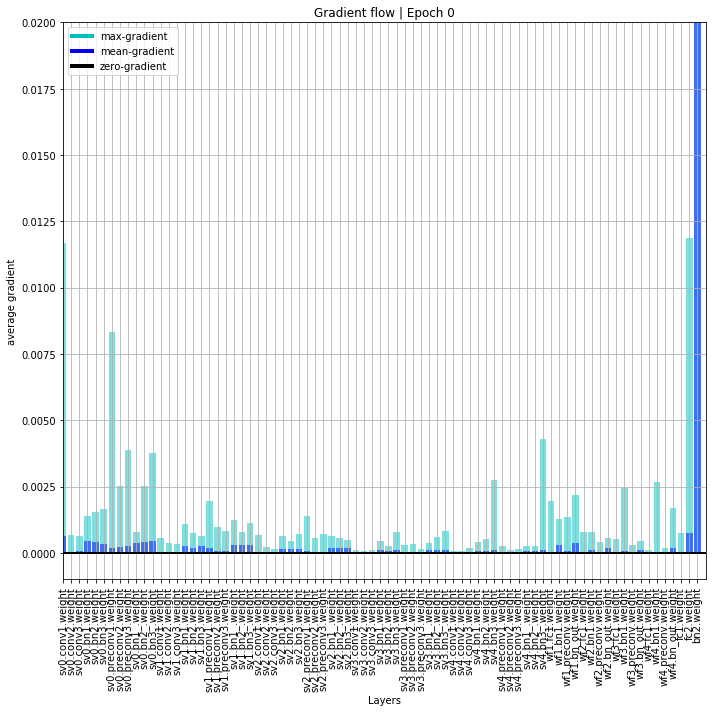

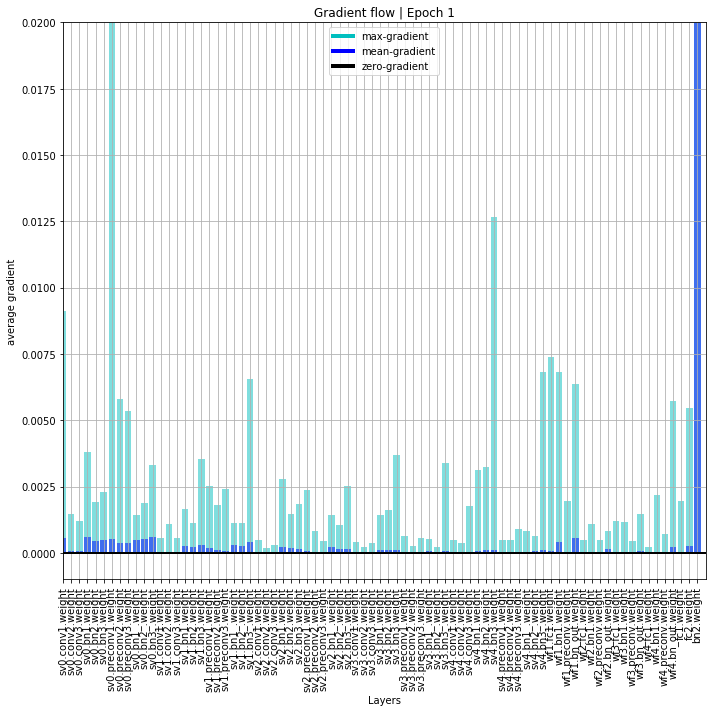

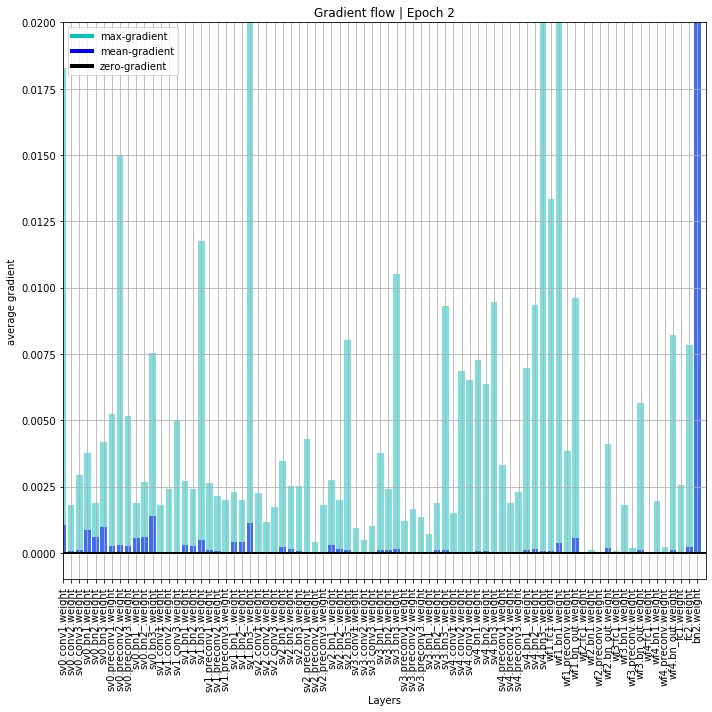

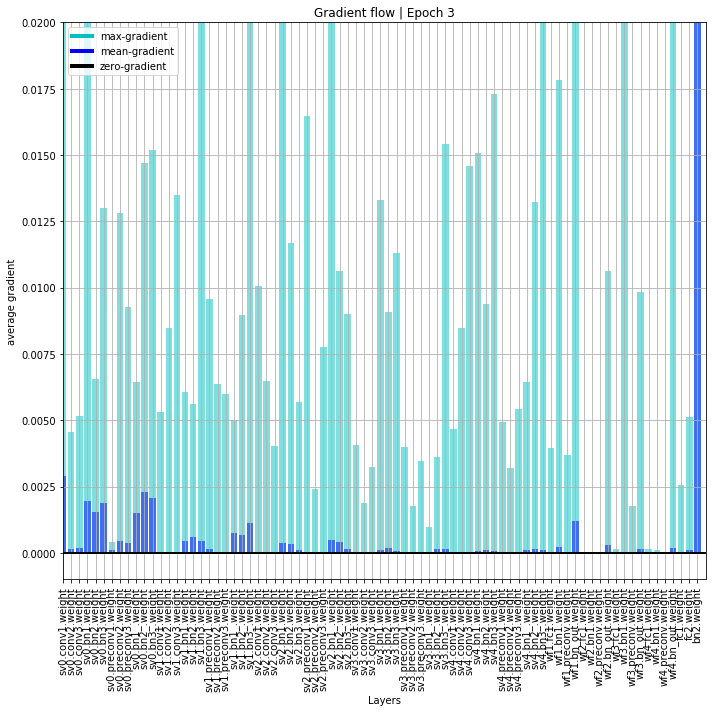

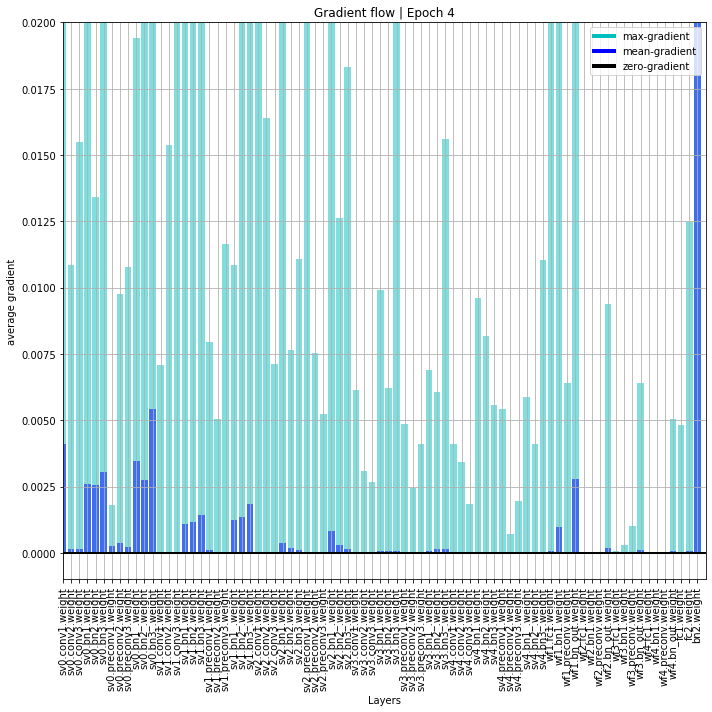

...

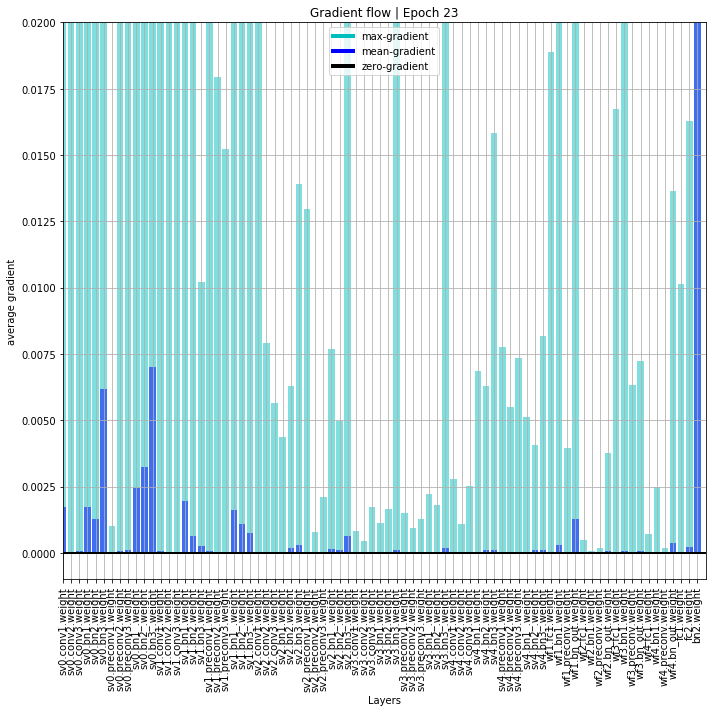

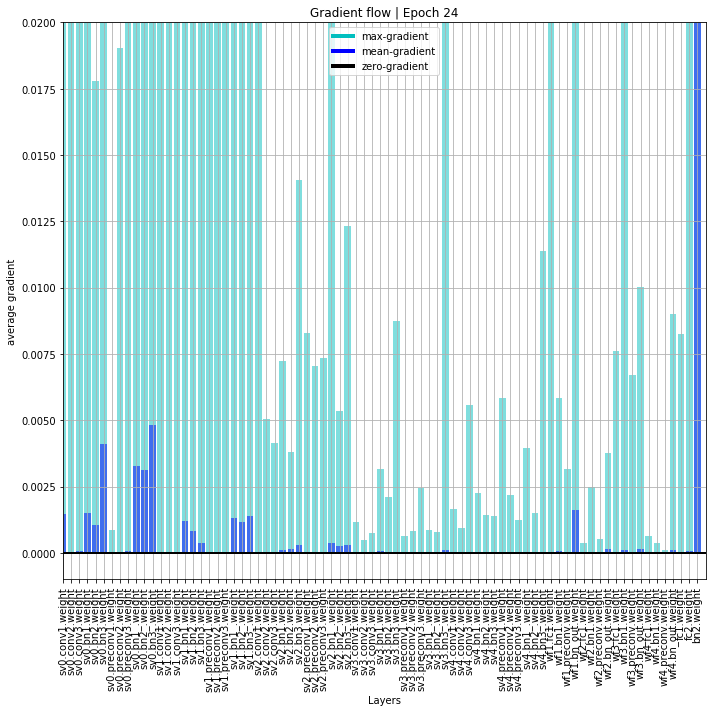

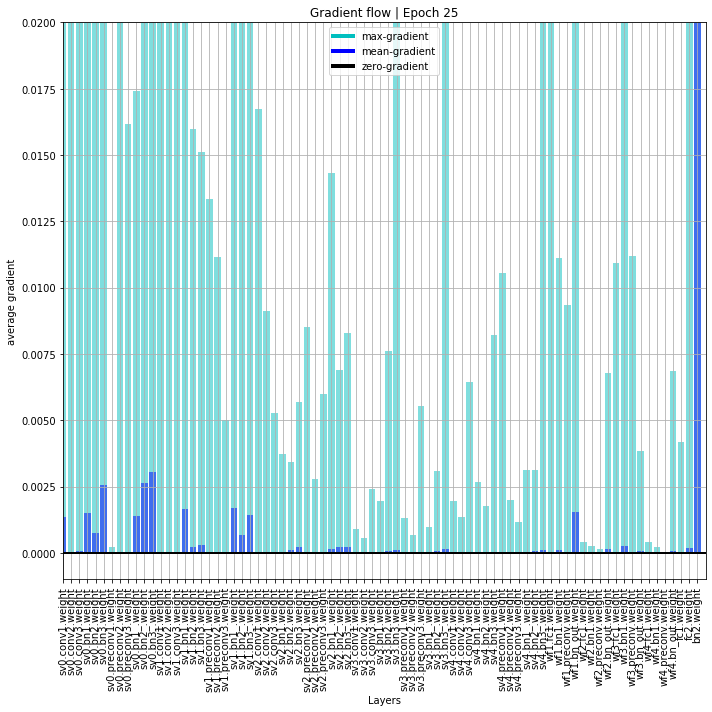

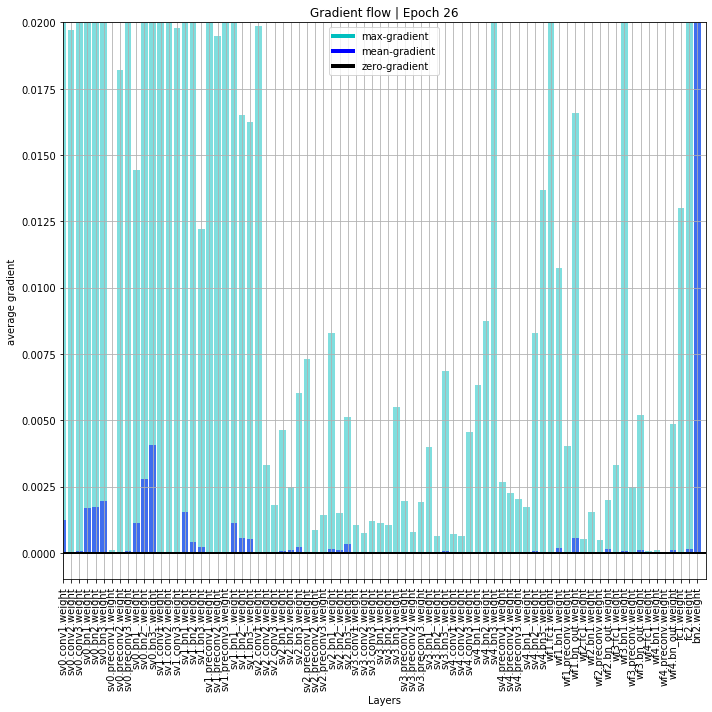

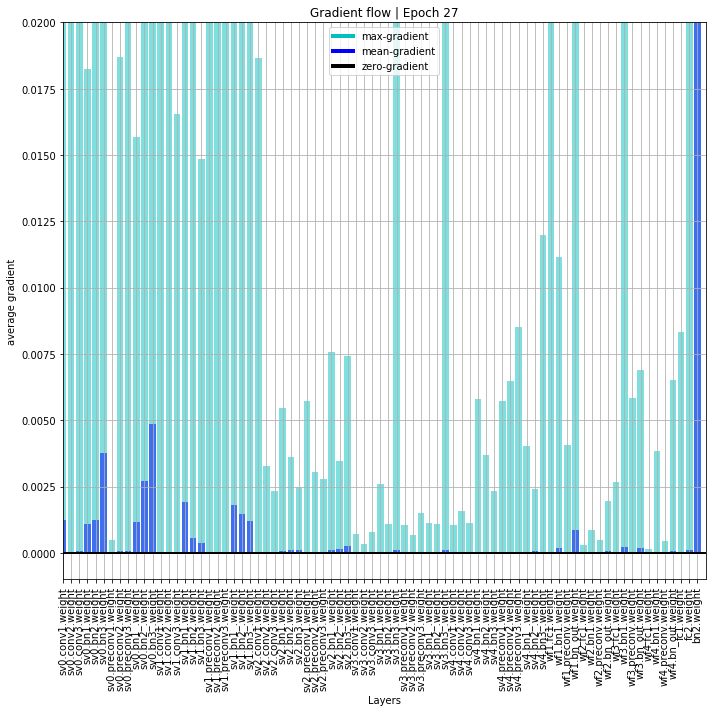

Error in callback <function flush_figures at 0x7f0c7616a598> (for post_execute):


KeyboardInterrupt: 

In [11]:
model = model.to(device)

model_folder = '/tf/data/Quan/fer2013/backtobasics/svgg4/'
model_name = 'svgg_resnet'
model_path = os.path.join(model_folder, model_name + '.pt')

best_acc = 0.0
curloss = 0.0
hist = []

for epoch in range(150):  # loop over the dataset multiple times
    
    print('Epoch: ', epoch + 1)
    running_loss = 0.0
    running_acc = 0.0

    # TRAIN
    model.train()
    for i, data in enumerate(train_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)
        loss.backward()
        
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        running_acc += acc
        print('\t - Step %d: loss: %.3f acc: %.3f' % (i+1, loss.item(), acc))

    print('- Avg.loss: %.3f  | Avg.acc: %.3f' % (running_loss / (i+1), running_acc / (i+1)))
    avgloss = running_loss / (i+1)
    avgacc = running_acc / (i+1)
    
    # print gradient flow figure
    plot_grad_flow(model.named_parameters(), epoch,
                   savepath=os.path.join(model_folder, model_name + '_gf' + '_' + str(epoch) + '.png'))

    # EVALUATE
    model.eval()
    running_valloss = 0.0
    running_valacc = 0.0
    for i,data in enumerate(val_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)

        running_valloss += loss.item()
        running_valacc += acc

    print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))

    avgvalloss = running_valloss / (i+1)
    avgvalcc = running_valacc / (i+1)

    hist.append([avgloss, avgvalloss, avgacc, avgvalcc])
    
    if best_acc < (running_valacc / (i+1)):
        best_acc = (running_valacc / (i+1))
        curloss = (running_valloss / (i+1))
        torch.save(model, model_path)
        print('* Update optimal model')

print('Finished Training')

In [15]:
import imageio
images = []
for i in range(41):
    images.append(imageio.imread('/tf/data/Quan/fer2013/backtobasics/svgg4/svgg_resnet_gf_' + str(i) + '.png'))
imageio.mimsave('/tf/data/Quan/fer2013/backtobasics/svgg4/svgg_resnet_gf.gif', images)

([<matplotlib.lines.Line2D at 0x7f0c36bec3c8>,
 0.31567982466597305,
 1.6683553352690579)

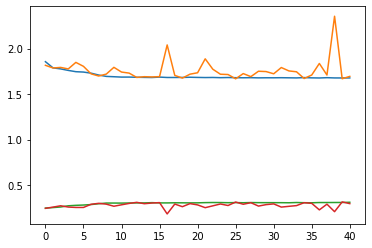

In [12]:
plt.plot(hist), best_acc, curloss

The model learned too bad, I think may be the classifier too complicated. Besides, our WeightedFeature layer plays an "sub-classifier", so may be there is no need to add extra fc layer, then I will remove the "fc1" and try again in SVGG5. I will also consider to attach classifier on each block

## SVGG 5

In [6]:
class SVblock(nn.Module):
    def __init__(self, in_neurons, nb_neurons, kernel_size=(3,3), batch_norm=True, activation='relu', **kwargs):
        '''
    in_neurons: C_in
    nb_neurons: n_filters of conv2d
    '''
        super(SVblock, self).__init__()

        self.index = kwargs['index'] if 'index' in kwargs else None
        self.conv1 = nn.Conv2d(in_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv2 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv3 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        
        self.bn1 = nn.BatchNorm2d(nb_neurons)
        self.bn2 = nn.BatchNorm2d(nb_neurons)
        self.bn3 = nn.BatchNorm2d(nb_neurons)
        
        self.preconv1 = nn.Conv2d(in_neurons, nb_neurons, kernel_size=1)
        self.preconv2 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=1)
        self.preconv3 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=1)
        self.bn1_ = nn.BatchNorm2d(nb_neurons)
        self.bn2_ = nn.BatchNorm2d(nb_neurons)
        self.bn3_ = nn.BatchNorm2d(nb_neurons)
        
        self.relu = nn.LeakyReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=(2,2), stride=2)
     


    def forward(self, x):        
        
        x0_res = self.preconv1(x)
        x0_res = self.bn1_(x0_res)
        
        # 1st
        x1 = self.conv1(x)
        x1 = self.bn1(x1)
        x1 = self.relu(x1)
        
        x1 = x1 + x0_res
        x1_res = self.preconv2(x1)
        x1_res = self.bn2_(x1_res)

        # 2nd
        x2 = self.conv2(x1)
        x2 = self.bn2(x2)
        x2 = self.relu(x2)
        
        x2 = x2 + x1_res
        x2_res = self.preconv3(x2)
        x2_res = self.bn3_(x2_res)
        
        # 3rd
        x3 = self.conv3(x2)
        x3 = self.bn3(x3)
        x3 = self.relu(x3)
        
        x3 = x3 + x2_res

        # maxpooling
        x_out = self.maxpool(x3)

        return x_out

In [7]:
class WeightFeature(nn.Module):
    def __init__(self, feature_depth, target_depth):
        super(WeightFeature, self).__init__()

        self.target_depth = target_depth
        self.fc1 = nn.Linear(feature_depth, target_depth)
        self.bn1 = nn.BatchNorm1d(target_depth)
        self.preconv = nn.Conv2d(target_depth, target_depth, kernel_size=1)
        self.relu = nn.LeakyReLU()
        self.bn_out = nn.BatchNorm2d(target_depth)
        
    def forward(self, x1, x2):
        x1 = nn.AvgPool2d(kernel_size=(x1.size(-2), x1.size(-1)))(x1)
        x1 = nn.Flatten()(x1)

        x1 = self.fc1(x1)
        x1 = self.bn1(x1)
        x1 = self.relu(x1)
        x1 = x1.unsqueeze(-1).unsqueeze(-1)

        _x2 = self.preconv(x2)
        
        x = torch.mul(_x2,x1)
        x = x + x2
        x = self.bn_out(x)

        return x

In [8]:
class SVGG(nn.Module):
    
    def __init__(self, **kwargs):
        super(SVGG, self).__init__()

        self.device = torch.device('cpu') if not 'device' in kwargs else kwargs['device']

        self.sv0 = SVblock(1, 64).to(self.device)
        self.sv1 = SVblock(64, 128).to(self.device)
        self.sv2 = SVblock(128, 256).to(self.device)
        self.sv3 = SVblock(256, 512).to(self.device)
        self.sv4 = SVblock(512, 1024).to(self.device)

        self.wf1 = WeightFeature(64, 128).to(self.device)
        self.wf2 = WeightFeature(128, 256).to(self.device)
        self.wf3 = WeightFeature(256, 512).to(self.device)
        self.wf4 = WeightFeature(512, 1024).to(self.device)

        self.fc2 = nn.Linear(1024, 7)
        self.bn2 = nn.BatchNorm1d(7)
        
    
    def forward(self, x):
        x0 = self.sv0(x)

        x1 = self.sv1(x0)
        x_wf1 = self.wf1(x0, x1)

        x2 = self.sv2(x_wf1)
        x_wf2 = self.wf2(x1, x2)

        x3 = self.sv3(x_wf2)
        x_wf3 = self.wf3(x2, x3)
        
        x4 = self.sv4(x_wf3)
        x_wf4 = self.wf4(x3, x4)

        x_wf4 = nn.AvgPool2d(kernel_size=(x_wf4.size(-2), x_wf4.size(-1)))(x_wf4)
    
        x = nn.Flatten()(x_wf4)

        x = self.fc2(x)
        x = self.bn2(x)

        return x

In [9]:
device = torch.device('cuda')
print(device)

model = SVGG(device=device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.003, weight_decay=5e-4)


cuda


Epoch:  1
	 - Step 1: loss: 2.445 acc: 0.125
	 - Step 2: loss: 2.195 acc: 0.172
	 - Step 3: loss: 2.071 acc: 0.172
	 - Step 4: loss: 2.104 acc: 0.078
	 - Step 5: loss: 1.922 acc: 0.219
	 - Step 6: loss: 1.954 acc: 0.141
	 - Step 7: loss: 1.987 acc: 0.062
	 - Step 8: loss: 1.927 acc: 0.266
	 - Step 9: loss: 1.902 acc: 0.141
	 - Step 10: loss: 1.930 acc: 0.203
	 - Step 11: loss: 1.917 acc: 0.172
	 - Step 12: loss: 1.940 acc: 0.219
	 - Step 13: loss: 1.914 acc: 0.172
	 - Step 14: loss: 1.921 acc: 0.188
	 - Step 15: loss: 1.912 acc: 0.219
	 - Step 16: loss: 1.951 acc: 0.188
	 - Step 17: loss: 1.909 acc: 0.188
	 - Step 18: loss: 1.876 acc: 0.297
	 - Step 19: loss: 1.852 acc: 0.344
	 - Step 20: loss: 1.896 acc: 0.219
	 - Step 21: loss: 1.876 acc: 0.281
	 - Step 22: loss: 1.925 acc: 0.219
	 - Step 23: loss: 1.903 acc: 0.188
	 - Step 24: loss: 1.878 acc: 0.344
	 - Step 25: loss: 1.955 acc: 0.062
	 - Step 26: loss: 1.879 acc: 0.203
	 - Step 27: loss: 1.879 acc: 0.219
	 - Step 28: loss: 1.953 ac

	 - Step 227: loss: 1.850 acc: 0.219
	 - Step 228: loss: 1.825 acc: 0.266
	 - Step 229: loss: 1.828 acc: 0.188
	 - Step 230: loss: 1.829 acc: 0.250
	 - Step 231: loss: 1.822 acc: 0.250
	 - Step 232: loss: 1.838 acc: 0.219
	 - Step 233: loss: 1.784 acc: 0.266
	 - Step 234: loss: 1.851 acc: 0.156
	 - Step 235: loss: 1.802 acc: 0.281
	 - Step 236: loss: 1.832 acc: 0.219
	 - Step 237: loss: 1.787 acc: 0.312
	 - Step 238: loss: 1.846 acc: 0.219
	 - Step 239: loss: 1.823 acc: 0.219
	 - Step 240: loss: 1.874 acc: 0.266
	 - Step 241: loss: 1.760 acc: 0.266
	 - Step 242: loss: 1.870 acc: 0.250
	 - Step 243: loss: 1.809 acc: 0.266
	 - Step 244: loss: 1.800 acc: 0.266
	 - Step 245: loss: 1.835 acc: 0.172
	 - Step 246: loss: 1.836 acc: 0.297
	 - Step 247: loss: 1.806 acc: 0.234
	 - Step 248: loss: 1.831 acc: 0.250
	 - Step 249: loss: 1.823 acc: 0.219
	 - Step 250: loss: 1.838 acc: 0.297
	 - Step 251: loss: 1.895 acc: 0.109
	 - Step 252: loss: 1.757 acc: 0.312
	 - Step 253: loss: 1.828 acc: 0.328
	

	 - Step 449: loss: 1.797 acc: 0.243
- Avg.loss: 1.840  | Avg.acc: 0.245
- Avg. val_loss: 1.814  | Avg. val_acc: 0.250
* Update optimal model
Epoch:  2


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVGG. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVblock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type WeightFeature. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


	 - Step 1: loss: 1.832 acc: 0.234
	 - Step 2: loss: 1.779 acc: 0.312
	 - Step 3: loss: 1.769 acc: 0.312
	 - Step 4: loss: 1.817 acc: 0.312
	 - Step 5: loss: 1.826 acc: 0.219
	 - Step 6: loss: 1.768 acc: 0.203
	 - Step 7: loss: 1.785 acc: 0.297
	 - Step 8: loss: 1.792 acc: 0.172
	 - Step 9: loss: 1.768 acc: 0.188
	 - Step 10: loss: 1.903 acc: 0.172
	 - Step 11: loss: 1.777 acc: 0.359
	 - Step 12: loss: 1.745 acc: 0.281
	 - Step 13: loss: 1.778 acc: 0.281
	 - Step 14: loss: 1.775 acc: 0.406
	 - Step 15: loss: 1.826 acc: 0.234
	 - Step 16: loss: 1.817 acc: 0.281
	 - Step 17: loss: 1.877 acc: 0.219
	 - Step 18: loss: 1.796 acc: 0.297
	 - Step 19: loss: 1.787 acc: 0.281
	 - Step 20: loss: 1.793 acc: 0.297
	 - Step 21: loss: 1.790 acc: 0.219
	 - Step 22: loss: 1.758 acc: 0.328
	 - Step 23: loss: 1.822 acc: 0.250
	 - Step 24: loss: 1.822 acc: 0.219
	 - Step 25: loss: 1.774 acc: 0.297
	 - Step 26: loss: 1.798 acc: 0.234
	 - Step 27: loss: 1.762 acc: 0.328
	 - Step 28: loss: 1.810 acc: 0.219
	

	 - Step 227: loss: 1.802 acc: 0.250
	 - Step 228: loss: 1.802 acc: 0.266
	 - Step 229: loss: 1.796 acc: 0.297
	 - Step 230: loss: 1.790 acc: 0.234
	 - Step 231: loss: 1.777 acc: 0.266
	 - Step 232: loss: 1.813 acc: 0.219
	 - Step 233: loss: 1.701 acc: 0.328
	 - Step 234: loss: 1.783 acc: 0.281
	 - Step 235: loss: 1.780 acc: 0.297
	 - Step 236: loss: 1.808 acc: 0.250
	 - Step 237: loss: 1.793 acc: 0.109
	 - Step 238: loss: 1.902 acc: 0.188
	 - Step 239: loss: 1.784 acc: 0.250
	 - Step 240: loss: 1.792 acc: 0.219
	 - Step 241: loss: 1.715 acc: 0.312
	 - Step 242: loss: 1.847 acc: 0.281
	 - Step 243: loss: 1.718 acc: 0.266
	 - Step 244: loss: 1.772 acc: 0.281
	 - Step 245: loss: 1.793 acc: 0.297
	 - Step 246: loss: 1.745 acc: 0.312
	 - Step 247: loss: 1.827 acc: 0.219
	 - Step 248: loss: 1.796 acc: 0.219
	 - Step 249: loss: 1.824 acc: 0.203
	 - Step 250: loss: 1.794 acc: 0.250
	 - Step 251: loss: 1.813 acc: 0.234
	 - Step 252: loss: 1.766 acc: 0.406
	 - Step 253: loss: 1.743 acc: 0.266
	

	 - Step 449: loss: 1.752 acc: 0.243
- Avg.loss: 1.779  | Avg.acc: 0.266
- Avg. val_loss: 1.787  | Avg. val_acc: 0.258
* Update optimal model
Epoch:  3
	 - Step 1: loss: 1.727 acc: 0.297
	 - Step 2: loss: 1.765 acc: 0.219
	 - Step 3: loss: 1.759 acc: 0.266
	 - Step 4: loss: 1.782 acc: 0.250
	 - Step 5: loss: 1.715 acc: 0.281
	 - Step 6: loss: 1.716 acc: 0.312
	 - Step 7: loss: 1.743 acc: 0.297
	 - Step 8: loss: 1.757 acc: 0.297
	 - Step 9: loss: 1.679 acc: 0.391
	 - Step 10: loss: 1.724 acc: 0.266
	 - Step 11: loss: 1.794 acc: 0.234
	 - Step 12: loss: 1.783 acc: 0.266
	 - Step 13: loss: 1.678 acc: 0.281
	 - Step 14: loss: 1.715 acc: 0.297
	 - Step 15: loss: 1.702 acc: 0.266
	 - Step 16: loss: 1.764 acc: 0.312
	 - Step 17: loss: 1.708 acc: 0.281
	 - Step 18: loss: 1.795 acc: 0.234
	 - Step 19: loss: 1.676 acc: 0.281
	 - Step 20: loss: 1.714 acc: 0.328
	 - Step 21: loss: 1.696 acc: 0.406
	 - Step 22: loss: 1.710 acc: 0.266
	 - Step 23: loss: 1.790 acc: 0.266
	 - Step 24: loss: 1.789 acc:

	 - Step 223: loss: 1.710 acc: 0.312
	 - Step 224: loss: 1.798 acc: 0.281
	 - Step 225: loss: 1.750 acc: 0.297
	 - Step 226: loss: 1.811 acc: 0.328
	 - Step 227: loss: 1.882 acc: 0.172
	 - Step 228: loss: 1.794 acc: 0.219
	 - Step 229: loss: 1.826 acc: 0.297
	 - Step 230: loss: 1.814 acc: 0.250
	 - Step 231: loss: 1.680 acc: 0.359
	 - Step 232: loss: 1.808 acc: 0.219
	 - Step 233: loss: 1.677 acc: 0.344
	 - Step 234: loss: 1.674 acc: 0.312
	 - Step 235: loss: 1.741 acc: 0.312
	 - Step 236: loss: 1.700 acc: 0.375
	 - Step 237: loss: 1.714 acc: 0.297
	 - Step 238: loss: 1.685 acc: 0.297
	 - Step 239: loss: 1.737 acc: 0.234
	 - Step 240: loss: 1.721 acc: 0.250
	 - Step 241: loss: 1.699 acc: 0.328
	 - Step 242: loss: 1.822 acc: 0.266
	 - Step 243: loss: 1.667 acc: 0.312
	 - Step 244: loss: 1.798 acc: 0.281
	 - Step 245: loss: 1.674 acc: 0.312
	 - Step 246: loss: 1.711 acc: 0.281
	 - Step 247: loss: 1.792 acc: 0.203
	 - Step 248: loss: 1.713 acc: 0.359
	 - Step 249: loss: 1.633 acc: 0.406
	

	 - Step 445: loss: 1.680 acc: 0.312
	 - Step 446: loss: 1.681 acc: 0.359
	 - Step 447: loss: 1.706 acc: 0.328
	 - Step 448: loss: 1.665 acc: 0.391
	 - Step 449: loss: 1.887 acc: 0.216
- Avg.loss: 1.750  | Avg.acc: 0.281
- Avg. val_loss: 1.785  | Avg. val_acc: 0.261
* Update optimal model
Epoch:  4
	 - Step 1: loss: 1.851 acc: 0.219
	 - Step 2: loss: 1.780 acc: 0.328
	 - Step 3: loss: 1.739 acc: 0.266
	 - Step 4: loss: 1.759 acc: 0.312
	 - Step 5: loss: 1.725 acc: 0.234
	 - Step 6: loss: 1.890 acc: 0.281
	 - Step 7: loss: 1.761 acc: 0.281
	 - Step 8: loss: 1.748 acc: 0.281
	 - Step 9: loss: 1.784 acc: 0.234
	 - Step 10: loss: 1.672 acc: 0.312
	 - Step 11: loss: 1.737 acc: 0.281
	 - Step 12: loss: 1.777 acc: 0.281
	 - Step 13: loss: 1.782 acc: 0.203
	 - Step 14: loss: 1.802 acc: 0.203
	 - Step 15: loss: 1.653 acc: 0.344
	 - Step 16: loss: 1.659 acc: 0.422
	 - Step 17: loss: 1.734 acc: 0.297
	 - Step 18: loss: 1.746 acc: 0.391
	 - Step 19: loss: 1.672 acc: 0.391
	 - Step 20: loss: 1.671 

	 - Step 219: loss: 1.763 acc: 0.219
	 - Step 220: loss: 1.679 acc: 0.375
	 - Step 221: loss: 1.787 acc: 0.266
	 - Step 222: loss: 1.796 acc: 0.266
	 - Step 223: loss: 1.673 acc: 0.344
	 - Step 224: loss: 1.702 acc: 0.312
	 - Step 225: loss: 1.712 acc: 0.328
	 - Step 226: loss: 1.834 acc: 0.250
	 - Step 227: loss: 1.655 acc: 0.297
	 - Step 228: loss: 1.786 acc: 0.234
	 - Step 229: loss: 1.590 acc: 0.422
	 - Step 230: loss: 1.714 acc: 0.312
	 - Step 231: loss: 1.724 acc: 0.359
	 - Step 232: loss: 1.624 acc: 0.422
	 - Step 233: loss: 1.764 acc: 0.219
	 - Step 234: loss: 1.736 acc: 0.297
	 - Step 235: loss: 1.695 acc: 0.297
	 - Step 236: loss: 1.701 acc: 0.344
	 - Step 237: loss: 1.774 acc: 0.266
	 - Step 238: loss: 1.636 acc: 0.391
	 - Step 239: loss: 1.706 acc: 0.312
	 - Step 240: loss: 1.717 acc: 0.250
	 - Step 241: loss: 1.735 acc: 0.234
	 - Step 242: loss: 1.723 acc: 0.266
	 - Step 243: loss: 1.670 acc: 0.359
	 - Step 244: loss: 1.855 acc: 0.172
	 - Step 245: loss: 1.725 acc: 0.266
	

	 - Step 441: loss: 1.748 acc: 0.391
	 - Step 442: loss: 1.623 acc: 0.359
	 - Step 443: loss: 1.790 acc: 0.266
	 - Step 444: loss: 1.814 acc: 0.312
	 - Step 445: loss: 1.704 acc: 0.281
	 - Step 446: loss: 1.764 acc: 0.219
	 - Step 447: loss: 1.779 acc: 0.281
	 - Step 448: loss: 1.811 acc: 0.141
	 - Step 449: loss: 1.617 acc: 0.297
- Avg.loss: 1.732  | Avg.acc: 0.290
- Avg. val_loss: 1.707  | Avg. val_acc: 0.289
* Update optimal model
Epoch:  5
	 - Step 1: loss: 1.664 acc: 0.297
	 - Step 2: loss: 1.737 acc: 0.266
	 - Step 3: loss: 1.828 acc: 0.219
	 - Step 4: loss: 1.713 acc: 0.328
	 - Step 5: loss: 1.668 acc: 0.375
	 - Step 6: loss: 1.660 acc: 0.359
	 - Step 7: loss: 1.643 acc: 0.281
	 - Step 8: loss: 1.674 acc: 0.344
	 - Step 9: loss: 1.710 acc: 0.250
	 - Step 10: loss: 1.684 acc: 0.250
	 - Step 11: loss: 1.689 acc: 0.359
	 - Step 12: loss: 1.757 acc: 0.328
	 - Step 13: loss: 1.669 acc: 0.297
	 - Step 14: loss: 1.686 acc: 0.312
	 - Step 15: loss: 1.789 acc: 0.234
	 - Step 16: loss: 1.

	 - Step 215: loss: 1.703 acc: 0.328
	 - Step 216: loss: 1.729 acc: 0.234
	 - Step 217: loss: 1.714 acc: 0.375
	 - Step 218: loss: 1.783 acc: 0.297
	 - Step 219: loss: 1.694 acc: 0.328
	 - Step 220: loss: 1.808 acc: 0.250
	 - Step 221: loss: 1.756 acc: 0.312
	 - Step 222: loss: 1.819 acc: 0.250
	 - Step 223: loss: 1.746 acc: 0.281
	 - Step 224: loss: 1.590 acc: 0.328
	 - Step 225: loss: 1.670 acc: 0.375
	 - Step 226: loss: 1.792 acc: 0.203
	 - Step 227: loss: 1.638 acc: 0.344
	 - Step 228: loss: 1.713 acc: 0.203
	 - Step 229: loss: 1.793 acc: 0.250
	 - Step 230: loss: 1.590 acc: 0.391
	 - Step 231: loss: 1.716 acc: 0.344
	 - Step 232: loss: 1.716 acc: 0.359
	 - Step 233: loss: 1.652 acc: 0.312
	 - Step 234: loss: 1.635 acc: 0.344
	 - Step 235: loss: 1.625 acc: 0.328
	 - Step 236: loss: 1.576 acc: 0.406
	 - Step 237: loss: 1.722 acc: 0.281
	 - Step 238: loss: 1.729 acc: 0.266
	 - Step 239: loss: 1.738 acc: 0.297
	 - Step 240: loss: 1.708 acc: 0.297
	 - Step 241: loss: 1.777 acc: 0.328
	

	 - Step 437: loss: 1.833 acc: 0.297
	 - Step 438: loss: 1.711 acc: 0.375
	 - Step 439: loss: 1.700 acc: 0.281
	 - Step 440: loss: 1.734 acc: 0.266
	 - Step 441: loss: 1.705 acc: 0.297
	 - Step 442: loss: 1.715 acc: 0.297
	 - Step 443: loss: 1.682 acc: 0.359
	 - Step 444: loss: 1.774 acc: 0.297
	 - Step 445: loss: 1.723 acc: 0.281
	 - Step 446: loss: 1.577 acc: 0.438
	 - Step 447: loss: 1.692 acc: 0.297
	 - Step 448: loss: 1.648 acc: 0.297
	 - Step 449: loss: 1.612 acc: 0.459
- Avg.loss: 1.700  | Avg.acc: 0.307
- Avg. val_loss: 1.807  | Avg. val_acc: 0.271
Epoch:  6
	 - Step 1: loss: 1.724 acc: 0.344
	 - Step 2: loss: 1.744 acc: 0.234
	 - Step 3: loss: 1.779 acc: 0.281
	 - Step 4: loss: 1.749 acc: 0.297
	 - Step 5: loss: 1.556 acc: 0.438
	 - Step 6: loss: 1.692 acc: 0.359
	 - Step 7: loss: 1.637 acc: 0.391
	 - Step 8: loss: 1.600 acc: 0.438
	 - Step 9: loss: 1.782 acc: 0.375
	 - Step 10: loss: 1.664 acc: 0.297
	 - Step 11: loss: 1.791 acc: 0.266
	 - Step 12: loss: 1.691 acc: 0.297
	 - 

	 - Step 211: loss: 1.653 acc: 0.328
	 - Step 212: loss: 1.686 acc: 0.344
	 - Step 213: loss: 1.662 acc: 0.297
	 - Step 214: loss: 1.618 acc: 0.375
	 - Step 215: loss: 1.735 acc: 0.188
	 - Step 216: loss: 1.545 acc: 0.453
	 - Step 217: loss: 1.629 acc: 0.391
	 - Step 218: loss: 1.707 acc: 0.312
	 - Step 219: loss: 1.676 acc: 0.312
	 - Step 220: loss: 1.618 acc: 0.375
	 - Step 221: loss: 1.642 acc: 0.297
	 - Step 222: loss: 1.761 acc: 0.281
	 - Step 223: loss: 1.514 acc: 0.406
	 - Step 224: loss: 1.611 acc: 0.312
	 - Step 225: loss: 1.787 acc: 0.156
	 - Step 226: loss: 1.651 acc: 0.297
	 - Step 227: loss: 1.665 acc: 0.375
	 - Step 228: loss: 1.590 acc: 0.375
	 - Step 229: loss: 1.551 acc: 0.375
	 - Step 230: loss: 1.587 acc: 0.375
	 - Step 231: loss: 1.694 acc: 0.391
	 - Step 232: loss: 1.652 acc: 0.281
	 - Step 233: loss: 1.676 acc: 0.250
	 - Step 234: loss: 1.676 acc: 0.266
	 - Step 235: loss: 1.679 acc: 0.328
	 - Step 236: loss: 1.542 acc: 0.453
	 - Step 237: loss: 1.609 acc: 0.359
	

	 - Step 433: loss: 1.695 acc: 0.312
	 - Step 434: loss: 1.635 acc: 0.375
	 - Step 435: loss: 1.631 acc: 0.359
	 - Step 436: loss: 1.670 acc: 0.391
	 - Step 437: loss: 1.587 acc: 0.406
	 - Step 438: loss: 1.779 acc: 0.297
	 - Step 439: loss: 1.753 acc: 0.328
	 - Step 440: loss: 1.698 acc: 0.266
	 - Step 441: loss: 1.642 acc: 0.375
	 - Step 442: loss: 1.787 acc: 0.203
	 - Step 443: loss: 1.755 acc: 0.203
	 - Step 444: loss: 1.738 acc: 0.234
	 - Step 445: loss: 1.611 acc: 0.344
	 - Step 446: loss: 1.821 acc: 0.141
	 - Step 447: loss: 1.549 acc: 0.375
	 - Step 448: loss: 1.682 acc: 0.250
	 - Step 449: loss: 1.600 acc: 0.378
- Avg.loss: 1.684  | Avg.acc: 0.317
- Avg. val_loss: 1.695  | Avg. val_acc: 0.310
* Update optimal model
Epoch:  7
	 - Step 1: loss: 1.758 acc: 0.375
	 - Step 2: loss: 1.682 acc: 0.219
	 - Step 3: loss: 1.736 acc: 0.328
	 - Step 4: loss: 1.774 acc: 0.297
	 - Step 5: loss: 1.575 acc: 0.406
	 - Step 6: loss: 1.758 acc: 0.234
	 - Step 7: loss: 1.625 acc: 0.375
	 - Step 8:

	 - Step 207: loss: 1.636 acc: 0.328
	 - Step 208: loss: 1.668 acc: 0.375
	 - Step 209: loss: 1.627 acc: 0.328
	 - Step 210: loss: 1.756 acc: 0.266
	 - Step 211: loss: 1.811 acc: 0.234
	 - Step 212: loss: 1.806 acc: 0.219
	 - Step 213: loss: 1.652 acc: 0.297
	 - Step 214: loss: 1.638 acc: 0.297
	 - Step 215: loss: 1.623 acc: 0.375
	 - Step 216: loss: 1.583 acc: 0.391
	 - Step 217: loss: 1.630 acc: 0.328
	 - Step 218: loss: 1.433 acc: 0.453
	 - Step 219: loss: 1.647 acc: 0.422
	 - Step 220: loss: 1.659 acc: 0.281
	 - Step 221: loss: 1.534 acc: 0.344
	 - Step 222: loss: 1.625 acc: 0.328
	 - Step 223: loss: 1.781 acc: 0.344
	 - Step 224: loss: 1.617 acc: 0.344
	 - Step 225: loss: 1.722 acc: 0.328
	 - Step 226: loss: 1.630 acc: 0.344
	 - Step 227: loss: 1.765 acc: 0.266
	 - Step 228: loss: 1.656 acc: 0.328
	 - Step 229: loss: 1.720 acc: 0.266
	 - Step 230: loss: 1.702 acc: 0.312
	 - Step 231: loss: 1.648 acc: 0.328
	 - Step 232: loss: 1.672 acc: 0.328
	 - Step 233: loss: 1.693 acc: 0.297
	

	 - Step 429: loss: 1.705 acc: 0.312
	 - Step 430: loss: 1.617 acc: 0.391
	 - Step 431: loss: 1.625 acc: 0.375
	 - Step 432: loss: 1.496 acc: 0.453
	 - Step 433: loss: 1.749 acc: 0.328
	 - Step 434: loss: 1.691 acc: 0.391
	 - Step 435: loss: 1.494 acc: 0.500
	 - Step 436: loss: 1.560 acc: 0.453
	 - Step 437: loss: 1.561 acc: 0.328
	 - Step 438: loss: 1.698 acc: 0.328
	 - Step 439: loss: 1.720 acc: 0.281
	 - Step 440: loss: 1.704 acc: 0.281
	 - Step 441: loss: 1.516 acc: 0.484
	 - Step 442: loss: 1.659 acc: 0.359
	 - Step 443: loss: 1.709 acc: 0.250
	 - Step 444: loss: 1.599 acc: 0.422
	 - Step 445: loss: 1.635 acc: 0.406
	 - Step 446: loss: 1.580 acc: 0.406
	 - Step 447: loss: 1.752 acc: 0.219
	 - Step 448: loss: 1.590 acc: 0.438
	 - Step 449: loss: 1.646 acc: 0.270
- Avg.loss: 1.666  | Avg.acc: 0.326
- Avg. val_loss: 1.763  | Avg. val_acc: 0.288
Epoch:  8
	 - Step 1: loss: 1.575 acc: 0.375
	 - Step 2: loss: 1.536 acc: 0.359
	 - Step 3: loss: 1.754 acc: 0.281
	 - Step 4: loss: 1.779 ac

	 - Step 203: loss: 1.637 acc: 0.406
	 - Step 204: loss: 1.548 acc: 0.359
	 - Step 205: loss: 1.644 acc: 0.406
	 - Step 206: loss: 1.657 acc: 0.453
	 - Step 207: loss: 1.638 acc: 0.328
	 - Step 208: loss: 1.552 acc: 0.422
	 - Step 209: loss: 1.578 acc: 0.391
	 - Step 210: loss: 1.547 acc: 0.375
	 - Step 211: loss: 1.714 acc: 0.203
	 - Step 212: loss: 1.562 acc: 0.406
	 - Step 213: loss: 1.740 acc: 0.312
	 - Step 214: loss: 1.542 acc: 0.359
	 - Step 215: loss: 1.691 acc: 0.328
	 - Step 216: loss: 1.651 acc: 0.344
	 - Step 217: loss: 1.650 acc: 0.297
	 - Step 218: loss: 1.494 acc: 0.422
	 - Step 219: loss: 1.676 acc: 0.359
	 - Step 220: loss: 1.614 acc: 0.328
	 - Step 221: loss: 1.547 acc: 0.422
	 - Step 222: loss: 1.680 acc: 0.250
	 - Step 223: loss: 1.697 acc: 0.297
	 - Step 224: loss: 1.625 acc: 0.328
	 - Step 225: loss: 1.707 acc: 0.391
	 - Step 226: loss: 1.697 acc: 0.250
	 - Step 227: loss: 1.657 acc: 0.328
	 - Step 228: loss: 1.561 acc: 0.391
	 - Step 229: loss: 1.659 acc: 0.375
	

	 - Step 425: loss: 1.499 acc: 0.406
	 - Step 426: loss: 1.730 acc: 0.281
	 - Step 427: loss: 1.591 acc: 0.438
	 - Step 428: loss: 1.620 acc: 0.344
	 - Step 429: loss: 1.548 acc: 0.375
	 - Step 430: loss: 1.622 acc: 0.297
	 - Step 431: loss: 1.601 acc: 0.312
	 - Step 432: loss: 1.482 acc: 0.438
	 - Step 433: loss: 1.636 acc: 0.328
	 - Step 434: loss: 1.617 acc: 0.312
	 - Step 435: loss: 1.790 acc: 0.297
	 - Step 436: loss: 1.490 acc: 0.422
	 - Step 437: loss: 1.777 acc: 0.344
	 - Step 438: loss: 1.700 acc: 0.312
	 - Step 439: loss: 1.783 acc: 0.359
	 - Step 440: loss: 1.575 acc: 0.406
	 - Step 441: loss: 1.601 acc: 0.391
	 - Step 442: loss: 1.512 acc: 0.375
	 - Step 443: loss: 1.640 acc: 0.328
	 - Step 444: loss: 1.568 acc: 0.469
	 - Step 445: loss: 1.554 acc: 0.359
	 - Step 446: loss: 1.578 acc: 0.375
	 - Step 447: loss: 1.764 acc: 0.281
	 - Step 448: loss: 1.590 acc: 0.422
	 - Step 449: loss: 1.627 acc: 0.297
- Avg.loss: 1.638  | Avg.acc: 0.343
- Avg. val_loss: 1.818  | Avg. val_acc:

	 - Step 199: loss: 1.651 acc: 0.359
	 - Step 200: loss: 1.504 acc: 0.359
	 - Step 201: loss: 1.624 acc: 0.375
	 - Step 202: loss: 1.509 acc: 0.406
	 - Step 203: loss: 1.587 acc: 0.297
	 - Step 204: loss: 1.735 acc: 0.359
	 - Step 205: loss: 1.632 acc: 0.422
	 - Step 206: loss: 1.790 acc: 0.328
	 - Step 207: loss: 1.596 acc: 0.312
	 - Step 208: loss: 1.698 acc: 0.297
	 - Step 209: loss: 1.609 acc: 0.344
	 - Step 210: loss: 1.563 acc: 0.422
	 - Step 211: loss: 1.595 acc: 0.344
	 - Step 212: loss: 1.700 acc: 0.328
	 - Step 213: loss: 1.735 acc: 0.312
	 - Step 214: loss: 1.605 acc: 0.375
	 - Step 215: loss: 1.672 acc: 0.281
	 - Step 216: loss: 1.619 acc: 0.422
	 - Step 217: loss: 1.651 acc: 0.406
	 - Step 218: loss: 1.574 acc: 0.359
	 - Step 219: loss: 1.582 acc: 0.375
	 - Step 220: loss: 1.874 acc: 0.297
	 - Step 221: loss: 1.571 acc: 0.422
	 - Step 222: loss: 1.508 acc: 0.469
	 - Step 223: loss: 1.618 acc: 0.375
	 - Step 224: loss: 1.592 acc: 0.359
	 - Step 225: loss: 1.562 acc: 0.297
	

	 - Step 421: loss: 1.694 acc: 0.297
	 - Step 422: loss: 1.570 acc: 0.344
	 - Step 423: loss: 1.651 acc: 0.328
	 - Step 424: loss: 1.670 acc: 0.328
	 - Step 425: loss: 1.721 acc: 0.422
	 - Step 426: loss: 1.427 acc: 0.438
	 - Step 427: loss: 1.446 acc: 0.422
	 - Step 428: loss: 1.587 acc: 0.391
	 - Step 429: loss: 1.740 acc: 0.344
	 - Step 430: loss: 1.689 acc: 0.312
	 - Step 431: loss: 1.519 acc: 0.375
	 - Step 432: loss: 1.522 acc: 0.375
	 - Step 433: loss: 1.525 acc: 0.484
	 - Step 434: loss: 1.658 acc: 0.312
	 - Step 435: loss: 1.689 acc: 0.266
	 - Step 436: loss: 1.618 acc: 0.438
	 - Step 437: loss: 1.597 acc: 0.359
	 - Step 438: loss: 1.597 acc: 0.375
	 - Step 439: loss: 1.515 acc: 0.344
	 - Step 440: loss: 1.645 acc: 0.422
	 - Step 441: loss: 1.493 acc: 0.406
	 - Step 442: loss: 1.561 acc: 0.328
	 - Step 443: loss: 1.559 acc: 0.359
	 - Step 444: loss: 1.556 acc: 0.328
	 - Step 445: loss: 1.511 acc: 0.422
	 - Step 446: loss: 1.519 acc: 0.438
	 - Step 447: loss: 1.672 acc: 0.406
	

	 - Step 195: loss: 1.628 acc: 0.359
	 - Step 196: loss: 1.669 acc: 0.250
	 - Step 197: loss: 1.698 acc: 0.328
	 - Step 198: loss: 1.539 acc: 0.438
	 - Step 199: loss: 1.586 acc: 0.391
	 - Step 200: loss: 1.663 acc: 0.312
	 - Step 201: loss: 1.721 acc: 0.344
	 - Step 202: loss: 1.610 acc: 0.375
	 - Step 203: loss: 1.592 acc: 0.391
	 - Step 204: loss: 1.592 acc: 0.359
	 - Step 205: loss: 1.677 acc: 0.297
	 - Step 206: loss: 1.696 acc: 0.375
	 - Step 207: loss: 1.510 acc: 0.422
	 - Step 208: loss: 1.584 acc: 0.375
	 - Step 209: loss: 1.598 acc: 0.219
	 - Step 210: loss: 1.470 acc: 0.375
	 - Step 211: loss: 1.503 acc: 0.438
	 - Step 212: loss: 1.549 acc: 0.422
	 - Step 213: loss: 1.669 acc: 0.375
	 - Step 214: loss: 1.501 acc: 0.422
	 - Step 215: loss: 1.633 acc: 0.359
	 - Step 216: loss: 1.376 acc: 0.469
	 - Step 217: loss: 1.634 acc: 0.312
	 - Step 218: loss: 1.559 acc: 0.469
	 - Step 219: loss: 1.526 acc: 0.422
	 - Step 220: loss: 1.552 acc: 0.453
	 - Step 221: loss: 1.367 acc: 0.562
	

	 - Step 417: loss: 1.381 acc: 0.484
	 - Step 418: loss: 1.351 acc: 0.562
	 - Step 419: loss: 1.417 acc: 0.469
	 - Step 420: loss: 1.545 acc: 0.375
	 - Step 421: loss: 1.623 acc: 0.375
	 - Step 422: loss: 1.479 acc: 0.406
	 - Step 423: loss: 1.462 acc: 0.469
	 - Step 424: loss: 1.516 acc: 0.328
	 - Step 425: loss: 1.656 acc: 0.375
	 - Step 426: loss: 1.604 acc: 0.375
	 - Step 427: loss: 1.790 acc: 0.234
	 - Step 428: loss: 1.522 acc: 0.375
	 - Step 429: loss: 1.534 acc: 0.406
	 - Step 430: loss: 1.738 acc: 0.312
	 - Step 431: loss: 1.588 acc: 0.344
	 - Step 432: loss: 1.558 acc: 0.375
	 - Step 433: loss: 1.503 acc: 0.375
	 - Step 434: loss: 1.511 acc: 0.359
	 - Step 435: loss: 1.556 acc: 0.375
	 - Step 436: loss: 1.530 acc: 0.391
	 - Step 437: loss: 1.592 acc: 0.391
	 - Step 438: loss: 1.590 acc: 0.312
	 - Step 439: loss: 1.417 acc: 0.500
	 - Step 440: loss: 1.663 acc: 0.297
	 - Step 441: loss: 1.412 acc: 0.422
	 - Step 442: loss: 1.426 acc: 0.422
	 - Step 443: loss: 1.555 acc: 0.422
	

	 - Step 191: loss: 1.298 acc: 0.531
	 - Step 192: loss: 1.549 acc: 0.406
	 - Step 193: loss: 1.457 acc: 0.500
	 - Step 194: loss: 1.502 acc: 0.406
	 - Step 195: loss: 1.623 acc: 0.391
	 - Step 196: loss: 1.539 acc: 0.391
	 - Step 197: loss: 1.515 acc: 0.375
	 - Step 198: loss: 1.431 acc: 0.453
	 - Step 199: loss: 1.711 acc: 0.344
	 - Step 200: loss: 1.500 acc: 0.391
	 - Step 201: loss: 1.502 acc: 0.391
	 - Step 202: loss: 1.527 acc: 0.438
	 - Step 203: loss: 1.552 acc: 0.359
	 - Step 204: loss: 1.585 acc: 0.453
	 - Step 205: loss: 1.451 acc: 0.500
	 - Step 206: loss: 1.594 acc: 0.312
	 - Step 207: loss: 1.621 acc: 0.344
	 - Step 208: loss: 1.513 acc: 0.438
	 - Step 209: loss: 1.527 acc: 0.391
	 - Step 210: loss: 1.611 acc: 0.375
	 - Step 211: loss: 1.574 acc: 0.406
	 - Step 212: loss: 1.557 acc: 0.375
	 - Step 213: loss: 1.582 acc: 0.359
	 - Step 214: loss: 1.740 acc: 0.281
	 - Step 215: loss: 1.607 acc: 0.406
	 - Step 216: loss: 1.627 acc: 0.422
	 - Step 217: loss: 1.516 acc: 0.391
	

	 - Step 413: loss: 1.602 acc: 0.359
	 - Step 414: loss: 1.435 acc: 0.469
	 - Step 415: loss: 1.676 acc: 0.328
	 - Step 416: loss: 1.498 acc: 0.328
	 - Step 417: loss: 1.519 acc: 0.391
	 - Step 418: loss: 1.757 acc: 0.219
	 - Step 419: loss: 1.555 acc: 0.391
	 - Step 420: loss: 1.598 acc: 0.484
	 - Step 421: loss: 1.508 acc: 0.438
	 - Step 422: loss: 1.529 acc: 0.391
	 - Step 423: loss: 1.563 acc: 0.359
	 - Step 424: loss: 1.511 acc: 0.484
	 - Step 425: loss: 1.496 acc: 0.391
	 - Step 426: loss: 1.550 acc: 0.359
	 - Step 427: loss: 1.416 acc: 0.500
	 - Step 428: loss: 1.471 acc: 0.328
	 - Step 429: loss: 1.443 acc: 0.438
	 - Step 430: loss: 1.627 acc: 0.344
	 - Step 431: loss: 1.691 acc: 0.328
	 - Step 432: loss: 1.830 acc: 0.312
	 - Step 433: loss: 1.496 acc: 0.422
	 - Step 434: loss: 1.474 acc: 0.453
	 - Step 435: loss: 1.446 acc: 0.469
	 - Step 436: loss: 1.492 acc: 0.344
	 - Step 437: loss: 1.430 acc: 0.406
	 - Step 438: loss: 1.480 acc: 0.375
	 - Step 439: loss: 1.404 acc: 0.469
	

	 - Step 187: loss: 1.522 acc: 0.375
	 - Step 188: loss: 1.542 acc: 0.391
	 - Step 189: loss: 1.571 acc: 0.391
	 - Step 190: loss: 1.529 acc: 0.422
	 - Step 191: loss: 1.782 acc: 0.312
	 - Step 192: loss: 1.727 acc: 0.375
	 - Step 193: loss: 1.637 acc: 0.312
	 - Step 194: loss: 1.506 acc: 0.375
	 - Step 195: loss: 1.477 acc: 0.391
	 - Step 196: loss: 1.630 acc: 0.375
	 - Step 197: loss: 1.671 acc: 0.328
	 - Step 198: loss: 1.535 acc: 0.391
	 - Step 199: loss: 1.563 acc: 0.391
	 - Step 200: loss: 1.520 acc: 0.438
	 - Step 201: loss: 1.560 acc: 0.406
	 - Step 202: loss: 1.745 acc: 0.266
	 - Step 203: loss: 1.597 acc: 0.391
	 - Step 204: loss: 1.699 acc: 0.328
	 - Step 205: loss: 1.549 acc: 0.391
	 - Step 206: loss: 1.542 acc: 0.453
	 - Step 207: loss: 1.571 acc: 0.359
	 - Step 208: loss: 1.627 acc: 0.406
	 - Step 209: loss: 1.563 acc: 0.406
	 - Step 210: loss: 1.672 acc: 0.438
	 - Step 211: loss: 1.719 acc: 0.234
	 - Step 212: loss: 1.489 acc: 0.406
	 - Step 213: loss: 1.524 acc: 0.328
	

	 - Step 409: loss: 1.482 acc: 0.438
	 - Step 410: loss: 1.425 acc: 0.438
	 - Step 411: loss: 1.465 acc: 0.453
	 - Step 412: loss: 1.345 acc: 0.500
	 - Step 413: loss: 1.590 acc: 0.422
	 - Step 414: loss: 1.738 acc: 0.281
	 - Step 415: loss: 1.335 acc: 0.562
	 - Step 416: loss: 1.640 acc: 0.406
	 - Step 417: loss: 1.459 acc: 0.500
	 - Step 418: loss: 1.555 acc: 0.391
	 - Step 419: loss: 1.668 acc: 0.344
	 - Step 420: loss: 1.632 acc: 0.359
	 - Step 421: loss: 1.488 acc: 0.438
	 - Step 422: loss: 1.541 acc: 0.406
	 - Step 423: loss: 1.439 acc: 0.484
	 - Step 424: loss: 1.501 acc: 0.453
	 - Step 425: loss: 1.486 acc: 0.469
	 - Step 426: loss: 1.682 acc: 0.312
	 - Step 427: loss: 1.576 acc: 0.453
	 - Step 428: loss: 1.505 acc: 0.359
	 - Step 429: loss: 1.444 acc: 0.422
	 - Step 430: loss: 1.679 acc: 0.391
	 - Step 431: loss: 1.603 acc: 0.344
	 - Step 432: loss: 1.389 acc: 0.484
	 - Step 433: loss: 1.453 acc: 0.422
	 - Step 434: loss: 1.459 acc: 0.453
	 - Step 435: loss: 1.607 acc: 0.422
	

	 - Step 183: loss: 1.382 acc: 0.469
	 - Step 184: loss: 1.416 acc: 0.438
	 - Step 185: loss: 1.910 acc: 0.250
	 - Step 186: loss: 1.553 acc: 0.422
	 - Step 187: loss: 1.693 acc: 0.297
	 - Step 188: loss: 1.508 acc: 0.391
	 - Step 189: loss: 1.447 acc: 0.375
	 - Step 190: loss: 1.471 acc: 0.438
	 - Step 191: loss: 1.593 acc: 0.344
	 - Step 192: loss: 1.563 acc: 0.422
	 - Step 193: loss: 1.401 acc: 0.547
	 - Step 194: loss: 1.453 acc: 0.422
	 - Step 195: loss: 1.442 acc: 0.469
	 - Step 196: loss: 1.345 acc: 0.531
	 - Step 197: loss: 1.563 acc: 0.406
	 - Step 198: loss: 1.522 acc: 0.375
	 - Step 199: loss: 1.397 acc: 0.469
	 - Step 200: loss: 1.503 acc: 0.406
	 - Step 201: loss: 1.519 acc: 0.375
	 - Step 202: loss: 1.401 acc: 0.469
	 - Step 203: loss: 1.501 acc: 0.391
	 - Step 204: loss: 1.360 acc: 0.406
	 - Step 205: loss: 1.426 acc: 0.453
	 - Step 206: loss: 1.422 acc: 0.516
	 - Step 207: loss: 1.562 acc: 0.438
	 - Step 208: loss: 1.355 acc: 0.500
	 - Step 209: loss: 1.531 acc: 0.375
	

	 - Step 405: loss: 1.307 acc: 0.469
	 - Step 406: loss: 1.539 acc: 0.375
	 - Step 407: loss: 1.627 acc: 0.359
	 - Step 408: loss: 1.468 acc: 0.438
	 - Step 409: loss: 1.429 acc: 0.406
	 - Step 410: loss: 1.529 acc: 0.422
	 - Step 411: loss: 1.428 acc: 0.484
	 - Step 412: loss: 1.541 acc: 0.438
	 - Step 413: loss: 1.424 acc: 0.562
	 - Step 414: loss: 1.566 acc: 0.391
	 - Step 415: loss: 1.752 acc: 0.297
	 - Step 416: loss: 1.460 acc: 0.391
	 - Step 417: loss: 1.700 acc: 0.266
	 - Step 418: loss: 1.765 acc: 0.281
	 - Step 419: loss: 1.304 acc: 0.547
	 - Step 420: loss: 1.512 acc: 0.422
	 - Step 421: loss: 1.566 acc: 0.359
	 - Step 422: loss: 1.405 acc: 0.438
	 - Step 423: loss: 1.432 acc: 0.422
	 - Step 424: loss: 1.467 acc: 0.453
	 - Step 425: loss: 1.493 acc: 0.391
	 - Step 426: loss: 1.509 acc: 0.391
	 - Step 427: loss: 1.575 acc: 0.453
	 - Step 428: loss: 1.446 acc: 0.500
	 - Step 429: loss: 1.522 acc: 0.359
	 - Step 430: loss: 1.606 acc: 0.312
	 - Step 431: loss: 1.471 acc: 0.438
	

	 - Step 179: loss: 1.320 acc: 0.484
	 - Step 180: loss: 1.663 acc: 0.359
	 - Step 181: loss: 1.505 acc: 0.344
	 - Step 182: loss: 1.458 acc: 0.469
	 - Step 183: loss: 1.384 acc: 0.516
	 - Step 184: loss: 1.650 acc: 0.406
	 - Step 185: loss: 1.433 acc: 0.484
	 - Step 186: loss: 1.403 acc: 0.469
	 - Step 187: loss: 1.703 acc: 0.406
	 - Step 188: loss: 1.373 acc: 0.469
	 - Step 189: loss: 1.602 acc: 0.453
	 - Step 190: loss: 1.576 acc: 0.391
	 - Step 191: loss: 1.409 acc: 0.422
	 - Step 192: loss: 1.354 acc: 0.422
	 - Step 193: loss: 1.580 acc: 0.312
	 - Step 194: loss: 1.461 acc: 0.359
	 - Step 195: loss: 1.474 acc: 0.469
	 - Step 196: loss: 1.386 acc: 0.500
	 - Step 197: loss: 1.647 acc: 0.297
	 - Step 198: loss: 1.581 acc: 0.359
	 - Step 199: loss: 1.527 acc: 0.375
	 - Step 200: loss: 1.493 acc: 0.422
	 - Step 201: loss: 1.315 acc: 0.547
	 - Step 202: loss: 1.389 acc: 0.484
	 - Step 203: loss: 1.479 acc: 0.438
	 - Step 204: loss: 1.428 acc: 0.438
	 - Step 205: loss: 1.467 acc: 0.375
	

	 - Step 401: loss: 1.380 acc: 0.453
	 - Step 402: loss: 1.575 acc: 0.344
	 - Step 403: loss: 1.386 acc: 0.516
	 - Step 404: loss: 1.473 acc: 0.391
	 - Step 405: loss: 1.360 acc: 0.453
	 - Step 406: loss: 1.177 acc: 0.594
	 - Step 407: loss: 1.448 acc: 0.406
	 - Step 408: loss: 1.411 acc: 0.453
	 - Step 409: loss: 1.358 acc: 0.484
	 - Step 410: loss: 1.790 acc: 0.281
	 - Step 411: loss: 1.620 acc: 0.312
	 - Step 412: loss: 1.424 acc: 0.453
	 - Step 413: loss: 1.478 acc: 0.406
	 - Step 414: loss: 1.568 acc: 0.453
	 - Step 415: loss: 1.372 acc: 0.422
	 - Step 416: loss: 1.645 acc: 0.328
	 - Step 417: loss: 1.296 acc: 0.578
	 - Step 418: loss: 1.618 acc: 0.344
	 - Step 419: loss: 1.414 acc: 0.422
	 - Step 420: loss: 1.372 acc: 0.453
	 - Step 421: loss: 1.582 acc: 0.328
	 - Step 422: loss: 1.374 acc: 0.500
	 - Step 423: loss: 1.466 acc: 0.438
	 - Step 424: loss: 1.542 acc: 0.344
	 - Step 425: loss: 1.465 acc: 0.453
	 - Step 426: loss: 1.504 acc: 0.422
	 - Step 427: loss: 1.374 acc: 0.547
	

	 - Step 175: loss: 1.326 acc: 0.469
	 - Step 176: loss: 1.515 acc: 0.375
	 - Step 177: loss: 1.558 acc: 0.406
	 - Step 178: loss: 1.624 acc: 0.406
	 - Step 179: loss: 1.545 acc: 0.359
	 - Step 180: loss: 1.568 acc: 0.375
	 - Step 181: loss: 1.291 acc: 0.516
	 - Step 182: loss: 1.594 acc: 0.281
	 - Step 183: loss: 1.288 acc: 0.469
	 - Step 184: loss: 1.476 acc: 0.391
	 - Step 185: loss: 1.651 acc: 0.344
	 - Step 186: loss: 1.481 acc: 0.438
	 - Step 187: loss: 1.447 acc: 0.375
	 - Step 188: loss: 1.630 acc: 0.344
	 - Step 189: loss: 1.558 acc: 0.422
	 - Step 190: loss: 1.440 acc: 0.469
	 - Step 191: loss: 1.456 acc: 0.375
	 - Step 192: loss: 1.390 acc: 0.484
	 - Step 193: loss: 1.507 acc: 0.438
	 - Step 194: loss: 1.589 acc: 0.422
	 - Step 195: loss: 1.555 acc: 0.359
	 - Step 196: loss: 1.520 acc: 0.422
	 - Step 197: loss: 1.418 acc: 0.438
	 - Step 198: loss: 1.611 acc: 0.344
	 - Step 199: loss: 1.395 acc: 0.484
	 - Step 200: loss: 1.574 acc: 0.359
	 - Step 201: loss: 1.375 acc: 0.484
	

	 - Step 397: loss: 1.347 acc: 0.516
	 - Step 398: loss: 1.552 acc: 0.375
	 - Step 399: loss: 1.391 acc: 0.500
	 - Step 400: loss: 1.554 acc: 0.453
	 - Step 401: loss: 1.454 acc: 0.422
	 - Step 402: loss: 1.623 acc: 0.500
	 - Step 403: loss: 1.357 acc: 0.453
	 - Step 404: loss: 1.370 acc: 0.422
	 - Step 405: loss: 1.435 acc: 0.406
	 - Step 406: loss: 1.481 acc: 0.516
	 - Step 407: loss: 1.304 acc: 0.547
	 - Step 408: loss: 1.524 acc: 0.344
	 - Step 409: loss: 1.494 acc: 0.406
	 - Step 410: loss: 1.426 acc: 0.438
	 - Step 411: loss: 1.595 acc: 0.344
	 - Step 412: loss: 1.514 acc: 0.391
	 - Step 413: loss: 1.467 acc: 0.453
	 - Step 414: loss: 1.612 acc: 0.375
	 - Step 415: loss: 1.449 acc: 0.422
	 - Step 416: loss: 1.622 acc: 0.359
	 - Step 417: loss: 1.614 acc: 0.375
	 - Step 418: loss: 1.464 acc: 0.391
	 - Step 419: loss: 1.465 acc: 0.438
	 - Step 420: loss: 1.617 acc: 0.391
	 - Step 421: loss: 1.747 acc: 0.375
	 - Step 422: loss: 1.459 acc: 0.469
	 - Step 423: loss: 1.407 acc: 0.438
	

	 - Step 171: loss: 1.379 acc: 0.469
	 - Step 172: loss: 1.637 acc: 0.328
	 - Step 173: loss: 1.470 acc: 0.359
	 - Step 174: loss: 1.315 acc: 0.531
	 - Step 175: loss: 1.445 acc: 0.406
	 - Step 176: loss: 1.554 acc: 0.500
	 - Step 177: loss: 1.658 acc: 0.391
	 - Step 178: loss: 1.558 acc: 0.406
	 - Step 179: loss: 1.428 acc: 0.438
	 - Step 180: loss: 1.412 acc: 0.500
	 - Step 181: loss: 1.487 acc: 0.406
	 - Step 182: loss: 1.508 acc: 0.406
	 - Step 183: loss: 1.357 acc: 0.469
	 - Step 184: loss: 1.376 acc: 0.500
	 - Step 185: loss: 1.591 acc: 0.422
	 - Step 186: loss: 1.364 acc: 0.484
	 - Step 187: loss: 1.391 acc: 0.453
	 - Step 188: loss: 1.488 acc: 0.469
	 - Step 189: loss: 1.428 acc: 0.406
	 - Step 190: loss: 1.454 acc: 0.484
	 - Step 191: loss: 1.474 acc: 0.391
	 - Step 192: loss: 1.602 acc: 0.391
	 - Step 193: loss: 1.436 acc: 0.391
	 - Step 194: loss: 1.515 acc: 0.438
	 - Step 195: loss: 1.482 acc: 0.438
	 - Step 196: loss: 1.406 acc: 0.422
	 - Step 197: loss: 1.445 acc: 0.375
	

	 - Step 393: loss: 1.455 acc: 0.469
	 - Step 394: loss: 1.535 acc: 0.312
	 - Step 395: loss: 1.526 acc: 0.453
	 - Step 396: loss: 1.498 acc: 0.438
	 - Step 397: loss: 1.441 acc: 0.422
	 - Step 398: loss: 1.583 acc: 0.359
	 - Step 399: loss: 1.425 acc: 0.391
	 - Step 400: loss: 1.480 acc: 0.438
	 - Step 401: loss: 1.419 acc: 0.469
	 - Step 402: loss: 1.609 acc: 0.406
	 - Step 403: loss: 1.469 acc: 0.375
	 - Step 404: loss: 1.747 acc: 0.250
	 - Step 405: loss: 1.362 acc: 0.547
	 - Step 406: loss: 1.441 acc: 0.500
	 - Step 407: loss: 1.433 acc: 0.469
	 - Step 408: loss: 1.513 acc: 0.453
	 - Step 409: loss: 1.327 acc: 0.484
	 - Step 410: loss: 1.481 acc: 0.391
	 - Step 411: loss: 1.401 acc: 0.516
	 - Step 412: loss: 1.519 acc: 0.375
	 - Step 413: loss: 1.686 acc: 0.281
	 - Step 414: loss: 1.540 acc: 0.438
	 - Step 415: loss: 1.447 acc: 0.375
	 - Step 416: loss: 1.399 acc: 0.406
	 - Step 417: loss: 1.513 acc: 0.484
	 - Step 418: loss: 1.429 acc: 0.406
	 - Step 419: loss: 1.643 acc: 0.328
	

	 - Step 167: loss: 1.356 acc: 0.516
	 - Step 168: loss: 1.379 acc: 0.484
	 - Step 169: loss: 1.514 acc: 0.344
	 - Step 170: loss: 1.449 acc: 0.469
	 - Step 171: loss: 1.584 acc: 0.438
	 - Step 172: loss: 1.477 acc: 0.375
	 - Step 173: loss: 1.410 acc: 0.484
	 - Step 174: loss: 1.405 acc: 0.469
	 - Step 175: loss: 1.478 acc: 0.438
	 - Step 176: loss: 1.537 acc: 0.375
	 - Step 177: loss: 1.360 acc: 0.484
	 - Step 178: loss: 1.564 acc: 0.312
	 - Step 179: loss: 1.480 acc: 0.438
	 - Step 180: loss: 1.542 acc: 0.359
	 - Step 181: loss: 1.439 acc: 0.469
	 - Step 182: loss: 1.538 acc: 0.406
	 - Step 183: loss: 1.583 acc: 0.422
	 - Step 184: loss: 1.409 acc: 0.422
	 - Step 185: loss: 1.402 acc: 0.484
	 - Step 186: loss: 1.466 acc: 0.500
	 - Step 187: loss: 1.540 acc: 0.391
	 - Step 188: loss: 1.491 acc: 0.469
	 - Step 189: loss: 1.476 acc: 0.422
	 - Step 190: loss: 1.631 acc: 0.359
	 - Step 191: loss: 1.511 acc: 0.391
	 - Step 192: loss: 1.589 acc: 0.453
	 - Step 193: loss: 1.338 acc: 0.453
	

	 - Step 389: loss: 1.539 acc: 0.422
	 - Step 390: loss: 1.292 acc: 0.562
	 - Step 391: loss: 1.541 acc: 0.359
	 - Step 392: loss: 1.542 acc: 0.375
	 - Step 393: loss: 1.420 acc: 0.516
	 - Step 394: loss: 1.413 acc: 0.484
	 - Step 395: loss: 1.285 acc: 0.594
	 - Step 396: loss: 1.601 acc: 0.328
	 - Step 397: loss: 1.506 acc: 0.438
	 - Step 398: loss: 1.331 acc: 0.500
	 - Step 399: loss: 1.452 acc: 0.406
	 - Step 400: loss: 1.576 acc: 0.375
	 - Step 401: loss: 1.413 acc: 0.469
	 - Step 402: loss: 1.322 acc: 0.484
	 - Step 403: loss: 1.575 acc: 0.391
	 - Step 404: loss: 1.444 acc: 0.484
	 - Step 405: loss: 1.334 acc: 0.453
	 - Step 406: loss: 1.364 acc: 0.422
	 - Step 407: loss: 1.522 acc: 0.469
	 - Step 408: loss: 1.494 acc: 0.359
	 - Step 409: loss: 1.401 acc: 0.484
	 - Step 410: loss: 1.270 acc: 0.516
	 - Step 411: loss: 1.419 acc: 0.453
	 - Step 412: loss: 1.466 acc: 0.422
	 - Step 413: loss: 1.270 acc: 0.547
	 - Step 414: loss: 1.462 acc: 0.406
	 - Step 415: loss: 1.518 acc: 0.391
	

	 - Step 163: loss: 1.534 acc: 0.438
	 - Step 164: loss: 1.641 acc: 0.406
	 - Step 165: loss: 1.351 acc: 0.516
	 - Step 166: loss: 1.517 acc: 0.406
	 - Step 167: loss: 1.483 acc: 0.453
	 - Step 168: loss: 1.362 acc: 0.453
	 - Step 169: loss: 1.287 acc: 0.562
	 - Step 170: loss: 1.515 acc: 0.344
	 - Step 171: loss: 1.456 acc: 0.406
	 - Step 172: loss: 1.442 acc: 0.469
	 - Step 173: loss: 1.492 acc: 0.422
	 - Step 174: loss: 1.404 acc: 0.531
	 - Step 175: loss: 1.264 acc: 0.531
	 - Step 176: loss: 1.500 acc: 0.328
	 - Step 177: loss: 1.579 acc: 0.359
	 - Step 178: loss: 1.455 acc: 0.516
	 - Step 179: loss: 1.521 acc: 0.391
	 - Step 180: loss: 1.582 acc: 0.422
	 - Step 181: loss: 1.289 acc: 0.562
	 - Step 182: loss: 1.370 acc: 0.500
	 - Step 183: loss: 1.417 acc: 0.406
	 - Step 184: loss: 1.470 acc: 0.438
	 - Step 185: loss: 1.516 acc: 0.453
	 - Step 186: loss: 1.677 acc: 0.344
	 - Step 187: loss: 1.412 acc: 0.453
	 - Step 188: loss: 1.546 acc: 0.391
	 - Step 189: loss: 1.437 acc: 0.438
	

	 - Step 385: loss: 1.466 acc: 0.438
	 - Step 386: loss: 1.265 acc: 0.578
	 - Step 387: loss: 1.395 acc: 0.359
	 - Step 388: loss: 1.361 acc: 0.469
	 - Step 389: loss: 1.428 acc: 0.438
	 - Step 390: loss: 1.378 acc: 0.484
	 - Step 391: loss: 1.458 acc: 0.453
	 - Step 392: loss: 1.414 acc: 0.391
	 - Step 393: loss: 1.440 acc: 0.438
	 - Step 394: loss: 1.232 acc: 0.547
	 - Step 395: loss: 1.400 acc: 0.406
	 - Step 396: loss: 1.501 acc: 0.406
	 - Step 397: loss: 1.586 acc: 0.344
	 - Step 398: loss: 1.374 acc: 0.422
	 - Step 399: loss: 1.402 acc: 0.469
	 - Step 400: loss: 1.388 acc: 0.438
	 - Step 401: loss: 1.405 acc: 0.406
	 - Step 402: loss: 1.456 acc: 0.328
	 - Step 403: loss: 1.510 acc: 0.375
	 - Step 404: loss: 1.365 acc: 0.469
	 - Step 405: loss: 1.422 acc: 0.469
	 - Step 406: loss: 1.344 acc: 0.500
	 - Step 407: loss: 1.332 acc: 0.422
	 - Step 408: loss: 1.327 acc: 0.547
	 - Step 409: loss: 1.460 acc: 0.484
	 - Step 410: loss: 1.283 acc: 0.500
	 - Step 411: loss: 1.460 acc: 0.406
	

	 - Step 159: loss: 1.382 acc: 0.469
	 - Step 160: loss: 1.591 acc: 0.312
	 - Step 161: loss: 1.439 acc: 0.500
	 - Step 162: loss: 1.417 acc: 0.484
	 - Step 163: loss: 1.531 acc: 0.531
	 - Step 164: loss: 1.519 acc: 0.422
	 - Step 165: loss: 1.371 acc: 0.438
	 - Step 166: loss: 1.387 acc: 0.469
	 - Step 167: loss: 1.342 acc: 0.531
	 - Step 168: loss: 1.382 acc: 0.469
	 - Step 169: loss: 1.320 acc: 0.500
	 - Step 170: loss: 1.407 acc: 0.453
	 - Step 171: loss: 1.272 acc: 0.469
	 - Step 172: loss: 1.384 acc: 0.516
	 - Step 173: loss: 1.414 acc: 0.531
	 - Step 174: loss: 1.452 acc: 0.438
	 - Step 175: loss: 1.479 acc: 0.516
	 - Step 176: loss: 1.536 acc: 0.438
	 - Step 177: loss: 1.385 acc: 0.484
	 - Step 178: loss: 1.424 acc: 0.453
	 - Step 179: loss: 1.518 acc: 0.547
	 - Step 180: loss: 1.633 acc: 0.375
	 - Step 181: loss: 1.340 acc: 0.453
	 - Step 182: loss: 1.258 acc: 0.531
	 - Step 183: loss: 1.467 acc: 0.438
	 - Step 184: loss: 1.385 acc: 0.406
	 - Step 185: loss: 1.345 acc: 0.438
	

	 - Step 381: loss: 1.670 acc: 0.359
	 - Step 382: loss: 1.557 acc: 0.469
	 - Step 383: loss: 1.324 acc: 0.500
	 - Step 384: loss: 1.432 acc: 0.484
	 - Step 385: loss: 1.448 acc: 0.438
	 - Step 386: loss: 1.369 acc: 0.500
	 - Step 387: loss: 1.354 acc: 0.578
	 - Step 388: loss: 1.237 acc: 0.547
	 - Step 389: loss: 1.624 acc: 0.391
	 - Step 390: loss: 1.320 acc: 0.531
	 - Step 391: loss: 1.358 acc: 0.453
	 - Step 392: loss: 1.531 acc: 0.391
	 - Step 393: loss: 1.551 acc: 0.406
	 - Step 394: loss: 1.455 acc: 0.422
	 - Step 395: loss: 1.521 acc: 0.391
	 - Step 396: loss: 1.468 acc: 0.438
	 - Step 397: loss: 1.468 acc: 0.391
	 - Step 398: loss: 1.354 acc: 0.438
	 - Step 399: loss: 1.470 acc: 0.422
	 - Step 400: loss: 1.744 acc: 0.328
	 - Step 401: loss: 1.406 acc: 0.359
	 - Step 402: loss: 1.451 acc: 0.344
	 - Step 403: loss: 1.363 acc: 0.469
	 - Step 404: loss: 1.384 acc: 0.406
	 - Step 405: loss: 1.438 acc: 0.469
	 - Step 406: loss: 1.376 acc: 0.500
	 - Step 407: loss: 1.316 acc: 0.516
	

	 - Step 155: loss: 1.474 acc: 0.469
	 - Step 156: loss: 1.470 acc: 0.406
	 - Step 157: loss: 1.403 acc: 0.516
	 - Step 158: loss: 1.472 acc: 0.484
	 - Step 159: loss: 1.424 acc: 0.469
	 - Step 160: loss: 1.498 acc: 0.359
	 - Step 161: loss: 1.422 acc: 0.484
	 - Step 162: loss: 1.275 acc: 0.500
	 - Step 163: loss: 1.395 acc: 0.453
	 - Step 164: loss: 1.617 acc: 0.406
	 - Step 165: loss: 1.437 acc: 0.375
	 - Step 166: loss: 1.498 acc: 0.375
	 - Step 167: loss: 1.762 acc: 0.328
	 - Step 168: loss: 1.381 acc: 0.516
	 - Step 169: loss: 1.531 acc: 0.438
	 - Step 170: loss: 1.498 acc: 0.344
	 - Step 171: loss: 1.304 acc: 0.594
	 - Step 172: loss: 1.725 acc: 0.312
	 - Step 173: loss: 1.524 acc: 0.344
	 - Step 174: loss: 1.541 acc: 0.391
	 - Step 175: loss: 1.607 acc: 0.344
	 - Step 176: loss: 1.468 acc: 0.484
	 - Step 177: loss: 1.318 acc: 0.516
	 - Step 178: loss: 1.628 acc: 0.359
	 - Step 179: loss: 1.444 acc: 0.375
	 - Step 180: loss: 1.410 acc: 0.453
	 - Step 181: loss: 1.551 acc: 0.422
	

	 - Step 377: loss: 1.493 acc: 0.453
	 - Step 378: loss: 1.450 acc: 0.422
	 - Step 379: loss: 1.573 acc: 0.312
	 - Step 380: loss: 1.401 acc: 0.531
	 - Step 381: loss: 1.415 acc: 0.422
	 - Step 382: loss: 1.436 acc: 0.422
	 - Step 383: loss: 1.484 acc: 0.344
	 - Step 384: loss: 1.458 acc: 0.438
	 - Step 385: loss: 1.332 acc: 0.578
	 - Step 386: loss: 1.388 acc: 0.406
	 - Step 387: loss: 1.492 acc: 0.422
	 - Step 388: loss: 1.577 acc: 0.406
	 - Step 389: loss: 1.200 acc: 0.562
	 - Step 390: loss: 1.419 acc: 0.500
	 - Step 391: loss: 1.395 acc: 0.438
	 - Step 392: loss: 1.250 acc: 0.547
	 - Step 393: loss: 1.361 acc: 0.484
	 - Step 394: loss: 1.451 acc: 0.469
	 - Step 395: loss: 1.545 acc: 0.391
	 - Step 396: loss: 1.277 acc: 0.484
	 - Step 397: loss: 1.369 acc: 0.422
	 - Step 398: loss: 1.513 acc: 0.312
	 - Step 399: loss: 1.279 acc: 0.500
	 - Step 400: loss: 1.485 acc: 0.453
	 - Step 401: loss: 1.312 acc: 0.531
	 - Step 402: loss: 1.373 acc: 0.469
	 - Step 403: loss: 1.551 acc: 0.359
	

	 - Step 151: loss: 1.369 acc: 0.422
	 - Step 152: loss: 1.306 acc: 0.484
	 - Step 153: loss: 1.344 acc: 0.516
	 - Step 154: loss: 1.567 acc: 0.391
	 - Step 155: loss: 1.237 acc: 0.594
	 - Step 156: loss: 1.546 acc: 0.438
	 - Step 157: loss: 1.468 acc: 0.422
	 - Step 158: loss: 1.435 acc: 0.484
	 - Step 159: loss: 1.323 acc: 0.406
	 - Step 160: loss: 1.608 acc: 0.406
	 - Step 161: loss: 1.507 acc: 0.422
	 - Step 162: loss: 1.526 acc: 0.391
	 - Step 163: loss: 1.422 acc: 0.438
	 - Step 164: loss: 1.381 acc: 0.484
	 - Step 165: loss: 1.196 acc: 0.578
	 - Step 166: loss: 1.616 acc: 0.328
	 - Step 167: loss: 1.601 acc: 0.359
	 - Step 168: loss: 1.328 acc: 0.547
	 - Step 169: loss: 1.478 acc: 0.406
	 - Step 170: loss: 1.524 acc: 0.406
	 - Step 171: loss: 1.325 acc: 0.484
	 - Step 172: loss: 1.175 acc: 0.531
	 - Step 173: loss: 1.244 acc: 0.531
	 - Step 174: loss: 1.370 acc: 0.438
	 - Step 175: loss: 1.453 acc: 0.391
	 - Step 176: loss: 1.448 acc: 0.531
	 - Step 177: loss: 1.334 acc: 0.547
	

	 - Step 373: loss: 1.396 acc: 0.484
	 - Step 374: loss: 1.546 acc: 0.391
	 - Step 375: loss: 1.528 acc: 0.438
	 - Step 376: loss: 1.590 acc: 0.328
	 - Step 377: loss: 1.272 acc: 0.469
	 - Step 378: loss: 1.530 acc: 0.391
	 - Step 379: loss: 1.568 acc: 0.422
	 - Step 380: loss: 1.347 acc: 0.453
	 - Step 381: loss: 1.450 acc: 0.344
	 - Step 382: loss: 1.362 acc: 0.469
	 - Step 383: loss: 1.509 acc: 0.406
	 - Step 384: loss: 1.419 acc: 0.469
	 - Step 385: loss: 1.697 acc: 0.281
	 - Step 386: loss: 1.363 acc: 0.484
	 - Step 387: loss: 1.491 acc: 0.438
	 - Step 388: loss: 1.582 acc: 0.438
	 - Step 389: loss: 1.411 acc: 0.375
	 - Step 390: loss: 1.576 acc: 0.391
	 - Step 391: loss: 1.639 acc: 0.359
	 - Step 392: loss: 1.428 acc: 0.469
	 - Step 393: loss: 1.461 acc: 0.469
	 - Step 394: loss: 1.413 acc: 0.406
	 - Step 395: loss: 1.401 acc: 0.469
	 - Step 396: loss: 1.406 acc: 0.453
	 - Step 397: loss: 1.323 acc: 0.594
	 - Step 398: loss: 1.533 acc: 0.391
	 - Step 399: loss: 1.447 acc: 0.453
	

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


- Avg. val_loss: 1.448  | Avg. val_acc: 0.447
* Update optimal model
Epoch:  22
	 - Step 1: loss: 1.298 acc: 0.547
	 - Step 2: loss: 1.558 acc: 0.391
	 - Step 3: loss: 1.631 acc: 0.297
	 - Step 4: loss: 1.486 acc: 0.438
	 - Step 5: loss: 1.629 acc: 0.391
	 - Step 6: loss: 1.301 acc: 0.531
	 - Step 7: loss: 1.627 acc: 0.375
	 - Step 8: loss: 1.458 acc: 0.406
	 - Step 9: loss: 1.465 acc: 0.422
	 - Step 10: loss: 1.482 acc: 0.469
	 - Step 11: loss: 1.436 acc: 0.438
	 - Step 12: loss: 1.236 acc: 0.562
	 - Step 13: loss: 1.399 acc: 0.422
	 - Step 14: loss: 1.380 acc: 0.438
	 - Step 15: loss: 1.431 acc: 0.453
	 - Step 16: loss: 1.404 acc: 0.500
	 - Step 17: loss: 1.410 acc: 0.438
	 - Step 18: loss: 1.481 acc: 0.438
	 - Step 19: loss: 1.529 acc: 0.438
	 - Step 20: loss: 1.464 acc: 0.359
	 - Step 21: loss: 1.302 acc: 0.438
	 - Step 22: loss: 1.445 acc: 0.422
	 - Step 23: loss: 1.301 acc: 0.484
	 - Step 24: loss: 1.424 acc: 0.469
	 - Step 25: loss: 1.405 acc: 0.438
	 - Step 26: loss: 1.626 acc:

	 - Step 225: loss: 1.364 acc: 0.453
	 - Step 226: loss: 1.326 acc: 0.484
	 - Step 227: loss: 1.440 acc: 0.438
	 - Step 228: loss: 1.409 acc: 0.422
	 - Step 229: loss: 1.357 acc: 0.422
	 - Step 230: loss: 1.470 acc: 0.375
	 - Step 231: loss: 1.538 acc: 0.406
	 - Step 232: loss: 1.448 acc: 0.438
	 - Step 233: loss: 1.545 acc: 0.359
	 - Step 234: loss: 1.469 acc: 0.438
	 - Step 235: loss: 1.426 acc: 0.547
	 - Step 236: loss: 1.165 acc: 0.547
	 - Step 237: loss: 1.376 acc: 0.516
	 - Step 238: loss: 1.397 acc: 0.453
	 - Step 239: loss: 1.440 acc: 0.406
	 - Step 240: loss: 1.482 acc: 0.391
	 - Step 241: loss: 1.449 acc: 0.438
	 - Step 242: loss: 1.412 acc: 0.438
	 - Step 243: loss: 1.532 acc: 0.422
	 - Step 244: loss: 1.397 acc: 0.422
	 - Step 245: loss: 1.581 acc: 0.391
	 - Step 246: loss: 1.537 acc: 0.406
	 - Step 247: loss: 1.427 acc: 0.422
	 - Step 248: loss: 1.317 acc: 0.438
	 - Step 249: loss: 1.670 acc: 0.328
	 - Step 250: loss: 1.392 acc: 0.484
	 - Step 251: loss: 1.537 acc: 0.391
	

	 - Step 447: loss: 1.287 acc: 0.484
	 - Step 448: loss: 1.354 acc: 0.469
	 - Step 449: loss: 1.480 acc: 0.486
- Avg.loss: 1.442  | Avg.acc: 0.443
- Avg. val_loss: 1.518  | Avg. val_acc: 0.415
Epoch:  23
	 - Step 1: loss: 1.457 acc: 0.422
	 - Step 2: loss: 1.400 acc: 0.500
	 - Step 3: loss: 1.394 acc: 0.484
	 - Step 4: loss: 1.586 acc: 0.344
	 - Step 5: loss: 1.564 acc: 0.375
	 - Step 6: loss: 1.358 acc: 0.500
	 - Step 7: loss: 1.464 acc: 0.312
	 - Step 8: loss: 1.529 acc: 0.375
	 - Step 9: loss: 1.636 acc: 0.359
	 - Step 10: loss: 1.309 acc: 0.469
	 - Step 11: loss: 1.320 acc: 0.547
	 - Step 12: loss: 1.581 acc: 0.297
	 - Step 13: loss: 1.474 acc: 0.359
	 - Step 14: loss: 1.443 acc: 0.422
	 - Step 15: loss: 1.328 acc: 0.406
	 - Step 16: loss: 1.273 acc: 0.578
	 - Step 17: loss: 1.325 acc: 0.484
	 - Step 18: loss: 1.382 acc: 0.438
	 - Step 19: loss: 1.371 acc: 0.484
	 - Step 20: loss: 1.286 acc: 0.531
	 - Step 21: loss: 1.419 acc: 0.438
	 - Step 22: loss: 1.377 acc: 0.438
	 - Step 23: 

	 - Step 221: loss: 1.436 acc: 0.469
	 - Step 222: loss: 1.467 acc: 0.453
	 - Step 223: loss: 1.502 acc: 0.453
	 - Step 224: loss: 1.363 acc: 0.500
	 - Step 225: loss: 1.574 acc: 0.422
	 - Step 226: loss: 1.390 acc: 0.469
	 - Step 227: loss: 1.403 acc: 0.500
	 - Step 228: loss: 1.417 acc: 0.500
	 - Step 229: loss: 1.491 acc: 0.516
	 - Step 230: loss: 1.636 acc: 0.344
	 - Step 231: loss: 1.435 acc: 0.422
	 - Step 232: loss: 1.599 acc: 0.406
	 - Step 233: loss: 1.480 acc: 0.422
	 - Step 234: loss: 1.518 acc: 0.391
	 - Step 235: loss: 1.532 acc: 0.500
	 - Step 236: loss: 1.701 acc: 0.406
	 - Step 237: loss: 1.570 acc: 0.391
	 - Step 238: loss: 1.376 acc: 0.406
	 - Step 239: loss: 1.494 acc: 0.375
	 - Step 240: loss: 1.519 acc: 0.391
	 - Step 241: loss: 1.287 acc: 0.453
	 - Step 242: loss: 1.353 acc: 0.438
	 - Step 243: loss: 1.571 acc: 0.344
	 - Step 244: loss: 1.368 acc: 0.422
	 - Step 245: loss: 1.499 acc: 0.469
	 - Step 246: loss: 1.571 acc: 0.438
	 - Step 247: loss: 1.687 acc: 0.328
	

	 - Step 443: loss: 1.537 acc: 0.359
	 - Step 444: loss: 1.518 acc: 0.406
	 - Step 445: loss: 1.531 acc: 0.359
	 - Step 446: loss: 1.259 acc: 0.516
	 - Step 447: loss: 1.275 acc: 0.500
	 - Step 448: loss: 1.282 acc: 0.578
	 - Step 449: loss: 1.440 acc: 0.351
- Avg.loss: 1.438  | Avg.acc: 0.443
- Avg. val_loss: 1.561  | Avg. val_acc: 0.404
Epoch:  24
	 - Step 1: loss: 1.511 acc: 0.406
	 - Step 2: loss: 1.299 acc: 0.531
	 - Step 3: loss: 1.355 acc: 0.531
	 - Step 4: loss: 1.361 acc: 0.500
	 - Step 5: loss: 1.402 acc: 0.469
	 - Step 6: loss: 1.246 acc: 0.562
	 - Step 7: loss: 1.445 acc: 0.453
	 - Step 8: loss: 1.325 acc: 0.500
	 - Step 9: loss: 1.424 acc: 0.391
	 - Step 10: loss: 1.310 acc: 0.453
	 - Step 11: loss: 1.438 acc: 0.500
	 - Step 12: loss: 1.389 acc: 0.406
	 - Step 13: loss: 1.433 acc: 0.391
	 - Step 14: loss: 1.658 acc: 0.422
	 - Step 15: loss: 1.369 acc: 0.375
	 - Step 16: loss: 1.506 acc: 0.438
	 - Step 17: loss: 1.442 acc: 0.406
	 - Step 18: loss: 1.320 acc: 0.516
	 - Step 

	 - Step 217: loss: 1.671 acc: 0.328
	 - Step 218: loss: 1.343 acc: 0.469
	 - Step 219: loss: 1.392 acc: 0.453
	 - Step 220: loss: 1.328 acc: 0.516
	 - Step 221: loss: 1.485 acc: 0.453
	 - Step 222: loss: 1.383 acc: 0.422
	 - Step 223: loss: 1.494 acc: 0.406
	 - Step 224: loss: 1.585 acc: 0.281
	 - Step 225: loss: 1.660 acc: 0.406
	 - Step 226: loss: 1.676 acc: 0.359
	 - Step 227: loss: 1.456 acc: 0.406
	 - Step 228: loss: 1.308 acc: 0.438
	 - Step 229: loss: 1.484 acc: 0.438
	 - Step 230: loss: 1.496 acc: 0.469
	 - Step 231: loss: 1.470 acc: 0.469
	 - Step 232: loss: 1.442 acc: 0.484
	 - Step 233: loss: 1.635 acc: 0.328
	 - Step 234: loss: 1.563 acc: 0.422
	 - Step 235: loss: 1.409 acc: 0.500
	 - Step 236: loss: 1.454 acc: 0.438
	 - Step 237: loss: 1.452 acc: 0.391
	 - Step 238: loss: 1.330 acc: 0.531
	 - Step 239: loss: 1.331 acc: 0.469
	 - Step 240: loss: 1.449 acc: 0.375
	 - Step 241: loss: 1.343 acc: 0.422
	 - Step 242: loss: 1.403 acc: 0.453
	 - Step 243: loss: 1.363 acc: 0.453
	

	 - Step 439: loss: 1.310 acc: 0.516
	 - Step 440: loss: 1.455 acc: 0.344
	 - Step 441: loss: 1.413 acc: 0.469
	 - Step 442: loss: 1.636 acc: 0.344
	 - Step 443: loss: 1.302 acc: 0.438
	 - Step 444: loss: 1.462 acc: 0.406
	 - Step 445: loss: 1.338 acc: 0.516
	 - Step 446: loss: 1.424 acc: 0.453
	 - Step 447: loss: 1.542 acc: 0.344
	 - Step 448: loss: 1.469 acc: 0.469
	 - Step 449: loss: 1.554 acc: 0.459
- Avg.loss: 1.434  | Avg.acc: 0.443
- Avg. val_loss: 1.472  | Avg. val_acc: 0.435
Epoch:  25
	 - Step 1: loss: 1.413 acc: 0.406
	 - Step 2: loss: 1.541 acc: 0.391
	 - Step 3: loss: 1.232 acc: 0.562
	 - Step 4: loss: 1.321 acc: 0.500
	 - Step 5: loss: 1.426 acc: 0.391
	 - Step 6: loss: 1.275 acc: 0.562
	 - Step 7: loss: 1.400 acc: 0.438
	 - Step 8: loss: 1.557 acc: 0.344
	 - Step 9: loss: 1.323 acc: 0.453
	 - Step 10: loss: 1.421 acc: 0.422
	 - Step 11: loss: 1.503 acc: 0.406
	 - Step 12: loss: 1.419 acc: 0.500
	 - Step 13: loss: 1.379 acc: 0.484
	 - Step 14: loss: 1.501 acc: 0.422
	 - S

	 - Step 213: loss: 1.458 acc: 0.438
	 - Step 214: loss: 1.394 acc: 0.438
	 - Step 215: loss: 1.381 acc: 0.469
	 - Step 216: loss: 1.437 acc: 0.406
	 - Step 217: loss: 1.232 acc: 0.547
	 - Step 218: loss: 1.376 acc: 0.484
	 - Step 219: loss: 1.292 acc: 0.469
	 - Step 220: loss: 1.533 acc: 0.391
	 - Step 221: loss: 1.522 acc: 0.406
	 - Step 222: loss: 1.419 acc: 0.469
	 - Step 223: loss: 1.458 acc: 0.438
	 - Step 224: loss: 1.488 acc: 0.328
	 - Step 225: loss: 1.429 acc: 0.422
	 - Step 226: loss: 1.461 acc: 0.484
	 - Step 227: loss: 1.634 acc: 0.406
	 - Step 228: loss: 1.546 acc: 0.406
	 - Step 229: loss: 1.381 acc: 0.516
	 - Step 230: loss: 1.383 acc: 0.469
	 - Step 231: loss: 1.439 acc: 0.469
	 - Step 232: loss: 1.295 acc: 0.500
	 - Step 233: loss: 1.331 acc: 0.547
	 - Step 234: loss: 1.279 acc: 0.406
	 - Step 235: loss: 1.399 acc: 0.516
	 - Step 236: loss: 1.616 acc: 0.438
	 - Step 237: loss: 1.525 acc: 0.422
	 - Step 238: loss: 1.312 acc: 0.594
	 - Step 239: loss: 1.306 acc: 0.516
	

	 - Step 435: loss: 1.362 acc: 0.531
	 - Step 436: loss: 1.271 acc: 0.500
	 - Step 437: loss: 1.782 acc: 0.312
	 - Step 438: loss: 1.560 acc: 0.344
	 - Step 439: loss: 1.532 acc: 0.328
	 - Step 440: loss: 1.344 acc: 0.453
	 - Step 441: loss: 1.378 acc: 0.453
	 - Step 442: loss: 1.198 acc: 0.594
	 - Step 443: loss: 1.376 acc: 0.453
	 - Step 444: loss: 1.414 acc: 0.453
	 - Step 445: loss: 1.349 acc: 0.438
	 - Step 446: loss: 1.204 acc: 0.547
	 - Step 447: loss: 1.352 acc: 0.484
	 - Step 448: loss: 1.309 acc: 0.453
	 - Step 449: loss: 1.417 acc: 0.541
- Avg.loss: 1.428  | Avg.acc: 0.447
- Avg. val_loss: 1.455  | Avg. val_acc: 0.438
Epoch:  26
	 - Step 1: loss: 1.446 acc: 0.484
	 - Step 2: loss: 1.460 acc: 0.391
	 - Step 3: loss: 1.239 acc: 0.562
	 - Step 4: loss: 1.383 acc: 0.453
	 - Step 5: loss: 1.461 acc: 0.469
	 - Step 6: loss: 1.417 acc: 0.453
	 - Step 7: loss: 1.588 acc: 0.375
	 - Step 8: loss: 1.515 acc: 0.391
	 - Step 9: loss: 1.320 acc: 0.453
	 - Step 10: loss: 1.328 acc: 0.453
	

	 - Step 209: loss: 1.555 acc: 0.438
	 - Step 210: loss: 1.267 acc: 0.531
	 - Step 211: loss: 1.382 acc: 0.516
	 - Step 212: loss: 1.544 acc: 0.359
	 - Step 213: loss: 1.378 acc: 0.469
	 - Step 214: loss: 1.364 acc: 0.391
	 - Step 215: loss: 1.447 acc: 0.422
	 - Step 216: loss: 1.465 acc: 0.422
	 - Step 217: loss: 1.331 acc: 0.469
	 - Step 218: loss: 1.475 acc: 0.297
	 - Step 219: loss: 1.550 acc: 0.391
	 - Step 220: loss: 1.399 acc: 0.422
	 - Step 221: loss: 1.398 acc: 0.516
	 - Step 222: loss: 1.456 acc: 0.453
	 - Step 223: loss: 1.478 acc: 0.422
	 - Step 224: loss: 1.355 acc: 0.438
	 - Step 225: loss: 1.363 acc: 0.438
	 - Step 226: loss: 1.482 acc: 0.391
	 - Step 227: loss: 1.649 acc: 0.375
	 - Step 228: loss: 1.349 acc: 0.469
	 - Step 229: loss: 1.378 acc: 0.469
	 - Step 230: loss: 1.394 acc: 0.500
	 - Step 231: loss: 1.661 acc: 0.375
	 - Step 232: loss: 1.295 acc: 0.531
	 - Step 233: loss: 1.380 acc: 0.422
	 - Step 234: loss: 1.588 acc: 0.328
	 - Step 235: loss: 1.574 acc: 0.391
	

	 - Step 431: loss: 1.516 acc: 0.359
	 - Step 432: loss: 1.565 acc: 0.344
	 - Step 433: loss: 1.292 acc: 0.516
	 - Step 434: loss: 1.427 acc: 0.453
	 - Step 435: loss: 1.299 acc: 0.500
	 - Step 436: loss: 1.403 acc: 0.500
	 - Step 437: loss: 1.473 acc: 0.406
	 - Step 438: loss: 1.473 acc: 0.359
	 - Step 439: loss: 1.255 acc: 0.547
	 - Step 440: loss: 1.322 acc: 0.531
	 - Step 441: loss: 1.597 acc: 0.359
	 - Step 442: loss: 1.495 acc: 0.281
	 - Step 443: loss: 1.429 acc: 0.438
	 - Step 444: loss: 1.377 acc: 0.484
	 - Step 445: loss: 1.606 acc: 0.344
	 - Step 446: loss: 1.402 acc: 0.406
	 - Step 447: loss: 1.401 acc: 0.422
	 - Step 448: loss: 1.322 acc: 0.484
	 - Step 449: loss: 1.694 acc: 0.270
- Avg.loss: 1.429  | Avg.acc: 0.445
- Avg. val_loss: 1.630  | Avg. val_acc: 0.386
Epoch:  27
	 - Step 1: loss: 1.567 acc: 0.344
	 - Step 2: loss: 1.382 acc: 0.500
	 - Step 3: loss: 1.487 acc: 0.406
	 - Step 4: loss: 1.428 acc: 0.422
	 - Step 5: loss: 1.372 acc: 0.500
	 - Step 6: loss: 1.463 acc: 

	 - Step 205: loss: 1.383 acc: 0.531
	 - Step 206: loss: 1.419 acc: 0.422
	 - Step 207: loss: 1.372 acc: 0.422
	 - Step 208: loss: 1.282 acc: 0.531
	 - Step 209: loss: 1.408 acc: 0.516
	 - Step 210: loss: 1.413 acc: 0.406
	 - Step 211: loss: 1.502 acc: 0.375
	 - Step 212: loss: 1.287 acc: 0.422
	 - Step 213: loss: 1.568 acc: 0.453
	 - Step 214: loss: 1.280 acc: 0.547
	 - Step 215: loss: 1.488 acc: 0.453
	 - Step 216: loss: 1.528 acc: 0.375
	 - Step 217: loss: 1.407 acc: 0.453
	 - Step 218: loss: 1.438 acc: 0.438
	 - Step 219: loss: 1.314 acc: 0.469
	 - Step 220: loss: 1.548 acc: 0.406
	 - Step 221: loss: 1.417 acc: 0.453
	 - Step 222: loss: 1.562 acc: 0.406
	 - Step 223: loss: 1.593 acc: 0.344
	 - Step 224: loss: 1.383 acc: 0.406
	 - Step 225: loss: 1.334 acc: 0.516
	 - Step 226: loss: 1.507 acc: 0.438
	 - Step 227: loss: 1.473 acc: 0.484
	 - Step 228: loss: 1.491 acc: 0.438
	 - Step 229: loss: 1.416 acc: 0.422
	 - Step 230: loss: 1.278 acc: 0.531
	 - Step 231: loss: 1.440 acc: 0.422
	

	 - Step 427: loss: 1.265 acc: 0.578
	 - Step 428: loss: 1.417 acc: 0.406
	 - Step 429: loss: 1.316 acc: 0.516
	 - Step 430: loss: 1.495 acc: 0.391
	 - Step 431: loss: 1.349 acc: 0.484
	 - Step 432: loss: 1.279 acc: 0.500
	 - Step 433: loss: 1.430 acc: 0.422
	 - Step 434: loss: 1.590 acc: 0.453
	 - Step 435: loss: 1.373 acc: 0.531
	 - Step 436: loss: 1.386 acc: 0.469
	 - Step 437: loss: 1.331 acc: 0.547
	 - Step 438: loss: 1.366 acc: 0.484
	 - Step 439: loss: 1.350 acc: 0.500
	 - Step 440: loss: 1.545 acc: 0.344
	 - Step 441: loss: 1.546 acc: 0.391
	 - Step 442: loss: 1.549 acc: 0.438
	 - Step 443: loss: 1.428 acc: 0.406
	 - Step 444: loss: 1.385 acc: 0.500
	 - Step 445: loss: 1.327 acc: 0.516
	 - Step 446: loss: 1.390 acc: 0.500
	 - Step 447: loss: 1.400 acc: 0.344
	 - Step 448: loss: 1.381 acc: 0.453
	 - Step 449: loss: 1.259 acc: 0.595
- Avg.loss: 1.421  | Avg.acc: 0.451
- Avg. val_loss: 1.467  | Avg. val_acc: 0.435
Epoch:  28
	 - Step 1: loss: 1.430 acc: 0.422
	 - Step 2: loss: 1.3

	 - Step 201: loss: 1.182 acc: 0.500
	 - Step 202: loss: 1.386 acc: 0.484
	 - Step 203: loss: 1.436 acc: 0.406
	 - Step 204: loss: 1.162 acc: 0.547
	 - Step 205: loss: 1.553 acc: 0.438
	 - Step 206: loss: 1.405 acc: 0.391
	 - Step 207: loss: 1.524 acc: 0.375
	 - Step 208: loss: 1.357 acc: 0.469
	 - Step 209: loss: 1.423 acc: 0.422
	 - Step 210: loss: 1.365 acc: 0.500
	 - Step 211: loss: 1.362 acc: 0.516
	 - Step 212: loss: 1.342 acc: 0.531
	 - Step 213: loss: 1.291 acc: 0.438
	 - Step 214: loss: 1.344 acc: 0.422
	 - Step 215: loss: 1.385 acc: 0.516
	 - Step 216: loss: 1.361 acc: 0.469
	 - Step 217: loss: 1.538 acc: 0.453
	 - Step 218: loss: 1.475 acc: 0.438
	 - Step 219: loss: 1.372 acc: 0.406
	 - Step 220: loss: 1.467 acc: 0.422
	 - Step 221: loss: 1.570 acc: 0.422
	 - Step 222: loss: 1.467 acc: 0.422
	 - Step 223: loss: 1.357 acc: 0.469
	 - Step 224: loss: 1.483 acc: 0.422
	 - Step 225: loss: 1.393 acc: 0.469
	 - Step 226: loss: 1.448 acc: 0.438
	 - Step 227: loss: 1.520 acc: 0.359
	

	 - Step 423: loss: 1.464 acc: 0.438
	 - Step 424: loss: 1.397 acc: 0.375
	 - Step 425: loss: 1.358 acc: 0.453
	 - Step 426: loss: 1.314 acc: 0.516
	 - Step 427: loss: 1.255 acc: 0.484
	 - Step 428: loss: 1.342 acc: 0.375
	 - Step 429: loss: 1.424 acc: 0.375
	 - Step 430: loss: 1.476 acc: 0.406
	 - Step 431: loss: 1.632 acc: 0.344
	 - Step 432: loss: 1.400 acc: 0.406
	 - Step 433: loss: 1.647 acc: 0.359
	 - Step 434: loss: 1.379 acc: 0.453
	 - Step 435: loss: 1.438 acc: 0.359
	 - Step 436: loss: 1.499 acc: 0.422
	 - Step 437: loss: 1.363 acc: 0.438
	 - Step 438: loss: 1.463 acc: 0.391
	 - Step 439: loss: 1.445 acc: 0.453
	 - Step 440: loss: 1.510 acc: 0.344
	 - Step 441: loss: 1.375 acc: 0.531
	 - Step 442: loss: 1.593 acc: 0.391
	 - Step 443: loss: 1.321 acc: 0.406
	 - Step 444: loss: 1.384 acc: 0.438
	 - Step 445: loss: 1.515 acc: 0.391
	 - Step 446: loss: 1.496 acc: 0.531
	 - Step 447: loss: 1.229 acc: 0.484
	 - Step 448: loss: 1.375 acc: 0.422
	 - Step 449: loss: 1.461 acc: 0.486
-

	 - Step 197: loss: 1.432 acc: 0.469
	 - Step 198: loss: 1.627 acc: 0.344
	 - Step 199: loss: 1.538 acc: 0.328
	 - Step 200: loss: 1.692 acc: 0.344
	 - Step 201: loss: 1.542 acc: 0.344
	 - Step 202: loss: 1.469 acc: 0.375
	 - Step 203: loss: 1.397 acc: 0.484
	 - Step 204: loss: 1.434 acc: 0.562
	 - Step 205: loss: 1.405 acc: 0.438
	 - Step 206: loss: 1.556 acc: 0.391
	 - Step 207: loss: 1.276 acc: 0.562
	 - Step 208: loss: 1.389 acc: 0.469
	 - Step 209: loss: 1.532 acc: 0.422
	 - Step 210: loss: 1.326 acc: 0.594
	 - Step 211: loss: 1.415 acc: 0.484
	 - Step 212: loss: 1.426 acc: 0.422
	 - Step 213: loss: 1.244 acc: 0.484
	 - Step 214: loss: 1.403 acc: 0.406
	 - Step 215: loss: 1.400 acc: 0.438
	 - Step 216: loss: 1.366 acc: 0.500
	 - Step 217: loss: 1.371 acc: 0.500
	 - Step 218: loss: 1.263 acc: 0.531
	 - Step 219: loss: 1.645 acc: 0.359
	 - Step 220: loss: 1.610 acc: 0.375
	 - Step 221: loss: 1.437 acc: 0.469
	 - Step 222: loss: 1.477 acc: 0.453
	 - Step 223: loss: 1.336 acc: 0.500
	

	 - Step 419: loss: 1.677 acc: 0.422
	 - Step 420: loss: 1.466 acc: 0.484
	 - Step 421: loss: 1.410 acc: 0.422
	 - Step 422: loss: 1.575 acc: 0.266
	 - Step 423: loss: 1.371 acc: 0.438
	 - Step 424: loss: 1.592 acc: 0.391
	 - Step 425: loss: 1.319 acc: 0.500
	 - Step 426: loss: 1.534 acc: 0.375
	 - Step 427: loss: 1.480 acc: 0.422
	 - Step 428: loss: 1.308 acc: 0.500
	 - Step 429: loss: 1.406 acc: 0.469
	 - Step 430: loss: 1.332 acc: 0.469
	 - Step 431: loss: 1.702 acc: 0.406
	 - Step 432: loss: 1.342 acc: 0.453
	 - Step 433: loss: 1.450 acc: 0.469
	 - Step 434: loss: 1.524 acc: 0.453
	 - Step 435: loss: 1.655 acc: 0.391
	 - Step 436: loss: 1.545 acc: 0.359
	 - Step 437: loss: 1.592 acc: 0.359
	 - Step 438: loss: 1.472 acc: 0.438
	 - Step 439: loss: 1.371 acc: 0.531
	 - Step 440: loss: 1.349 acc: 0.469
	 - Step 441: loss: 1.354 acc: 0.438
	 - Step 442: loss: 1.379 acc: 0.484
	 - Step 443: loss: 1.385 acc: 0.469
	 - Step 444: loss: 1.347 acc: 0.438
	 - Step 445: loss: 1.571 acc: 0.328
	

	 - Step 193: loss: 1.523 acc: 0.359
	 - Step 194: loss: 1.318 acc: 0.438
	 - Step 195: loss: 1.271 acc: 0.516
	 - Step 196: loss: 1.436 acc: 0.469
	 - Step 197: loss: 1.327 acc: 0.438
	 - Step 198: loss: 1.530 acc: 0.406
	 - Step 199: loss: 1.341 acc: 0.422
	 - Step 200: loss: 1.136 acc: 0.672
	 - Step 201: loss: 1.708 acc: 0.391
	 - Step 202: loss: 1.325 acc: 0.516
	 - Step 203: loss: 1.624 acc: 0.375
	 - Step 204: loss: 1.348 acc: 0.453
	 - Step 205: loss: 1.441 acc: 0.500
	 - Step 206: loss: 1.357 acc: 0.438
	 - Step 207: loss: 1.476 acc: 0.422
	 - Step 208: loss: 1.525 acc: 0.406
	 - Step 209: loss: 1.327 acc: 0.484
	 - Step 210: loss: 1.404 acc: 0.422
	 - Step 211: loss: 1.455 acc: 0.422
	 - Step 212: loss: 1.361 acc: 0.516
	 - Step 213: loss: 1.599 acc: 0.422
	 - Step 214: loss: 1.270 acc: 0.547
	 - Step 215: loss: 1.328 acc: 0.469
	 - Step 216: loss: 1.562 acc: 0.328
	 - Step 217: loss: 1.419 acc: 0.422
	 - Step 218: loss: 1.538 acc: 0.484
	 - Step 219: loss: 1.619 acc: 0.406
	

	 - Step 415: loss: 1.271 acc: 0.531
	 - Step 416: loss: 1.356 acc: 0.453
	 - Step 417: loss: 1.345 acc: 0.391
	 - Step 418: loss: 1.500 acc: 0.438
	 - Step 419: loss: 1.391 acc: 0.484
	 - Step 420: loss: 1.385 acc: 0.469
	 - Step 421: loss: 1.674 acc: 0.375
	 - Step 422: loss: 1.230 acc: 0.531
	 - Step 423: loss: 1.473 acc: 0.438
	 - Step 424: loss: 1.417 acc: 0.438
	 - Step 425: loss: 1.592 acc: 0.375
	 - Step 426: loss: 1.491 acc: 0.422
	 - Step 427: loss: 1.363 acc: 0.422
	 - Step 428: loss: 1.489 acc: 0.375
	 - Step 429: loss: 1.467 acc: 0.484
	 - Step 430: loss: 1.358 acc: 0.453
	 - Step 431: loss: 1.283 acc: 0.531
	 - Step 432: loss: 1.361 acc: 0.422
	 - Step 433: loss: 1.569 acc: 0.312
	 - Step 434: loss: 1.417 acc: 0.453
	 - Step 435: loss: 1.387 acc: 0.469
	 - Step 436: loss: 1.505 acc: 0.500
	 - Step 437: loss: 1.419 acc: 0.547
	 - Step 438: loss: 1.435 acc: 0.406
	 - Step 439: loss: 1.394 acc: 0.453
	 - Step 440: loss: 1.536 acc: 0.328
	 - Step 441: loss: 1.530 acc: 0.391
	

	 - Step 189: loss: 1.415 acc: 0.469
	 - Step 190: loss: 1.363 acc: 0.547
	 - Step 191: loss: 1.296 acc: 0.609
	 - Step 192: loss: 1.519 acc: 0.438
	 - Step 193: loss: 1.443 acc: 0.406
	 - Step 194: loss: 1.232 acc: 0.562
	 - Step 195: loss: 1.303 acc: 0.453
	 - Step 196: loss: 1.562 acc: 0.391
	 - Step 197: loss: 1.520 acc: 0.453
	 - Step 198: loss: 1.435 acc: 0.484
	 - Step 199: loss: 1.460 acc: 0.406
	 - Step 200: loss: 1.545 acc: 0.453
	 - Step 201: loss: 1.366 acc: 0.531
	 - Step 202: loss: 1.468 acc: 0.359
	 - Step 203: loss: 1.355 acc: 0.469
	 - Step 204: loss: 1.399 acc: 0.500
	 - Step 205: loss: 1.345 acc: 0.422
	 - Step 206: loss: 1.350 acc: 0.500
	 - Step 207: loss: 1.498 acc: 0.422
	 - Step 208: loss: 1.374 acc: 0.453
	 - Step 209: loss: 1.373 acc: 0.359
	 - Step 210: loss: 1.375 acc: 0.500
	 - Step 211: loss: 1.514 acc: 0.422
	 - Step 212: loss: 1.308 acc: 0.531
	 - Step 213: loss: 1.484 acc: 0.453
	 - Step 214: loss: 1.363 acc: 0.469
	 - Step 215: loss: 1.348 acc: 0.422
	

	 - Step 411: loss: 1.493 acc: 0.438
	 - Step 412: loss: 1.400 acc: 0.422
	 - Step 413: loss: 1.486 acc: 0.375
	 - Step 414: loss: 1.522 acc: 0.438
	 - Step 415: loss: 1.317 acc: 0.562
	 - Step 416: loss: 1.140 acc: 0.562
	 - Step 417: loss: 1.476 acc: 0.406
	 - Step 418: loss: 1.531 acc: 0.422
	 - Step 419: loss: 1.495 acc: 0.359
	 - Step 420: loss: 1.403 acc: 0.438
	 - Step 421: loss: 1.406 acc: 0.484
	 - Step 422: loss: 1.376 acc: 0.469
	 - Step 423: loss: 1.416 acc: 0.500
	 - Step 424: loss: 1.249 acc: 0.531
	 - Step 425: loss: 1.471 acc: 0.438
	 - Step 426: loss: 1.476 acc: 0.438
	 - Step 427: loss: 1.432 acc: 0.406
	 - Step 428: loss: 1.510 acc: 0.422
	 - Step 429: loss: 1.411 acc: 0.406
	 - Step 430: loss: 1.529 acc: 0.453
	 - Step 431: loss: 1.251 acc: 0.500
	 - Step 432: loss: 1.486 acc: 0.484
	 - Step 433: loss: 1.477 acc: 0.422
	 - Step 434: loss: 1.229 acc: 0.516
	 - Step 435: loss: 1.290 acc: 0.531
	 - Step 436: loss: 1.409 acc: 0.422
	 - Step 437: loss: 1.441 acc: 0.453
	

	 - Step 185: loss: 1.614 acc: 0.312
	 - Step 186: loss: 1.646 acc: 0.359
	 - Step 187: loss: 1.357 acc: 0.484
	 - Step 188: loss: 1.215 acc: 0.516
	 - Step 189: loss: 1.557 acc: 0.375
	 - Step 190: loss: 1.193 acc: 0.562
	 - Step 191: loss: 1.479 acc: 0.438
	 - Step 192: loss: 1.235 acc: 0.547
	 - Step 193: loss: 1.410 acc: 0.422
	 - Step 194: loss: 1.473 acc: 0.406
	 - Step 195: loss: 1.533 acc: 0.422
	 - Step 196: loss: 1.525 acc: 0.375
	 - Step 197: loss: 1.370 acc: 0.469
	 - Step 198: loss: 1.597 acc: 0.359
	 - Step 199: loss: 1.470 acc: 0.391
	 - Step 200: loss: 1.340 acc: 0.422
	 - Step 201: loss: 1.426 acc: 0.375
	 - Step 202: loss: 1.342 acc: 0.500
	 - Step 203: loss: 1.501 acc: 0.422
	 - Step 204: loss: 1.416 acc: 0.453
	 - Step 205: loss: 1.364 acc: 0.422
	 - Step 206: loss: 1.559 acc: 0.406
	 - Step 207: loss: 1.399 acc: 0.453
	 - Step 208: loss: 1.482 acc: 0.438
	 - Step 209: loss: 1.278 acc: 0.547
	 - Step 210: loss: 1.555 acc: 0.375
	 - Step 211: loss: 1.250 acc: 0.641
	

	 - Step 407: loss: 1.463 acc: 0.453
	 - Step 408: loss: 1.295 acc: 0.578
	 - Step 409: loss: 1.273 acc: 0.484
	 - Step 410: loss: 1.477 acc: 0.359
	 - Step 411: loss: 1.323 acc: 0.453
	 - Step 412: loss: 1.400 acc: 0.453
	 - Step 413: loss: 1.403 acc: 0.422
	 - Step 414: loss: 1.423 acc: 0.453
	 - Step 415: loss: 1.389 acc: 0.531
	 - Step 416: loss: 1.399 acc: 0.438
	 - Step 417: loss: 1.617 acc: 0.375
	 - Step 418: loss: 1.428 acc: 0.438
	 - Step 419: loss: 1.339 acc: 0.500
	 - Step 420: loss: 1.662 acc: 0.391
	 - Step 421: loss: 1.283 acc: 0.500
	 - Step 422: loss: 1.368 acc: 0.500
	 - Step 423: loss: 1.301 acc: 0.516
	 - Step 424: loss: 1.425 acc: 0.500
	 - Step 425: loss: 1.341 acc: 0.516
	 - Step 426: loss: 1.366 acc: 0.391
	 - Step 427: loss: 1.186 acc: 0.562
	 - Step 428: loss: 1.237 acc: 0.531
	 - Step 429: loss: 1.374 acc: 0.469
	 - Step 430: loss: 1.489 acc: 0.406
	 - Step 431: loss: 1.373 acc: 0.406
	 - Step 432: loss: 1.565 acc: 0.359
	 - Step 433: loss: 1.365 acc: 0.484
	

	 - Step 181: loss: 1.439 acc: 0.453
	 - Step 182: loss: 1.321 acc: 0.562
	 - Step 183: loss: 1.318 acc: 0.547
	 - Step 184: loss: 1.463 acc: 0.391
	 - Step 185: loss: 1.478 acc: 0.375
	 - Step 186: loss: 1.334 acc: 0.469
	 - Step 187: loss: 1.263 acc: 0.484
	 - Step 188: loss: 1.355 acc: 0.484
	 - Step 189: loss: 1.557 acc: 0.391
	 - Step 190: loss: 1.366 acc: 0.453
	 - Step 191: loss: 1.460 acc: 0.547
	 - Step 192: loss: 1.280 acc: 0.484
	 - Step 193: loss: 1.437 acc: 0.406
	 - Step 194: loss: 1.348 acc: 0.406
	 - Step 195: loss: 1.416 acc: 0.438
	 - Step 196: loss: 1.492 acc: 0.469
	 - Step 197: loss: 1.123 acc: 0.531
	 - Step 198: loss: 1.467 acc: 0.500
	 - Step 199: loss: 1.445 acc: 0.438
	 - Step 200: loss: 1.471 acc: 0.359
	 - Step 201: loss: 1.394 acc: 0.453
	 - Step 202: loss: 1.377 acc: 0.469
	 - Step 203: loss: 1.300 acc: 0.516
	 - Step 204: loss: 1.440 acc: 0.500
	 - Step 205: loss: 1.173 acc: 0.578
	 - Step 206: loss: 1.258 acc: 0.547
	 - Step 207: loss: 1.457 acc: 0.391
	

	 - Step 403: loss: 1.387 acc: 0.484
	 - Step 404: loss: 1.550 acc: 0.406
	 - Step 405: loss: 1.192 acc: 0.594
	 - Step 406: loss: 1.327 acc: 0.422
	 - Step 407: loss: 1.415 acc: 0.500
	 - Step 408: loss: 1.513 acc: 0.422
	 - Step 409: loss: 1.646 acc: 0.359
	 - Step 410: loss: 1.390 acc: 0.469
	 - Step 411: loss: 1.540 acc: 0.375
	 - Step 412: loss: 1.539 acc: 0.328
	 - Step 413: loss: 1.357 acc: 0.484
	 - Step 414: loss: 1.318 acc: 0.422
	 - Step 415: loss: 1.297 acc: 0.500
	 - Step 416: loss: 1.264 acc: 0.469
	 - Step 417: loss: 1.465 acc: 0.438
	 - Step 418: loss: 1.359 acc: 0.484
	 - Step 419: loss: 1.476 acc: 0.391
	 - Step 420: loss: 1.376 acc: 0.484
	 - Step 421: loss: 1.378 acc: 0.484
	 - Step 422: loss: 1.363 acc: 0.484
	 - Step 423: loss: 1.363 acc: 0.469
	 - Step 424: loss: 1.466 acc: 0.359
	 - Step 425: loss: 1.416 acc: 0.469
	 - Step 426: loss: 1.395 acc: 0.469
	 - Step 427: loss: 1.246 acc: 0.484
	 - Step 428: loss: 1.560 acc: 0.406
	 - Step 429: loss: 1.329 acc: 0.469
	

	 - Step 177: loss: 1.375 acc: 0.438
	 - Step 178: loss: 1.488 acc: 0.469
	 - Step 179: loss: 1.211 acc: 0.484
	 - Step 180: loss: 1.701 acc: 0.344
	 - Step 181: loss: 1.560 acc: 0.422
	 - Step 182: loss: 1.598 acc: 0.375
	 - Step 183: loss: 1.454 acc: 0.438
	 - Step 184: loss: 1.490 acc: 0.391
	 - Step 185: loss: 1.420 acc: 0.484
	 - Step 186: loss: 1.489 acc: 0.391
	 - Step 187: loss: 1.638 acc: 0.359
	 - Step 188: loss: 1.270 acc: 0.531
	 - Step 189: loss: 1.588 acc: 0.500
	 - Step 190: loss: 1.466 acc: 0.422
	 - Step 191: loss: 1.402 acc: 0.531
	 - Step 192: loss: 1.494 acc: 0.406
	 - Step 193: loss: 1.352 acc: 0.422
	 - Step 194: loss: 1.530 acc: 0.453
	 - Step 195: loss: 1.517 acc: 0.375
	 - Step 196: loss: 1.358 acc: 0.500
	 - Step 197: loss: 1.380 acc: 0.438
	 - Step 198: loss: 1.422 acc: 0.500
	 - Step 199: loss: 1.205 acc: 0.531
	 - Step 200: loss: 1.514 acc: 0.391
	 - Step 201: loss: 1.353 acc: 0.406
	 - Step 202: loss: 1.493 acc: 0.453
	 - Step 203: loss: 1.472 acc: 0.453
	

	 - Step 399: loss: 1.423 acc: 0.438
	 - Step 400: loss: 1.345 acc: 0.453
	 - Step 401: loss: 1.287 acc: 0.562
	 - Step 402: loss: 1.552 acc: 0.422
	 - Step 403: loss: 1.348 acc: 0.469
	 - Step 404: loss: 1.414 acc: 0.406
	 - Step 405: loss: 1.468 acc: 0.453
	 - Step 406: loss: 1.223 acc: 0.500
	 - Step 407: loss: 1.414 acc: 0.438
	 - Step 408: loss: 1.423 acc: 0.375
	 - Step 409: loss: 1.340 acc: 0.469
	 - Step 410: loss: 1.429 acc: 0.469
	 - Step 411: loss: 1.514 acc: 0.453
	 - Step 412: loss: 1.408 acc: 0.422
	 - Step 413: loss: 1.590 acc: 0.359
	 - Step 414: loss: 1.512 acc: 0.375
	 - Step 415: loss: 1.526 acc: 0.422
	 - Step 416: loss: 1.612 acc: 0.422
	 - Step 417: loss: 1.319 acc: 0.469
	 - Step 418: loss: 1.619 acc: 0.359
	 - Step 419: loss: 1.368 acc: 0.516
	 - Step 420: loss: 1.349 acc: 0.469
	 - Step 421: loss: 1.328 acc: 0.500
	 - Step 422: loss: 1.418 acc: 0.453
	 - Step 423: loss: 1.475 acc: 0.375
	 - Step 424: loss: 1.247 acc: 0.500
	 - Step 425: loss: 1.494 acc: 0.328
	

	 - Step 173: loss: 1.467 acc: 0.406
	 - Step 174: loss: 1.481 acc: 0.406
	 - Step 175: loss: 1.426 acc: 0.484
	 - Step 176: loss: 1.301 acc: 0.500
	 - Step 177: loss: 1.471 acc: 0.375
	 - Step 178: loss: 1.458 acc: 0.406
	 - Step 179: loss: 1.338 acc: 0.516
	 - Step 180: loss: 1.492 acc: 0.469
	 - Step 181: loss: 1.291 acc: 0.547
	 - Step 182: loss: 1.238 acc: 0.516
	 - Step 183: loss: 1.386 acc: 0.484
	 - Step 184: loss: 1.344 acc: 0.516
	 - Step 185: loss: 1.615 acc: 0.391
	 - Step 186: loss: 1.421 acc: 0.406
	 - Step 187: loss: 1.387 acc: 0.484
	 - Step 188: loss: 1.407 acc: 0.422
	 - Step 189: loss: 1.589 acc: 0.328
	 - Step 190: loss: 1.417 acc: 0.516
	 - Step 191: loss: 1.479 acc: 0.438
	 - Step 192: loss: 1.465 acc: 0.391
	 - Step 193: loss: 1.422 acc: 0.453
	 - Step 194: loss: 1.401 acc: 0.484
	 - Step 195: loss: 1.460 acc: 0.391
	 - Step 196: loss: 1.446 acc: 0.531
	 - Step 197: loss: 1.598 acc: 0.328
	 - Step 198: loss: 1.175 acc: 0.531
	 - Step 199: loss: 1.447 acc: 0.469
	

	 - Step 395: loss: 1.393 acc: 0.531
	 - Step 396: loss: 1.512 acc: 0.422
	 - Step 397: loss: 1.469 acc: 0.500
	 - Step 398: loss: 1.514 acc: 0.422
	 - Step 399: loss: 1.332 acc: 0.547
	 - Step 400: loss: 1.359 acc: 0.562
	 - Step 401: loss: 1.481 acc: 0.469
	 - Step 402: loss: 1.353 acc: 0.484
	 - Step 403: loss: 1.314 acc: 0.438
	 - Step 404: loss: 1.474 acc: 0.422
	 - Step 405: loss: 1.194 acc: 0.516
	 - Step 406: loss: 1.304 acc: 0.500
	 - Step 407: loss: 1.253 acc: 0.516
	 - Step 408: loss: 1.464 acc: 0.406
	 - Step 409: loss: 1.543 acc: 0.359
	 - Step 410: loss: 1.276 acc: 0.547
	 - Step 411: loss: 1.315 acc: 0.547
	 - Step 412: loss: 1.252 acc: 0.562
	 - Step 413: loss: 1.574 acc: 0.406
	 - Step 414: loss: 1.458 acc: 0.438
	 - Step 415: loss: 1.339 acc: 0.438
	 - Step 416: loss: 1.568 acc: 0.297
	 - Step 417: loss: 1.365 acc: 0.453
	 - Step 418: loss: 1.523 acc: 0.516
	 - Step 419: loss: 1.301 acc: 0.500
	 - Step 420: loss: 1.303 acc: 0.516
	 - Step 421: loss: 1.574 acc: 0.328
	

	 - Step 169: loss: 1.399 acc: 0.406
	 - Step 170: loss: 1.314 acc: 0.516
	 - Step 171: loss: 1.410 acc: 0.438
	 - Step 172: loss: 1.433 acc: 0.422
	 - Step 173: loss: 1.366 acc: 0.438
	 - Step 174: loss: 1.317 acc: 0.469
	 - Step 175: loss: 1.447 acc: 0.453
	 - Step 176: loss: 1.298 acc: 0.500
	 - Step 177: loss: 1.390 acc: 0.453
	 - Step 178: loss: 1.476 acc: 0.453
	 - Step 179: loss: 1.455 acc: 0.438
	 - Step 180: loss: 1.366 acc: 0.500
	 - Step 181: loss: 1.290 acc: 0.453
	 - Step 182: loss: 1.365 acc: 0.438
	 - Step 183: loss: 1.216 acc: 0.547
	 - Step 184: loss: 1.390 acc: 0.406
	 - Step 185: loss: 1.320 acc: 0.453
	 - Step 186: loss: 1.366 acc: 0.453
	 - Step 187: loss: 1.420 acc: 0.453
	 - Step 188: loss: 1.412 acc: 0.453
	 - Step 189: loss: 1.275 acc: 0.594
	 - Step 190: loss: 1.423 acc: 0.484
	 - Step 191: loss: 1.419 acc: 0.406
	 - Step 192: loss: 1.304 acc: 0.484
	 - Step 193: loss: 1.406 acc: 0.391
	 - Step 194: loss: 1.348 acc: 0.422
	 - Step 195: loss: 1.290 acc: 0.531
	

	 - Step 391: loss: 1.359 acc: 0.516
	 - Step 392: loss: 1.203 acc: 0.578
	 - Step 393: loss: 1.384 acc: 0.469
	 - Step 394: loss: 1.360 acc: 0.500
	 - Step 395: loss: 1.488 acc: 0.469
	 - Step 396: loss: 1.445 acc: 0.422
	 - Step 397: loss: 1.341 acc: 0.562
	 - Step 398: loss: 1.427 acc: 0.484
	 - Step 399: loss: 1.605 acc: 0.391
	 - Step 400: loss: 1.257 acc: 0.531
	 - Step 401: loss: 1.384 acc: 0.406
	 - Step 402: loss: 1.353 acc: 0.484
	 - Step 403: loss: 1.616 acc: 0.312
	 - Step 404: loss: 1.129 acc: 0.531
	 - Step 405: loss: 1.447 acc: 0.422
	 - Step 406: loss: 1.403 acc: 0.484
	 - Step 407: loss: 1.588 acc: 0.344
	 - Step 408: loss: 1.431 acc: 0.453
	 - Step 409: loss: 1.607 acc: 0.375
	 - Step 410: loss: 1.441 acc: 0.422
	 - Step 411: loss: 1.346 acc: 0.453
	 - Step 412: loss: 1.357 acc: 0.516
	 - Step 413: loss: 1.397 acc: 0.438
	 - Step 414: loss: 1.527 acc: 0.453
	 - Step 415: loss: 1.325 acc: 0.500
	 - Step 416: loss: 1.453 acc: 0.453
	 - Step 417: loss: 1.434 acc: 0.469
	

	 - Step 165: loss: 1.325 acc: 0.438
	 - Step 166: loss: 1.481 acc: 0.406
	 - Step 167: loss: 1.389 acc: 0.359
	 - Step 168: loss: 1.398 acc: 0.453
	 - Step 169: loss: 1.275 acc: 0.469
	 - Step 170: loss: 1.356 acc: 0.500
	 - Step 171: loss: 1.599 acc: 0.391
	 - Step 172: loss: 1.438 acc: 0.375
	 - Step 173: loss: 1.425 acc: 0.391
	 - Step 174: loss: 1.419 acc: 0.422
	 - Step 175: loss: 1.622 acc: 0.344
	 - Step 176: loss: 1.418 acc: 0.438
	 - Step 177: loss: 1.307 acc: 0.531
	 - Step 178: loss: 1.481 acc: 0.406
	 - Step 179: loss: 1.457 acc: 0.359
	 - Step 180: loss: 1.497 acc: 0.469
	 - Step 181: loss: 1.405 acc: 0.484
	 - Step 182: loss: 1.235 acc: 0.578
	 - Step 183: loss: 1.392 acc: 0.500
	 - Step 184: loss: 1.552 acc: 0.422
	 - Step 185: loss: 1.384 acc: 0.422
	 - Step 186: loss: 1.457 acc: 0.438
	 - Step 187: loss: 1.346 acc: 0.484
	 - Step 188: loss: 1.412 acc: 0.469
	 - Step 189: loss: 1.733 acc: 0.281
	 - Step 190: loss: 1.305 acc: 0.531
	 - Step 191: loss: 1.354 acc: 0.484
	

	 - Step 387: loss: 1.507 acc: 0.406
	 - Step 388: loss: 1.193 acc: 0.547
	 - Step 389: loss: 1.291 acc: 0.516
	 - Step 390: loss: 1.283 acc: 0.438
	 - Step 391: loss: 1.446 acc: 0.453
	 - Step 392: loss: 1.677 acc: 0.312
	 - Step 393: loss: 1.340 acc: 0.500
	 - Step 394: loss: 1.461 acc: 0.422
	 - Step 395: loss: 1.503 acc: 0.438
	 - Step 396: loss: 1.449 acc: 0.406
	 - Step 397: loss: 1.313 acc: 0.531
	 - Step 398: loss: 1.687 acc: 0.344
	 - Step 399: loss: 1.357 acc: 0.453
	 - Step 400: loss: 1.411 acc: 0.406
	 - Step 401: loss: 1.636 acc: 0.406
	 - Step 402: loss: 1.529 acc: 0.422
	 - Step 403: loss: 1.361 acc: 0.484
	 - Step 404: loss: 1.369 acc: 0.422
	 - Step 405: loss: 1.617 acc: 0.406
	 - Step 406: loss: 1.499 acc: 0.438
	 - Step 407: loss: 1.542 acc: 0.422
	 - Step 408: loss: 1.596 acc: 0.375
	 - Step 409: loss: 1.309 acc: 0.469
	 - Step 410: loss: 1.666 acc: 0.375
	 - Step 411: loss: 1.323 acc: 0.516
	 - Step 412: loss: 1.374 acc: 0.406
	 - Step 413: loss: 1.452 acc: 0.438
	

	 - Step 161: loss: 1.471 acc: 0.422
	 - Step 162: loss: 1.445 acc: 0.438
	 - Step 163: loss: 1.307 acc: 0.484
	 - Step 164: loss: 1.501 acc: 0.406
	 - Step 165: loss: 1.303 acc: 0.516
	 - Step 166: loss: 1.281 acc: 0.453
	 - Step 167: loss: 1.387 acc: 0.422
	 - Step 168: loss: 1.153 acc: 0.641
	 - Step 169: loss: 1.364 acc: 0.484
	 - Step 170: loss: 1.577 acc: 0.344
	 - Step 171: loss: 1.353 acc: 0.516
	 - Step 172: loss: 1.452 acc: 0.406
	 - Step 173: loss: 1.446 acc: 0.438
	 - Step 174: loss: 1.376 acc: 0.500
	 - Step 175: loss: 1.378 acc: 0.391
	 - Step 176: loss: 1.349 acc: 0.406
	 - Step 177: loss: 1.314 acc: 0.438
	 - Step 178: loss: 1.500 acc: 0.438
	 - Step 179: loss: 1.418 acc: 0.375
	 - Step 180: loss: 1.418 acc: 0.500
	 - Step 181: loss: 1.196 acc: 0.562
	 - Step 182: loss: 1.452 acc: 0.422
	 - Step 183: loss: 1.461 acc: 0.406
	 - Step 184: loss: 1.441 acc: 0.391
	 - Step 185: loss: 1.412 acc: 0.484
	 - Step 186: loss: 1.430 acc: 0.453
	 - Step 187: loss: 1.418 acc: 0.500
	

	 - Step 383: loss: 1.431 acc: 0.359
	 - Step 384: loss: 1.266 acc: 0.531
	 - Step 385: loss: 1.656 acc: 0.406
	 - Step 386: loss: 1.403 acc: 0.484
	 - Step 387: loss: 1.498 acc: 0.391
	 - Step 388: loss: 1.276 acc: 0.500
	 - Step 389: loss: 1.494 acc: 0.422
	 - Step 390: loss: 1.473 acc: 0.484
	 - Step 391: loss: 1.291 acc: 0.516
	 - Step 392: loss: 1.371 acc: 0.578
	 - Step 393: loss: 1.259 acc: 0.453
	 - Step 394: loss: 1.352 acc: 0.453
	 - Step 395: loss: 1.511 acc: 0.469
	 - Step 396: loss: 1.397 acc: 0.469
	 - Step 397: loss: 1.362 acc: 0.469
	 - Step 398: loss: 1.375 acc: 0.406
	 - Step 399: loss: 1.476 acc: 0.406
	 - Step 400: loss: 1.458 acc: 0.422
	 - Step 401: loss: 1.487 acc: 0.359
	 - Step 402: loss: 1.401 acc: 0.500
	 - Step 403: loss: 1.261 acc: 0.578
	 - Step 404: loss: 1.429 acc: 0.453
	 - Step 405: loss: 1.308 acc: 0.531
	 - Step 406: loss: 1.400 acc: 0.516
	 - Step 407: loss: 1.396 acc: 0.391
	 - Step 408: loss: 1.410 acc: 0.438
	 - Step 409: loss: 1.524 acc: 0.344
	

	 - Step 157: loss: 1.424 acc: 0.375
	 - Step 158: loss: 1.293 acc: 0.500
	 - Step 159: loss: 1.630 acc: 0.359
	 - Step 160: loss: 1.810 acc: 0.281
	 - Step 161: loss: 1.416 acc: 0.484
	 - Step 162: loss: 1.358 acc: 0.484
	 - Step 163: loss: 1.431 acc: 0.469
	 - Step 164: loss: 1.147 acc: 0.531
	 - Step 165: loss: 1.451 acc: 0.438
	 - Step 166: loss: 1.454 acc: 0.453
	 - Step 167: loss: 1.615 acc: 0.406
	 - Step 168: loss: 1.474 acc: 0.453
	 - Step 169: loss: 1.364 acc: 0.516
	 - Step 170: loss: 1.600 acc: 0.375
	 - Step 171: loss: 1.340 acc: 0.500
	 - Step 172: loss: 1.321 acc: 0.484
	 - Step 173: loss: 1.380 acc: 0.422
	 - Step 174: loss: 1.470 acc: 0.422
	 - Step 175: loss: 1.463 acc: 0.406
	 - Step 176: loss: 1.400 acc: 0.469
	 - Step 177: loss: 1.453 acc: 0.391
	 - Step 178: loss: 1.294 acc: 0.469
	 - Step 179: loss: 1.262 acc: 0.500
	 - Step 180: loss: 1.316 acc: 0.484
	 - Step 181: loss: 1.346 acc: 0.438
	 - Step 182: loss: 1.524 acc: 0.406
	 - Step 183: loss: 1.288 acc: 0.484
	

	 - Step 379: loss: 1.415 acc: 0.516
	 - Step 380: loss: 1.449 acc: 0.500
	 - Step 381: loss: 1.381 acc: 0.484
	 - Step 382: loss: 1.453 acc: 0.516
	 - Step 383: loss: 1.274 acc: 0.516
	 - Step 384: loss: 1.374 acc: 0.500
	 - Step 385: loss: 1.389 acc: 0.453
	 - Step 386: loss: 1.309 acc: 0.453
	 - Step 387: loss: 1.217 acc: 0.516
	 - Step 388: loss: 1.377 acc: 0.500
	 - Step 389: loss: 1.386 acc: 0.375
	 - Step 390: loss: 1.682 acc: 0.406
	 - Step 391: loss: 1.560 acc: 0.469
	 - Step 392: loss: 1.249 acc: 0.516
	 - Step 393: loss: 1.456 acc: 0.391
	 - Step 394: loss: 1.378 acc: 0.516
	 - Step 395: loss: 1.500 acc: 0.406
	 - Step 396: loss: 1.322 acc: 0.469
	 - Step 397: loss: 1.489 acc: 0.422
	 - Step 398: loss: 1.386 acc: 0.438
	 - Step 399: loss: 1.241 acc: 0.516
	 - Step 400: loss: 1.410 acc: 0.500
	 - Step 401: loss: 1.327 acc: 0.469
	 - Step 402: loss: 1.378 acc: 0.484
	 - Step 403: loss: 1.678 acc: 0.328
	 - Step 404: loss: 1.415 acc: 0.375
	 - Step 405: loss: 1.355 acc: 0.484
	

	 - Step 153: loss: 1.464 acc: 0.406
	 - Step 154: loss: 1.335 acc: 0.484
	 - Step 155: loss: 1.450 acc: 0.484
	 - Step 156: loss: 1.385 acc: 0.453
	 - Step 157: loss: 1.366 acc: 0.438
	 - Step 158: loss: 1.308 acc: 0.453
	 - Step 159: loss: 1.406 acc: 0.469
	 - Step 160: loss: 1.316 acc: 0.500
	 - Step 161: loss: 1.352 acc: 0.438
	 - Step 162: loss: 1.372 acc: 0.438
	 - Step 163: loss: 1.423 acc: 0.484
	 - Step 164: loss: 1.589 acc: 0.406
	 - Step 165: loss: 1.342 acc: 0.422
	 - Step 166: loss: 1.222 acc: 0.625
	 - Step 167: loss: 1.218 acc: 0.484
	 - Step 168: loss: 1.355 acc: 0.500
	 - Step 169: loss: 1.329 acc: 0.484
	 - Step 170: loss: 1.378 acc: 0.484
	 - Step 171: loss: 1.356 acc: 0.500
	 - Step 172: loss: 1.570 acc: 0.406
	 - Step 173: loss: 1.400 acc: 0.453
	 - Step 174: loss: 1.300 acc: 0.453
	 - Step 175: loss: 1.449 acc: 0.375
	 - Step 176: loss: 1.459 acc: 0.406
	 - Step 177: loss: 1.402 acc: 0.469
	 - Step 178: loss: 1.264 acc: 0.469
	 - Step 179: loss: 1.368 acc: 0.500
	

	 - Step 375: loss: 1.607 acc: 0.391
	 - Step 376: loss: 1.597 acc: 0.375
	 - Step 377: loss: 1.264 acc: 0.547
	 - Step 378: loss: 1.354 acc: 0.438
	 - Step 379: loss: 1.480 acc: 0.469
	 - Step 380: loss: 1.544 acc: 0.391
	 - Step 381: loss: 1.489 acc: 0.469
	 - Step 382: loss: 1.428 acc: 0.469
	 - Step 383: loss: 1.437 acc: 0.406
	 - Step 384: loss: 1.363 acc: 0.500
	 - Step 385: loss: 1.437 acc: 0.406
	 - Step 386: loss: 1.337 acc: 0.484
	 - Step 387: loss: 1.267 acc: 0.562
	 - Step 388: loss: 1.282 acc: 0.547
	 - Step 389: loss: 1.357 acc: 0.406
	 - Step 390: loss: 1.327 acc: 0.500
	 - Step 391: loss: 1.558 acc: 0.391
	 - Step 392: loss: 1.355 acc: 0.484
	 - Step 393: loss: 1.451 acc: 0.422
	 - Step 394: loss: 1.512 acc: 0.438
	 - Step 395: loss: 1.297 acc: 0.500
	 - Step 396: loss: 1.558 acc: 0.469
	 - Step 397: loss: 1.469 acc: 0.422
	 - Step 398: loss: 1.437 acc: 0.422
	 - Step 399: loss: 1.475 acc: 0.375
	 - Step 400: loss: 1.223 acc: 0.500
	 - Step 401: loss: 1.484 acc: 0.453
	

	 - Step 149: loss: 1.431 acc: 0.438
	 - Step 150: loss: 1.451 acc: 0.453
	 - Step 151: loss: 1.330 acc: 0.531
	 - Step 152: loss: 1.659 acc: 0.344
	 - Step 153: loss: 1.338 acc: 0.453
	 - Step 154: loss: 1.388 acc: 0.469
	 - Step 155: loss: 1.393 acc: 0.375
	 - Step 156: loss: 1.371 acc: 0.406
	 - Step 157: loss: 1.195 acc: 0.609
	 - Step 158: loss: 1.259 acc: 0.500
	 - Step 159: loss: 1.387 acc: 0.500
	 - Step 160: loss: 1.272 acc: 0.500
	 - Step 161: loss: 1.461 acc: 0.359
	 - Step 162: loss: 1.298 acc: 0.547
	 - Step 163: loss: 1.497 acc: 0.484
	 - Step 164: loss: 1.354 acc: 0.516
	 - Step 165: loss: 1.301 acc: 0.469
	 - Step 166: loss: 1.281 acc: 0.469
	 - Step 167: loss: 1.486 acc: 0.406
	 - Step 168: loss: 1.458 acc: 0.469
	 - Step 169: loss: 1.423 acc: 0.516
	 - Step 170: loss: 1.210 acc: 0.547
	 - Step 171: loss: 1.534 acc: 0.422
	 - Step 172: loss: 1.446 acc: 0.406
	 - Step 173: loss: 1.376 acc: 0.438
	 - Step 174: loss: 1.449 acc: 0.453
	 - Step 175: loss: 1.340 acc: 0.562
	

	 - Step 371: loss: 1.506 acc: 0.406
	 - Step 372: loss: 1.469 acc: 0.531
	 - Step 373: loss: 1.407 acc: 0.469
	 - Step 374: loss: 1.473 acc: 0.484
	 - Step 375: loss: 1.345 acc: 0.469
	 - Step 376: loss: 1.466 acc: 0.359
	 - Step 377: loss: 1.549 acc: 0.328
	 - Step 378: loss: 1.368 acc: 0.484
	 - Step 379: loss: 1.382 acc: 0.562
	 - Step 380: loss: 1.453 acc: 0.391
	 - Step 381: loss: 1.264 acc: 0.562
	 - Step 382: loss: 1.454 acc: 0.406
	 - Step 383: loss: 1.229 acc: 0.594
	 - Step 384: loss: 1.412 acc: 0.422
	 - Step 385: loss: 1.396 acc: 0.453
	 - Step 386: loss: 1.189 acc: 0.531
	 - Step 387: loss: 1.303 acc: 0.453
	 - Step 388: loss: 1.330 acc: 0.500
	 - Step 389: loss: 1.355 acc: 0.391
	 - Step 390: loss: 1.329 acc: 0.531
	 - Step 391: loss: 1.518 acc: 0.344
	 - Step 392: loss: 1.417 acc: 0.469
	 - Step 393: loss: 1.591 acc: 0.391
	 - Step 394: loss: 1.431 acc: 0.422
	 - Step 395: loss: 1.361 acc: 0.500
	 - Step 396: loss: 1.210 acc: 0.594
	 - Step 397: loss: 1.465 acc: 0.422
	

	 - Step 145: loss: 1.430 acc: 0.469
	 - Step 146: loss: 1.267 acc: 0.547
	 - Step 147: loss: 1.346 acc: 0.453
	 - Step 148: loss: 1.308 acc: 0.547
	 - Step 149: loss: 1.314 acc: 0.516
	 - Step 150: loss: 1.333 acc: 0.500
	 - Step 151: loss: 1.484 acc: 0.359
	 - Step 152: loss: 1.400 acc: 0.469
	 - Step 153: loss: 1.305 acc: 0.500
	 - Step 154: loss: 1.408 acc: 0.453
	 - Step 155: loss: 1.307 acc: 0.516
	 - Step 156: loss: 1.475 acc: 0.359
	 - Step 157: loss: 1.280 acc: 0.469
	 - Step 158: loss: 1.199 acc: 0.578
	 - Step 159: loss: 1.429 acc: 0.484
	 - Step 160: loss: 1.379 acc: 0.469
	 - Step 161: loss: 1.441 acc: 0.500
	 - Step 162: loss: 1.405 acc: 0.422
	 - Step 163: loss: 1.370 acc: 0.516
	 - Step 164: loss: 1.380 acc: 0.469
	 - Step 165: loss: 1.338 acc: 0.422
	 - Step 166: loss: 1.237 acc: 0.484
	 - Step 167: loss: 1.573 acc: 0.375
	 - Step 168: loss: 1.376 acc: 0.453
	 - Step 169: loss: 1.214 acc: 0.609
	 - Step 170: loss: 1.361 acc: 0.609
	 - Step 171: loss: 1.456 acc: 0.328
	

	 - Step 367: loss: 1.484 acc: 0.406
	 - Step 368: loss: 1.301 acc: 0.422
	 - Step 369: loss: 1.556 acc: 0.406
	 - Step 370: loss: 1.190 acc: 0.641
	 - Step 371: loss: 1.388 acc: 0.406
	 - Step 372: loss: 1.339 acc: 0.484
	 - Step 373: loss: 1.284 acc: 0.531
	 - Step 374: loss: 1.536 acc: 0.453
	 - Step 375: loss: 1.447 acc: 0.484
	 - Step 376: loss: 1.466 acc: 0.422
	 - Step 377: loss: 1.571 acc: 0.344
	 - Step 378: loss: 1.268 acc: 0.531
	 - Step 379: loss: 1.443 acc: 0.391
	 - Step 380: loss: 1.471 acc: 0.422
	 - Step 381: loss: 1.599 acc: 0.406
	 - Step 382: loss: 1.314 acc: 0.422
	 - Step 383: loss: 1.313 acc: 0.453
	 - Step 384: loss: 1.390 acc: 0.500
	 - Step 385: loss: 1.303 acc: 0.531
	 - Step 386: loss: 1.490 acc: 0.484
	 - Step 387: loss: 1.288 acc: 0.500
	 - Step 388: loss: 1.518 acc: 0.406
	 - Step 389: loss: 1.474 acc: 0.469
	 - Step 390: loss: 1.357 acc: 0.438
	 - Step 391: loss: 1.429 acc: 0.453
	 - Step 392: loss: 1.447 acc: 0.484
	 - Step 393: loss: 1.374 acc: 0.484
	

	 - Step 141: loss: 1.356 acc: 0.484
	 - Step 142: loss: 1.326 acc: 0.469
	 - Step 143: loss: 1.379 acc: 0.438
	 - Step 144: loss: 1.469 acc: 0.469
	 - Step 145: loss: 1.365 acc: 0.500
	 - Step 146: loss: 1.373 acc: 0.547
	 - Step 147: loss: 1.359 acc: 0.500
	 - Step 148: loss: 1.255 acc: 0.531
	 - Step 149: loss: 1.265 acc: 0.484
	 - Step 150: loss: 1.496 acc: 0.344
	 - Step 151: loss: 1.450 acc: 0.406
	 - Step 152: loss: 1.213 acc: 0.609
	 - Step 153: loss: 1.493 acc: 0.328
	 - Step 154: loss: 1.340 acc: 0.438
	 - Step 155: loss: 1.121 acc: 0.609
	 - Step 156: loss: 1.400 acc: 0.438
	 - Step 157: loss: 1.373 acc: 0.516
	 - Step 158: loss: 1.554 acc: 0.469
	 - Step 159: loss: 1.393 acc: 0.469
	 - Step 160: loss: 1.367 acc: 0.484
	 - Step 161: loss: 1.421 acc: 0.484
	 - Step 162: loss: 1.712 acc: 0.281
	 - Step 163: loss: 1.178 acc: 0.516
	 - Step 164: loss: 1.451 acc: 0.516
	 - Step 165: loss: 1.443 acc: 0.422
	 - Step 166: loss: 1.175 acc: 0.500
	 - Step 167: loss: 1.696 acc: 0.359
	

	 - Step 363: loss: 1.444 acc: 0.438
	 - Step 364: loss: 1.484 acc: 0.375
	 - Step 365: loss: 1.306 acc: 0.531
	 - Step 366: loss: 1.382 acc: 0.422
	 - Step 367: loss: 1.383 acc: 0.469
	 - Step 368: loss: 1.280 acc: 0.547
	 - Step 369: loss: 1.592 acc: 0.391
	 - Step 370: loss: 1.316 acc: 0.484
	 - Step 371: loss: 1.310 acc: 0.516
	 - Step 372: loss: 1.418 acc: 0.469
	 - Step 373: loss: 1.454 acc: 0.516
	 - Step 374: loss: 1.333 acc: 0.469
	 - Step 375: loss: 1.438 acc: 0.453
	 - Step 376: loss: 1.504 acc: 0.500
	 - Step 377: loss: 1.098 acc: 0.578
	 - Step 378: loss: 1.396 acc: 0.469
	 - Step 379: loss: 1.364 acc: 0.469
	 - Step 380: loss: 1.317 acc: 0.531
	 - Step 381: loss: 1.334 acc: 0.469
	 - Step 382: loss: 1.449 acc: 0.344
	 - Step 383: loss: 1.381 acc: 0.422
	 - Step 384: loss: 1.564 acc: 0.359
	 - Step 385: loss: 1.365 acc: 0.500
	 - Step 386: loss: 1.414 acc: 0.484
	 - Step 387: loss: 1.324 acc: 0.500
	 - Step 388: loss: 1.403 acc: 0.547
	 - Step 389: loss: 1.323 acc: 0.562
	

	 - Step 137: loss: 1.826 acc: 0.266
	 - Step 138: loss: 1.320 acc: 0.516
	 - Step 139: loss: 1.442 acc: 0.438
	 - Step 140: loss: 1.394 acc: 0.484
	 - Step 141: loss: 1.211 acc: 0.562
	 - Step 142: loss: 1.460 acc: 0.469
	 - Step 143: loss: 1.357 acc: 0.438
	 - Step 144: loss: 1.317 acc: 0.500
	 - Step 145: loss: 1.227 acc: 0.578
	 - Step 146: loss: 1.227 acc: 0.500
	 - Step 147: loss: 1.313 acc: 0.547
	 - Step 148: loss: 1.676 acc: 0.375
	 - Step 149: loss: 1.584 acc: 0.375
	 - Step 150: loss: 1.531 acc: 0.453
	 - Step 151: loss: 1.337 acc: 0.531
	 - Step 152: loss: 1.533 acc: 0.359
	 - Step 153: loss: 1.397 acc: 0.422
	 - Step 154: loss: 1.466 acc: 0.422
	 - Step 155: loss: 1.366 acc: 0.531
	 - Step 156: loss: 1.337 acc: 0.531
	 - Step 157: loss: 1.537 acc: 0.375
	 - Step 158: loss: 1.423 acc: 0.516
	 - Step 159: loss: 1.322 acc: 0.469
	 - Step 160: loss: 1.227 acc: 0.547
	 - Step 161: loss: 1.405 acc: 0.469
	 - Step 162: loss: 1.315 acc: 0.516
	 - Step 163: loss: 1.309 acc: 0.406
	

	 - Step 359: loss: 1.426 acc: 0.438
	 - Step 360: loss: 1.348 acc: 0.531
	 - Step 361: loss: 1.383 acc: 0.438
	 - Step 362: loss: 1.499 acc: 0.438
	 - Step 363: loss: 1.318 acc: 0.359
	 - Step 364: loss: 1.301 acc: 0.578
	 - Step 365: loss: 1.387 acc: 0.500
	 - Step 366: loss: 1.468 acc: 0.453
	 - Step 367: loss: 1.453 acc: 0.391
	 - Step 368: loss: 1.455 acc: 0.453
	 - Step 369: loss: 1.537 acc: 0.422
	 - Step 370: loss: 1.384 acc: 0.453
	 - Step 371: loss: 1.539 acc: 0.391
	 - Step 372: loss: 1.478 acc: 0.328
	 - Step 373: loss: 1.278 acc: 0.500
	 - Step 374: loss: 1.260 acc: 0.500
	 - Step 375: loss: 1.421 acc: 0.406
	 - Step 376: loss: 1.363 acc: 0.391
	 - Step 377: loss: 1.559 acc: 0.406
	 - Step 378: loss: 1.164 acc: 0.594
	 - Step 379: loss: 1.281 acc: 0.469
	 - Step 380: loss: 1.529 acc: 0.438
	 - Step 381: loss: 1.273 acc: 0.516
	 - Step 382: loss: 1.435 acc: 0.422
	 - Step 383: loss: 1.464 acc: 0.453
	 - Step 384: loss: 1.375 acc: 0.562
	 - Step 385: loss: 1.289 acc: 0.500
	

	 - Step 133: loss: 1.268 acc: 0.469
	 - Step 134: loss: 1.269 acc: 0.516
	 - Step 135: loss: 1.436 acc: 0.359
	 - Step 136: loss: 1.389 acc: 0.453
	 - Step 137: loss: 1.659 acc: 0.344
	 - Step 138: loss: 1.463 acc: 0.422
	 - Step 139: loss: 1.518 acc: 0.359
	 - Step 140: loss: 1.499 acc: 0.453
	 - Step 141: loss: 1.268 acc: 0.531
	 - Step 142: loss: 1.446 acc: 0.516
	 - Step 143: loss: 1.510 acc: 0.438
	 - Step 144: loss: 1.355 acc: 0.516
	 - Step 145: loss: 1.374 acc: 0.422
	 - Step 146: loss: 1.311 acc: 0.438
	 - Step 147: loss: 1.446 acc: 0.391
	 - Step 148: loss: 1.523 acc: 0.391
	 - Step 149: loss: 1.450 acc: 0.516
	 - Step 150: loss: 1.295 acc: 0.500
	 - Step 151: loss: 1.245 acc: 0.594
	 - Step 152: loss: 1.297 acc: 0.484
	 - Step 153: loss: 1.493 acc: 0.469
	 - Step 154: loss: 1.350 acc: 0.484
	 - Step 155: loss: 1.505 acc: 0.469
	 - Step 156: loss: 1.227 acc: 0.516
	 - Step 157: loss: 1.617 acc: 0.297
	 - Step 158: loss: 1.465 acc: 0.391
	 - Step 159: loss: 1.208 acc: 0.531
	

	 - Step 355: loss: 1.269 acc: 0.500
	 - Step 356: loss: 1.530 acc: 0.438
	 - Step 357: loss: 1.441 acc: 0.453
	 - Step 358: loss: 1.467 acc: 0.500
	 - Step 359: loss: 1.314 acc: 0.531
	 - Step 360: loss: 1.238 acc: 0.516
	 - Step 361: loss: 1.309 acc: 0.516
	 - Step 362: loss: 1.285 acc: 0.531
	 - Step 363: loss: 1.324 acc: 0.453
	 - Step 364: loss: 1.548 acc: 0.375
	 - Step 365: loss: 1.547 acc: 0.406
	 - Step 366: loss: 1.460 acc: 0.359
	 - Step 367: loss: 1.442 acc: 0.469
	 - Step 368: loss: 1.328 acc: 0.469
	 - Step 369: loss: 1.307 acc: 0.453
	 - Step 370: loss: 1.499 acc: 0.469
	 - Step 371: loss: 1.113 acc: 0.609
	 - Step 372: loss: 1.416 acc: 0.453
	 - Step 373: loss: 1.368 acc: 0.500
	 - Step 374: loss: 1.196 acc: 0.516
	 - Step 375: loss: 1.541 acc: 0.391
	 - Step 376: loss: 1.214 acc: 0.453
	 - Step 377: loss: 1.521 acc: 0.391
	 - Step 378: loss: 1.300 acc: 0.531
	 - Step 379: loss: 1.281 acc: 0.484
	 - Step 380: loss: 1.509 acc: 0.359
	 - Step 381: loss: 1.318 acc: 0.531
	

	 - Step 129: loss: 1.390 acc: 0.516
	 - Step 130: loss: 1.432 acc: 0.469
	 - Step 131: loss: 1.369 acc: 0.422
	 - Step 132: loss: 1.532 acc: 0.406
	 - Step 133: loss: 1.362 acc: 0.484
	 - Step 134: loss: 1.368 acc: 0.516
	 - Step 135: loss: 1.407 acc: 0.562
	 - Step 136: loss: 1.389 acc: 0.469
	 - Step 137: loss: 1.396 acc: 0.438
	 - Step 138: loss: 1.449 acc: 0.375
	 - Step 139: loss: 1.491 acc: 0.438
	 - Step 140: loss: 1.340 acc: 0.422
	 - Step 141: loss: 1.321 acc: 0.484
	 - Step 142: loss: 1.262 acc: 0.609
	 - Step 143: loss: 1.511 acc: 0.359
	 - Step 144: loss: 1.490 acc: 0.484
	 - Step 145: loss: 1.452 acc: 0.453
	 - Step 146: loss: 1.533 acc: 0.406
	 - Step 147: loss: 1.328 acc: 0.484
	 - Step 148: loss: 1.540 acc: 0.344
	 - Step 149: loss: 1.435 acc: 0.391
	 - Step 150: loss: 1.416 acc: 0.453
	 - Step 151: loss: 1.404 acc: 0.562
	 - Step 152: loss: 1.367 acc: 0.484
	 - Step 153: loss: 1.467 acc: 0.422
	 - Step 154: loss: 1.392 acc: 0.422
	 - Step 155: loss: 1.340 acc: 0.469
	

	 - Step 351: loss: 1.382 acc: 0.406
	 - Step 352: loss: 1.197 acc: 0.484
	 - Step 353: loss: 1.383 acc: 0.469
	 - Step 354: loss: 1.196 acc: 0.625
	 - Step 355: loss: 1.593 acc: 0.422
	 - Step 356: loss: 1.429 acc: 0.422
	 - Step 357: loss: 1.620 acc: 0.406
	 - Step 358: loss: 1.243 acc: 0.516
	 - Step 359: loss: 1.229 acc: 0.531
	 - Step 360: loss: 1.184 acc: 0.516
	 - Step 361: loss: 1.330 acc: 0.422
	 - Step 362: loss: 1.422 acc: 0.484
	 - Step 363: loss: 1.436 acc: 0.484
	 - Step 364: loss: 1.466 acc: 0.406
	 - Step 365: loss: 1.245 acc: 0.469
	 - Step 366: loss: 1.482 acc: 0.469
	 - Step 367: loss: 1.311 acc: 0.516
	 - Step 368: loss: 1.358 acc: 0.484
	 - Step 369: loss: 1.346 acc: 0.453
	 - Step 370: loss: 1.458 acc: 0.422
	 - Step 371: loss: 1.535 acc: 0.422
	 - Step 372: loss: 1.290 acc: 0.469
	 - Step 373: loss: 1.396 acc: 0.422
	 - Step 374: loss: 1.334 acc: 0.562
	 - Step 375: loss: 1.466 acc: 0.406
	 - Step 376: loss: 1.288 acc: 0.531
	 - Step 377: loss: 1.272 acc: 0.531
	

	 - Step 125: loss: 1.270 acc: 0.500
	 - Step 126: loss: 1.461 acc: 0.438
	 - Step 127: loss: 1.454 acc: 0.422
	 - Step 128: loss: 1.316 acc: 0.594
	 - Step 129: loss: 1.251 acc: 0.500
	 - Step 130: loss: 1.279 acc: 0.516
	 - Step 131: loss: 1.445 acc: 0.453
	 - Step 132: loss: 1.277 acc: 0.500
	 - Step 133: loss: 1.215 acc: 0.562
	 - Step 134: loss: 1.356 acc: 0.453
	 - Step 135: loss: 1.773 acc: 0.312
	 - Step 136: loss: 1.426 acc: 0.406
	 - Step 137: loss: 1.393 acc: 0.406
	 - Step 138: loss: 1.414 acc: 0.453
	 - Step 139: loss: 1.286 acc: 0.562
	 - Step 140: loss: 1.302 acc: 0.500
	 - Step 141: loss: 1.624 acc: 0.422
	 - Step 142: loss: 1.368 acc: 0.469
	 - Step 143: loss: 1.420 acc: 0.469
	 - Step 144: loss: 1.293 acc: 0.516
	 - Step 145: loss: 1.434 acc: 0.438
	 - Step 146: loss: 1.425 acc: 0.516
	 - Step 147: loss: 1.279 acc: 0.594
	 - Step 148: loss: 1.376 acc: 0.516
	 - Step 149: loss: 1.537 acc: 0.359
	 - Step 150: loss: 1.531 acc: 0.438
	 - Step 151: loss: 1.452 acc: 0.359
	

	 - Step 347: loss: 1.560 acc: 0.391
	 - Step 348: loss: 1.424 acc: 0.484
	 - Step 349: loss: 1.328 acc: 0.531
	 - Step 350: loss: 1.464 acc: 0.422
	 - Step 351: loss: 1.450 acc: 0.391
	 - Step 352: loss: 1.203 acc: 0.500
	 - Step 353: loss: 1.451 acc: 0.453
	 - Step 354: loss: 1.303 acc: 0.562
	 - Step 355: loss: 1.296 acc: 0.516
	 - Step 356: loss: 1.339 acc: 0.469
	 - Step 357: loss: 1.179 acc: 0.531
	 - Step 358: loss: 1.481 acc: 0.500
	 - Step 359: loss: 1.422 acc: 0.453
	 - Step 360: loss: 1.382 acc: 0.422
	 - Step 361: loss: 1.499 acc: 0.391
	 - Step 362: loss: 1.194 acc: 0.578
	 - Step 363: loss: 1.484 acc: 0.453
	 - Step 364: loss: 1.321 acc: 0.516
	 - Step 365: loss: 1.332 acc: 0.547
	 - Step 366: loss: 1.247 acc: 0.547
	 - Step 367: loss: 1.461 acc: 0.453
	 - Step 368: loss: 1.365 acc: 0.422
	 - Step 369: loss: 1.591 acc: 0.438
	 - Step 370: loss: 1.356 acc: 0.562
	 - Step 371: loss: 1.264 acc: 0.516
	 - Step 372: loss: 1.352 acc: 0.500
	 - Step 373: loss: 1.591 acc: 0.453
	

	 - Step 121: loss: 1.417 acc: 0.484
	 - Step 122: loss: 1.405 acc: 0.453
	 - Step 123: loss: 1.527 acc: 0.406
	 - Step 124: loss: 1.411 acc: 0.484
	 - Step 125: loss: 1.393 acc: 0.484
	 - Step 126: loss: 1.353 acc: 0.500
	 - Step 127: loss: 1.414 acc: 0.438
	 - Step 128: loss: 1.402 acc: 0.484
	 - Step 129: loss: 1.219 acc: 0.531
	 - Step 130: loss: 1.410 acc: 0.531
	 - Step 131: loss: 1.300 acc: 0.484
	 - Step 132: loss: 1.311 acc: 0.562
	 - Step 133: loss: 1.440 acc: 0.438
	 - Step 134: loss: 1.379 acc: 0.484
	 - Step 135: loss: 1.257 acc: 0.469
	 - Step 136: loss: 1.609 acc: 0.359
	 - Step 137: loss: 1.422 acc: 0.500
	 - Step 138: loss: 1.623 acc: 0.281
	 - Step 139: loss: 1.475 acc: 0.422
	 - Step 140: loss: 1.429 acc: 0.484
	 - Step 141: loss: 1.439 acc: 0.484
	 - Step 142: loss: 1.383 acc: 0.516
	 - Step 143: loss: 1.408 acc: 0.438
	 - Step 144: loss: 1.401 acc: 0.422
	 - Step 145: loss: 1.408 acc: 0.484
	 - Step 146: loss: 1.420 acc: 0.531
	 - Step 147: loss: 1.331 acc: 0.500
	

	 - Step 343: loss: 1.434 acc: 0.453
	 - Step 344: loss: 1.624 acc: 0.422
	 - Step 345: loss: 1.434 acc: 0.438
	 - Step 346: loss: 1.167 acc: 0.641
	 - Step 347: loss: 1.434 acc: 0.406
	 - Step 348: loss: 1.458 acc: 0.406
	 - Step 349: loss: 1.341 acc: 0.531
	 - Step 350: loss: 1.358 acc: 0.531
	 - Step 351: loss: 1.369 acc: 0.453
	 - Step 352: loss: 1.221 acc: 0.594
	 - Step 353: loss: 1.572 acc: 0.375
	 - Step 354: loss: 1.381 acc: 0.453
	 - Step 355: loss: 1.600 acc: 0.375
	 - Step 356: loss: 1.614 acc: 0.438
	 - Step 357: loss: 1.392 acc: 0.422
	 - Step 358: loss: 1.289 acc: 0.516
	 - Step 359: loss: 1.286 acc: 0.500
	 - Step 360: loss: 1.417 acc: 0.375
	 - Step 361: loss: 1.590 acc: 0.375
	 - Step 362: loss: 1.287 acc: 0.500
	 - Step 363: loss: 1.368 acc: 0.453
	 - Step 364: loss: 1.436 acc: 0.469
	 - Step 365: loss: 1.381 acc: 0.438
	 - Step 366: loss: 1.421 acc: 0.375
	 - Step 367: loss: 1.357 acc: 0.547
	 - Step 368: loss: 1.392 acc: 0.500
	 - Step 369: loss: 1.415 acc: 0.453
	

	 - Step 117: loss: 1.599 acc: 0.359
	 - Step 118: loss: 1.245 acc: 0.531
	 - Step 119: loss: 1.283 acc: 0.484
	 - Step 120: loss: 1.311 acc: 0.453
	 - Step 121: loss: 1.626 acc: 0.297
	 - Step 122: loss: 1.083 acc: 0.609
	 - Step 123: loss: 1.483 acc: 0.391
	 - Step 124: loss: 1.603 acc: 0.359
	 - Step 125: loss: 1.439 acc: 0.391
	 - Step 126: loss: 1.372 acc: 0.469
	 - Step 127: loss: 1.230 acc: 0.484
	 - Step 128: loss: 1.412 acc: 0.484
	 - Step 129: loss: 1.262 acc: 0.469
	 - Step 130: loss: 1.406 acc: 0.422
	 - Step 131: loss: 1.288 acc: 0.500
	 - Step 132: loss: 1.298 acc: 0.469
	 - Step 133: loss: 1.307 acc: 0.594
	 - Step 134: loss: 1.554 acc: 0.297
	 - Step 135: loss: 1.364 acc: 0.484
	 - Step 136: loss: 1.326 acc: 0.453
	 - Step 137: loss: 1.419 acc: 0.453
	 - Step 138: loss: 1.247 acc: 0.547
	 - Step 139: loss: 1.532 acc: 0.375
	 - Step 140: loss: 1.733 acc: 0.328
	 - Step 141: loss: 1.480 acc: 0.469
	 - Step 142: loss: 1.542 acc: 0.391
	 - Step 143: loss: 1.454 acc: 0.453
	

	 - Step 339: loss: 1.423 acc: 0.531
	 - Step 340: loss: 1.403 acc: 0.453
	 - Step 341: loss: 1.263 acc: 0.578
	 - Step 342: loss: 1.303 acc: 0.469
	 - Step 343: loss: 1.227 acc: 0.500
	 - Step 344: loss: 1.345 acc: 0.469
	 - Step 345: loss: 1.403 acc: 0.453
	 - Step 346: loss: 1.325 acc: 0.531
	 - Step 347: loss: 1.337 acc: 0.453
	 - Step 348: loss: 1.402 acc: 0.438
	 - Step 349: loss: 1.282 acc: 0.547
	 - Step 350: loss: 1.449 acc: 0.469
	 - Step 351: loss: 1.399 acc: 0.500
	 - Step 352: loss: 1.239 acc: 0.484
	 - Step 353: loss: 1.415 acc: 0.438
	 - Step 354: loss: 1.487 acc: 0.438
	 - Step 355: loss: 1.371 acc: 0.484
	 - Step 356: loss: 1.390 acc: 0.500
	 - Step 357: loss: 1.318 acc: 0.484
	 - Step 358: loss: 1.214 acc: 0.562
	 - Step 359: loss: 1.290 acc: 0.562
	 - Step 360: loss: 1.472 acc: 0.359
	 - Step 361: loss: 1.322 acc: 0.469
	 - Step 362: loss: 1.224 acc: 0.531
	 - Step 363: loss: 1.376 acc: 0.453
	 - Step 364: loss: 1.466 acc: 0.406
	 - Step 365: loss: 1.315 acc: 0.562
	

	 - Step 113: loss: 1.574 acc: 0.453
	 - Step 114: loss: 1.333 acc: 0.469
	 - Step 115: loss: 1.299 acc: 0.469
	 - Step 116: loss: 1.368 acc: 0.422
	 - Step 117: loss: 1.417 acc: 0.391
	 - Step 118: loss: 1.231 acc: 0.625
	 - Step 119: loss: 1.301 acc: 0.484
	 - Step 120: loss: 1.394 acc: 0.547
	 - Step 121: loss: 1.555 acc: 0.391
	 - Step 122: loss: 1.426 acc: 0.422
	 - Step 123: loss: 1.489 acc: 0.438
	 - Step 124: loss: 1.289 acc: 0.547
	 - Step 125: loss: 1.431 acc: 0.406
	 - Step 126: loss: 1.361 acc: 0.484
	 - Step 127: loss: 1.456 acc: 0.438
	 - Step 128: loss: 1.352 acc: 0.422
	 - Step 129: loss: 1.637 acc: 0.344
	 - Step 130: loss: 1.322 acc: 0.484
	 - Step 131: loss: 1.427 acc: 0.406
	 - Step 132: loss: 1.361 acc: 0.453
	 - Step 133: loss: 1.450 acc: 0.422
	 - Step 134: loss: 1.342 acc: 0.500
	 - Step 135: loss: 1.461 acc: 0.484
	 - Step 136: loss: 1.367 acc: 0.469
	 - Step 137: loss: 1.399 acc: 0.453
	 - Step 138: loss: 1.321 acc: 0.516
	 - Step 139: loss: 1.497 acc: 0.391
	

	 - Step 335: loss: 1.340 acc: 0.547
	 - Step 336: loss: 1.602 acc: 0.375
	 - Step 337: loss: 1.358 acc: 0.469
	 - Step 338: loss: 1.411 acc: 0.438
	 - Step 339: loss: 1.354 acc: 0.531
	 - Step 340: loss: 1.665 acc: 0.359
	 - Step 341: loss: 1.229 acc: 0.516
	 - Step 342: loss: 1.499 acc: 0.422
	 - Step 343: loss: 1.388 acc: 0.469
	 - Step 344: loss: 1.345 acc: 0.484
	 - Step 345: loss: 1.329 acc: 0.484
	 - Step 346: loss: 1.663 acc: 0.328
	 - Step 347: loss: 1.262 acc: 0.562
	 - Step 348: loss: 1.229 acc: 0.562
	 - Step 349: loss: 1.558 acc: 0.438
	 - Step 350: loss: 1.536 acc: 0.391
	 - Step 351: loss: 1.495 acc: 0.375
	 - Step 352: loss: 1.450 acc: 0.406
	 - Step 353: loss: 1.489 acc: 0.375
	 - Step 354: loss: 1.390 acc: 0.391
	 - Step 355: loss: 1.436 acc: 0.484
	 - Step 356: loss: 1.477 acc: 0.484
	 - Step 357: loss: 1.469 acc: 0.359
	 - Step 358: loss: 1.499 acc: 0.484
	 - Step 359: loss: 1.372 acc: 0.531
	 - Step 360: loss: 1.276 acc: 0.500
	 - Step 361: loss: 1.229 acc: 0.594
	

	 - Step 109: loss: 1.389 acc: 0.469
	 - Step 110: loss: 1.376 acc: 0.375
	 - Step 111: loss: 1.383 acc: 0.531
	 - Step 112: loss: 1.362 acc: 0.438
	 - Step 113: loss: 1.272 acc: 0.562
	 - Step 114: loss: 1.307 acc: 0.547
	 - Step 115: loss: 1.445 acc: 0.469
	 - Step 116: loss: 1.395 acc: 0.375
	 - Step 117: loss: 1.386 acc: 0.516
	 - Step 118: loss: 1.506 acc: 0.328
	 - Step 119: loss: 1.161 acc: 0.578
	 - Step 120: loss: 1.487 acc: 0.469
	 - Step 121: loss: 1.234 acc: 0.469
	 - Step 122: loss: 1.201 acc: 0.516
	 - Step 123: loss: 1.677 acc: 0.344
	 - Step 124: loss: 1.288 acc: 0.500
	 - Step 125: loss: 1.429 acc: 0.438
	 - Step 126: loss: 1.367 acc: 0.500
	 - Step 127: loss: 1.577 acc: 0.391
	 - Step 128: loss: 1.343 acc: 0.469
	 - Step 129: loss: 1.397 acc: 0.469
	 - Step 130: loss: 1.295 acc: 0.531
	 - Step 131: loss: 1.580 acc: 0.344
	 - Step 132: loss: 1.157 acc: 0.531
	 - Step 133: loss: 1.327 acc: 0.516
	 - Step 134: loss: 1.195 acc: 0.641
	 - Step 135: loss: 1.682 acc: 0.297
	

	 - Step 331: loss: 1.440 acc: 0.359
	 - Step 332: loss: 1.318 acc: 0.531
	 - Step 333: loss: 1.241 acc: 0.609
	 - Step 334: loss: 1.485 acc: 0.422
	 - Step 335: loss: 1.310 acc: 0.562
	 - Step 336: loss: 1.468 acc: 0.391
	 - Step 337: loss: 1.373 acc: 0.469
	 - Step 338: loss: 1.304 acc: 0.484
	 - Step 339: loss: 1.511 acc: 0.438
	 - Step 340: loss: 1.387 acc: 0.500
	 - Step 341: loss: 1.302 acc: 0.531
	 - Step 342: loss: 1.412 acc: 0.469
	 - Step 343: loss: 1.292 acc: 0.438
	 - Step 344: loss: 1.527 acc: 0.391
	 - Step 345: loss: 1.399 acc: 0.406
	 - Step 346: loss: 1.478 acc: 0.500
	 - Step 347: loss: 1.446 acc: 0.391
	 - Step 348: loss: 1.242 acc: 0.469
	 - Step 349: loss: 1.427 acc: 0.453
	 - Step 350: loss: 1.268 acc: 0.531
	 - Step 351: loss: 1.445 acc: 0.406
	 - Step 352: loss: 1.326 acc: 0.516
	 - Step 353: loss: 1.652 acc: 0.312
	 - Step 354: loss: 1.443 acc: 0.531
	 - Step 355: loss: 1.316 acc: 0.531
	 - Step 356: loss: 1.260 acc: 0.562
	 - Step 357: loss: 1.214 acc: 0.531
	

	 - Step 105: loss: 1.591 acc: 0.406
	 - Step 106: loss: 1.381 acc: 0.469
	 - Step 107: loss: 1.495 acc: 0.359
	 - Step 108: loss: 1.204 acc: 0.547
	 - Step 109: loss: 1.468 acc: 0.422
	 - Step 110: loss: 1.329 acc: 0.469
	 - Step 111: loss: 1.412 acc: 0.438
	 - Step 112: loss: 1.558 acc: 0.438
	 - Step 113: loss: 1.426 acc: 0.391
	 - Step 114: loss: 1.367 acc: 0.531
	 - Step 115: loss: 1.432 acc: 0.406
	 - Step 116: loss: 1.414 acc: 0.422
	 - Step 117: loss: 1.304 acc: 0.484
	 - Step 118: loss: 1.374 acc: 0.500
	 - Step 119: loss: 1.258 acc: 0.484
	 - Step 120: loss: 1.451 acc: 0.484
	 - Step 121: loss: 1.284 acc: 0.531
	 - Step 122: loss: 1.322 acc: 0.547
	 - Step 123: loss: 1.346 acc: 0.453
	 - Step 124: loss: 1.544 acc: 0.422
	 - Step 125: loss: 1.210 acc: 0.578
	 - Step 126: loss: 1.491 acc: 0.406
	 - Step 127: loss: 1.309 acc: 0.531
	 - Step 128: loss: 1.452 acc: 0.391
	 - Step 129: loss: 1.376 acc: 0.500
	 - Step 130: loss: 1.531 acc: 0.438
	 - Step 131: loss: 1.393 acc: 0.438
	

	 - Step 327: loss: 1.230 acc: 0.547
	 - Step 328: loss: 1.505 acc: 0.422
	 - Step 329: loss: 1.245 acc: 0.500
	 - Step 330: loss: 1.184 acc: 0.609
	 - Step 331: loss: 1.353 acc: 0.484
	 - Step 332: loss: 1.519 acc: 0.406
	 - Step 333: loss: 1.574 acc: 0.375
	 - Step 334: loss: 1.314 acc: 0.531
	 - Step 335: loss: 1.504 acc: 0.469
	 - Step 336: loss: 1.428 acc: 0.359
	 - Step 337: loss: 1.427 acc: 0.484
	 - Step 338: loss: 1.341 acc: 0.438
	 - Step 339: loss: 1.304 acc: 0.516
	 - Step 340: loss: 1.546 acc: 0.344
	 - Step 341: loss: 1.331 acc: 0.469
	 - Step 342: loss: 1.640 acc: 0.375
	 - Step 343: loss: 1.444 acc: 0.422
	 - Step 344: loss: 1.473 acc: 0.391
	 - Step 345: loss: 1.439 acc: 0.422
	 - Step 346: loss: 1.357 acc: 0.500
	 - Step 347: loss: 1.512 acc: 0.391
	 - Step 348: loss: 1.456 acc: 0.375
	 - Step 349: loss: 1.345 acc: 0.375
	 - Step 350: loss: 1.366 acc: 0.453
	 - Step 351: loss: 1.363 acc: 0.453
	 - Step 352: loss: 1.359 acc: 0.500
	 - Step 353: loss: 1.270 acc: 0.578
	

	 - Step 101: loss: 1.536 acc: 0.438
	 - Step 102: loss: 1.103 acc: 0.672
	 - Step 103: loss: 1.319 acc: 0.453
	 - Step 104: loss: 1.436 acc: 0.359
	 - Step 105: loss: 1.313 acc: 0.438
	 - Step 106: loss: 1.399 acc: 0.438
	 - Step 107: loss: 1.493 acc: 0.438
	 - Step 108: loss: 1.411 acc: 0.516
	 - Step 109: loss: 1.472 acc: 0.453
	 - Step 110: loss: 1.431 acc: 0.484
	 - Step 111: loss: 1.281 acc: 0.469
	 - Step 112: loss: 1.417 acc: 0.469
	 - Step 113: loss: 1.377 acc: 0.453
	 - Step 114: loss: 1.612 acc: 0.422
	 - Step 115: loss: 1.198 acc: 0.578
	 - Step 116: loss: 1.385 acc: 0.469
	 - Step 117: loss: 1.552 acc: 0.391
	 - Step 118: loss: 1.398 acc: 0.469
	 - Step 119: loss: 1.564 acc: 0.406
	 - Step 120: loss: 1.438 acc: 0.406
	 - Step 121: loss: 1.418 acc: 0.453
	 - Step 122: loss: 1.238 acc: 0.547
	 - Step 123: loss: 1.348 acc: 0.594
	 - Step 124: loss: 1.429 acc: 0.484
	 - Step 125: loss: 1.177 acc: 0.578
	 - Step 126: loss: 1.415 acc: 0.375
	 - Step 127: loss: 1.315 acc: 0.516
	

	 - Step 323: loss: 1.431 acc: 0.406
	 - Step 324: loss: 1.330 acc: 0.484
	 - Step 325: loss: 1.352 acc: 0.484
	 - Step 326: loss: 1.483 acc: 0.422
	 - Step 327: loss: 1.400 acc: 0.516
	 - Step 328: loss: 1.438 acc: 0.344
	 - Step 329: loss: 1.278 acc: 0.500
	 - Step 330: loss: 1.475 acc: 0.469
	 - Step 331: loss: 1.384 acc: 0.500
	 - Step 332: loss: 1.267 acc: 0.578
	 - Step 333: loss: 1.391 acc: 0.422
	 - Step 334: loss: 1.651 acc: 0.375
	 - Step 335: loss: 1.441 acc: 0.484
	 - Step 336: loss: 1.527 acc: 0.422
	 - Step 337: loss: 1.377 acc: 0.469
	 - Step 338: loss: 1.229 acc: 0.484
	 - Step 339: loss: 1.376 acc: 0.516
	 - Step 340: loss: 1.474 acc: 0.391
	 - Step 341: loss: 1.414 acc: 0.484
	 - Step 342: loss: 1.338 acc: 0.562
	 - Step 343: loss: 1.301 acc: 0.453
	 - Step 344: loss: 1.405 acc: 0.453
	 - Step 345: loss: 1.159 acc: 0.500
	 - Step 346: loss: 1.419 acc: 0.422
	 - Step 347: loss: 1.236 acc: 0.516
	 - Step 348: loss: 1.469 acc: 0.453
	 - Step 349: loss: 1.537 acc: 0.406
	

	 - Step 97: loss: 1.466 acc: 0.469
	 - Step 98: loss: 1.446 acc: 0.453
	 - Step 99: loss: 1.264 acc: 0.578
	 - Step 100: loss: 1.449 acc: 0.484
	 - Step 101: loss: 1.565 acc: 0.375
	 - Step 102: loss: 1.320 acc: 0.500
	 - Step 103: loss: 1.280 acc: 0.547
	 - Step 104: loss: 1.399 acc: 0.484
	 - Step 105: loss: 1.423 acc: 0.469
	 - Step 106: loss: 1.484 acc: 0.422
	 - Step 107: loss: 1.506 acc: 0.438
	 - Step 108: loss: 1.366 acc: 0.516
	 - Step 109: loss: 1.405 acc: 0.453
	 - Step 110: loss: 1.360 acc: 0.531
	 - Step 111: loss: 1.209 acc: 0.516
	 - Step 112: loss: 1.338 acc: 0.469
	 - Step 113: loss: 1.324 acc: 0.453
	 - Step 114: loss: 1.397 acc: 0.438
	 - Step 115: loss: 1.355 acc: 0.484
	 - Step 116: loss: 1.408 acc: 0.438
	 - Step 117: loss: 1.117 acc: 0.625
	 - Step 118: loss: 1.193 acc: 0.562
	 - Step 119: loss: 1.442 acc: 0.484
	 - Step 120: loss: 1.428 acc: 0.438
	 - Step 121: loss: 1.392 acc: 0.422
	 - Step 122: loss: 1.448 acc: 0.453
	 - Step 123: loss: 1.471 acc: 0.406
	 - 

	 - Step 319: loss: 1.175 acc: 0.656
	 - Step 320: loss: 1.424 acc: 0.438
	 - Step 321: loss: 1.519 acc: 0.375
	 - Step 322: loss: 1.282 acc: 0.500
	 - Step 323: loss: 1.484 acc: 0.438
	 - Step 324: loss: 1.332 acc: 0.547
	 - Step 325: loss: 1.501 acc: 0.453
	 - Step 326: loss: 1.144 acc: 0.578
	 - Step 327: loss: 1.250 acc: 0.453
	 - Step 328: loss: 1.357 acc: 0.453
	 - Step 329: loss: 1.397 acc: 0.516
	 - Step 330: loss: 1.545 acc: 0.453
	 - Step 331: loss: 1.436 acc: 0.469
	 - Step 332: loss: 1.581 acc: 0.312
	 - Step 333: loss: 1.287 acc: 0.547
	 - Step 334: loss: 1.300 acc: 0.484
	 - Step 335: loss: 1.314 acc: 0.438
	 - Step 336: loss: 1.277 acc: 0.562
	 - Step 337: loss: 1.488 acc: 0.406
	 - Step 338: loss: 1.329 acc: 0.453
	 - Step 339: loss: 1.309 acc: 0.469
	 - Step 340: loss: 1.357 acc: 0.500
	 - Step 341: loss: 1.258 acc: 0.547
	 - Step 342: loss: 1.446 acc: 0.391
	 - Step 343: loss: 1.322 acc: 0.547
	 - Step 344: loss: 1.605 acc: 0.266
	 - Step 345: loss: 1.620 acc: 0.344
	

	 - Step 93: loss: 1.306 acc: 0.484
	 - Step 94: loss: 1.278 acc: 0.453
	 - Step 95: loss: 1.413 acc: 0.422
	 - Step 96: loss: 1.606 acc: 0.344
	 - Step 97: loss: 1.309 acc: 0.484
	 - Step 98: loss: 1.330 acc: 0.500
	 - Step 99: loss: 1.160 acc: 0.609
	 - Step 100: loss: 1.335 acc: 0.453
	 - Step 101: loss: 1.374 acc: 0.422
	 - Step 102: loss: 1.318 acc: 0.562
	 - Step 103: loss: 1.312 acc: 0.594
	 - Step 104: loss: 1.422 acc: 0.453
	 - Step 105: loss: 1.357 acc: 0.453
	 - Step 106: loss: 1.410 acc: 0.453
	 - Step 107: loss: 1.501 acc: 0.438
	 - Step 108: loss: 1.384 acc: 0.562
	 - Step 109: loss: 1.399 acc: 0.453
	 - Step 110: loss: 1.430 acc: 0.406
	 - Step 111: loss: 1.348 acc: 0.500
	 - Step 112: loss: 1.397 acc: 0.531
	 - Step 113: loss: 1.381 acc: 0.453
	 - Step 114: loss: 1.446 acc: 0.484
	 - Step 115: loss: 1.239 acc: 0.484
	 - Step 116: loss: 1.498 acc: 0.406
	 - Step 117: loss: 1.438 acc: 0.516
	 - Step 118: loss: 1.470 acc: 0.359
	 - Step 119: loss: 1.545 acc: 0.484
	 - Step

	 - Step 315: loss: 1.451 acc: 0.391
	 - Step 316: loss: 1.530 acc: 0.344
	 - Step 317: loss: 1.313 acc: 0.469
	 - Step 318: loss: 1.412 acc: 0.422
	 - Step 319: loss: 1.442 acc: 0.422
	 - Step 320: loss: 1.434 acc: 0.469
	 - Step 321: loss: 1.346 acc: 0.469
	 - Step 322: loss: 1.364 acc: 0.469
	 - Step 323: loss: 1.230 acc: 0.578
	 - Step 324: loss: 1.402 acc: 0.453
	 - Step 325: loss: 1.281 acc: 0.578
	 - Step 326: loss: 1.532 acc: 0.469
	 - Step 327: loss: 1.214 acc: 0.578
	 - Step 328: loss: 1.426 acc: 0.469
	 - Step 329: loss: 1.472 acc: 0.359
	 - Step 330: loss: 1.396 acc: 0.469
	 - Step 331: loss: 1.305 acc: 0.484
	 - Step 332: loss: 1.332 acc: 0.484
	 - Step 333: loss: 1.447 acc: 0.406
	 - Step 334: loss: 1.395 acc: 0.438
	 - Step 335: loss: 1.407 acc: 0.406
	 - Step 336: loss: 1.334 acc: 0.578
	 - Step 337: loss: 1.224 acc: 0.578
	 - Step 338: loss: 1.241 acc: 0.484
	 - Step 339: loss: 1.432 acc: 0.469
	 - Step 340: loss: 1.339 acc: 0.578
	 - Step 341: loss: 1.261 acc: 0.469
	

	 - Step 89: loss: 1.525 acc: 0.391
	 - Step 90: loss: 1.356 acc: 0.469
	 - Step 91: loss: 1.383 acc: 0.453
	 - Step 92: loss: 1.378 acc: 0.422
	 - Step 93: loss: 1.434 acc: 0.469
	 - Step 94: loss: 1.395 acc: 0.453
	 - Step 95: loss: 1.456 acc: 0.484
	 - Step 96: loss: 1.350 acc: 0.500
	 - Step 97: loss: 1.326 acc: 0.562
	 - Step 98: loss: 1.389 acc: 0.453
	 - Step 99: loss: 1.485 acc: 0.359
	 - Step 100: loss: 1.338 acc: 0.516
	 - Step 101: loss: 1.500 acc: 0.438
	 - Step 102: loss: 1.388 acc: 0.469
	 - Step 103: loss: 1.341 acc: 0.516
	 - Step 104: loss: 1.378 acc: 0.484
	 - Step 105: loss: 1.200 acc: 0.547
	 - Step 106: loss: 1.327 acc: 0.469
	 - Step 107: loss: 1.447 acc: 0.422
	 - Step 108: loss: 1.510 acc: 0.422
	 - Step 109: loss: 1.463 acc: 0.469
	 - Step 110: loss: 1.466 acc: 0.406
	 - Step 111: loss: 1.426 acc: 0.391
	 - Step 112: loss: 1.320 acc: 0.500
	 - Step 113: loss: 1.438 acc: 0.375
	 - Step 114: loss: 1.193 acc: 0.516
	 - Step 115: loss: 1.203 acc: 0.562
	 - Step 116

	 - Step 311: loss: 1.487 acc: 0.484
	 - Step 312: loss: 1.339 acc: 0.594
	 - Step 313: loss: 1.302 acc: 0.516
	 - Step 314: loss: 1.583 acc: 0.328
	 - Step 315: loss: 1.339 acc: 0.422
	 - Step 316: loss: 1.410 acc: 0.422
	 - Step 317: loss: 1.431 acc: 0.391
	 - Step 318: loss: 1.415 acc: 0.438
	 - Step 319: loss: 1.392 acc: 0.484
	 - Step 320: loss: 1.426 acc: 0.547
	 - Step 321: loss: 1.217 acc: 0.516
	 - Step 322: loss: 1.344 acc: 0.453
	 - Step 323: loss: 1.246 acc: 0.484
	 - Step 324: loss: 1.869 acc: 0.359
	 - Step 325: loss: 1.443 acc: 0.406
	 - Step 326: loss: 1.361 acc: 0.516
	 - Step 327: loss: 1.349 acc: 0.484
	 - Step 328: loss: 1.452 acc: 0.453
	 - Step 329: loss: 1.349 acc: 0.516
	 - Step 330: loss: 1.427 acc: 0.469
	 - Step 331: loss: 1.349 acc: 0.531
	 - Step 332: loss: 1.349 acc: 0.375
	 - Step 333: loss: 1.381 acc: 0.469
	 - Step 334: loss: 1.403 acc: 0.500
	 - Step 335: loss: 1.357 acc: 0.422
	 - Step 336: loss: 1.219 acc: 0.469
	 - Step 337: loss: 1.502 acc: 0.438
	

	 - Step 85: loss: 1.422 acc: 0.422
	 - Step 86: loss: 1.168 acc: 0.562
	 - Step 87: loss: 1.377 acc: 0.500
	 - Step 88: loss: 1.554 acc: 0.375
	 - Step 89: loss: 1.312 acc: 0.547
	 - Step 90: loss: 1.270 acc: 0.516
	 - Step 91: loss: 1.385 acc: 0.438
	 - Step 92: loss: 1.558 acc: 0.391
	 - Step 93: loss: 1.401 acc: 0.453
	 - Step 94: loss: 1.404 acc: 0.406
	 - Step 95: loss: 1.362 acc: 0.484
	 - Step 96: loss: 1.342 acc: 0.516
	 - Step 97: loss: 1.280 acc: 0.531
	 - Step 98: loss: 1.511 acc: 0.453
	 - Step 99: loss: 1.743 acc: 0.469
	 - Step 100: loss: 1.240 acc: 0.516
	 - Step 101: loss: 1.375 acc: 0.422
	 - Step 102: loss: 1.360 acc: 0.469
	 - Step 103: loss: 1.623 acc: 0.344
	 - Step 104: loss: 1.349 acc: 0.453
	 - Step 105: loss: 1.657 acc: 0.312
	 - Step 106: loss: 1.315 acc: 0.469
	 - Step 107: loss: 1.441 acc: 0.391
	 - Step 108: loss: 1.308 acc: 0.516
	 - Step 109: loss: 1.466 acc: 0.406
	 - Step 110: loss: 1.478 acc: 0.406
	 - Step 111: loss: 1.354 acc: 0.500
	 - Step 112: lo

	 - Step 307: loss: 1.325 acc: 0.422
	 - Step 308: loss: 1.275 acc: 0.516
	 - Step 309: loss: 1.426 acc: 0.531
	 - Step 310: loss: 1.359 acc: 0.484
	 - Step 311: loss: 1.331 acc: 0.453
	 - Step 312: loss: 1.556 acc: 0.391
	 - Step 313: loss: 1.407 acc: 0.391
	 - Step 314: loss: 1.474 acc: 0.391
	 - Step 315: loss: 1.333 acc: 0.484
	 - Step 316: loss: 1.362 acc: 0.500
	 - Step 317: loss: 1.525 acc: 0.391
	 - Step 318: loss: 1.467 acc: 0.391
	 - Step 319: loss: 1.393 acc: 0.516
	 - Step 320: loss: 1.466 acc: 0.422
	 - Step 321: loss: 1.434 acc: 0.547
	 - Step 322: loss: 1.248 acc: 0.531
	 - Step 323: loss: 1.354 acc: 0.438
	 - Step 324: loss: 1.414 acc: 0.469
	 - Step 325: loss: 1.317 acc: 0.484
	 - Step 326: loss: 1.385 acc: 0.500
	 - Step 327: loss: 1.466 acc: 0.453
	 - Step 328: loss: 1.600 acc: 0.438
	 - Step 329: loss: 1.256 acc: 0.484
	 - Step 330: loss: 1.502 acc: 0.359
	 - Step 331: loss: 1.205 acc: 0.531
	 - Step 332: loss: 1.296 acc: 0.453
	 - Step 333: loss: 1.363 acc: 0.469
	

	 - Step 81: loss: 1.146 acc: 0.531
	 - Step 82: loss: 1.273 acc: 0.547
	 - Step 83: loss: 1.378 acc: 0.422
	 - Step 84: loss: 1.455 acc: 0.453
	 - Step 85: loss: 1.170 acc: 0.516
	 - Step 86: loss: 1.517 acc: 0.359
	 - Step 87: loss: 1.489 acc: 0.391
	 - Step 88: loss: 1.364 acc: 0.469
	 - Step 89: loss: 1.272 acc: 0.594
	 - Step 90: loss: 1.528 acc: 0.422
	 - Step 91: loss: 1.495 acc: 0.453
	 - Step 92: loss: 1.492 acc: 0.422
	 - Step 93: loss: 1.543 acc: 0.406
	 - Step 94: loss: 1.400 acc: 0.469
	 - Step 95: loss: 1.485 acc: 0.422
	 - Step 96: loss: 1.499 acc: 0.469
	 - Step 97: loss: 1.317 acc: 0.531
	 - Step 98: loss: 1.526 acc: 0.406
	 - Step 99: loss: 1.754 acc: 0.234
	 - Step 100: loss: 1.417 acc: 0.453
	 - Step 101: loss: 1.366 acc: 0.484
	 - Step 102: loss: 1.270 acc: 0.531
	 - Step 103: loss: 1.483 acc: 0.438
	 - Step 104: loss: 1.466 acc: 0.422
	 - Step 105: loss: 1.318 acc: 0.547
	 - Step 106: loss: 1.405 acc: 0.438
	 - Step 107: loss: 1.274 acc: 0.469
	 - Step 108: loss: 

	 - Step 303: loss: 1.204 acc: 0.562
	 - Step 304: loss: 1.380 acc: 0.469
	 - Step 305: loss: 1.350 acc: 0.531
	 - Step 306: loss: 1.356 acc: 0.516
	 - Step 307: loss: 1.305 acc: 0.500
	 - Step 308: loss: 1.348 acc: 0.500
	 - Step 309: loss: 1.266 acc: 0.500
	 - Step 310: loss: 1.084 acc: 0.641
	 - Step 311: loss: 1.143 acc: 0.562
	 - Step 312: loss: 1.273 acc: 0.500
	 - Step 313: loss: 1.288 acc: 0.484
	 - Step 314: loss: 1.292 acc: 0.453
	 - Step 315: loss: 1.334 acc: 0.484
	 - Step 316: loss: 1.574 acc: 0.375
	 - Step 317: loss: 1.439 acc: 0.391
	 - Step 318: loss: 1.384 acc: 0.484
	 - Step 319: loss: 1.371 acc: 0.516
	 - Step 320: loss: 1.284 acc: 0.500
	 - Step 321: loss: 1.285 acc: 0.453
	 - Step 322: loss: 1.345 acc: 0.469
	 - Step 323: loss: 1.450 acc: 0.469
	 - Step 324: loss: 1.322 acc: 0.453
	 - Step 325: loss: 1.330 acc: 0.422
	 - Step 326: loss: 1.275 acc: 0.516
	 - Step 327: loss: 1.647 acc: 0.344
	 - Step 328: loss: 1.431 acc: 0.406
	 - Step 329: loss: 1.481 acc: 0.438
	

	 - Step 75: loss: 1.611 acc: 0.375
	 - Step 76: loss: 1.219 acc: 0.562
	 - Step 77: loss: 1.421 acc: 0.453
	 - Step 78: loss: 1.395 acc: 0.500
	 - Step 79: loss: 1.329 acc: 0.469
	 - Step 80: loss: 1.396 acc: 0.453
	 - Step 81: loss: 1.487 acc: 0.422
	 - Step 82: loss: 1.329 acc: 0.500
	 - Step 83: loss: 1.403 acc: 0.406
	 - Step 84: loss: 1.322 acc: 0.500
	 - Step 85: loss: 1.363 acc: 0.438
	 - Step 86: loss: 1.620 acc: 0.391
	 - Step 87: loss: 1.183 acc: 0.531
	 - Step 88: loss: 1.582 acc: 0.344
	 - Step 89: loss: 1.296 acc: 0.500
	 - Step 90: loss: 1.419 acc: 0.422
	 - Step 91: loss: 1.436 acc: 0.406
	 - Step 92: loss: 1.188 acc: 0.578
	 - Step 93: loss: 1.293 acc: 0.516
	 - Step 94: loss: 1.343 acc: 0.484
	 - Step 95: loss: 1.403 acc: 0.453
	 - Step 96: loss: 1.307 acc: 0.453
	 - Step 97: loss: 1.386 acc: 0.547
	 - Step 98: loss: 1.503 acc: 0.406
	 - Step 99: loss: 1.435 acc: 0.453
	 - Step 100: loss: 1.277 acc: 0.578
	 - Step 101: loss: 1.419 acc: 0.391
	 - Step 102: loss: 1.218 

	 - Step 299: loss: 1.367 acc: 0.453
	 - Step 300: loss: 1.306 acc: 0.453
	 - Step 301: loss: 1.358 acc: 0.484
	 - Step 302: loss: 1.365 acc: 0.516
	 - Step 303: loss: 1.170 acc: 0.531
	 - Step 304: loss: 1.328 acc: 0.453
	 - Step 305: loss: 1.407 acc: 0.484
	 - Step 306: loss: 1.470 acc: 0.391
	 - Step 307: loss: 1.287 acc: 0.516
	 - Step 308: loss: 1.248 acc: 0.484
	 - Step 309: loss: 1.337 acc: 0.453
	 - Step 310: loss: 1.654 acc: 0.375
	 - Step 311: loss: 1.191 acc: 0.562
	 - Step 312: loss: 1.198 acc: 0.531
	 - Step 313: loss: 1.386 acc: 0.516
	 - Step 314: loss: 1.379 acc: 0.484
	 - Step 315: loss: 1.444 acc: 0.375
	 - Step 316: loss: 1.416 acc: 0.391
	 - Step 317: loss: 1.386 acc: 0.547
	 - Step 318: loss: 1.500 acc: 0.438
	 - Step 319: loss: 1.387 acc: 0.406
	 - Step 320: loss: 1.340 acc: 0.438
	 - Step 321: loss: 1.391 acc: 0.453
	 - Step 322: loss: 1.400 acc: 0.375
	 - Step 323: loss: 1.428 acc: 0.438
	 - Step 324: loss: 1.440 acc: 0.453
	 - Step 325: loss: 1.449 acc: 0.453
	

	 - Step 73: loss: 1.256 acc: 0.453
	 - Step 74: loss: 1.398 acc: 0.500
	 - Step 75: loss: 1.390 acc: 0.500
	 - Step 76: loss: 1.292 acc: 0.469
	 - Step 77: loss: 1.148 acc: 0.578
	 - Step 78: loss: 1.478 acc: 0.422
	 - Step 79: loss: 1.568 acc: 0.453
	 - Step 80: loss: 1.500 acc: 0.406
	 - Step 81: loss: 1.268 acc: 0.516
	 - Step 82: loss: 1.290 acc: 0.500
	 - Step 83: loss: 1.266 acc: 0.531
	 - Step 84: loss: 1.653 acc: 0.328
	 - Step 85: loss: 1.264 acc: 0.484
	 - Step 86: loss: 1.556 acc: 0.453
	 - Step 87: loss: 1.601 acc: 0.297
	 - Step 88: loss: 1.371 acc: 0.500
	 - Step 89: loss: 1.449 acc: 0.438
	 - Step 90: loss: 1.166 acc: 0.531
	 - Step 91: loss: 1.538 acc: 0.453
	 - Step 92: loss: 1.363 acc: 0.453
	 - Step 93: loss: 1.353 acc: 0.453
	 - Step 94: loss: 1.486 acc: 0.438
	 - Step 95: loss: 1.243 acc: 0.516
	 - Step 96: loss: 1.338 acc: 0.406
	 - Step 97: loss: 1.313 acc: 0.516
	 - Step 98: loss: 1.148 acc: 0.531
	 - Step 99: loss: 1.245 acc: 0.516
	 - Step 100: loss: 1.455 ac

	 - Step 297: loss: 1.488 acc: 0.516
	 - Step 298: loss: 1.249 acc: 0.547
	 - Step 299: loss: 1.485 acc: 0.453
	 - Step 300: loss: 1.286 acc: 0.531
	 - Step 301: loss: 1.447 acc: 0.391
	 - Step 302: loss: 1.317 acc: 0.516
	 - Step 303: loss: 1.529 acc: 0.406
	 - Step 304: loss: 1.636 acc: 0.312
	 - Step 305: loss: 1.299 acc: 0.531
	 - Step 306: loss: 1.263 acc: 0.516
	 - Step 307: loss: 1.360 acc: 0.453
	 - Step 308: loss: 1.478 acc: 0.297
	 - Step 309: loss: 1.362 acc: 0.422
	 - Step 310: loss: 1.443 acc: 0.500
	 - Step 311: loss: 1.230 acc: 0.469
	 - Step 312: loss: 1.527 acc: 0.406
	 - Step 313: loss: 1.372 acc: 0.438
	 - Step 314: loss: 1.318 acc: 0.516
	 - Step 315: loss: 1.353 acc: 0.453
	 - Step 316: loss: 1.485 acc: 0.422
	 - Step 317: loss: 1.417 acc: 0.391
	 - Step 318: loss: 1.452 acc: 0.375
	 - Step 319: loss: 1.283 acc: 0.484
	 - Step 320: loss: 1.526 acc: 0.375
	 - Step 321: loss: 1.224 acc: 0.484
	 - Step 322: loss: 1.341 acc: 0.438
	 - Step 323: loss: 1.452 acc: 0.453
	

	 - Step 69: loss: 1.363 acc: 0.391
	 - Step 70: loss: 1.319 acc: 0.531
	 - Step 71: loss: 1.523 acc: 0.438
	 - Step 72: loss: 1.566 acc: 0.406
	 - Step 73: loss: 1.342 acc: 0.406
	 - Step 74: loss: 1.359 acc: 0.547
	 - Step 75: loss: 1.439 acc: 0.500
	 - Step 76: loss: 1.332 acc: 0.500
	 - Step 77: loss: 1.386 acc: 0.484
	 - Step 78: loss: 1.217 acc: 0.516
	 - Step 79: loss: 1.476 acc: 0.438
	 - Step 80: loss: 1.292 acc: 0.547
	 - Step 81: loss: 1.304 acc: 0.406
	 - Step 82: loss: 1.350 acc: 0.422
	 - Step 83: loss: 1.388 acc: 0.406
	 - Step 84: loss: 1.342 acc: 0.500
	 - Step 85: loss: 1.334 acc: 0.453
	 - Step 86: loss: 1.238 acc: 0.578
	 - Step 87: loss: 1.164 acc: 0.562
	 - Step 88: loss: 1.361 acc: 0.484
	 - Step 89: loss: 1.582 acc: 0.406
	 - Step 90: loss: 1.381 acc: 0.469
	 - Step 91: loss: 1.355 acc: 0.484
	 - Step 92: loss: 1.549 acc: 0.375
	 - Step 93: loss: 1.401 acc: 0.469
	 - Step 94: loss: 1.187 acc: 0.578
	 - Step 95: loss: 1.212 acc: 0.562
	 - Step 96: loss: 1.601 acc

	 - Step 293: loss: 1.316 acc: 0.484
	 - Step 294: loss: 1.492 acc: 0.406
	 - Step 295: loss: 1.284 acc: 0.547
	 - Step 296: loss: 1.504 acc: 0.406
	 - Step 297: loss: 1.438 acc: 0.484
	 - Step 298: loss: 1.416 acc: 0.484
	 - Step 299: loss: 1.264 acc: 0.500
	 - Step 300: loss: 1.493 acc: 0.438
	 - Step 301: loss: 1.353 acc: 0.406
	 - Step 302: loss: 1.274 acc: 0.469
	 - Step 303: loss: 1.351 acc: 0.516
	 - Step 304: loss: 1.567 acc: 0.422
	 - Step 305: loss: 1.444 acc: 0.453
	 - Step 306: loss: 1.403 acc: 0.500
	 - Step 307: loss: 1.422 acc: 0.484
	 - Step 308: loss: 1.386 acc: 0.469
	 - Step 309: loss: 1.378 acc: 0.469
	 - Step 310: loss: 1.394 acc: 0.422
	 - Step 311: loss: 1.365 acc: 0.438
	 - Step 312: loss: 1.356 acc: 0.469
	 - Step 313: loss: 1.204 acc: 0.562
	 - Step 314: loss: 1.450 acc: 0.375
	 - Step 315: loss: 1.250 acc: 0.453
	 - Step 316: loss: 1.408 acc: 0.422
	 - Step 317: loss: 1.326 acc: 0.578
	 - Step 318: loss: 1.464 acc: 0.453
	 - Step 319: loss: 1.520 acc: 0.391
	

	 - Step 65: loss: 1.140 acc: 0.625
	 - Step 66: loss: 1.341 acc: 0.578
	 - Step 67: loss: 1.637 acc: 0.359
	 - Step 68: loss: 1.545 acc: 0.469
	 - Step 69: loss: 1.291 acc: 0.469
	 - Step 70: loss: 1.310 acc: 0.484
	 - Step 71: loss: 1.317 acc: 0.484
	 - Step 72: loss: 1.487 acc: 0.422
	 - Step 73: loss: 1.327 acc: 0.438
	 - Step 74: loss: 1.298 acc: 0.547
	 - Step 75: loss: 1.423 acc: 0.453
	 - Step 76: loss: 1.236 acc: 0.594
	 - Step 77: loss: 1.566 acc: 0.453
	 - Step 78: loss: 1.166 acc: 0.562
	 - Step 79: loss: 1.340 acc: 0.453
	 - Step 80: loss: 1.369 acc: 0.469
	 - Step 81: loss: 1.378 acc: 0.469
	 - Step 82: loss: 1.401 acc: 0.469
	 - Step 83: loss: 1.468 acc: 0.422
	 - Step 84: loss: 1.518 acc: 0.375
	 - Step 85: loss: 1.290 acc: 0.500
	 - Step 86: loss: 1.428 acc: 0.500
	 - Step 87: loss: 1.607 acc: 0.438
	 - Step 88: loss: 1.384 acc: 0.422
	 - Step 89: loss: 1.370 acc: 0.484
	 - Step 90: loss: 1.471 acc: 0.531
	 - Step 91: loss: 1.339 acc: 0.422
	 - Step 92: loss: 1.345 acc

	 - Step 289: loss: 1.342 acc: 0.406
	 - Step 290: loss: 1.283 acc: 0.516
	 - Step 291: loss: 1.407 acc: 0.500
	 - Step 292: loss: 1.318 acc: 0.438
	 - Step 293: loss: 1.448 acc: 0.453
	 - Step 294: loss: 1.325 acc: 0.531
	 - Step 295: loss: 1.479 acc: 0.500
	 - Step 296: loss: 1.275 acc: 0.547
	 - Step 297: loss: 1.423 acc: 0.422
	 - Step 298: loss: 1.241 acc: 0.516
	 - Step 299: loss: 1.259 acc: 0.547
	 - Step 300: loss: 1.188 acc: 0.562
	 - Step 301: loss: 1.389 acc: 0.469
	 - Step 302: loss: 1.351 acc: 0.484
	 - Step 303: loss: 1.284 acc: 0.562
	 - Step 304: loss: 1.469 acc: 0.438
	 - Step 305: loss: 1.587 acc: 0.422
	 - Step 306: loss: 1.512 acc: 0.406
	 - Step 307: loss: 1.306 acc: 0.547
	 - Step 308: loss: 1.401 acc: 0.469
	 - Step 309: loss: 1.191 acc: 0.609
	 - Step 310: loss: 1.354 acc: 0.422
	 - Step 311: loss: 1.216 acc: 0.484
	 - Step 312: loss: 1.499 acc: 0.391
	 - Step 313: loss: 1.474 acc: 0.469
	 - Step 314: loss: 1.514 acc: 0.406
	 - Step 315: loss: 1.251 acc: 0.516
	

	 - Step 61: loss: 1.459 acc: 0.391
	 - Step 62: loss: 1.412 acc: 0.438
	 - Step 63: loss: 1.448 acc: 0.453
	 - Step 64: loss: 1.419 acc: 0.469
	 - Step 65: loss: 1.265 acc: 0.484
	 - Step 66: loss: 1.354 acc: 0.500
	 - Step 67: loss: 1.415 acc: 0.453
	 - Step 68: loss: 1.273 acc: 0.516
	 - Step 69: loss: 1.482 acc: 0.422
	 - Step 70: loss: 1.363 acc: 0.484
	 - Step 71: loss: 1.444 acc: 0.406
	 - Step 72: loss: 1.425 acc: 0.500
	 - Step 73: loss: 1.343 acc: 0.453
	 - Step 74: loss: 1.497 acc: 0.406
	 - Step 75: loss: 1.679 acc: 0.328
	 - Step 76: loss: 1.362 acc: 0.484
	 - Step 77: loss: 1.216 acc: 0.500
	 - Step 78: loss: 1.132 acc: 0.562
	 - Step 79: loss: 1.333 acc: 0.484
	 - Step 80: loss: 1.307 acc: 0.453
	 - Step 81: loss: 1.356 acc: 0.453
	 - Step 82: loss: 1.216 acc: 0.562
	 - Step 83: loss: 1.205 acc: 0.594
	 - Step 84: loss: 1.404 acc: 0.422
	 - Step 85: loss: 1.447 acc: 0.469
	 - Step 86: loss: 1.159 acc: 0.578
	 - Step 87: loss: 1.544 acc: 0.391
	 - Step 88: loss: 1.615 acc

	 - Step 285: loss: 1.218 acc: 0.531
	 - Step 286: loss: 1.235 acc: 0.531
	 - Step 287: loss: 1.322 acc: 0.547
	 - Step 288: loss: 1.201 acc: 0.516
	 - Step 289: loss: 1.363 acc: 0.453
	 - Step 290: loss: 1.330 acc: 0.453
	 - Step 291: loss: 1.385 acc: 0.531
	 - Step 292: loss: 1.426 acc: 0.422
	 - Step 293: loss: 1.531 acc: 0.469
	 - Step 294: loss: 1.319 acc: 0.516
	 - Step 295: loss: 1.230 acc: 0.531
	 - Step 296: loss: 1.461 acc: 0.406
	 - Step 297: loss: 1.216 acc: 0.531
	 - Step 298: loss: 1.348 acc: 0.484
	 - Step 299: loss: 1.503 acc: 0.469
	 - Step 300: loss: 1.237 acc: 0.500
	 - Step 301: loss: 1.250 acc: 0.531
	 - Step 302: loss: 1.492 acc: 0.406
	 - Step 303: loss: 1.414 acc: 0.422
	 - Step 304: loss: 1.408 acc: 0.438
	 - Step 305: loss: 1.315 acc: 0.422
	 - Step 306: loss: 1.388 acc: 0.469
	 - Step 307: loss: 1.402 acc: 0.406
	 - Step 308: loss: 1.355 acc: 0.469
	 - Step 309: loss: 1.528 acc: 0.359
	 - Step 310: loss: 1.287 acc: 0.484
	 - Step 311: loss: 1.532 acc: 0.391
	

	 - Step 57: loss: 1.385 acc: 0.422
	 - Step 58: loss: 1.235 acc: 0.500
	 - Step 59: loss: 1.268 acc: 0.469
	 - Step 60: loss: 1.481 acc: 0.422
	 - Step 61: loss: 1.590 acc: 0.359
	 - Step 62: loss: 1.245 acc: 0.484
	 - Step 63: loss: 1.641 acc: 0.375
	 - Step 64: loss: 1.324 acc: 0.516
	 - Step 65: loss: 1.405 acc: 0.406
	 - Step 66: loss: 1.344 acc: 0.469
	 - Step 67: loss: 1.218 acc: 0.516
	 - Step 68: loss: 1.651 acc: 0.406
	 - Step 69: loss: 1.120 acc: 0.641
	 - Step 70: loss: 1.326 acc: 0.453
	 - Step 71: loss: 1.313 acc: 0.484
	 - Step 72: loss: 1.449 acc: 0.328
	 - Step 73: loss: 1.377 acc: 0.453
	 - Step 74: loss: 1.326 acc: 0.531
	 - Step 75: loss: 1.441 acc: 0.469
	 - Step 76: loss: 1.387 acc: 0.469
	 - Step 77: loss: 1.522 acc: 0.406
	 - Step 78: loss: 1.494 acc: 0.375
	 - Step 79: loss: 1.303 acc: 0.453
	 - Step 80: loss: 1.168 acc: 0.672
	 - Step 81: loss: 1.441 acc: 0.484
	 - Step 82: loss: 1.459 acc: 0.422
	 - Step 83: loss: 1.248 acc: 0.547
	 - Step 84: loss: 1.376 acc

	 - Step 281: loss: 1.377 acc: 0.422
	 - Step 282: loss: 1.361 acc: 0.422
	 - Step 283: loss: 1.442 acc: 0.359
	 - Step 284: loss: 1.424 acc: 0.406
	 - Step 285: loss: 1.484 acc: 0.375
	 - Step 286: loss: 1.369 acc: 0.438
	 - Step 287: loss: 1.513 acc: 0.438
	 - Step 288: loss: 1.396 acc: 0.406
	 - Step 289: loss: 1.329 acc: 0.516
	 - Step 290: loss: 1.641 acc: 0.266
	 - Step 291: loss: 1.424 acc: 0.562
	 - Step 292: loss: 1.400 acc: 0.484
	 - Step 293: loss: 1.441 acc: 0.453
	 - Step 294: loss: 1.291 acc: 0.500
	 - Step 295: loss: 1.337 acc: 0.531
	 - Step 296: loss: 1.314 acc: 0.422
	 - Step 297: loss: 1.315 acc: 0.422
	 - Step 298: loss: 1.283 acc: 0.500
	 - Step 299: loss: 1.427 acc: 0.531
	 - Step 300: loss: 1.229 acc: 0.547
	 - Step 301: loss: 1.597 acc: 0.375
	 - Step 302: loss: 1.592 acc: 0.359
	 - Step 303: loss: 1.400 acc: 0.422
	 - Step 304: loss: 1.365 acc: 0.516
	 - Step 305: loss: 1.389 acc: 0.500
	 - Step 306: loss: 1.354 acc: 0.484
	 - Step 307: loss: 1.302 acc: 0.516
	

	 - Step 53: loss: 1.540 acc: 0.344
	 - Step 54: loss: 1.475 acc: 0.406
	 - Step 55: loss: 1.324 acc: 0.516
	 - Step 56: loss: 1.363 acc: 0.453
	 - Step 57: loss: 1.334 acc: 0.469
	 - Step 58: loss: 1.231 acc: 0.500
	 - Step 59: loss: 1.312 acc: 0.484
	 - Step 60: loss: 1.349 acc: 0.438
	 - Step 61: loss: 1.524 acc: 0.391
	 - Step 62: loss: 1.453 acc: 0.438
	 - Step 63: loss: 1.233 acc: 0.469
	 - Step 64: loss: 1.317 acc: 0.531
	 - Step 65: loss: 1.282 acc: 0.500
	 - Step 66: loss: 1.405 acc: 0.422
	 - Step 67: loss: 1.443 acc: 0.422
	 - Step 68: loss: 1.478 acc: 0.422
	 - Step 69: loss: 1.531 acc: 0.391
	 - Step 70: loss: 1.280 acc: 0.469
	 - Step 71: loss: 1.314 acc: 0.516
	 - Step 72: loss: 1.342 acc: 0.500
	 - Step 73: loss: 1.515 acc: 0.453
	 - Step 74: loss: 1.451 acc: 0.422
	 - Step 75: loss: 1.249 acc: 0.516
	 - Step 76: loss: 1.430 acc: 0.453
	 - Step 77: loss: 1.496 acc: 0.391
	 - Step 78: loss: 1.449 acc: 0.406
	 - Step 79: loss: 1.406 acc: 0.438
	 - Step 80: loss: 1.443 acc

	 - Step 277: loss: 1.226 acc: 0.562
	 - Step 278: loss: 1.417 acc: 0.422
	 - Step 279: loss: 1.305 acc: 0.516
	 - Step 280: loss: 1.330 acc: 0.453
	 - Step 281: loss: 1.557 acc: 0.391
	 - Step 282: loss: 1.387 acc: 0.453
	 - Step 283: loss: 1.420 acc: 0.469
	 - Step 284: loss: 1.432 acc: 0.500
	 - Step 285: loss: 1.358 acc: 0.469
	 - Step 286: loss: 1.420 acc: 0.406
	 - Step 287: loss: 1.282 acc: 0.516
	 - Step 288: loss: 1.445 acc: 0.453
	 - Step 289: loss: 1.269 acc: 0.453
	 - Step 290: loss: 1.371 acc: 0.406
	 - Step 291: loss: 1.546 acc: 0.438
	 - Step 292: loss: 1.475 acc: 0.484
	 - Step 293: loss: 1.391 acc: 0.484
	 - Step 294: loss: 1.317 acc: 0.469
	 - Step 295: loss: 1.505 acc: 0.375
	 - Step 296: loss: 1.490 acc: 0.391
	 - Step 297: loss: 1.584 acc: 0.422
	 - Step 298: loss: 1.440 acc: 0.406
	 - Step 299: loss: 1.429 acc: 0.438
	 - Step 300: loss: 1.484 acc: 0.422
	 - Step 301: loss: 1.407 acc: 0.422
	 - Step 302: loss: 1.621 acc: 0.312
	 - Step 303: loss: 1.408 acc: 0.438
	

	 - Step 49: loss: 1.319 acc: 0.469
	 - Step 50: loss: 1.536 acc: 0.422
	 - Step 51: loss: 1.316 acc: 0.469
	 - Step 52: loss: 1.506 acc: 0.406
	 - Step 53: loss: 1.382 acc: 0.531
	 - Step 54: loss: 1.584 acc: 0.359
	 - Step 55: loss: 1.408 acc: 0.484
	 - Step 56: loss: 1.277 acc: 0.547
	 - Step 57: loss: 1.319 acc: 0.516
	 - Step 58: loss: 1.311 acc: 0.469
	 - Step 59: loss: 1.369 acc: 0.438
	 - Step 60: loss: 1.351 acc: 0.453
	 - Step 61: loss: 1.312 acc: 0.438
	 - Step 62: loss: 1.290 acc: 0.516
	 - Step 63: loss: 1.232 acc: 0.453
	 - Step 64: loss: 1.219 acc: 0.578
	 - Step 65: loss: 1.314 acc: 0.500
	 - Step 66: loss: 1.230 acc: 0.453
	 - Step 67: loss: 1.364 acc: 0.422
	 - Step 68: loss: 1.404 acc: 0.469
	 - Step 69: loss: 1.480 acc: 0.406
	 - Step 70: loss: 1.345 acc: 0.531
	 - Step 71: loss: 1.333 acc: 0.562
	 - Step 72: loss: 1.330 acc: 0.516
	 - Step 73: loss: 1.345 acc: 0.438
	 - Step 74: loss: 1.442 acc: 0.344
	 - Step 75: loss: 1.375 acc: 0.406
	 - Step 76: loss: 1.325 acc

	 - Step 273: loss: 1.281 acc: 0.547
	 - Step 274: loss: 1.653 acc: 0.375
	 - Step 275: loss: 1.358 acc: 0.500
	 - Step 276: loss: 1.164 acc: 0.578
	 - Step 277: loss: 1.317 acc: 0.469
	 - Step 278: loss: 1.360 acc: 0.453
	 - Step 279: loss: 1.495 acc: 0.391
	 - Step 280: loss: 1.394 acc: 0.484
	 - Step 281: loss: 1.556 acc: 0.422
	 - Step 282: loss: 1.651 acc: 0.375
	 - Step 283: loss: 1.217 acc: 0.562
	 - Step 284: loss: 1.488 acc: 0.391
	 - Step 285: loss: 1.128 acc: 0.625
	 - Step 286: loss: 1.378 acc: 0.469
	 - Step 287: loss: 1.295 acc: 0.484
	 - Step 288: loss: 1.380 acc: 0.453
	 - Step 289: loss: 1.351 acc: 0.484
	 - Step 290: loss: 1.170 acc: 0.562
	 - Step 291: loss: 1.355 acc: 0.547
	 - Step 292: loss: 1.343 acc: 0.453
	 - Step 293: loss: 1.359 acc: 0.453
	 - Step 294: loss: 1.153 acc: 0.562
	 - Step 295: loss: 1.177 acc: 0.516
	 - Step 296: loss: 1.480 acc: 0.438
	 - Step 297: loss: 1.410 acc: 0.438
	 - Step 298: loss: 1.462 acc: 0.422
	 - Step 299: loss: 1.418 acc: 0.422
	

	 - Step 45: loss: 1.302 acc: 0.453
	 - Step 46: loss: 1.291 acc: 0.547
	 - Step 47: loss: 1.426 acc: 0.328
	 - Step 48: loss: 1.349 acc: 0.406
	 - Step 49: loss: 1.317 acc: 0.484
	 - Step 50: loss: 1.328 acc: 0.500
	 - Step 51: loss: 1.317 acc: 0.484
	 - Step 52: loss: 1.113 acc: 0.594
	 - Step 53: loss: 1.330 acc: 0.453
	 - Step 54: loss: 1.200 acc: 0.594
	 - Step 55: loss: 1.412 acc: 0.391
	 - Step 56: loss: 1.306 acc: 0.547
	 - Step 57: loss: 1.322 acc: 0.453
	 - Step 58: loss: 1.536 acc: 0.453
	 - Step 59: loss: 1.367 acc: 0.453
	 - Step 60: loss: 1.479 acc: 0.453
	 - Step 61: loss: 1.398 acc: 0.531
	 - Step 62: loss: 1.371 acc: 0.516
	 - Step 63: loss: 1.525 acc: 0.406
	 - Step 64: loss: 1.371 acc: 0.500
	 - Step 65: loss: 1.315 acc: 0.453
	 - Step 66: loss: 1.237 acc: 0.531
	 - Step 67: loss: 1.489 acc: 0.469
	 - Step 68: loss: 1.300 acc: 0.500
	 - Step 69: loss: 1.274 acc: 0.531
	 - Step 70: loss: 1.408 acc: 0.469
	 - Step 71: loss: 1.337 acc: 0.438
	 - Step 72: loss: 1.416 acc

	 - Step 269: loss: 1.244 acc: 0.484
	 - Step 270: loss: 1.349 acc: 0.484
	 - Step 271: loss: 1.445 acc: 0.438
	 - Step 272: loss: 1.313 acc: 0.484
	 - Step 273: loss: 1.368 acc: 0.453
	 - Step 274: loss: 1.444 acc: 0.453
	 - Step 275: loss: 1.422 acc: 0.484
	 - Step 276: loss: 1.540 acc: 0.344
	 - Step 277: loss: 1.171 acc: 0.578
	 - Step 278: loss: 1.284 acc: 0.469
	 - Step 279: loss: 1.351 acc: 0.438
	 - Step 280: loss: 1.404 acc: 0.469
	 - Step 281: loss: 1.318 acc: 0.500
	 - Step 282: loss: 1.301 acc: 0.422
	 - Step 283: loss: 1.424 acc: 0.375
	 - Step 284: loss: 1.439 acc: 0.344
	 - Step 285: loss: 1.371 acc: 0.484
	 - Step 286: loss: 1.357 acc: 0.453
	 - Step 287: loss: 1.400 acc: 0.500
	 - Step 288: loss: 1.368 acc: 0.484
	 - Step 289: loss: 1.323 acc: 0.578
	 - Step 290: loss: 1.367 acc: 0.438
	 - Step 291: loss: 1.169 acc: 0.625
	 - Step 292: loss: 1.104 acc: 0.594
	 - Step 293: loss: 1.312 acc: 0.516
	 - Step 294: loss: 1.710 acc: 0.406
	 - Step 295: loss: 1.293 acc: 0.547
	

	 - Step 41: loss: 1.408 acc: 0.516
	 - Step 42: loss: 1.187 acc: 0.609
	 - Step 43: loss: 1.488 acc: 0.406
	 - Step 44: loss: 1.258 acc: 0.531
	 - Step 45: loss: 1.364 acc: 0.531
	 - Step 46: loss: 1.333 acc: 0.484
	 - Step 47: loss: 1.402 acc: 0.438
	 - Step 48: loss: 1.261 acc: 0.516
	 - Step 49: loss: 1.366 acc: 0.406
	 - Step 50: loss: 1.467 acc: 0.406
	 - Step 51: loss: 1.415 acc: 0.500
	 - Step 52: loss: 1.535 acc: 0.438
	 - Step 53: loss: 1.298 acc: 0.469
	 - Step 54: loss: 1.283 acc: 0.484
	 - Step 55: loss: 1.547 acc: 0.438
	 - Step 56: loss: 1.318 acc: 0.484
	 - Step 57: loss: 1.536 acc: 0.344
	 - Step 58: loss: 1.430 acc: 0.438
	 - Step 59: loss: 1.435 acc: 0.469
	 - Step 60: loss: 1.412 acc: 0.406
	 - Step 61: loss: 1.507 acc: 0.328
	 - Step 62: loss: 1.297 acc: 0.578
	 - Step 63: loss: 1.482 acc: 0.391
	 - Step 64: loss: 1.388 acc: 0.484
	 - Step 65: loss: 1.340 acc: 0.469
	 - Step 66: loss: 1.338 acc: 0.469
	 - Step 67: loss: 1.447 acc: 0.438
	 - Step 68: loss: 1.209 acc

	 - Step 265: loss: 1.338 acc: 0.438
	 - Step 266: loss: 1.462 acc: 0.391
	 - Step 267: loss: 1.213 acc: 0.578
	 - Step 268: loss: 1.300 acc: 0.516
	 - Step 269: loss: 1.322 acc: 0.453
	 - Step 270: loss: 1.423 acc: 0.484
	 - Step 271: loss: 1.319 acc: 0.453
	 - Step 272: loss: 1.524 acc: 0.375
	 - Step 273: loss: 1.521 acc: 0.438
	 - Step 274: loss: 1.350 acc: 0.516
	 - Step 275: loss: 1.257 acc: 0.484
	 - Step 276: loss: 1.572 acc: 0.391
	 - Step 277: loss: 1.182 acc: 0.562
	 - Step 278: loss: 1.473 acc: 0.422
	 - Step 279: loss: 1.300 acc: 0.453
	 - Step 280: loss: 1.177 acc: 0.547
	 - Step 281: loss: 1.615 acc: 0.344
	 - Step 282: loss: 1.414 acc: 0.484
	 - Step 283: loss: 1.270 acc: 0.484
	 - Step 284: loss: 1.200 acc: 0.609
	 - Step 285: loss: 1.356 acc: 0.453
	 - Step 286: loss: 1.350 acc: 0.516
	 - Step 287: loss: 1.456 acc: 0.453
	 - Step 288: loss: 1.407 acc: 0.453
	 - Step 289: loss: 1.323 acc: 0.469
	 - Step 290: loss: 1.419 acc: 0.422
	 - Step 291: loss: 1.537 acc: 0.438
	

	 - Step 37: loss: 1.474 acc: 0.391
	 - Step 38: loss: 1.325 acc: 0.547
	 - Step 39: loss: 1.409 acc: 0.438
	 - Step 40: loss: 1.366 acc: 0.438
	 - Step 41: loss: 1.247 acc: 0.531
	 - Step 42: loss: 1.396 acc: 0.438
	 - Step 43: loss: 1.360 acc: 0.500
	 - Step 44: loss: 1.369 acc: 0.500
	 - Step 45: loss: 1.461 acc: 0.359
	 - Step 46: loss: 1.483 acc: 0.469
	 - Step 47: loss: 1.478 acc: 0.391
	 - Step 48: loss: 1.590 acc: 0.312
	 - Step 49: loss: 1.503 acc: 0.438
	 - Step 50: loss: 1.282 acc: 0.500
	 - Step 51: loss: 1.294 acc: 0.484
	 - Step 52: loss: 1.342 acc: 0.500
	 - Step 53: loss: 1.478 acc: 0.438
	 - Step 54: loss: 1.255 acc: 0.469
	 - Step 55: loss: 1.538 acc: 0.344
	 - Step 56: loss: 1.323 acc: 0.531
	 - Step 57: loss: 1.412 acc: 0.484
	 - Step 58: loss: 1.367 acc: 0.500
	 - Step 59: loss: 1.114 acc: 0.594
	 - Step 60: loss: 1.495 acc: 0.375
	 - Step 61: loss: 1.540 acc: 0.359
	 - Step 62: loss: 1.361 acc: 0.516
	 - Step 63: loss: 1.444 acc: 0.453
	 - Step 64: loss: 1.433 acc

	 - Step 261: loss: 1.260 acc: 0.516
	 - Step 262: loss: 1.498 acc: 0.391
	 - Step 263: loss: 1.202 acc: 0.547
	 - Step 264: loss: 1.499 acc: 0.484
	 - Step 265: loss: 1.371 acc: 0.562
	 - Step 266: loss: 1.370 acc: 0.469
	 - Step 267: loss: 1.533 acc: 0.406
	 - Step 268: loss: 1.580 acc: 0.359
	 - Step 269: loss: 1.348 acc: 0.469
	 - Step 270: loss: 1.673 acc: 0.375
	 - Step 271: loss: 1.518 acc: 0.406
	 - Step 272: loss: 1.371 acc: 0.562
	 - Step 273: loss: 1.377 acc: 0.453
	 - Step 274: loss: 1.339 acc: 0.422
	 - Step 275: loss: 1.280 acc: 0.500
	 - Step 276: loss: 1.354 acc: 0.391
	 - Step 277: loss: 1.333 acc: 0.500
	 - Step 278: loss: 1.583 acc: 0.344
	 - Step 279: loss: 1.376 acc: 0.484
	 - Step 280: loss: 1.286 acc: 0.484
	 - Step 281: loss: 1.226 acc: 0.594
	 - Step 282: loss: 1.179 acc: 0.531
	 - Step 283: loss: 1.441 acc: 0.578
	 - Step 284: loss: 1.411 acc: 0.578
	 - Step 285: loss: 1.496 acc: 0.469
	 - Step 286: loss: 1.271 acc: 0.469
	 - Step 287: loss: 1.456 acc: 0.422
	

	 - Step 33: loss: 1.449 acc: 0.422
	 - Step 34: loss: 1.414 acc: 0.438
	 - Step 35: loss: 1.285 acc: 0.469
	 - Step 36: loss: 1.578 acc: 0.359
	 - Step 37: loss: 1.381 acc: 0.391
	 - Step 38: loss: 1.308 acc: 0.531
	 - Step 39: loss: 1.408 acc: 0.422
	 - Step 40: loss: 1.489 acc: 0.375
	 - Step 41: loss: 1.316 acc: 0.469
	 - Step 42: loss: 1.592 acc: 0.344
	 - Step 43: loss: 1.498 acc: 0.406
	 - Step 44: loss: 1.224 acc: 0.562
	 - Step 45: loss: 1.287 acc: 0.469
	 - Step 46: loss: 1.214 acc: 0.453
	 - Step 47: loss: 1.404 acc: 0.469
	 - Step 48: loss: 1.513 acc: 0.422
	 - Step 49: loss: 1.360 acc: 0.453
	 - Step 50: loss: 1.359 acc: 0.453
	 - Step 51: loss: 1.550 acc: 0.438
	 - Step 52: loss: 1.322 acc: 0.500
	 - Step 53: loss: 1.398 acc: 0.500
	 - Step 54: loss: 1.209 acc: 0.500
	 - Step 55: loss: 1.314 acc: 0.562
	 - Step 56: loss: 1.542 acc: 0.328
	 - Step 57: loss: 1.433 acc: 0.484
	 - Step 58: loss: 1.393 acc: 0.594
	 - Step 59: loss: 1.372 acc: 0.531
	 - Step 60: loss: 1.192 acc

	 - Step 257: loss: 1.298 acc: 0.438
	 - Step 258: loss: 1.281 acc: 0.531
	 - Step 259: loss: 1.407 acc: 0.422
	 - Step 260: loss: 1.433 acc: 0.422
	 - Step 261: loss: 1.406 acc: 0.469
	 - Step 262: loss: 1.414 acc: 0.406
	 - Step 263: loss: 1.493 acc: 0.375
	 - Step 264: loss: 1.617 acc: 0.328
	 - Step 265: loss: 1.387 acc: 0.484
	 - Step 266: loss: 1.467 acc: 0.469
	 - Step 267: loss: 1.306 acc: 0.500
	 - Step 268: loss: 1.298 acc: 0.516
	 - Step 269: loss: 1.398 acc: 0.484
	 - Step 270: loss: 1.404 acc: 0.453
	 - Step 271: loss: 1.412 acc: 0.516
	 - Step 272: loss: 1.476 acc: 0.469
	 - Step 273: loss: 1.468 acc: 0.406
	 - Step 274: loss: 1.287 acc: 0.562
	 - Step 275: loss: 1.411 acc: 0.438
	 - Step 276: loss: 1.254 acc: 0.562
	 - Step 277: loss: 1.468 acc: 0.453
	 - Step 278: loss: 1.370 acc: 0.469
	 - Step 279: loss: 1.435 acc: 0.469
	 - Step 280: loss: 1.388 acc: 0.438
	 - Step 281: loss: 1.173 acc: 0.547
	 - Step 282: loss: 1.164 acc: 0.516
	 - Step 283: loss: 1.369 acc: 0.422
	

	 - Step 29: loss: 1.421 acc: 0.531
	 - Step 30: loss: 1.372 acc: 0.453
	 - Step 31: loss: 1.615 acc: 0.359
	 - Step 32: loss: 1.291 acc: 0.500
	 - Step 33: loss: 1.470 acc: 0.422
	 - Step 34: loss: 1.503 acc: 0.391
	 - Step 35: loss: 1.354 acc: 0.469
	 - Step 36: loss: 1.359 acc: 0.484
	 - Step 37: loss: 1.292 acc: 0.484
	 - Step 38: loss: 1.246 acc: 0.500
	 - Step 39: loss: 1.220 acc: 0.562
	 - Step 40: loss: 1.326 acc: 0.484
	 - Step 41: loss: 1.340 acc: 0.531
	 - Step 42: loss: 1.393 acc: 0.438
	 - Step 43: loss: 1.367 acc: 0.422
	 - Step 44: loss: 1.455 acc: 0.438
	 - Step 45: loss: 1.331 acc: 0.453
	 - Step 46: loss: 1.322 acc: 0.469
	 - Step 47: loss: 1.642 acc: 0.438
	 - Step 48: loss: 1.429 acc: 0.422
	 - Step 49: loss: 1.230 acc: 0.578
	 - Step 50: loss: 1.502 acc: 0.516
	 - Step 51: loss: 1.318 acc: 0.500
	 - Step 52: loss: 1.219 acc: 0.531
	 - Step 53: loss: 1.361 acc: 0.516
	 - Step 54: loss: 1.523 acc: 0.328
	 - Step 55: loss: 1.576 acc: 0.375
	 - Step 56: loss: 1.270 acc

	 - Step 253: loss: 1.466 acc: 0.391
	 - Step 254: loss: 1.462 acc: 0.375
	 - Step 255: loss: 1.384 acc: 0.438
	 - Step 256: loss: 1.427 acc: 0.531
	 - Step 257: loss: 1.430 acc: 0.391
	 - Step 258: loss: 1.365 acc: 0.516
	 - Step 259: loss: 1.325 acc: 0.500
	 - Step 260: loss: 1.472 acc: 0.406
	 - Step 261: loss: 1.512 acc: 0.359
	 - Step 262: loss: 1.356 acc: 0.531
	 - Step 263: loss: 1.260 acc: 0.516
	 - Step 264: loss: 1.595 acc: 0.391
	 - Step 265: loss: 1.243 acc: 0.578
	 - Step 266: loss: 1.316 acc: 0.438
	 - Step 267: loss: 1.192 acc: 0.578
	 - Step 268: loss: 1.456 acc: 0.438
	 - Step 269: loss: 1.549 acc: 0.375
	 - Step 270: loss: 1.509 acc: 0.391
	 - Step 271: loss: 1.269 acc: 0.531
	 - Step 272: loss: 1.440 acc: 0.453
	 - Step 273: loss: 1.292 acc: 0.516
	 - Step 274: loss: 1.458 acc: 0.422
	 - Step 275: loss: 1.494 acc: 0.406
	 - Step 276: loss: 1.318 acc: 0.500
	 - Step 277: loss: 1.390 acc: 0.453
	 - Step 278: loss: 1.391 acc: 0.438
	 - Step 279: loss: 1.427 acc: 0.375
	

	 - Step 25: loss: 1.446 acc: 0.406
	 - Step 26: loss: 1.535 acc: 0.406
	 - Step 27: loss: 1.416 acc: 0.453
	 - Step 28: loss: 1.476 acc: 0.438
	 - Step 29: loss: 1.487 acc: 0.391
	 - Step 30: loss: 1.449 acc: 0.484
	 - Step 31: loss: 1.372 acc: 0.469
	 - Step 32: loss: 1.175 acc: 0.531
	 - Step 33: loss: 1.324 acc: 0.500
	 - Step 34: loss: 1.482 acc: 0.438
	 - Step 35: loss: 1.420 acc: 0.406
	 - Step 36: loss: 1.249 acc: 0.516
	 - Step 37: loss: 1.312 acc: 0.469
	 - Step 38: loss: 1.432 acc: 0.438
	 - Step 39: loss: 1.597 acc: 0.328
	 - Step 40: loss: 1.348 acc: 0.500
	 - Step 41: loss: 1.270 acc: 0.484
	 - Step 42: loss: 1.559 acc: 0.344
	 - Step 43: loss: 1.457 acc: 0.422
	 - Step 44: loss: 1.465 acc: 0.453
	 - Step 45: loss: 1.346 acc: 0.484
	 - Step 46: loss: 1.358 acc: 0.547
	 - Step 47: loss: 1.497 acc: 0.391
	 - Step 48: loss: 1.341 acc: 0.469
	 - Step 49: loss: 1.249 acc: 0.562
	 - Step 50: loss: 1.548 acc: 0.438
	 - Step 51: loss: 1.320 acc: 0.484
	 - Step 52: loss: 1.442 acc

	 - Step 249: loss: 1.350 acc: 0.500
	 - Step 250: loss: 1.305 acc: 0.516
	 - Step 251: loss: 1.346 acc: 0.375
	 - Step 252: loss: 1.410 acc: 0.406
	 - Step 253: loss: 1.490 acc: 0.484
	 - Step 254: loss: 1.220 acc: 0.547
	 - Step 255: loss: 1.294 acc: 0.516
	 - Step 256: loss: 1.418 acc: 0.484
	 - Step 257: loss: 1.196 acc: 0.453
	 - Step 258: loss: 1.381 acc: 0.484
	 - Step 259: loss: 1.297 acc: 0.531
	 - Step 260: loss: 1.398 acc: 0.484
	 - Step 261: loss: 1.572 acc: 0.406
	 - Step 262: loss: 1.545 acc: 0.469
	 - Step 263: loss: 1.122 acc: 0.578
	 - Step 264: loss: 1.232 acc: 0.547
	 - Step 265: loss: 1.416 acc: 0.484
	 - Step 266: loss: 1.418 acc: 0.516
	 - Step 267: loss: 1.414 acc: 0.469
	 - Step 268: loss: 1.404 acc: 0.438
	 - Step 269: loss: 1.442 acc: 0.453
	 - Step 270: loss: 1.458 acc: 0.422
	 - Step 271: loss: 1.335 acc: 0.500
	 - Step 272: loss: 1.290 acc: 0.562
	 - Step 273: loss: 1.257 acc: 0.516
	 - Step 274: loss: 1.450 acc: 0.422
	 - Step 275: loss: 1.514 acc: 0.453
	

	 - Step 21: loss: 1.422 acc: 0.391
	 - Step 22: loss: 1.513 acc: 0.391
	 - Step 23: loss: 1.412 acc: 0.453
	 - Step 24: loss: 1.372 acc: 0.484
	 - Step 25: loss: 1.283 acc: 0.484
	 - Step 26: loss: 1.280 acc: 0.500
	 - Step 27: loss: 1.337 acc: 0.500
	 - Step 28: loss: 1.536 acc: 0.438
	 - Step 29: loss: 1.629 acc: 0.328
	 - Step 30: loss: 1.347 acc: 0.484
	 - Step 31: loss: 1.394 acc: 0.391
	 - Step 32: loss: 1.361 acc: 0.406
	 - Step 33: loss: 1.629 acc: 0.328
	 - Step 34: loss: 1.278 acc: 0.484
	 - Step 35: loss: 1.459 acc: 0.422
	 - Step 36: loss: 1.419 acc: 0.422
	 - Step 37: loss: 1.570 acc: 0.359
	 - Step 38: loss: 1.223 acc: 0.469
	 - Step 39: loss: 1.252 acc: 0.500
	 - Step 40: loss: 1.630 acc: 0.391
	 - Step 41: loss: 1.350 acc: 0.562
	 - Step 42: loss: 1.495 acc: 0.438
	 - Step 43: loss: 1.331 acc: 0.484
	 - Step 44: loss: 1.814 acc: 0.375
	 - Step 45: loss: 1.328 acc: 0.500
	 - Step 46: loss: 1.225 acc: 0.453
	 - Step 47: loss: 1.359 acc: 0.438
	 - Step 48: loss: 1.351 acc

	 - Step 245: loss: 1.572 acc: 0.422
	 - Step 246: loss: 1.502 acc: 0.312
	 - Step 247: loss: 1.572 acc: 0.359
	 - Step 248: loss: 1.328 acc: 0.484
	 - Step 249: loss: 1.353 acc: 0.469
	 - Step 250: loss: 1.380 acc: 0.438
	 - Step 251: loss: 1.262 acc: 0.484
	 - Step 252: loss: 1.293 acc: 0.562
	 - Step 253: loss: 1.690 acc: 0.375
	 - Step 254: loss: 1.678 acc: 0.297
	 - Step 255: loss: 1.332 acc: 0.469
	 - Step 256: loss: 1.250 acc: 0.531
	 - Step 257: loss: 1.365 acc: 0.469
	 - Step 258: loss: 1.189 acc: 0.578
	 - Step 259: loss: 1.397 acc: 0.453
	 - Step 260: loss: 1.366 acc: 0.469
	 - Step 261: loss: 1.423 acc: 0.391
	 - Step 262: loss: 1.443 acc: 0.406
	 - Step 263: loss: 1.374 acc: 0.516
	 - Step 264: loss: 1.288 acc: 0.500
	 - Step 265: loss: 1.279 acc: 0.547
	 - Step 266: loss: 1.315 acc: 0.500
	 - Step 267: loss: 1.352 acc: 0.547
	 - Step 268: loss: 1.399 acc: 0.438
	 - Step 269: loss: 1.272 acc: 0.500
	 - Step 270: loss: 1.168 acc: 0.594
	 - Step 271: loss: 1.419 acc: 0.391
	

	 - Step 17: loss: 1.283 acc: 0.500
	 - Step 18: loss: 1.150 acc: 0.641
	 - Step 19: loss: 1.233 acc: 0.516
	 - Step 20: loss: 1.331 acc: 0.500
	 - Step 21: loss: 1.325 acc: 0.516
	 - Step 22: loss: 1.266 acc: 0.547
	 - Step 23: loss: 1.239 acc: 0.516
	 - Step 24: loss: 1.293 acc: 0.500
	 - Step 25: loss: 1.486 acc: 0.453
	 - Step 26: loss: 1.348 acc: 0.484
	 - Step 27: loss: 1.402 acc: 0.406
	 - Step 28: loss: 1.341 acc: 0.422
	 - Step 29: loss: 1.349 acc: 0.531
	 - Step 30: loss: 1.269 acc: 0.484
	 - Step 31: loss: 1.534 acc: 0.453
	 - Step 32: loss: 1.388 acc: 0.484
	 - Step 33: loss: 1.662 acc: 0.359
	 - Step 34: loss: 1.309 acc: 0.391
	 - Step 35: loss: 1.369 acc: 0.406
	 - Step 36: loss: 1.235 acc: 0.484
	 - Step 37: loss: 1.486 acc: 0.391
	 - Step 38: loss: 1.430 acc: 0.438
	 - Step 39: loss: 1.428 acc: 0.391
	 - Step 40: loss: 1.506 acc: 0.422
	 - Step 41: loss: 1.142 acc: 0.484
	 - Step 42: loss: 1.286 acc: 0.484
	 - Step 43: loss: 1.388 acc: 0.500
	 - Step 44: loss: 1.441 acc

	 - Step 241: loss: 1.395 acc: 0.453
	 - Step 242: loss: 1.333 acc: 0.531
	 - Step 243: loss: 1.305 acc: 0.453
	 - Step 244: loss: 1.380 acc: 0.391
	 - Step 245: loss: 1.254 acc: 0.531
	 - Step 246: loss: 1.307 acc: 0.500
	 - Step 247: loss: 1.437 acc: 0.438
	 - Step 248: loss: 1.130 acc: 0.547
	 - Step 249: loss: 1.428 acc: 0.406
	 - Step 250: loss: 1.643 acc: 0.359
	 - Step 251: loss: 1.380 acc: 0.438
	 - Step 252: loss: 1.280 acc: 0.500
	 - Step 253: loss: 1.494 acc: 0.328
	 - Step 254: loss: 1.317 acc: 0.500
	 - Step 255: loss: 1.552 acc: 0.391
	 - Step 256: loss: 1.183 acc: 0.578
	 - Step 257: loss: 1.330 acc: 0.484
	 - Step 258: loss: 1.204 acc: 0.547
	 - Step 259: loss: 1.456 acc: 0.469
	 - Step 260: loss: 1.426 acc: 0.438
	 - Step 261: loss: 1.183 acc: 0.578
	 - Step 262: loss: 1.062 acc: 0.625
	 - Step 263: loss: 1.237 acc: 0.531
	 - Step 264: loss: 1.370 acc: 0.453
	 - Step 265: loss: 1.127 acc: 0.609
	 - Step 266: loss: 1.253 acc: 0.516
	 - Step 267: loss: 1.316 acc: 0.531
	

	 - Step 13: loss: 1.634 acc: 0.359
	 - Step 14: loss: 1.531 acc: 0.469
	 - Step 15: loss: 1.305 acc: 0.531
	 - Step 16: loss: 1.160 acc: 0.594
	 - Step 17: loss: 1.373 acc: 0.469
	 - Step 18: loss: 1.355 acc: 0.484
	 - Step 19: loss: 1.390 acc: 0.422
	 - Step 20: loss: 1.376 acc: 0.500
	 - Step 21: loss: 1.393 acc: 0.531
	 - Step 22: loss: 1.346 acc: 0.469
	 - Step 23: loss: 1.346 acc: 0.438
	 - Step 24: loss: 1.346 acc: 0.438
	 - Step 25: loss: 1.500 acc: 0.453
	 - Step 26: loss: 1.340 acc: 0.453
	 - Step 27: loss: 1.261 acc: 0.516
	 - Step 28: loss: 1.431 acc: 0.391
	 - Step 29: loss: 1.363 acc: 0.516
	 - Step 30: loss: 1.441 acc: 0.453
	 - Step 31: loss: 1.371 acc: 0.516
	 - Step 32: loss: 1.393 acc: 0.469
	 - Step 33: loss: 1.373 acc: 0.422
	 - Step 34: loss: 1.248 acc: 0.500
	 - Step 35: loss: 1.462 acc: 0.359
	 - Step 36: loss: 1.235 acc: 0.469
	 - Step 37: loss: 1.436 acc: 0.469
	 - Step 38: loss: 1.268 acc: 0.500
	 - Step 39: loss: 1.362 acc: 0.453
	 - Step 40: loss: 1.624 acc

	 - Step 237: loss: 1.417 acc: 0.484
	 - Step 238: loss: 1.314 acc: 0.531
	 - Step 239: loss: 1.070 acc: 0.609
	 - Step 240: loss: 1.419 acc: 0.406
	 - Step 241: loss: 1.411 acc: 0.422
	 - Step 242: loss: 1.294 acc: 0.516
	 - Step 243: loss: 1.246 acc: 0.453
	 - Step 244: loss: 1.235 acc: 0.500
	 - Step 245: loss: 1.227 acc: 0.516
	 - Step 246: loss: 1.201 acc: 0.547
	 - Step 247: loss: 1.590 acc: 0.375
	 - Step 248: loss: 1.320 acc: 0.469
	 - Step 249: loss: 1.278 acc: 0.516
	 - Step 250: loss: 1.660 acc: 0.391
	 - Step 251: loss: 1.485 acc: 0.469
	 - Step 252: loss: 1.337 acc: 0.453
	 - Step 253: loss: 1.219 acc: 0.547
	 - Step 254: loss: 1.221 acc: 0.578
	 - Step 255: loss: 1.430 acc: 0.406
	 - Step 256: loss: 1.222 acc: 0.500
	 - Step 257: loss: 1.292 acc: 0.453
	 - Step 258: loss: 1.276 acc: 0.422
	 - Step 259: loss: 1.473 acc: 0.438
	 - Step 260: loss: 1.136 acc: 0.562
	 - Step 261: loss: 1.348 acc: 0.469
	 - Step 262: loss: 1.380 acc: 0.422
	 - Step 263: loss: 1.373 acc: 0.516
	

	 - Step 9: loss: 1.255 acc: 0.516
	 - Step 10: loss: 1.303 acc: 0.516
	 - Step 11: loss: 1.212 acc: 0.531
	 - Step 12: loss: 1.328 acc: 0.406
	 - Step 13: loss: 1.339 acc: 0.500
	 - Step 14: loss: 1.416 acc: 0.453
	 - Step 15: loss: 1.164 acc: 0.547
	 - Step 16: loss: 1.452 acc: 0.438
	 - Step 17: loss: 1.280 acc: 0.469
	 - Step 18: loss: 1.321 acc: 0.422
	 - Step 19: loss: 1.313 acc: 0.516
	 - Step 20: loss: 1.450 acc: 0.375
	 - Step 21: loss: 1.310 acc: 0.500
	 - Step 22: loss: 1.441 acc: 0.438
	 - Step 23: loss: 1.300 acc: 0.562
	 - Step 24: loss: 1.284 acc: 0.500
	 - Step 25: loss: 1.260 acc: 0.531
	 - Step 26: loss: 1.278 acc: 0.438
	 - Step 27: loss: 1.529 acc: 0.344
	 - Step 28: loss: 1.430 acc: 0.469
	 - Step 29: loss: 1.372 acc: 0.469
	 - Step 30: loss: 1.340 acc: 0.484
	 - Step 31: loss: 1.445 acc: 0.359
	 - Step 32: loss: 1.386 acc: 0.438
	 - Step 33: loss: 1.489 acc: 0.406
	 - Step 34: loss: 1.435 acc: 0.453
	 - Step 35: loss: 1.367 acc: 0.469
	 - Step 36: loss: 1.405 acc:

	 - Step 233: loss: 1.392 acc: 0.438
	 - Step 234: loss: 1.196 acc: 0.547
	 - Step 235: loss: 1.317 acc: 0.391
	 - Step 236: loss: 1.486 acc: 0.391
	 - Step 237: loss: 1.446 acc: 0.469
	 - Step 238: loss: 1.395 acc: 0.344
	 - Step 239: loss: 1.250 acc: 0.500
	 - Step 240: loss: 1.460 acc: 0.469
	 - Step 241: loss: 1.388 acc: 0.453
	 - Step 242: loss: 1.296 acc: 0.422
	 - Step 243: loss: 1.506 acc: 0.406
	 - Step 244: loss: 1.311 acc: 0.438
	 - Step 245: loss: 1.248 acc: 0.547
	 - Step 246: loss: 1.149 acc: 0.609
	 - Step 247: loss: 1.443 acc: 0.500
	 - Step 248: loss: 1.286 acc: 0.531
	 - Step 249: loss: 1.249 acc: 0.578
	 - Step 250: loss: 1.452 acc: 0.438
	 - Step 251: loss: 1.213 acc: 0.562
	 - Step 252: loss: 1.290 acc: 0.547
	 - Step 253: loss: 1.353 acc: 0.438
	 - Step 254: loss: 1.279 acc: 0.516
	 - Step 255: loss: 1.228 acc: 0.578
	 - Step 256: loss: 1.119 acc: 0.547
	 - Step 257: loss: 1.236 acc: 0.531
	 - Step 258: loss: 1.563 acc: 0.344
	 - Step 259: loss: 1.347 acc: 0.469
	

	 - Step 5: loss: 1.490 acc: 0.422
	 - Step 6: loss: 1.364 acc: 0.422
	 - Step 7: loss: 1.530 acc: 0.484
	 - Step 8: loss: 1.546 acc: 0.312
	 - Step 9: loss: 1.452 acc: 0.422
	 - Step 10: loss: 1.543 acc: 0.453
	 - Step 11: loss: 1.332 acc: 0.422
	 - Step 12: loss: 1.342 acc: 0.438
	 - Step 13: loss: 1.346 acc: 0.453
	 - Step 14: loss: 1.395 acc: 0.375
	 - Step 15: loss: 1.538 acc: 0.406
	 - Step 16: loss: 1.416 acc: 0.453
	 - Step 17: loss: 1.422 acc: 0.406
	 - Step 18: loss: 1.446 acc: 0.500
	 - Step 19: loss: 1.463 acc: 0.391
	 - Step 20: loss: 1.438 acc: 0.438
	 - Step 21: loss: 1.436 acc: 0.438
	 - Step 22: loss: 1.639 acc: 0.391
	 - Step 23: loss: 1.326 acc: 0.547
	 - Step 24: loss: 1.270 acc: 0.578
	 - Step 25: loss: 1.257 acc: 0.500
	 - Step 26: loss: 1.269 acc: 0.469
	 - Step 27: loss: 1.306 acc: 0.516
	 - Step 28: loss: 1.521 acc: 0.438
	 - Step 29: loss: 1.355 acc: 0.469
	 - Step 30: loss: 1.445 acc: 0.391
	 - Step 31: loss: 1.448 acc: 0.422
	 - Step 32: loss: 1.576 acc: 0.3

	 - Step 231: loss: 1.511 acc: 0.344
	 - Step 232: loss: 1.121 acc: 0.609
	 - Step 233: loss: 1.309 acc: 0.500
	 - Step 234: loss: 1.278 acc: 0.562
	 - Step 235: loss: 1.436 acc: 0.438
	 - Step 236: loss: 1.501 acc: 0.469
	 - Step 237: loss: 1.352 acc: 0.406
	 - Step 238: loss: 1.349 acc: 0.438
	 - Step 239: loss: 1.393 acc: 0.406
	 - Step 240: loss: 1.533 acc: 0.359
	 - Step 241: loss: 1.464 acc: 0.391
	 - Step 242: loss: 1.313 acc: 0.531
	 - Step 243: loss: 1.329 acc: 0.500
	 - Step 244: loss: 1.456 acc: 0.406
	 - Step 245: loss: 1.637 acc: 0.406
	 - Step 246: loss: 1.332 acc: 0.516
	 - Step 247: loss: 1.242 acc: 0.531
	 - Step 248: loss: 1.068 acc: 0.703
	 - Step 249: loss: 1.095 acc: 0.609
	 - Step 250: loss: 1.491 acc: 0.406
	 - Step 251: loss: 1.320 acc: 0.516
	 - Step 252: loss: 1.363 acc: 0.484
	 - Step 253: loss: 1.500 acc: 0.516
	 - Step 254: loss: 1.282 acc: 0.531
	 - Step 255: loss: 1.244 acc: 0.500
	 - Step 256: loss: 1.489 acc: 0.469
	 - Step 257: loss: 1.355 acc: 0.453
	

	 - Step 1: loss: 1.528 acc: 0.453
	 - Step 2: loss: 1.216 acc: 0.578
	 - Step 3: loss: 1.337 acc: 0.531
	 - Step 4: loss: 1.487 acc: 0.406
	 - Step 5: loss: 1.298 acc: 0.547
	 - Step 6: loss: 1.309 acc: 0.438
	 - Step 7: loss: 1.424 acc: 0.406
	 - Step 8: loss: 1.478 acc: 0.391
	 - Step 9: loss: 1.361 acc: 0.547
	 - Step 10: loss: 1.458 acc: 0.516
	 - Step 11: loss: 1.205 acc: 0.531
	 - Step 12: loss: 1.423 acc: 0.406
	 - Step 13: loss: 1.109 acc: 0.625
	 - Step 14: loss: 1.276 acc: 0.484
	 - Step 15: loss: 1.400 acc: 0.406
	 - Step 16: loss: 1.467 acc: 0.453
	 - Step 17: loss: 1.494 acc: 0.406
	 - Step 18: loss: 1.217 acc: 0.531
	 - Step 19: loss: 1.277 acc: 0.484
	 - Step 20: loss: 1.221 acc: 0.594
	 - Step 21: loss: 1.387 acc: 0.422
	 - Step 22: loss: 1.188 acc: 0.531
	 - Step 23: loss: 1.395 acc: 0.406
	 - Step 24: loss: 1.385 acc: 0.500
	 - Step 25: loss: 1.332 acc: 0.469
	 - Step 26: loss: 1.573 acc: 0.281
	 - Step 27: loss: 1.204 acc: 0.594
	 - Step 28: loss: 1.059 acc: 0.609
	

	 - Step 227: loss: 1.432 acc: 0.406
	 - Step 228: loss: 1.422 acc: 0.438
	 - Step 229: loss: 1.317 acc: 0.500
	 - Step 230: loss: 1.345 acc: 0.500
	 - Step 231: loss: 1.445 acc: 0.453
	 - Step 232: loss: 1.300 acc: 0.484
	 - Step 233: loss: 1.387 acc: 0.484
	 - Step 234: loss: 1.216 acc: 0.516
	 - Step 235: loss: 1.227 acc: 0.516
	 - Step 236: loss: 1.360 acc: 0.500
	 - Step 237: loss: 1.382 acc: 0.438
	 - Step 238: loss: 1.364 acc: 0.438
	 - Step 239: loss: 1.594 acc: 0.391
	 - Step 240: loss: 1.405 acc: 0.438
	 - Step 241: loss: 1.385 acc: 0.438
	 - Step 242: loss: 1.268 acc: 0.516
	 - Step 243: loss: 1.247 acc: 0.484
	 - Step 244: loss: 1.333 acc: 0.469
	 - Step 245: loss: 1.555 acc: 0.391
	 - Step 246: loss: 1.361 acc: 0.516
	 - Step 247: loss: 1.182 acc: 0.594
	 - Step 248: loss: 1.448 acc: 0.406
	 - Step 249: loss: 1.341 acc: 0.500
	 - Step 250: loss: 1.453 acc: 0.438
	 - Step 251: loss: 1.281 acc: 0.516
	 - Step 252: loss: 1.514 acc: 0.422
	 - Step 253: loss: 1.503 acc: 0.453
	

	 - Step 449: loss: 1.326 acc: 0.432
- Avg.loss: 1.371  | Avg.acc: 0.467
- Avg. val_loss: 1.468  | Avg. val_acc: 0.440
Epoch:  79
	 - Step 1: loss: 1.284 acc: 0.453
	 - Step 2: loss: 1.364 acc: 0.406
	 - Step 3: loss: 1.243 acc: 0.484
	 - Step 4: loss: 1.157 acc: 0.594
	 - Step 5: loss: 1.419 acc: 0.438
	 - Step 6: loss: 1.474 acc: 0.406
	 - Step 7: loss: 1.440 acc: 0.391
	 - Step 8: loss: 1.230 acc: 0.594
	 - Step 9: loss: 1.388 acc: 0.531
	 - Step 10: loss: 1.524 acc: 0.375
	 - Step 11: loss: 1.479 acc: 0.453
	 - Step 12: loss: 1.363 acc: 0.531
	 - Step 13: loss: 1.422 acc: 0.469
	 - Step 14: loss: 1.363 acc: 0.422
	 - Step 15: loss: 1.404 acc: 0.406
	 - Step 16: loss: 1.720 acc: 0.375
	 - Step 17: loss: 1.247 acc: 0.562
	 - Step 18: loss: 1.284 acc: 0.484
	 - Step 19: loss: 1.524 acc: 0.438
	 - Step 20: loss: 1.118 acc: 0.531
	 - Step 21: loss: 1.455 acc: 0.469
	 - Step 22: loss: 1.286 acc: 0.500
	 - Step 23: loss: 1.330 acc: 0.547
	 - Step 24: loss: 1.453 acc: 0.438
	 - Step 25: lo

	 - Step 223: loss: 1.375 acc: 0.438
	 - Step 224: loss: 1.256 acc: 0.562
	 - Step 225: loss: 1.279 acc: 0.500
	 - Step 226: loss: 1.392 acc: 0.516
	 - Step 227: loss: 1.391 acc: 0.438
	 - Step 228: loss: 1.724 acc: 0.281
	 - Step 229: loss: 1.331 acc: 0.516
	 - Step 230: loss: 1.326 acc: 0.516
	 - Step 231: loss: 1.311 acc: 0.453
	 - Step 232: loss: 1.338 acc: 0.500
	 - Step 233: loss: 1.306 acc: 0.531
	 - Step 234: loss: 1.257 acc: 0.484
	 - Step 235: loss: 1.371 acc: 0.391
	 - Step 236: loss: 1.489 acc: 0.469
	 - Step 237: loss: 1.146 acc: 0.594
	 - Step 238: loss: 1.368 acc: 0.391
	 - Step 239: loss: 1.366 acc: 0.547
	 - Step 240: loss: 1.234 acc: 0.594
	 - Step 241: loss: 1.272 acc: 0.578
	 - Step 242: loss: 1.240 acc: 0.453
	 - Step 243: loss: 1.590 acc: 0.359
	 - Step 244: loss: 1.330 acc: 0.422
	 - Step 245: loss: 1.135 acc: 0.578
	 - Step 246: loss: 1.409 acc: 0.422
	 - Step 247: loss: 1.143 acc: 0.562
	 - Step 248: loss: 1.298 acc: 0.453
	 - Step 249: loss: 1.447 acc: 0.453
	

	 - Step 445: loss: 1.473 acc: 0.438
	 - Step 446: loss: 1.340 acc: 0.469
	 - Step 447: loss: 1.474 acc: 0.438
	 - Step 448: loss: 1.532 acc: 0.422
	 - Step 449: loss: 1.254 acc: 0.514
- Avg.loss: 1.368  | Avg.acc: 0.473
- Avg. val_loss: 1.422  | Avg. val_acc: 0.450
Epoch:  80
	 - Step 1: loss: 1.260 acc: 0.484
	 - Step 2: loss: 1.184 acc: 0.609
	 - Step 3: loss: 1.157 acc: 0.625
	 - Step 4: loss: 1.225 acc: 0.484
	 - Step 5: loss: 1.376 acc: 0.438
	 - Step 6: loss: 1.567 acc: 0.375
	 - Step 7: loss: 1.362 acc: 0.500
	 - Step 8: loss: 1.325 acc: 0.516
	 - Step 9: loss: 1.133 acc: 0.641
	 - Step 10: loss: 1.374 acc: 0.453
	 - Step 11: loss: 1.427 acc: 0.453
	 - Step 12: loss: 1.320 acc: 0.484
	 - Step 13: loss: 1.534 acc: 0.438
	 - Step 14: loss: 1.480 acc: 0.422
	 - Step 15: loss: 1.409 acc: 0.453
	 - Step 16: loss: 1.473 acc: 0.453
	 - Step 17: loss: 1.237 acc: 0.578
	 - Step 18: loss: 1.188 acc: 0.609
	 - Step 19: loss: 1.487 acc: 0.469
	 - Step 20: loss: 1.373 acc: 0.500
	 - Step 21

	 - Step 219: loss: 1.273 acc: 0.531
	 - Step 220: loss: 1.260 acc: 0.547
	 - Step 221: loss: 1.289 acc: 0.484
	 - Step 222: loss: 1.395 acc: 0.516
	 - Step 223: loss: 1.622 acc: 0.312
	 - Step 224: loss: 1.439 acc: 0.422
	 - Step 225: loss: 1.375 acc: 0.422
	 - Step 226: loss: 1.217 acc: 0.578
	 - Step 227: loss: 1.324 acc: 0.484
	 - Step 228: loss: 1.248 acc: 0.453
	 - Step 229: loss: 1.416 acc: 0.469
	 - Step 230: loss: 1.304 acc: 0.547
	 - Step 231: loss: 1.477 acc: 0.531
	 - Step 232: loss: 1.516 acc: 0.406
	 - Step 233: loss: 1.520 acc: 0.469
	 - Step 234: loss: 1.284 acc: 0.484
	 - Step 235: loss: 1.333 acc: 0.484
	 - Step 236: loss: 1.203 acc: 0.484
	 - Step 237: loss: 1.581 acc: 0.344
	 - Step 238: loss: 1.384 acc: 0.422
	 - Step 239: loss: 1.413 acc: 0.453
	 - Step 240: loss: 1.485 acc: 0.438
	 - Step 241: loss: 1.364 acc: 0.516
	 - Step 242: loss: 1.381 acc: 0.500
	 - Step 243: loss: 1.329 acc: 0.547
	 - Step 244: loss: 1.499 acc: 0.406
	 - Step 245: loss: 1.357 acc: 0.453
	

	 - Step 441: loss: 1.523 acc: 0.422
	 - Step 442: loss: 1.249 acc: 0.516
	 - Step 443: loss: 1.102 acc: 0.688
	 - Step 444: loss: 1.316 acc: 0.547
	 - Step 445: loss: 1.258 acc: 0.469
	 - Step 446: loss: 1.437 acc: 0.469
	 - Step 447: loss: 1.180 acc: 0.625
	 - Step 448: loss: 1.325 acc: 0.484
	 - Step 449: loss: 1.115 acc: 0.595
- Avg.loss: 1.368  | Avg.acc: 0.475
- Avg. val_loss: 1.449  | Avg. val_acc: 0.437
Epoch:  81
	 - Step 1: loss: 1.327 acc: 0.484
	 - Step 2: loss: 1.509 acc: 0.422
	 - Step 3: loss: 1.388 acc: 0.391
	 - Step 4: loss: 1.388 acc: 0.484
	 - Step 5: loss: 1.168 acc: 0.547
	 - Step 6: loss: 1.283 acc: 0.469
	 - Step 7: loss: 1.464 acc: 0.391
	 - Step 8: loss: 1.346 acc: 0.484
	 - Step 9: loss: 1.330 acc: 0.500
	 - Step 10: loss: 1.353 acc: 0.438
	 - Step 11: loss: 1.271 acc: 0.500
	 - Step 12: loss: 1.331 acc: 0.531
	 - Step 13: loss: 1.190 acc: 0.562
	 - Step 14: loss: 1.417 acc: 0.422
	 - Step 15: loss: 1.609 acc: 0.359
	 - Step 16: loss: 1.273 acc: 0.422
	 - Ste

	 - Step 215: loss: 1.333 acc: 0.484
	 - Step 216: loss: 1.420 acc: 0.500
	 - Step 217: loss: 1.284 acc: 0.469
	 - Step 218: loss: 1.369 acc: 0.500
	 - Step 219: loss: 1.229 acc: 0.516
	 - Step 220: loss: 1.459 acc: 0.484
	 - Step 221: loss: 1.425 acc: 0.453
	 - Step 222: loss: 1.309 acc: 0.531
	 - Step 223: loss: 1.272 acc: 0.484
	 - Step 224: loss: 1.385 acc: 0.500
	 - Step 225: loss: 1.266 acc: 0.500
	 - Step 226: loss: 1.347 acc: 0.500
	 - Step 227: loss: 1.449 acc: 0.469
	 - Step 228: loss: 1.370 acc: 0.469
	 - Step 229: loss: 1.405 acc: 0.453
	 - Step 230: loss: 1.382 acc: 0.531
	 - Step 231: loss: 1.346 acc: 0.484
	 - Step 232: loss: 1.253 acc: 0.453
	 - Step 233: loss: 1.274 acc: 0.562
	 - Step 234: loss: 1.222 acc: 0.562
	 - Step 235: loss: 1.515 acc: 0.422
	 - Step 236: loss: 1.420 acc: 0.484
	 - Step 237: loss: 1.300 acc: 0.516
	 - Step 238: loss: 1.426 acc: 0.500
	 - Step 239: loss: 1.256 acc: 0.516
	 - Step 240: loss: 1.461 acc: 0.406
	 - Step 241: loss: 1.337 acc: 0.531
	

	 - Step 437: loss: 1.319 acc: 0.469
	 - Step 438: loss: 1.376 acc: 0.438
	 - Step 439: loss: 1.568 acc: 0.344
	 - Step 440: loss: 1.431 acc: 0.438
	 - Step 441: loss: 1.296 acc: 0.438
	 - Step 442: loss: 1.266 acc: 0.531
	 - Step 443: loss: 1.261 acc: 0.484
	 - Step 444: loss: 1.425 acc: 0.344
	 - Step 445: loss: 1.502 acc: 0.375
	 - Step 446: loss: 1.458 acc: 0.531
	 - Step 447: loss: 1.478 acc: 0.453
	 - Step 448: loss: 1.330 acc: 0.422
	 - Step 449: loss: 1.447 acc: 0.541
- Avg.loss: 1.366  | Avg.acc: 0.475
- Avg. val_loss: 1.422  | Avg. val_acc: 0.462
Epoch:  82
	 - Step 1: loss: 1.334 acc: 0.516
	 - Step 2: loss: 1.261 acc: 0.484
	 - Step 3: loss: 1.354 acc: 0.500
	 - Step 4: loss: 1.410 acc: 0.516
	 - Step 5: loss: 1.335 acc: 0.484
	 - Step 6: loss: 1.438 acc: 0.531
	 - Step 7: loss: 1.419 acc: 0.516
	 - Step 8: loss: 1.387 acc: 0.422
	 - Step 9: loss: 1.295 acc: 0.516
	 - Step 10: loss: 1.359 acc: 0.484
	 - Step 11: loss: 1.338 acc: 0.484
	 - Step 12: loss: 1.124 acc: 0.594
	 -

	 - Step 211: loss: 1.295 acc: 0.531
	 - Step 212: loss: 1.451 acc: 0.391
	 - Step 213: loss: 1.491 acc: 0.453
	 - Step 214: loss: 1.363 acc: 0.484
	 - Step 215: loss: 1.396 acc: 0.453
	 - Step 216: loss: 1.357 acc: 0.500
	 - Step 217: loss: 1.443 acc: 0.359
	 - Step 218: loss: 1.316 acc: 0.500
	 - Step 219: loss: 1.367 acc: 0.438
	 - Step 220: loss: 1.255 acc: 0.516
	 - Step 221: loss: 1.235 acc: 0.516
	 - Step 222: loss: 1.479 acc: 0.375
	 - Step 223: loss: 1.359 acc: 0.438
	 - Step 224: loss: 1.359 acc: 0.469
	 - Step 225: loss: 1.537 acc: 0.406
	 - Step 226: loss: 1.387 acc: 0.484
	 - Step 227: loss: 1.532 acc: 0.422
	 - Step 228: loss: 1.477 acc: 0.391
	 - Step 229: loss: 1.426 acc: 0.406
	 - Step 230: loss: 1.281 acc: 0.516
	 - Step 231: loss: 1.484 acc: 0.422
	 - Step 232: loss: 1.325 acc: 0.453
	 - Step 233: loss: 1.309 acc: 0.484
	 - Step 234: loss: 1.482 acc: 0.422
	 - Step 235: loss: 1.331 acc: 0.484
	 - Step 236: loss: 1.532 acc: 0.453
	 - Step 237: loss: 1.496 acc: 0.391
	

	 - Step 433: loss: 1.395 acc: 0.422
	 - Step 434: loss: 1.359 acc: 0.453
	 - Step 435: loss: 1.274 acc: 0.547
	 - Step 436: loss: 1.433 acc: 0.469
	 - Step 437: loss: 1.318 acc: 0.500
	 - Step 438: loss: 1.594 acc: 0.438
	 - Step 439: loss: 1.292 acc: 0.484
	 - Step 440: loss: 1.351 acc: 0.484
	 - Step 441: loss: 1.226 acc: 0.531
	 - Step 442: loss: 1.484 acc: 0.406
	 - Step 443: loss: 1.249 acc: 0.516
	 - Step 444: loss: 1.375 acc: 0.484
	 - Step 445: loss: 1.383 acc: 0.453
	 - Step 446: loss: 1.646 acc: 0.359
	 - Step 447: loss: 1.206 acc: 0.578
	 - Step 448: loss: 1.282 acc: 0.500
	 - Step 449: loss: 1.420 acc: 0.405
- Avg.loss: 1.364  | Avg.acc: 0.473
- Avg. val_loss: 1.390  | Avg. val_acc: 0.468
Epoch:  83
	 - Step 1: loss: 1.382 acc: 0.438
	 - Step 2: loss: 1.371 acc: 0.453
	 - Step 3: loss: 1.465 acc: 0.406
	 - Step 4: loss: 1.431 acc: 0.453
	 - Step 5: loss: 1.428 acc: 0.453
	 - Step 6: loss: 1.339 acc: 0.453
	 - Step 7: loss: 1.316 acc: 0.391
	 - Step 8: loss: 1.276 acc: 0.48

	 - Step 207: loss: 1.490 acc: 0.422
	 - Step 208: loss: 1.489 acc: 0.406
	 - Step 209: loss: 1.588 acc: 0.359
	 - Step 210: loss: 1.276 acc: 0.469
	 - Step 211: loss: 1.345 acc: 0.453
	 - Step 212: loss: 1.488 acc: 0.453
	 - Step 213: loss: 1.395 acc: 0.406
	 - Step 214: loss: 1.449 acc: 0.438
	 - Step 215: loss: 1.242 acc: 0.500
	 - Step 216: loss: 1.415 acc: 0.500
	 - Step 217: loss: 1.477 acc: 0.531
	 - Step 218: loss: 1.312 acc: 0.500
	 - Step 219: loss: 1.528 acc: 0.484
	 - Step 220: loss: 1.434 acc: 0.438
	 - Step 221: loss: 1.554 acc: 0.422
	 - Step 222: loss: 1.266 acc: 0.500
	 - Step 223: loss: 1.308 acc: 0.438
	 - Step 224: loss: 1.389 acc: 0.469
	 - Step 225: loss: 1.208 acc: 0.562
	 - Step 226: loss: 1.389 acc: 0.422
	 - Step 227: loss: 1.442 acc: 0.406
	 - Step 228: loss: 1.262 acc: 0.406
	 - Step 229: loss: 1.515 acc: 0.484
	 - Step 230: loss: 1.490 acc: 0.438
	 - Step 231: loss: 1.342 acc: 0.422
	 - Step 232: loss: 1.298 acc: 0.469
	 - Step 233: loss: 1.365 acc: 0.500
	

	 - Step 429: loss: 1.383 acc: 0.516
	 - Step 430: loss: 1.184 acc: 0.562
	 - Step 431: loss: 1.516 acc: 0.469
	 - Step 432: loss: 1.554 acc: 0.344
	 - Step 433: loss: 1.452 acc: 0.422
	 - Step 434: loss: 1.351 acc: 0.422
	 - Step 435: loss: 1.430 acc: 0.531
	 - Step 436: loss: 1.462 acc: 0.375
	 - Step 437: loss: 1.309 acc: 0.438
	 - Step 438: loss: 1.261 acc: 0.609
	 - Step 439: loss: 1.372 acc: 0.438
	 - Step 440: loss: 1.362 acc: 0.484
	 - Step 441: loss: 1.256 acc: 0.516
	 - Step 442: loss: 1.460 acc: 0.422
	 - Step 443: loss: 1.367 acc: 0.547
	 - Step 444: loss: 1.341 acc: 0.438
	 - Step 445: loss: 1.450 acc: 0.516
	 - Step 446: loss: 1.323 acc: 0.484
	 - Step 447: loss: 1.423 acc: 0.484
	 - Step 448: loss: 1.385 acc: 0.469
	 - Step 449: loss: 1.265 acc: 0.514
- Avg.loss: 1.366  | Avg.acc: 0.474
- Avg. val_loss: 1.430  | Avg. val_acc: 0.450
Epoch:  84
	 - Step 1: loss: 1.185 acc: 0.609
	 - Step 2: loss: 1.317 acc: 0.484
	 - Step 3: loss: 1.409 acc: 0.453
	 - Step 4: loss: 1.357 a

	 - Step 203: loss: 1.321 acc: 0.562
	 - Step 204: loss: 1.616 acc: 0.344
	 - Step 205: loss: 1.189 acc: 0.516
	 - Step 206: loss: 1.175 acc: 0.578
	 - Step 207: loss: 1.383 acc: 0.438
	 - Step 208: loss: 1.184 acc: 0.625
	 - Step 209: loss: 1.404 acc: 0.469
	 - Step 210: loss: 1.368 acc: 0.484
	 - Step 211: loss: 1.302 acc: 0.547
	 - Step 212: loss: 1.455 acc: 0.375
	 - Step 213: loss: 1.401 acc: 0.438
	 - Step 214: loss: 1.558 acc: 0.453
	 - Step 215: loss: 1.382 acc: 0.516
	 - Step 216: loss: 1.485 acc: 0.438
	 - Step 217: loss: 1.439 acc: 0.484
	 - Step 218: loss: 1.378 acc: 0.453
	 - Step 219: loss: 1.212 acc: 0.453
	 - Step 220: loss: 1.308 acc: 0.500
	 - Step 221: loss: 1.232 acc: 0.578
	 - Step 222: loss: 1.361 acc: 0.438
	 - Step 223: loss: 1.279 acc: 0.469
	 - Step 224: loss: 1.537 acc: 0.391
	 - Step 225: loss: 1.334 acc: 0.469
	 - Step 226: loss: 1.342 acc: 0.484
	 - Step 227: loss: 1.504 acc: 0.422
	 - Step 228: loss: 1.435 acc: 0.438
	 - Step 229: loss: 1.465 acc: 0.453
	

	 - Step 425: loss: 1.341 acc: 0.453
	 - Step 426: loss: 1.233 acc: 0.578
	 - Step 427: loss: 1.182 acc: 0.500
	 - Step 428: loss: 1.460 acc: 0.438
	 - Step 429: loss: 1.293 acc: 0.516
	 - Step 430: loss: 1.335 acc: 0.438
	 - Step 431: loss: 1.329 acc: 0.516
	 - Step 432: loss: 1.429 acc: 0.375
	 - Step 433: loss: 1.442 acc: 0.422
	 - Step 434: loss: 1.212 acc: 0.531
	 - Step 435: loss: 1.253 acc: 0.531
	 - Step 436: loss: 1.480 acc: 0.391
	 - Step 437: loss: 1.578 acc: 0.406
	 - Step 438: loss: 1.325 acc: 0.516
	 - Step 439: loss: 1.358 acc: 0.453
	 - Step 440: loss: 1.199 acc: 0.594
	 - Step 441: loss: 1.500 acc: 0.406
	 - Step 442: loss: 1.471 acc: 0.422
	 - Step 443: loss: 1.446 acc: 0.391
	 - Step 444: loss: 1.357 acc: 0.516
	 - Step 445: loss: 1.310 acc: 0.516
	 - Step 446: loss: 1.308 acc: 0.422
	 - Step 447: loss: 1.200 acc: 0.562
	 - Step 448: loss: 1.302 acc: 0.469
	 - Step 449: loss: 1.346 acc: 0.405
- Avg.loss: 1.367  | Avg.acc: 0.473
- Avg. val_loss: 1.414  | Avg. val_acc:

	 - Step 199: loss: 1.114 acc: 0.516
	 - Step 200: loss: 1.380 acc: 0.453
	 - Step 201: loss: 1.376 acc: 0.422
	 - Step 202: loss: 1.434 acc: 0.469
	 - Step 203: loss: 1.174 acc: 0.578
	 - Step 204: loss: 1.185 acc: 0.562
	 - Step 205: loss: 1.353 acc: 0.438
	 - Step 206: loss: 1.560 acc: 0.422
	 - Step 207: loss: 1.514 acc: 0.391
	 - Step 208: loss: 1.217 acc: 0.500
	 - Step 209: loss: 1.334 acc: 0.438
	 - Step 210: loss: 1.510 acc: 0.453
	 - Step 211: loss: 1.408 acc: 0.344
	 - Step 212: loss: 1.357 acc: 0.531
	 - Step 213: loss: 1.290 acc: 0.547
	 - Step 214: loss: 1.189 acc: 0.531
	 - Step 215: loss: 1.369 acc: 0.500
	 - Step 216: loss: 1.344 acc: 0.516
	 - Step 217: loss: 1.365 acc: 0.469
	 - Step 218: loss: 1.278 acc: 0.516
	 - Step 219: loss: 1.409 acc: 0.484
	 - Step 220: loss: 1.295 acc: 0.516
	 - Step 221: loss: 1.225 acc: 0.547
	 - Step 222: loss: 1.518 acc: 0.328
	 - Step 223: loss: 1.490 acc: 0.344
	 - Step 224: loss: 1.337 acc: 0.469
	 - Step 225: loss: 1.198 acc: 0.641
	

	 - Step 421: loss: 1.468 acc: 0.422
	 - Step 422: loss: 1.423 acc: 0.469
	 - Step 423: loss: 1.484 acc: 0.391
	 - Step 424: loss: 1.342 acc: 0.547
	 - Step 425: loss: 1.433 acc: 0.484
	 - Step 426: loss: 1.255 acc: 0.484
	 - Step 427: loss: 1.264 acc: 0.547
	 - Step 428: loss: 1.364 acc: 0.500
	 - Step 429: loss: 1.342 acc: 0.516
	 - Step 430: loss: 1.335 acc: 0.500
	 - Step 431: loss: 1.329 acc: 0.438
	 - Step 432: loss: 1.489 acc: 0.438
	 - Step 433: loss: 1.394 acc: 0.453
	 - Step 434: loss: 1.441 acc: 0.406
	 - Step 435: loss: 1.295 acc: 0.453
	 - Step 436: loss: 1.299 acc: 0.453
	 - Step 437: loss: 1.359 acc: 0.484
	 - Step 438: loss: 1.367 acc: 0.484
	 - Step 439: loss: 1.278 acc: 0.500
	 - Step 440: loss: 1.459 acc: 0.438
	 - Step 441: loss: 1.369 acc: 0.469
	 - Step 442: loss: 1.454 acc: 0.516
	 - Step 443: loss: 1.177 acc: 0.562
	 - Step 444: loss: 1.365 acc: 0.500
	 - Step 445: loss: 1.164 acc: 0.578
	 - Step 446: loss: 1.093 acc: 0.594
	 - Step 447: loss: 1.364 acc: 0.500
	

	 - Step 195: loss: 1.371 acc: 0.438
	 - Step 196: loss: 1.168 acc: 0.562
	 - Step 197: loss: 1.407 acc: 0.484
	 - Step 198: loss: 1.386 acc: 0.484
	 - Step 199: loss: 1.218 acc: 0.422
	 - Step 200: loss: 1.399 acc: 0.406
	 - Step 201: loss: 1.272 acc: 0.453
	 - Step 202: loss: 1.275 acc: 0.500
	 - Step 203: loss: 1.457 acc: 0.453
	 - Step 204: loss: 1.154 acc: 0.516
	 - Step 205: loss: 1.435 acc: 0.469
	 - Step 206: loss: 1.685 acc: 0.359
	 - Step 207: loss: 1.258 acc: 0.516
	 - Step 208: loss: 1.382 acc: 0.500
	 - Step 209: loss: 1.320 acc: 0.438
	 - Step 210: loss: 1.351 acc: 0.516
	 - Step 211: loss: 1.464 acc: 0.422
	 - Step 212: loss: 1.431 acc: 0.516
	 - Step 213: loss: 1.408 acc: 0.453
	 - Step 214: loss: 1.373 acc: 0.500
	 - Step 215: loss: 1.610 acc: 0.359
	 - Step 216: loss: 1.298 acc: 0.484
	 - Step 217: loss: 1.215 acc: 0.484
	 - Step 218: loss: 1.370 acc: 0.453
	 - Step 219: loss: 1.518 acc: 0.391
	 - Step 220: loss: 1.476 acc: 0.453
	 - Step 221: loss: 1.306 acc: 0.547
	

	 - Step 417: loss: 1.500 acc: 0.422
	 - Step 418: loss: 1.447 acc: 0.422
	 - Step 419: loss: 1.558 acc: 0.328
	 - Step 420: loss: 1.341 acc: 0.453
	 - Step 421: loss: 1.355 acc: 0.500
	 - Step 422: loss: 1.357 acc: 0.500
	 - Step 423: loss: 1.248 acc: 0.547
	 - Step 424: loss: 1.466 acc: 0.406
	 - Step 425: loss: 1.435 acc: 0.391
	 - Step 426: loss: 1.378 acc: 0.500
	 - Step 427: loss: 1.302 acc: 0.484
	 - Step 428: loss: 1.080 acc: 0.594
	 - Step 429: loss: 1.282 acc: 0.531
	 - Step 430: loss: 1.384 acc: 0.500
	 - Step 431: loss: 1.305 acc: 0.406
	 - Step 432: loss: 1.458 acc: 0.453
	 - Step 433: loss: 1.465 acc: 0.469
	 - Step 434: loss: 1.222 acc: 0.547
	 - Step 435: loss: 1.459 acc: 0.344
	 - Step 436: loss: 1.423 acc: 0.516
	 - Step 437: loss: 1.562 acc: 0.422
	 - Step 438: loss: 1.252 acc: 0.531
	 - Step 439: loss: 1.251 acc: 0.500
	 - Step 440: loss: 1.333 acc: 0.469
	 - Step 441: loss: 1.497 acc: 0.375
	 - Step 442: loss: 1.198 acc: 0.531
	 - Step 443: loss: 1.356 acc: 0.484
	

	 - Step 191: loss: 1.351 acc: 0.484
	 - Step 192: loss: 1.291 acc: 0.484
	 - Step 193: loss: 1.459 acc: 0.406
	 - Step 194: loss: 1.456 acc: 0.516
	 - Step 195: loss: 1.382 acc: 0.406
	 - Step 196: loss: 1.051 acc: 0.578
	 - Step 197: loss: 1.286 acc: 0.531
	 - Step 198: loss: 1.338 acc: 0.484
	 - Step 199: loss: 1.369 acc: 0.438
	 - Step 200: loss: 1.338 acc: 0.469
	 - Step 201: loss: 1.242 acc: 0.453
	 - Step 202: loss: 1.353 acc: 0.453
	 - Step 203: loss: 1.305 acc: 0.516
	 - Step 204: loss: 1.482 acc: 0.453
	 - Step 205: loss: 1.257 acc: 0.484
	 - Step 206: loss: 1.517 acc: 0.438
	 - Step 207: loss: 1.386 acc: 0.453
	 - Step 208: loss: 1.355 acc: 0.531
	 - Step 209: loss: 1.307 acc: 0.422
	 - Step 210: loss: 1.257 acc: 0.500
	 - Step 211: loss: 1.433 acc: 0.375
	 - Step 212: loss: 1.373 acc: 0.453
	 - Step 213: loss: 1.285 acc: 0.531
	 - Step 214: loss: 1.613 acc: 0.438
	 - Step 215: loss: 1.393 acc: 0.438
	 - Step 216: loss: 1.261 acc: 0.516
	 - Step 217: loss: 1.328 acc: 0.438
	

	 - Step 413: loss: 1.505 acc: 0.469
	 - Step 414: loss: 1.221 acc: 0.531
	 - Step 415: loss: 1.477 acc: 0.453
	 - Step 416: loss: 1.418 acc: 0.438
	 - Step 417: loss: 1.232 acc: 0.484
	 - Step 418: loss: 1.405 acc: 0.453
	 - Step 419: loss: 1.420 acc: 0.391
	 - Step 420: loss: 1.482 acc: 0.391
	 - Step 421: loss: 1.440 acc: 0.453
	 - Step 422: loss: 1.451 acc: 0.453
	 - Step 423: loss: 1.490 acc: 0.453
	 - Step 424: loss: 1.413 acc: 0.422
	 - Step 425: loss: 1.388 acc: 0.453
	 - Step 426: loss: 1.462 acc: 0.438
	 - Step 427: loss: 1.213 acc: 0.594
	 - Step 428: loss: 1.203 acc: 0.547
	 - Step 429: loss: 1.257 acc: 0.578
	 - Step 430: loss: 1.342 acc: 0.484
	 - Step 431: loss: 1.345 acc: 0.531
	 - Step 432: loss: 1.535 acc: 0.469
	 - Step 433: loss: 1.424 acc: 0.438
	 - Step 434: loss: 1.322 acc: 0.484
	 - Step 435: loss: 1.277 acc: 0.516
	 - Step 436: loss: 1.268 acc: 0.500
	 - Step 437: loss: 1.334 acc: 0.531
	 - Step 438: loss: 1.251 acc: 0.484
	 - Step 439: loss: 1.362 acc: 0.516
	

	 - Step 187: loss: 1.442 acc: 0.516
	 - Step 188: loss: 1.575 acc: 0.469
	 - Step 189: loss: 1.364 acc: 0.484
	 - Step 190: loss: 1.141 acc: 0.594
	 - Step 191: loss: 1.346 acc: 0.422
	 - Step 192: loss: 1.500 acc: 0.516
	 - Step 193: loss: 1.432 acc: 0.469
	 - Step 194: loss: 1.267 acc: 0.547
	 - Step 195: loss: 1.438 acc: 0.359
	 - Step 196: loss: 1.308 acc: 0.500
	 - Step 197: loss: 1.210 acc: 0.484
	 - Step 198: loss: 1.432 acc: 0.453
	 - Step 199: loss: 1.530 acc: 0.391
	 - Step 200: loss: 1.415 acc: 0.453
	 - Step 201: loss: 1.506 acc: 0.359
	 - Step 202: loss: 1.331 acc: 0.469
	 - Step 203: loss: 1.221 acc: 0.531
	 - Step 204: loss: 1.324 acc: 0.406
	 - Step 205: loss: 1.435 acc: 0.469
	 - Step 206: loss: 1.620 acc: 0.359
	 - Step 207: loss: 1.286 acc: 0.547
	 - Step 208: loss: 1.364 acc: 0.469
	 - Step 209: loss: 1.294 acc: 0.516
	 - Step 210: loss: 1.238 acc: 0.562
	 - Step 211: loss: 1.273 acc: 0.547
	 - Step 212: loss: 1.380 acc: 0.453
	 - Step 213: loss: 1.452 acc: 0.375
	

	 - Step 409: loss: 1.295 acc: 0.453
	 - Step 410: loss: 1.244 acc: 0.516
	 - Step 411: loss: 1.315 acc: 0.422
	 - Step 412: loss: 1.407 acc: 0.438
	 - Step 413: loss: 1.447 acc: 0.438
	 - Step 414: loss: 1.495 acc: 0.422
	 - Step 415: loss: 1.361 acc: 0.469
	 - Step 416: loss: 1.308 acc: 0.547
	 - Step 417: loss: 1.356 acc: 0.547
	 - Step 418: loss: 1.233 acc: 0.531
	 - Step 419: loss: 1.364 acc: 0.422
	 - Step 420: loss: 1.293 acc: 0.422
	 - Step 421: loss: 1.192 acc: 0.562
	 - Step 422: loss: 1.499 acc: 0.469
	 - Step 423: loss: 1.371 acc: 0.547
	 - Step 424: loss: 1.468 acc: 0.469
	 - Step 425: loss: 1.364 acc: 0.469
	 - Step 426: loss: 1.317 acc: 0.531
	 - Step 427: loss: 1.386 acc: 0.375
	 - Step 428: loss: 1.665 acc: 0.375
	 - Step 429: loss: 1.611 acc: 0.391
	 - Step 430: loss: 1.546 acc: 0.438
	 - Step 431: loss: 1.243 acc: 0.484
	 - Step 432: loss: 1.240 acc: 0.516
	 - Step 433: loss: 1.475 acc: 0.438
	 - Step 434: loss: 1.312 acc: 0.500
	 - Step 435: loss: 1.349 acc: 0.391
	

	 - Step 183: loss: 1.607 acc: 0.406
	 - Step 184: loss: 1.399 acc: 0.453
	 - Step 185: loss: 1.353 acc: 0.406
	 - Step 186: loss: 1.396 acc: 0.453
	 - Step 187: loss: 1.206 acc: 0.562
	 - Step 188: loss: 1.446 acc: 0.469
	 - Step 189: loss: 1.396 acc: 0.500
	 - Step 190: loss: 1.477 acc: 0.531
	 - Step 191: loss: 1.526 acc: 0.406
	 - Step 192: loss: 1.234 acc: 0.500
	 - Step 193: loss: 1.389 acc: 0.406
	 - Step 194: loss: 1.308 acc: 0.469
	 - Step 195: loss: 1.361 acc: 0.422
	 - Step 196: loss: 1.224 acc: 0.516
	 - Step 197: loss: 1.496 acc: 0.422
	 - Step 198: loss: 1.209 acc: 0.547
	 - Step 199: loss: 1.415 acc: 0.344
	 - Step 200: loss: 1.368 acc: 0.391
	 - Step 201: loss: 1.371 acc: 0.500
	 - Step 202: loss: 1.417 acc: 0.438
	 - Step 203: loss: 1.361 acc: 0.484
	 - Step 204: loss: 1.320 acc: 0.516
	 - Step 205: loss: 1.155 acc: 0.609
	 - Step 206: loss: 1.659 acc: 0.359
	 - Step 207: loss: 1.390 acc: 0.438
	 - Step 208: loss: 1.291 acc: 0.484
	 - Step 209: loss: 1.512 acc: 0.422
	

	 - Step 405: loss: 1.435 acc: 0.344
	 - Step 406: loss: 1.325 acc: 0.438
	 - Step 407: loss: 1.226 acc: 0.531
	 - Step 408: loss: 1.450 acc: 0.453
	 - Step 409: loss: 1.243 acc: 0.562
	 - Step 410: loss: 1.313 acc: 0.469
	 - Step 411: loss: 1.376 acc: 0.500
	 - Step 412: loss: 1.366 acc: 0.500
	 - Step 413: loss: 1.185 acc: 0.578
	 - Step 414: loss: 1.263 acc: 0.484
	 - Step 415: loss: 1.328 acc: 0.453
	 - Step 416: loss: 1.531 acc: 0.438
	 - Step 417: loss: 1.272 acc: 0.453
	 - Step 418: loss: 1.356 acc: 0.484
	 - Step 419: loss: 1.254 acc: 0.531
	 - Step 420: loss: 1.412 acc: 0.484
	 - Step 421: loss: 1.392 acc: 0.422
	 - Step 422: loss: 1.597 acc: 0.375
	 - Step 423: loss: 1.330 acc: 0.500
	 - Step 424: loss: 1.297 acc: 0.469
	 - Step 425: loss: 1.516 acc: 0.391
	 - Step 426: loss: 1.267 acc: 0.562
	 - Step 427: loss: 1.363 acc: 0.469
	 - Step 428: loss: 1.331 acc: 0.484
	 - Step 429: loss: 1.537 acc: 0.344
	 - Step 430: loss: 1.411 acc: 0.453
	 - Step 431: loss: 1.345 acc: 0.547
	

	 - Step 179: loss: 1.226 acc: 0.516
	 - Step 180: loss: 1.182 acc: 0.531
	 - Step 181: loss: 1.517 acc: 0.453
	 - Step 182: loss: 1.366 acc: 0.406
	 - Step 183: loss: 1.365 acc: 0.391
	 - Step 184: loss: 1.519 acc: 0.391
	 - Step 185: loss: 1.412 acc: 0.453
	 - Step 186: loss: 1.638 acc: 0.359
	 - Step 187: loss: 1.514 acc: 0.422
	 - Step 188: loss: 1.559 acc: 0.359
	 - Step 189: loss: 1.611 acc: 0.344
	 - Step 190: loss: 1.372 acc: 0.500
	 - Step 191: loss: 1.356 acc: 0.438
	 - Step 192: loss: 1.298 acc: 0.484
	 - Step 193: loss: 1.256 acc: 0.500
	 - Step 194: loss: 1.423 acc: 0.406
	 - Step 195: loss: 1.397 acc: 0.484
	 - Step 196: loss: 1.592 acc: 0.438
	 - Step 197: loss: 1.535 acc: 0.359
	 - Step 198: loss: 1.598 acc: 0.375
	 - Step 199: loss: 1.367 acc: 0.453
	 - Step 200: loss: 1.348 acc: 0.438
	 - Step 201: loss: 1.288 acc: 0.516
	 - Step 202: loss: 1.401 acc: 0.516
	 - Step 203: loss: 1.367 acc: 0.500
	 - Step 204: loss: 1.339 acc: 0.422
	 - Step 205: loss: 1.414 acc: 0.469
	

	 - Step 401: loss: 1.397 acc: 0.469
	 - Step 402: loss: 1.372 acc: 0.391
	 - Step 403: loss: 1.297 acc: 0.547
	 - Step 404: loss: 1.351 acc: 0.469
	 - Step 405: loss: 1.336 acc: 0.484
	 - Step 406: loss: 1.489 acc: 0.469
	 - Step 407: loss: 1.501 acc: 0.328
	 - Step 408: loss: 1.333 acc: 0.422
	 - Step 409: loss: 1.464 acc: 0.500
	 - Step 410: loss: 1.390 acc: 0.484
	 - Step 411: loss: 1.413 acc: 0.484
	 - Step 412: loss: 1.211 acc: 0.547
	 - Step 413: loss: 1.379 acc: 0.469
	 - Step 414: loss: 1.468 acc: 0.406
	 - Step 415: loss: 1.167 acc: 0.562
	 - Step 416: loss: 1.293 acc: 0.531
	 - Step 417: loss: 1.362 acc: 0.469
	 - Step 418: loss: 1.379 acc: 0.500
	 - Step 419: loss: 1.413 acc: 0.500
	 - Step 420: loss: 1.347 acc: 0.453
	 - Step 421: loss: 1.491 acc: 0.422
	 - Step 422: loss: 1.464 acc: 0.438
	 - Step 423: loss: 1.335 acc: 0.469
	 - Step 424: loss: 1.345 acc: 0.406
	 - Step 425: loss: 1.437 acc: 0.500
	 - Step 426: loss: 1.427 acc: 0.531
	 - Step 427: loss: 1.405 acc: 0.484
	

	 - Step 175: loss: 1.434 acc: 0.391
	 - Step 176: loss: 1.210 acc: 0.516
	 - Step 177: loss: 1.206 acc: 0.516
	 - Step 178: loss: 1.292 acc: 0.547
	 - Step 179: loss: 1.352 acc: 0.453
	 - Step 180: loss: 1.370 acc: 0.484
	 - Step 181: loss: 1.159 acc: 0.562
	 - Step 182: loss: 1.362 acc: 0.469
	 - Step 183: loss: 1.241 acc: 0.578
	 - Step 184: loss: 1.540 acc: 0.422
	 - Step 185: loss: 1.416 acc: 0.391
	 - Step 186: loss: 1.346 acc: 0.531
	 - Step 187: loss: 1.440 acc: 0.500
	 - Step 188: loss: 1.227 acc: 0.453
	 - Step 189: loss: 1.284 acc: 0.469
	 - Step 190: loss: 1.322 acc: 0.484
	 - Step 191: loss: 1.315 acc: 0.453
	 - Step 192: loss: 1.608 acc: 0.422
	 - Step 193: loss: 1.322 acc: 0.453
	 - Step 194: loss: 1.168 acc: 0.531
	 - Step 195: loss: 1.323 acc: 0.516
	 - Step 196: loss: 1.410 acc: 0.531
	 - Step 197: loss: 1.287 acc: 0.438
	 - Step 198: loss: 1.375 acc: 0.469
	 - Step 199: loss: 1.481 acc: 0.453
	 - Step 200: loss: 1.441 acc: 0.406
	 - Step 201: loss: 1.286 acc: 0.469
	

	 - Step 397: loss: 1.334 acc: 0.484
	 - Step 398: loss: 1.527 acc: 0.359
	 - Step 399: loss: 1.296 acc: 0.531
	 - Step 400: loss: 1.226 acc: 0.516
	 - Step 401: loss: 1.215 acc: 0.562
	 - Step 402: loss: 1.478 acc: 0.328
	 - Step 403: loss: 1.346 acc: 0.500
	 - Step 404: loss: 1.107 acc: 0.609
	 - Step 405: loss: 1.368 acc: 0.469
	 - Step 406: loss: 1.325 acc: 0.453
	 - Step 407: loss: 1.293 acc: 0.500
	 - Step 408: loss: 1.291 acc: 0.422
	 - Step 409: loss: 1.576 acc: 0.406
	 - Step 410: loss: 1.432 acc: 0.469
	 - Step 411: loss: 1.395 acc: 0.453
	 - Step 412: loss: 1.472 acc: 0.406
	 - Step 413: loss: 1.333 acc: 0.531
	 - Step 414: loss: 1.584 acc: 0.328
	 - Step 415: loss: 1.346 acc: 0.531
	 - Step 416: loss: 1.299 acc: 0.500
	 - Step 417: loss: 1.412 acc: 0.516
	 - Step 418: loss: 1.598 acc: 0.438
	 - Step 419: loss: 1.518 acc: 0.453
	 - Step 420: loss: 1.556 acc: 0.391
	 - Step 421: loss: 1.427 acc: 0.500
	 - Step 422: loss: 1.463 acc: 0.453
	 - Step 423: loss: 1.325 acc: 0.500
	

	 - Step 171: loss: 1.329 acc: 0.484
	 - Step 172: loss: 1.365 acc: 0.438
	 - Step 173: loss: 1.308 acc: 0.469
	 - Step 174: loss: 1.248 acc: 0.500
	 - Step 175: loss: 1.433 acc: 0.500
	 - Step 176: loss: 1.244 acc: 0.547
	 - Step 177: loss: 1.387 acc: 0.438
	 - Step 178: loss: 1.163 acc: 0.562
	 - Step 179: loss: 1.268 acc: 0.547
	 - Step 180: loss: 1.311 acc: 0.422
	 - Step 181: loss: 1.282 acc: 0.562
	 - Step 182: loss: 1.769 acc: 0.266
	 - Step 183: loss: 1.272 acc: 0.516
	 - Step 184: loss: 1.425 acc: 0.484
	 - Step 185: loss: 1.359 acc: 0.422
	 - Step 186: loss: 1.271 acc: 0.484
	 - Step 187: loss: 1.353 acc: 0.531
	 - Step 188: loss: 1.345 acc: 0.469
	 - Step 189: loss: 1.471 acc: 0.359
	 - Step 190: loss: 1.276 acc: 0.484
	 - Step 191: loss: 1.297 acc: 0.500
	 - Step 192: loss: 1.436 acc: 0.438
	 - Step 193: loss: 1.327 acc: 0.500
	 - Step 194: loss: 1.264 acc: 0.453
	 - Step 195: loss: 1.540 acc: 0.359
	 - Step 196: loss: 1.391 acc: 0.438
	 - Step 197: loss: 1.410 acc: 0.359
	

	 - Step 393: loss: 1.304 acc: 0.547
	 - Step 394: loss: 1.476 acc: 0.359
	 - Step 395: loss: 1.430 acc: 0.406
	 - Step 396: loss: 1.227 acc: 0.625
	 - Step 397: loss: 1.312 acc: 0.484
	 - Step 398: loss: 1.293 acc: 0.516
	 - Step 399: loss: 1.454 acc: 0.453
	 - Step 400: loss: 1.435 acc: 0.453
	 - Step 401: loss: 1.344 acc: 0.406
	 - Step 402: loss: 1.299 acc: 0.438
	 - Step 403: loss: 1.492 acc: 0.406
	 - Step 404: loss: 1.334 acc: 0.469
	 - Step 405: loss: 1.436 acc: 0.422
	 - Step 406: loss: 1.211 acc: 0.562
	 - Step 407: loss: 1.362 acc: 0.516
	 - Step 408: loss: 1.317 acc: 0.469
	 - Step 409: loss: 1.339 acc: 0.469
	 - Step 410: loss: 1.136 acc: 0.547
	 - Step 411: loss: 1.350 acc: 0.469
	 - Step 412: loss: 1.270 acc: 0.500
	 - Step 413: loss: 1.136 acc: 0.656
	 - Step 414: loss: 1.350 acc: 0.500
	 - Step 415: loss: 1.370 acc: 0.453
	 - Step 416: loss: 1.374 acc: 0.438
	 - Step 417: loss: 1.398 acc: 0.406
	 - Step 418: loss: 1.314 acc: 0.469
	 - Step 419: loss: 1.420 acc: 0.391
	

	 - Step 167: loss: 1.457 acc: 0.406
	 - Step 168: loss: 1.382 acc: 0.469
	 - Step 169: loss: 1.272 acc: 0.500
	 - Step 170: loss: 1.631 acc: 0.328
	 - Step 171: loss: 1.285 acc: 0.531
	 - Step 172: loss: 1.333 acc: 0.422
	 - Step 173: loss: 1.284 acc: 0.484
	 - Step 174: loss: 1.389 acc: 0.406
	 - Step 175: loss: 1.337 acc: 0.469
	 - Step 176: loss: 1.340 acc: 0.438
	 - Step 177: loss: 1.491 acc: 0.406
	 - Step 178: loss: 1.341 acc: 0.453
	 - Step 179: loss: 1.462 acc: 0.391
	 - Step 180: loss: 1.245 acc: 0.500
	 - Step 181: loss: 1.417 acc: 0.406
	 - Step 182: loss: 1.403 acc: 0.406
	 - Step 183: loss: 1.348 acc: 0.547
	 - Step 184: loss: 1.313 acc: 0.547
	 - Step 185: loss: 1.349 acc: 0.547
	 - Step 186: loss: 1.324 acc: 0.484
	 - Step 187: loss: 1.384 acc: 0.469
	 - Step 188: loss: 1.500 acc: 0.375
	 - Step 189: loss: 1.231 acc: 0.500
	 - Step 190: loss: 1.234 acc: 0.516
	 - Step 191: loss: 1.437 acc: 0.453
	 - Step 192: loss: 1.105 acc: 0.625
	 - Step 193: loss: 1.334 acc: 0.484
	

	 - Step 389: loss: 1.223 acc: 0.516
	 - Step 390: loss: 1.459 acc: 0.406
	 - Step 391: loss: 1.266 acc: 0.547
	 - Step 392: loss: 1.403 acc: 0.469
	 - Step 393: loss: 1.364 acc: 0.500
	 - Step 394: loss: 1.315 acc: 0.500
	 - Step 395: loss: 1.499 acc: 0.469
	 - Step 396: loss: 1.433 acc: 0.484
	 - Step 397: loss: 1.593 acc: 0.312
	 - Step 398: loss: 1.228 acc: 0.578
	 - Step 399: loss: 1.340 acc: 0.453
	 - Step 400: loss: 1.362 acc: 0.484
	 - Step 401: loss: 1.432 acc: 0.406
	 - Step 402: loss: 1.419 acc: 0.469
	 - Step 403: loss: 1.330 acc: 0.469
	 - Step 404: loss: 1.333 acc: 0.469
	 - Step 405: loss: 1.264 acc: 0.547
	 - Step 406: loss: 1.290 acc: 0.547
	 - Step 407: loss: 1.297 acc: 0.469
	 - Step 408: loss: 1.477 acc: 0.391
	 - Step 409: loss: 1.462 acc: 0.375
	 - Step 410: loss: 1.313 acc: 0.484
	 - Step 411: loss: 1.236 acc: 0.547
	 - Step 412: loss: 1.445 acc: 0.406
	 - Step 413: loss: 1.410 acc: 0.391
	 - Step 414: loss: 1.372 acc: 0.469
	 - Step 415: loss: 1.366 acc: 0.453
	

	 - Step 163: loss: 1.378 acc: 0.500
	 - Step 164: loss: 1.330 acc: 0.484
	 - Step 165: loss: 1.316 acc: 0.484
	 - Step 166: loss: 1.459 acc: 0.453
	 - Step 167: loss: 1.825 acc: 0.266
	 - Step 168: loss: 1.240 acc: 0.531
	 - Step 169: loss: 1.245 acc: 0.547
	 - Step 170: loss: 1.506 acc: 0.391
	 - Step 171: loss: 1.239 acc: 0.469
	 - Step 172: loss: 1.250 acc: 0.469
	 - Step 173: loss: 1.473 acc: 0.469
	 - Step 174: loss: 1.581 acc: 0.406
	 - Step 175: loss: 1.266 acc: 0.578
	 - Step 176: loss: 1.434 acc: 0.469
	 - Step 177: loss: 1.584 acc: 0.391
	 - Step 178: loss: 1.269 acc: 0.531
	 - Step 179: loss: 1.367 acc: 0.406
	 - Step 180: loss: 1.326 acc: 0.500
	 - Step 181: loss: 1.393 acc: 0.453
	 - Step 182: loss: 1.280 acc: 0.547
	 - Step 183: loss: 1.336 acc: 0.469
	 - Step 184: loss: 1.374 acc: 0.438
	 - Step 185: loss: 1.303 acc: 0.484
	 - Step 186: loss: 1.195 acc: 0.578
	 - Step 187: loss: 1.184 acc: 0.453
	 - Step 188: loss: 1.272 acc: 0.547
	 - Step 189: loss: 1.275 acc: 0.484
	

	 - Step 385: loss: 1.257 acc: 0.547
	 - Step 386: loss: 1.331 acc: 0.516
	 - Step 387: loss: 1.637 acc: 0.453
	 - Step 388: loss: 1.347 acc: 0.516
	 - Step 389: loss: 1.431 acc: 0.484
	 - Step 390: loss: 1.537 acc: 0.438
	 - Step 391: loss: 1.411 acc: 0.359
	 - Step 392: loss: 1.468 acc: 0.359
	 - Step 393: loss: 1.435 acc: 0.328
	 - Step 394: loss: 1.238 acc: 0.562
	 - Step 395: loss: 1.334 acc: 0.469
	 - Step 396: loss: 1.411 acc: 0.422
	 - Step 397: loss: 1.349 acc: 0.453
	 - Step 398: loss: 1.214 acc: 0.516
	 - Step 399: loss: 1.521 acc: 0.453
	 - Step 400: loss: 1.309 acc: 0.500
	 - Step 401: loss: 1.438 acc: 0.406
	 - Step 402: loss: 1.360 acc: 0.594
	 - Step 403: loss: 1.335 acc: 0.438
	 - Step 404: loss: 1.361 acc: 0.516
	 - Step 405: loss: 1.396 acc: 0.469
	 - Step 406: loss: 1.371 acc: 0.500
	 - Step 407: loss: 1.349 acc: 0.453
	 - Step 408: loss: 1.470 acc: 0.422
	 - Step 409: loss: 1.305 acc: 0.547
	 - Step 410: loss: 1.437 acc: 0.469
	 - Step 411: loss: 1.191 acc: 0.609
	

	 - Step 159: loss: 1.294 acc: 0.531
	 - Step 160: loss: 1.397 acc: 0.391
	 - Step 161: loss: 1.247 acc: 0.516
	 - Step 162: loss: 1.325 acc: 0.469
	 - Step 163: loss: 1.471 acc: 0.453
	 - Step 164: loss: 1.473 acc: 0.469
	 - Step 165: loss: 1.256 acc: 0.562
	 - Step 166: loss: 1.587 acc: 0.375
	 - Step 167: loss: 1.276 acc: 0.484
	 - Step 168: loss: 1.319 acc: 0.500
	 - Step 169: loss: 1.421 acc: 0.500
	 - Step 170: loss: 1.534 acc: 0.438
	 - Step 171: loss: 1.240 acc: 0.500
	 - Step 172: loss: 1.377 acc: 0.484
	 - Step 173: loss: 1.454 acc: 0.469
	 - Step 174: loss: 1.514 acc: 0.500
	 - Step 175: loss: 1.224 acc: 0.578
	 - Step 176: loss: 1.270 acc: 0.578
	 - Step 177: loss: 1.127 acc: 0.625
	 - Step 178: loss: 1.340 acc: 0.516
	 - Step 179: loss: 1.195 acc: 0.547
	 - Step 180: loss: 1.317 acc: 0.516
	 - Step 181: loss: 1.344 acc: 0.406
	 - Step 182: loss: 1.289 acc: 0.516
	 - Step 183: loss: 1.242 acc: 0.484
	 - Step 184: loss: 1.430 acc: 0.469
	 - Step 185: loss: 1.491 acc: 0.422
	

	 - Step 381: loss: 1.408 acc: 0.453
	 - Step 382: loss: 1.434 acc: 0.406
	 - Step 383: loss: 1.594 acc: 0.453
	 - Step 384: loss: 1.257 acc: 0.531
	 - Step 385: loss: 1.388 acc: 0.453
	 - Step 386: loss: 1.215 acc: 0.500
	 - Step 387: loss: 1.233 acc: 0.484
	 - Step 388: loss: 1.575 acc: 0.359
	 - Step 389: loss: 1.419 acc: 0.500
	 - Step 390: loss: 1.417 acc: 0.469
	 - Step 391: loss: 1.454 acc: 0.438
	 - Step 392: loss: 1.568 acc: 0.344
	 - Step 393: loss: 1.229 acc: 0.516
	 - Step 394: loss: 1.202 acc: 0.578
	 - Step 395: loss: 1.342 acc: 0.531
	 - Step 396: loss: 1.412 acc: 0.391
	 - Step 397: loss: 1.699 acc: 0.422
	 - Step 398: loss: 1.325 acc: 0.469
	 - Step 399: loss: 1.370 acc: 0.500
	 - Step 400: loss: 1.468 acc: 0.438
	 - Step 401: loss: 1.316 acc: 0.500
	 - Step 402: loss: 1.286 acc: 0.484
	 - Step 403: loss: 1.263 acc: 0.500
	 - Step 404: loss: 1.209 acc: 0.516
	 - Step 405: loss: 1.455 acc: 0.406
	 - Step 406: loss: 1.453 acc: 0.469
	 - Step 407: loss: 1.301 acc: 0.438
	

	 - Step 155: loss: 1.560 acc: 0.406
	 - Step 156: loss: 1.443 acc: 0.406
	 - Step 157: loss: 1.553 acc: 0.391
	 - Step 158: loss: 1.222 acc: 0.531
	 - Step 159: loss: 1.533 acc: 0.375
	 - Step 160: loss: 1.207 acc: 0.453
	 - Step 161: loss: 1.544 acc: 0.438
	 - Step 162: loss: 1.251 acc: 0.469
	 - Step 163: loss: 1.263 acc: 0.484
	 - Step 164: loss: 1.518 acc: 0.391
	 - Step 165: loss: 1.226 acc: 0.531
	 - Step 166: loss: 1.377 acc: 0.500
	 - Step 167: loss: 1.438 acc: 0.438
	 - Step 168: loss: 1.300 acc: 0.469
	 - Step 169: loss: 1.446 acc: 0.469
	 - Step 170: loss: 1.366 acc: 0.438
	 - Step 171: loss: 1.336 acc: 0.531
	 - Step 172: loss: 1.340 acc: 0.562
	 - Step 173: loss: 1.352 acc: 0.484
	 - Step 174: loss: 1.240 acc: 0.547
	 - Step 175: loss: 1.377 acc: 0.469
	 - Step 176: loss: 1.509 acc: 0.469
	 - Step 177: loss: 1.384 acc: 0.484
	 - Step 178: loss: 1.491 acc: 0.406
	 - Step 179: loss: 1.408 acc: 0.484
	 - Step 180: loss: 1.404 acc: 0.469
	 - Step 181: loss: 1.370 acc: 0.516
	

	 - Step 377: loss: 1.358 acc: 0.422
	 - Step 378: loss: 1.377 acc: 0.406
	 - Step 379: loss: 1.275 acc: 0.531
	 - Step 380: loss: 1.377 acc: 0.438
	 - Step 381: loss: 1.266 acc: 0.547
	 - Step 382: loss: 1.647 acc: 0.344
	 - Step 383: loss: 1.380 acc: 0.469
	 - Step 384: loss: 1.425 acc: 0.438
	 - Step 385: loss: 1.412 acc: 0.500
	 - Step 386: loss: 1.441 acc: 0.453
	 - Step 387: loss: 1.331 acc: 0.484
	 - Step 388: loss: 1.164 acc: 0.594
	 - Step 389: loss: 1.509 acc: 0.469
	 - Step 390: loss: 1.521 acc: 0.359
	 - Step 391: loss: 1.351 acc: 0.469
	 - Step 392: loss: 1.398 acc: 0.375
	 - Step 393: loss: 1.465 acc: 0.406
	 - Step 394: loss: 1.484 acc: 0.438
	 - Step 395: loss: 1.411 acc: 0.422
	 - Step 396: loss: 1.303 acc: 0.547
	 - Step 397: loss: 1.359 acc: 0.562
	 - Step 398: loss: 1.240 acc: 0.609
	 - Step 399: loss: 1.330 acc: 0.516
	 - Step 400: loss: 1.389 acc: 0.453
	 - Step 401: loss: 1.330 acc: 0.469
	 - Step 402: loss: 1.408 acc: 0.484
	 - Step 403: loss: 1.447 acc: 0.500
	

	 - Step 151: loss: 1.505 acc: 0.328
	 - Step 152: loss: 1.517 acc: 0.406
	 - Step 153: loss: 1.536 acc: 0.422
	 - Step 154: loss: 1.360 acc: 0.500
	 - Step 155: loss: 1.346 acc: 0.453
	 - Step 156: loss: 1.262 acc: 0.453
	 - Step 157: loss: 1.238 acc: 0.484
	 - Step 158: loss: 1.171 acc: 0.578
	 - Step 159: loss: 1.293 acc: 0.531
	 - Step 160: loss: 1.423 acc: 0.422
	 - Step 161: loss: 1.132 acc: 0.609
	 - Step 162: loss: 1.271 acc: 0.547
	 - Step 163: loss: 1.166 acc: 0.484
	 - Step 164: loss: 1.339 acc: 0.422
	 - Step 165: loss: 1.290 acc: 0.453
	 - Step 166: loss: 1.282 acc: 0.547
	 - Step 167: loss: 1.350 acc: 0.484
	 - Step 168: loss: 1.403 acc: 0.484
	 - Step 169: loss: 1.375 acc: 0.422
	 - Step 170: loss: 1.324 acc: 0.453
	 - Step 171: loss: 1.132 acc: 0.578
	 - Step 172: loss: 1.268 acc: 0.469
	 - Step 173: loss: 1.426 acc: 0.438
	 - Step 174: loss: 1.522 acc: 0.359
	 - Step 175: loss: 1.546 acc: 0.406
	 - Step 176: loss: 1.275 acc: 0.500
	 - Step 177: loss: 1.446 acc: 0.359
	

	 - Step 373: loss: 1.313 acc: 0.453
	 - Step 374: loss: 1.324 acc: 0.516
	 - Step 375: loss: 1.235 acc: 0.625
	 - Step 376: loss: 1.298 acc: 0.453
	 - Step 377: loss: 1.207 acc: 0.578
	 - Step 378: loss: 1.474 acc: 0.469
	 - Step 379: loss: 1.595 acc: 0.344
	 - Step 380: loss: 1.380 acc: 0.469
	 - Step 381: loss: 1.564 acc: 0.359
	 - Step 382: loss: 1.491 acc: 0.375
	 - Step 383: loss: 1.534 acc: 0.500
	 - Step 384: loss: 1.466 acc: 0.453
	 - Step 385: loss: 1.356 acc: 0.453
	 - Step 386: loss: 1.236 acc: 0.547
	 - Step 387: loss: 1.446 acc: 0.484
	 - Step 388: loss: 1.403 acc: 0.484
	 - Step 389: loss: 1.330 acc: 0.469
	 - Step 390: loss: 1.470 acc: 0.438
	 - Step 391: loss: 1.299 acc: 0.547
	 - Step 392: loss: 1.396 acc: 0.422
	 - Step 393: loss: 1.303 acc: 0.484
	 - Step 394: loss: 1.511 acc: 0.359
	 - Step 395: loss: 1.311 acc: 0.438
	 - Step 396: loss: 1.205 acc: 0.578
	 - Step 397: loss: 1.343 acc: 0.500
	 - Step 398: loss: 1.352 acc: 0.547
	 - Step 399: loss: 1.154 acc: 0.578
	

	 - Step 147: loss: 1.542 acc: 0.453
	 - Step 148: loss: 1.524 acc: 0.406
	 - Step 149: loss: 1.438 acc: 0.484
	 - Step 150: loss: 1.325 acc: 0.500
	 - Step 151: loss: 1.373 acc: 0.469
	 - Step 152: loss: 1.258 acc: 0.562
	 - Step 153: loss: 1.676 acc: 0.422
	 - Step 154: loss: 1.355 acc: 0.484
	 - Step 155: loss: 1.443 acc: 0.391
	 - Step 156: loss: 1.235 acc: 0.484
	 - Step 157: loss: 1.371 acc: 0.453
	 - Step 158: loss: 1.232 acc: 0.609
	 - Step 159: loss: 1.443 acc: 0.453
	 - Step 160: loss: 1.272 acc: 0.500
	 - Step 161: loss: 1.581 acc: 0.359
	 - Step 162: loss: 1.247 acc: 0.453
	 - Step 163: loss: 1.468 acc: 0.453
	 - Step 164: loss: 1.363 acc: 0.453
	 - Step 165: loss: 1.338 acc: 0.469
	 - Step 166: loss: 1.428 acc: 0.438
	 - Step 167: loss: 1.347 acc: 0.500
	 - Step 168: loss: 1.565 acc: 0.375
	 - Step 169: loss: 1.323 acc: 0.484
	 - Step 170: loss: 1.306 acc: 0.500
	 - Step 171: loss: 1.407 acc: 0.422
	 - Step 172: loss: 1.611 acc: 0.391
	 - Step 173: loss: 1.560 acc: 0.438
	

	 - Step 369: loss: 1.447 acc: 0.406
	 - Step 370: loss: 1.217 acc: 0.453
	 - Step 371: loss: 1.330 acc: 0.469
	 - Step 372: loss: 1.261 acc: 0.469
	 - Step 373: loss: 1.421 acc: 0.406
	 - Step 374: loss: 1.372 acc: 0.484
	 - Step 375: loss: 1.169 acc: 0.547
	 - Step 376: loss: 1.334 acc: 0.422
	 - Step 377: loss: 1.348 acc: 0.422
	 - Step 378: loss: 1.261 acc: 0.438
	 - Step 379: loss: 1.316 acc: 0.469
	 - Step 380: loss: 1.267 acc: 0.547
	 - Step 381: loss: 1.155 acc: 0.531
	 - Step 382: loss: 1.233 acc: 0.562
	 - Step 383: loss: 1.388 acc: 0.453
	 - Step 384: loss: 1.442 acc: 0.422
	 - Step 385: loss: 1.381 acc: 0.484
	 - Step 386: loss: 1.438 acc: 0.422
	 - Step 387: loss: 1.255 acc: 0.562
	 - Step 388: loss: 1.249 acc: 0.453
	 - Step 389: loss: 1.248 acc: 0.453
	 - Step 390: loss: 1.256 acc: 0.562
	 - Step 391: loss: 1.572 acc: 0.359
	 - Step 392: loss: 1.448 acc: 0.453
	 - Step 393: loss: 1.385 acc: 0.484
	 - Step 394: loss: 1.380 acc: 0.453
	 - Step 395: loss: 1.440 acc: 0.500
	

	 - Step 143: loss: 1.394 acc: 0.438
	 - Step 144: loss: 1.299 acc: 0.453
	 - Step 145: loss: 1.401 acc: 0.422
	 - Step 146: loss: 1.172 acc: 0.594
	 - Step 147: loss: 1.171 acc: 0.594
	 - Step 148: loss: 1.237 acc: 0.531
	 - Step 149: loss: 1.276 acc: 0.531
	 - Step 150: loss: 1.450 acc: 0.391
	 - Step 151: loss: 1.382 acc: 0.469
	 - Step 152: loss: 1.329 acc: 0.547
	 - Step 153: loss: 1.214 acc: 0.500
	 - Step 154: loss: 1.360 acc: 0.453
	 - Step 155: loss: 1.286 acc: 0.500
	 - Step 156: loss: 1.414 acc: 0.406
	 - Step 157: loss: 1.256 acc: 0.578
	 - Step 158: loss: 1.116 acc: 0.578
	 - Step 159: loss: 1.203 acc: 0.547
	 - Step 160: loss: 1.450 acc: 0.422
	 - Step 161: loss: 1.395 acc: 0.391
	 - Step 162: loss: 1.337 acc: 0.422
	 - Step 163: loss: 1.417 acc: 0.438
	 - Step 164: loss: 1.226 acc: 0.562
	 - Step 165: loss: 1.296 acc: 0.531
	 - Step 166: loss: 1.605 acc: 0.391
	 - Step 167: loss: 1.245 acc: 0.547
	 - Step 168: loss: 1.251 acc: 0.562
	 - Step 169: loss: 1.339 acc: 0.484
	

	 - Step 365: loss: 1.418 acc: 0.453
	 - Step 366: loss: 1.516 acc: 0.438
	 - Step 367: loss: 1.570 acc: 0.391
	 - Step 368: loss: 1.347 acc: 0.453
	 - Step 369: loss: 1.323 acc: 0.531
	 - Step 370: loss: 1.363 acc: 0.438
	 - Step 371: loss: 1.448 acc: 0.484
	 - Step 372: loss: 1.441 acc: 0.438
	 - Step 373: loss: 1.521 acc: 0.391
	 - Step 374: loss: 1.438 acc: 0.438
	 - Step 375: loss: 1.198 acc: 0.578
	 - Step 376: loss: 1.302 acc: 0.531
	 - Step 377: loss: 1.424 acc: 0.469
	 - Step 378: loss: 1.305 acc: 0.484
	 - Step 379: loss: 1.321 acc: 0.484
	 - Step 380: loss: 1.363 acc: 0.438
	 - Step 381: loss: 1.353 acc: 0.453
	 - Step 382: loss: 1.289 acc: 0.547
	 - Step 383: loss: 1.262 acc: 0.469
	 - Step 384: loss: 1.469 acc: 0.406
	 - Step 385: loss: 1.460 acc: 0.438
	 - Step 386: loss: 1.367 acc: 0.531
	 - Step 387: loss: 1.174 acc: 0.547
	 - Step 388: loss: 1.357 acc: 0.516
	 - Step 389: loss: 1.406 acc: 0.500
	 - Step 390: loss: 1.336 acc: 0.453
	 - Step 391: loss: 1.297 acc: 0.578
	

	 - Step 139: loss: 1.325 acc: 0.469
	 - Step 140: loss: 1.284 acc: 0.531
	 - Step 141: loss: 1.376 acc: 0.438
	 - Step 142: loss: 1.403 acc: 0.500
	 - Step 143: loss: 1.268 acc: 0.484
	 - Step 144: loss: 1.323 acc: 0.500
	 - Step 145: loss: 1.449 acc: 0.453
	 - Step 146: loss: 1.340 acc: 0.516
	 - Step 147: loss: 1.375 acc: 0.453
	 - Step 148: loss: 1.311 acc: 0.531
	 - Step 149: loss: 1.297 acc: 0.484
	 - Step 150: loss: 1.464 acc: 0.453
	 - Step 151: loss: 1.465 acc: 0.438
	 - Step 152: loss: 1.302 acc: 0.531
	 - Step 153: loss: 1.378 acc: 0.438
	 - Step 154: loss: 1.568 acc: 0.359
	 - Step 155: loss: 1.206 acc: 0.578
	 - Step 156: loss: 1.243 acc: 0.516
	 - Step 157: loss: 1.238 acc: 0.594
	 - Step 158: loss: 1.245 acc: 0.531
	 - Step 159: loss: 1.436 acc: 0.328
	 - Step 160: loss: 1.233 acc: 0.516
	 - Step 161: loss: 1.248 acc: 0.500
	 - Step 162: loss: 1.314 acc: 0.484
	 - Step 163: loss: 1.415 acc: 0.531
	 - Step 164: loss: 1.226 acc: 0.547
	 - Step 165: loss: 1.374 acc: 0.406
	

	 - Step 361: loss: 1.418 acc: 0.406
	 - Step 362: loss: 1.319 acc: 0.469
	 - Step 363: loss: 1.370 acc: 0.500
	 - Step 364: loss: 1.253 acc: 0.422
	 - Step 365: loss: 1.335 acc: 0.484
	 - Step 366: loss: 1.267 acc: 0.453
	 - Step 367: loss: 1.485 acc: 0.422
	 - Step 368: loss: 1.397 acc: 0.469
	 - Step 369: loss: 1.399 acc: 0.391
	 - Step 370: loss: 1.195 acc: 0.516
	 - Step 371: loss: 1.403 acc: 0.453
	 - Step 372: loss: 1.241 acc: 0.609
	 - Step 373: loss: 1.414 acc: 0.453
	 - Step 374: loss: 1.191 acc: 0.531
	 - Step 375: loss: 1.457 acc: 0.406
	 - Step 376: loss: 1.526 acc: 0.344
	 - Step 377: loss: 1.213 acc: 0.562
	 - Step 378: loss: 1.529 acc: 0.438
	 - Step 379: loss: 1.328 acc: 0.500
	 - Step 380: loss: 1.264 acc: 0.609
	 - Step 381: loss: 1.306 acc: 0.516
	 - Step 382: loss: 1.481 acc: 0.469
	 - Step 383: loss: 1.505 acc: 0.375
	 - Step 384: loss: 1.565 acc: 0.516
	 - Step 385: loss: 1.205 acc: 0.484
	 - Step 386: loss: 1.378 acc: 0.438
	 - Step 387: loss: 1.439 acc: 0.375
	

	 - Step 135: loss: 1.192 acc: 0.562
	 - Step 136: loss: 1.357 acc: 0.453
	 - Step 137: loss: 1.509 acc: 0.391
	 - Step 138: loss: 1.329 acc: 0.516
	 - Step 139: loss: 1.466 acc: 0.375
	 - Step 140: loss: 1.387 acc: 0.484
	 - Step 141: loss: 1.373 acc: 0.469
	 - Step 142: loss: 1.471 acc: 0.359
	 - Step 143: loss: 1.419 acc: 0.438
	 - Step 144: loss: 1.416 acc: 0.453
	 - Step 145: loss: 1.406 acc: 0.484
	 - Step 146: loss: 1.207 acc: 0.609
	 - Step 147: loss: 1.529 acc: 0.438
	 - Step 148: loss: 1.268 acc: 0.516
	 - Step 149: loss: 1.082 acc: 0.531
	 - Step 150: loss: 1.316 acc: 0.484
	 - Step 151: loss: 1.247 acc: 0.578
	 - Step 152: loss: 1.356 acc: 0.547
	 - Step 153: loss: 1.199 acc: 0.578
	 - Step 154: loss: 1.267 acc: 0.562
	 - Step 155: loss: 1.312 acc: 0.531
	 - Step 156: loss: 1.370 acc: 0.516
	 - Step 157: loss: 1.359 acc: 0.484
	 - Step 158: loss: 1.265 acc: 0.547
	 - Step 159: loss: 1.299 acc: 0.547
	 - Step 160: loss: 1.399 acc: 0.438
	 - Step 161: loss: 1.312 acc: 0.438
	

	 - Step 357: loss: 1.446 acc: 0.469
	 - Step 358: loss: 1.462 acc: 0.391
	 - Step 359: loss: 1.544 acc: 0.328
	 - Step 360: loss: 1.442 acc: 0.422
	 - Step 361: loss: 1.311 acc: 0.484
	 - Step 362: loss: 1.324 acc: 0.547
	 - Step 363: loss: 1.303 acc: 0.484
	 - Step 364: loss: 1.318 acc: 0.406
	 - Step 365: loss: 1.408 acc: 0.469
	 - Step 366: loss: 1.387 acc: 0.438
	 - Step 367: loss: 1.137 acc: 0.594
	 - Step 368: loss: 1.390 acc: 0.438
	 - Step 369: loss: 1.391 acc: 0.484
	 - Step 370: loss: 1.315 acc: 0.547
	 - Step 371: loss: 1.269 acc: 0.469
	 - Step 372: loss: 1.156 acc: 0.641
	 - Step 373: loss: 1.080 acc: 0.656
	 - Step 374: loss: 1.405 acc: 0.484
	 - Step 375: loss: 1.619 acc: 0.344
	 - Step 376: loss: 1.281 acc: 0.500
	 - Step 377: loss: 1.264 acc: 0.578
	 - Step 378: loss: 1.200 acc: 0.531
	 - Step 379: loss: 1.112 acc: 0.547
	 - Step 380: loss: 1.346 acc: 0.469
	 - Step 381: loss: 1.197 acc: 0.625
	 - Step 382: loss: 1.329 acc: 0.484
	 - Step 383: loss: 1.329 acc: 0.500
	

	 - Step 131: loss: 1.320 acc: 0.438
	 - Step 132: loss: 1.242 acc: 0.562
	 - Step 133: loss: 1.293 acc: 0.484
	 - Step 134: loss: 1.163 acc: 0.531
	 - Step 135: loss: 1.425 acc: 0.516
	 - Step 136: loss: 1.458 acc: 0.406
	 - Step 137: loss: 1.197 acc: 0.562
	 - Step 138: loss: 1.262 acc: 0.531
	 - Step 139: loss: 1.181 acc: 0.562
	 - Step 140: loss: 1.316 acc: 0.547
	 - Step 141: loss: 1.323 acc: 0.469
	 - Step 142: loss: 1.344 acc: 0.406
	 - Step 143: loss: 1.294 acc: 0.453
	 - Step 144: loss: 1.509 acc: 0.406
	 - Step 145: loss: 1.193 acc: 0.562
	 - Step 146: loss: 1.560 acc: 0.391
	 - Step 147: loss: 1.351 acc: 0.484
	 - Step 148: loss: 1.448 acc: 0.359
	 - Step 149: loss: 1.318 acc: 0.500
	 - Step 150: loss: 1.355 acc: 0.500
	 - Step 151: loss: 1.221 acc: 0.531
	 - Step 152: loss: 1.149 acc: 0.625
	 - Step 153: loss: 1.220 acc: 0.547
	 - Step 154: loss: 1.306 acc: 0.531
	 - Step 155: loss: 1.344 acc: 0.469
	 - Step 156: loss: 1.291 acc: 0.531
	 - Step 157: loss: 1.185 acc: 0.562
	

	 - Step 353: loss: 1.270 acc: 0.531
	 - Step 354: loss: 1.581 acc: 0.359
	 - Step 355: loss: 1.183 acc: 0.547
	 - Step 356: loss: 1.241 acc: 0.484
	 - Step 357: loss: 1.430 acc: 0.359
	 - Step 358: loss: 1.551 acc: 0.391
	 - Step 359: loss: 1.494 acc: 0.516
	 - Step 360: loss: 1.186 acc: 0.469
	 - Step 361: loss: 1.257 acc: 0.516
	 - Step 362: loss: 1.256 acc: 0.594
	 - Step 363: loss: 1.169 acc: 0.547
	 - Step 364: loss: 1.356 acc: 0.469
	 - Step 365: loss: 1.501 acc: 0.422
	 - Step 366: loss: 1.378 acc: 0.406
	 - Step 367: loss: 1.398 acc: 0.438
	 - Step 368: loss: 1.281 acc: 0.484
	 - Step 369: loss: 1.478 acc: 0.438
	 - Step 370: loss: 1.301 acc: 0.469
	 - Step 371: loss: 1.435 acc: 0.469
	 - Step 372: loss: 1.199 acc: 0.562
	 - Step 373: loss: 1.482 acc: 0.406
	 - Step 374: loss: 1.329 acc: 0.484
	 - Step 375: loss: 1.319 acc: 0.469
	 - Step 376: loss: 1.350 acc: 0.500
	 - Step 377: loss: 1.379 acc: 0.375
	 - Step 378: loss: 1.157 acc: 0.641
	 - Step 379: loss: 1.390 acc: 0.453
	

	 - Step 127: loss: 1.289 acc: 0.562
	 - Step 128: loss: 1.318 acc: 0.469
	 - Step 129: loss: 1.372 acc: 0.438
	 - Step 130: loss: 1.527 acc: 0.391
	 - Step 131: loss: 1.200 acc: 0.562
	 - Step 132: loss: 1.371 acc: 0.500
	 - Step 133: loss: 1.440 acc: 0.359
	 - Step 134: loss: 1.445 acc: 0.484
	 - Step 135: loss: 1.361 acc: 0.453
	 - Step 136: loss: 1.181 acc: 0.562
	 - Step 137: loss: 1.509 acc: 0.438
	 - Step 138: loss: 1.468 acc: 0.406
	 - Step 139: loss: 1.240 acc: 0.625
	 - Step 140: loss: 1.265 acc: 0.500
	 - Step 141: loss: 1.360 acc: 0.453
	 - Step 142: loss: 1.179 acc: 0.547
	 - Step 143: loss: 1.265 acc: 0.469
	 - Step 144: loss: 1.574 acc: 0.406
	 - Step 145: loss: 1.243 acc: 0.516
	 - Step 146: loss: 1.430 acc: 0.500
	 - Step 147: loss: 1.341 acc: 0.500
	 - Step 148: loss: 1.657 acc: 0.344
	 - Step 149: loss: 1.556 acc: 0.422
	 - Step 150: loss: 1.368 acc: 0.547
	 - Step 151: loss: 1.299 acc: 0.453
	 - Step 152: loss: 1.387 acc: 0.453
	 - Step 153: loss: 1.470 acc: 0.391
	

	 - Step 349: loss: 1.537 acc: 0.438
	 - Step 350: loss: 1.396 acc: 0.469
	 - Step 351: loss: 1.325 acc: 0.562
	 - Step 352: loss: 1.387 acc: 0.438
	 - Step 353: loss: 1.441 acc: 0.438
	 - Step 354: loss: 1.411 acc: 0.438
	 - Step 355: loss: 1.452 acc: 0.438
	 - Step 356: loss: 1.310 acc: 0.531
	 - Step 357: loss: 1.269 acc: 0.453
	 - Step 358: loss: 1.315 acc: 0.500
	 - Step 359: loss: 1.211 acc: 0.547
	 - Step 360: loss: 1.416 acc: 0.484
	 - Step 361: loss: 1.509 acc: 0.453
	 - Step 362: loss: 1.362 acc: 0.469
	 - Step 363: loss: 1.302 acc: 0.547
	 - Step 364: loss: 1.645 acc: 0.438
	 - Step 365: loss: 1.353 acc: 0.531
	 - Step 366: loss: 1.250 acc: 0.547
	 - Step 367: loss: 1.248 acc: 0.562
	 - Step 368: loss: 1.481 acc: 0.422
	 - Step 369: loss: 1.398 acc: 0.453
	 - Step 370: loss: 1.543 acc: 0.359
	 - Step 371: loss: 1.386 acc: 0.359
	 - Step 372: loss: 1.327 acc: 0.484
	 - Step 373: loss: 1.331 acc: 0.516
	 - Step 374: loss: 1.337 acc: 0.484
	 - Step 375: loss: 1.308 acc: 0.453
	

	 - Step 123: loss: 1.415 acc: 0.438
	 - Step 124: loss: 1.420 acc: 0.391
	 - Step 125: loss: 1.357 acc: 0.438
	 - Step 126: loss: 1.307 acc: 0.516
	 - Step 127: loss: 1.320 acc: 0.469
	 - Step 128: loss: 1.403 acc: 0.438
	 - Step 129: loss: 1.389 acc: 0.469
	 - Step 130: loss: 1.261 acc: 0.562
	 - Step 131: loss: 1.280 acc: 0.484
	 - Step 132: loss: 1.400 acc: 0.469
	 - Step 133: loss: 1.297 acc: 0.578
	 - Step 134: loss: 1.380 acc: 0.531
	 - Step 135: loss: 1.235 acc: 0.484
	 - Step 136: loss: 1.211 acc: 0.578
	 - Step 137: loss: 1.398 acc: 0.516
	 - Step 138: loss: 1.387 acc: 0.469
	 - Step 139: loss: 1.254 acc: 0.562
	 - Step 140: loss: 1.400 acc: 0.500
	 - Step 141: loss: 1.196 acc: 0.562
	 - Step 142: loss: 1.433 acc: 0.438
	 - Step 143: loss: 1.238 acc: 0.547
	 - Step 144: loss: 1.228 acc: 0.484
	 - Step 145: loss: 1.387 acc: 0.469
	 - Step 146: loss: 1.267 acc: 0.547
	 - Step 147: loss: 1.340 acc: 0.438
	 - Step 148: loss: 1.343 acc: 0.391
	 - Step 149: loss: 1.388 acc: 0.422
	

	 - Step 345: loss: 1.364 acc: 0.406
	 - Step 346: loss: 1.310 acc: 0.453
	 - Step 347: loss: 1.481 acc: 0.453
	 - Step 348: loss: 1.438 acc: 0.359
	 - Step 349: loss: 1.238 acc: 0.500
	 - Step 350: loss: 1.230 acc: 0.578
	 - Step 351: loss: 1.264 acc: 0.547
	 - Step 352: loss: 1.373 acc: 0.438
	 - Step 353: loss: 1.675 acc: 0.359
	 - Step 354: loss: 1.348 acc: 0.500
	 - Step 355: loss: 1.516 acc: 0.391
	 - Step 356: loss: 1.279 acc: 0.484
	 - Step 357: loss: 1.226 acc: 0.484
	 - Step 358: loss: 1.120 acc: 0.562
	 - Step 359: loss: 1.338 acc: 0.453
	 - Step 360: loss: 1.461 acc: 0.469
	 - Step 361: loss: 1.347 acc: 0.453
	 - Step 362: loss: 1.242 acc: 0.531
	 - Step 363: loss: 1.304 acc: 0.625
	 - Step 364: loss: 1.376 acc: 0.438
	 - Step 365: loss: 1.507 acc: 0.438
	 - Step 366: loss: 1.327 acc: 0.500
	 - Step 367: loss: 1.265 acc: 0.484
	 - Step 368: loss: 1.196 acc: 0.516
	 - Step 369: loss: 1.519 acc: 0.375
	 - Step 370: loss: 1.200 acc: 0.594
	 - Step 371: loss: 1.396 acc: 0.578
	

	 - Step 119: loss: 1.245 acc: 0.516
	 - Step 120: loss: 1.245 acc: 0.594
	 - Step 121: loss: 1.152 acc: 0.578
	 - Step 122: loss: 1.394 acc: 0.438
	 - Step 123: loss: 1.417 acc: 0.469
	 - Step 124: loss: 1.403 acc: 0.453
	 - Step 125: loss: 1.503 acc: 0.438
	 - Step 126: loss: 1.413 acc: 0.469
	 - Step 127: loss: 1.306 acc: 0.547
	 - Step 128: loss: 1.212 acc: 0.547
	 - Step 129: loss: 1.438 acc: 0.422
	 - Step 130: loss: 1.408 acc: 0.438
	 - Step 131: loss: 1.471 acc: 0.469
	 - Step 132: loss: 1.523 acc: 0.406
	 - Step 133: loss: 1.320 acc: 0.516
	 - Step 134: loss: 1.347 acc: 0.406
	 - Step 135: loss: 1.359 acc: 0.484
	 - Step 136: loss: 1.300 acc: 0.547
	 - Step 137: loss: 1.269 acc: 0.484
	 - Step 138: loss: 1.187 acc: 0.516
	 - Step 139: loss: 1.159 acc: 0.562
	 - Step 140: loss: 1.234 acc: 0.547
	 - Step 141: loss: 1.347 acc: 0.469
	 - Step 142: loss: 1.447 acc: 0.484
	 - Step 143: loss: 1.546 acc: 0.375
	 - Step 144: loss: 1.377 acc: 0.516
	 - Step 145: loss: 1.587 acc: 0.391
	

	 - Step 341: loss: 1.339 acc: 0.484
	 - Step 342: loss: 1.321 acc: 0.469
	 - Step 343: loss: 1.294 acc: 0.500
	 - Step 344: loss: 1.280 acc: 0.516
	 - Step 345: loss: 1.228 acc: 0.500
	 - Step 346: loss: 1.117 acc: 0.594
	 - Step 347: loss: 1.380 acc: 0.484
	 - Step 348: loss: 1.337 acc: 0.438
	 - Step 349: loss: 1.408 acc: 0.359
	 - Step 350: loss: 1.477 acc: 0.406
	 - Step 351: loss: 1.534 acc: 0.469
	 - Step 352: loss: 1.350 acc: 0.422
	 - Step 353: loss: 1.354 acc: 0.391
	 - Step 354: loss: 1.613 acc: 0.406
	 - Step 355: loss: 1.434 acc: 0.422
	 - Step 356: loss: 1.464 acc: 0.422
	 - Step 357: loss: 1.424 acc: 0.469
	 - Step 358: loss: 1.405 acc: 0.469
	 - Step 359: loss: 1.202 acc: 0.516
	 - Step 360: loss: 1.299 acc: 0.562
	 - Step 361: loss: 1.409 acc: 0.484
	 - Step 362: loss: 1.397 acc: 0.469
	 - Step 363: loss: 1.438 acc: 0.500
	 - Step 364: loss: 1.372 acc: 0.562
	 - Step 365: loss: 1.224 acc: 0.547
	 - Step 366: loss: 1.349 acc: 0.375
	 - Step 367: loss: 1.386 acc: 0.516
	

	 - Step 115: loss: 1.357 acc: 0.391
	 - Step 116: loss: 1.247 acc: 0.531
	 - Step 117: loss: 1.654 acc: 0.359
	 - Step 118: loss: 1.440 acc: 0.469
	 - Step 119: loss: 1.547 acc: 0.406
	 - Step 120: loss: 1.422 acc: 0.500
	 - Step 121: loss: 1.435 acc: 0.422
	 - Step 122: loss: 1.395 acc: 0.422
	 - Step 123: loss: 1.265 acc: 0.469
	 - Step 124: loss: 1.360 acc: 0.516
	 - Step 125: loss: 1.333 acc: 0.516
	 - Step 126: loss: 1.354 acc: 0.328
	 - Step 127: loss: 1.541 acc: 0.406
	 - Step 128: loss: 1.375 acc: 0.484
	 - Step 129: loss: 1.213 acc: 0.500
	 - Step 130: loss: 1.509 acc: 0.438
	 - Step 131: loss: 1.543 acc: 0.406
	 - Step 132: loss: 1.192 acc: 0.547
	 - Step 133: loss: 1.266 acc: 0.500
	 - Step 134: loss: 1.354 acc: 0.500
	 - Step 135: loss: 1.255 acc: 0.594
	 - Step 136: loss: 1.179 acc: 0.594
	 - Step 137: loss: 1.313 acc: 0.547
	 - Step 138: loss: 1.329 acc: 0.531
	 - Step 139: loss: 1.277 acc: 0.469
	 - Step 140: loss: 1.453 acc: 0.406
	 - Step 141: loss: 1.313 acc: 0.484
	

	 - Step 337: loss: 1.443 acc: 0.438
	 - Step 338: loss: 1.280 acc: 0.500
	 - Step 339: loss: 1.323 acc: 0.484
	 - Step 340: loss: 1.273 acc: 0.547
	 - Step 341: loss: 1.430 acc: 0.500
	 - Step 342: loss: 1.385 acc: 0.500
	 - Step 343: loss: 1.262 acc: 0.484
	 - Step 344: loss: 1.460 acc: 0.406
	 - Step 345: loss: 1.199 acc: 0.594
	 - Step 346: loss: 1.387 acc: 0.453
	 - Step 347: loss: 1.367 acc: 0.422
	 - Step 348: loss: 1.489 acc: 0.422
	 - Step 349: loss: 1.534 acc: 0.391
	 - Step 350: loss: 1.635 acc: 0.375
	 - Step 351: loss: 1.300 acc: 0.516
	 - Step 352: loss: 1.280 acc: 0.531
	 - Step 353: loss: 1.434 acc: 0.422
	 - Step 354: loss: 1.284 acc: 0.578
	 - Step 355: loss: 1.350 acc: 0.453
	 - Step 356: loss: 1.257 acc: 0.531
	 - Step 357: loss: 1.251 acc: 0.578
	 - Step 358: loss: 1.452 acc: 0.422
	 - Step 359: loss: 1.261 acc: 0.531
	 - Step 360: loss: 1.653 acc: 0.406
	 - Step 361: loss: 1.360 acc: 0.422
	 - Step 362: loss: 1.488 acc: 0.344
	 - Step 363: loss: 1.394 acc: 0.484
	

	 - Step 111: loss: 1.280 acc: 0.500
	 - Step 112: loss: 1.514 acc: 0.391
	 - Step 113: loss: 1.261 acc: 0.531
	 - Step 114: loss: 1.378 acc: 0.422
	 - Step 115: loss: 1.441 acc: 0.406
	 - Step 116: loss: 1.482 acc: 0.422
	 - Step 117: loss: 1.558 acc: 0.406
	 - Step 118: loss: 1.343 acc: 0.516
	 - Step 119: loss: 1.594 acc: 0.500
	 - Step 120: loss: 1.431 acc: 0.531
	 - Step 121: loss: 1.277 acc: 0.469
	 - Step 122: loss: 1.306 acc: 0.469
	 - Step 123: loss: 1.294 acc: 0.562
	 - Step 124: loss: 1.283 acc: 0.438
	 - Step 125: loss: 1.227 acc: 0.578
	 - Step 126: loss: 1.262 acc: 0.562
	 - Step 127: loss: 1.323 acc: 0.453
	 - Step 128: loss: 1.355 acc: 0.469
	 - Step 129: loss: 1.311 acc: 0.516
	 - Step 130: loss: 1.266 acc: 0.531
	 - Step 131: loss: 1.202 acc: 0.578
	 - Step 132: loss: 1.331 acc: 0.484
	 - Step 133: loss: 1.193 acc: 0.500
	 - Step 134: loss: 1.286 acc: 0.531
	 - Step 135: loss: 1.411 acc: 0.391
	 - Step 136: loss: 1.511 acc: 0.438
	 - Step 137: loss: 1.268 acc: 0.516
	

	 - Step 333: loss: 1.273 acc: 0.516
	 - Step 334: loss: 1.397 acc: 0.422
	 - Step 335: loss: 1.244 acc: 0.547
	 - Step 336: loss: 1.123 acc: 0.609
	 - Step 337: loss: 1.338 acc: 0.453
	 - Step 338: loss: 1.369 acc: 0.359
	 - Step 339: loss: 1.255 acc: 0.516
	 - Step 340: loss: 1.230 acc: 0.516
	 - Step 341: loss: 1.478 acc: 0.406
	 - Step 342: loss: 1.176 acc: 0.578
	 - Step 343: loss: 1.396 acc: 0.391
	 - Step 344: loss: 1.559 acc: 0.422
	 - Step 345: loss: 1.557 acc: 0.438
	 - Step 346: loss: 1.201 acc: 0.609
	 - Step 347: loss: 1.181 acc: 0.594
	 - Step 348: loss: 1.128 acc: 0.594
	 - Step 349: loss: 1.172 acc: 0.625
	 - Step 350: loss: 1.401 acc: 0.438
	 - Step 351: loss: 1.288 acc: 0.469
	 - Step 352: loss: 1.445 acc: 0.422
	 - Step 353: loss: 1.337 acc: 0.500
	 - Step 354: loss: 1.257 acc: 0.547
	 - Step 355: loss: 1.461 acc: 0.438
	 - Step 356: loss: 1.498 acc: 0.375
	 - Step 357: loss: 1.345 acc: 0.500
	 - Step 358: loss: 1.360 acc: 0.531
	 - Step 359: loss: 1.354 acc: 0.469
	

	 - Step 107: loss: 1.331 acc: 0.484
	 - Step 108: loss: 1.357 acc: 0.547
	 - Step 109: loss: 1.559 acc: 0.453
	 - Step 110: loss: 1.249 acc: 0.641
	 - Step 111: loss: 1.223 acc: 0.531
	 - Step 112: loss: 1.379 acc: 0.438
	 - Step 113: loss: 1.182 acc: 0.625
	 - Step 114: loss: 1.322 acc: 0.469
	 - Step 115: loss: 1.266 acc: 0.594
	 - Step 116: loss: 1.339 acc: 0.453
	 - Step 117: loss: 1.291 acc: 0.484
	 - Step 118: loss: 1.410 acc: 0.438
	 - Step 119: loss: 1.431 acc: 0.516
	 - Step 120: loss: 1.429 acc: 0.469
	 - Step 121: loss: 1.300 acc: 0.531
	 - Step 122: loss: 1.354 acc: 0.469
	 - Step 123: loss: 1.430 acc: 0.422
	 - Step 124: loss: 1.378 acc: 0.484
	 - Step 125: loss: 1.386 acc: 0.438
	 - Step 126: loss: 1.414 acc: 0.438
	 - Step 127: loss: 1.554 acc: 0.453
	 - Step 128: loss: 1.126 acc: 0.594
	 - Step 129: loss: 1.389 acc: 0.453
	 - Step 130: loss: 1.316 acc: 0.578
	 - Step 131: loss: 1.447 acc: 0.484
	 - Step 132: loss: 1.189 acc: 0.500
	 - Step 133: loss: 1.279 acc: 0.531
	

	 - Step 329: loss: 1.522 acc: 0.375
	 - Step 330: loss: 1.291 acc: 0.469
	 - Step 331: loss: 1.339 acc: 0.500
	 - Step 332: loss: 1.323 acc: 0.500
	 - Step 333: loss: 1.382 acc: 0.453
	 - Step 334: loss: 1.528 acc: 0.516
	 - Step 335: loss: 1.322 acc: 0.484
	 - Step 336: loss: 1.642 acc: 0.328
	 - Step 337: loss: 1.399 acc: 0.406
	 - Step 338: loss: 1.512 acc: 0.375
	 - Step 339: loss: 1.425 acc: 0.438
	 - Step 340: loss: 1.168 acc: 0.547
	 - Step 341: loss: 1.238 acc: 0.562
	 - Step 342: loss: 1.363 acc: 0.406
	 - Step 343: loss: 1.234 acc: 0.484
	 - Step 344: loss: 1.372 acc: 0.516
	 - Step 345: loss: 1.415 acc: 0.484
	 - Step 346: loss: 1.561 acc: 0.469
	 - Step 347: loss: 1.369 acc: 0.547
	 - Step 348: loss: 1.207 acc: 0.562
	 - Step 349: loss: 1.451 acc: 0.453
	 - Step 350: loss: 1.446 acc: 0.422
	 - Step 351: loss: 1.300 acc: 0.547
	 - Step 352: loss: 1.264 acc: 0.484
	 - Step 353: loss: 1.304 acc: 0.531
	 - Step 354: loss: 1.290 acc: 0.484
	 - Step 355: loss: 1.318 acc: 0.438
	

	 - Step 103: loss: 1.385 acc: 0.406
	 - Step 104: loss: 1.409 acc: 0.391
	 - Step 105: loss: 1.515 acc: 0.500
	 - Step 106: loss: 1.273 acc: 0.500
	 - Step 107: loss: 1.373 acc: 0.438
	 - Step 108: loss: 1.363 acc: 0.484
	 - Step 109: loss: 1.332 acc: 0.453
	 - Step 110: loss: 1.363 acc: 0.359
	 - Step 111: loss: 1.421 acc: 0.406
	 - Step 112: loss: 1.380 acc: 0.500
	 - Step 113: loss: 1.340 acc: 0.438
	 - Step 114: loss: 1.152 acc: 0.672
	 - Step 115: loss: 1.238 acc: 0.609
	 - Step 116: loss: 1.364 acc: 0.453
	 - Step 117: loss: 1.343 acc: 0.469
	 - Step 118: loss: 1.548 acc: 0.328
	 - Step 119: loss: 1.319 acc: 0.531
	 - Step 120: loss: 1.426 acc: 0.422
	 - Step 121: loss: 1.381 acc: 0.422
	 - Step 122: loss: 1.291 acc: 0.484
	 - Step 123: loss: 1.112 acc: 0.562
	 - Step 124: loss: 1.417 acc: 0.438
	 - Step 125: loss: 1.542 acc: 0.438
	 - Step 126: loss: 1.130 acc: 0.547
	 - Step 127: loss: 1.266 acc: 0.578
	 - Step 128: loss: 1.511 acc: 0.422
	 - Step 129: loss: 1.281 acc: 0.500
	

	 - Step 325: loss: 1.426 acc: 0.453
	 - Step 326: loss: 1.331 acc: 0.469
	 - Step 327: loss: 1.312 acc: 0.469
	 - Step 328: loss: 1.299 acc: 0.516
	 - Step 329: loss: 1.442 acc: 0.422
	 - Step 330: loss: 1.303 acc: 0.516
	 - Step 331: loss: 1.315 acc: 0.531
	 - Step 332: loss: 1.443 acc: 0.500
	 - Step 333: loss: 1.396 acc: 0.422
	 - Step 334: loss: 1.455 acc: 0.453
	 - Step 335: loss: 1.369 acc: 0.469
	 - Step 336: loss: 1.429 acc: 0.500
	 - Step 337: loss: 1.337 acc: 0.438
	 - Step 338: loss: 1.414 acc: 0.469
	 - Step 339: loss: 1.493 acc: 0.484
	 - Step 340: loss: 1.340 acc: 0.531
	 - Step 341: loss: 1.455 acc: 0.531
	 - Step 342: loss: 1.480 acc: 0.500
	 - Step 343: loss: 1.194 acc: 0.531
	 - Step 344: loss: 1.263 acc: 0.562
	 - Step 345: loss: 1.348 acc: 0.406
	 - Step 346: loss: 1.282 acc: 0.500
	 - Step 347: loss: 1.344 acc: 0.500
	 - Step 348: loss: 1.369 acc: 0.484
	 - Step 349: loss: 1.423 acc: 0.547
	 - Step 350: loss: 1.294 acc: 0.469
	 - Step 351: loss: 1.379 acc: 0.469
	

KeyboardInterrupt: 

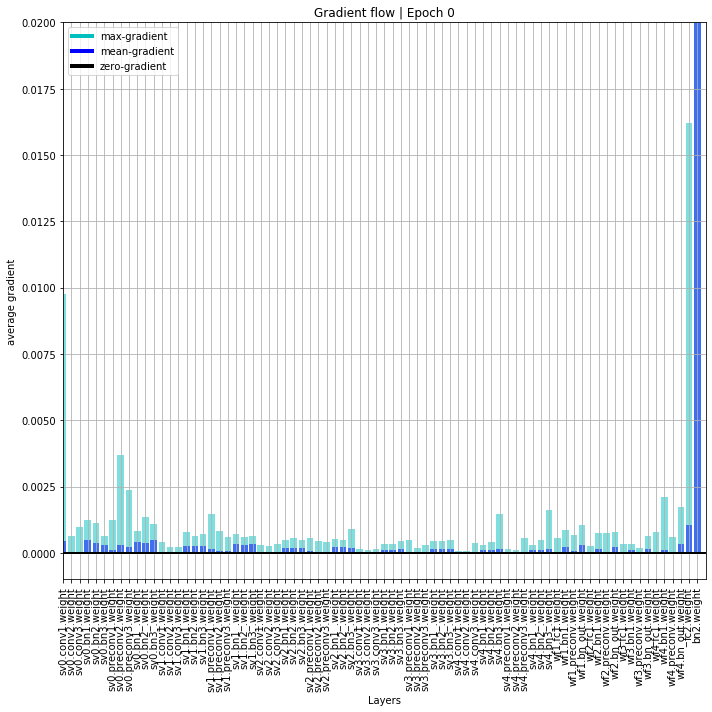

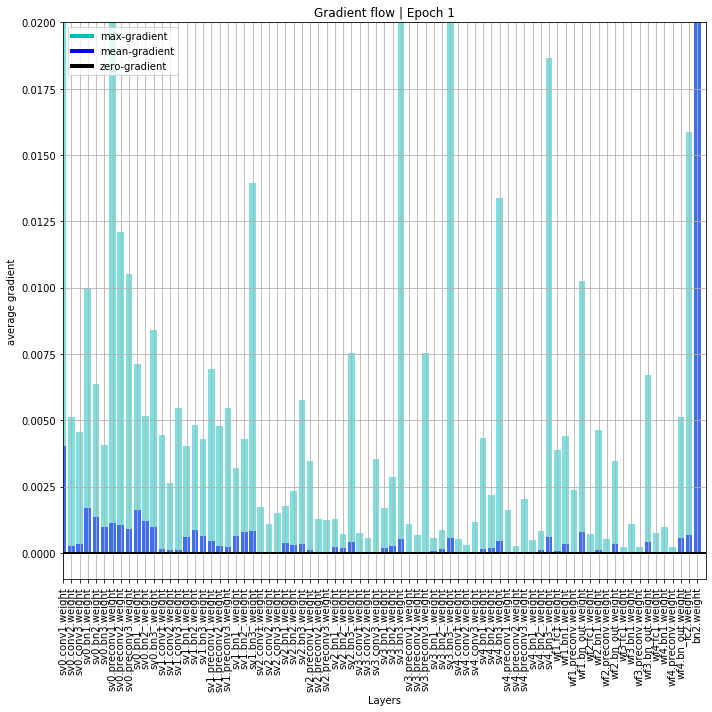

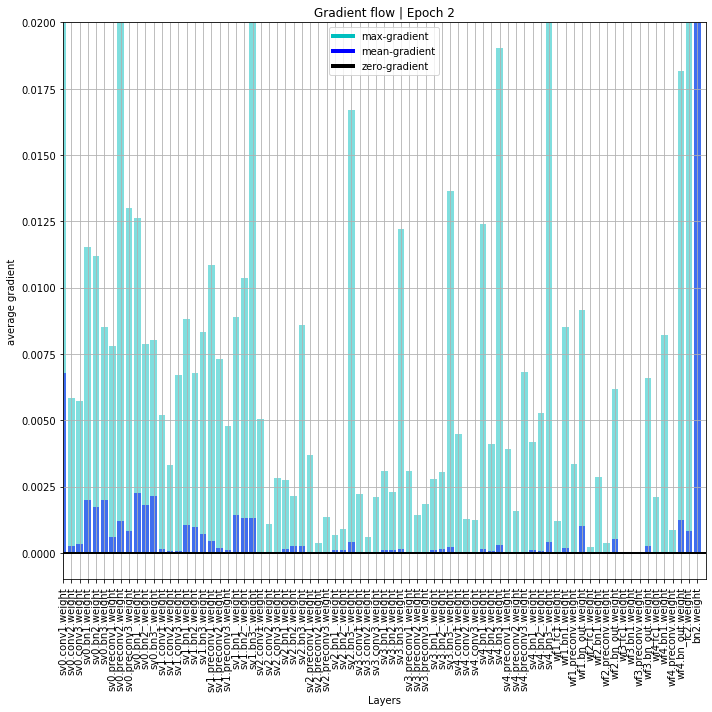

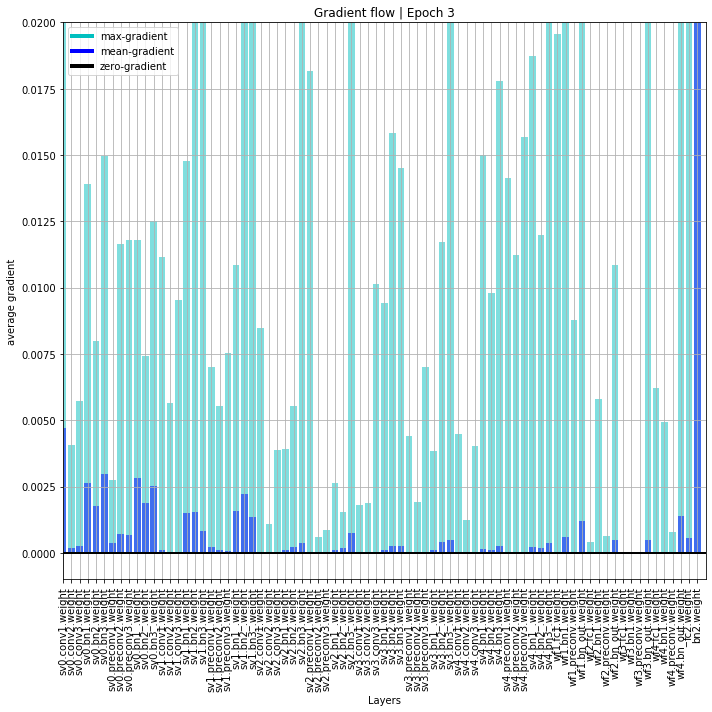

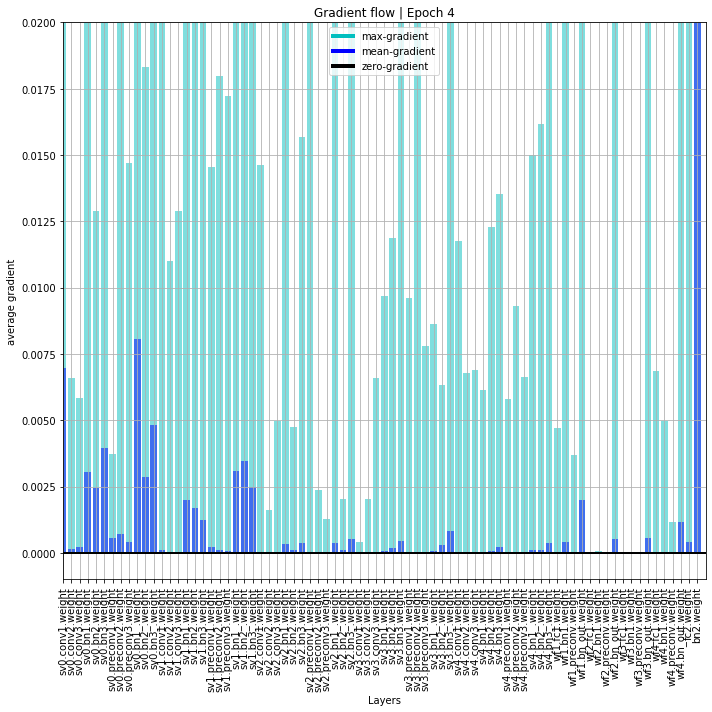

...

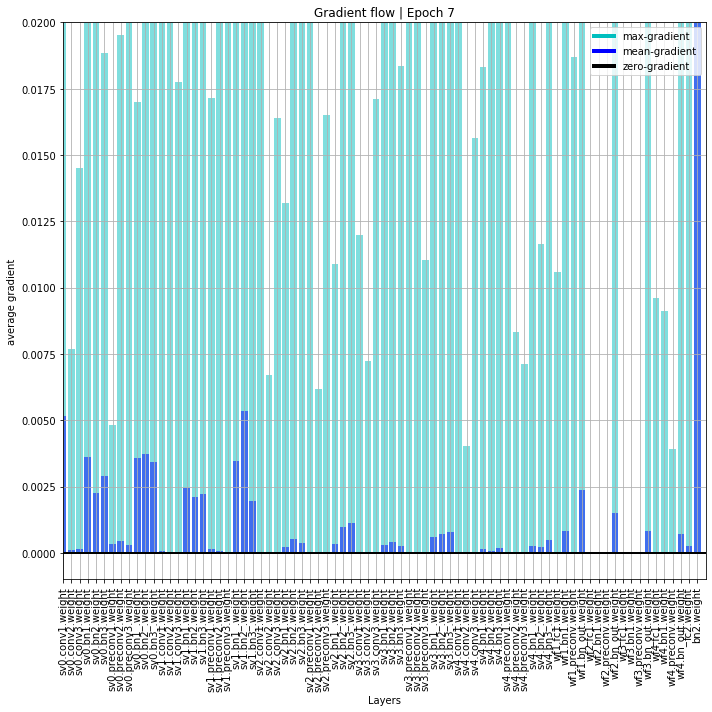

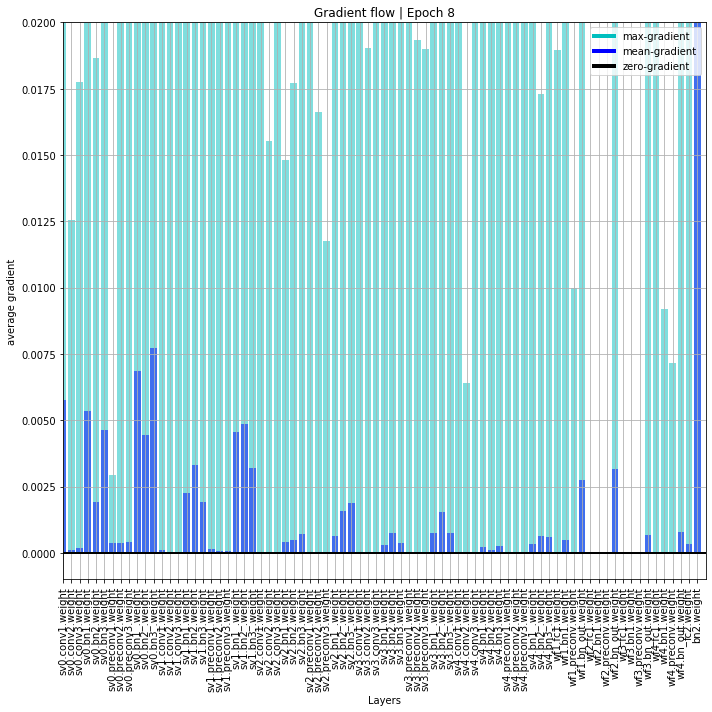

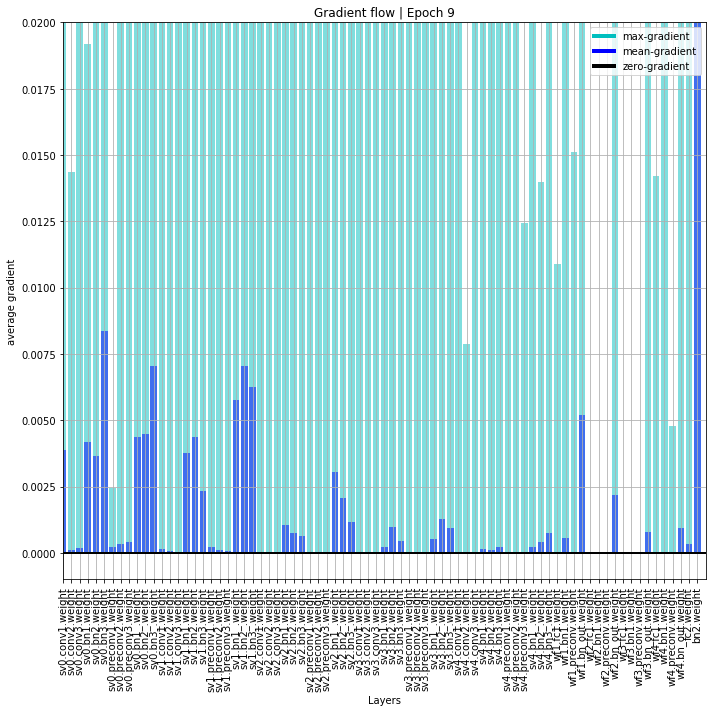

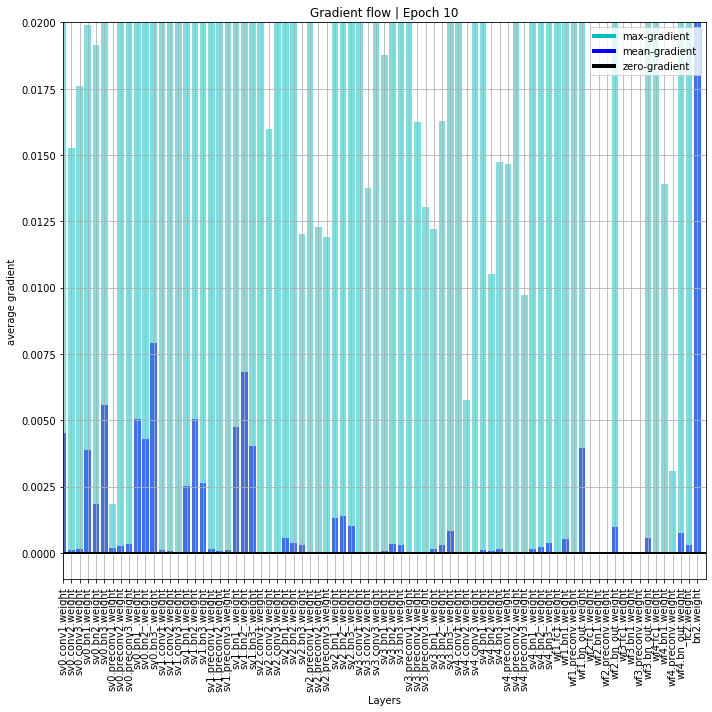

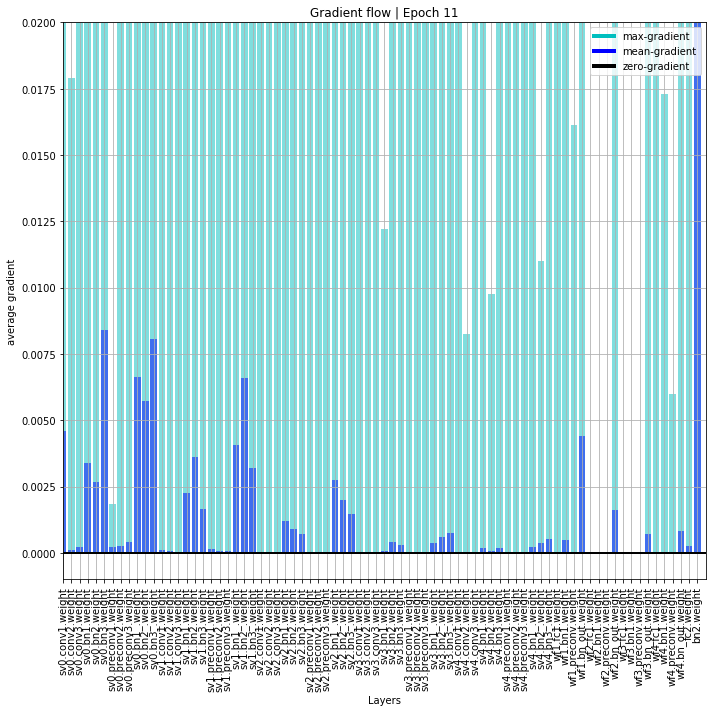

Error in callback <function flush_figures at 0x7f90b2564598> (for post_execute):


KeyboardInterrupt: 

In [10]:
model = model.to(device)

model_folder = '/tf/data/Quan/fer2013/backtobasics/svgg5/'
model_name = 'svgg_resnet'
model_path = os.path.join(model_folder, model_name + '.pt')

best_acc = 0.0
curloss = 0.0
hist = []

for epoch in range(150):  # loop over the dataset multiple times
    
    print('Epoch: ', epoch + 1)
    running_loss = 0.0
    running_acc = 0.0

    # TRAIN
    model.train()
    for i, data in enumerate(train_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)
        loss.backward()
        
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        running_acc += acc
        print('\t - Step %d: loss: %.3f acc: %.3f' % (i+1, loss.item(), acc))

    print('- Avg.loss: %.3f  | Avg.acc: %.3f' % (running_loss / (i+1), running_acc / (i+1)))
    avgloss = running_loss / (i+1)
    avgacc = running_acc / (i+1)
    
    # print gradient flow figure
    plot_grad_flow(model.named_parameters(), epoch,
                   savepath=os.path.join(model_folder, model_name + '_gf' + '_' + str(epoch) + '.png'))

    # EVALUATE
    model.eval()
    running_valloss = 0.0
    running_valacc = 0.0
    for i,data in enumerate(val_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)

        running_valloss += loss.item()
        running_valacc += acc

    print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))

    avgvalloss = running_valloss / (i+1)
    avgvalcc = running_valacc / (i+1)

    hist.append([avgloss, avgvalloss, avgacc, avgvalcc])
    
    if best_acc < (running_valacc / (i+1)):
        best_acc = (running_valacc / (i+1))
        curloss = (running_valloss / (i+1))
        torch.save(model, model_path)
        print('* Update optimal model')

print('Finished Training')

([<matplotlib.lines.Line2D at 0x7f8f9ead87f0>,
 0.4793311404554467,
 1.3702968568132634)

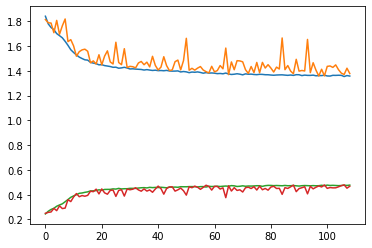

In [16]:
plt.plot(hist), best_acc, curloss

In [17]:
import imageio
images = []
for i in range(109):
    images.append(imageio.imread('/tf/data/Quan/fer2013/backtobasics/svgg5/svgg_resnet_gf_' + str(i) + '.png'))
imageio.mimsave('/tf/data/Quan/fer2013/backtobasics/svgg5/svgg_resnet_gf.gif', images)

After taking a look at gradient flows of SVGG4, SVGG5. My observations are:
* WeightedFeature layers have very small gradient flow
* Block 4 has small gradient too
* Preconv layer does not have much in SVblock

As a result, I will modify some as following:
* Make shortcut from fc1 of WeightedFeature to classifier. However, we have to decide those should be ensambled as feature-level or decision-level
* Completely remove SV4
* Remove all preconv layers in SVblock. Instead, we just need 1 preconv as the init block as
    * Preconv(1, 64)
    * SV0(64,64)
    
This modification is represented in SVGG6

## SVGG6

In [5]:
class SVblock(nn.Module):
    def __init__(self, in_neurons, nb_neurons, kernel_size=(3,3), batch_norm=True, activation='relu', **kwargs):
        '''
    in_neurons: C_in
    nb_neurons: n_filters of conv2d
    '''
        super(SVblock, self).__init__()

        self.index = kwargs['index'] if 'index' in kwargs else None
        self.conv1 = nn.Conv2d(in_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv2 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        self.conv3 = nn.Conv2d(nb_neurons, nb_neurons, kernel_size=kernel_size, padding=1, stride=1)
        
        self.bn1 = nn.BatchNorm2d(nb_neurons)
        self.bn2 = nn.BatchNorm2d(nb_neurons)
        self.bn3 = nn.BatchNorm2d(nb_neurons)
        
        self.bn2_ = nn.BatchNorm2d(nb_neurons)
        self.bn3_ = nn.BatchNorm2d(nb_neurons)
        
        self.relu = nn.LeakyReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=(2,2), stride=2)


    def forward(self, x):        
        
        # 1st
        x1 = self.conv1(x)
        x1 = self.bn1(x1)
        x1 = self.relu(x1)

        # 2nd
        x2 = self.conv2(x1)
        x2 = self.bn2(x2)
        x2 = self.relu(x2)
        
        x2_res = x2 + x1
        x2_res = self.bn2_(x2_res)
        
        # 3rd
        x3 = self.conv3(x2)
        x3 = self.bn3(x3)
        x3 = self.relu(x3)
        
        x3_res = x3 + x2_res
        x3_res = self.bn3_(x3_res)

        # maxpooling
        x_out = self.maxpool(x3_res)

        return x_out

In [6]:
class WeightFeature(nn.Module):
    def __init__(self, feature_depth, target_depth):
        super(WeightFeature, self).__init__()

        self.target_depth = target_depth
        self.fc1 = nn.Linear(feature_depth, target_depth)
        self.bn1 = nn.BatchNorm1d(target_depth)
        self.preconv = nn.Conv2d(target_depth, target_depth, kernel_size=1)
        self.relu = nn.LeakyReLU()
        self.bn_out = nn.BatchNorm2d(target_depth)
        
    def forward(self, x1, x2):
        x1 = nn.AvgPool2d(kernel_size=(x1.size(-2), x1.size(-1)))(x1)
        x1 = nn.Flatten()(x1)

        x1 = self.fc1(x1)
        x1 = self.bn1(x1)
        _x1 = self.relu(x1)
        x1 = _x1.unsqueeze(-1).unsqueeze(-1)

        _x2 = self.preconv(x2)
        
        x = torch.mul(_x2,x1)
        x = x + x2
        x = self.bn_out(x)

        return x, _x1

In [7]:
class SVGG(nn.Module):
    
    def __init__(self, **kwargs):
        super(SVGG, self).__init__()

        self.device = torch.device('cpu') if not 'device' in kwargs else kwargs['device']
        
        self.preconv = nn.Conv2d(1, 64, kernel_size=1)
        self.sv0 = SVblock(64, 64).to(self.device)
        self.sv1 = SVblock(64, 128).to(self.device)
        self.sv2 = SVblock(128, 256).to(self.device)
        self.sv3 = SVblock(256, 512).to(self.device)

        self.wf1 = WeightFeature(64, 128).to(self.device)
        self.wf2 = WeightFeature(128, 256).to(self.device)
        self.wf3 = WeightFeature(256, 512).to(self.device)

        self.fc2 = nn.Linear(1408, 7)
        self.bn2 = nn.BatchNorm1d(7)
    
    def forward(self, x):
        x = self.preconv(x)
        x0 = self.sv0(x)
        
        x1 = self.sv1(x0)
        x_wf1, x1_out = self.wf1(x0, x1)

        x2 = self.sv2(x_wf1)
        x_wf2, x2_out = self.wf2(x1, x2)

        x3 = self.sv3(x_wf2)
        x_wf3, x3_out = self.wf3(x2, x3)

        x_wf3 = nn.AvgPool2d(kernel_size=(x_wf3.size(-2), x_wf3.size(-1)))(x_wf3)
        x_wf3 = nn.Flatten()(x_wf3)
        
        x = torch.cat([x1_out, x2_out, x3_out, x_wf3], dim=1)

        x = self.fc2(x)
        x = self.bn2(x)

        return x

In [8]:
device = torch.device('cuda')
print(device)

model = SVGG(device=device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.008, weight_decay=5e-4)


cuda


In [9]:
model = model.to(device)

model_folder = '/tf/data/Quan/fer2013/backtobasics/svgg6/'
model_name = 'svgg_resnet'
model_path = os.path.join(model_folder, model_name + '.pt')

best_acc = 0.0
curloss = 0.0
hist = []

for epoch in range(150):  # loop over the dataset multiple times
    
    print('Epoch: ', epoch + 1)
    running_loss = 0.0
    running_acc = 0.0

    # TRAIN
    model.train()
    for i, data in enumerate(train_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)
        loss.backward()
        
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        running_acc += acc
        print('\t - Step %d: loss: %.3f acc: %.3f' % (i+1, loss.item(), acc))

    print('- Avg.loss: %.3f  | Avg.acc: %.3f' % (running_loss / (i+1), running_acc / (i+1)))
    avgloss = running_loss / (i+1)
    avgacc = running_acc / (i+1)
    
    # print gradient flow figure
    plot_grad_flow(model.named_parameters(), epoch,
                   savepath=os.path.join(model_folder, model_name + '_gf' + '_' + str(epoch) + '.png'))

    # EVALUATE
    model.eval()
    running_valloss = 0.0
    running_valacc = 0.0
    for i,data in enumerate(val_loader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
        loss = criterion(outputs, labels)

        running_valloss += loss.item()
        running_valacc += acc

    print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))

    avgvalloss = running_valloss / (i+1)
    avgvalcc = running_valacc / (i+1)

    hist.append([avgloss, avgvalloss, avgacc, avgvalcc])
    
    if best_acc < (running_valacc / (i+1)):
        best_acc = (running_valacc / (i+1))
        curloss = (running_valloss / (i+1))
        torch.save(model, model_path)
        print('* Update optimal model')

print('Finished Training')

Epoch:  1
	 - Step 1: loss: 2.152 acc: 0.219
	 - Step 2: loss: 2.393 acc: 0.125
	 - Step 3: loss: 2.082 acc: 0.203
	 - Step 4: loss: 1.954 acc: 0.203
	 - Step 5: loss: 2.275 acc: 0.109
	 - Step 6: loss: 1.869 acc: 0.281
	 - Step 7: loss: 2.030 acc: 0.188
	 - Step 8: loss: 1.954 acc: 0.250
	 - Step 9: loss: 1.904 acc: 0.250
	 - Step 10: loss: 1.919 acc: 0.188
	 - Step 11: loss: 1.960 acc: 0.328
	 - Step 12: loss: 1.903 acc: 0.219
	 - Step 13: loss: 1.866 acc: 0.250
	 - Step 14: loss: 1.983 acc: 0.141
	 - Step 15: loss: 1.850 acc: 0.281
	 - Step 16: loss: 1.903 acc: 0.172
	 - Step 17: loss: 1.856 acc: 0.312
	 - Step 18: loss: 1.978 acc: 0.344
	 - Step 19: loss: 1.858 acc: 0.297
	 - Step 20: loss: 1.977 acc: 0.266
	 - Step 21: loss: 1.843 acc: 0.297
	 - Step 22: loss: 1.836 acc: 0.281
	 - Step 23: loss: 1.997 acc: 0.297
	 - Step 24: loss: 1.960 acc: 0.234
	 - Step 25: loss: 1.901 acc: 0.203
	 - Step 26: loss: 1.858 acc: 0.219
	 - Step 27: loss: 1.921 acc: 0.188
	 - Step 28: loss: 1.897 ac

	 - Step 226: loss: 1.799 acc: 0.219
	 - Step 227: loss: 1.717 acc: 0.266
	 - Step 228: loss: 1.692 acc: 0.375
	 - Step 229: loss: 1.847 acc: 0.109
	 - Step 230: loss: 1.679 acc: 0.328
	 - Step 231: loss: 1.748 acc: 0.234
	 - Step 232: loss: 1.645 acc: 0.359
	 - Step 233: loss: 1.797 acc: 0.281
	 - Step 234: loss: 2.050 acc: 0.141
	 - Step 235: loss: 1.856 acc: 0.250
	 - Step 236: loss: 1.815 acc: 0.203
	 - Step 237: loss: 1.737 acc: 0.297
	 - Step 238: loss: 1.784 acc: 0.219
	 - Step 239: loss: 1.754 acc: 0.266
	 - Step 240: loss: 1.850 acc: 0.219
	 - Step 241: loss: 1.788 acc: 0.219
	 - Step 242: loss: 1.742 acc: 0.219
	 - Step 243: loss: 1.723 acc: 0.391
	 - Step 244: loss: 1.765 acc: 0.297
	 - Step 245: loss: 1.845 acc: 0.234
	 - Step 246: loss: 1.874 acc: 0.266
	 - Step 247: loss: 1.816 acc: 0.203
	 - Step 248: loss: 1.793 acc: 0.266
	 - Step 249: loss: 1.810 acc: 0.250
	 - Step 250: loss: 1.839 acc: 0.219
	 - Step 251: loss: 1.817 acc: 0.203
	 - Step 252: loss: 1.886 acc: 0.266
	

	 - Step 448: loss: 1.732 acc: 0.312
	 - Step 449: loss: 1.840 acc: 0.216
- Avg.loss: 1.817  | Avg.acc: 0.256
- Avg. val_loss: 1.785  | Avg. val_acc: 0.251
* Update optimal model
Epoch:  2


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVGG. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type SVblock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type WeightFeature. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


	 - Step 1: loss: 1.871 acc: 0.312
	 - Step 2: loss: 1.742 acc: 0.250
	 - Step 3: loss: 1.780 acc: 0.250
	 - Step 4: loss: 1.749 acc: 0.297
	 - Step 5: loss: 1.756 acc: 0.250
	 - Step 6: loss: 1.683 acc: 0.328
	 - Step 7: loss: 1.702 acc: 0.250
	 - Step 8: loss: 1.773 acc: 0.297
	 - Step 9: loss: 1.713 acc: 0.234
	 - Step 10: loss: 1.875 acc: 0.172
	 - Step 11: loss: 1.769 acc: 0.266
	 - Step 12: loss: 1.732 acc: 0.266
	 - Step 13: loss: 1.799 acc: 0.219
	 - Step 14: loss: 1.742 acc: 0.250
	 - Step 15: loss: 1.760 acc: 0.281
	 - Step 16: loss: 1.738 acc: 0.266
	 - Step 17: loss: 1.803 acc: 0.188
	 - Step 18: loss: 1.808 acc: 0.281
	 - Step 19: loss: 1.712 acc: 0.312
	 - Step 20: loss: 1.872 acc: 0.188
	 - Step 21: loss: 1.744 acc: 0.266
	 - Step 22: loss: 1.745 acc: 0.297
	 - Step 23: loss: 1.788 acc: 0.344
	 - Step 24: loss: 1.817 acc: 0.375
	 - Step 25: loss: 1.844 acc: 0.203
	 - Step 26: loss: 1.689 acc: 0.359
	 - Step 27: loss: 1.741 acc: 0.297
	 - Step 28: loss: 1.676 acc: 0.312
	

	 - Step 226: loss: 1.735 acc: 0.266
	 - Step 227: loss: 1.801 acc: 0.250
	 - Step 228: loss: 1.702 acc: 0.344
	 - Step 229: loss: 1.785 acc: 0.234
	 - Step 230: loss: 1.811 acc: 0.266
	 - Step 231: loss: 1.732 acc: 0.281
	 - Step 232: loss: 1.732 acc: 0.297
	 - Step 233: loss: 1.745 acc: 0.297
	 - Step 234: loss: 1.916 acc: 0.094
	 - Step 235: loss: 1.709 acc: 0.297
	 - Step 236: loss: 1.767 acc: 0.250
	 - Step 237: loss: 1.705 acc: 0.250
	 - Step 238: loss: 1.802 acc: 0.266
	 - Step 239: loss: 1.715 acc: 0.297
	 - Step 240: loss: 1.803 acc: 0.297
	 - Step 241: loss: 1.787 acc: 0.281
	 - Step 242: loss: 1.793 acc: 0.203
	 - Step 243: loss: 1.800 acc: 0.203
	 - Step 244: loss: 1.803 acc: 0.234
	 - Step 245: loss: 1.746 acc: 0.328
	 - Step 246: loss: 1.805 acc: 0.203
	 - Step 247: loss: 1.738 acc: 0.266
	 - Step 248: loss: 1.707 acc: 0.297
	 - Step 249: loss: 1.778 acc: 0.281
	 - Step 250: loss: 1.737 acc: 0.266
	 - Step 251: loss: 1.840 acc: 0.156
	 - Step 252: loss: 1.799 acc: 0.266
	

	 - Step 448: loss: 1.717 acc: 0.250
	 - Step 449: loss: 1.833 acc: 0.189
- Avg.loss: 1.782  | Avg.acc: 0.256
- Avg. val_loss: 1.853  | Avg. val_acc: 0.179
Epoch:  3
	 - Step 1: loss: 1.848 acc: 0.172
	 - Step 2: loss: 1.726 acc: 0.312
	 - Step 3: loss: 1.743 acc: 0.297
	 - Step 4: loss: 1.749 acc: 0.219
	 - Step 5: loss: 1.756 acc: 0.281
	 - Step 6: loss: 1.928 acc: 0.156
	 - Step 7: loss: 1.763 acc: 0.281
	 - Step 8: loss: 1.824 acc: 0.219
	 - Step 9: loss: 1.800 acc: 0.297
	 - Step 10: loss: 1.850 acc: 0.234
	 - Step 11: loss: 1.767 acc: 0.328
	 - Step 12: loss: 1.649 acc: 0.422
	 - Step 13: loss: 1.752 acc: 0.297
	 - Step 14: loss: 1.799 acc: 0.297
	 - Step 15: loss: 1.752 acc: 0.234
	 - Step 16: loss: 1.767 acc: 0.203
	 - Step 17: loss: 1.816 acc: 0.234
	 - Step 18: loss: 1.794 acc: 0.250
	 - Step 19: loss: 1.799 acc: 0.219
	 - Step 20: loss: 1.855 acc: 0.297
	 - Step 21: loss: 1.761 acc: 0.203
	 - Step 22: loss: 1.814 acc: 0.234
	 - Step 23: loss: 1.829 acc: 0.250
	 - Step 24: lo

	 - Step 223: loss: 1.750 acc: 0.297
	 - Step 224: loss: 1.751 acc: 0.188
	 - Step 225: loss: 1.725 acc: 0.312
	 - Step 226: loss: 1.779 acc: 0.234
	 - Step 227: loss: 1.784 acc: 0.328
	 - Step 228: loss: 1.721 acc: 0.359
	 - Step 229: loss: 1.814 acc: 0.188
	 - Step 230: loss: 1.831 acc: 0.312
	 - Step 231: loss: 1.771 acc: 0.281
	 - Step 232: loss: 1.813 acc: 0.156
	 - Step 233: loss: 1.723 acc: 0.312
	 - Step 234: loss: 1.773 acc: 0.250
	 - Step 235: loss: 1.772 acc: 0.266
	 - Step 236: loss: 1.815 acc: 0.234
	 - Step 237: loss: 1.691 acc: 0.203
	 - Step 238: loss: 1.844 acc: 0.219
	 - Step 239: loss: 1.833 acc: 0.234
	 - Step 240: loss: 1.823 acc: 0.188
	 - Step 241: loss: 1.785 acc: 0.234
	 - Step 242: loss: 1.734 acc: 0.344
	 - Step 243: loss: 1.836 acc: 0.203
	 - Step 244: loss: 1.732 acc: 0.312
	 - Step 245: loss: 1.861 acc: 0.266
	 - Step 246: loss: 1.744 acc: 0.297
	 - Step 247: loss: 1.867 acc: 0.297
	 - Step 248: loss: 1.750 acc: 0.203
	 - Step 249: loss: 1.793 acc: 0.250
	

	 - Step 445: loss: 1.784 acc: 0.266
	 - Step 446: loss: 1.725 acc: 0.297
	 - Step 447: loss: 1.807 acc: 0.297
	 - Step 448: loss: 1.780 acc: 0.266
	 - Step 449: loss: 1.810 acc: 0.216
- Avg.loss: 1.781  | Avg.acc: 0.259
- Avg. val_loss: 1.800  | Avg. val_acc: 0.241
Epoch:  4
	 - Step 1: loss: 1.755 acc: 0.266
	 - Step 2: loss: 1.754 acc: 0.328
	 - Step 3: loss: 1.776 acc: 0.188
	 - Step 4: loss: 1.710 acc: 0.344
	 - Step 5: loss: 1.899 acc: 0.219
	 - Step 6: loss: 1.884 acc: 0.250
	 - Step 7: loss: 1.807 acc: 0.234
	 - Step 8: loss: 1.766 acc: 0.203
	 - Step 9: loss: 1.877 acc: 0.234
	 - Step 10: loss: 1.742 acc: 0.328
	 - Step 11: loss: 1.844 acc: 0.188
	 - Step 12: loss: 1.783 acc: 0.156
	 - Step 13: loss: 1.834 acc: 0.266
	 - Step 14: loss: 1.770 acc: 0.172
	 - Step 15: loss: 1.777 acc: 0.219
	 - Step 16: loss: 1.816 acc: 0.219
	 - Step 17: loss: 1.810 acc: 0.266
	 - Step 18: loss: 1.807 acc: 0.266
	 - Step 19: loss: 1.704 acc: 0.328
	 - Step 20: loss: 1.851 acc: 0.281
	 - Step 21:

	 - Step 220: loss: 1.821 acc: 0.234
	 - Step 221: loss: 1.725 acc: 0.297
	 - Step 222: loss: 1.753 acc: 0.234
	 - Step 223: loss: 1.760 acc: 0.281
	 - Step 224: loss: 1.842 acc: 0.203
	 - Step 225: loss: 1.788 acc: 0.234
	 - Step 226: loss: 1.789 acc: 0.266
	 - Step 227: loss: 1.800 acc: 0.234
	 - Step 228: loss: 1.756 acc: 0.266
	 - Step 229: loss: 1.753 acc: 0.219
	 - Step 230: loss: 1.798 acc: 0.266
	 - Step 231: loss: 1.778 acc: 0.250
	 - Step 232: loss: 1.815 acc: 0.250
	 - Step 233: loss: 1.760 acc: 0.312
	 - Step 234: loss: 1.793 acc: 0.188
	 - Step 235: loss: 1.889 acc: 0.188
	 - Step 236: loss: 1.804 acc: 0.234
	 - Step 237: loss: 1.773 acc: 0.266
	 - Step 238: loss: 1.716 acc: 0.375
	 - Step 239: loss: 1.768 acc: 0.203
	 - Step 240: loss: 1.903 acc: 0.234
	 - Step 241: loss: 1.753 acc: 0.203
	 - Step 242: loss: 1.736 acc: 0.266
	 - Step 243: loss: 1.701 acc: 0.344
	 - Step 244: loss: 1.734 acc: 0.312
	 - Step 245: loss: 1.785 acc: 0.266
	 - Step 246: loss: 1.843 acc: 0.188
	

	 - Step 442: loss: 1.762 acc: 0.281
	 - Step 443: loss: 1.694 acc: 0.391
	 - Step 444: loss: 1.765 acc: 0.250
	 - Step 445: loss: 1.805 acc: 0.219
	 - Step 446: loss: 1.760 acc: 0.312
	 - Step 447: loss: 1.719 acc: 0.328
	 - Step 448: loss: 1.717 acc: 0.219
	 - Step 449: loss: 1.688 acc: 0.351
- Avg.loss: 1.779  | Avg.acc: 0.256
- Avg. val_loss: 1.786  | Avg. val_acc: 0.248
Epoch:  5
	 - Step 1: loss: 1.707 acc: 0.250
	 - Step 2: loss: 1.769 acc: 0.188
	 - Step 3: loss: 1.806 acc: 0.266
	 - Step 4: loss: 1.796 acc: 0.266
	 - Step 5: loss: 1.690 acc: 0.328
	 - Step 6: loss: 1.845 acc: 0.281
	 - Step 7: loss: 1.758 acc: 0.203
	 - Step 8: loss: 1.820 acc: 0.219
	 - Step 9: loss: 1.810 acc: 0.188
	 - Step 10: loss: 1.745 acc: 0.281
	 - Step 11: loss: 1.778 acc: 0.266
	 - Step 12: loss: 1.740 acc: 0.266
	 - Step 13: loss: 1.778 acc: 0.188
	 - Step 14: loss: 1.750 acc: 0.266
	 - Step 15: loss: 1.775 acc: 0.219
	 - Step 16: loss: 1.728 acc: 0.312
	 - Step 17: loss: 1.769 acc: 0.312
	 - Step 

	 - Step 217: loss: 1.691 acc: 0.375
	 - Step 218: loss: 1.709 acc: 0.391
	 - Step 219: loss: 1.760 acc: 0.266
	 - Step 220: loss: 1.808 acc: 0.219
	 - Step 221: loss: 1.687 acc: 0.297
	 - Step 222: loss: 1.667 acc: 0.359
	 - Step 223: loss: 1.813 acc: 0.234
	 - Step 224: loss: 1.777 acc: 0.234
	 - Step 225: loss: 1.731 acc: 0.312
	 - Step 226: loss: 1.845 acc: 0.219
	 - Step 227: loss: 1.863 acc: 0.219
	 - Step 228: loss: 1.712 acc: 0.281
	 - Step 229: loss: 1.808 acc: 0.203
	 - Step 230: loss: 1.753 acc: 0.250
	 - Step 231: loss: 1.771 acc: 0.203
	 - Step 232: loss: 1.854 acc: 0.234
	 - Step 233: loss: 1.675 acc: 0.359
	 - Step 234: loss: 1.672 acc: 0.344
	 - Step 235: loss: 1.849 acc: 0.234
	 - Step 236: loss: 1.778 acc: 0.328
	 - Step 237: loss: 1.744 acc: 0.234
	 - Step 238: loss: 1.762 acc: 0.297
	 - Step 239: loss: 1.676 acc: 0.312
	 - Step 240: loss: 1.797 acc: 0.203
	 - Step 241: loss: 1.784 acc: 0.219
	 - Step 242: loss: 1.748 acc: 0.250
	 - Step 243: loss: 1.814 acc: 0.172
	

	 - Step 439: loss: 1.816 acc: 0.234
	 - Step 440: loss: 1.793 acc: 0.312
	 - Step 441: loss: 1.716 acc: 0.312
	 - Step 442: loss: 1.759 acc: 0.188
	 - Step 443: loss: 1.825 acc: 0.234
	 - Step 444: loss: 1.775 acc: 0.344
	 - Step 445: loss: 1.800 acc: 0.281
	 - Step 446: loss: 1.793 acc: 0.266
	 - Step 447: loss: 1.879 acc: 0.188
	 - Step 448: loss: 1.957 acc: 0.125
	 - Step 449: loss: 1.745 acc: 0.216
- Avg.loss: 1.777  | Avg.acc: 0.257
- Avg. val_loss: 1.793  | Avg. val_acc: 0.255
* Update optimal model
Epoch:  6
	 - Step 1: loss: 1.787 acc: 0.172
	 - Step 2: loss: 1.763 acc: 0.312
	 - Step 3: loss: 1.749 acc: 0.219
	 - Step 4: loss: 1.820 acc: 0.312
	 - Step 5: loss: 1.719 acc: 0.250
	 - Step 6: loss: 1.760 acc: 0.266
	 - Step 7: loss: 1.772 acc: 0.297
	 - Step 8: loss: 1.784 acc: 0.234
	 - Step 9: loss: 1.699 acc: 0.297
	 - Step 10: loss: 1.705 acc: 0.219
	 - Step 11: loss: 1.808 acc: 0.234
	 - Step 12: loss: 1.779 acc: 0.312
	 - Step 13: loss: 1.671 acc: 0.375
	 - Step 14: loss: 

	 - Step 214: loss: 1.741 acc: 0.203
	 - Step 215: loss: 1.821 acc: 0.156
	 - Step 216: loss: 1.803 acc: 0.266
	 - Step 217: loss: 1.801 acc: 0.234
	 - Step 218: loss: 1.757 acc: 0.203
	 - Step 219: loss: 1.826 acc: 0.234
	 - Step 220: loss: 1.796 acc: 0.219
	 - Step 221: loss: 1.681 acc: 0.391
	 - Step 222: loss: 1.856 acc: 0.312
	 - Step 223: loss: 1.721 acc: 0.312
	 - Step 224: loss: 1.733 acc: 0.297
	 - Step 225: loss: 1.794 acc: 0.234
	 - Step 226: loss: 1.791 acc: 0.234
	 - Step 227: loss: 1.720 acc: 0.297
	 - Step 228: loss: 1.808 acc: 0.344
	 - Step 229: loss: 1.732 acc: 0.266
	 - Step 230: loss: 1.793 acc: 0.156
	 - Step 231: loss: 1.638 acc: 0.359
	 - Step 232: loss: 1.797 acc: 0.234
	 - Step 233: loss: 1.738 acc: 0.312
	 - Step 234: loss: 1.734 acc: 0.344
	 - Step 235: loss: 1.669 acc: 0.297
	 - Step 236: loss: 1.783 acc: 0.281
	 - Step 237: loss: 1.807 acc: 0.312
	 - Step 238: loss: 1.782 acc: 0.250
	 - Step 239: loss: 1.831 acc: 0.312
	 - Step 240: loss: 1.867 acc: 0.188
	

	 - Step 436: loss: 1.736 acc: 0.344
	 - Step 437: loss: 1.738 acc: 0.281
	 - Step 438: loss: 1.775 acc: 0.219
	 - Step 439: loss: 1.740 acc: 0.234
	 - Step 440: loss: 1.780 acc: 0.266
	 - Step 441: loss: 1.822 acc: 0.172
	 - Step 442: loss: 1.809 acc: 0.266
	 - Step 443: loss: 1.753 acc: 0.250
	 - Step 444: loss: 1.760 acc: 0.250
	 - Step 445: loss: 1.750 acc: 0.266
	 - Step 446: loss: 1.728 acc: 0.281
	 - Step 447: loss: 1.789 acc: 0.266
	 - Step 448: loss: 1.725 acc: 0.266
	 - Step 449: loss: 1.816 acc: 0.324
- Avg.loss: 1.776  | Avg.acc: 0.261
- Avg. val_loss: 1.804  | Avg. val_acc: 0.247
Epoch:  7
	 - Step 1: loss: 1.787 acc: 0.250
	 - Step 2: loss: 1.751 acc: 0.234
	 - Step 3: loss: 1.761 acc: 0.281
	 - Step 4: loss: 1.762 acc: 0.141
	 - Step 5: loss: 1.703 acc: 0.359
	 - Step 6: loss: 1.756 acc: 0.219
	 - Step 7: loss: 1.789 acc: 0.266
	 - Step 8: loss: 1.841 acc: 0.234
	 - Step 9: loss: 1.759 acc: 0.266
	 - Step 10: loss: 1.799 acc: 0.266
	 - Step 11: loss: 1.806 acc: 0.250
	 -

	 - Step 211: loss: 1.671 acc: 0.250
	 - Step 212: loss: 1.836 acc: 0.266
	 - Step 213: loss: 1.807 acc: 0.234
	 - Step 214: loss: 1.838 acc: 0.250
	 - Step 215: loss: 1.823 acc: 0.266
	 - Step 216: loss: 1.868 acc: 0.125
	 - Step 217: loss: 1.831 acc: 0.141
	 - Step 218: loss: 1.717 acc: 0.281
	 - Step 219: loss: 1.866 acc: 0.141
	 - Step 220: loss: 1.730 acc: 0.297
	 - Step 221: loss: 1.734 acc: 0.250
	 - Step 222: loss: 1.832 acc: 0.312
	 - Step 223: loss: 1.693 acc: 0.297
	 - Step 224: loss: 1.740 acc: 0.281
	 - Step 225: loss: 1.772 acc: 0.266
	 - Step 226: loss: 1.729 acc: 0.312
	 - Step 227: loss: 1.850 acc: 0.109
	 - Step 228: loss: 1.753 acc: 0.219
	 - Step 229: loss: 1.814 acc: 0.234
	 - Step 230: loss: 1.811 acc: 0.281
	 - Step 231: loss: 1.753 acc: 0.359
	 - Step 232: loss: 1.706 acc: 0.312
	 - Step 233: loss: 1.723 acc: 0.281
	 - Step 234: loss: 1.740 acc: 0.188
	 - Step 235: loss: 1.760 acc: 0.172
	 - Step 236: loss: 1.736 acc: 0.266
	 - Step 237: loss: 1.717 acc: 0.359
	

	 - Step 433: loss: 1.739 acc: 0.375
	 - Step 434: loss: 1.791 acc: 0.219
	 - Step 435: loss: 1.941 acc: 0.219
	 - Step 436: loss: 1.739 acc: 0.312
	 - Step 437: loss: 1.787 acc: 0.250
	 - Step 438: loss: 1.778 acc: 0.344
	 - Step 439: loss: 1.791 acc: 0.203
	 - Step 440: loss: 1.846 acc: 0.188
	 - Step 441: loss: 1.777 acc: 0.219
	 - Step 442: loss: 1.801 acc: 0.234
	 - Step 443: loss: 1.685 acc: 0.281
	 - Step 444: loss: 1.798 acc: 0.297
	 - Step 445: loss: 1.791 acc: 0.250
	 - Step 446: loss: 1.717 acc: 0.312
	 - Step 447: loss: 1.733 acc: 0.219
	 - Step 448: loss: 1.741 acc: 0.234
	 - Step 449: loss: 2.124 acc: 0.108
- Avg.loss: 1.773  | Avg.acc: 0.261
- Avg. val_loss: 1.798  | Avg. val_acc: 0.219
Epoch:  8
	 - Step 1: loss: 1.752 acc: 0.312
	 - Step 2: loss: 1.739 acc: 0.250
	 - Step 3: loss: 1.758 acc: 0.234
	 - Step 4: loss: 1.755 acc: 0.219
	 - Step 5: loss: 1.751 acc: 0.297
	 - Step 6: loss: 1.777 acc: 0.203
	 - Step 7: loss: 1.758 acc: 0.297
	 - Step 8: loss: 1.808 acc: 0.250

	 - Step 208: loss: 1.741 acc: 0.219
	 - Step 209: loss: 1.683 acc: 0.266
	 - Step 210: loss: 1.857 acc: 0.266
	 - Step 211: loss: 1.657 acc: 0.312
	 - Step 212: loss: 1.751 acc: 0.344
	 - Step 213: loss: 1.725 acc: 0.234
	 - Step 214: loss: 1.781 acc: 0.219
	 - Step 215: loss: 1.739 acc: 0.234
	 - Step 216: loss: 1.804 acc: 0.250
	 - Step 217: loss: 1.777 acc: 0.234
	 - Step 218: loss: 1.745 acc: 0.250
	 - Step 219: loss: 1.762 acc: 0.281
	 - Step 220: loss: 1.792 acc: 0.172
	 - Step 221: loss: 1.761 acc: 0.281
	 - Step 222: loss: 1.786 acc: 0.312
	 - Step 223: loss: 1.753 acc: 0.281
	 - Step 224: loss: 1.750 acc: 0.266
	 - Step 225: loss: 1.816 acc: 0.266
	 - Step 226: loss: 1.779 acc: 0.203
	 - Step 227: loss: 1.784 acc: 0.266
	 - Step 228: loss: 1.768 acc: 0.266
	 - Step 229: loss: 1.800 acc: 0.234
	 - Step 230: loss: 1.714 acc: 0.328
	 - Step 231: loss: 1.774 acc: 0.250
	 - Step 232: loss: 1.756 acc: 0.312
	 - Step 233: loss: 1.836 acc: 0.281
	 - Step 234: loss: 1.792 acc: 0.266
	

	 - Step 430: loss: 1.820 acc: 0.297
	 - Step 431: loss: 1.725 acc: 0.375
	 - Step 432: loss: 1.787 acc: 0.250
	 - Step 433: loss: 1.637 acc: 0.375
	 - Step 434: loss: 1.685 acc: 0.281
	 - Step 435: loss: 1.805 acc: 0.266
	 - Step 436: loss: 1.836 acc: 0.297
	 - Step 437: loss: 1.739 acc: 0.297
	 - Step 438: loss: 1.742 acc: 0.234
	 - Step 439: loss: 1.708 acc: 0.297
	 - Step 440: loss: 1.765 acc: 0.234
	 - Step 441: loss: 1.792 acc: 0.250
	 - Step 442: loss: 1.845 acc: 0.203
	 - Step 443: loss: 1.699 acc: 0.297
	 - Step 444: loss: 1.788 acc: 0.234
	 - Step 445: loss: 1.799 acc: 0.234
	 - Step 446: loss: 1.850 acc: 0.250
	 - Step 447: loss: 1.740 acc: 0.312
	 - Step 448: loss: 1.805 acc: 0.281
	 - Step 449: loss: 1.795 acc: 0.216
- Avg.loss: 1.770  | Avg.acc: 0.261
- Avg. val_loss: 1.848  | Avg. val_acc: 0.223
Epoch:  9
	 - Step 1: loss: 1.794 acc: 0.250
	 - Step 2: loss: 1.827 acc: 0.203
	 - Step 3: loss: 1.828 acc: 0.250
	 - Step 4: loss: 1.886 acc: 0.234
	 - Step 5: loss: 1.801 acc:

	 - Step 205: loss: 1.932 acc: 0.203
	 - Step 206: loss: 1.780 acc: 0.250
	 - Step 207: loss: 1.776 acc: 0.312
	 - Step 208: loss: 1.770 acc: 0.250
	 - Step 209: loss: 1.757 acc: 0.234
	 - Step 210: loss: 1.765 acc: 0.219
	 - Step 211: loss: 1.864 acc: 0.219
	 - Step 212: loss: 1.793 acc: 0.266
	 - Step 213: loss: 1.788 acc: 0.266
	 - Step 214: loss: 1.733 acc: 0.312
	 - Step 215: loss: 1.708 acc: 0.250
	 - Step 216: loss: 1.810 acc: 0.250
	 - Step 217: loss: 1.804 acc: 0.281
	 - Step 218: loss: 1.757 acc: 0.219
	 - Step 219: loss: 1.792 acc: 0.266
	 - Step 220: loss: 1.768 acc: 0.234
	 - Step 221: loss: 1.843 acc: 0.219
	 - Step 222: loss: 1.771 acc: 0.250
	 - Step 223: loss: 1.709 acc: 0.359
	 - Step 224: loss: 1.733 acc: 0.312
	 - Step 225: loss: 1.675 acc: 0.344
	 - Step 226: loss: 1.703 acc: 0.359
	 - Step 227: loss: 1.659 acc: 0.328
	 - Step 228: loss: 1.730 acc: 0.219
	 - Step 229: loss: 1.709 acc: 0.188
	 - Step 230: loss: 1.725 acc: 0.297
	 - Step 231: loss: 1.790 acc: 0.297
	

	 - Step 427: loss: 1.764 acc: 0.219
	 - Step 428: loss: 1.763 acc: 0.188
	 - Step 429: loss: 1.740 acc: 0.297
	 - Step 430: loss: 1.814 acc: 0.266
	 - Step 431: loss: 1.746 acc: 0.266
	 - Step 432: loss: 1.769 acc: 0.172
	 - Step 433: loss: 1.702 acc: 0.266
	 - Step 434: loss: 1.818 acc: 0.234
	 - Step 435: loss: 1.793 acc: 0.250
	 - Step 436: loss: 1.732 acc: 0.250
	 - Step 437: loss: 1.733 acc: 0.250
	 - Step 438: loss: 1.910 acc: 0.156
	 - Step 439: loss: 1.762 acc: 0.250
	 - Step 440: loss: 1.779 acc: 0.328
	 - Step 441: loss: 1.739 acc: 0.312
	 - Step 442: loss: 1.729 acc: 0.344
	 - Step 443: loss: 1.804 acc: 0.250
	 - Step 444: loss: 1.737 acc: 0.266
	 - Step 445: loss: 1.753 acc: 0.266
	 - Step 446: loss: 1.694 acc: 0.359
	 - Step 447: loss: 1.747 acc: 0.281
	 - Step 448: loss: 1.715 acc: 0.375
	 - Step 449: loss: 1.671 acc: 0.297
- Avg.loss: 1.768  | Avg.acc: 0.264
- Avg. val_loss: 1.785  | Avg. val_acc: 0.254
Epoch:  10
	 - Step 1: loss: 1.671 acc: 0.297
	 - Step 2: loss: 1.7

	 - Step 202: loss: 1.732 acc: 0.250
	 - Step 203: loss: 1.734 acc: 0.328
	 - Step 204: loss: 1.834 acc: 0.172
	 - Step 205: loss: 1.778 acc: 0.297
	 - Step 206: loss: 1.695 acc: 0.359
	 - Step 207: loss: 1.659 acc: 0.297
	 - Step 208: loss: 1.772 acc: 0.219
	 - Step 209: loss: 1.706 acc: 0.312
	 - Step 210: loss: 1.892 acc: 0.172
	 - Step 211: loss: 1.689 acc: 0.344
	 - Step 212: loss: 1.774 acc: 0.250
	 - Step 213: loss: 1.758 acc: 0.219
	 - Step 214: loss: 1.764 acc: 0.312
	 - Step 215: loss: 1.693 acc: 0.281
	 - Step 216: loss: 1.707 acc: 0.297
	 - Step 217: loss: 1.768 acc: 0.250
	 - Step 218: loss: 1.720 acc: 0.312
	 - Step 219: loss: 1.786 acc: 0.297
	 - Step 220: loss: 1.744 acc: 0.219
	 - Step 221: loss: 1.859 acc: 0.266
	 - Step 222: loss: 1.791 acc: 0.203
	 - Step 223: loss: 1.907 acc: 0.188
	 - Step 224: loss: 1.689 acc: 0.250
	 - Step 225: loss: 1.759 acc: 0.281
	 - Step 226: loss: 1.748 acc: 0.281
	 - Step 227: loss: 1.727 acc: 0.328
	 - Step 228: loss: 1.749 acc: 0.250
	

	 - Step 424: loss: 1.739 acc: 0.250
	 - Step 425: loss: 1.805 acc: 0.250
	 - Step 426: loss: 1.845 acc: 0.219
	 - Step 427: loss: 1.756 acc: 0.297
	 - Step 428: loss: 1.811 acc: 0.203
	 - Step 429: loss: 1.693 acc: 0.359
	 - Step 430: loss: 1.774 acc: 0.203
	 - Step 431: loss: 1.763 acc: 0.250
	 - Step 432: loss: 1.747 acc: 0.312
	 - Step 433: loss: 1.736 acc: 0.219
	 - Step 434: loss: 1.762 acc: 0.281
	 - Step 435: loss: 1.760 acc: 0.219
	 - Step 436: loss: 1.723 acc: 0.234
	 - Step 437: loss: 1.746 acc: 0.312
	 - Step 438: loss: 1.690 acc: 0.250
	 - Step 439: loss: 1.715 acc: 0.266
	 - Step 440: loss: 1.832 acc: 0.266
	 - Step 441: loss: 1.874 acc: 0.219
	 - Step 442: loss: 1.774 acc: 0.266
	 - Step 443: loss: 1.676 acc: 0.359
	 - Step 444: loss: 1.778 acc: 0.266
	 - Step 445: loss: 1.719 acc: 0.266
	 - Step 446: loss: 1.715 acc: 0.266
	 - Step 447: loss: 1.743 acc: 0.281
	 - Step 448: loss: 1.874 acc: 0.297
	 - Step 449: loss: 1.733 acc: 0.216
- Avg.loss: 1.766  | Avg.acc: 0.262
- 

	 - Step 199: loss: 1.885 acc: 0.156
	 - Step 200: loss: 1.662 acc: 0.391
	 - Step 201: loss: 1.712 acc: 0.234
	 - Step 202: loss: 1.759 acc: 0.234
	 - Step 203: loss: 1.858 acc: 0.312
	 - Step 204: loss: 1.713 acc: 0.312
	 - Step 205: loss: 1.684 acc: 0.266
	 - Step 206: loss: 1.727 acc: 0.281
	 - Step 207: loss: 1.676 acc: 0.281
	 - Step 208: loss: 1.727 acc: 0.328
	 - Step 209: loss: 1.710 acc: 0.297
	 - Step 210: loss: 1.758 acc: 0.266
	 - Step 211: loss: 1.672 acc: 0.344
	 - Step 212: loss: 1.699 acc: 0.344
	 - Step 213: loss: 1.720 acc: 0.328
	 - Step 214: loss: 1.749 acc: 0.188
	 - Step 215: loss: 1.809 acc: 0.156
	 - Step 216: loss: 1.849 acc: 0.234
	 - Step 217: loss: 1.749 acc: 0.234
	 - Step 218: loss: 1.683 acc: 0.391
	 - Step 219: loss: 1.696 acc: 0.281
	 - Step 220: loss: 1.690 acc: 0.312
	 - Step 221: loss: 1.753 acc: 0.250
	 - Step 222: loss: 1.825 acc: 0.203
	 - Step 223: loss: 1.822 acc: 0.219
	 - Step 224: loss: 1.626 acc: 0.328
	 - Step 225: loss: 1.657 acc: 0.359
	

	 - Step 421: loss: 1.799 acc: 0.250
	 - Step 422: loss: 1.713 acc: 0.219
	 - Step 423: loss: 1.821 acc: 0.219
	 - Step 424: loss: 1.763 acc: 0.234
	 - Step 425: loss: 1.723 acc: 0.281
	 - Step 426: loss: 1.873 acc: 0.219
	 - Step 427: loss: 1.870 acc: 0.219
	 - Step 428: loss: 1.834 acc: 0.281
	 - Step 429: loss: 1.764 acc: 0.266
	 - Step 430: loss: 1.752 acc: 0.203
	 - Step 431: loss: 1.684 acc: 0.375
	 - Step 432: loss: 1.767 acc: 0.281
	 - Step 433: loss: 1.812 acc: 0.281
	 - Step 434: loss: 1.724 acc: 0.312
	 - Step 435: loss: 1.695 acc: 0.234
	 - Step 436: loss: 1.795 acc: 0.219
	 - Step 437: loss: 1.709 acc: 0.344
	 - Step 438: loss: 1.697 acc: 0.312
	 - Step 439: loss: 1.810 acc: 0.141
	 - Step 440: loss: 1.868 acc: 0.219
	 - Step 441: loss: 1.723 acc: 0.219
	 - Step 442: loss: 1.798 acc: 0.219
	 - Step 443: loss: 1.749 acc: 0.234
	 - Step 444: loss: 1.741 acc: 0.281
	 - Step 445: loss: 1.712 acc: 0.250
	 - Step 446: loss: 1.705 acc: 0.281
	 - Step 447: loss: 1.826 acc: 0.281
	

	 - Step 196: loss: 1.756 acc: 0.219
	 - Step 197: loss: 1.804 acc: 0.281
	 - Step 198: loss: 1.826 acc: 0.219
	 - Step 199: loss: 1.702 acc: 0.297
	 - Step 200: loss: 1.676 acc: 0.344
	 - Step 201: loss: 1.751 acc: 0.219
	 - Step 202: loss: 1.790 acc: 0.219
	 - Step 203: loss: 1.767 acc: 0.281
	 - Step 204: loss: 1.756 acc: 0.281
	 - Step 205: loss: 1.766 acc: 0.266
	 - Step 206: loss: 1.784 acc: 0.250
	 - Step 207: loss: 1.783 acc: 0.250
	 - Step 208: loss: 1.881 acc: 0.203
	 - Step 209: loss: 1.748 acc: 0.266
	 - Step 210: loss: 1.786 acc: 0.266
	 - Step 211: loss: 1.735 acc: 0.281
	 - Step 212: loss: 1.733 acc: 0.250
	 - Step 213: loss: 1.721 acc: 0.281
	 - Step 214: loss: 1.795 acc: 0.203
	 - Step 215: loss: 1.795 acc: 0.219
	 - Step 216: loss: 1.656 acc: 0.375
	 - Step 217: loss: 1.741 acc: 0.297
	 - Step 218: loss: 1.792 acc: 0.234
	 - Step 219: loss: 1.758 acc: 0.281
	 - Step 220: loss: 1.674 acc: 0.328
	 - Step 221: loss: 1.790 acc: 0.234
	 - Step 222: loss: 1.750 acc: 0.328
	

	 - Step 418: loss: 1.735 acc: 0.219
	 - Step 419: loss: 1.789 acc: 0.219
	 - Step 420: loss: 1.740 acc: 0.391
	 - Step 421: loss: 1.826 acc: 0.266
	 - Step 422: loss: 1.774 acc: 0.250
	 - Step 423: loss: 1.724 acc: 0.391
	 - Step 424: loss: 1.817 acc: 0.219
	 - Step 425: loss: 1.709 acc: 0.297
	 - Step 426: loss: 1.719 acc: 0.281
	 - Step 427: loss: 1.722 acc: 0.328
	 - Step 428: loss: 1.783 acc: 0.234
	 - Step 429: loss: 1.720 acc: 0.281
	 - Step 430: loss: 1.653 acc: 0.312
	 - Step 431: loss: 1.818 acc: 0.281
	 - Step 432: loss: 1.752 acc: 0.328
	 - Step 433: loss: 1.673 acc: 0.312
	 - Step 434: loss: 1.694 acc: 0.359
	 - Step 435: loss: 1.781 acc: 0.172
	 - Step 436: loss: 1.732 acc: 0.297
	 - Step 437: loss: 1.732 acc: 0.250
	 - Step 438: loss: 1.839 acc: 0.188
	 - Step 439: loss: 1.663 acc: 0.359
	 - Step 440: loss: 1.721 acc: 0.250
	 - Step 441: loss: 1.683 acc: 0.266
	 - Step 442: loss: 1.801 acc: 0.250
	 - Step 443: loss: 1.747 acc: 0.328
	 - Step 444: loss: 1.707 acc: 0.359
	

	 - Step 193: loss: 1.782 acc: 0.266
	 - Step 194: loss: 1.756 acc: 0.297
	 - Step 195: loss: 1.819 acc: 0.250
	 - Step 196: loss: 1.687 acc: 0.266
	 - Step 197: loss: 1.750 acc: 0.250
	 - Step 198: loss: 1.714 acc: 0.281
	 - Step 199: loss: 1.728 acc: 0.266
	 - Step 200: loss: 1.750 acc: 0.312
	 - Step 201: loss: 1.826 acc: 0.266
	 - Step 202: loss: 1.812 acc: 0.172
	 - Step 203: loss: 1.716 acc: 0.250
	 - Step 204: loss: 1.694 acc: 0.266
	 - Step 205: loss: 1.729 acc: 0.250
	 - Step 206: loss: 1.762 acc: 0.203
	 - Step 207: loss: 1.753 acc: 0.219
	 - Step 208: loss: 1.749 acc: 0.234
	 - Step 209: loss: 1.860 acc: 0.219
	 - Step 210: loss: 1.770 acc: 0.266
	 - Step 211: loss: 1.805 acc: 0.156
	 - Step 212: loss: 1.753 acc: 0.391
	 - Step 213: loss: 1.739 acc: 0.297
	 - Step 214: loss: 1.800 acc: 0.344
	 - Step 215: loss: 1.819 acc: 0.203
	 - Step 216: loss: 1.779 acc: 0.297
	 - Step 217: loss: 1.735 acc: 0.312
	 - Step 218: loss: 1.694 acc: 0.281
	 - Step 219: loss: 1.737 acc: 0.297
	

	 - Step 415: loss: 1.756 acc: 0.250
	 - Step 416: loss: 1.689 acc: 0.266
	 - Step 417: loss: 1.795 acc: 0.250
	 - Step 418: loss: 1.848 acc: 0.234
	 - Step 419: loss: 1.696 acc: 0.312
	 - Step 420: loss: 1.759 acc: 0.359
	 - Step 421: loss: 1.728 acc: 0.250
	 - Step 422: loss: 1.640 acc: 0.359
	 - Step 423: loss: 1.701 acc: 0.406
	 - Step 424: loss: 1.798 acc: 0.219
	 - Step 425: loss: 1.757 acc: 0.219
	 - Step 426: loss: 1.706 acc: 0.234
	 - Step 427: loss: 1.795 acc: 0.297
	 - Step 428: loss: 1.789 acc: 0.188
	 - Step 429: loss: 1.755 acc: 0.297
	 - Step 430: loss: 1.699 acc: 0.391
	 - Step 431: loss: 1.779 acc: 0.250
	 - Step 432: loss: 1.707 acc: 0.344
	 - Step 433: loss: 1.631 acc: 0.297
	 - Step 434: loss: 1.833 acc: 0.219
	 - Step 435: loss: 1.740 acc: 0.312
	 - Step 436: loss: 1.959 acc: 0.250
	 - Step 437: loss: 1.729 acc: 0.297
	 - Step 438: loss: 1.891 acc: 0.156
	 - Step 439: loss: 1.707 acc: 0.266
	 - Step 440: loss: 1.653 acc: 0.344
	 - Step 441: loss: 1.711 acc: 0.297
	

	 - Step 190: loss: 1.845 acc: 0.266
	 - Step 191: loss: 1.779 acc: 0.297
	 - Step 192: loss: 1.754 acc: 0.297
	 - Step 193: loss: 1.939 acc: 0.141
	 - Step 194: loss: 1.668 acc: 0.281
	 - Step 195: loss: 1.803 acc: 0.297
	 - Step 196: loss: 1.807 acc: 0.281
	 - Step 197: loss: 1.737 acc: 0.297
	 - Step 198: loss: 1.760 acc: 0.297
	 - Step 199: loss: 1.630 acc: 0.328
	 - Step 200: loss: 1.776 acc: 0.250
	 - Step 201: loss: 1.850 acc: 0.312
	 - Step 202: loss: 1.754 acc: 0.219
	 - Step 203: loss: 1.721 acc: 0.359
	 - Step 204: loss: 1.753 acc: 0.297
	 - Step 205: loss: 1.720 acc: 0.281
	 - Step 206: loss: 1.705 acc: 0.312
	 - Step 207: loss: 1.780 acc: 0.203
	 - Step 208: loss: 1.790 acc: 0.312
	 - Step 209: loss: 1.734 acc: 0.281
	 - Step 210: loss: 1.681 acc: 0.281
	 - Step 211: loss: 1.711 acc: 0.344
	 - Step 212: loss: 1.710 acc: 0.281
	 - Step 213: loss: 1.750 acc: 0.234
	 - Step 214: loss: 1.802 acc: 0.250
	 - Step 215: loss: 1.745 acc: 0.297
	 - Step 216: loss: 1.717 acc: 0.203
	

	 - Step 412: loss: 1.664 acc: 0.281
	 - Step 413: loss: 1.731 acc: 0.312
	 - Step 414: loss: 1.752 acc: 0.344
	 - Step 415: loss: 1.796 acc: 0.312
	 - Step 416: loss: 1.717 acc: 0.328
	 - Step 417: loss: 1.719 acc: 0.234
	 - Step 418: loss: 1.791 acc: 0.234
	 - Step 419: loss: 1.717 acc: 0.359
	 - Step 420: loss: 1.719 acc: 0.266
	 - Step 421: loss: 1.675 acc: 0.344
	 - Step 422: loss: 1.758 acc: 0.281
	 - Step 423: loss: 1.699 acc: 0.281
	 - Step 424: loss: 1.765 acc: 0.250
	 - Step 425: loss: 1.737 acc: 0.297
	 - Step 426: loss: 1.690 acc: 0.375
	 - Step 427: loss: 1.765 acc: 0.281
	 - Step 428: loss: 1.752 acc: 0.312
	 - Step 429: loss: 1.709 acc: 0.312
	 - Step 430: loss: 1.803 acc: 0.234
	 - Step 431: loss: 1.720 acc: 0.266
	 - Step 432: loss: 1.807 acc: 0.250
	 - Step 433: loss: 1.713 acc: 0.250
	 - Step 434: loss: 1.762 acc: 0.344
	 - Step 435: loss: 1.630 acc: 0.375
	 - Step 436: loss: 1.722 acc: 0.234
	 - Step 437: loss: 1.741 acc: 0.234
	 - Step 438: loss: 1.759 acc: 0.250
	

	 - Step 187: loss: 1.840 acc: 0.281
	 - Step 188: loss: 1.762 acc: 0.266
	 - Step 189: loss: 1.805 acc: 0.344
	 - Step 190: loss: 1.651 acc: 0.375
	 - Step 191: loss: 1.725 acc: 0.234
	 - Step 192: loss: 1.714 acc: 0.281
	 - Step 193: loss: 1.659 acc: 0.328
	 - Step 194: loss: 1.716 acc: 0.297
	 - Step 195: loss: 1.723 acc: 0.266
	 - Step 196: loss: 1.780 acc: 0.234
	 - Step 197: loss: 1.683 acc: 0.297
	 - Step 198: loss: 1.742 acc: 0.297
	 - Step 199: loss: 1.695 acc: 0.312
	 - Step 200: loss: 1.802 acc: 0.234
	 - Step 201: loss: 1.697 acc: 0.344
	 - Step 202: loss: 1.813 acc: 0.188
	 - Step 203: loss: 1.755 acc: 0.266
	 - Step 204: loss: 1.678 acc: 0.266
	 - Step 205: loss: 1.757 acc: 0.125
	 - Step 206: loss: 1.698 acc: 0.172
	 - Step 207: loss: 1.828 acc: 0.203
	 - Step 208: loss: 1.801 acc: 0.250
	 - Step 209: loss: 1.734 acc: 0.297
	 - Step 210: loss: 1.718 acc: 0.297
	 - Step 211: loss: 1.707 acc: 0.266
	 - Step 212: loss: 1.782 acc: 0.219
	 - Step 213: loss: 1.770 acc: 0.297
	

	 - Step 409: loss: 1.755 acc: 0.281
	 - Step 410: loss: 1.808 acc: 0.312
	 - Step 411: loss: 1.661 acc: 0.250
	 - Step 412: loss: 1.865 acc: 0.188
	 - Step 413: loss: 1.747 acc: 0.266
	 - Step 414: loss: 1.648 acc: 0.391
	 - Step 415: loss: 1.729 acc: 0.328
	 - Step 416: loss: 1.916 acc: 0.219
	 - Step 417: loss: 1.769 acc: 0.328
	 - Step 418: loss: 1.758 acc: 0.234
	 - Step 419: loss: 1.726 acc: 0.250
	 - Step 420: loss: 1.693 acc: 0.328
	 - Step 421: loss: 1.866 acc: 0.156
	 - Step 422: loss: 1.687 acc: 0.359
	 - Step 423: loss: 1.725 acc: 0.250
	 - Step 424: loss: 1.883 acc: 0.219
	 - Step 425: loss: 1.748 acc: 0.328
	 - Step 426: loss: 1.833 acc: 0.281
	 - Step 427: loss: 1.768 acc: 0.281
	 - Step 428: loss: 1.692 acc: 0.312
	 - Step 429: loss: 1.759 acc: 0.312
	 - Step 430: loss: 1.749 acc: 0.234
	 - Step 431: loss: 1.682 acc: 0.344
	 - Step 432: loss: 1.796 acc: 0.266
	 - Step 433: loss: 1.784 acc: 0.250
	 - Step 434: loss: 1.779 acc: 0.234
	 - Step 435: loss: 1.676 acc: 0.297
	

	 - Step 184: loss: 1.723 acc: 0.328
	 - Step 185: loss: 1.779 acc: 0.250
	 - Step 186: loss: 1.728 acc: 0.266
	 - Step 187: loss: 1.765 acc: 0.359
	 - Step 188: loss: 1.674 acc: 0.328
	 - Step 189: loss: 1.860 acc: 0.297
	 - Step 190: loss: 1.896 acc: 0.281
	 - Step 191: loss: 1.758 acc: 0.375
	 - Step 192: loss: 1.737 acc: 0.359
	 - Step 193: loss: 1.732 acc: 0.234
	 - Step 194: loss: 1.698 acc: 0.359
	 - Step 195: loss: 1.748 acc: 0.375
	 - Step 196: loss: 1.842 acc: 0.250
	 - Step 197: loss: 1.762 acc: 0.297
	 - Step 198: loss: 1.883 acc: 0.203
	 - Step 199: loss: 1.782 acc: 0.219
	 - Step 200: loss: 1.830 acc: 0.266
	 - Step 201: loss: 1.695 acc: 0.344
	 - Step 202: loss: 1.832 acc: 0.266
	 - Step 203: loss: 1.781 acc: 0.219
	 - Step 204: loss: 1.680 acc: 0.297
	 - Step 205: loss: 1.840 acc: 0.234
	 - Step 206: loss: 1.674 acc: 0.344
	 - Step 207: loss: 1.855 acc: 0.219
	 - Step 208: loss: 1.785 acc: 0.250
	 - Step 209: loss: 1.702 acc: 0.266
	 - Step 210: loss: 1.834 acc: 0.188
	

	 - Step 406: loss: 1.814 acc: 0.203
	 - Step 407: loss: 1.667 acc: 0.391
	 - Step 408: loss: 1.732 acc: 0.375
	 - Step 409: loss: 1.759 acc: 0.266
	 - Step 410: loss: 1.738 acc: 0.266
	 - Step 411: loss: 1.797 acc: 0.281
	 - Step 412: loss: 1.766 acc: 0.219
	 - Step 413: loss: 1.809 acc: 0.281
	 - Step 414: loss: 1.778 acc: 0.172
	 - Step 415: loss: 1.726 acc: 0.281
	 - Step 416: loss: 1.739 acc: 0.281
	 - Step 417: loss: 1.882 acc: 0.125
	 - Step 418: loss: 1.755 acc: 0.250
	 - Step 419: loss: 1.746 acc: 0.297
	 - Step 420: loss: 1.794 acc: 0.234
	 - Step 421: loss: 1.761 acc: 0.266
	 - Step 422: loss: 1.703 acc: 0.328
	 - Step 423: loss: 1.747 acc: 0.328
	 - Step 424: loss: 1.788 acc: 0.297
	 - Step 425: loss: 1.798 acc: 0.297
	 - Step 426: loss: 1.827 acc: 0.203
	 - Step 427: loss: 1.778 acc: 0.141
	 - Step 428: loss: 1.788 acc: 0.297
	 - Step 429: loss: 1.800 acc: 0.203
	 - Step 430: loss: 1.706 acc: 0.359
	 - Step 431: loss: 1.798 acc: 0.250
	 - Step 432: loss: 1.773 acc: 0.297
	

	 - Step 181: loss: 1.802 acc: 0.328
	 - Step 182: loss: 1.769 acc: 0.219
	 - Step 183: loss: 1.860 acc: 0.172
	 - Step 184: loss: 1.772 acc: 0.312
	 - Step 185: loss: 1.736 acc: 0.359
	 - Step 186: loss: 1.772 acc: 0.312
	 - Step 187: loss: 1.735 acc: 0.172
	 - Step 188: loss: 1.645 acc: 0.406
	 - Step 189: loss: 1.772 acc: 0.234
	 - Step 190: loss: 1.779 acc: 0.203
	 - Step 191: loss: 1.817 acc: 0.281
	 - Step 192: loss: 1.733 acc: 0.234
	 - Step 193: loss: 1.818 acc: 0.266
	 - Step 194: loss: 1.611 acc: 0.359
	 - Step 195: loss: 1.666 acc: 0.312
	 - Step 196: loss: 1.815 acc: 0.328
	 - Step 197: loss: 1.797 acc: 0.312
	 - Step 198: loss: 1.769 acc: 0.266
	 - Step 199: loss: 1.701 acc: 0.266
	 - Step 200: loss: 1.697 acc: 0.359
	 - Step 201: loss: 1.672 acc: 0.203
	 - Step 202: loss: 1.776 acc: 0.297
	 - Step 203: loss: 1.732 acc: 0.297
	 - Step 204: loss: 1.793 acc: 0.281
	 - Step 205: loss: 1.710 acc: 0.266
	 - Step 206: loss: 1.830 acc: 0.203
	 - Step 207: loss: 1.766 acc: 0.344
	

	 - Step 403: loss: 1.760 acc: 0.312
	 - Step 404: loss: 1.779 acc: 0.188
	 - Step 405: loss: 1.728 acc: 0.312
	 - Step 406: loss: 1.719 acc: 0.234
	 - Step 407: loss: 1.837 acc: 0.250
	 - Step 408: loss: 1.707 acc: 0.344
	 - Step 409: loss: 1.698 acc: 0.328
	 - Step 410: loss: 1.838 acc: 0.156
	 - Step 411: loss: 1.685 acc: 0.266
	 - Step 412: loss: 1.812 acc: 0.281
	 - Step 413: loss: 1.708 acc: 0.281
	 - Step 414: loss: 1.782 acc: 0.281
	 - Step 415: loss: 1.632 acc: 0.359
	 - Step 416: loss: 1.854 acc: 0.281
	 - Step 417: loss: 1.882 acc: 0.281
	 - Step 418: loss: 1.823 acc: 0.250
	 - Step 419: loss: 1.754 acc: 0.406
	 - Step 420: loss: 1.689 acc: 0.281
	 - Step 421: loss: 1.712 acc: 0.359
	 - Step 422: loss: 1.756 acc: 0.234
	 - Step 423: loss: 1.646 acc: 0.422
	 - Step 424: loss: 1.715 acc: 0.281
	 - Step 425: loss: 1.684 acc: 0.375
	 - Step 426: loss: 1.600 acc: 0.359
	 - Step 427: loss: 1.759 acc: 0.281
	 - Step 428: loss: 1.757 acc: 0.266
	 - Step 429: loss: 1.729 acc: 0.344
	

	 - Step 178: loss: 1.725 acc: 0.281
	 - Step 179: loss: 1.607 acc: 0.406
	 - Step 180: loss: 1.741 acc: 0.312
	 - Step 181: loss: 1.683 acc: 0.328
	 - Step 182: loss: 1.766 acc: 0.312
	 - Step 183: loss: 1.746 acc: 0.359
	 - Step 184: loss: 1.773 acc: 0.281
	 - Step 185: loss: 1.654 acc: 0.344
	 - Step 186: loss: 1.791 acc: 0.188
	 - Step 187: loss: 1.756 acc: 0.312
	 - Step 188: loss: 1.820 acc: 0.234
	 - Step 189: loss: 1.764 acc: 0.266
	 - Step 190: loss: 1.706 acc: 0.344
	 - Step 191: loss: 1.683 acc: 0.297
	 - Step 192: loss: 1.777 acc: 0.297
	 - Step 193: loss: 1.791 acc: 0.281
	 - Step 194: loss: 1.757 acc: 0.250
	 - Step 195: loss: 1.777 acc: 0.250
	 - Step 196: loss: 1.731 acc: 0.312
	 - Step 197: loss: 1.653 acc: 0.297
	 - Step 198: loss: 1.835 acc: 0.250
	 - Step 199: loss: 1.748 acc: 0.312
	 - Step 200: loss: 1.782 acc: 0.234
	 - Step 201: loss: 1.720 acc: 0.312
	 - Step 202: loss: 1.717 acc: 0.266
	 - Step 203: loss: 1.782 acc: 0.312
	 - Step 204: loss: 1.665 acc: 0.328
	

	 - Step 400: loss: 1.851 acc: 0.250
	 - Step 401: loss: 1.741 acc: 0.359
	 - Step 402: loss: 1.587 acc: 0.391
	 - Step 403: loss: 1.715 acc: 0.250
	 - Step 404: loss: 1.735 acc: 0.344
	 - Step 405: loss: 1.905 acc: 0.188
	 - Step 406: loss: 1.800 acc: 0.250
	 - Step 407: loss: 1.737 acc: 0.250
	 - Step 408: loss: 1.627 acc: 0.453
	 - Step 409: loss: 1.797 acc: 0.250
	 - Step 410: loss: 1.856 acc: 0.234
	 - Step 411: loss: 1.847 acc: 0.250
	 - Step 412: loss: 1.777 acc: 0.188
	 - Step 413: loss: 1.778 acc: 0.328
	 - Step 414: loss: 1.723 acc: 0.281
	 - Step 415: loss: 1.791 acc: 0.344
	 - Step 416: loss: 1.756 acc: 0.344
	 - Step 417: loss: 1.747 acc: 0.266
	 - Step 418: loss: 1.706 acc: 0.328
	 - Step 419: loss: 1.818 acc: 0.312
	 - Step 420: loss: 1.711 acc: 0.328
	 - Step 421: loss: 1.713 acc: 0.281
	 - Step 422: loss: 1.801 acc: 0.344
	 - Step 423: loss: 1.676 acc: 0.312
	 - Step 424: loss: 1.732 acc: 0.250
	 - Step 425: loss: 1.782 acc: 0.359
	 - Step 426: loss: 1.651 acc: 0.344
	

	 - Step 175: loss: 1.860 acc: 0.172
	 - Step 176: loss: 1.677 acc: 0.312
	 - Step 177: loss: 1.826 acc: 0.297
	 - Step 178: loss: 1.675 acc: 0.250
	 - Step 179: loss: 1.813 acc: 0.281
	 - Step 180: loss: 1.624 acc: 0.391
	 - Step 181: loss: 1.784 acc: 0.188
	 - Step 182: loss: 1.772 acc: 0.203
	 - Step 183: loss: 1.769 acc: 0.297
	 - Step 184: loss: 1.646 acc: 0.344
	 - Step 185: loss: 1.746 acc: 0.297
	 - Step 186: loss: 1.800 acc: 0.234
	 - Step 187: loss: 1.678 acc: 0.266
	 - Step 188: loss: 1.676 acc: 0.328
	 - Step 189: loss: 1.828 acc: 0.219
	 - Step 190: loss: 1.738 acc: 0.234
	 - Step 191: loss: 1.679 acc: 0.375
	 - Step 192: loss: 1.723 acc: 0.234
	 - Step 193: loss: 1.721 acc: 0.297
	 - Step 194: loss: 1.819 acc: 0.266
	 - Step 195: loss: 1.732 acc: 0.297
	 - Step 196: loss: 1.844 acc: 0.203
	 - Step 197: loss: 1.611 acc: 0.344
	 - Step 198: loss: 1.688 acc: 0.328
	 - Step 199: loss: 1.838 acc: 0.250
	 - Step 200: loss: 1.733 acc: 0.328
	 - Step 201: loss: 1.808 acc: 0.219
	

	 - Step 397: loss: 1.731 acc: 0.281
	 - Step 398: loss: 1.724 acc: 0.250
	 - Step 399: loss: 1.676 acc: 0.266
	 - Step 400: loss: 1.696 acc: 0.328
	 - Step 401: loss: 1.755 acc: 0.297
	 - Step 402: loss: 1.795 acc: 0.250
	 - Step 403: loss: 1.678 acc: 0.297
	 - Step 404: loss: 1.649 acc: 0.344
	 - Step 405: loss: 1.680 acc: 0.266
	 - Step 406: loss: 1.729 acc: 0.266
	 - Step 407: loss: 1.722 acc: 0.266
	 - Step 408: loss: 1.809 acc: 0.281
	 - Step 409: loss: 1.693 acc: 0.297
	 - Step 410: loss: 1.730 acc: 0.250
	 - Step 411: loss: 1.872 acc: 0.281
	 - Step 412: loss: 1.738 acc: 0.312
	 - Step 413: loss: 1.722 acc: 0.266
	 - Step 414: loss: 1.676 acc: 0.391
	 - Step 415: loss: 1.642 acc: 0.344
	 - Step 416: loss: 1.728 acc: 0.281
	 - Step 417: loss: 1.722 acc: 0.156
	 - Step 418: loss: 1.702 acc: 0.312
	 - Step 419: loss: 1.727 acc: 0.203
	 - Step 420: loss: 1.690 acc: 0.328
	 - Step 421: loss: 1.739 acc: 0.266
	 - Step 422: loss: 1.784 acc: 0.281
	 - Step 423: loss: 1.794 acc: 0.203
	

	 - Step 172: loss: 1.698 acc: 0.266
	 - Step 173: loss: 1.857 acc: 0.219
	 - Step 174: loss: 1.700 acc: 0.266
	 - Step 175: loss: 1.671 acc: 0.328
	 - Step 176: loss: 1.622 acc: 0.375
	 - Step 177: loss: 1.774 acc: 0.344
	 - Step 178: loss: 1.871 acc: 0.250
	 - Step 179: loss: 1.670 acc: 0.312
	 - Step 180: loss: 1.728 acc: 0.281
	 - Step 181: loss: 1.723 acc: 0.344
	 - Step 182: loss: 1.748 acc: 0.281
	 - Step 183: loss: 1.704 acc: 0.297
	 - Step 184: loss: 1.683 acc: 0.281
	 - Step 185: loss: 1.875 acc: 0.281
	 - Step 186: loss: 1.826 acc: 0.297
	 - Step 187: loss: 1.701 acc: 0.312
	 - Step 188: loss: 1.746 acc: 0.266
	 - Step 189: loss: 1.636 acc: 0.312
	 - Step 190: loss: 1.644 acc: 0.406
	 - Step 191: loss: 1.642 acc: 0.328
	 - Step 192: loss: 1.853 acc: 0.188
	 - Step 193: loss: 1.624 acc: 0.422
	 - Step 194: loss: 1.773 acc: 0.250
	 - Step 195: loss: 1.620 acc: 0.344
	 - Step 196: loss: 1.712 acc: 0.359
	 - Step 197: loss: 1.722 acc: 0.312
	 - Step 198: loss: 1.833 acc: 0.172
	

	 - Step 394: loss: 1.681 acc: 0.328
	 - Step 395: loss: 1.759 acc: 0.266
	 - Step 396: loss: 1.732 acc: 0.297
	 - Step 397: loss: 1.640 acc: 0.375
	 - Step 398: loss: 1.779 acc: 0.391
	 - Step 399: loss: 1.789 acc: 0.359
	 - Step 400: loss: 1.833 acc: 0.281
	 - Step 401: loss: 1.769 acc: 0.203
	 - Step 402: loss: 1.639 acc: 0.344
	 - Step 403: loss: 1.828 acc: 0.266
	 - Step 404: loss: 1.825 acc: 0.188
	 - Step 405: loss: 1.775 acc: 0.188
	 - Step 406: loss: 1.724 acc: 0.359
	 - Step 407: loss: 1.784 acc: 0.188
	 - Step 408: loss: 1.720 acc: 0.328
	 - Step 409: loss: 1.720 acc: 0.328
	 - Step 410: loss: 1.729 acc: 0.328
	 - Step 411: loss: 1.684 acc: 0.344
	 - Step 412: loss: 1.710 acc: 0.359
	 - Step 413: loss: 1.649 acc: 0.312
	 - Step 414: loss: 1.630 acc: 0.328
	 - Step 415: loss: 1.655 acc: 0.344
	 - Step 416: loss: 1.734 acc: 0.297
	 - Step 417: loss: 1.767 acc: 0.203
	 - Step 418: loss: 1.801 acc: 0.250
	 - Step 419: loss: 1.738 acc: 0.250
	 - Step 420: loss: 1.616 acc: 0.391
	

	 - Step 169: loss: 1.745 acc: 0.266
	 - Step 170: loss: 1.802 acc: 0.203
	 - Step 171: loss: 1.754 acc: 0.281
	 - Step 172: loss: 1.654 acc: 0.422
	 - Step 173: loss: 1.783 acc: 0.234
	 - Step 174: loss: 1.853 acc: 0.219
	 - Step 175: loss: 1.697 acc: 0.359
	 - Step 176: loss: 1.753 acc: 0.188
	 - Step 177: loss: 1.682 acc: 0.250
	 - Step 178: loss: 1.704 acc: 0.344
	 - Step 179: loss: 1.771 acc: 0.266
	 - Step 180: loss: 1.692 acc: 0.234
	 - Step 181: loss: 1.800 acc: 0.234
	 - Step 182: loss: 1.703 acc: 0.359
	 - Step 183: loss: 1.683 acc: 0.312
	 - Step 184: loss: 1.731 acc: 0.250
	 - Step 185: loss: 1.674 acc: 0.359
	 - Step 186: loss: 1.755 acc: 0.266
	 - Step 187: loss: 1.739 acc: 0.188
	 - Step 188: loss: 1.697 acc: 0.297
	 - Step 189: loss: 1.798 acc: 0.234
	 - Step 190: loss: 1.747 acc: 0.312
	 - Step 191: loss: 1.602 acc: 0.359
	 - Step 192: loss: 1.793 acc: 0.250
	 - Step 193: loss: 1.810 acc: 0.203
	 - Step 194: loss: 1.698 acc: 0.328
	 - Step 195: loss: 1.668 acc: 0.359
	

	 - Step 391: loss: 1.733 acc: 0.266
	 - Step 392: loss: 1.738 acc: 0.359
	 - Step 393: loss: 1.921 acc: 0.188
	 - Step 394: loss: 1.692 acc: 0.297
	 - Step 395: loss: 1.849 acc: 0.234
	 - Step 396: loss: 1.716 acc: 0.234
	 - Step 397: loss: 1.686 acc: 0.281
	 - Step 398: loss: 1.591 acc: 0.453
	 - Step 399: loss: 1.811 acc: 0.234
	 - Step 400: loss: 1.701 acc: 0.281
	 - Step 401: loss: 1.745 acc: 0.250
	 - Step 402: loss: 1.646 acc: 0.391
	 - Step 403: loss: 1.710 acc: 0.297
	 - Step 404: loss: 1.735 acc: 0.281
	 - Step 405: loss: 1.874 acc: 0.250
	 - Step 406: loss: 1.744 acc: 0.297
	 - Step 407: loss: 1.678 acc: 0.297
	 - Step 408: loss: 1.765 acc: 0.266
	 - Step 409: loss: 1.641 acc: 0.406
	 - Step 410: loss: 1.684 acc: 0.281
	 - Step 411: loss: 1.721 acc: 0.266
	 - Step 412: loss: 1.876 acc: 0.234
	 - Step 413: loss: 1.705 acc: 0.297
	 - Step 414: loss: 1.710 acc: 0.344
	 - Step 415: loss: 1.751 acc: 0.281
	 - Step 416: loss: 1.653 acc: 0.328
	 - Step 417: loss: 1.887 acc: 0.266
	

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


- Avg. val_loss: 1.732  | Avg. val_acc: 0.296
* Update optimal model
Epoch:  22
	 - Step 1: loss: 1.707 acc: 0.312
	 - Step 2: loss: 1.659 acc: 0.234
	 - Step 3: loss: 1.712 acc: 0.250
	 - Step 4: loss: 1.661 acc: 0.344
	 - Step 5: loss: 1.840 acc: 0.141
	 - Step 6: loss: 1.753 acc: 0.266
	 - Step 7: loss: 1.686 acc: 0.375
	 - Step 8: loss: 1.755 acc: 0.312
	 - Step 9: loss: 1.690 acc: 0.297
	 - Step 10: loss: 1.781 acc: 0.281
	 - Step 11: loss: 1.708 acc: 0.297
	 - Step 12: loss: 1.731 acc: 0.344
	 - Step 13: loss: 1.804 acc: 0.297
	 - Step 14: loss: 1.714 acc: 0.266
	 - Step 15: loss: 1.710 acc: 0.312
	 - Step 16: loss: 1.753 acc: 0.281
	 - Step 17: loss: 1.730 acc: 0.281
	 - Step 18: loss: 1.663 acc: 0.312
	 - Step 19: loss: 1.592 acc: 0.391
	 - Step 20: loss: 1.678 acc: 0.312
	 - Step 21: loss: 1.745 acc: 0.297
	 - Step 22: loss: 1.731 acc: 0.297
	 - Step 23: loss: 1.836 acc: 0.344
	 - Step 24: loss: 1.755 acc: 0.266
	 - Step 25: loss: 1.835 acc: 0.188
	 - Step 26: loss: 1.738 acc:

	 - Step 226: loss: 1.814 acc: 0.266
	 - Step 227: loss: 1.819 acc: 0.219
	 - Step 228: loss: 1.720 acc: 0.312
	 - Step 229: loss: 1.871 acc: 0.234
	 - Step 230: loss: 1.782 acc: 0.312
	 - Step 231: loss: 1.690 acc: 0.438
	 - Step 232: loss: 1.736 acc: 0.297
	 - Step 233: loss: 1.767 acc: 0.219
	 - Step 234: loss: 1.660 acc: 0.359
	 - Step 235: loss: 1.664 acc: 0.391
	 - Step 236: loss: 1.709 acc: 0.234
	 - Step 237: loss: 1.775 acc: 0.234
	 - Step 238: loss: 1.713 acc: 0.328
	 - Step 239: loss: 1.618 acc: 0.344
	 - Step 240: loss: 1.699 acc: 0.344
	 - Step 241: loss: 1.712 acc: 0.281
	 - Step 242: loss: 1.725 acc: 0.266
	 - Step 243: loss: 1.835 acc: 0.250
	 - Step 244: loss: 1.643 acc: 0.375
	 - Step 245: loss: 1.719 acc: 0.281
	 - Step 246: loss: 1.816 acc: 0.250
	 - Step 247: loss: 1.661 acc: 0.359
	 - Step 248: loss: 1.653 acc: 0.391
	 - Step 249: loss: 1.700 acc: 0.297
	 - Step 250: loss: 1.668 acc: 0.297
	 - Step 251: loss: 1.795 acc: 0.266
	 - Step 252: loss: 1.827 acc: 0.312
	

	 - Step 448: loss: 1.746 acc: 0.234
	 - Step 449: loss: 1.708 acc: 0.270
- Avg.loss: 1.725  | Avg.acc: 0.295
- Avg. val_loss: 4.170  | Avg. val_acc: 0.183
Epoch:  23
	 - Step 1: loss: 1.694 acc: 0.234
	 - Step 2: loss: 1.747 acc: 0.391
	 - Step 3: loss: 1.775 acc: 0.328
	 - Step 4: loss: 1.807 acc: 0.141
	 - Step 5: loss: 1.593 acc: 0.344
	 - Step 6: loss: 1.749 acc: 0.250
	 - Step 7: loss: 1.710 acc: 0.359
	 - Step 8: loss: 1.755 acc: 0.266
	 - Step 9: loss: 1.639 acc: 0.281
	 - Step 10: loss: 1.637 acc: 0.375
	 - Step 11: loss: 1.751 acc: 0.250
	 - Step 12: loss: 1.791 acc: 0.219
	 - Step 13: loss: 1.739 acc: 0.297
	 - Step 14: loss: 1.707 acc: 0.344
	 - Step 15: loss: 1.691 acc: 0.266
	 - Step 16: loss: 1.628 acc: 0.391
	 - Step 17: loss: 1.769 acc: 0.297
	 - Step 18: loss: 1.806 acc: 0.203
	 - Step 19: loss: 1.676 acc: 0.391
	 - Step 20: loss: 1.745 acc: 0.297
	 - Step 21: loss: 1.746 acc: 0.250
	 - Step 22: loss: 1.756 acc: 0.281
	 - Step 23: loss: 1.735 acc: 0.328
	 - Step 24: l

	 - Step 223: loss: 1.755 acc: 0.312
	 - Step 224: loss: 1.675 acc: 0.359
	 - Step 225: loss: 1.755 acc: 0.312
	 - Step 226: loss: 1.769 acc: 0.250
	 - Step 227: loss: 1.646 acc: 0.297
	 - Step 228: loss: 1.771 acc: 0.234
	 - Step 229: loss: 1.728 acc: 0.312
	 - Step 230: loss: 1.791 acc: 0.328
	 - Step 231: loss: 1.861 acc: 0.234
	 - Step 232: loss: 1.626 acc: 0.328
	 - Step 233: loss: 1.697 acc: 0.391
	 - Step 234: loss: 1.636 acc: 0.359
	 - Step 235: loss: 1.674 acc: 0.344
	 - Step 236: loss: 1.732 acc: 0.312
	 - Step 237: loss: 1.657 acc: 0.328
	 - Step 238: loss: 1.901 acc: 0.234
	 - Step 239: loss: 1.668 acc: 0.359
	 - Step 240: loss: 1.719 acc: 0.312
	 - Step 241: loss: 1.762 acc: 0.281
	 - Step 242: loss: 1.592 acc: 0.375
	 - Step 243: loss: 1.793 acc: 0.375
	 - Step 244: loss: 1.605 acc: 0.375
	 - Step 245: loss: 1.645 acc: 0.344
	 - Step 246: loss: 1.716 acc: 0.281
	 - Step 247: loss: 1.649 acc: 0.375
	 - Step 248: loss: 1.773 acc: 0.281
	 - Step 249: loss: 1.654 acc: 0.344
	

	 - Step 445: loss: 1.748 acc: 0.312
	 - Step 446: loss: 1.801 acc: 0.297
	 - Step 447: loss: 1.676 acc: 0.328
	 - Step 448: loss: 1.687 acc: 0.312
	 - Step 449: loss: 1.679 acc: 0.432
- Avg.loss: 1.722  | Avg.acc: 0.295
- Avg. val_loss: 2.088  | Avg. val_acc: 0.198
Epoch:  24
	 - Step 1: loss: 1.771 acc: 0.328
	 - Step 2: loss: 1.761 acc: 0.281
	 - Step 3: loss: 1.626 acc: 0.391
	 - Step 4: loss: 1.658 acc: 0.328
	 - Step 5: loss: 1.683 acc: 0.297
	 - Step 6: loss: 1.691 acc: 0.312
	 - Step 7: loss: 1.888 acc: 0.359
	 - Step 8: loss: 1.771 acc: 0.297
	 - Step 9: loss: 1.675 acc: 0.312
	 - Step 10: loss: 1.834 acc: 0.234
	 - Step 11: loss: 1.612 acc: 0.406
	 - Step 12: loss: 1.672 acc: 0.359
	 - Step 13: loss: 1.695 acc: 0.375
	 - Step 14: loss: 1.831 acc: 0.234
	 - Step 15: loss: 1.671 acc: 0.234
	 - Step 16: loss: 1.677 acc: 0.281
	 - Step 17: loss: 1.680 acc: 0.203
	 - Step 18: loss: 1.553 acc: 0.422
	 - Step 19: loss: 1.794 acc: 0.250
	 - Step 20: loss: 1.588 acc: 0.422
	 - Step 21

	 - Step 220: loss: 1.769 acc: 0.312
	 - Step 221: loss: 1.746 acc: 0.375
	 - Step 222: loss: 1.669 acc: 0.328
	 - Step 223: loss: 1.675 acc: 0.328
	 - Step 224: loss: 1.689 acc: 0.297
	 - Step 225: loss: 1.720 acc: 0.297
	 - Step 226: loss: 1.607 acc: 0.266
	 - Step 227: loss: 1.646 acc: 0.391
	 - Step 228: loss: 1.757 acc: 0.234
	 - Step 229: loss: 1.630 acc: 0.359
	 - Step 230: loss: 1.638 acc: 0.328
	 - Step 231: loss: 1.630 acc: 0.328
	 - Step 232: loss: 1.640 acc: 0.344
	 - Step 233: loss: 1.769 acc: 0.328
	 - Step 234: loss: 1.774 acc: 0.281
	 - Step 235: loss: 1.693 acc: 0.375
	 - Step 236: loss: 1.676 acc: 0.234
	 - Step 237: loss: 1.745 acc: 0.375
	 - Step 238: loss: 1.756 acc: 0.219
	 - Step 239: loss: 1.857 acc: 0.281
	 - Step 240: loss: 1.606 acc: 0.359
	 - Step 241: loss: 1.663 acc: 0.266
	 - Step 242: loss: 1.700 acc: 0.266
	 - Step 243: loss: 1.693 acc: 0.312
	 - Step 244: loss: 1.686 acc: 0.391
	 - Step 245: loss: 1.693 acc: 0.266
	 - Step 246: loss: 1.709 acc: 0.344
	

	 - Step 442: loss: 1.705 acc: 0.203
	 - Step 443: loss: 1.712 acc: 0.203
	 - Step 444: loss: 1.779 acc: 0.219
	 - Step 445: loss: 1.691 acc: 0.359
	 - Step 446: loss: 1.754 acc: 0.297
	 - Step 447: loss: 1.694 acc: 0.328
	 - Step 448: loss: 1.665 acc: 0.312
	 - Step 449: loss: 1.797 acc: 0.243
- Avg.loss: 1.712  | Avg.acc: 0.306
- Avg. val_loss: 1.817  | Avg. val_acc: 0.282
Epoch:  25
	 - Step 1: loss: 1.668 acc: 0.312
	 - Step 2: loss: 1.694 acc: 0.359
	 - Step 3: loss: 1.707 acc: 0.344
	 - Step 4: loss: 1.692 acc: 0.375
	 - Step 5: loss: 1.938 acc: 0.188
	 - Step 6: loss: 1.660 acc: 0.312
	 - Step 7: loss: 1.786 acc: 0.312
	 - Step 8: loss: 1.721 acc: 0.312
	 - Step 9: loss: 1.752 acc: 0.328
	 - Step 10: loss: 1.882 acc: 0.266
	 - Step 11: loss: 1.782 acc: 0.375
	 - Step 12: loss: 1.707 acc: 0.281
	 - Step 13: loss: 1.701 acc: 0.266
	 - Step 14: loss: 1.620 acc: 0.344
	 - Step 15: loss: 1.748 acc: 0.266
	 - Step 16: loss: 1.796 acc: 0.266
	 - Step 17: loss: 1.608 acc: 0.422
	 - Step

	 - Step 217: loss: 1.635 acc: 0.422
	 - Step 218: loss: 1.746 acc: 0.219
	 - Step 219: loss: 1.750 acc: 0.250
	 - Step 220: loss: 1.879 acc: 0.234
	 - Step 221: loss: 1.702 acc: 0.297
	 - Step 222: loss: 1.640 acc: 0.344
	 - Step 223: loss: 1.759 acc: 0.297
	 - Step 224: loss: 1.714 acc: 0.312
	 - Step 225: loss: 1.605 acc: 0.406
	 - Step 226: loss: 1.699 acc: 0.281
	 - Step 227: loss: 1.600 acc: 0.406
	 - Step 228: loss: 1.637 acc: 0.281
	 - Step 229: loss: 1.717 acc: 0.266
	 - Step 230: loss: 1.652 acc: 0.406
	 - Step 231: loss: 1.658 acc: 0.312
	 - Step 232: loss: 1.644 acc: 0.375
	 - Step 233: loss: 1.664 acc: 0.281
	 - Step 234: loss: 1.733 acc: 0.250
	 - Step 235: loss: 1.692 acc: 0.312
	 - Step 236: loss: 1.733 acc: 0.266
	 - Step 237: loss: 1.765 acc: 0.312
	 - Step 238: loss: 1.682 acc: 0.281
	 - Step 239: loss: 1.665 acc: 0.391
	 - Step 240: loss: 1.648 acc: 0.312
	 - Step 241: loss: 1.580 acc: 0.406
	 - Step 242: loss: 1.659 acc: 0.375
	 - Step 243: loss: 1.822 acc: 0.266
	

	 - Step 439: loss: 1.646 acc: 0.391
	 - Step 440: loss: 1.716 acc: 0.266
	 - Step 441: loss: 1.904 acc: 0.156
	 - Step 442: loss: 1.690 acc: 0.359
	 - Step 443: loss: 1.762 acc: 0.312
	 - Step 444: loss: 1.707 acc: 0.312
	 - Step 445: loss: 1.641 acc: 0.344
	 - Step 446: loss: 1.674 acc: 0.344
	 - Step 447: loss: 1.704 acc: 0.297
	 - Step 448: loss: 1.720 acc: 0.250
	 - Step 449: loss: 1.679 acc: 0.378
- Avg.loss: 1.712  | Avg.acc: 0.304
- Avg. val_loss: 1.838  | Avg. val_acc: 0.247
Epoch:  26
	 - Step 1: loss: 1.711 acc: 0.391
	 - Step 2: loss: 1.746 acc: 0.391
	 - Step 3: loss: 1.786 acc: 0.250
	 - Step 4: loss: 1.551 acc: 0.453
	 - Step 5: loss: 1.631 acc: 0.312
	 - Step 6: loss: 1.759 acc: 0.297
	 - Step 7: loss: 1.855 acc: 0.188
	 - Step 8: loss: 1.684 acc: 0.406
	 - Step 9: loss: 1.729 acc: 0.297
	 - Step 10: loss: 1.685 acc: 0.234
	 - Step 11: loss: 1.660 acc: 0.344
	 - Step 12: loss: 1.638 acc: 0.359
	 - Step 13: loss: 1.801 acc: 0.297
	 - Step 14: loss: 1.645 acc: 0.312
	 - S

	 - Step 214: loss: 1.647 acc: 0.312
	 - Step 215: loss: 1.612 acc: 0.422
	 - Step 216: loss: 1.738 acc: 0.266
	 - Step 217: loss: 1.723 acc: 0.328
	 - Step 218: loss: 1.639 acc: 0.312
	 - Step 219: loss: 1.680 acc: 0.375
	 - Step 220: loss: 1.833 acc: 0.234
	 - Step 221: loss: 1.698 acc: 0.312
	 - Step 222: loss: 1.700 acc: 0.375
	 - Step 223: loss: 1.712 acc: 0.391
	 - Step 224: loss: 1.756 acc: 0.266
	 - Step 225: loss: 1.735 acc: 0.281
	 - Step 226: loss: 1.660 acc: 0.328
	 - Step 227: loss: 1.652 acc: 0.266
	 - Step 228: loss: 1.763 acc: 0.312
	 - Step 229: loss: 1.679 acc: 0.266
	 - Step 230: loss: 1.674 acc: 0.297
	 - Step 231: loss: 1.798 acc: 0.234
	 - Step 232: loss: 1.743 acc: 0.281
	 - Step 233: loss: 1.656 acc: 0.328
	 - Step 234: loss: 1.722 acc: 0.328
	 - Step 235: loss: 1.763 acc: 0.250
	 - Step 236: loss: 1.791 acc: 0.281
	 - Step 237: loss: 1.773 acc: 0.250
	 - Step 238: loss: 1.702 acc: 0.328
	 - Step 239: loss: 1.636 acc: 0.344
	 - Step 240: loss: 1.707 acc: 0.281
	

	 - Step 436: loss: 1.809 acc: 0.234
	 - Step 437: loss: 1.767 acc: 0.281
	 - Step 438: loss: 1.701 acc: 0.281
	 - Step 439: loss: 1.635 acc: 0.359
	 - Step 440: loss: 1.757 acc: 0.219
	 - Step 441: loss: 1.609 acc: 0.359
	 - Step 442: loss: 1.593 acc: 0.312
	 - Step 443: loss: 1.720 acc: 0.219
	 - Step 444: loss: 1.885 acc: 0.250
	 - Step 445: loss: 1.667 acc: 0.375
	 - Step 446: loss: 1.651 acc: 0.297
	 - Step 447: loss: 1.781 acc: 0.281
	 - Step 448: loss: 1.720 acc: 0.281
	 - Step 449: loss: 1.661 acc: 0.324
- Avg.loss: 1.714  | Avg.acc: 0.300
- Avg. val_loss: 2.111  | Avg. val_acc: 0.157
Epoch:  27
	 - Step 1: loss: 1.681 acc: 0.234
	 - Step 2: loss: 1.796 acc: 0.281
	 - Step 3: loss: 1.667 acc: 0.281
	 - Step 4: loss: 1.678 acc: 0.281
	 - Step 5: loss: 1.763 acc: 0.281
	 - Step 6: loss: 1.797 acc: 0.266
	 - Step 7: loss: 1.829 acc: 0.219
	 - Step 8: loss: 1.706 acc: 0.359
	 - Step 9: loss: 1.765 acc: 0.234
	 - Step 10: loss: 1.701 acc: 0.344
	 - Step 11: loss: 1.693 acc: 0.281
	 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



	 - Step 79: loss: 1.437 acc: 0.422
	 - Step 80: loss: 1.659 acc: 0.359
	 - Step 81: loss: 1.481 acc: 0.375
	 - Step 82: loss: 1.547 acc: 0.344
	 - Step 83: loss: 1.879 acc: 0.375
	 - Step 84: loss: 1.503 acc: 0.328
	 - Step 85: loss: 1.421 acc: 0.438
	 - Step 86: loss: 1.512 acc: 0.391
	 - Step 87: loss: 1.690 acc: 0.359
	 - Step 88: loss: 1.510 acc: 0.438
	 - Step 89: loss: 1.682 acc: 0.312
	 - Step 90: loss: 1.519 acc: 0.375
	 - Step 91: loss: 1.454 acc: 0.422
	 - Step 92: loss: 1.501 acc: 0.359
	 - Step 93: loss: 1.394 acc: 0.500
	 - Step 94: loss: 1.530 acc: 0.391
	 - Step 95: loss: 1.581 acc: 0.391
	 - Step 96: loss: 1.527 acc: 0.422
	 - Step 97: loss: 1.461 acc: 0.438
	 - Step 98: loss: 1.652 acc: 0.375
	 - Step 99: loss: 1.662 acc: 0.281
	 - Step 100: loss: 1.408 acc: 0.484
	 - Step 101: loss: 1.529 acc: 0.406
	 - Step 102: loss: 1.600 acc: 0.391
	 - Step 103: loss: 1.474 acc: 0.422
	 - Step 104: loss: 1.750 acc: 0.375
	 - Step 105: loss: 1.687 acc: 0.250
	 - Step 106: loss: 1.

	 - Step 301: loss: 1.486 acc: 0.391
	 - Step 302: loss: 1.542 acc: 0.438
	 - Step 303: loss: 1.418 acc: 0.500
	 - Step 304: loss: 1.360 acc: 0.469
	 - Step 305: loss: 1.491 acc: 0.391
	 - Step 306: loss: 1.470 acc: 0.422
	 - Step 307: loss: 1.433 acc: 0.391
	 - Step 308: loss: 1.612 acc: 0.375
	 - Step 309: loss: 1.449 acc: 0.453
	 - Step 310: loss: 1.276 acc: 0.547
	 - Step 311: loss: 1.422 acc: 0.422
	 - Step 312: loss: 1.335 acc: 0.484
	 - Step 313: loss: 1.578 acc: 0.422
	 - Step 314: loss: 1.523 acc: 0.375
	 - Step 315: loss: 1.509 acc: 0.359
	 - Step 316: loss: 1.471 acc: 0.453
	 - Step 317: loss: 1.520 acc: 0.375
	 - Step 318: loss: 1.557 acc: 0.422
	 - Step 319: loss: 1.327 acc: 0.484
	 - Step 320: loss: 1.674 acc: 0.297
	 - Step 321: loss: 1.497 acc: 0.391
	 - Step 322: loss: 1.459 acc: 0.406
	 - Step 323: loss: 1.594 acc: 0.312
	 - Step 324: loss: 1.551 acc: 0.359
	 - Step 325: loss: 1.676 acc: 0.375
	 - Step 326: loss: 1.461 acc: 0.469
	 - Step 327: loss: 1.416 acc: 0.422
	

	 - Step 76: loss: 1.431 acc: 0.453
	 - Step 77: loss: 1.410 acc: 0.438
	 - Step 78: loss: 1.536 acc: 0.391
	 - Step 79: loss: 1.498 acc: 0.422
	 - Step 80: loss: 1.403 acc: 0.422
	 - Step 81: loss: 1.461 acc: 0.469
	 - Step 82: loss: 1.659 acc: 0.297
	 - Step 83: loss: 1.499 acc: 0.484
	 - Step 84: loss: 1.533 acc: 0.406
	 - Step 85: loss: 1.466 acc: 0.375
	 - Step 86: loss: 1.567 acc: 0.328
	 - Step 87: loss: 1.616 acc: 0.391
	 - Step 88: loss: 1.692 acc: 0.359
	 - Step 89: loss: 1.498 acc: 0.359
	 - Step 90: loss: 1.580 acc: 0.406
	 - Step 91: loss: 1.594 acc: 0.438
	 - Step 92: loss: 1.355 acc: 0.531
	 - Step 93: loss: 1.485 acc: 0.391
	 - Step 94: loss: 1.579 acc: 0.312
	 - Step 95: loss: 1.623 acc: 0.359
	 - Step 96: loss: 1.476 acc: 0.344
	 - Step 97: loss: 1.375 acc: 0.438
	 - Step 98: loss: 1.615 acc: 0.375
	 - Step 99: loss: 1.519 acc: 0.453
	 - Step 100: loss: 1.535 acc: 0.438
	 - Step 101: loss: 1.483 acc: 0.391
	 - Step 102: loss: 1.359 acc: 0.469
	 - Step 103: loss: 1.610

	 - Step 301: loss: 1.665 acc: 0.328
	 - Step 302: loss: 1.483 acc: 0.422
	 - Step 303: loss: 1.437 acc: 0.406
	 - Step 304: loss: 1.431 acc: 0.438
	 - Step 305: loss: 1.480 acc: 0.406
	 - Step 306: loss: 1.471 acc: 0.516
	 - Step 307: loss: 1.516 acc: 0.469
	 - Step 308: loss: 1.506 acc: 0.391
	 - Step 309: loss: 1.579 acc: 0.344
	 - Step 310: loss: 1.621 acc: 0.328
	 - Step 311: loss: 1.508 acc: 0.375
	 - Step 312: loss: 1.612 acc: 0.344
	 - Step 313: loss: 1.394 acc: 0.516
	 - Step 314: loss: 1.501 acc: 0.438
	 - Step 315: loss: 1.443 acc: 0.469
	 - Step 316: loss: 1.474 acc: 0.516
	 - Step 317: loss: 1.511 acc: 0.406
	 - Step 318: loss: 1.445 acc: 0.531
	 - Step 319: loss: 1.525 acc: 0.391
	 - Step 320: loss: 1.511 acc: 0.438
	 - Step 321: loss: 1.369 acc: 0.484
	 - Step 322: loss: 1.327 acc: 0.500
	 - Step 323: loss: 1.503 acc: 0.422
	 - Step 324: loss: 1.499 acc: 0.359
	 - Step 325: loss: 1.416 acc: 0.422
	 - Step 326: loss: 1.421 acc: 0.469
	 - Step 327: loss: 1.481 acc: 0.422
	

	 - Step 76: loss: 1.754 acc: 0.281
	 - Step 77: loss: 1.562 acc: 0.391
	 - Step 78: loss: 1.554 acc: 0.406
	 - Step 79: loss: 1.565 acc: 0.391
	 - Step 80: loss: 1.504 acc: 0.484
	 - Step 81: loss: 1.439 acc: 0.562
	 - Step 82: loss: 1.392 acc: 0.500
	 - Step 83: loss: 1.574 acc: 0.344
	 - Step 84: loss: 1.334 acc: 0.500
	 - Step 85: loss: 1.711 acc: 0.328
	 - Step 86: loss: 1.368 acc: 0.547
	 - Step 87: loss: 1.628 acc: 0.406
	 - Step 88: loss: 1.521 acc: 0.391
	 - Step 89: loss: 1.401 acc: 0.438
	 - Step 90: loss: 1.468 acc: 0.438
	 - Step 91: loss: 1.483 acc: 0.391
	 - Step 92: loss: 1.573 acc: 0.344
	 - Step 93: loss: 1.311 acc: 0.531
	 - Step 94: loss: 1.447 acc: 0.484
	 - Step 95: loss: 1.281 acc: 0.484
	 - Step 96: loss: 1.591 acc: 0.344
	 - Step 97: loss: 1.455 acc: 0.391
	 - Step 98: loss: 1.466 acc: 0.438
	 - Step 99: loss: 1.549 acc: 0.328
	 - Step 100: loss: 1.503 acc: 0.391
	 - Step 101: loss: 1.661 acc: 0.297
	 - Step 102: loss: 1.550 acc: 0.422
	 - Step 103: loss: 1.513

	 - Step 301: loss: 1.476 acc: 0.453
	 - Step 302: loss: 1.569 acc: 0.469
	 - Step 303: loss: 1.652 acc: 0.328
	 - Step 304: loss: 1.439 acc: 0.484
	 - Step 305: loss: 1.582 acc: 0.406
	 - Step 306: loss: 1.611 acc: 0.391
	 - Step 307: loss: 1.576 acc: 0.391
	 - Step 308: loss: 1.739 acc: 0.297
	 - Step 309: loss: 1.488 acc: 0.406
	 - Step 310: loss: 1.452 acc: 0.391
	 - Step 311: loss: 1.411 acc: 0.438
	 - Step 312: loss: 1.482 acc: 0.516
	 - Step 313: loss: 1.530 acc: 0.391
	 - Step 314: loss: 1.361 acc: 0.531
	 - Step 315: loss: 1.458 acc: 0.438
	 - Step 316: loss: 1.439 acc: 0.422
	 - Step 317: loss: 1.600 acc: 0.469
	 - Step 318: loss: 1.569 acc: 0.438
	 - Step 319: loss: 1.482 acc: 0.438
	 - Step 320: loss: 1.486 acc: 0.391
	 - Step 321: loss: 1.497 acc: 0.406
	 - Step 322: loss: 1.598 acc: 0.406
	 - Step 323: loss: 1.607 acc: 0.328
	 - Step 324: loss: 1.582 acc: 0.281
	 - Step 325: loss: 1.558 acc: 0.391
	 - Step 326: loss: 1.362 acc: 0.453
	 - Step 327: loss: 1.519 acc: 0.391
	

	 - Step 76: loss: 1.484 acc: 0.391
	 - Step 77: loss: 1.470 acc: 0.406
	 - Step 78: loss: 1.534 acc: 0.344
	 - Step 79: loss: 1.588 acc: 0.391
	 - Step 80: loss: 1.416 acc: 0.375
	 - Step 81: loss: 1.477 acc: 0.406
	 - Step 82: loss: 1.518 acc: 0.422
	 - Step 83: loss: 1.476 acc: 0.438
	 - Step 84: loss: 1.544 acc: 0.359
	 - Step 85: loss: 1.583 acc: 0.359
	 - Step 86: loss: 1.651 acc: 0.344
	 - Step 87: loss: 1.464 acc: 0.469
	 - Step 88: loss: 1.706 acc: 0.297
	 - Step 89: loss: 1.505 acc: 0.453
	 - Step 90: loss: 1.510 acc: 0.375
	 - Step 91: loss: 1.483 acc: 0.453
	 - Step 92: loss: 1.361 acc: 0.547
	 - Step 93: loss: 1.413 acc: 0.438
	 - Step 94: loss: 1.436 acc: 0.438
	 - Step 95: loss: 1.438 acc: 0.516
	 - Step 96: loss: 1.420 acc: 0.484
	 - Step 97: loss: 1.578 acc: 0.469
	 - Step 98: loss: 1.427 acc: 0.453
	 - Step 99: loss: 1.582 acc: 0.438
	 - Step 100: loss: 1.430 acc: 0.422
	 - Step 101: loss: 1.411 acc: 0.469
	 - Step 102: loss: 1.557 acc: 0.469
	 - Step 103: loss: 1.531

	 - Step 301: loss: 1.524 acc: 0.391
	 - Step 302: loss: 1.541 acc: 0.344
	 - Step 303: loss: 1.540 acc: 0.375
	 - Step 304: loss: 1.368 acc: 0.484
	 - Step 305: loss: 1.673 acc: 0.297
	 - Step 306: loss: 1.566 acc: 0.391
	 - Step 307: loss: 1.737 acc: 0.344
	 - Step 308: loss: 1.667 acc: 0.375
	 - Step 309: loss: 1.353 acc: 0.469
	 - Step 310: loss: 1.563 acc: 0.469
	 - Step 311: loss: 1.407 acc: 0.438
	 - Step 312: loss: 1.512 acc: 0.453
	 - Step 313: loss: 1.356 acc: 0.406
	 - Step 314: loss: 1.442 acc: 0.500
	 - Step 315: loss: 1.412 acc: 0.484
	 - Step 316: loss: 1.655 acc: 0.328
	 - Step 317: loss: 1.318 acc: 0.453
	 - Step 318: loss: 1.336 acc: 0.422
	 - Step 319: loss: 1.500 acc: 0.391
	 - Step 320: loss: 1.504 acc: 0.406
	 - Step 321: loss: 1.578 acc: 0.391
	 - Step 322: loss: 1.536 acc: 0.328
	 - Step 323: loss: 1.298 acc: 0.531
	 - Step 324: loss: 1.423 acc: 0.453
	 - Step 325: loss: 1.469 acc: 0.453
	 - Step 326: loss: 1.626 acc: 0.359
	 - Step 327: loss: 1.458 acc: 0.453
	

	 - Step 76: loss: 1.437 acc: 0.438
	 - Step 77: loss: 1.441 acc: 0.469
	 - Step 78: loss: 1.555 acc: 0.328
	 - Step 79: loss: 1.390 acc: 0.531
	 - Step 80: loss: 1.769 acc: 0.234
	 - Step 81: loss: 1.475 acc: 0.406
	 - Step 82: loss: 1.504 acc: 0.375
	 - Step 83: loss: 1.478 acc: 0.469
	 - Step 84: loss: 1.572 acc: 0.328
	 - Step 85: loss: 1.526 acc: 0.375
	 - Step 86: loss: 1.718 acc: 0.297
	 - Step 87: loss: 1.470 acc: 0.438
	 - Step 88: loss: 1.424 acc: 0.438
	 - Step 89: loss: 1.468 acc: 0.438
	 - Step 90: loss: 1.418 acc: 0.438
	 - Step 91: loss: 1.194 acc: 0.516
	 - Step 92: loss: 1.414 acc: 0.500
	 - Step 93: loss: 1.433 acc: 0.453
	 - Step 94: loss: 1.544 acc: 0.328
	 - Step 95: loss: 1.365 acc: 0.453
	 - Step 96: loss: 1.527 acc: 0.438
	 - Step 97: loss: 1.517 acc: 0.438
	 - Step 98: loss: 1.576 acc: 0.391
	 - Step 99: loss: 1.377 acc: 0.469
	 - Step 100: loss: 1.556 acc: 0.422
	 - Step 101: loss: 1.377 acc: 0.516
	 - Step 102: loss: 1.674 acc: 0.344
	 - Step 103: loss: 1.632

	 - Step 301: loss: 1.505 acc: 0.453
	 - Step 302: loss: 1.557 acc: 0.359
	 - Step 303: loss: 1.451 acc: 0.438
	 - Step 304: loss: 1.395 acc: 0.484
	 - Step 305: loss: 1.743 acc: 0.297
	 - Step 306: loss: 1.513 acc: 0.453
	 - Step 307: loss: 1.496 acc: 0.484
	 - Step 308: loss: 1.260 acc: 0.562
	 - Step 309: loss: 1.449 acc: 0.438
	 - Step 310: loss: 1.478 acc: 0.359
	 - Step 311: loss: 1.610 acc: 0.391
	 - Step 312: loss: 1.548 acc: 0.391
	 - Step 313: loss: 1.512 acc: 0.484
	 - Step 314: loss: 1.616 acc: 0.359
	 - Step 315: loss: 1.671 acc: 0.375
	 - Step 316: loss: 1.447 acc: 0.406
	 - Step 317: loss: 1.581 acc: 0.391
	 - Step 318: loss: 1.442 acc: 0.438
	 - Step 319: loss: 1.356 acc: 0.422
	 - Step 320: loss: 1.520 acc: 0.391
	 - Step 321: loss: 1.476 acc: 0.422
	 - Step 322: loss: 1.747 acc: 0.359
	 - Step 323: loss: 1.548 acc: 0.359
	 - Step 324: loss: 1.496 acc: 0.453
	 - Step 325: loss: 1.472 acc: 0.453
	 - Step 326: loss: 1.357 acc: 0.438
	 - Step 327: loss: 1.554 acc: 0.344
	

	 - Step 76: loss: 1.614 acc: 0.328
	 - Step 77: loss: 1.423 acc: 0.438
	 - Step 78: loss: 1.652 acc: 0.375
	 - Step 79: loss: 1.562 acc: 0.484
	 - Step 80: loss: 1.545 acc: 0.406
	 - Step 81: loss: 1.474 acc: 0.391
	 - Step 82: loss: 1.654 acc: 0.359
	 - Step 83: loss: 1.653 acc: 0.375
	 - Step 84: loss: 1.432 acc: 0.422
	 - Step 85: loss: 1.728 acc: 0.375
	 - Step 86: loss: 1.529 acc: 0.438
	 - Step 87: loss: 1.433 acc: 0.438
	 - Step 88: loss: 1.527 acc: 0.328
	 - Step 89: loss: 1.554 acc: 0.375
	 - Step 90: loss: 1.628 acc: 0.328
	 - Step 91: loss: 1.550 acc: 0.344
	 - Step 92: loss: 1.394 acc: 0.484
	 - Step 93: loss: 1.402 acc: 0.391
	 - Step 94: loss: 1.402 acc: 0.469
	 - Step 95: loss: 1.395 acc: 0.484
	 - Step 96: loss: 1.369 acc: 0.469
	 - Step 97: loss: 1.614 acc: 0.375
	 - Step 98: loss: 1.517 acc: 0.359
	 - Step 99: loss: 1.613 acc: 0.328
	 - Step 100: loss: 1.553 acc: 0.438
	 - Step 101: loss: 1.491 acc: 0.469
	 - Step 102: loss: 1.619 acc: 0.359
	 - Step 103: loss: 1.428

	 - Step 301: loss: 1.512 acc: 0.391
	 - Step 302: loss: 1.463 acc: 0.406
	 - Step 303: loss: 1.702 acc: 0.281
	 - Step 304: loss: 1.423 acc: 0.438
	 - Step 305: loss: 1.386 acc: 0.406
	 - Step 306: loss: 1.549 acc: 0.359
	 - Step 307: loss: 1.606 acc: 0.438
	 - Step 308: loss: 1.415 acc: 0.453
	 - Step 309: loss: 1.461 acc: 0.359
	 - Step 310: loss: 1.367 acc: 0.438
	 - Step 311: loss: 1.581 acc: 0.344
	 - Step 312: loss: 1.565 acc: 0.453
	 - Step 313: loss: 1.595 acc: 0.375
	 - Step 314: loss: 1.296 acc: 0.531
	 - Step 315: loss: 1.435 acc: 0.484
	 - Step 316: loss: 1.337 acc: 0.453
	 - Step 317: loss: 1.472 acc: 0.359
	 - Step 318: loss: 1.457 acc: 0.406
	 - Step 319: loss: 1.493 acc: 0.344
	 - Step 320: loss: 1.586 acc: 0.328
	 - Step 321: loss: 1.545 acc: 0.328
	 - Step 322: loss: 1.448 acc: 0.469
	 - Step 323: loss: 1.551 acc: 0.391
	 - Step 324: loss: 1.461 acc: 0.453
	 - Step 325: loss: 1.537 acc: 0.375
	 - Step 326: loss: 1.490 acc: 0.359
	 - Step 327: loss: 1.488 acc: 0.422
	

	 - Step 76: loss: 1.527 acc: 0.469
	 - Step 77: loss: 1.521 acc: 0.391
	 - Step 78: loss: 1.468 acc: 0.484
	 - Step 79: loss: 1.504 acc: 0.422
	 - Step 80: loss: 1.392 acc: 0.578
	 - Step 81: loss: 1.471 acc: 0.438
	 - Step 82: loss: 1.552 acc: 0.375
	 - Step 83: loss: 1.530 acc: 0.422
	 - Step 84: loss: 1.461 acc: 0.453
	 - Step 85: loss: 1.555 acc: 0.375
	 - Step 86: loss: 1.428 acc: 0.438
	 - Step 87: loss: 1.388 acc: 0.438
	 - Step 88: loss: 1.518 acc: 0.422
	 - Step 89: loss: 1.484 acc: 0.438
	 - Step 90: loss: 1.672 acc: 0.328
	 - Step 91: loss: 1.440 acc: 0.422
	 - Step 92: loss: 1.474 acc: 0.391
	 - Step 93: loss: 1.655 acc: 0.344
	 - Step 94: loss: 1.356 acc: 0.500
	 - Step 95: loss: 1.577 acc: 0.375
	 - Step 96: loss: 1.352 acc: 0.500
	 - Step 97: loss: 1.473 acc: 0.375
	 - Step 98: loss: 1.608 acc: 0.344
	 - Step 99: loss: 1.474 acc: 0.359
	 - Step 100: loss: 1.425 acc: 0.422
	 - Step 101: loss: 1.353 acc: 0.453
	 - Step 102: loss: 1.587 acc: 0.359
	 - Step 103: loss: 1.459

	 - Step 301: loss: 1.634 acc: 0.328
	 - Step 302: loss: 1.540 acc: 0.375
	 - Step 303: loss: 1.724 acc: 0.281
	 - Step 304: loss: 1.597 acc: 0.344
	 - Step 305: loss: 1.588 acc: 0.453
	 - Step 306: loss: 1.452 acc: 0.391
	 - Step 307: loss: 1.517 acc: 0.391
	 - Step 308: loss: 1.593 acc: 0.375
	 - Step 309: loss: 1.390 acc: 0.453
	 - Step 310: loss: 1.325 acc: 0.484
	 - Step 311: loss: 1.474 acc: 0.469
	 - Step 312: loss: 1.509 acc: 0.453
	 - Step 313: loss: 1.493 acc: 0.422
	 - Step 314: loss: 1.474 acc: 0.422
	 - Step 315: loss: 1.598 acc: 0.375
	 - Step 316: loss: 1.636 acc: 0.391
	 - Step 317: loss: 1.655 acc: 0.391
	 - Step 318: loss: 1.618 acc: 0.344
	 - Step 319: loss: 1.461 acc: 0.422
	 - Step 320: loss: 1.400 acc: 0.438
	 - Step 321: loss: 1.440 acc: 0.453
	 - Step 322: loss: 1.280 acc: 0.531
	 - Step 323: loss: 1.594 acc: 0.312
	 - Step 324: loss: 1.531 acc: 0.359
	 - Step 325: loss: 1.597 acc: 0.328
	 - Step 326: loss: 1.570 acc: 0.375
	 - Step 327: loss: 1.372 acc: 0.516
	

	 - Step 76: loss: 1.513 acc: 0.344
	 - Step 77: loss: 1.337 acc: 0.453
	 - Step 78: loss: 1.499 acc: 0.391
	 - Step 79: loss: 1.677 acc: 0.359
	 - Step 80: loss: 1.416 acc: 0.359
	 - Step 81: loss: 1.544 acc: 0.391
	 - Step 82: loss: 1.472 acc: 0.422
	 - Step 83: loss: 1.305 acc: 0.531
	 - Step 84: loss: 1.570 acc: 0.359
	 - Step 85: loss: 1.311 acc: 0.516
	 - Step 86: loss: 1.509 acc: 0.438
	 - Step 87: loss: 1.421 acc: 0.406
	 - Step 88: loss: 1.450 acc: 0.469
	 - Step 89: loss: 1.517 acc: 0.406
	 - Step 90: loss: 1.625 acc: 0.375
	 - Step 91: loss: 1.375 acc: 0.484
	 - Step 92: loss: 1.657 acc: 0.328
	 - Step 93: loss: 1.484 acc: 0.375
	 - Step 94: loss: 1.416 acc: 0.453
	 - Step 95: loss: 1.480 acc: 0.453
	 - Step 96: loss: 1.664 acc: 0.359
	 - Step 97: loss: 1.535 acc: 0.312
	 - Step 98: loss: 1.408 acc: 0.406
	 - Step 99: loss: 1.457 acc: 0.391
	 - Step 100: loss: 1.361 acc: 0.406
	 - Step 101: loss: 1.627 acc: 0.359
	 - Step 102: loss: 1.357 acc: 0.578
	 - Step 103: loss: 1.531

	 - Step 301: loss: 1.673 acc: 0.297
	 - Step 302: loss: 1.555 acc: 0.422
	 - Step 303: loss: 1.544 acc: 0.406
	 - Step 304: loss: 1.549 acc: 0.344
	 - Step 305: loss: 1.503 acc: 0.406
	 - Step 306: loss: 1.483 acc: 0.422
	 - Step 307: loss: 1.548 acc: 0.328
	 - Step 308: loss: 1.464 acc: 0.422
	 - Step 309: loss: 1.479 acc: 0.328
	 - Step 310: loss: 1.573 acc: 0.391
	 - Step 311: loss: 1.432 acc: 0.422
	 - Step 312: loss: 1.609 acc: 0.344
	 - Step 313: loss: 1.605 acc: 0.359
	 - Step 314: loss: 1.518 acc: 0.438
	 - Step 315: loss: 1.643 acc: 0.359
	 - Step 316: loss: 1.622 acc: 0.328
	 - Step 317: loss: 1.466 acc: 0.500
	 - Step 318: loss: 1.632 acc: 0.359
	 - Step 319: loss: 1.301 acc: 0.531
	 - Step 320: loss: 1.589 acc: 0.406
	 - Step 321: loss: 1.541 acc: 0.312
	 - Step 322: loss: 1.541 acc: 0.359
	 - Step 323: loss: 1.552 acc: 0.359
	 - Step 324: loss: 1.517 acc: 0.438
	 - Step 325: loss: 1.354 acc: 0.484
	 - Step 326: loss: 1.596 acc: 0.438
	 - Step 327: loss: 1.425 acc: 0.391
	

	 - Step 76: loss: 1.482 acc: 0.500
	 - Step 77: loss: 1.363 acc: 0.547
	 - Step 78: loss: 1.341 acc: 0.406
	 - Step 79: loss: 1.637 acc: 0.328
	 - Step 80: loss: 1.689 acc: 0.344
	 - Step 81: loss: 1.578 acc: 0.359
	 - Step 82: loss: 1.724 acc: 0.266
	 - Step 83: loss: 1.383 acc: 0.422
	 - Step 84: loss: 1.480 acc: 0.453
	 - Step 85: loss: 1.549 acc: 0.422
	 - Step 86: loss: 1.389 acc: 0.438
	 - Step 87: loss: 1.434 acc: 0.547
	 - Step 88: loss: 1.315 acc: 0.438
	 - Step 89: loss: 1.336 acc: 0.484
	 - Step 90: loss: 1.549 acc: 0.391
	 - Step 91: loss: 1.362 acc: 0.453
	 - Step 92: loss: 1.385 acc: 0.375
	 - Step 93: loss: 1.496 acc: 0.375
	 - Step 94: loss: 1.316 acc: 0.531
	 - Step 95: loss: 1.429 acc: 0.438
	 - Step 96: loss: 1.401 acc: 0.469
	 - Step 97: loss: 1.556 acc: 0.453
	 - Step 98: loss: 1.643 acc: 0.406
	 - Step 99: loss: 1.638 acc: 0.391
	 - Step 100: loss: 1.400 acc: 0.484
	 - Step 101: loss: 1.430 acc: 0.453
	 - Step 102: loss: 1.488 acc: 0.422
	 - Step 103: loss: 1.594

	 - Step 301: loss: 1.494 acc: 0.500
	 - Step 302: loss: 1.653 acc: 0.359
	 - Step 303: loss: 1.471 acc: 0.453
	 - Step 304: loss: 1.419 acc: 0.500
	 - Step 305: loss: 1.384 acc: 0.500
	 - Step 306: loss: 1.491 acc: 0.391
	 - Step 307: loss: 1.347 acc: 0.562
	 - Step 308: loss: 1.398 acc: 0.484
	 - Step 309: loss: 1.353 acc: 0.469
	 - Step 310: loss: 1.349 acc: 0.438
	 - Step 311: loss: 1.533 acc: 0.406
	 - Step 312: loss: 1.504 acc: 0.391
	 - Step 313: loss: 1.550 acc: 0.375
	 - Step 314: loss: 1.627 acc: 0.375
	 - Step 315: loss: 1.606 acc: 0.375
	 - Step 316: loss: 1.577 acc: 0.391
	 - Step 317: loss: 1.546 acc: 0.422
	 - Step 318: loss: 1.412 acc: 0.406
	 - Step 319: loss: 1.696 acc: 0.391
	 - Step 320: loss: 1.477 acc: 0.453
	 - Step 321: loss: 1.494 acc: 0.484
	 - Step 322: loss: 1.412 acc: 0.422
	 - Step 323: loss: 1.390 acc: 0.469
	 - Step 324: loss: 1.521 acc: 0.438
	 - Step 325: loss: 1.557 acc: 0.438
	 - Step 326: loss: 1.522 acc: 0.391
	 - Step 327: loss: 1.282 acc: 0.516
	

	 - Step 76: loss: 1.577 acc: 0.344
	 - Step 77: loss: 1.507 acc: 0.438
	 - Step 78: loss: 1.562 acc: 0.344
	 - Step 79: loss: 1.563 acc: 0.375
	 - Step 80: loss: 1.614 acc: 0.422
	 - Step 81: loss: 1.595 acc: 0.359
	 - Step 82: loss: 1.571 acc: 0.359
	 - Step 83: loss: 1.295 acc: 0.438
	 - Step 84: loss: 1.540 acc: 0.359
	 - Step 85: loss: 1.343 acc: 0.469
	 - Step 86: loss: 1.523 acc: 0.359
	 - Step 87: loss: 1.490 acc: 0.469
	 - Step 88: loss: 1.563 acc: 0.375
	 - Step 89: loss: 1.454 acc: 0.422
	 - Step 90: loss: 1.645 acc: 0.391
	 - Step 91: loss: 1.473 acc: 0.375
	 - Step 92: loss: 1.540 acc: 0.484
	 - Step 93: loss: 1.464 acc: 0.406
	 - Step 94: loss: 1.416 acc: 0.531
	 - Step 95: loss: 1.609 acc: 0.344
	 - Step 96: loss: 1.452 acc: 0.469
	 - Step 97: loss: 1.640 acc: 0.328
	 - Step 98: loss: 1.361 acc: 0.453
	 - Step 99: loss: 1.370 acc: 0.453
	 - Step 100: loss: 1.431 acc: 0.406
	 - Step 101: loss: 1.430 acc: 0.422
	 - Step 102: loss: 1.444 acc: 0.406
	 - Step 103: loss: 1.542

	 - Step 301: loss: 1.518 acc: 0.453
	 - Step 302: loss: 1.397 acc: 0.484
	 - Step 303: loss: 1.644 acc: 0.422
	 - Step 304: loss: 1.324 acc: 0.516
	 - Step 305: loss: 1.693 acc: 0.391
	 - Step 306: loss: 1.456 acc: 0.406
	 - Step 307: loss: 1.320 acc: 0.500
	 - Step 308: loss: 1.574 acc: 0.406
	 - Step 309: loss: 1.354 acc: 0.547
	 - Step 310: loss: 1.774 acc: 0.453
	 - Step 311: loss: 1.448 acc: 0.453
	 - Step 312: loss: 1.361 acc: 0.484
	 - Step 313: loss: 1.462 acc: 0.453
	 - Step 314: loss: 1.521 acc: 0.359
	 - Step 315: loss: 1.476 acc: 0.375
	 - Step 316: loss: 1.569 acc: 0.344
	 - Step 317: loss: 1.401 acc: 0.375
	 - Step 318: loss: 1.574 acc: 0.391
	 - Step 319: loss: 1.615 acc: 0.375
	 - Step 320: loss: 1.380 acc: 0.438
	 - Step 321: loss: 1.427 acc: 0.406
	 - Step 322: loss: 1.341 acc: 0.500
	 - Step 323: loss: 1.513 acc: 0.422
	 - Step 324: loss: 1.412 acc: 0.438
	 - Step 325: loss: 1.541 acc: 0.297
	 - Step 326: loss: 1.611 acc: 0.375
	 - Step 327: loss: 1.595 acc: 0.406
	

	 - Step 76: loss: 1.528 acc: 0.422
	 - Step 77: loss: 1.377 acc: 0.422
	 - Step 78: loss: 1.600 acc: 0.344
	 - Step 79: loss: 1.408 acc: 0.438
	 - Step 80: loss: 1.595 acc: 0.375
	 - Step 81: loss: 1.436 acc: 0.516
	 - Step 82: loss: 1.496 acc: 0.453
	 - Step 83: loss: 1.402 acc: 0.516
	 - Step 84: loss: 1.479 acc: 0.438
	 - Step 85: loss: 1.565 acc: 0.422
	 - Step 86: loss: 1.659 acc: 0.344
	 - Step 87: loss: 1.488 acc: 0.438
	 - Step 88: loss: 1.561 acc: 0.453
	 - Step 89: loss: 1.335 acc: 0.531
	 - Step 90: loss: 1.643 acc: 0.391
	 - Step 91: loss: 1.575 acc: 0.469
	 - Step 92: loss: 1.510 acc: 0.406
	 - Step 93: loss: 1.412 acc: 0.453
	 - Step 94: loss: 1.380 acc: 0.438
	 - Step 95: loss: 1.376 acc: 0.359
	 - Step 96: loss: 1.590 acc: 0.297
	 - Step 97: loss: 1.376 acc: 0.500
	 - Step 98: loss: 1.508 acc: 0.438
	 - Step 99: loss: 1.504 acc: 0.359
	 - Step 100: loss: 1.527 acc: 0.422
	 - Step 101: loss: 1.466 acc: 0.484
	 - Step 102: loss: 1.718 acc: 0.312
	 - Step 103: loss: 1.539

	 - Step 301: loss: 1.388 acc: 0.453
	 - Step 302: loss: 1.605 acc: 0.297
	 - Step 303: loss: 1.504 acc: 0.391
	 - Step 304: loss: 1.591 acc: 0.312
	 - Step 305: loss: 1.462 acc: 0.391
	 - Step 306: loss: 1.230 acc: 0.578
	 - Step 307: loss: 1.576 acc: 0.406
	 - Step 308: loss: 1.499 acc: 0.375
	 - Step 309: loss: 1.409 acc: 0.469
	 - Step 310: loss: 1.469 acc: 0.438
	 - Step 311: loss: 1.487 acc: 0.391
	 - Step 312: loss: 1.585 acc: 0.375
	 - Step 313: loss: 1.534 acc: 0.484
	 - Step 314: loss: 1.529 acc: 0.469
	 - Step 315: loss: 1.419 acc: 0.375
	 - Step 316: loss: 1.531 acc: 0.359
	 - Step 317: loss: 1.539 acc: 0.281
	 - Step 318: loss: 1.364 acc: 0.516
	 - Step 319: loss: 1.494 acc: 0.391
	 - Step 320: loss: 1.376 acc: 0.531
	 - Step 321: loss: 1.301 acc: 0.562
	 - Step 322: loss: 1.610 acc: 0.359
	 - Step 323: loss: 1.633 acc: 0.391
	 - Step 324: loss: 1.717 acc: 0.312
	 - Step 325: loss: 1.454 acc: 0.406
	 - Step 326: loss: 1.581 acc: 0.375
	 - Step 327: loss: 1.472 acc: 0.359
	

	 - Step 76: loss: 1.362 acc: 0.484
	 - Step 77: loss: 1.413 acc: 0.438
	 - Step 78: loss: 1.689 acc: 0.328
	 - Step 79: loss: 1.509 acc: 0.359
	 - Step 80: loss: 1.539 acc: 0.391
	 - Step 81: loss: 1.456 acc: 0.438
	 - Step 82: loss: 1.364 acc: 0.422
	 - Step 83: loss: 1.583 acc: 0.375
	 - Step 84: loss: 1.607 acc: 0.344
	 - Step 85: loss: 1.453 acc: 0.422
	 - Step 86: loss: 1.468 acc: 0.359
	 - Step 87: loss: 1.557 acc: 0.375
	 - Step 88: loss: 1.666 acc: 0.312
	 - Step 89: loss: 1.580 acc: 0.438
	 - Step 90: loss: 1.463 acc: 0.406
	 - Step 91: loss: 1.486 acc: 0.469
	 - Step 92: loss: 1.510 acc: 0.359
	 - Step 93: loss: 1.330 acc: 0.531
	 - Step 94: loss: 1.701 acc: 0.328
	 - Step 95: loss: 1.561 acc: 0.438
	 - Step 96: loss: 1.481 acc: 0.453
	 - Step 97: loss: 1.383 acc: 0.531
	 - Step 98: loss: 1.494 acc: 0.438
	 - Step 99: loss: 1.361 acc: 0.469
	 - Step 100: loss: 1.586 acc: 0.391
	 - Step 101: loss: 1.547 acc: 0.344
	 - Step 102: loss: 1.357 acc: 0.453
	 - Step 103: loss: 1.568

	 - Step 301: loss: 1.503 acc: 0.375
	 - Step 302: loss: 1.427 acc: 0.406
	 - Step 303: loss: 1.668 acc: 0.312
	 - Step 304: loss: 1.559 acc: 0.359
	 - Step 305: loss: 1.496 acc: 0.359
	 - Step 306: loss: 1.548 acc: 0.406
	 - Step 307: loss: 1.401 acc: 0.422
	 - Step 308: loss: 1.471 acc: 0.500
	 - Step 309: loss: 1.536 acc: 0.391
	 - Step 310: loss: 1.517 acc: 0.375
	 - Step 311: loss: 1.493 acc: 0.297
	 - Step 312: loss: 1.579 acc: 0.422
	 - Step 313: loss: 1.596 acc: 0.422
	 - Step 314: loss: 1.516 acc: 0.422
	 - Step 315: loss: 1.512 acc: 0.406
	 - Step 316: loss: 1.477 acc: 0.422
	 - Step 317: loss: 1.506 acc: 0.438
	 - Step 318: loss: 1.557 acc: 0.375
	 - Step 319: loss: 1.680 acc: 0.359
	 - Step 320: loss: 1.489 acc: 0.391
	 - Step 321: loss: 1.694 acc: 0.219
	 - Step 322: loss: 1.588 acc: 0.391
	 - Step 323: loss: 1.373 acc: 0.484
	 - Step 324: loss: 1.536 acc: 0.406
	 - Step 325: loss: 1.511 acc: 0.406
	 - Step 326: loss: 1.423 acc: 0.359
	 - Step 327: loss: 1.446 acc: 0.469
	

	 - Step 76: loss: 1.412 acc: 0.484
	 - Step 77: loss: 1.548 acc: 0.438
	 - Step 78: loss: 1.535 acc: 0.422
	 - Step 79: loss: 1.656 acc: 0.359
	 - Step 80: loss: 1.579 acc: 0.344
	 - Step 81: loss: 1.521 acc: 0.344
	 - Step 82: loss: 1.277 acc: 0.547
	 - Step 83: loss: 1.502 acc: 0.422
	 - Step 84: loss: 1.407 acc: 0.453
	 - Step 85: loss: 1.641 acc: 0.406
	 - Step 86: loss: 1.725 acc: 0.359
	 - Step 87: loss: 1.593 acc: 0.391
	 - Step 88: loss: 1.738 acc: 0.344
	 - Step 89: loss: 1.515 acc: 0.391
	 - Step 90: loss: 1.603 acc: 0.375
	 - Step 91: loss: 1.338 acc: 0.406
	 - Step 92: loss: 1.498 acc: 0.422
	 - Step 93: loss: 1.728 acc: 0.297
	 - Step 94: loss: 1.361 acc: 0.500
	 - Step 95: loss: 1.746 acc: 0.359
	 - Step 96: loss: 1.235 acc: 0.531
	 - Step 97: loss: 1.525 acc: 0.406
	 - Step 98: loss: 1.380 acc: 0.422
	 - Step 99: loss: 1.608 acc: 0.391
	 - Step 100: loss: 1.551 acc: 0.391
	 - Step 101: loss: 1.526 acc: 0.438
	 - Step 102: loss: 1.648 acc: 0.391
	 - Step 103: loss: 1.661

	 - Step 301: loss: 1.534 acc: 0.391
	 - Step 302: loss: 1.509 acc: 0.453
	 - Step 303: loss: 1.670 acc: 0.281
	 - Step 304: loss: 1.603 acc: 0.359
	 - Step 305: loss: 1.484 acc: 0.438
	 - Step 306: loss: 1.358 acc: 0.484
	 - Step 307: loss: 1.546 acc: 0.312
	 - Step 308: loss: 1.477 acc: 0.406
	 - Step 309: loss: 1.468 acc: 0.422
	 - Step 310: loss: 1.334 acc: 0.453
	 - Step 311: loss: 1.427 acc: 0.422
	 - Step 312: loss: 1.672 acc: 0.312
	 - Step 313: loss: 1.555 acc: 0.406
	 - Step 314: loss: 1.441 acc: 0.469
	 - Step 315: loss: 1.396 acc: 0.500
	 - Step 316: loss: 1.575 acc: 0.375
	 - Step 317: loss: 1.654 acc: 0.312
	 - Step 318: loss: 1.430 acc: 0.453
	 - Step 319: loss: 1.367 acc: 0.422
	 - Step 320: loss: 1.471 acc: 0.328
	 - Step 321: loss: 1.515 acc: 0.391
	 - Step 322: loss: 1.573 acc: 0.328
	 - Step 323: loss: 1.518 acc: 0.375
	 - Step 324: loss: 1.405 acc: 0.422
	 - Step 325: loss: 1.703 acc: 0.344
	 - Step 326: loss: 1.595 acc: 0.391
	 - Step 327: loss: 1.409 acc: 0.438
	

	 - Step 73: loss: 1.372 acc: 0.547
	 - Step 74: loss: 1.482 acc: 0.484
	 - Step 75: loss: 1.556 acc: 0.344
	 - Step 76: loss: 1.594 acc: 0.375
	 - Step 77: loss: 1.586 acc: 0.375
	 - Step 78: loss: 1.339 acc: 0.547
	 - Step 79: loss: 1.431 acc: 0.469
	 - Step 80: loss: 1.633 acc: 0.422
	 - Step 81: loss: 1.665 acc: 0.328
	 - Step 82: loss: 1.478 acc: 0.406
	 - Step 83: loss: 1.524 acc: 0.406
	 - Step 84: loss: 1.543 acc: 0.406
	 - Step 85: loss: 1.524 acc: 0.453
	 - Step 86: loss: 1.420 acc: 0.484
	 - Step 87: loss: 1.355 acc: 0.406
	 - Step 88: loss: 1.440 acc: 0.406
	 - Step 89: loss: 1.521 acc: 0.344
	 - Step 90: loss: 1.356 acc: 0.500
	 - Step 91: loss: 1.435 acc: 0.422
	 - Step 92: loss: 1.503 acc: 0.328
	 - Step 93: loss: 1.416 acc: 0.438
	 - Step 94: loss: 1.508 acc: 0.312
	 - Step 95: loss: 1.457 acc: 0.438
	 - Step 96: loss: 1.493 acc: 0.453
	 - Step 97: loss: 1.310 acc: 0.500
	 - Step 98: loss: 1.610 acc: 0.344
	 - Step 99: loss: 1.459 acc: 0.484
	 - Step 100: loss: 1.501 ac

	 - Step 298: loss: 1.392 acc: 0.516
	 - Step 299: loss: 1.470 acc: 0.406
	 - Step 300: loss: 1.495 acc: 0.438
	 - Step 301: loss: 1.488 acc: 0.406
	 - Step 302: loss: 1.724 acc: 0.281
	 - Step 303: loss: 1.646 acc: 0.297
	 - Step 304: loss: 1.566 acc: 0.344
	 - Step 305: loss: 1.460 acc: 0.422
	 - Step 306: loss: 1.579 acc: 0.391
	 - Step 307: loss: 1.499 acc: 0.438
	 - Step 308: loss: 1.421 acc: 0.484
	 - Step 309: loss: 1.486 acc: 0.375
	 - Step 310: loss: 1.358 acc: 0.375
	 - Step 311: loss: 1.388 acc: 0.469
	 - Step 312: loss: 1.377 acc: 0.484
	 - Step 313: loss: 1.418 acc: 0.453
	 - Step 314: loss: 1.370 acc: 0.438
	 - Step 315: loss: 1.487 acc: 0.438
	 - Step 316: loss: 1.508 acc: 0.422
	 - Step 317: loss: 1.478 acc: 0.469
	 - Step 318: loss: 1.334 acc: 0.562
	 - Step 319: loss: 1.435 acc: 0.438
	 - Step 320: loss: 1.598 acc: 0.328
	 - Step 321: loss: 1.469 acc: 0.406
	 - Step 322: loss: 1.419 acc: 0.422
	 - Step 323: loss: 1.610 acc: 0.375
	 - Step 324: loss: 1.556 acc: 0.344
	

	 - Step 70: loss: 1.642 acc: 0.391
	 - Step 71: loss: 1.562 acc: 0.406
	 - Step 72: loss: 1.587 acc: 0.375
	 - Step 73: loss: 1.449 acc: 0.438
	 - Step 74: loss: 1.389 acc: 0.484
	 - Step 75: loss: 1.511 acc: 0.312
	 - Step 76: loss: 1.561 acc: 0.406
	 - Step 77: loss: 1.496 acc: 0.422
	 - Step 78: loss: 1.451 acc: 0.422
	 - Step 79: loss: 1.585 acc: 0.406
	 - Step 80: loss: 1.508 acc: 0.375
	 - Step 81: loss: 1.373 acc: 0.500
	 - Step 82: loss: 1.532 acc: 0.375
	 - Step 83: loss: 1.508 acc: 0.406
	 - Step 84: loss: 1.457 acc: 0.453
	 - Step 85: loss: 1.600 acc: 0.375
	 - Step 86: loss: 1.406 acc: 0.438
	 - Step 87: loss: 1.467 acc: 0.406
	 - Step 88: loss: 1.571 acc: 0.344
	 - Step 89: loss: 1.607 acc: 0.344
	 - Step 90: loss: 1.541 acc: 0.438
	 - Step 91: loss: 1.547 acc: 0.406
	 - Step 92: loss: 1.350 acc: 0.469
	 - Step 93: loss: 1.616 acc: 0.438
	 - Step 94: loss: 1.538 acc: 0.391
	 - Step 95: loss: 1.555 acc: 0.422
	 - Step 96: loss: 1.501 acc: 0.422
	 - Step 97: loss: 1.492 acc

	 - Step 295: loss: 1.457 acc: 0.375
	 - Step 296: loss: 1.413 acc: 0.531
	 - Step 297: loss: 1.539 acc: 0.391
	 - Step 298: loss: 1.450 acc: 0.453
	 - Step 299: loss: 1.354 acc: 0.453
	 - Step 300: loss: 1.529 acc: 0.391
	 - Step 301: loss: 1.520 acc: 0.375
	 - Step 302: loss: 1.468 acc: 0.344
	 - Step 303: loss: 1.525 acc: 0.406
	 - Step 304: loss: 1.621 acc: 0.312
	 - Step 305: loss: 1.515 acc: 0.297
	 - Step 306: loss: 1.491 acc: 0.438
	 - Step 307: loss: 1.491 acc: 0.422
	 - Step 308: loss: 1.444 acc: 0.406
	 - Step 309: loss: 1.382 acc: 0.438
	 - Step 310: loss: 1.448 acc: 0.438
	 - Step 311: loss: 1.297 acc: 0.531
	 - Step 312: loss: 1.431 acc: 0.453
	 - Step 313: loss: 1.472 acc: 0.438
	 - Step 314: loss: 1.690 acc: 0.359
	 - Step 315: loss: 1.326 acc: 0.453
	 - Step 316: loss: 1.650 acc: 0.281
	 - Step 317: loss: 1.517 acc: 0.453
	 - Step 318: loss: 1.425 acc: 0.500
	 - Step 319: loss: 1.468 acc: 0.375
	 - Step 320: loss: 1.440 acc: 0.422
	 - Step 321: loss: 1.430 acc: 0.469
	

	 - Step 67: loss: 1.383 acc: 0.516
	 - Step 68: loss: 1.439 acc: 0.484
	 - Step 69: loss: 1.490 acc: 0.438
	 - Step 70: loss: 1.520 acc: 0.391
	 - Step 71: loss: 1.495 acc: 0.375
	 - Step 72: loss: 1.545 acc: 0.328
	 - Step 73: loss: 1.586 acc: 0.359
	 - Step 74: loss: 1.658 acc: 0.391
	 - Step 75: loss: 1.384 acc: 0.438
	 - Step 76: loss: 1.476 acc: 0.375
	 - Step 77: loss: 1.535 acc: 0.297
	 - Step 78: loss: 1.427 acc: 0.391
	 - Step 79: loss: 1.530 acc: 0.469
	 - Step 80: loss: 1.672 acc: 0.375
	 - Step 81: loss: 1.532 acc: 0.391
	 - Step 82: loss: 1.506 acc: 0.406
	 - Step 83: loss: 1.631 acc: 0.406
	 - Step 84: loss: 1.438 acc: 0.406
	 - Step 85: loss: 1.717 acc: 0.406
	 - Step 86: loss: 1.755 acc: 0.375
	 - Step 87: loss: 1.533 acc: 0.375
	 - Step 88: loss: 1.420 acc: 0.484
	 - Step 89: loss: 1.440 acc: 0.453
	 - Step 90: loss: 1.308 acc: 0.484
	 - Step 91: loss: 1.581 acc: 0.328
	 - Step 92: loss: 1.422 acc: 0.453
	 - Step 93: loss: 1.407 acc: 0.484
	 - Step 94: loss: 1.434 acc

	 - Step 292: loss: 1.702 acc: 0.359
	 - Step 293: loss: 1.488 acc: 0.391
	 - Step 294: loss: 1.563 acc: 0.391
	 - Step 295: loss: 1.500 acc: 0.438
	 - Step 296: loss: 1.574 acc: 0.359
	 - Step 297: loss: 1.532 acc: 0.406
	 - Step 298: loss: 1.684 acc: 0.344
	 - Step 299: loss: 1.358 acc: 0.516
	 - Step 300: loss: 1.394 acc: 0.391
	 - Step 301: loss: 1.558 acc: 0.359
	 - Step 302: loss: 1.483 acc: 0.453
	 - Step 303: loss: 1.478 acc: 0.484
	 - Step 304: loss: 1.553 acc: 0.359
	 - Step 305: loss: 1.444 acc: 0.484
	 - Step 306: loss: 1.481 acc: 0.453
	 - Step 307: loss: 1.467 acc: 0.484
	 - Step 308: loss: 1.368 acc: 0.484
	 - Step 309: loss: 1.575 acc: 0.359
	 - Step 310: loss: 1.578 acc: 0.359
	 - Step 311: loss: 1.475 acc: 0.484
	 - Step 312: loss: 1.391 acc: 0.516
	 - Step 313: loss: 1.576 acc: 0.359
	 - Step 314: loss: 1.619 acc: 0.312
	 - Step 315: loss: 1.520 acc: 0.359
	 - Step 316: loss: 1.433 acc: 0.391
	 - Step 317: loss: 1.388 acc: 0.453
	 - Step 318: loss: 1.338 acc: 0.531
	

	 - Step 64: loss: 1.686 acc: 0.312
	 - Step 65: loss: 1.386 acc: 0.406
	 - Step 66: loss: 1.468 acc: 0.469
	 - Step 67: loss: 1.558 acc: 0.422
	 - Step 68: loss: 1.583 acc: 0.344
	 - Step 69: loss: 1.467 acc: 0.438
	 - Step 70: loss: 1.520 acc: 0.375
	 - Step 71: loss: 1.661 acc: 0.328
	 - Step 72: loss: 1.454 acc: 0.391
	 - Step 73: loss: 1.595 acc: 0.250
	 - Step 74: loss: 1.424 acc: 0.422
	 - Step 75: loss: 1.537 acc: 0.359
	 - Step 76: loss: 1.621 acc: 0.312
	 - Step 77: loss: 1.676 acc: 0.391
	 - Step 78: loss: 1.721 acc: 0.344
	 - Step 79: loss: 1.579 acc: 0.391
	 - Step 80: loss: 1.426 acc: 0.438
	 - Step 81: loss: 1.497 acc: 0.422
	 - Step 82: loss: 1.592 acc: 0.375
	 - Step 83: loss: 1.804 acc: 0.250
	 - Step 84: loss: 1.429 acc: 0.469
	 - Step 85: loss: 1.594 acc: 0.328
	 - Step 86: loss: 1.429 acc: 0.375
	 - Step 87: loss: 1.368 acc: 0.547
	 - Step 88: loss: 1.467 acc: 0.344
	 - Step 89: loss: 1.584 acc: 0.406
	 - Step 90: loss: 1.472 acc: 0.438
	 - Step 91: loss: 1.440 acc

	 - Step 289: loss: 1.401 acc: 0.422
	 - Step 290: loss: 1.487 acc: 0.391
	 - Step 291: loss: 1.403 acc: 0.391
	 - Step 292: loss: 1.617 acc: 0.438
	 - Step 293: loss: 1.324 acc: 0.531
	 - Step 294: loss: 1.504 acc: 0.406
	 - Step 295: loss: 1.580 acc: 0.375
	 - Step 296: loss: 1.479 acc: 0.453
	 - Step 297: loss: 1.452 acc: 0.484
	 - Step 298: loss: 1.518 acc: 0.375
	 - Step 299: loss: 1.388 acc: 0.516
	 - Step 300: loss: 1.417 acc: 0.422
	 - Step 301: loss: 1.625 acc: 0.297
	 - Step 302: loss: 1.546 acc: 0.422
	 - Step 303: loss: 1.599 acc: 0.359
	 - Step 304: loss: 1.429 acc: 0.406
	 - Step 305: loss: 1.372 acc: 0.484
	 - Step 306: loss: 1.314 acc: 0.531
	 - Step 307: loss: 1.456 acc: 0.453
	 - Step 308: loss: 1.653 acc: 0.359
	 - Step 309: loss: 1.437 acc: 0.484
	 - Step 310: loss: 1.408 acc: 0.469
	 - Step 311: loss: 1.502 acc: 0.484
	 - Step 312: loss: 1.637 acc: 0.438
	 - Step 313: loss: 1.520 acc: 0.406
	 - Step 314: loss: 1.351 acc: 0.531
	 - Step 315: loss: 1.513 acc: 0.438
	

	 - Step 61: loss: 1.401 acc: 0.469
	 - Step 62: loss: 1.454 acc: 0.375
	 - Step 63: loss: 1.465 acc: 0.375
	 - Step 64: loss: 1.575 acc: 0.312
	 - Step 65: loss: 1.597 acc: 0.375
	 - Step 66: loss: 1.634 acc: 0.375
	 - Step 67: loss: 1.600 acc: 0.375
	 - Step 68: loss: 1.467 acc: 0.453
	 - Step 69: loss: 1.501 acc: 0.391
	 - Step 70: loss: 1.653 acc: 0.344
	 - Step 71: loss: 1.513 acc: 0.422
	 - Step 72: loss: 1.378 acc: 0.453
	 - Step 73: loss: 1.420 acc: 0.422
	 - Step 74: loss: 1.526 acc: 0.422
	 - Step 75: loss: 1.554 acc: 0.391
	 - Step 76: loss: 1.593 acc: 0.406
	 - Step 77: loss: 1.474 acc: 0.453
	 - Step 78: loss: 1.362 acc: 0.516
	 - Step 79: loss: 1.462 acc: 0.500
	 - Step 80: loss: 1.695 acc: 0.359
	 - Step 81: loss: 1.410 acc: 0.438
	 - Step 82: loss: 1.516 acc: 0.359
	 - Step 83: loss: 1.371 acc: 0.422
	 - Step 84: loss: 1.688 acc: 0.266
	 - Step 85: loss: 1.346 acc: 0.531
	 - Step 86: loss: 1.327 acc: 0.453
	 - Step 87: loss: 1.412 acc: 0.375
	 - Step 88: loss: 1.425 acc

	 - Step 286: loss: 1.457 acc: 0.391
	 - Step 287: loss: 1.359 acc: 0.531
	 - Step 288: loss: 1.582 acc: 0.375
	 - Step 289: loss: 1.417 acc: 0.469
	 - Step 290: loss: 1.661 acc: 0.312
	 - Step 291: loss: 1.489 acc: 0.391
	 - Step 292: loss: 1.481 acc: 0.391
	 - Step 293: loss: 1.655 acc: 0.344
	 - Step 294: loss: 1.521 acc: 0.453
	 - Step 295: loss: 1.419 acc: 0.391
	 - Step 296: loss: 1.392 acc: 0.406
	 - Step 297: loss: 1.411 acc: 0.453
	 - Step 298: loss: 1.554 acc: 0.391
	 - Step 299: loss: 1.405 acc: 0.344
	 - Step 300: loss: 1.601 acc: 0.438
	 - Step 301: loss: 1.432 acc: 0.453
	 - Step 302: loss: 1.597 acc: 0.422
	 - Step 303: loss: 1.572 acc: 0.391
	 - Step 304: loss: 1.363 acc: 0.484
	 - Step 305: loss: 1.675 acc: 0.344
	 - Step 306: loss: 1.449 acc: 0.484
	 - Step 307: loss: 1.492 acc: 0.438
	 - Step 308: loss: 1.427 acc: 0.484
	 - Step 309: loss: 1.593 acc: 0.328
	 - Step 310: loss: 1.643 acc: 0.391
	 - Step 311: loss: 1.439 acc: 0.391
	 - Step 312: loss: 1.344 acc: 0.453
	

	 - Step 58: loss: 1.349 acc: 0.516
	 - Step 59: loss: 1.462 acc: 0.438
	 - Step 60: loss: 1.592 acc: 0.406
	 - Step 61: loss: 1.500 acc: 0.359
	 - Step 62: loss: 1.428 acc: 0.359
	 - Step 63: loss: 1.693 acc: 0.344
	 - Step 64: loss: 1.805 acc: 0.281
	 - Step 65: loss: 1.577 acc: 0.344
	 - Step 66: loss: 1.655 acc: 0.375
	 - Step 67: loss: 1.467 acc: 0.359
	 - Step 68: loss: 1.562 acc: 0.312
	 - Step 69: loss: 1.455 acc: 0.469
	 - Step 70: loss: 1.410 acc: 0.406
	 - Step 71: loss: 1.403 acc: 0.516
	 - Step 72: loss: 1.538 acc: 0.328
	 - Step 73: loss: 1.335 acc: 0.547
	 - Step 74: loss: 1.405 acc: 0.453
	 - Step 75: loss: 1.374 acc: 0.484
	 - Step 76: loss: 1.581 acc: 0.359
	 - Step 77: loss: 1.571 acc: 0.391
	 - Step 78: loss: 1.413 acc: 0.406
	 - Step 79: loss: 1.370 acc: 0.469
	 - Step 80: loss: 1.535 acc: 0.469
	 - Step 81: loss: 1.442 acc: 0.469
	 - Step 82: loss: 1.398 acc: 0.438
	 - Step 83: loss: 1.432 acc: 0.406
	 - Step 84: loss: 1.612 acc: 0.344
	 - Step 85: loss: 1.490 acc

	 - Step 283: loss: 1.449 acc: 0.516
	 - Step 284: loss: 1.538 acc: 0.422
	 - Step 285: loss: 1.498 acc: 0.406
	 - Step 286: loss: 1.475 acc: 0.438
	 - Step 287: loss: 1.326 acc: 0.422
	 - Step 288: loss: 1.602 acc: 0.391
	 - Step 289: loss: 1.452 acc: 0.406
	 - Step 290: loss: 1.581 acc: 0.422
	 - Step 291: loss: 1.532 acc: 0.375
	 - Step 292: loss: 1.623 acc: 0.281
	 - Step 293: loss: 1.380 acc: 0.469
	 - Step 294: loss: 1.518 acc: 0.422
	 - Step 295: loss: 1.376 acc: 0.453
	 - Step 296: loss: 1.560 acc: 0.406
	 - Step 297: loss: 1.731 acc: 0.328
	 - Step 298: loss: 1.521 acc: 0.391
	 - Step 299: loss: 1.700 acc: 0.297
	 - Step 300: loss: 1.472 acc: 0.453
	 - Step 301: loss: 1.769 acc: 0.344
	 - Step 302: loss: 1.656 acc: 0.438
	 - Step 303: loss: 1.543 acc: 0.391
	 - Step 304: loss: 1.658 acc: 0.406
	 - Step 305: loss: 1.589 acc: 0.406
	 - Step 306: loss: 1.407 acc: 0.484
	 - Step 307: loss: 1.427 acc: 0.484
	 - Step 308: loss: 1.436 acc: 0.516
	 - Step 309: loss: 1.596 acc: 0.406
	

	 - Step 55: loss: 1.624 acc: 0.359
	 - Step 56: loss: 1.531 acc: 0.453
	 - Step 57: loss: 1.609 acc: 0.281
	 - Step 58: loss: 1.633 acc: 0.375
	 - Step 59: loss: 1.628 acc: 0.422
	 - Step 60: loss: 1.409 acc: 0.531
	 - Step 61: loss: 1.367 acc: 0.500
	 - Step 62: loss: 1.582 acc: 0.312
	 - Step 63: loss: 1.554 acc: 0.438
	 - Step 64: loss: 1.624 acc: 0.375
	 - Step 65: loss: 1.576 acc: 0.391
	 - Step 66: loss: 1.409 acc: 0.469
	 - Step 67: loss: 1.667 acc: 0.406
	 - Step 68: loss: 1.474 acc: 0.422
	 - Step 69: loss: 1.525 acc: 0.359
	 - Step 70: loss: 1.619 acc: 0.312
	 - Step 71: loss: 1.692 acc: 0.328
	 - Step 72: loss: 1.692 acc: 0.406
	 - Step 73: loss: 1.534 acc: 0.422
	 - Step 74: loss: 1.533 acc: 0.391
	 - Step 75: loss: 1.603 acc: 0.406
	 - Step 76: loss: 1.525 acc: 0.438
	 - Step 77: loss: 1.465 acc: 0.438
	 - Step 78: loss: 1.523 acc: 0.391
	 - Step 79: loss: 1.573 acc: 0.328
	 - Step 80: loss: 1.634 acc: 0.391
	 - Step 81: loss: 1.604 acc: 0.297
	 - Step 82: loss: 1.406 acc

	 - Step 280: loss: 1.527 acc: 0.391
	 - Step 281: loss: 1.216 acc: 0.656
	 - Step 282: loss: 1.308 acc: 0.500
	 - Step 283: loss: 1.524 acc: 0.328
	 - Step 284: loss: 1.553 acc: 0.359
	 - Step 285: loss: 1.674 acc: 0.375
	 - Step 286: loss: 1.565 acc: 0.438
	 - Step 287: loss: 1.506 acc: 0.453
	 - Step 288: loss: 1.713 acc: 0.328
	 - Step 289: loss: 1.586 acc: 0.406
	 - Step 290: loss: 1.562 acc: 0.391
	 - Step 291: loss: 1.420 acc: 0.453
	 - Step 292: loss: 1.371 acc: 0.469
	 - Step 293: loss: 1.759 acc: 0.266
	 - Step 294: loss: 1.375 acc: 0.438
	 - Step 295: loss: 1.564 acc: 0.406
	 - Step 296: loss: 1.544 acc: 0.422
	 - Step 297: loss: 1.588 acc: 0.406
	 - Step 298: loss: 1.458 acc: 0.422
	 - Step 299: loss: 1.559 acc: 0.422
	 - Step 300: loss: 1.370 acc: 0.438
	 - Step 301: loss: 1.584 acc: 0.422
	 - Step 302: loss: 1.598 acc: 0.281
	 - Step 303: loss: 1.588 acc: 0.406
	 - Step 304: loss: 1.551 acc: 0.391
	 - Step 305: loss: 1.776 acc: 0.344
	 - Step 306: loss: 1.464 acc: 0.453
	

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



([<matplotlib.lines.Line2D at 0x7f19712dd320>,
 0.42642543870106075,
 1.49209936041581)

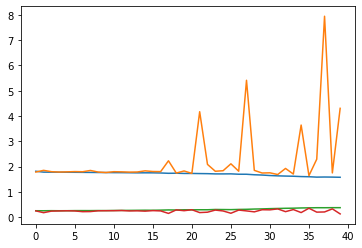

In [19]:
plt.plot(hist[:40]), best_acc, curloss

In [20]:
import imageio
images = []
for i in range(109):
    images.append(imageio.imread('/tf/data/Quan/fer2013/backtobasics/svgg6/svgg_resnet_gf_' + str(i) + '.png'))
imageio.mimsave('/tf/data/Quan/fer2013/backtobasics/svgg6/svgg_resnet_gf.gif', images)

## Heat map visualization

In [8]:
import cv2

def attention(model, img, lb=None, visual_heatmap=True):
    model.eval()
    output = model(img.unsqueeze(0))
    prob = nn.Softmax()(output.detach())
    prob = float(prob.max(1)[0][0])
    
    
    pred_lb = int(output.argmax(1)[0])
    
#     lb = pred_lb if lb is None else lb
    output[:,pred_lb].backward()

    # get gradient
    grads = gradients['last_conv'][0]
    
    # !!! 2 options
#     pooled_grads = torch.mean(grads, dim=[0, 2, 3])
    pooled_grads = torch.nn.functional.adaptive_avg_pool2d(grads, (1, 1))

    # get activation
    features = activation['last_conv']

    # weight the channels by corresponding gradients
    for i in range(features.size(1)):
        features[:, i, :, :] *= pooled_grads[0,i,:,:]
   
    heatmap = features.detach().numpy()
    heatmap = np.mean(heatmap, axis=1).squeeze()
    
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    
 
    img = img.numpy()[0]
    img = np.stack((img,)*3, axis=-1)
    
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0])) # Adjust the size of the heat map to be the same as the original image
    heatmap = np.uint8(255 * heatmap) # Convert the heat map to RGB format
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET) # Apply the heat map to the original image
    superimposed_img = heatmap * 0.008 + img # here 0.4 is the heat map intensity factor
        
    superimposed_img /= np.max(superimposed_img)
    
        
    return superimposed_img, pred_lb, prob
#         cv2.imwrite(save_path, superimposed_img)

In [9]:
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

gradients = {}
def get_gradient(name):
    def hook(model, in_grad, out_grad):
        gradients[name] = out_grad
        
    return hook

In [10]:
model = torch.load('/tf/data/Quan/fer2013/backtobasics/svgg2/svgg_resnet2.pt')
model = model.cpu()
model.eval()

model.wf3.register_forward_hook(get_activation('last_conv'))
model.wf3.register_backward_hook(get_gradient('last_conv'))

In [21]:
images, labels = next(iter(test_loader))[:40]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for

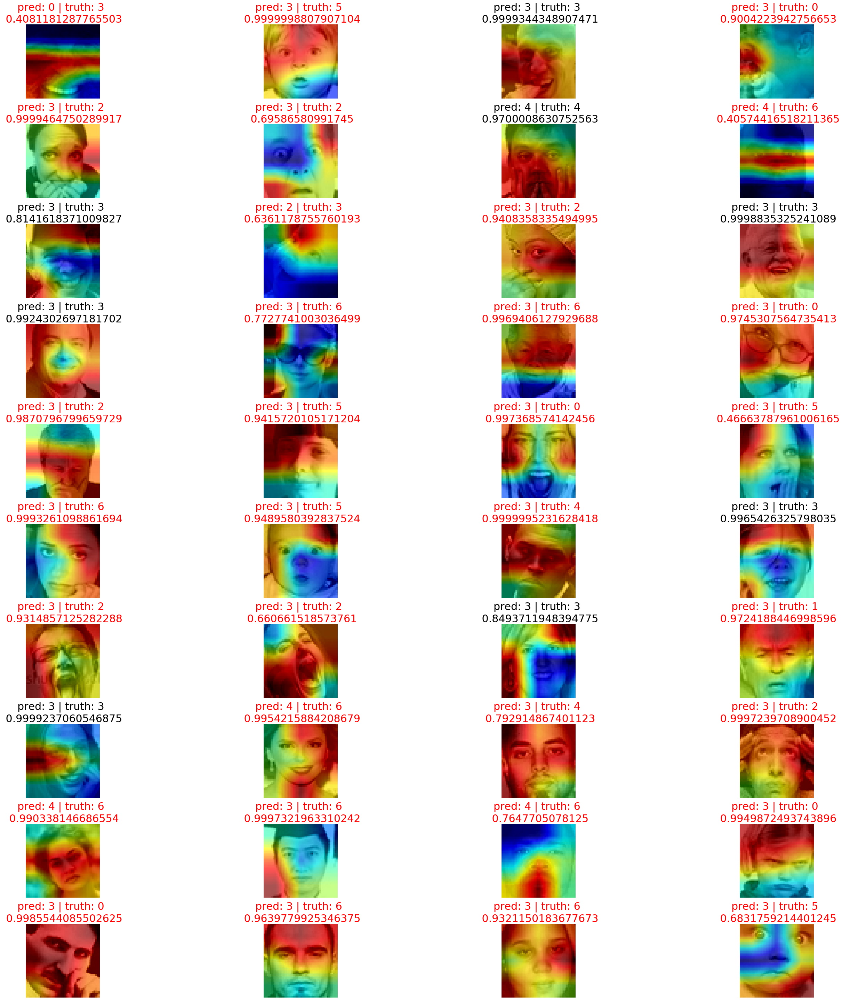

In [31]:
%matplotlib inline


# rows = len(labels) // 4 + 1
rows = 10
cols = 4
fig, axs = plt.subplots(rows, cols, figsize=(40,40))

id = 0

for i in range(rows):
    for j in range(cols):
        try:
            map, pred, prob = attention(model, images[id], None, False)
            
            axs[i,j].imshow(map[:,:,[2,1,0]])
            if pred == int(labels[id]):
                color = 'black'
            else:
                color = 'red'
            axs[i,j].set_title('pred: ' + str(pred) + ' | truth: ' + str(int(labels[id])) + ' \n ' + str(prob), size=30, color=color)
            axs[i,j].axis('off')
            id = id + 1
        except:
            break

plt.tight_layout()
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for

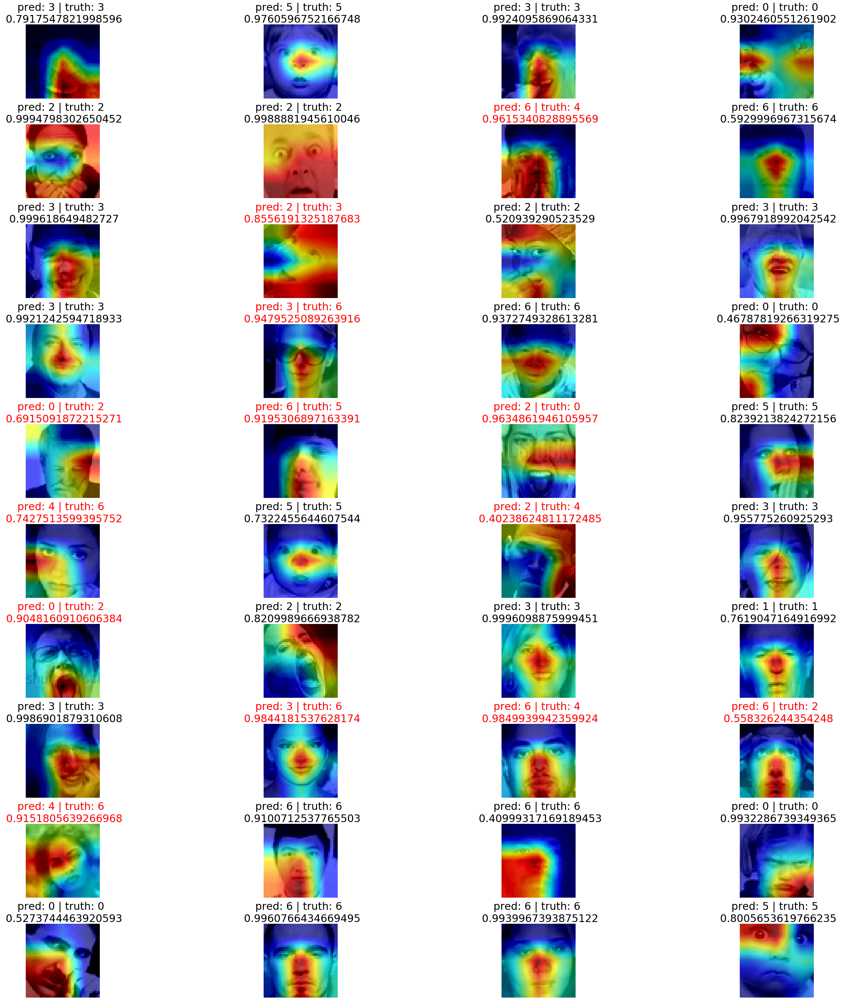

In [22]:
%matplotlib inline


# rows = len(labels) // 4 + 1
rows = 10
cols = 4
fig, axs = plt.subplots(rows, cols, figsize=(40,40))

id = 0

for i in range(rows):
    for j in range(cols):
        try:
            map, pred, prob = attention(model, images[id], None, False)
            
            axs[i,j].imshow(map[:,:,[2,1,0]])
            if pred == int(labels[id]):
                color = 'black'
            else:
                color = 'red'
            axs[i,j].set_title('pred: ' + str(pred) + ' | truth: ' + str(int(labels[id])) + ' \n ' + str(prob), size=30, color=color)
            axs[i,j].axis('off')
            id = id + 1
        except:
            break

plt.tight_layout()
plt.show()

In [48]:
model = model.to(device)
model.eval()

running_valloss = 0.0
running_valacc = 0.0
for i,data in enumerate(test_loader):
    # get the inputs; data is a list of [inputs, labels]
    inputs, labels = data
    inputs = inputs.to(device)
    labels = labels.to(device)

    outputs = model(inputs)
    acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
    loss = criterion(outputs, labels)

    running_valloss += loss.item()
    running_valacc += acc

print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))


RuntimeError: CUDA out of memory. Tried to allocate 72.00 MiB (GPU 0; 7.79 GiB total capacity; 5.96 GiB already allocated; 18.00 MiB free; 7.01 GiB reserved in total by PyTorch)

In [16]:
device = torch.device('cuda')
model = model.to(device)
model.eval()

running_valloss = 0.0
running_valacc = 0.0
for i,data in enumerate(train_loader):
    # get the inputs; data is a list of [inputs, labels]
    inputs, labels = data
    inputs = inputs.to(device)
    labels = labels.to(device)

    outputs = model(inputs)
    acc = float((torch.argmax(outputs, dim=1) == labels).float().sum()/labels.size(0))
    loss = criterion(outputs, labels)

    running_valloss += loss.item()
    running_valacc += acc

print('- Avg. val_loss: %.3f  | Avg. val_acc: %.3f' % (running_valloss / (i+1), running_valacc / (i+1)))


- Avg. val_loss: 1.949  | Avg. val_acc: 0.139
